# Macroscopic observables

In this notebook we'll explore how we can measure different macroscopic observables from molecular dynamics simulations.

## Velocity distribution

We'll start by exploring how the velocity distribution of Argon particles develop in time starting from a an unphysical uniform distribution. According to the central limit theorem the velocity distrbituion should go to a Maxwell-Boltzmann distribution.

In [128]:
import os
import sys
import re

sys.path.append("..")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from read_lammps_dump import read_dump

sns.set(color_codes=True)

We use Lammps to simulate the molecular dynamics system. Below we create a `.in`-file which Lammps uses to run a simulation.

In [3]:
%%writefile uniform.in
# 3d Lennard-Jones gas
units lj
dimension 3
# Periodic boundiaries
boundary p p p
atom_style atomic

lattice fcc 0.01
region simbox block 0 20 0 20 0 20
create_box 1 simbox
create_atoms 1 box

mass 1 1.0
velocity all create 2.5 87287 dist uniform

pair_style lj/cut 3.0
pair_coeff 1 1 1.0 1.0 3.0

fix 1 all nve

dump 1 all custom 10 uniform.lammpstrj id type x y z vx vy vz
thermo 100
run 5000

Overwriting uniform.in


We proceed to run the simulation by passing the Lammps config file to the Lammps executable.

In [4]:
!mpirun -np 2 lmp -in uniform.in

LAMMPS (4 Jan 2019)
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (147.361 147.361 147.361)
  1 by 1 by 2 MPI processor grid
Created 32000 atoms
  Time spent = 0.001944 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 90 90 90
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.005
Per MPI rank memory allocation (min/avg/max) = 9.772 | 9.772 | 9.772 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0          2.5            0            0    3.7498828  0.024999219 
     100    2.5004051 -0.0010155581            0    3.7494749   0.02498311 


Lammps creates a file called `uniform.lammpstrj` with the position of all the atoms at every $N$'th time step. We read this into a `pandas` `DataFrame` in order to analyse the results.

In [5]:
df, num_atoms, bounds = read_dump("uniform.lammpstrj")

Inspecting the 5 first and last rows to check that everything is okay.

In [6]:
df.head()

,id,type,x,y,z,vx,vy,vz,timestep
0,1,1,0.00000,0.00000,0.00000,1.013020,0.194801,0.138771,0
1,2,1,3.68403,3.68403,0.00000,-1.673840,0.826244,-1.131720,0
2,3,1,3.68403,0.00000,3.68403,-0.633593,-2.411290,1.367270,0
3,4,1,0.00000,3.68403,3.68403,0.220096,1.331590,-1.096720,0
4,5,1,7.36806,0.00000,0.00000,-0.146018,1.056760,0.050760,0


In [7]:
df.tail()

,id,type,x,y,z,vx,vy,vz,timestep
16031995,31996,1,111.2990,13.7543,143.40500,-2.537910,-1.203580,-2.216490,5000
16031996,31997,1,104.5280,102.2840,87.08030,1.136830,1.985340,-0.726526,5000
16031997,31998,1,135.4910,145.5000,130.36200,-0.009778,-0.851958,1.673030,5000
16031998,31999,1,54.9627,24.8221,2.11595,2.368370,0.166334,-3.136770,5000
16031999,32000,1,10.0472,120.0820,134.11500,2.305140,-0.679069,-1.494020,5000


The simulation we've run is run for $N$ particles, $n$ timesteps and a simulation box with sides $[0, L)$.

In [8]:
n = df.loc[len(df) - 1, "timestep"]
num_timesteps = n // 10
sigma = 3.405 # Ångström
L = bounds[0][1] * sigma

print(f"N = {num_atoms}")
print(f"n = {n}")
print(f"L = {L} Ångström")

N = 32000
n = 5000
L = 501.76509011482057 Ångström


## Adding velocity magnitude

From the simulation we have the velocity components $\mathbf{v}_i = (v_i^x, v_i^y, v_i^z)$ for every particle $i$. Initially they are in a uniform distribution with boundaries $v_i^j \in [-2.5, 2.5]$. The uniform distribution will be evident in the histogram plots for the velocity components. To better see the Maxwell-Boltzmann distribution we add the velocity magnitude of a particle by
\begin{align}
    v_i = |\mathbf{v}_i| = \sqrt{{v_i^x}^2 + {v_i^y}^2 + {v_i^z}^2},
\end{align}
as the cartesian components will look like Gaussians in a Maxwell-Boltzmann distribution.

In [9]:
df["v"] = np.sqrt(
    df["vx"] ** 2
    + df["vy"] ** 2
    + df["vz"] ** 2
)

We start by visualizing the initial velocity distribution. We expect this to be a uniform velocity distribution as we set the velocity to be uniform initially. However, the uniformity is only located in the cartesian components.

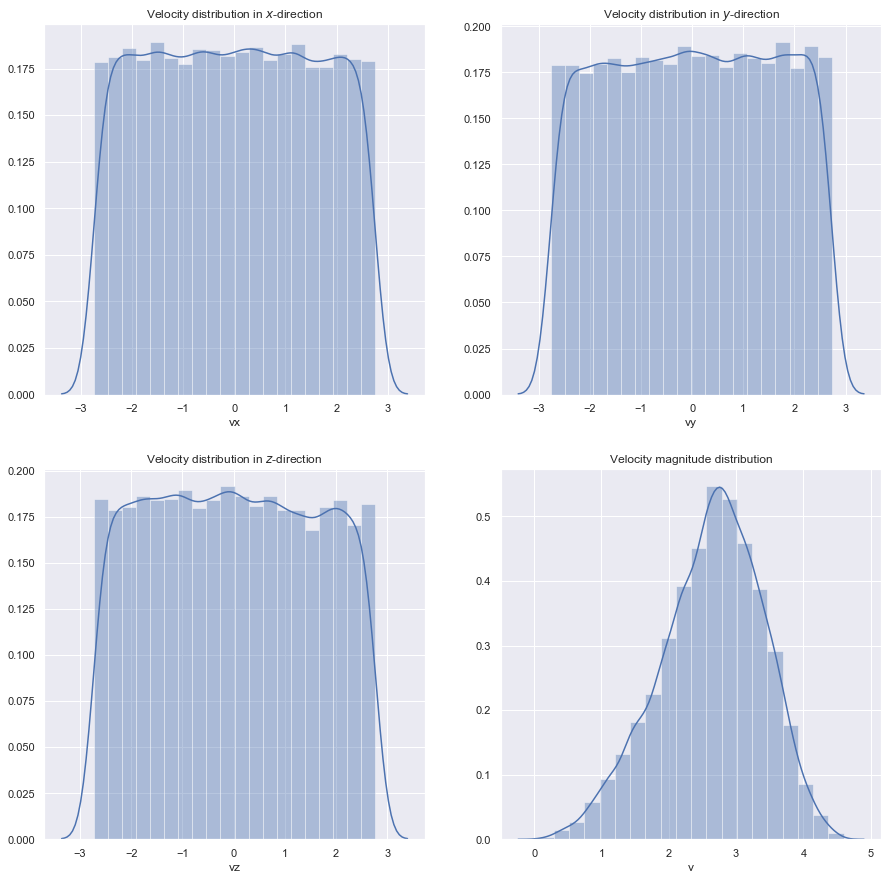

In [10]:
num_bins = 20

fig = plt.figure(figsize=(15, 15))

plt.subplot(2, 2, 1)
sns.distplot(df.iloc[:num_atoms].vx, bins=num_bins)
plt.title(r"Velocity distribution in $x$-direction")

plt.subplot(2, 2, 2)
sns.distplot(df.iloc[:num_atoms].vy, bins=num_bins)
plt.title(r"Velocity distribution in $y$-direction")

plt.subplot(2, 2, 3)
sns.distplot(df.iloc[:num_atoms].vz, bins=num_bins)
plt.title(r"Velocity distribution in $z$-direction")

plt.subplot(2, 2, 4)
sns.distplot(df.iloc[:num_atoms].v, bins=num_bins)
plt.title(r"Velocity magnitude distribution")

plt.show()

Here we can see the initial velocity distribution for each component and the velocity magnitude. The cartesian components clearly show the shape of a uniform distribution in the interval $[-2.5, 2.5]$. We proceed by inspecting the final time step which we expect to take on the shape of a Maxwell-Boltzmann distribution.

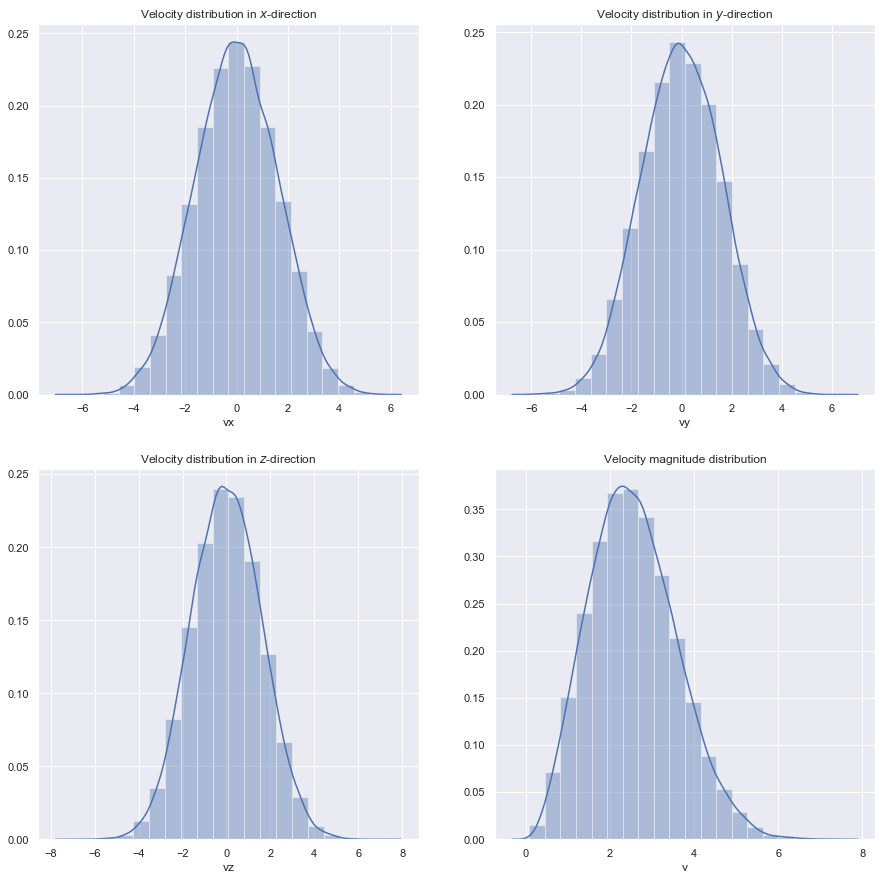

In [11]:
fig = plt.figure(figsize=(15, 15))

plt.subplot(2, 2, 1)
sns.distplot(df.iloc[num_timesteps * num_atoms:].vx, bins=num_bins)
plt.title(r"Velocity distribution in $x$-direction")

plt.subplot(2, 2, 2)
sns.distplot(df.iloc[num_timesteps * num_atoms:].vy, bins=num_bins)
plt.title(r"Velocity distribution in $y$-direction")

plt.subplot(2, 2, 3)
sns.distplot(df.iloc[num_timesteps * num_atoms:].vz, bins=num_bins)
plt.title(r"Velocity distribution in $z$-direction")

plt.subplot(2, 2, 4)
sns.distplot(df.iloc[num_timesteps * num_atoms:].v, bins=num_bins)
plt.title(r"Velocity magnitude distribution")

plt.show()

In these plots we see the expected normal distribution for the cartesian components, whereas the velocity magnitude shows the behaviour of a radial Maxwell-Boltzmann distribution.

## Quantizing the time it takes to reach the Maxwell-Boltzmann distribution

In order to determine how long time (or how many timesteps) it takes for the system to reach a Maxwell-Boltzmann distribution, we compute the normalized overlap between the histograms at every timestep with the final histogram. That is, the overlap $o_i$ is given by
\begin{align}
        o_i = \frac{\langle h_i, h_{n} \rangle}{\sqrt{\langle h_i, h_i \rangle \langle h_n, h_n \rangle}},
\end{align}

where the denominator is included to normalize the overlap.

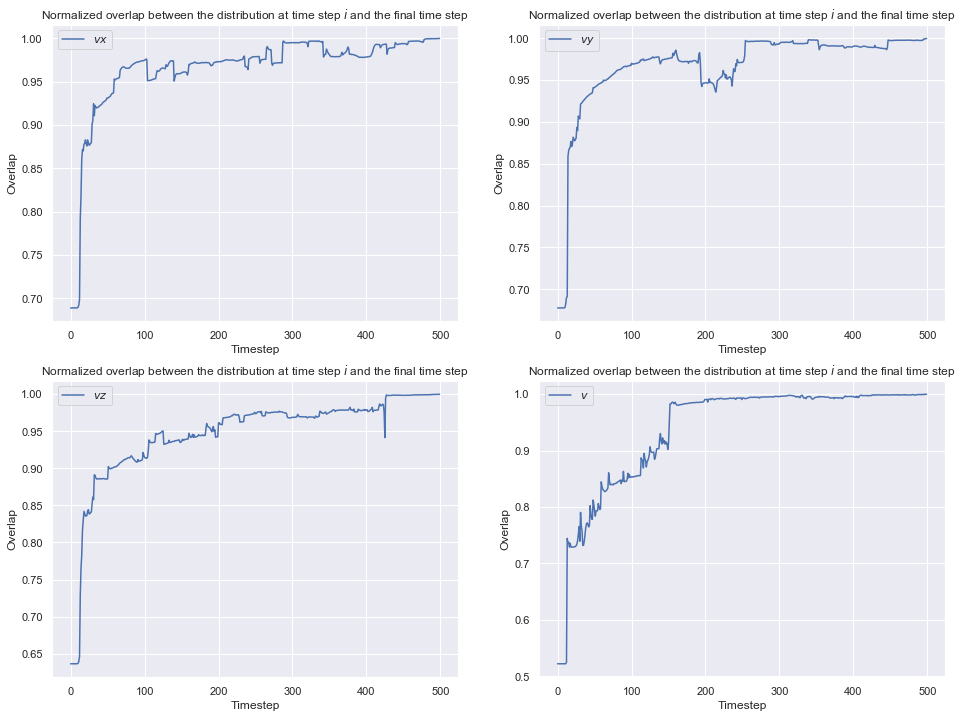

In [12]:
fig = plt.figure(figsize=(16, 12))
timesteps = np.arange(num_timesteps)
last_slice = slice((num_timesteps - 1) * num_atoms, num_timesteps * num_atoms)
overlap = np.zeros((4, num_timesteps))
num_bins = 100

for o_i, v in enumerate(["vx", "vy", "vz", "v"]):
    last_hist, bins = np.histogram(df.loc[last_slice, v], bins=num_bins)
    #last_hist = np.sort(last_hist)
    norm = np.sqrt(np.dot(last_hist, last_hist))

    for i in range(num_timesteps):
        t_i = slice(i * num_atoms, (i + 1) * num_atoms)
        hist, bins = np.histogram(df.loc[t_i, v], bins=num_bins)
        #hist = np.sort(hist)
        norm_i = np.sqrt(np.dot(hist, hist))
        overlap[o_i, i] = np.dot(hist, last_hist) / (norm * norm_i)

    plt.subplot(2, 2, o_i + 1)
    plt.plot(timesteps, overlap[o_i], label=fr"${v}$")
    plt.xlabel(r"Timestep")
    plt.ylabel(r"Overlap")
    plt.legend(loc="best")
    plt.title(r"Normalized overlap between the distribution at time step $i$ and the final time step")

plt.show()

In this figure we can see how both the mean velocity, i.e., the mean of the three cartesian components, and the velocity magnitude moves toward the final distribution which resembles the Maxwell-Boltzmann distribution.

## Energy conservation

As we are modelling an "infinite" system, that is, we use periodic boundary conditions, and there are no external forces applied, we expect the total energy of the system to be conserved throughout the simulation. However, there are a few discreptancies to this; first, the initial system is unphysical thus we need to let the system thermalize a little while before we call it a "physical" representation of nature. Second, if we use a too large time step $\Delta t$ Lammps might not be able to stop the system from behaving in an anomalous manner. We'll explore both of these trends in the following.

We'll begin by creating a script which sets up an initial distribution and runs for a given time step $\Delta t$ and a fixed amount of time $T$.

In [13]:
%%writefile energy-conservation.in
# 3d Lennard-Jones gas
units lj
timestep ${timestep}
dimension 3
boundary p p p
atom_style atomic

lattice fcc 0.01
region simbox block 0 10 0 10 0 10
create_box 1 simbox
create_atoms 1 box

mass 1 1.0
velocity all create 2.5 87287 dist uniform

pair_style lj/cut 3.0
pair_coeff 1 1 1.0 1.0 3.0

fix 1 all nve

#dump 1 all custom 10 dump.lammpstrj id type x y z vx vy vz
log ${filename}
thermo 10
run ${num_steps}

Overwriting energy-conservation.in


This file does not output a dump, but rather uses Lammps' logging functionality to keep track of the energy at every time step. We use Lammps and a bash script to fill in the placeholder variables.

In [14]:
%%writefile repeat_experiment.sh
export OMP_NUM_THREADS=4
num_mpi_threads=2

for i in $(seq 2 5); do
    echo For i = $i we get dt = $(python -c "print('%f' % 10 ** (-$i))")
    echo $(python -c "print(__import__('math').ceil(10 / 10 ** (-$i)))")
    mpirun -n $num_mpi_threads lmp \
        -var timestep $(python -c "print('%f' % 10 ** (-$i))") \
        -var filename thermo_$i.log \
        -var num_steps $(python -c "print(__import__('math').ceil(10 / 10 ** (-$i)))") \
        < energy-conservation.in
done

Overwriting repeat_experiment.sh


Next we run the shell script running the simulation for $\Delta t \in [0.01, 0.001, 0.0001, 0.00001]$.

In [56]:
!bash repeat_experiment.sh

For i = 2 we get dt = 0.010000
1000
LAMMPS (4 Jan 2019)
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (73.6806 73.6806 73.6806)
  1 by 1 by 2 MPI processor grid
Created 4000 atoms
  Time spent = 0.00109 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 45 45 45
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.01
Per MPI rank memory allocation (min/avg/max) = 3.356 | 3.356 | 3.356 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0          2.5            0            0    3.7490625   0.02499375 
      10          2.5            0         

For i = 3 we get dt = 0.001000
10000
LAMMPS (4 Jan 2019)
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (73.6806 73.6806 73.6806)
  1 by 1 by 2 MPI processor grid
Created 4000 atoms
  Time spent = 0.000705 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 45 45 45
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.001
Per MPI rank memory allocation (min/avg/max) = 3.356 | 3.356 | 3.356 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0          2.5            0            0    3.7490625   0.02499375 
      10          2.5            0      

    1070    2.5217851 -0.034865204            0    3.7468667  0.025810679 
    1080    2.5220664 -0.035299338            0    3.7468544  0.025795482 
    1090    2.5224277 -0.035864369            0    3.7468313  0.025766459 
    1100    2.5229557 -0.036671185            0    3.7468163  0.025720521 
    1110    2.5235668 -0.037590588            0    3.7468133  0.025664201 
    1120     2.523979 -0.038232028            0    3.7467899  0.025614398 
    1130    2.5240961 -0.038419612            0     3.746778  0.025578161 
    1140    2.5242308 -0.038629351            0    3.7467702  0.025538072 
    1150    2.5247357 -0.039404336            0    3.7467524  0.025474344 
    1160    2.5255753  -0.04066782            0     3.746748  0.025390674 
    1170    2.5264179 -0.041948059            0    3.7467313  0.025307584 
    1180    2.5269441  -0.04275642            0    3.7467121  0.025245852 
    1190    2.5270581 -0.042940959            0    3.7466986  0.025212722 
    1200    2.5269453  -0

    2270    2.5304213 -0.048451626            0    3.7462315  0.025462246 
    2280    2.5314519 -0.050001037            0    3.7462275  0.025395772 
    2290    2.5316105 -0.050233001            0    3.7462334  0.025380626 
    2300    2.5312071 -0.049614132            0    3.7462473   0.02540013 
    2310    2.5305325 -0.048607333            0    3.7462424  0.025435182 
    2320    2.5301534 -0.048032128            0    3.7462492  0.025452158 
    2330    2.5301015 -0.047970721            0    3.7462327    0.0254464 
    2340    2.5303148 -0.048305147            0    3.7462182   0.02542117 
    2350    2.5310688   -0.0494449            0    3.7462091  0.025363062 
    2360    2.5316384 -0.050285924            0    3.7462224  0.025315135 
    2370    2.5314883 -0.050061732            0    3.7462215  0.025308262 
    2380    2.5310159 -0.049355012            0    3.7462197   0.02532003 
    2390    2.5310475 -0.049392611            0    3.7462295  0.025303105 
    2400    2.5317686 -0.

    3670     2.532759 -0.052114865            0    3.7460739  0.025327073 
    3680    2.5330552 -0.052563997            0    3.7460689  0.025293384 
    3690    2.5335108 -0.053245705            0    3.7460704  0.025247731 
    3700    2.5341959 -0.054263658            0    3.7460798  0.025187513 
    3710    2.5349467 -0.055393877            0    3.7460756  0.025123352 
    3720    2.5356243 -0.056396173            0    3.7460894  0.025065905 
    3730    2.5362452 -0.057329954            0    3.7460867  0.025015822 
    3740    2.5367526 -0.058089748            0    3.7460879  0.024978665 
    3750    2.5369471 -0.058378631            0    3.7460906  0.024966911 
    3760    2.5367611 -0.058117421            0    3.7460729   0.02498434 
    3770     2.536317 -0.057455454            0    3.7460689  0.025024026 
    3780    2.5357748 -0.056654653            0    3.7460567  0.025074824 
    3790    2.5352789 -0.055916317            0    3.7460513  0.025126863 
    3800    2.5349891 -0.

    4950     2.538309 -0.060458446            0    3.7460531  0.025336094 
    4960    2.5370971 -0.058631471            0    3.7460628  0.025390761 
    4970    2.5360631 -0.057092478            0    3.7460512  0.025429595 
    4980    2.5359613 -0.056938243            0    3.7460527  0.025408952 
    4990    2.5368415 -0.058274437            0    3.7460366  0.025326513 
    5000    2.5376376 -0.059475357            0    3.7460294  0.025245849 
    5010    2.5378267 -0.059758374            0      3.74603  0.025200324 
    5020    2.5376846 -0.059543855            0    3.7460314  0.025176939 
    5030    2.5373166 -0.058992156            0    3.7460313  0.025170089 
    5040    2.5366672 -0.058022272            0    3.7460273  0.025181871 
    5050    2.5359212 -0.056908837            0     3.746022  0.025200238 
    5060    2.5353666 -0.056082087            0    3.7460171  0.025206596 
    5070    2.5355446 -0.056352994            0     3.746013  0.025169614 
    5080    2.5364002 -0.

    6180    2.5332327 -0.052991367            0    3.7459077  0.025460056 
    6190     2.533367 -0.053197307            0    3.7459032  0.025438208 
    6200    2.5330528 -0.052725408            0    3.7459039  0.025440923 
    6210    2.5329707 -0.052602629            0    3.7459035   0.02542898 
    6220    2.5338536  -0.05393726            0     3.745893  0.025361633 
    6230    2.5348585 -0.055428771            0    3.7459084  0.025288667 
    6240    2.5350025 -0.055642769            0    3.7459103  0.025266592 
    6250    2.5346523 -0.055097464            0    3.7459305  0.025276299 
    6260    2.5346214  -0.05505821            0    3.7459234   0.02527066 
    6270    2.5347487 -0.055249691            0    3.7459229  0.025258458 
    6280      2.53452 -0.054901198            0    3.7459284  0.025268207 
    6290    2.5339348 -0.054024402            0    3.7459275  0.025298813 
    6300    2.5334302 -0.053271657            0    3.7459236  0.025323966 
    6310    2.5332946 -0.

    7460    2.5342967 -0.054428716            0    3.7460659  0.025291812 
    7470    2.5347037 -0.055035011            0    3.7460701  0.025236578 
    7480    2.5351797  -0.05574247            0    3.7460763  0.025182845 
    7490    2.5352893 -0.055909554            0    3.7460737  0.025156193 
    7500    2.5349909 -0.055471774            0     3.746064  0.025160049 
    7510    2.5342424 -0.054352935            0    3.7460603  0.025195746 
    7520    2.5334806 -0.053192069            0    3.7460788  0.025236724 
    7530    2.5333261 -0.052962067            0    3.7460771  0.025245744 
    7540    2.5335018 -0.053215218            0    3.7460874  0.025238646 
    7550    2.5334364 -0.053110564            0    3.7460941  0.025248324 
    7560     2.532874 -0.052259324            0    3.7461019   0.02529018 
    7570    2.5316173 -0.050381174            0    3.7460953  0.025372904 
    7580    2.5302113  -0.04826855            0    3.7460995  0.025461981 
    7590    2.5299528 -0.

    8560    2.5368139 -0.058230937            0    3.7460386  0.025171872 
    8570    2.5364741 -0.057720671            0    3.7460393  0.025203082 
    8580    2.5368076 -0.058215946            0    3.7460442  0.025196232 
    8590    2.5372884 -0.058941415            0    3.7460396  0.025181033 
    8600    2.5373944 -0.059093568            0    3.7460465  0.025188801 
    8610    2.5370317 -0.058563323            0    3.7460329  0.025224717 
    8620    2.5364108 -0.057638211            0    3.7460268  0.025275919 
    8630    2.5362573 -0.057416076            0    3.7460188  0.025299819 
    8640    2.5367955 -0.058229697            0    3.7460123  0.025283692 
    8650    2.5371534 -0.058766895            0    3.7460117  0.025277334 
    8660    2.5367761 -0.058196604            0    3.7460163  0.025312411 
    8670    2.5361832 -0.057314674            0     3.746009  0.025358378 
    8680    2.5362204 -0.057376504            0     3.746003   0.02536664 
    8690    2.5365799  -0

    9710     2.536591 -0.058033528            0    3.7459017  0.025180567 
    9720     2.536471 -0.057859408            0     3.745896  0.025218434 
    9730    2.5361976  -0.05743701            0    3.7459084  0.025264654 
    9740    2.5357948 -0.056842647            0    3.7458986   0.02531697 
    9750    2.5351906  -0.05593816            0     3.745897  0.025378777 
    9760     2.534387 -0.054745937            0    3.7458842  0.025446682 
    9770    2.5343293 -0.054657454            0    3.7458861  0.025466199 
    9780    2.5354785 -0.056371075            0    3.7458959  0.025411689 
    9790    2.5367856 -0.058337486            0    3.7458897  0.025344223 
    9800    2.5374619 -0.059334969            0    3.7459063  0.025313365 
    9810    2.5376579 -0.059642211            0     3.745893  0.025313064 
    9820    2.5376997 -0.059706626            0    3.7458913  0.025327261 
    9830    2.5373684 -0.059206982            0    3.7458941  0.025367535 
    9840    2.5366527 -0.

     870          2.5            0            0    3.7490625   0.02499375 
     880          2.5            0            0    3.7490625   0.02499375 
     890          2.5            0            0    3.7490625   0.02499375 
     900          2.5            0            0    3.7490625   0.02499375 
     910          2.5            0            0    3.7490625   0.02499375 
     920          2.5            0            0    3.7490625   0.02499375 
     930          2.5            0            0    3.7490625   0.02499375 
     940          2.5            0            0    3.7490625   0.02499375 
     950          2.5            0            0    3.7490625   0.02499375 
     960          2.5            0            0    3.7490625   0.02499375 
     970          2.5            0            0    3.7490625   0.02499375 
     980          2.5            0            0    3.7490625   0.02499375 
     990          2.5            0            0    3.7490625   0.02499375 
    1000          2.5    

    2340          2.5            0            0    3.7490625   0.02499375 
    2350          2.5            0            0    3.7490625   0.02499375 
    2360          2.5            0            0    3.7490625   0.02499375 
    2370          2.5            0            0    3.7490625   0.02499375 
    2380          2.5            0            0    3.7490625   0.02499375 
    2390          2.5            0            0    3.7490625   0.02499375 
    2400          2.5            0            0    3.7490625   0.02499375 
    2410          2.5            0            0    3.7490625   0.02499375 
    2420          2.5            0            0    3.7490625   0.02499375 
    2430          2.5            0            0    3.7490625   0.02499375 
    2440          2.5            0            0    3.7490625   0.02499375 
    2450          2.5            0            0    3.7490625   0.02499375 
    2460          2.5            0            0    3.7490625   0.02499375 
    2470          2.5    

    3440    2.5000013 -8.8337638e-06            0    3.7490557  0.024993587 
    3450    2.5000014 -1.3094454e-05            0    3.7490515  0.024993503 
    3460    2.5000015 -1.3274118e-05            0    3.7490515    0.0249935 
    3470    2.5000017 -1.3456649e-05            0    3.7490515  0.024993498 
    3480    2.5000018 -1.3642099e-05            0    3.7490515  0.024993496 
    3490    2.5000019 -1.3830521e-05            0    3.7490515  0.024993493 
    3500    2.5000021 -1.6782439e-05            0    3.7490488  0.024993436 
    3510    2.5000022 -1.9774278e-05            0    3.7490461  0.024993377 
    3520    2.5000024 -2.1425839e-05            0    3.7490447  0.024993346 
    3530    2.5000026 -2.4473156e-05            0     3.749042  0.024993288 
    3540    2.5000028 -2.479843e-05            0     3.749042  0.024993283 
    3550    2.5000031 -2.5128717e-05            0     3.749042  0.024993279 
    3560    2.5000033 -2.5464104e-05            0     3.749042  0.024993274 


    4890    2.5003192  -0.00085681            0    3.7486844  0.024979916 
    4900    2.5003264 -0.00087300605            0    3.7486789  0.024979667 
    4910    2.5003337 -0.00088528858            0    3.7486776  0.024979498 
    4920    2.5003411 -0.00089912582            0    3.7486748    0.0249793 
    4930    2.5003486 -0.00091452787            0    3.7486707  0.024979071 
    4940    2.5003563 -0.00093288353            0    3.7486639  0.024978785 
    4950    2.5003641 -0.00094596851            0    3.7486625  0.024978607 
    4960     2.500372 -0.00096474793            0    3.7486557  0.024978315 
    4970    2.5003801 -0.00098239615            0    3.7486502  0.024978049 
    4980    2.5003884 -0.000996144            0    3.7486488  0.024977862 
    4990    2.5003968 -0.0010087207            0    3.7486488  0.024977699 
    5000    2.5004053 -0.0010269953            0    3.7486433  0.024977425 
    5010     2.500414 -0.0010413911            0     3.748642   0.02497723 
    50

    6050    2.5025573 -0.0046966366            0    3.7482009  0.024964403 
    6060    2.5025541 -0.0046986243            0     3.748194  0.024967326 
    6070    2.5025461 -0.0046948728            0    3.7481858  0.024970538 
    6080     2.502533 -0.0046808112            0    3.7481803  0.024974137 
    6090    2.5025147 -0.0046546202            0    3.7481789  0.024978163 
    6100    2.5024907 -0.0046214368            0    3.7481762  0.024982518 
    6110    2.5024611 -0.0045865525            0    3.7481666  0.024987097 
    6120    2.5024257 -0.004541696            0    3.7481584  0.024992063 
    6130    2.5023846 -0.0044828285            0    3.7481556  0.024997492 
    6140     2.502338 -0.0044157745            0    3.7481529  0.025003259 
    6150    2.5022864 -0.0043397592            0    3.7481515  0.025009364 
    6160    2.5022304 -0.0042612082            0    3.7481461   0.02501566 
    6170    2.5021708 -0.0041759058            0    3.7481419  0.025022206 
    6180    2

    7310    2.5060832 -0.010488237            0    3.7476967  0.025374992 
    7320    2.5061981 -0.010663265            0     3.747694   0.02537349 
    7330    2.5063051 -0.010826522            0    3.7476913  0.025372466 
    7340    2.5064043 -0.010976688            0    3.7476899  0.025371947 
    7350    2.5064959 -0.011116725            0    3.7476871  0.025371872 
    7360      2.50658 -0.011249765            0    3.7476803  0.025372173 
    7370    2.5066571  -0.01136811            0    3.7476776  0.025372995 
    7380    2.5067276 -0.011480621            0    3.7476707  0.025374153 
    7390    2.5067919 -0.011581192            0    3.7476666  0.025375755 
    7400    2.5068506 -0.011673343            0    3.7476625  0.025377718 
    7410    2.5069043  -0.01176341            0    3.7476529  0.025379901 
    7420    2.5069535  -0.01184129            0    3.7476488  0.025382492 
    7430    2.5069987 -0.011913273            0    3.7476447  0.025385349 
    7440    2.5070406 -0.

    8750    2.5122011 -0.020071046            0    3.7472885  0.025835324 
    8760    2.5123431 -0.020285303            0    3.7472872  0.025829861 
    8770    2.5124929 -0.020512789            0    3.7472844   0.02582378 
    8780    2.5126502 -0.020752701            0    3.7472803  0.025817114 
    8790    2.5128143  -0.02099745            0    3.7472817  0.025810029 
    8800    2.5129848 -0.021255926            0    3.7472789  0.025802363 
    8810    2.5131613 -0.021524743            0    3.7472748    0.0257942 
    8820    2.5133434 -0.021803306            0    3.7472694  0.025785565 
    8830    2.5135308   -0.0220897            0    3.7472639   0.02577651 
    8840     2.513723 -0.022379291            0    3.7472625  0.025767141 
    8850    2.5139197 -0.022677056            0    3.7472598  0.025757373 
    8860    2.5141207 -0.022979788            0    3.7472584  0.025747283 
    8870    2.5143255 -0.023289746            0    3.7472557  0.025736839 
    8880     2.514534 -0.

    9970    2.5247838 -0.039236301            0    3.7469926   0.02536293 
    9980    2.5246879 -0.039092479            0    3.7469926  0.025373902 
    9990    2.5245885 -0.038947438            0    3.7469885  0.025385025 
   10000    2.5244858 -0.038793509            0    3.7469885  0.025396439 
   10010    2.5243804 -0.038640875            0    3.7469831  0.025407925 
   10020    2.5242726 -0.038481978            0    3.7469803  0.025419618 
   10030    2.5241629 -0.038320215            0    3.7469776  0.025431433 
   10040    2.5240518  -0.03815629            0    3.7469748  0.025443341 
   10050    2.5239397  -0.03798955            0    3.7469735  0.025455336 
   10060    2.5238271 -0.037824865            0    3.7469694  0.025467304 
   10070    2.5237146 -0.037657476            0     3.746968  0.025479322 
   10080    2.5236026 -0.037488129            0    3.7469694  0.025491358 
   10090    2.5234916  -0.03732442            0    3.7469666  0.025503244 
   10100     2.523382 -0.

   11150    2.5238145 -0.037967656            0    3.7468077  0.025637586 
   11160    2.5238546 -0.038029149            0    3.7468063  0.025632666 
   11170    2.5238913  -0.03809096            0    3.7467995  0.025627796 
   11180    2.5239244 -0.038140654            0    3.7467995  0.025623227 
   11190     2.523954 -0.038194654            0    3.7467899   0.02561863 
   11200    2.5239802 -0.038232491            0    3.7467913  0.025614416 
   11210    2.5240029 -0.038270724            0    3.7467872   0.02561025 
   11220    2.5240225 -0.038302757            0    3.7467844  0.025606261 
   11230     2.524039 -0.038328888            0    3.7467831  0.025602439 
   11240    2.5240527 -0.038349495            0    3.7467831  0.025598769 
   11250     2.524064  -0.03836777            0    3.7467817  0.025595179 
   11260    2.5240732 -0.038381523            0    3.7467817  0.025591705 
   11270    2.5240806 -0.038392742            0    3.7467817  0.025588297 
   11280    2.5240868 -0.

   12380    2.5263458 -0.041926544            0    3.7466447  0.025197741 
   12390    2.5263328 -0.041909817            0     3.746642   0.02519829 
   12400    2.5263216 -0.041891765            0    3.7466433  0.025198847 
   12410    2.5263124 -0.041883409            0    3.7466379  0.025199189 
   12420    2.5263051 -0.041876573            0    3.7466337   0.02519948 
   12430    2.5262997 -0.041869845            0    3.7466324  0.025199746 
   12440    2.5262962 -0.041863146            0    3.7466337  0.025199991 
   12450    2.5262944 -0.041854974            0    3.7466392  0.025200247 
   12460    2.5262942 -0.041858881            0    3.7466351  0.025200244 
   12470    2.5262956 -0.041860952            0    3.7466351  0.025200264 
   12480    2.5262984 -0.041870574            0    3.7466296  0.025200123 
   12490    2.5263024   -0.0418779            0    3.7466283   0.02520002 
   12500    2.5263074 -0.041882691            0     3.746631  0.025199965 
   12510    2.5263133 -0.

   13580    2.5254064 -0.040579495            0    3.7465831  0.025441061 
   13590    2.5254432 -0.040637406            0    3.7465803   0.02544024 
   13600    2.5254856 -0.040705173            0    3.7465762  0.025438998 
   13610    2.5255336 -0.040775711            0    3.7465776  0.025437482 
   13620    2.5255869 -0.040857075            0    3.7465762  0.025435535 
   13630    2.5256456 -0.040943633            0    3.7465776  0.025433272 
   13640    2.5257094 -0.041038017            0     3.746579  0.025430646 
   13650    2.5257784 -0.041141487            0     3.746579  0.025427635 
   13660    2.5258525 -0.041253954            0    3.7465776  0.025424245 
   13670    2.5259316 -0.041376688            0    3.7465735  0.025420457 
   13680    2.5260156 -0.041502686            0    3.7465735  0.025416414 
   13690    2.5261044 -0.041635853            0    3.7465735  0.025412045 
   13700    2.5261978 -0.041775968            0    3.7465735  0.025407363 
   13710    2.5262957 -0.

   14810    2.5319277 -0.050448005            0     3.746494   0.02515264 
   14820    2.5319298 -0.050451149            0     3.746494   0.02515409 
   14830    2.5319297 -0.050449694            0    3.7464954  0.025155746 
   14840    2.5319278 -0.050444061            0    3.7464981  0.025157591 
   14850    2.5319243  -0.05043877            0    3.7464981  0.025159527 
   14860    2.5319194 -0.050432818            0    3.7464968  0.025161566 
   14870    2.5319134 -0.050422439            0    3.7464981  0.025163776 
   14880    2.5319064 -0.050412057            0    3.7464981  0.025166062 
   14890    2.5318988 -0.050400613            0    3.7464981  0.025168439 
   14900    2.5318906 -0.050392472            0     3.746494  0.025170812 
   14910    2.5318821 -0.050382391            0    3.7464913  0.025173283 
   14920    2.5318733 -0.050374668            0    3.7464858  0.025175761 
   14930    2.5318643 -0.050363966            0    3.7464831  0.025178348 
   14940    2.5318552 -0.

   15910    2.5285397 -0.045389192            0    3.7464721  0.025577796 
   15920    2.5286421 -0.045538727            0    3.7464762  0.025571054 
   15930    2.5287478 -0.045699952            0    3.7464735  0.025563874 
   15940    2.5288563 -0.045861291            0    3.7464748  0.025556501 
   15950    2.5289673 -0.046026369            0    3.7464762  0.025548876 
   15960    2.5290805 -0.046197578            0    3.7464748  0.025540959 
   15970    2.5291959 -0.046373318            0    3.7464721   0.02553279 
   15980    2.5293133 -0.046546624            0    3.7464748  0.025524516 
   15990    2.5294327 -0.046724348            0    3.7464762  0.025516004 
   16000    2.5295542 -0.046909252            0    3.7464735  0.025507202 
   16010    2.5296778 -0.047097337            0    3.7464707  0.025498194 
   16020    2.5298036 -0.047286029            0    3.7464707  0.025489032 
   16030    2.5299318 -0.047483726            0    3.7464653   0.02547955 
   16040    2.5300625 -0.

   17200    2.5328289 -0.051926865            0    3.7463666  0.025248452 
   17210    2.5328337 -0.051936775            0    3.7463639  0.025248503 
   17220    2.5328368  -0.05194145            0    3.7463639  0.025248696 
   17230    2.5328384 -0.051941201            0    3.7463666  0.025249019 
   17240    2.5328389 -0.051944629            0    3.7463639  0.025249295 
   17250    2.5328384 -0.051943964            0    3.7463639  0.025249673 
   17260    2.5328374 -0.051941057            0    3.7463653  0.025250108 
   17270    2.5328362  -0.05193916            0    3.7463653  0.025250527 
   17280     2.532835 -0.051938824            0    3.7463639  0.025250911 
   17290    2.5328344 -0.051951577            0    3.7463502  0.025251022 
   17300    2.5328346 -0.051954671            0    3.7463475  0.025251304 
   17310    2.5328361 -0.051955444            0    3.7463488  0.025251605 
   17320     2.532839 -0.051958476            0    3.7463502  0.025251826 
   17330    2.5328437 -0.

   18300    2.5323503 -0.051274968            0    3.7463009  0.025306731 
   18310    2.5322511 -0.051126175            0    3.7463009  0.025312877 
   18320    2.5321431 -0.050964287            0    3.7463009  0.025319559 
   18330    2.5320266 -0.050789537            0    3.7463009  0.025326764 
   18340    2.5319017 -0.050599494            0    3.7463036   0.02533453 
   18350    2.5317687  -0.05040274            0    3.7463009  0.025342674 
   18360    2.5316278 -0.050188787            0    3.7463036  0.025351393 
   18370    2.5314795 -0.049966364            0    3.7463036  0.025360498 
   18380    2.5313241 -0.049733341            0    3.7463036  0.025370015 
   18390    2.5311621 -0.049489048            0     3.746305  0.025379939 
   18400    2.5309941 -0.049235653            0    3.7463063  0.025390208 
   18410    2.5308206 -0.048975424            0    3.7463063  0.025400752 
   18420    2.5306422 -0.048706636            0    3.7463077  0.025411582 
   18430    2.5304599 -0.

   19610    2.5309562 -0.049203466            0    3.7462817   0.02526997 
   19620     2.530877 -0.049087449            0    3.7462789  0.025276557 
   19630    2.5307975  -0.04896546            0    3.7462817  0.025283314 
   19640    2.5307175 -0.048848295            0    3.7462789  0.025290026 
   19650     2.530637 -0.048727589            0    3.7462789  0.025296859 
   19660    2.5305559 -0.048604591            0    3.7462803  0.025303788 
   19670    2.5304741 -0.048481926            0    3.7462803   0.02531076 
   19680    2.5303916 -0.048355404            0    3.7462831  0.025317858 
   19690    2.5303082  -0.04823315            0    3.7462803  0.025324919 
   19700     2.530224  -0.04810819            0    3.7462789  0.025332082 
   19710    2.5301388 -0.047977661            0    3.7462817  0.025339405 
   19720    2.5300524 -0.047849576            0    3.7462803  0.025346727 
   19730    2.5299649 -0.047719606            0    3.7462789  0.025354136 
   19740    2.5298759 -0.

   20760    2.5307521   -0.0489331            0    3.7462461   0.02530215 
   20770    2.5308637 -0.049101729            0    3.7462447  0.025294084 
   20780    2.5309723 -0.049261943            0    3.7462474  0.025286307 
   20790     2.531077 -0.049425799            0    3.7462406  0.025278611 
   20800    2.5311767 -0.049578001            0    3.7462379  0.025271331 
   20810    2.5312703 -0.049717043            0    3.7462392  0.025264527 
   20820     2.531357 -0.049849718            0    3.7462365  0.025258093 
   20830    2.5314357 -0.049967845            0    3.7462365  0.025252216 
   20840    2.5315059 -0.050075738            0    3.7462337  0.025246834 
   20850    2.5315666 -0.050169593            0     3.746231  0.025242044 
   20860    2.5316174 -0.050247075            0    3.7462296  0.025237912 
   20870    2.5316576 -0.050307375            0    3.7462296  0.025234468 
   20880    2.5316868 -0.050342972            0    3.7462378  0.025231876 
   20890    2.5317047 -0.

   21900    2.5324293 -0.051467333            0    3.7462269  0.025228031 
   21910    2.5324303 -0.051466217            0    3.7462296  0.025230134 
   21920    2.5324168 -0.051447287            0    3.7462283  0.025233046 
   21930    2.5323886 -0.051407788            0    3.7462255  0.025236821 
   21940     2.532346 -0.051338396            0     3.746231   0.02524164 
   21950    2.5322893 -0.051251903            0    3.7462324  0.025247239 
   21960    2.5322188 -0.051140814            0    3.7462379  0.025253752 
   21970    2.5321354 -0.051016994            0    3.7462365  0.025260924 
   21980    2.5320396 -0.050867854            0     3.746242  0.025268984 
   21990    2.5319323 -0.050705662            0    3.7462433  0.025277661 
   22000    2.5318146 -0.050530516            0     3.746242  0.025286923 
   22010    2.5316875 -0.050339939            0     3.746242  0.025296787 
   22020    2.5315523 -0.050135731            0    3.7462433  0.025307182 
   22030    2.5314101  -0

   23270    2.5301158 -0.047987043            0    3.7462379  0.025448688 
   23280    2.5301137 -0.047992113            0    3.7462296  0.025447686 
   23290    2.5301125 -0.047987545            0    3.7462324  0.025446803 
   23300    2.5301125 -0.047986177            0    3.7462338  0.025445773 
   23310    2.5301142 -0.047988722            0    3.7462338  0.025444572 
   23320    2.5301182 -0.047998845            0    3.7462297  0.025443111 
   23330    2.5301252 -0.048009382            0    3.7462297  0.025441516 
   23340     2.530136 -0.048029702            0    3.7462255  0.025439584 
   23350    2.5301514  -0.04805135            0    3.7462269  0.025437465 
   23360     2.530172 -0.048086383            0    3.7462228  0.025434901 
   23370    2.5301985  -0.04812893            0    3.7462201  0.025431997 
   23380    2.5302315 -0.048177034            0    3.7462214   0.02542878 
   23390    2.5302714 -0.048236738            0    3.7462214  0.025425122 
   23400    2.5303182 -0.

   24460     2.531327 -0.049823892            0    3.7462173  0.025253463 
   24470    2.5312016 -0.049637324            0    3.7462159  0.025261382 
   24480    2.5310711 -0.049441617            0    3.7462159  0.025269638 
   24490    2.5309356 -0.049237006            0    3.7462173  0.025278217 
   24500    2.5307953 -0.049022412            0    3.7462214   0.02528713 
   24510    2.5306504 -0.048803733            0    3.7462228  0.025296247 
   24520    2.5305012 -0.048580041            0    3.7462228  0.025305573 
   24530    2.5303482 -0.048353321            0    3.7462201  0.025315052 
   24540    2.5301918 -0.048117465            0    3.7462214  0.025324788 
   24550    2.5300327 -0.047876075            0    3.7462242  0.025334687 
   24560    2.5298714  -0.04763289            0    3.7462255  0.025344653 
   24570    2.5297088 -0.047393113            0    3.7462214  0.025354556 
   24580    2.5295456 -0.047152527            0    3.7462173  0.025364455 
   24590    2.5293828  -0

   25800    2.5311671 -0.049647213            0    3.7461543   0.02505317 
   25810    2.5311553 -0.049629413            0    3.7461543  0.025052215 
   25820    2.5311415 -0.049607442            0    3.7461557  0.025051432 
   25830    2.5311262  -0.04958721            0    3.7461529  0.025050694 
   25840    2.5311096 -0.049560899            0    3.7461543  0.025050149 
   25850     2.531092 -0.049531772            0    3.7461571  0.025049723 
   25860    2.5310738 -0.049504502            0    3.7461571   0.02504931 
   25870    2.5310555 -0.049475629            0    3.7461584  0.025048969 
   25880    2.5310374   -0.0494486            0    3.7461584  0.025048618 
   25890    2.5310202 -0.049424163            0    3.7461571  0.025048229 
   25900    2.5310043 -0.049398956            0    3.7461584  0.025047855 
   25910    2.5309903 -0.049377864            0    3.7461584  0.025047385 
   25920    2.5309786 -0.049363046            0    3.7461557  0.025046763 
   25930    2.5309697 -0.

   26930    2.5283911  -0.04551575            0    3.7461228  0.025359665 
   26940    2.5284061 -0.045534064            0    3.7461269  0.025361608 
   26950    2.5284237 -0.045560471            0    3.7461269  0.025363267 
   26960    2.5284436 -0.045591617            0    3.7461255   0.02536472 
   26970    2.5284653 -0.045628274            0    3.7461214  0.025365964 
   26980    2.5284884 -0.045662941            0    3.7461214  0.025367162 
   26990    2.5285124 -0.045696247            0    3.7461242  0.025368314 
   27000    2.5285368 -0.045731506            0    3.7461255  0.025369369 
   27010    2.5285611 -0.045769214            0    3.7461242  0.025370331 
   27020    2.5285845 -0.045804359            0    3.7461242  0.025371319 
   27030    2.5286065 -0.045840104            0    3.7461214  0.025372285 
   27040    2.5286264 -0.045871358            0    3.7461201  0.025373347 
   27050    2.5286436 -0.045893046            0    3.7461242  0.025374623 
   27060    2.5286575 -0.

   28370    2.5304141 -0.048526106            0    3.7461461  0.025417124 
   28380    2.5301957 -0.048195908            0    3.7461488  0.025432697 
   28390    2.5299777 -0.047868979            0    3.7461488  0.025448162 
   28400    2.5297615 -0.047544787            0    3.7461488  0.025463485 
   28410    2.5295487 -0.047226948            0    3.7461475  0.025478546 
   28420    2.5293407 -0.046915044            0    3.7461475  0.025493305 
   28430    2.5291391  -0.04661277            0    3.7461475  0.025507643 
   28440    2.5289455 -0.046323786            0    3.7461461  0.025521441 
   28450    2.5287613 -0.046044783            0    3.7461488   0.02553472 
   28460    2.5285878 -0.045780465            0    3.7461529  0.025547346 
   28470    2.5284261 -0.045542199            0    3.7461488  0.025559058 
   28480    2.5282774 -0.045316378            0    3.7461516  0.025570094 
   28490    2.5281423 -0.045111007            0    3.7461543   0.02558027 
   28500    2.5280213 -0.

   29480    2.5323277  -0.05140408            0    3.7461379  0.025348414 
   29490    2.5322432 -0.051271848            0    3.7461433  0.025353625 
   29500    2.5321616 -0.051150813            0     3.746142  0.025358534 
   29510    2.5320847 -0.051036934            0    3.7461406  0.025363173 
   29520    2.5320145 -0.050934366            0    3.7461379  0.025367411 
   29530    2.5319527 -0.050840269            0    3.7461392  0.025371257 
   29540    2.5319008 -0.050762559            0    3.7461392  0.025374511 
   29550    2.5318605 -0.050702023            0    3.7461392  0.025377121 
   29560    2.5318327 -0.050660423            0    3.7461392  0.025379019 
   29570    2.5318185 -0.050639033            0    3.7461392  0.025380161 
   29580    2.5318182 -0.050638563            0    3.7461392  0.025380519 
   29590    2.5318319 -0.050661873            0    3.7461365  0.025380033 
   29600    2.5318593 -0.050700297            0    3.7461392  0.025378886 
   29610    2.5318998  -0

   30660    2.5320142 -0.050969488            0    3.7461022  0.025331441 
   30670    2.5320438 -0.051009899            0    3.7461064  0.025328639 
   30680    2.5320775 -0.051060366            0    3.7461064  0.025325526 
   30690    2.5321148 -0.051117742            0     3.746105  0.025322175 
   30700    2.5321556 -0.051177439            0    3.7461064  0.025318684 
   30710    2.5321993  -0.05124577            0    3.7461036  0.025314938 
   30720    2.5322457 -0.051316675            0    3.7461022  0.025311069 
   30730    2.5322943 -0.051389539            0    3.7461022    0.0253071 
   30740    2.5323447 -0.051467851            0    3.7460995  0.025302975 
   30750    2.5323965 -0.051544154            0    3.7461009  0.025298854 
   30760    2.5324492 -0.051616431            0    3.7461077  0.025294791 
   30770    2.5325025 -0.051693665            0    3.7461105  0.025290616 
   30780    2.5325561 -0.051773915            0    3.7461105   0.02528638 
   30790    2.5326094 -0.

   31760    2.5304535 -0.048589369            0     3.746142  0.025420965 
   31770    2.5304859   -0.0486393            0    3.7461406  0.025418749 
   31780    2.5305251 -0.048695339            0    3.7461433  0.025416151 
   31790     2.530571 -0.048764215            0    3.7461433  0.025413039 
   31800    2.5306236 -0.048840293            0    3.7461461  0.025409531 
   31810    2.5306826 -0.048931571            0    3.7461433  0.025405475 
   31820     2.530748 -0.049030927            0     3.746142   0.02540102 
   31830    2.5308193 -0.049136587            0    3.7461433   0.02539621 
   31840    2.5308964 -0.049256334            0    3.7461392  0.025390902 
   31850    2.5309789 -0.049384141            0    3.7461351  0.025385228 
   31860    2.5310664  -0.04951673            0    3.7461338  0.025379268 
   31870    2.5311585 -0.049654777            0    3.7461338  0.025373022 
   31880    2.5312546 -0.049794822            0    3.7461379  0.025366576 
   31890    2.5313543 -0.

   32990     2.533378 -0.052973647            0    3.7461433  0.025107076 
   33000    2.5334525   -0.0530868            0     3.746142  0.025100419 
   33010    2.5335238 -0.053195089            0    3.7461406  0.025093968 
   33020     2.533592 -0.053295907            0     3.746142  0.025087775 
   33030    2.5336571 -0.053399003            0    3.7461365  0.025081646 
   33040    2.5337193 -0.053488174            0    3.7461406  0.025075902 
   33050    2.5337787 -0.053578679            0    3.7461392  0.025070238 
   33060    2.5338356 -0.053666655            0    3.7461365  0.025064728 
   33070      2.53389 -0.053749609            0    3.7461351  0.025059421 
   33080    2.5339421 -0.053830488            0    3.7461324  0.025054255 
   33090     2.533992 -0.053902691            0    3.7461351   0.02504936 
   33100      2.53404 -0.053977373            0    3.7461324  0.025044511 
   33110    2.5340861 -0.054046528            0    3.7461324  0.025039867 
   33120    2.5341305 -0.

   34250    2.5331313 -0.052617402            0    3.7461296  0.025151661 
   34260    2.5331068 -0.052575096            0    3.7461351  0.025155365 
   34270    2.5330795 -0.052539659            0    3.7461296  0.025159025 
   34280    2.5330495 -0.052494729            0    3.7461296  0.025162967 
   34290     2.533017  -0.05244318            0    3.7461324  0.025167127 
   34300    2.5329819  -0.05239476            0    3.7461283  0.025171308 
   34310    2.5329446 -0.052340099            0    3.7461269  0.025175691 
   34320    2.5329051 -0.052279505            0    3.7461283  0.025180263 
   34330    2.5328637 -0.052218764            0    3.7461269  0.025184901 
   34340    2.5328206 -0.052154149            0    3.7461269   0.02518967 
   34350    2.5327761 -0.052082029            0    3.7461324  0.025194634 
   34360    2.5327307  -0.05200976            0    3.7461365  0.025199636 
   34370    2.5326846 -0.051941962            0    3.7461351   0.02520457 
   34380    2.5326382 -0.

   35630    2.5317746 -0.050595236            0    3.7461173  0.025437743 
   35640    2.5317728 -0.050593925            0    3.7461159  0.025437451 
   35650    2.5317768 -0.050598475            0    3.7461173  0.025436849 
   35660    2.5317867 -0.050612024            0    3.7461187  0.025435869 
   35670    2.5318029 -0.050636227            0    3.7461187  0.025434472 
   35680    2.5318254 -0.050672677            0    3.7461159  0.025432624 
   35690    2.5318543 -0.050714643            0    3.7461173  0.025430457 
   35700    2.5318896 -0.050766255            0    3.7461187  0.025427889 
   35710    2.5319313 -0.050834272            0    3.7461132  0.025424789 
   35720    2.5319792 -0.050904813            0    3.7461146  0.025421436 
   35730    2.5320333 -0.050989925            0    3.7461105  0.025417598 
   35740    2.5320931 -0.051081035            0    3.7461091  0.025413453 
   35750    2.5321585 -0.051181789            0    3.7461063  0.025408939 
   35760     2.532229 -0.

   36920    2.5336245 -0.053417267            0    3.7460694   0.02523719 
   36930    2.5336887 -0.053512153            0    3.7460707  0.025231442 
   36940     2.533755 -0.053614319            0     3.746068  0.025225478 
   36950    2.5338232 -0.053715269            0    3.7460694  0.025219476 
   36960    2.5338932  -0.05381746            0    3.7460721  0.025213393 
   36970    2.5339647 -0.053917869            0    3.7460789  0.025207296 
   36980    2.5340376 -0.054028496            0    3.7460776  0.025200955 
   36990    2.5341115 -0.054138026            0    3.7460789  0.025194602 
   37000    2.5341863 -0.054250237            0    3.7460789   0.02518817 
   37010    2.5342618 -0.054366138            0    3.7460762  0.025181647 
   37020    2.5343377 -0.054475833            0    3.7460803  0.025175238 
   37030    2.5344138 -0.054595443            0    3.7460748  0.025168631 
   37040    2.5344899 -0.054713687            0    3.7460707  0.025162056 
   37050    2.5345658 -0.

   38210    2.5342243 -0.054330487            0    3.7460557  0.025269649 
   38220    2.5341939 -0.054288913            0    3.7460515  0.025273918 
   38230      2.53417  -0.05425727            0    3.7460474  0.025277808 
   38240    2.5341532  -0.05423203            0    3.7460474  0.025281378 
   38250    2.5341435 -0.054216127            0    3.7460488  0.025284565 
   38260    2.5341408 -0.054212071            0    3.7460488  0.025287322 
   38270    2.5341447 -0.054220654            0    3.7460461  0.025289642 
   38280    2.5341545 -0.054231335            0    3.7460502   0.02529175 
   38290    2.5341696 -0.054253876            0    3.7460502   0.02529347 
   38300    2.5341889 -0.054286924            0    3.7460461  0.025294851 
   38310    2.5342115 -0.054326304            0    3.7460406  0.025295998 
   38320    2.5342364 -0.054365084            0    3.7460392  0.025297074 
   38330    2.5342628 -0.054403324            0    3.7460406    0.0252981 
   38340    2.5342899 -0.

   39360    2.5355419 -0.056358381            0    3.7460036  0.025446434 
   39370    2.5355253 -0.056330846            0    3.7460063  0.025449191 
   39380    2.5355125 -0.056311555            0    3.7460063  0.025451671 
   39390    2.5355038 -0.056299945            0     3.746005  0.025453869 
   39400    2.5354998 -0.056298056            0    3.7460009  0.025455732 
   39410    2.5355008 -0.056298224            0    3.7460022  0.025457404 
   39420    2.5355071 -0.056302129            0    3.7460077  0.025458844 
   39430    2.5355187 -0.056325013            0    3.7460022  0.025459744 
   39440    2.5355357 -0.056349117            0    3.7460036  0.025460458 
   39450     2.535558 -0.056382525            0    3.7460036  0.025460825 
   39460    2.5355854 -0.056422266            0     3.746005  0.025460909 
   39470    2.5356177 -0.056470741            0     3.746005  0.025460666 
   39480    2.5356547 -0.056528879            0    3.7460022  0.025460086 
   39490    2.5356959 -0.

   40550    2.5370322 -0.058612449            0    3.7459844  0.025484076 
   40560    2.5371224 -0.058746417            0    3.7459858  0.025478245 
   40570    2.5372176 -0.058889187            0    3.7459858  0.025472047 
   40580     2.537317 -0.059038274            0    3.7459858  0.025465552 
   40590    2.5374199 -0.059192558            0    3.7459858  0.025458804 
   40600    2.5375256 -0.059352333            0    3.7459844   0.02545182 
   40610    2.5376333 -0.059513839            0    3.7459844  0.025444694 
   40620    2.5377424 -0.059676115            0    3.7459858  0.025437466 
   40630    2.5378524 -0.059838299            0    3.7459885  0.025430171 
   40640    2.5379627 -0.060003762            0    3.7459885  0.025422758 
   40650     2.538073 -0.060165009            0    3.7459926  0.025415392 
   40660    2.5381828 -0.060329675            0    3.7459926  0.025407935 
   40670    2.5382918 -0.060493171            0    3.7459926  0.025400488 
   40680    2.5383998 -0.

   41760    2.5371111 -0.058717059            0    3.7459981  0.025386872 
   41770    2.5371562 -0.058779313            0    3.7460036   0.02538228 
   41780     2.537205 -0.058852503            0    3.7460036  0.025377358 
   41790    2.5372573 -0.058928185            0    3.7460064  0.025372282 
   41800    2.5373129 -0.059012831            0     3.746005  0.025366931 
   41810    2.5373713 -0.059101832            0    3.7460036  0.025361408 
   41820    2.5374323 -0.059187753            0    3.7460091  0.025355874 
   41830    2.5374953 -0.059282231            0    3.7460091  0.025350111 
   41840    2.5375598  -0.05938177            0    3.7460063  0.025344205 
   41850    2.5376254 -0.059484199            0    3.7460022  0.025338216 
   41860    2.5376914 -0.059580478            0     3.746005   0.02533234 
   41870    2.5377573 -0.059683488            0    3.7460009  0.025326338 
   41880    2.5378227 -0.059781499            0    3.7460009  0.025320459 
   41890     2.537887 -0.

   42890    2.5382387 -0.060399907            0    3.7460063  0.025285923 
   42900    2.5382083  -0.06035702            0    3.7460036  0.025289095 
   42910    2.5381734 -0.060308788            0    3.7459995  0.025292518 
   42920    2.5381342 -0.060249943            0    3.7459995  0.025296294 
   42930    2.5380908 -0.060182162            0    3.7460022  0.025300381 
   42940    2.5380435 -0.060111323            0    3.7460022  0.025304655 
   42950    2.5379928 -0.060040646            0    3.7459968  0.025309041 
   42960    2.5379388 -0.059958307            0    3.7459981  0.025313766 
   42970    2.5378819 -0.059871725            0    3.7459995  0.025318668 
   42980    2.5378227 -0.059787018            0    3.7459954  0.025323614 
   42990    2.5377615  -0.05969117            0    3.7459995   0.02532885 
   43000    2.5376989 -0.059599948            0    3.7459968  0.025334046 
   43010    2.5376352 -0.059503113            0    3.7459981  0.025339394 
   43020    2.5375711 -0.

   44060    2.5362804 -0.057435694            0    3.7460337  0.025445119 
   44070    2.5364036 -0.057617734            0    3.7460365  0.025436652 
   44080    2.5365374 -0.057817118            0    3.7460378  0.025427588 
   44090    2.5366798 -0.058027792            0    3.7460406  0.025418109 
   44100    2.5368279 -0.058249931            0    3.7460406  0.025408278 
   44110     2.536979 -0.058471034            0    3.7460461   0.02539842 
   44120    2.5371301 -0.058693529            0    3.7460502  0.025388562 
   44130    2.5372783 -0.058913132            0    3.7460529  0.025378865 
   44140    2.5374211  -0.05912036            0    3.7460597   0.02536959 
   44150     2.537556 -0.059323986            0    3.7460584  0.025360624 
   44160    2.5376809 -0.059511315            0    3.7460584  0.025352278 
   44170    2.5377942 -0.059679836            0    3.7460597  0.025344648 
   44180    2.5378945 -0.059828982            0    3.7460611  0.025337783 
   44190     2.537981 -0.

   45300    2.5368809 -0.058336334            0    3.7460337  0.025317715 
   45310    2.5369615   -0.0584612            0    3.7460296  0.025311381 
   45320    2.5370441 -0.058589315            0    3.7460255  0.025304928 
   45330    2.5371288 -0.058714887            0    3.7460269  0.025298481 
   45340    2.5372152 -0.058844389            0    3.7460269  0.025291918 
   45350     2.537303 -0.058977485            0    3.7460255  0.025285256 
   45360    2.5373921 -0.059108313            0    3.7460283   0.02527862 
   45370    2.5374821 -0.059239265            0    3.7460324  0.025271973 
   45380    2.5375729 -0.059375416            0    3.7460324  0.025265222 
   45390    2.5376642 -0.059510877            0    3.7460337  0.025258495 
   45400    2.5377556 -0.059654837            0    3.7460269  0.025251618 
   45410    2.5378469 -0.059790443            0    3.7460283   0.02524494 
   45420    2.5379379 -0.059921357            0    3.7460337  0.025238396 
   45430    2.5380281 -0.

   46530     2.537546 -0.059298007            0    3.7460694  0.025276225 
   46540    2.5375313 -0.059273272            0    3.7460721  0.025276822 
   46550    2.5375198 -0.059255962            0    3.7460721   0.02527716 
   46560    2.5375118 -0.059241242            0    3.7460748  0.025277324 
   46570    2.5375077 -0.059239306            0    3.7460707  0.025277099 
   46580     2.537508 -0.059243819            0    3.7460666  0.025276603 
   46590    2.5375129 -0.059252492            0    3.7460653  0.025275872 
   46600    2.5375226  -0.05926839            0    3.7460639   0.02527484 
   46610    2.5375372 -0.059291761            0    3.7460625  0.025273496 
   46620     2.537557 -0.059322731            0    3.7460611  0.025271837 
   46630    2.5375818 -0.059364089            0     3.746057  0.025269806 
   46640    2.5376117 -0.059408917            0     3.746057  0.025267542 
   46650    2.5376465 -0.059457008            0    3.7460611  0.025265053 
   46660    2.5376861 -0.

   47650    2.5390085 -0.061485787            0    3.7460748  0.025289509 
   47660    2.5389471 -0.061397863            0    3.7460707  0.025296826 
   47670    2.5388871 -0.061306453            0    3.7460721  0.025304195 
   47680    2.5388279   -0.0612191            0    3.7460707  0.025311474 
   47690    2.5387691 -0.061129571            0    3.7460721  0.025318797 
   47700    2.5387102 -0.061038469            0    3.7460748   0.02532616 
   47710    2.5386506 -0.060951871            0    3.7460721  0.025333453 
   47720    2.5385899 -0.060863582            0    3.7460694  0.025340807 
   47730    2.5385276 -0.060770168            0    3.7460693  0.025348301 
   47740    2.5384634 -0.060672403            0    3.7460707  0.025355924 
   47750    2.5383968 -0.060571162            0    3.7460721  0.025363664 
   47760    2.5383276 -0.060471572            0     3.746068  0.025371422 
   47770    2.5382557  -0.06036511            0    3.7460666   0.02537937 
   47780     2.538181 -0.

   49000    2.5392585 -0.061864749            0    3.7460707  0.025369652 
   49010    2.5393206  -0.06195649            0    3.7460721  0.025364209 
   49020    2.5393851 -0.062053346            0    3.7460721   0.02535858 
   49030    2.5394514 -0.062148549            0    3.7460762  0.025352928 
   49040    2.5395183 -0.062251698            0    3.7460735  0.025347086 
   49050    2.5395852 -0.062347818            0    3.7460776  0.025341377 
   49060    2.5396511 -0.062443916            0    3.7460803  0.025335686 
   49070    2.5397153 -0.062536113            0    3.7460844  0.025330113 
   49080    2.5397771 -0.062631587            0    3.7460817  0.025324535 
   49090     2.539836 -0.062721175            0    3.7460803  0.025319154 
   49100    2.5398912  -0.06280404            0    3.7460803  0.025314004 
   49110    2.5399424 -0.062882204            0    3.7460789   0.02530906 
   49120    2.5399892  -0.06295369            0    3.7460776  0.025304376 
   49130    2.5400311 -0.

   50110    2.5372159 -0.058838679            0    3.7460337  0.025253423 
   50120    2.5372414 -0.058874174            0    3.7460365  0.025248751 
   50130    2.5372631 -0.058905297            0    3.7460378  0.025244281 
   50140    2.5372811 -0.058937753            0    3.7460324  0.025239899 
   50150    2.5372955 -0.058959404            0    3.7460324  0.025235846 
   50160    2.5373065 -0.058970353            0    3.7460378  0.025232121 
   50170     2.537314 -0.058980304            0    3.7460392  0.025228528 
   50180    2.5373182  -0.05898517            0    3.7460406  0.025225151 
   50190    2.5373189 -0.058989024            0    3.7460378   0.02522191 
   50200    2.5373162 -0.058990491            0    3.7460324  0.025218834 
   50210      2.53731 -0.058978469            0    3.7460351  0.025216147 
   50220    2.5373002  -0.05896241            0    3.7460365  0.025213662 
   50230    2.5372868 -0.058944908            0    3.7460337  0.025211331 
   50240    2.5372695 -0.

   51450    2.5335756 -0.053428881            0    3.7459844  0.025221817 
   51460    2.5334565 -0.053250245            0    3.7459844  0.025229572 
   51470    2.5333477 -0.053088418            0    3.7459831  0.025236669 
   51480    2.5332492 -0.052935324            0    3.7459885  0.025243261 
   51490    2.5331612 -0.052808768            0    3.7459831  0.025248991 
   51500    2.5330834  -0.05269494            0    3.7459803  0.025254131 
   51510    2.5330159 -0.052594982            0     3.745979  0.025258661 
   51520    2.5329583 -0.052508602            0     3.745979  0.025262588 
   51530    2.5329104 -0.052432697            0    3.7459831  0.025265979 
   51540     2.532872 -0.052369559            0    3.7459885  0.025268796 
   51550    2.5328426 -0.052325488            0    3.7459885   0.02527092 
   51560    2.5328218 -0.052286189            0    3.7459968  0.025272646 
   51570    2.5328094 -0.052270245            0     3.745994  0.025273614 
   51580    2.5328047 -0.

   52830    2.5335937 -0.053457436            0    3.7459831  0.025238414 
   52840    2.5336341 -0.053515206            0    3.7459858  0.025235958 
   52850    2.5336754 -0.053578481            0    3.7459844  0.025233354 
   52860    2.5337173 -0.053641454            0    3.7459844  0.025230727 
   52870    2.5337598 -0.053705088            0    3.7459844  0.025228065 
   52880    2.5338024 -0.053767609            0    3.7459858  0.025225413 
   52890    2.5338449  -0.05382996            0    3.7459872  0.025222759 
   52900     2.533887 -0.053894473            0    3.7459858  0.025220066 
   52910    2.5339285 -0.053960774            0    3.7459817   0.02521735 
   52920     2.533969 -0.054025718            0    3.7459776  0.025214681 
   52930    2.5340084 -0.054084799            0    3.7459776  0.025212158 
   52940    2.5340464 -0.054139033            0    3.7459803  0.025209767 
   52950    2.5340828  -0.05419769            0    3.7459762  0.025207329 
   52960    2.5341174 -0.

   53960    2.5337053 -0.053626101            0    3.7459817  0.025287785 
   53970    2.5337314 -0.053665221            0    3.7459817  0.025287281 
   53980    2.5337634  -0.05371457            0    3.7459803  0.025286383 
   53990     2.533801 -0.053770999            0    3.7459803  0.025285159 
   54000    2.5338439 -0.053832618            0    3.7459831  0.025283659 
   54010    2.5338917 -0.053906965            0    3.7459803  0.025281745 
   54020    2.5339437 -0.053985049            0    3.7459803   0.02527961 
   54030    2.5339996 -0.054074246            0    3.7459748  0.025277125 
   54040    2.5340585 -0.054162611            0    3.7459748  0.025274544 
   54050    2.5341198 -0.054249115            0    3.7459803  0.025271909 
   54060    2.5341828 -0.054347747            0    3.7459762   0.02526896 
   54070    2.5342468  -0.05444643            0    3.7459735  0.025265958 
   54080     2.534311 -0.054548167            0     3.745968  0.025262866 
   54090    2.5343747 -0.

   55400    2.5360034 -0.057088859            0    3.7459652  0.025256806 
   55410    2.5360262 -0.057120344            0     3.745968  0.025255155 
   55420    2.5360418 -0.057140971            0    3.7459707   0.02525391 
   55430    2.5360511 -0.057150744            0    3.7459748  0.025253049 
   55440    2.5360549  -0.05715376            0    3.7459776  0.025252466 
   55450    2.5360542 -0.057152777            0    3.7459776  0.025252082 
   55460      2.53605 -0.057145069            0    3.7459789  0.025251927 
   55470    2.5360431 -0.057136113            0    3.7459776  0.025251868 
   55480    2.5360345 -0.057124473            0    3.7459762  0.025251911 
   55490    2.5360248 -0.057104517            0    3.7459817  0.025252145 
   55500     2.536015 -0.057087002            0    3.7459844  0.025252336 
   55510    2.5360056  -0.05706887            0    3.7459885  0.025252525 
   55520    2.5359974 -0.057057873            0    3.7459872   0.02525254 
   55530    2.5359908 -0.

   56500    2.5351833 -0.055890463            0    3.7459337  0.025370131 
   56510     2.535056 -0.055703763            0    3.7459296  0.025379486 
   56520    2.5349297 -0.055515683            0    3.7459283  0.025388776 
   56530    2.5348052 -0.055328936            0    3.7459283   0.02539792 
   56540    2.5346835 -0.055139691            0    3.7459351  0.025406961 
   56550    2.5345662 -0.054959556            0    3.7459392   0.02541563 
   56560    2.5344546 -0.054794951            0    3.7459365  0.025423754 
   56570    2.5343505 -0.054637495            0    3.7459379  0.025431455 
   56580    2.5342558 -0.054492732            0    3.7459406  0.025438572 
   56590    2.5341724 -0.054367685            0    3.7459406  0.025444914 
   56600    2.5341023 -0.054261136            0     3.745942  0.025450457 
   56610    2.5340472 -0.054177216            0    3.7459433  0.025455071 
   56620    2.5340089 -0.054122454            0    3.7459406  0.025458586 
   56630    2.5339885 -0.

   57710    2.5354788 -0.056359616            0    3.7459077  0.025383798 
   57720    2.5354976 -0.056386444            0    3.7459091  0.025381636 
   57730    2.5355137 -0.056413415            0    3.7459063  0.025379521 
   57740    2.5355275 -0.056431288            0    3.7459091  0.025377634 
   57750    2.5355391 -0.056444663            0    3.7459132  0.025375875 
   57760    2.5355491 -0.056459623            0    3.7459132  0.025374113 
   57770    2.5355579 -0.056472783            0    3.7459132  0.025372404 
   57780    2.5355661  -0.05648231            0    3.7459159  0.025370769 
   57790    2.5355743 -0.056490556            0      3.74592  0.025369147 
   57800    2.5355833 -0.056508194            0    3.7459159  0.025367307 
   57810    2.5355938 -0.056525336            0    3.7459146  0.025365429 
   57820    2.5356066 -0.056544446            0    3.7459146  0.025363447 
   57830    2.5356223 -0.056563849            0    3.7459187  0.025361377 
   57840    2.5356415 -0.

   58980    2.5348816 -0.055501024            0    3.7458707  0.025331205 
   58990    2.5349087 -0.055545845            0    3.7458666  0.025328283 
   59000    2.5349326 -0.055580347            0     3.745868  0.025325663 
   59010    2.5349532 -0.055611208            0     3.745868  0.025323217 
   59020    2.5349704 -0.055639703            0    3.7458653  0.025320921 
   59030    2.5349841 -0.055665795            0    3.7458598   0.02531878 
   59040    2.5349945 -0.055679904            0    3.7458612  0.025316984 
   59050    2.5350014 -0.055688919            0    3.7458625  0.025315398 
   59060    2.5350049 -0.055697017            0    3.7458598  0.025313936 
   59070    2.5350052 -0.055700189            0     3.745857  0.025312678 
   59080    2.5350023 -0.055698574            0    3.7458543  0.025311619 
   59090    2.5349963 -0.055693687            0    3.7458502  0.025310728 
   59100    2.5349873 -0.055684286            0    3.7458461  0.025310027 
   59110    2.5349754  -0

   60150     2.531664 -0.050671815            0    3.7458749  0.025508714 
   60160    2.5318088 -0.050890285            0    3.7458735  0.025500611 
   60170    2.5319618 -0.051118361            0    3.7458749  0.025492084 
   60180    2.5321211 -0.051355814            0    3.7458762  0.025483197 
   60190    2.5322844 -0.051593996            0    3.7458831  0.025474183 
   60200    2.5324498  -0.05184471            0    3.7458803  0.025464868 
   60210    2.5326149 -0.052089562            0    3.7458831  0.025455683 
   60220    2.5327775 -0.052330718            0    3.7458858  0.025446647 
   60230    2.5329356 -0.052567726            0    3.7458858  0.025437832 
   60240     2.533087 -0.052796135            0    3.7458844  0.025429385 
   60250    2.5332298 -0.053011653            0    3.7458831  0.025421449 
   60260    2.5333622 -0.053207452            0    3.7458858  0.025414212 
   60270    2.5334825  -0.05338932            0    3.7458844  0.025407608 
   60280    2.5335894 -0.

   61290    2.5313426 -0.050156847            0    3.7459077  0.025604792 
   61300    2.5313147 -0.050112273            0    3.7459105  0.025606888 
   61310    2.5312932 -0.050081406            0    3.7459091   0.02560848 
   61320    2.5312782 -0.050057538            0    3.7459105  0.025609701 
   61330    2.5312697 -0.050047575            0    3.7459077  0.025610409 
   61340    2.5312677 -0.050044609            0    3.7459077  0.025610744 
   61350    2.5312722 -0.050049891            0    3.7459091  0.025610682 
   61360    2.5312828  -0.05006456            0    3.7459105  0.025610203 
   61370    2.5312996 -0.050092424            0    3.7459077  0.025609238 
   61380    2.5313221 -0.050126179            0    3.7459077   0.02560794 
   61390      2.53135 -0.050170779            0     3.745905  0.025606218 
   61400     2.531383 -0.050220191            0     3.745905  0.025604204 
   61410    2.5314205 -0.050279252            0    3.7459023  0.025601812 
   61420    2.5314622 -0.

   62420    2.5349987 -0.055630096            0    3.7459173  0.025259489 
   62430    2.5349659 -0.055579537            0    3.7459187  0.025260173 
   62440    2.5349305 -0.055526471            0    3.7459187  0.025261013 
   62450    2.5348937 -0.055463093            0    3.7459269  0.025262132 
   62460    2.5348567 -0.055408972            0    3.7459255  0.025263109 
   62470    2.5348206 -0.055349319            0     3.745931  0.025264211 
   62480    2.5347864 -0.055296683            0    3.7459324  0.025265157 
   62490    2.5347551 -0.055251059            0     3.745931  0.025265925 
   62500    2.5347274 -0.055213641            0    3.7459269  0.025266468 
   62510     2.534704 -0.055179935            0    3.7459255  0.025266857 
   62520    2.5346854 -0.055152034            0    3.7459255  0.025267039 
   62530    2.5346719 -0.055133129            0    3.7459242   0.02526694 
   62540    2.5346636 -0.055120689            0    3.7459242  0.025266605 
   62550    2.5346605 -0.

   63640    2.5359341 -0.057012254            0    3.7459379  0.025138481 
   63650    2.5359131 -0.056980836            0    3.7459379   0.02514014 
   63660    2.5358881 -0.056940635            0    3.7459406  0.025142144 
   63670    2.5358592 -0.056898534            0    3.7459392  0.025144355 
   63680    2.5358262 -0.056847732            0    3.7459406  0.025146905 
   63690    2.5357893 -0.056793743            0    3.7459392  0.025149682 
   63700    2.5357485 -0.056735277            0    3.7459365  0.025152711 
   63710    2.5357038 -0.056664191            0    3.7459406   0.02515615 
   63720    2.5356553  -0.05658877            0    3.7459434  0.025159833 
   63730    2.5356031 -0.056510395            0    3.7459434  0.025163727 
   63740    2.5355471 -0.056426437            0    3.7459434  0.025167882 
   63750    2.5354874 -0.056338301            0     3.745942  0.025172266 
   63760    2.5354241  -0.05623923            0    3.7459461   0.02517701 
   63770    2.5353572 -0.

   64860    2.5340651 -0.054224539            0    3.7459228  0.025312427 
   64870    2.5338799 -0.053946779            0    3.7459228  0.025325063 
   64880     2.533689 -0.053660499            0    3.7459228  0.025337983 
   64890    2.5334934 -0.053369928            0    3.7459201  0.025351068 
   64900    2.5332944 -0.053071576            0    3.7459201  0.025364345 
   64910    2.5330938 -0.052770673            0    3.7459201  0.025377658 
   64920    2.5328935 -0.052464809            0    3.7459256  0.025390995 
   64930    2.5326959 -0.052164405            0    3.7459297   0.02540408 
   64940    2.5325038  -0.05187218            0    3.7459338  0.025416782 
   64950    2.5323201 -0.051593972            0    3.7459365  0.025428903 
   64960     2.532148 -0.051338656            0    3.7459338   0.02544018 
   64970    2.5319908 -0.051101591            0    3.7459352  0.025450618 
   64980    2.5318519 -0.050887718            0    3.7459406  0.025460031 
   64990    2.5317343 -0.

   65970    2.5338458 -0.053842312            0    3.7459762   0.02542227 
   65980    2.5337269 -0.053663959            0    3.7459762  0.025430207 
   65990    2.5336088 -0.053482736            0    3.7459804  0.025438119 
   66000     2.533492 -0.053303507            0    3.7459845  0.025445889 
   66010    2.5333771 -0.053135315            0    3.7459804  0.025453319 
   66020    2.5332647 -0.052968073            0     3.745979  0.025460587 
   66030    2.5331554 -0.052805497            0    3.7459776  0.025467599 
   66040    2.5330499 -0.052648648            0    3.7459762   0.02547431 
   66050    2.5329489 -0.052493174            0    3.7459804  0.025480783 
   66060    2.5328533 -0.052345735            0    3.7459845   0.02548686 
   66070     2.532764 -0.052213053            0    3.7459831   0.02549238 
   66080    2.5326816 -0.052088179            0    3.7459845  0.025497458 
   66090    2.5326072 -0.051975187            0    3.7459858  0.025501985 
   66100    2.5325415 -0.

   67090    2.5360596 -0.057160822            0    3.7459776  0.025182283 
   67100    2.5361051 -0.057230303            0    3.7459762  0.025178719 
   67110    2.5361466 -0.057295381            0    3.7459735  0.025175366 
   67120    2.5361842 -0.057344936            0    3.7459804   0.02517245 
   67130    2.5362178 -0.057395329            0    3.7459804  0.025169647 
   67140    2.5362475 -0.057438381            0    3.7459817  0.025167121 
   67150    2.5362732 -0.057468786            0    3.7459899  0.025164978 
   67160    2.5362953  -0.05749639            0    3.7459954  0.025163017 
   67170    2.5363139 -0.057524266            0    3.7459954  0.025161173 
   67180    2.5363293  -0.05754872            0    3.7459941  0.025159512 
   67190    2.5363418 -0.057570255            0    3.7459913  0.025158018 
   67200    2.5363518 -0.057585302            0    3.7459913  0.025156754 
   67210    2.5363598 -0.057599915            0    3.7459886  0.025155588 
   67220     2.536366 -0.

   68260    2.5361358 -0.057251759            0    3.7460009  0.025282897 
   68270     2.536183  -0.05731977            0    3.7460036  0.025281584 
   68280    2.5362181 -0.057364184            0    3.7460119  0.025281093 
   68290     2.536241 -0.057398481            0    3.7460119   0.02528116 
   68300    2.5362515 -0.057412981            0    3.7460132   0.02528198 
   68310    2.5362499 -0.057411862            0    3.7460119  0.025283471 
   68320    2.5362361 -0.057391206            0    3.7460119  0.025285706 
   68330    2.5362104 -0.057352675            0    3.7460119  0.025288648 
   68340    2.5361731 -0.057295339            0    3.7460132  0.025292306 
   68350    2.5361245 -0.057222508            0    3.7460132  0.025296603 
   68360    2.5360651 -0.057129318            0    3.7460173  0.025301622 
   68370    2.5359954 -0.057027491            0    3.7460146  0.025307115 
   68380    2.5359159 -0.056905538            0    3.7460173  0.025313292 
   68390    2.5358273 -0.

   69360     2.538313 -0.060522201            0    3.7459954  0.025196884 
   69370    2.5383746 -0.060621465            0    3.7459886   0.02519322 
   69380    2.5384298  -0.06070011            0    3.7459927  0.025190195 
   69390    2.5384784 -0.060772955            0    3.7459927  0.025187517 
   69400    2.5385203 -0.060839914            0    3.7459886  0.025185192 
   69410    2.5385555 -0.060894098            0    3.7459872  0.025183359 
   69420    2.5385841 -0.060935543            0    3.7459886  0.025182018 
   69430    2.5386061 -0.060969923            0    3.7459872  0.025181053 
   69440    2.5386217 -0.060993339            0    3.7459872  0.025180538 
   69450    2.5386311 -0.061007487            0    3.7459872  0.025180434 
   69460    2.5386347 -0.061010044            0      3.74599  0.025180781 
   69470    2.5386326 -0.061005569            0    3.7459913  0.025181479 
   69480    2.5386253 -0.060995946            0      3.74599  0.025182481 
   69490    2.5386131 -0.

   70560    2.5348298 -0.055312369            0    3.7459817   0.02564754 
   70570    2.5345168 -0.054838938            0    3.7459858  0.025668806 
   70580    2.5342016 -0.054366223            0    3.7459858   0.02569005 
   70590    2.5338867 -0.053896685            0    3.7459831  0.025711147 
   70600    2.5335745 -0.053427254            0    3.7459845  0.025732082 
   70610    2.5332677 -0.052969802            0    3.7459817  0.025752543 
   70620    2.5329683 -0.052520881            0    3.7459817  0.025772531 
   70630    2.5326786 -0.052087765            0    3.7459804  0.025791832 
   70640    2.5324005 -0.051677525            0    3.7459735  0.025810243 
   70650    2.5321357 -0.051279147            0    3.7459749  0.025827929 
   70660    2.5318859 -0.050905898            0    3.7459735  0.025844572 
   70670    2.5316525 -0.050555802            0    3.7459735  0.025860162 
   70680    2.5314366 -0.050241722            0    3.7459639  0.025874402 
   70690    2.5312396 -0.

   71670    2.5368191 -0.058313366            0    3.7459639  0.025405681 
   71680    2.5367433 -0.058202517            0    3.7459612  0.025410059 
   71690    2.5366666  -0.05808753            0    3.7459612  0.025414556 
   71700    2.5365886 -0.057966454            0    3.7459653  0.025419219 
   71710     2.536509 -0.057844218            0     3.745968  0.025423954 
   71720    2.5364273 -0.057723123            0    3.7459667  0.025428721 
   71730    2.5363435 -0.057596017            0     3.745968  0.025433665 
   71740    2.5362573  -0.05746408            0    3.7459708  0.025438763 
   71750    2.5361688 -0.057331359            0    3.7459708  0.025443932 
   71760     2.536078 -0.057191101            0    3.7459749  0.025449303 
   71770    2.5359851 -0.057051724            0    3.7459749  0.025454702 
   71780    2.5358902 -0.056910806            0    3.7459735  0.025460167 
   71790    2.5357937 -0.056770181            0    3.7459694  0.025465653 
   71800    2.5356959 -0.

   73010    2.5340096 -0.054049483            0    3.7460146  0.025587747 
   73020    2.5339414 -0.053945908            0     3.746016  0.025593293 
   73030     2.533874 -0.053844785            0     3.746016  0.025598724 
   73040    2.5338073  -0.05374474            0     3.746016  0.025604066 
   73050    2.5337413 -0.053648533            0    3.7460132  0.025609262 
   73060    2.5336761 -0.053552084            0    3.7460119  0.025614392 
   73070    2.5336116 -0.053455437            0    3.7460119  0.025619451 
   73080     2.533548  -0.05335723            0    3.7460146  0.025624466 
   73090    2.5334851 -0.053264336            0    3.7460132  0.025629298 
   73100    2.5334231 -0.053175454            0    3.7460091  0.025633968 
   73110    2.5333619 -0.053081018            0    3.7460119  0.025638667 
   73120    2.5333017 -0.052990684            0    3.7460119  0.025643199 
   73130    2.5332424 -0.052896295            0    3.7460174  0.025647723 
   73140    2.5331842 -0.

   74120    2.5325751 -0.051866764            0    3.7460461  0.025532923 
   74130     2.532455 -0.051685365            0    3.7460475  0.025537582 
   74140    2.5323407 -0.051511115            0    3.7460502  0.025541901 
   74150    2.5322333 -0.051341901            0    3.7460585  0.025545886 
   74160    2.5321342 -0.051191962            0    3.7460598  0.025549215 
   74170    2.5320446 -0.051058917            0    3.7460585  0.025551904 
   74180    2.5319654 -0.050941546            0    3.7460571  0.025553947 
   74190    2.5318976 -0.050830234            0    3.7460667  0.025555512 
   74200    2.5318418 -0.050746626            0    3.7460667  0.025556144 
   74210    2.5317987 -0.050686049            0    3.7460626  0.025555923 
   74220    2.5317685  -0.05064218            0    3.7460612  0.025554962 
   74230    2.5317515 -0.050613886            0     3.746064  0.025553281 
   74240    2.5317476 -0.050607993            0     3.746064   0.02555074 
   74250    2.5317565 -0.

   75230     2.533591 -0.053361458            0    3.7460749  0.025211376 
   75240    2.5335693   -0.0533235            0    3.7460804  0.025212798 
   75250    2.5335546 -0.053300068            0    3.7460817  0.025213777 
   75260    2.5335465 -0.053286477            0    3.7460831  0.025214416 
   75270    2.5335444 -0.053287461            0     3.746079  0.025214634 
   75280    2.5335477 -0.053291158            0    3.7460804  0.025214683 
   75290    2.5335559 -0.053303356            0    3.7460804  0.025214466 
   75300     2.533568 -0.053321555            0    3.7460804  0.025214053 
   75310    2.5335834 -0.053347313            0    3.7460776  0.025213435 
   75320    2.5336011 -0.053371141            0    3.7460804  0.025212822 
   75330    2.5336203 -0.053399981            0    3.7460804  0.025212099 
   75340    2.5336402  -0.05342576            0    3.7460845  0.025211448 
   75350    2.5336601 -0.053455548            0    3.7460845  0.025210751 
   75360    2.5336792 -0.

   76540    2.5317975 -0.050691097            0    3.7460557  0.025284571 
   76550    2.5318607 -0.050789963            0    3.7460516  0.025278205 
   76560    2.5319261   -0.0508908            0    3.7460489  0.025271723 
   76570    2.5319939 -0.050993876            0    3.7460475   0.02526512 
   76580    2.5320643 -0.051098015            0    3.7460489  0.025258418 
   76590    2.5321372 -0.051206073            0    3.7460502  0.025251559 
   76600    2.5322129 -0.051319535            0    3.7460502  0.025244515 
   76610    2.5322913 -0.051434332            0     3.746053  0.025237368 
   76620    2.5323724 -0.051557311            0    3.7460516  0.025229985 
   76630    2.5324562 -0.051682978            0    3.7460516  0.025222479 
   76640    2.5325426 -0.051809831            0    3.7460543  0.025214885 
   76650    2.5326315 -0.051945956            0    3.7460516  0.025207047 
   76660    2.5327229 -0.052082925            0    3.7460516   0.02519914 
   76670    2.5328164 -0.

   77900    2.5293347 -0.047016963            0    3.7460365  0.025605409 
   77910    2.5291687 -0.046766731            0    3.7460379  0.025618274 
   77920    2.5290045 -0.046520495            0    3.7460379  0.025630887 
   77930    2.5288434 -0.046281622            0    3.7460352  0.025643143 
   77940    2.5286868 -0.046045392            0    3.7460365  0.025655093 
   77950    2.5285361 -0.045824937            0     3.746031  0.025666435 
   77960    2.5283929 -0.045607356            0    3.7460338  0.025677383 
   77970    2.5282584  -0.04540434            0    3.7460352  0.025687663 
   77980    2.5281341 -0.045219256            0    3.7460338   0.02569717 
   77990    2.5280211 -0.045048446            0    3.7460352  0.025705942 
   78000    2.5279205 -0.044897588            0    3.7460352  0.025713833 
   78010    2.5278332 -0.044768001            0    3.7460338  0.025720794 
   78020    2.5277598 -0.044656553            0    3.7460352  0.025726865 
   78030    2.5277007 -0.

   79010    2.5339631 -0.053982584            0    3.7460119  0.025192906 
   79020    2.5340062 -0.054045774            0    3.7460132  0.025188895 
   79030    2.5340506 -0.054110993            0    3.7460146  0.025184827 
   79040    2.5340959 -0.054177643            0     3.746016  0.025180725 
   79050    2.5341418 -0.054245114            0    3.7460173  0.025176616 
   79060    2.5341879 -0.054311415            0    3.7460201  0.025172551 
   79070    2.5342337 -0.054378695            0    3.7460215  0.025168498 
   79080    2.5342788 -0.054446426            0    3.7460215   0.02516448 
   79090     2.534323 -0.054509982            0    3.7460242  0.025160601 
   79100     2.534366 -0.054575768            0    3.7460228  0.025156741 
   79110    2.5344074  -0.05463107            0    3.7460297  0.025153164 
   79120    2.5344471 -0.054687887            0    3.7460324  0.025149638 
   79130    2.5344849 -0.054741841            0    3.7460351  0.025146258 
   79140    2.5345207 -0.

   80140    2.5321186 -0.051219184            0    3.7460091  0.025331943 
   80150    2.5321923  -0.05132846            0    3.7460105  0.025327338 
   80160    2.5322735  -0.05144749            0    3.7460132  0.025322333 
   80170    2.5323626 -0.051583697            0    3.7460105  0.025316775 
   80180    2.5324594 -0.051733067            0    3.7460064  0.025310744 
   80190     2.532564 -0.051889844            0    3.7460064  0.025304364 
   80200    2.5326757 -0.052052004            0    3.7460119   0.02529769 
   80210    2.5327941 -0.052230834            0    3.7460105  0.025290518 
   80220     2.532918 -0.052415352            0    3.7460119  0.025283094 
   80230    2.5330465  -0.05260528            0    3.7460146  0.025275455 
   80240    2.5331783 -0.052801512            0     3.746016  0.025267617 
   80250     2.533312 -0.052997959            0    3.7460201   0.02525974 
   80260    2.5334464 -0.053199481            0    3.7460201  0.025251763 
   80270    2.5335801 -0.

   81340    2.5359666 -0.056987087            0    3.7460119  0.025217187 
   81350    2.5359858 -0.057014556            0    3.7460132  0.025217948 
   81360    2.5360037 -0.057039979            0    3.7460146   0.02521884 
   81370    2.5360203 -0.057063456            0     3.746016  0.025219858 
   81380    2.5360356 -0.057080995            0    3.7460214  0.025221079 
   81390    2.5360498 -0.057105003            0    3.7460187  0.025222253 
   81400    2.5360628 -0.057124546            0    3.7460187  0.025223599 
   81410    2.5360748 -0.057146537            0    3.7460146  0.025224975 
   81420    2.5360856 -0.057162811            0    3.7460146  0.025226545 
   81430    2.5360955 -0.057177547            0    3.7460146  0.025228224 
   81440    2.5361043 -0.057192139            0    3.7460132  0.025229981 
   81450    2.5361121 -0.057198441            0    3.7460187   0.02523198 
   81460    2.5361191 -0.057207486            0    3.7460201  0.025233996 
   81470    2.5361252 -0.

   82520     2.533002 -0.052522155            0     3.746031  0.025685661 
   82530    2.5328922 -0.052357463            0     3.746031  0.025692312 
   82540    2.5327874 -0.052201609            0    3.7460297  0.025698556 
   82550    2.5326886 -0.052054796            0    3.7460283  0.025704355 
   82560    2.5325969 -0.051917274            0    3.7460283  0.025709672 
   82570    2.5325133 -0.051794762            0    3.7460256  0.025714361 
   82580    2.5324391 -0.051686129            0    3.7460228  0.025718413 
   82590    2.5323751 -0.051590146            0    3.7460228  0.025721823 
   82600    2.5323223 -0.051511056            0    3.7460228  0.025724478 
   82610    2.5322818 -0.051450213            0    3.7460228  0.025726325 
   82620    2.5322542  -0.05141158            0    3.7460201  0.025727262 
   82630    2.5322403 -0.051393532            0    3.7460174  0.025727302 
   82640    2.5322407 -0.051396903            0    3.7460146  0.025726413 
   82650    2.5322559 -0.

   83740    2.5370688 -0.058586487            0    3.7460653  0.025207459 
   83750    2.5371131 -0.058650134            0     3.746068  0.025203302 
   83760    2.5371554 -0.058710837            0    3.7460708  0.025199297 
   83770    2.5371954  -0.05876947            0    3.7460721  0.025195438 
   83780    2.5372328 -0.058825568            0    3.7460721  0.025191743 
   83790    2.5372672 -0.058877209            0    3.7460721  0.025188262 
   83800    2.5372984 -0.058929391            0    3.7460667  0.025184904 
   83810    2.5373259 -0.058970706            0    3.7460667  0.025181906 
   83820    2.5373496  -0.05901034            0    3.7460625  0.025179093 
   83830    2.5373692 -0.059041047            0    3.7460612  0.025176617 
   83840    2.5373844 -0.059066632            0    3.7460584  0.025174408 
   83850    2.5373951 -0.059082754            0    3.7460584  0.025172559 
   83860    2.5374012 -0.059090534            0    3.7460598  0.025171051 
   83870    2.5374026 -0.

   85120    2.5368759 -0.058309555            0     3.746053  0.025127458 
   85130    2.5368786 -0.058312289            0    3.7460543  0.025127815 
   85140     2.536888 -0.058326317            0    3.7460543  0.025127779 
   85150    2.5369039 -0.058348736            0    3.7460557  0.025127413 
   85160     2.536926 -0.058384617            0     3.746053  0.025126623 
   85170     2.536954 -0.058426613            0     3.746053  0.025125563 
   85180    2.5369875 -0.058476864            0     3.746053  0.025124204 
   85190     2.537026 -0.058530512            0    3.7460571  0.025122654 
   85200    2.5370689 -0.058593539            0    3.7460584  0.025120812 
   85210    2.5371157 -0.058666392            0    3.7460557  0.025118683 
   85220    2.5371656 -0.058741252            0    3.7460557  0.025116445 
   85230     2.537218 -0.058821174            0    3.7460543  0.025114054 
   85240    2.5372721 -0.058906503            0    3.7460502  0.025111525 
   85250    2.5373273 -0.

   86240    2.5369075 -0.058396632            0    3.7460132  0.025254189 
   86250     2.536923 -0.058422629            0    3.7460105  0.025254421 
   86260     2.536938 -0.058445163            0    3.7460105  0.025254736 
   86270    2.5369522  -0.05846785            0    3.7460091   0.02525507 
   86280    2.5369653 -0.058480574            0     3.746016  0.025255634 
   86290    2.5369768 -0.058497921            0     3.746016  0.025256145 
   86300    2.5369866 -0.058513922            0    3.7460146  0.025256732 
   86310    2.5369942 -0.058525382            0    3.7460146  0.025257463 
   86320    2.5369995 -0.058530527            0    3.7460173  0.025258383 
   86330    2.5370021 -0.058535841            0     3.746016  0.025259367 
   86340    2.5370019 -0.058538303            0    3.7460132  0.025260481 
   86350    2.5369988 -0.058539075            0    3.7460078  0.025261704 
   86360    2.5369926 -0.058527055            0    3.7460105   0.02526326 
   86370    2.5369833 -0.

   87460     2.538717 -0.061136284            0    3.7459872  0.025212882 
   87470    2.5386013 -0.060965483            0    3.7459845  0.025221168 
   87480    2.5384785 -0.060781398            0    3.7459845  0.025229957 
   87490     2.538349 -0.060588549            0    3.7459831  0.025239146 
   87500    2.5382131 -0.060386036            0    3.7459817  0.025248741 
   87510     2.538071 -0.060174379            0    3.7459804  0.025258716 
   87520    2.5379232 -0.059955519            0    3.7459776  0.025269018 
   87530    2.5377702 -0.059725988            0    3.7459776  0.025279698 
   87540    2.5376123 -0.059490611            0    3.7459763  0.025290642 
   87550    2.5374502 -0.059254294            0    3.7459694  0.025301732 
   87560    2.5372843 -0.059004223            0    3.7459708  0.025313203 
   87570    2.5371154  -0.05875092            0    3.7459708  0.025324822 
   87580    2.5369441 -0.058492671            0    3.7459721  0.025336599 
   87590    2.5367712 -0.

   88800    2.5390145 -0.061600269            0    3.7459694  0.025192414 
   88810    2.5390003 -0.061573497            0    3.7459749  0.025194882 
   88820    2.5389865 -0.061549973            0    3.7459776  0.025197338 
   88830    2.5389725 -0.061530369            0    3.7459763  0.025199778 
   88840    2.5389579 -0.061505804            0     3.745979   0.02520239 
   88850    2.5389424 -0.061483843            0    3.7459776  0.025205035 
   88860    2.5389254 -0.061459692            0    3.7459763  0.025207816 
   88870    2.5389065 -0.061432708            0    3.7459749  0.025210758 
   88880    2.5388853 -0.061400942            0    3.7459749  0.025213907 
   88890    2.5388615 -0.061366668            0    3.7459735  0.025217225 
   88900    2.5388349 -0.061326729            0    3.7459735  0.025220781 
   88910    2.5388051 -0.061279419            0    3.7459762  0.025224614 
   88920    2.5387722 -0.061220405            0    3.7459858  0.025228812 
   88930    2.5387359 -0.

   90010    2.5363948 -0.057655272            0    3.7459858  0.025530866 
   90020    2.5364889 -0.057797726            0    3.7459845  0.025523519 
   90030    2.5365813 -0.057941713            0     3.745979  0.025516149 
   90040     2.536672  -0.05807369            0    3.7459831  0.025509027 
   90050    2.5367613  -0.05821028            0    3.7459804  0.025501823 
   90060    2.5368492 -0.058343459            0     3.745979  0.025494698 
   90070    2.5369358 -0.058473384            0     3.745979  0.025487648 
   90080    2.5370213 -0.058598832            0    3.7459817  0.025480699 
   90090    2.5371057 -0.058721291            0    3.7459858  0.025473823 
   90100    2.5371891 -0.058844985            0    3.7459872  0.025466937 
   90110    2.5372715 -0.058969934            0    3.7459858  0.025460043 
   90120    2.5373529 -0.059092056            0    3.7459858  0.025453225 
   90130    2.5374334 -0.059211345            0    3.7459872  0.025446487 
   90140    2.5375129 -0.

   91110    2.5384641 -0.060802222            0     3.745942  0.025288638 
   91120    2.5385292 -0.060903902            0    3.7459379  0.025284752 
   91130     2.538592 -0.060996741            0    3.7459393  0.025281158 
   91140    2.5386519 -0.061086605            0    3.7459393  0.025277758 
   91150    2.5387082 -0.061168328            0     3.745942  0.025274676 
   91160    2.5387602 -0.061243568            0    3.7459447  0.025271902 
   91170    2.5388072 -0.061313987            0    3.7459447  0.025269421 
   91180    2.5388484 -0.061377133            0    3.7459434  0.025267305 
   91190    2.5388831 -0.061429241            0    3.7459434  0.025265648 
   91200    2.5389107 -0.061472023            0     3.745942  0.025264436 
   91210    2.5389306 -0.061503139            0    3.7459406  0.025263733 
   91220     2.538942 -0.061520287            0    3.7459406  0.025263601 
   91230    2.5389445 -0.061526766            0    3.7459379  0.025263989 
   91240    2.5389376 -0.

   92340     2.538464 -0.060865082            0     3.745879  0.025304045 
   92350    2.5385139 -0.060939975            0     3.745879  0.025299707 
   92360    2.5385578 -0.061007091            0    3.7458776  0.025295732 
   92370    2.5385958 -0.061060039            0    3.7458817  0.025292242 
   92380    2.5386284 -0.061104755            0    3.7458858  0.025289111 
   92390    2.5386557  -0.06114576            0    3.7458858  0.025286245 
   92400    2.5386781 -0.061179339            0    3.7458858  0.025283712 
   92410    2.5386958 -0.061203096            0    3.7458886  0.025281556 
   92420     2.538709 -0.061221475            0    3.7458899  0.025279685 
   92430    2.5387178 -0.061234683            0    3.7458899  0.025278091 
   92440    2.5387223 -0.061241512            0    3.7458899  0.025276796 
   92450    2.5387227 -0.061240665            0    3.7458913  0.025275824 
   92460    2.5387188 -0.061241792            0    3.7458845  0.025274983 
   92470    2.5387109  -0

   93770    2.5359221 -0.057028553            0    3.7459036  0.025337049 
   93780    2.5358593 -0.056934292            0    3.7459036  0.025340776 
   93790    2.5358008 -0.056846667            0    3.7459036  0.025344221 
   93800    2.5357473 -0.056766387            0    3.7459036  0.025347357 
   93810    2.5356991 -0.056691425            0    3.7459064  0.025350211 
   93820    2.5356568 -0.056627906            0    3.7459064  0.025352648 
   93830    2.5356206 -0.056570924            0    3.7459091  0.025354755 
   93840    2.5355909 -0.056526436            0    3.7459091  0.025356405 
   93850     2.535568 -0.056490684            0    3.7459105  0.025357665 
   93860     2.535552 -0.056468028            0    3.7459091  0.025358446 
   93870    2.5355429 -0.056454449            0    3.7459091  0.025358825 
   93880    2.5355408 -0.056451263            0    3.7459091  0.025358777 
   93890    2.5355455 -0.056459636            0    3.7459078  0.025358284 
   93900    2.5355567  -0

   95070    2.5377033  -0.05972575            0    3.7458776  0.025099071 
   95080    2.5377291 -0.059767104            0    3.7458749  0.025097253 
   95090     2.537755 -0.059806021            0    3.7458749  0.025095528 
   95100    2.5377804 -0.059841359            0    3.7458776  0.025093938 
   95110    2.5378044 -0.059876002            0     3.745879  0.025092447 
   95120    2.5378263 -0.059905996            0    3.7458817  0.025091153 
   95130    2.5378451 -0.059928782            0    3.7458872  0.025090129 
   95140    2.5378602 -0.059954212            0    3.7458845  0.025089198 
   95150     2.537871 -0.059968934            0    3.7458858  0.025088643 
   95160    2.5378767 -0.059974734            0    3.7458886  0.025088444 
   95170    2.5378768 -0.059974921            0    3.7458886  0.025088548 
   95180    2.5378709 -0.059968875            0    3.7458858  0.025088978 
   95190    2.5378588 -0.059949258            0    3.7458872  0.025089889 
   95200    2.5378401 -0.

   96170    2.5383796  -0.06072618            0    3.7458913  0.024972353 
   96180    2.5383972 -0.060755368            0    3.7458886  0.024969627 
   96190    2.5384114 -0.060779351            0    3.7458858  0.024967153 
   96200    2.5384225 -0.060796001            0    3.7458858  0.024964962 
   96210     2.538431 -0.060815589            0     3.745879   0.02496284 
   96220    2.5384373 -0.060823745            0    3.7458803  0.024961062 
   96230     2.538442 -0.060823924            0    3.7458872  0.024959546 
   96240    2.5384455 -0.060826426            0    3.7458899  0.024958077 
   96250    2.5384483 -0.060833302            0    3.7458872    0.0249566 
   96260    2.5384508 -0.060837023            0    3.7458872  0.024955255 
   96270    2.5384534 -0.060843691            0    3.7458845   0.02495391 
   96280    2.5384565 -0.060844304            0    3.7458886  0.024952735 
   96290    2.5384605  -0.06084895            0    3.7458899  0.024951519 
   96300    2.5384657 -0.

   97270    2.5368373 -0.058420118            0    3.7458844   0.02520243 
   97280    2.5368147 -0.058384886            0    3.7458858   0.02520638 
   97290    2.5367907 -0.058347594            0    3.7458872  0.025210429 
   97300    2.5367657 -0.058308699            0    3.7458886  0.025214561 
   97310    2.5367399 -0.058270002            0    3.7458886  0.025218731 
   97320    2.5367135 -0.058229077            0    3.7458899  0.025222983 
   97330    2.5366867 -0.058190295            0    3.7458886  0.025227222 
   97340    2.5366597  -0.05814696            0    3.7458913  0.025231581 
   97350    2.5366323 -0.058105982            0    3.7458913  0.025235918 
   97360    2.5366047 -0.058068692            0    3.7458872  0.025240207 
   97370    2.5365768 -0.058029493            0    3.7458844   0.02524456 
   97380    2.5365483 -0.057986804            0    3.7458844  0.025249012 
   97390    2.5365191 -0.057943052            0    3.7458844  0.025253518 
   97400     2.536489 -0.

   98460    2.5359291 -0.057028051            0    3.7459146  0.025472191 
   98470    2.5359689 -0.057091858            0    3.7459105  0.025469483 
   98480    2.5360039 -0.057147068            0    3.7459077  0.025467057 
   98490    2.5360346  -0.05719049            0    3.7459105  0.025464965 
   98500    2.5360619 -0.057229958            0    3.7459118  0.025463032 
   98510    2.5360863  -0.05726791            0    3.7459105  0.025461196 
   98520    2.5361085 -0.057301304            0    3.7459105  0.025459499 
   98530    2.5361294 -0.057333938            0    3.7459091   0.02545785 
   98540    2.5361495 -0.057364071            0    3.7459091  0.025456267 
   98550    2.5361694  -0.05739537            0    3.7459077  0.025454663 
   98560    2.5361898 -0.057421819            0    3.7459118  0.025453145 
   98570    2.5362111 -0.057453744            0    3.7459118  0.025451494 
   98580    2.5362337 -0.057490423            0    3.7459091  0.025449715 
   98590     2.536258 -0.

   99640    2.5348307 -0.055380966            0    3.7459146  0.025486707 
   99650    2.5347633 -0.055277019            0    3.7459173  0.025489217 
   99660    2.5347028  -0.05518502            0    3.7459187  0.025491247 
   99670    2.5346502 -0.055100574            0    3.7459242  0.025492863 
   99680    2.5346059 -0.055031441            0    3.7459269  0.025493892 
   99690    2.5345705 -0.054975617            0    3.7459297   0.02549436 
   99700    2.5345444 -0.054936421            0    3.7459297  0.025494186 
   99710    2.5345278 -0.054911564            0    3.7459297   0.02549341 
   99720     2.534521 -0.054897213            0    3.7459338  0.025492101 
   99730    2.5345239 -0.054900337            0    3.7459351  0.025490117 
   99740    2.5345368 -0.054914116            0    3.7459406  0.025487594 
   99750    2.5345594 -0.054948053            0    3.7459406  0.025484343 
   99760    2.5345917 -0.054999243            0    3.7459379  0.025480427 
   99770    2.5346335  -0

     580          2.5            0            0    3.7490625   0.02499375 
     590          2.5            0            0    3.7490625   0.02499375 
     600          2.5            0            0    3.7490625   0.02499375 
     610          2.5            0            0    3.7490625   0.02499375 
     620          2.5            0            0    3.7490625   0.02499375 
     630          2.5            0            0    3.7490625   0.02499375 
     640          2.5            0            0    3.7490625   0.02499375 
     650          2.5            0            0    3.7490625   0.02499375 
     660          2.5            0            0    3.7490625   0.02499375 
     670          2.5            0            0    3.7490625   0.02499375 
     680          2.5            0            0    3.7490625   0.02499375 
     690          2.5            0            0    3.7490625   0.02499375 
     700          2.5            0            0    3.7490625   0.02499375 
     710          2.5    

    1930          2.5            0            0    3.7490625   0.02499375 
    1940          2.5            0            0    3.7490625   0.02499375 
    1950          2.5            0            0    3.7490625   0.02499375 
    1960          2.5            0            0    3.7490625   0.02499375 
    1970          2.5            0            0    3.7490625   0.02499375 
    1980          2.5            0            0    3.7490625   0.02499375 
    1990          2.5            0            0    3.7490625   0.02499375 
    2000          2.5            0            0    3.7490625   0.02499375 
    2010          2.5            0            0    3.7490625   0.02499375 
    2020          2.5            0            0    3.7490625   0.02499375 
    2030          2.5            0            0    3.7490625   0.02499375 
    2040          2.5            0            0    3.7490625   0.02499375 
    2050          2.5            0            0    3.7490625   0.02499375 
    2060          2.5    

    3570          2.5            0            0    3.7490625   0.02499375 
    3580          2.5            0            0    3.7490625   0.02499375 
    3590          2.5            0            0    3.7490625   0.02499375 
    3600          2.5            0            0    3.7490625   0.02499375 
    3610          2.5            0            0    3.7490625   0.02499375 
    3620          2.5            0            0    3.7490625   0.02499375 
    3630          2.5            0            0    3.7490625   0.02499375 
    3640          2.5            0            0    3.7490625   0.02499375 
    3650          2.5            0            0    3.7490625   0.02499375 
    3660          2.5            0            0    3.7490625   0.02499375 
    3670          2.5            0            0    3.7490625   0.02499375 
    3680          2.5            0            0    3.7490625   0.02499375 
    3690          2.5            0            0    3.7490625   0.02499375 
    3700          2.5    

    5270          2.5            0            0    3.7490625   0.02499375 
    5280          2.5            0            0    3.7490625   0.02499375 
    5290          2.5            0            0    3.7490625   0.02499375 
    5300          2.5            0            0    3.7490625   0.02499375 
    5310          2.5            0            0    3.7490625   0.02499375 
    5320          2.5            0            0    3.7490625   0.02499375 
    5330          2.5            0            0    3.7490625   0.02499375 
    5340          2.5            0            0    3.7490625   0.02499375 
    5350          2.5            0            0    3.7490625   0.02499375 
    5360          2.5            0            0    3.7490625   0.02499375 
    5370          2.5            0            0    3.7490625   0.02499375 
    5380          2.5            0            0    3.7490625   0.02499375 
    5390          2.5            0            0    3.7490625   0.02499375 
    5400          2.5    

    6790          2.5            0            0    3.7490625   0.02499375 
    6800          2.5            0            0    3.7490625   0.02499375 
    6810          2.5            0            0    3.7490625   0.02499375 
    6820          2.5            0            0    3.7490625   0.02499375 
    6830          2.5            0            0    3.7490625   0.02499375 
    6840          2.5            0            0    3.7490625   0.02499375 
    6850          2.5            0            0    3.7490625   0.02499375 
    6860          2.5            0            0    3.7490625   0.02499375 
    6870          2.5            0            0    3.7490625   0.02499375 
    6880          2.5            0            0    3.7490625   0.02499375 
    6890          2.5            0            0    3.7490625   0.02499375 
    6900          2.5            0            0    3.7490625   0.02499375 
    6910          2.5            0            0    3.7490625   0.02499375 
    6920          2.5    

    8350          2.5            0            0    3.7490625   0.02499375 
    8360          2.5            0            0    3.7490625   0.02499375 
    8370          2.5            0            0    3.7490625   0.02499375 
    8380          2.5            0            0    3.7490625   0.02499375 
    8390          2.5            0            0    3.7490625   0.02499375 
    8400          2.5            0            0    3.7490625   0.02499375 
    8410          2.5            0            0    3.7490625   0.02499375 
    8420          2.5            0            0    3.7490625   0.02499375 
    8430          2.5            0            0    3.7490625   0.02499375 
    8440          2.5            0            0    3.7490625   0.02499375 
    8450          2.5            0            0    3.7490625   0.02499375 
    8460          2.5            0            0    3.7490625   0.02499375 
    8470          2.5            0            0    3.7490625   0.02499375 
    8480          2.5    

   10000          2.5            0            0    3.7490625   0.02499375 
   10010          2.5            0            0    3.7490625   0.02499375 
   10020          2.5            0            0    3.7490625   0.02499375 
   10030          2.5            0            0    3.7490625   0.02499375 
   10040          2.5            0            0    3.7490625   0.02499375 
   10050          2.5            0            0    3.7490625   0.02499375 
   10060          2.5            0            0    3.7490625   0.02499375 
   10070          2.5            0            0    3.7490625   0.02499375 
   10080          2.5            0            0    3.7490625   0.02499375 
   10090          2.5            0            0    3.7490625   0.02499375 
   10100          2.5            0            0    3.7490625   0.02499375 
   10110          2.5            0            0    3.7490625   0.02499375 
   10120          2.5            0            0    3.7490625   0.02499375 
   10130          2.5    

   11620          2.5            0            0    3.7490625   0.02499375 
   11630          2.5            0            0    3.7490625   0.02499375 
   11640          2.5            0            0    3.7490625   0.02499375 
   11650          2.5            0            0    3.7490625   0.02499375 
   11660          2.5            0            0    3.7490625   0.02499375 
   11670          2.5            0            0    3.7490625   0.02499375 
   11680          2.5            0            0    3.7490625   0.02499375 
   11690          2.5            0            0    3.7490625   0.02499375 
   11700          2.5            0            0    3.7490625   0.02499375 
   11710          2.5            0            0    3.7490625   0.02499375 
   11720          2.5            0            0    3.7490625   0.02499375 
   11730          2.5            0            0    3.7490625   0.02499375 
   11740          2.5            0            0    3.7490625   0.02499375 
   11750          2.5    

   12920          2.5            0            0    3.7490625   0.02499375 
   12930          2.5            0            0    3.7490625   0.02499375 
   12940          2.5            0            0    3.7490625   0.02499375 
   12950          2.5            0            0    3.7490625   0.02499375 
   12960          2.5            0            0    3.7490625   0.02499375 
   12970          2.5            0            0    3.7490625   0.02499375 
   12980          2.5            0            0    3.7490625   0.02499375 
   12990          2.5            0            0    3.7490625   0.02499375 
   13000          2.5            0            0    3.7490625   0.02499375 
   13010          2.5            0            0    3.7490625   0.02499375 
   13020          2.5            0            0    3.7490625   0.02499375 
   13030          2.5            0            0    3.7490625   0.02499375 
   13040          2.5            0            0    3.7490625   0.02499375 
   13050          2.5    

   14460          2.5            0            0    3.7490625   0.02499375 
   14470          2.5            0            0    3.7490625   0.02499375 
   14480          2.5            0            0    3.7490625   0.02499375 
   14490          2.5            0            0    3.7490625   0.02499375 
   14500          2.5            0            0    3.7490625   0.02499375 
   14510          2.5            0            0    3.7490625   0.02499375 
   14520          2.5            0            0    3.7490625   0.02499375 
   14530          2.5            0            0    3.7490625   0.02499375 
   14540          2.5            0            0    3.7490625   0.02499375 
   14550          2.5            0            0    3.7490625   0.02499375 
   14560          2.5            0            0    3.7490625   0.02499375 
   14570          2.5            0            0    3.7490625   0.02499375 
   14580          2.5            0            0    3.7490625   0.02499375 
   14590          2.5    

   15690          2.5            0            0    3.7490625   0.02499375 
   15700          2.5            0            0    3.7490625   0.02499375 
   15710          2.5            0            0    3.7490625   0.02499375 
   15720          2.5            0            0    3.7490625   0.02499375 
   15730          2.5            0            0    3.7490625   0.02499375 
   15740          2.5            0            0    3.7490625   0.02499375 
   15750          2.5            0            0    3.7490625   0.02499375 
   15760          2.5            0            0    3.7490625   0.02499375 
   15770          2.5            0            0    3.7490625   0.02499375 
   15780          2.5            0            0    3.7490625   0.02499375 
   15790          2.5            0            0    3.7490625   0.02499375 
   15800          2.5            0            0    3.7490625   0.02499375 
   15810          2.5            0            0    3.7490625   0.02499375 
   15820          2.5    

   16820          2.5            0            0    3.7490625   0.02499375 
   16830          2.5            0            0    3.7490625   0.02499375 
   16840          2.5            0            0    3.7490625   0.02499375 
   16850          2.5            0            0    3.7490625   0.02499375 
   16860          2.5            0            0    3.7490625   0.02499375 
   16870          2.5            0            0    3.7490625   0.02499375 
   16880          2.5            0            0    3.7490625   0.02499375 
   16890          2.5            0            0    3.7490625   0.02499375 
   16900          2.5            0            0    3.7490625   0.02499375 
   16910          2.5            0            0    3.7490625   0.02499375 
   16920          2.5            0            0    3.7490625   0.02499375 
   16930          2.5            0            0    3.7490625   0.02499375 
   16940          2.5            0            0    3.7490625   0.02499375 
   16950          2.5    

   18190          2.5            0            0    3.7490625   0.02499375 
   18200          2.5            0            0    3.7490625   0.02499375 
   18210          2.5            0            0    3.7490625   0.02499375 
   18220          2.5            0            0    3.7490625   0.02499375 
   18230          2.5            0            0    3.7490625   0.02499375 
   18240          2.5            0            0    3.7490625   0.02499375 
   18250          2.5            0            0    3.7490625   0.02499375 
   18260          2.5            0            0    3.7490625   0.02499375 
   18270          2.5            0            0    3.7490625   0.02499375 
   18280          2.5            0            0    3.7490625   0.02499375 
   18290          2.5            0            0    3.7490625   0.02499375 
   18300          2.5            0            0    3.7490625   0.02499375 
   18310          2.5            0            0    3.7490625   0.02499375 
   18320          2.5    

   19330          2.5            0            0    3.7490625   0.02499375 
   19340          2.5            0            0    3.7490625   0.02499375 
   19350          2.5            0            0    3.7490625   0.02499375 
   19360          2.5            0            0    3.7490625   0.02499375 
   19370          2.5            0            0    3.7490625   0.02499375 
   19380          2.5            0            0    3.7490625   0.02499375 
   19390          2.5            0            0    3.7490625   0.02499375 
   19400          2.5            0            0    3.7490625   0.02499375 
   19410          2.5            0            0    3.7490625   0.02499375 
   19420          2.5            0            0    3.7490625   0.02499375 
   19430          2.5            0            0    3.7490625   0.02499375 
   19440          2.5            0            0    3.7490625   0.02499375 
   19450          2.5            0            0    3.7490625   0.02499375 
   19460          2.5    

   20550          2.5            0            0    3.7490625   0.02499375 
   20560          2.5            0            0    3.7490625   0.02499375 
   20570          2.5            0            0    3.7490625   0.02499375 
   20580          2.5            0            0    3.7490625   0.02499375 
   20590          2.5            0            0    3.7490625   0.02499375 
   20600          2.5            0            0    3.7490625   0.02499375 
   20610          2.5            0            0    3.7490625   0.02499375 
   20620          2.5            0            0    3.7490625   0.02499375 
   20630          2.5            0            0    3.7490625   0.02499375 
   20640          2.5            0            0    3.7490625   0.02499375 
   20650          2.5            0            0    3.7490625   0.02499375 
   20660          2.5            0            0    3.7490625   0.02499375 
   20670          2.5            0            0    3.7490625   0.02499375 
   20680          2.5    

   21890          2.5            0            0    3.7490625   0.02499375 
   21900          2.5            0            0    3.7490625   0.02499375 
   21910          2.5            0            0    3.7490625   0.02499375 
   21920          2.5            0            0    3.7490625   0.02499375 
   21930          2.5            0            0    3.7490625   0.02499375 
   21940          2.5            0            0    3.7490625   0.02499375 
   21950          2.5            0            0    3.7490625   0.02499375 
   21960          2.5            0            0    3.7490625   0.02499375 
   21970          2.5            0            0    3.7490625   0.02499375 
   21980          2.5            0            0    3.7490625   0.02499375 
   21990          2.5            0            0    3.7490625   0.02499375 
   22000          2.5            0            0    3.7490625   0.02499375 
   22010          2.5            0            0    3.7490625   0.02499375 
   22020          2.5    

   23170          2.5            0            0    3.7490625   0.02499375 
   23180          2.5            0            0    3.7490625   0.02499375 
   23190          2.5            0            0    3.7490625   0.02499375 
   23200          2.5            0            0    3.7490625   0.02499375 
   23210          2.5            0            0    3.7490625   0.02499375 
   23220          2.5            0            0    3.7490625   0.02499375 
   23230          2.5            0            0    3.7490625   0.02499375 
   23240          2.5            0            0    3.7490625   0.02499375 
   23250          2.5            0            0    3.7490625   0.02499375 
   23260          2.5            0            0    3.7490625   0.02499375 
   23270          2.5            0            0    3.7490625   0.02499375 
   23280          2.5            0            0    3.7490625   0.02499375 
   23290          2.5            0            0    3.7490625   0.02499375 
   23300          2.5    

   24680          2.5            0            0    3.7490625   0.02499375 
   24690          2.5            0            0    3.7490625   0.02499375 
   24700          2.5            0            0    3.7490625   0.02499375 
   24710          2.5            0            0    3.7490625   0.02499375 
   24720          2.5            0            0    3.7490625   0.02499375 
   24730          2.5            0            0    3.7490625   0.02499375 
   24740          2.5            0            0    3.7490625   0.02499375 
   24750          2.5            0            0    3.7490625   0.02499375 
   24760          2.5            0            0    3.7490625   0.02499375 
   24770          2.5            0            0    3.7490625   0.02499375 
   24780          2.5            0            0    3.7490625   0.02499375 
   24790          2.5            0            0    3.7490625   0.02499375 
   24800          2.5            0            0    3.7490625   0.02499375 
   24810          2.5    

   26100          2.5            0            0    3.7490625   0.02499375 
   26110          2.5            0            0    3.7490625   0.02499375 
   26120          2.5            0            0    3.7490625   0.02499375 
   26130          2.5            0            0    3.7490625   0.02499375 
   26140          2.5            0            0    3.7490625   0.02499375 
   26150          2.5            0            0    3.7490625   0.02499375 
   26160          2.5            0            0    3.7490625   0.02499375 
   26170          2.5            0            0    3.7490625   0.02499375 
   26180          2.5            0            0    3.7490625   0.02499375 
   26190          2.5            0            0    3.7490625   0.02499375 
   26200          2.5            0            0    3.7490625   0.02499375 
   26210          2.5            0            0    3.7490625   0.02499375 
   26220          2.5            0            0    3.7490625   0.02499375 
   26230          2.5    

   27420          2.5            0            0    3.7490625   0.02499375 
   27430          2.5            0            0    3.7490625   0.02499375 
   27440          2.5            0            0    3.7490625   0.02499375 
   27450          2.5            0            0    3.7490625   0.02499375 
   27460          2.5            0            0    3.7490625   0.02499375 
   27470          2.5            0            0    3.7490625   0.02499375 
   27480          2.5            0            0    3.7490625   0.02499375 
   27490          2.5            0            0    3.7490625   0.02499375 
   27500          2.5            0            0    3.7490625   0.02499375 
   27510          2.5            0            0    3.7490625   0.02499375 
   27520          2.5            0            0    3.7490625   0.02499375 
   27530          2.5            0            0    3.7490625   0.02499375 
   27540          2.5            0            0    3.7490625   0.02499375 
   27550          2.5    

   28750          2.5            0            0    3.7490625   0.02499375 
   28760          2.5            0            0    3.7490625   0.02499375 
   28770          2.5            0            0    3.7490625   0.02499375 
   28780          2.5            0            0    3.7490625   0.02499375 
   28790          2.5            0            0    3.7490625   0.02499375 
   28800          2.5            0            0    3.7490625   0.02499375 
   28810          2.5            0            0    3.7490625   0.02499375 
   28820          2.5            0            0    3.7490625   0.02499375 
   28830          2.5            0            0    3.7490625   0.02499375 
   28840          2.5            0            0    3.7490625   0.02499375 
   28850          2.5            0            0    3.7490625   0.02499375 
   28860          2.5            0            0    3.7490625   0.02499375 
   28870          2.5            0            0    3.7490625   0.02499375 
   28880          2.5    

   30040          2.5            0            0    3.7490625   0.02499375 
   30050          2.5            0            0    3.7490625   0.02499375 
   30060          2.5            0            0    3.7490625   0.02499375 
   30070          2.5            0            0    3.7490625   0.02499375 
   30080          2.5            0            0    3.7490625   0.02499375 
   30090          2.5            0            0    3.7490625   0.02499375 
   30100          2.5            0            0    3.7490625   0.02499375 
   30110          2.5            0            0    3.7490625   0.02499375 
   30120          2.5            0            0    3.7490625   0.02499375 
   30130          2.5            0            0    3.7490625   0.02499375 
   30140          2.5            0            0    3.7490625   0.02499375 
   30150          2.5            0            0    3.7490625   0.02499375 
   30160          2.5            0            0    3.7490625   0.02499375 
   30170          2.5    

   31510          2.5 -1.4190294e-06            0    3.7490611  0.024993722 
   31520          2.5 -1.4210113e-06            0    3.7490611  0.024993722 
   31530          2.5 -1.4229964e-06            0    3.7490611  0.024993722 
   31540          2.5 -1.4249847e-06            0    3.7490611  0.024993722 
   31550          2.5 -1.4269761e-06            0    3.7490611  0.024993722 
   31560          2.5 -1.4289708e-06            0    3.7490611  0.024993722 
   31570          2.5 -1.4309687e-06            0    3.7490611  0.024993722 
   31580          2.5 -1.4329699e-06            0    3.7490611  0.024993722 
   31590          2.5 -1.4349742e-06            0    3.7490611  0.024993722 
   31600          2.5 -1.4369818e-06            0    3.7490611  0.024993722 
   31610          2.5 -1.4389926e-06            0    3.7490611  0.024993722 
   31620          2.5 -1.4410067e-06            0    3.7490611  0.024993722 
   31630          2.5 -1.443024e-06            0    3.7490611  0.024993722 


   32620    2.5000003 -3.2283853e-06            0    3.7490598  0.024993689 
   32630    2.5000003 -3.2329971e-06            0    3.7490598  0.024993689 
   32640    2.5000003 -3.2376165e-06            0    3.7490598  0.024993689 
   32650    2.5000003 -3.2422436e-06            0    3.7490598  0.024993689 
   32660    2.5000003 -3.2468783e-06            0    3.7490598  0.024993689 
   32670    2.5000003 -3.2515207e-06            0    3.7490598  0.024993688 
   32680    2.5000003 -3.2561708e-06            0    3.7490598  0.024993688 
   32690    2.5000003 -3.2608286e-06            0    3.7490598  0.024993688 
   32700    2.5000004 -3.2654941e-06            0    3.7490598  0.024993688 
   32710    2.5000004 -3.2701674e-06            0    3.7490598  0.024993688 
   32720    2.5000004 -3.2748483e-06            0    3.7490598  0.024993688 
   32730    2.5000004 -3.2795371e-06            0    3.7490598  0.024993688 
   32740    2.5000004 -3.2842336e-06            0    3.7490598  0.024993688 

   34030     2.500001 -8.389747e-06            0    3.7490557  0.024993593 
   34040     2.500001 -8.4014025e-06            0    3.7490557  0.024993593 
   34050     2.500001 -8.4130768e-06            0    3.7490557  0.024993592 
   34060    2.5000011 -8.4247699e-06            0    3.7490557  0.024993592 
   34070    2.5000011 -8.4364818e-06            0    3.7490557  0.024993592 
   34080    2.5000011 -8.4482126e-06            0    3.7490557  0.024993592 
   34090    2.5000011 -8.4599622e-06            0    3.7490557  0.024993592 
   34100    2.5000011 -8.4717308e-06            0    3.7490557  0.024993592 
   34110    2.5000011 -8.4835183e-06            0    3.7490557  0.024993592 
   34120    2.5000011 -8.4953249e-06            0    3.7490557  0.024993591 
   34130    2.5000011 -8.5071504e-06            0    3.7490557  0.024993591 
   34140    2.5000011 -8.5189951e-06            0    3.7490557  0.024993591 
   34150    2.5000011 -8.5308588e-06            0    3.7490557  0.024993591 


   35280    2.5000026 -2.4408694e-05            0     3.749042  0.024993288 
   35290    2.5000026 -2.44409e-05            0     3.749042  0.024993288 
   35300    2.5000026 -2.4473155e-05            0     3.749042  0.024993288 
   35310    2.5000026 -2.450546e-05            0     3.749042  0.024993287 
   35320    2.5000027 -2.4537813e-05            0     3.749042  0.024993287 
   35330    2.5000027 -2.4570217e-05            0     3.749042  0.024993286 
   35340    2.5000027 -2.4602669e-05            0     3.749042  0.024993286 
   35350    2.5000027 -2.4635171e-05            0     3.749042  0.024993285 
   35360    2.5000027 -2.4667723e-05            0     3.749042  0.024993285 
   35370    2.5000028 -2.4700325e-05            0     3.749042  0.024993285 
   35380    2.5000028 -2.4732977e-05            0     3.749042  0.024993284 
   35390    2.5000028 -2.4765678e-05            0     3.749042  0.024993284 
   35400    2.5000028 -2.479843e-05            0     3.749042  0.024993283 
   

   36410    2.5000054 -3.4184462e-05            0    3.7490365  0.024993122 
   36420    2.5000055 -3.4229603e-05            0    3.7490365  0.024993121 
   36430    2.5000055 -3.4274814e-05            0    3.7490365  0.024993121 
   36440    2.5000055 -3.4320093e-05            0    3.7490365   0.02499312 
   36450    2.5000056 -3.4365441e-05            0    3.7490365   0.02499312 
   36460    2.5000056 -3.4410859e-05            0    3.7490365  0.024993119 
   36470    2.5000056 -3.4456346e-05            0    3.7490365  0.024993118 
   36480    2.5000057 -3.4501903e-05            0    3.7490365  0.024993118 
   36490    2.5000057 -3.4547529e-05            0    3.7490365  0.024993117 
   36500    2.5000057 -3.4593224e-05            0    3.7490365  0.024993117 
   36510    2.5000057 -3.463899e-05            0    3.7490365  0.024993116 
   36520    2.5000058 -3.4684826e-05            0    3.7490365  0.024993115 
   36530    2.5000058 -3.4730731e-05            0    3.7490365  0.024993115 


   37530    2.5000096 -5.1423622e-05            0    3.7490255   0.02499282 
   37540    2.5000097 -5.1490789e-05            0    3.7490255  0.024992819 
   37550    2.5000097 -5.1558058e-05            0    3.7490255  0.024992818 
   37560    2.5000098 -5.2996049e-05            0    3.7490241   0.02499279 
   37570    2.5000098 -5.3064918e-05            0    3.7490241  0.024992789 
   37580    2.5000099 -5.4504949e-05            0    3.7490228  0.024992761 
   37590    2.5000099 -5.4575627e-05            0    3.7490228   0.02499276 
   37600    2.5000099 -5.464641e-05            0    3.7490228  0.024992759 
   37610      2.50001 -5.47173e-05            0    3.7490228  0.024992758 
   37620      2.50001 -5.4788296e-05            0    3.7490228  0.024992757 
   37630    2.5000101 -5.4859398e-05            0    3.7490228  0.024992756 
   37640    2.5000101 -5.4930608e-05            0    3.7490228  0.024992755 
   37650    2.5000102 -5.5001924e-05            0    3.7490228  0.024992754 
  

   38700    2.5000159 -7.1789385e-05            0    3.7490146  0.024992476 
   38710     2.500016 -7.1882455e-05            0    3.7490146  0.024992475 
   38720     2.500016 -7.1975665e-05            0    3.7490146  0.024992474 
   38730    2.5000161 -7.3439167e-05            0    3.7490132  0.024992445 
   38740    2.5000162 -7.3534215e-05            0    3.7490132  0.024992444 
   38750    2.5000162 -7.3629405e-05            0    3.7490132  0.024992443 
   38760    2.5000163 -7.3724737e-05            0    3.7490132  0.024992442 
   38770    2.5000163 -7.3820213e-05            0    3.7490132   0.02499244 
   38780    2.5000164 -7.3915831e-05            0    3.7490132  0.024992439 
   38790    2.5000165 -7.4011593e-05            0    3.7490132  0.024992438 
   38800    2.5000165 -7.4107498e-05            0    3.7490132  0.024992437 
   38810    2.5000166 -7.5573805e-05            0    3.7490118  0.024992408 
   38820    2.5000167 -7.7042565e-05            0    3.7490104  0.024992379 

   39870     2.500025 -0.000111533            0    3.7489885  0.024991775 
   39880    2.5000251 -0.00011304583            0    3.7489872  0.024991746 
   39890    2.5000252 -0.00011318905            0    3.7489872  0.024991744 
   39900    2.5000253 -0.00011333248            0    3.7489872  0.024991742 
   39910    2.5000254 -0.00011347613            0    3.7489872   0.02499174 
   39920    2.5000255 -0.00011499085            0    3.7489858  0.024991711 
   39930    2.5000256 -0.00011650725            0    3.7489844  0.024991682 
   39940    2.5000257 -0.00011665439            0    3.7489844   0.02499168 
   39950    2.5000258 -0.00011680174            0    3.7489844  0.024991678 
   39960    2.5000259 -0.00011694932            0    3.7489844  0.024991676 
   39970     2.500026 -0.00011709711            0    3.7489844  0.024991674 
   39980    2.5000261 -0.00011724512            0    3.7489844  0.024991672 
   39990    2.5000262 -0.00011739334            0    3.7489844   0.02499167 
 

   41150    2.5000394 -0.00015490516            0    3.7489666  0.024991054 
   41160    2.5000395 -0.00015510114            0    3.7489666  0.024991051 
   41170    2.5000396 -0.00015529742            0    3.7489666  0.024991048 
   41180    2.5000397 -0.00015686437            0    3.7489652  0.024991018 
   41190    2.5000399 -0.00015706269            0    3.7489652  0.024991016 
   41200      2.50004 -0.00015726129            0    3.7489652  0.024991013 
   41210    2.5000401 -0.00015746019            0    3.7489652  0.024991011 
   41220    2.5000403 -0.00015765938            0    3.7489652  0.024991008 
   41230    2.5000404 -0.00015785886            0    3.7489652  0.024991005 
   41240    2.5000405 -0.00015805864            0    3.7489652  0.024991003 
   41250    2.5000407 -0.00015825871            0    3.7489652     0.024991 
   41260    2.5000408 -0.00015845908            0    3.7489652  0.024990997 
   41270    2.5000409 -0.00015865974            0    3.7489652  0.024990995 

   42260    2.5000559 -0.00020298512            0    3.7489433  0.024990261 
   42270    2.5000561 -0.00020324026            0    3.7489433  0.024990258 
   42280    2.5000562 -0.00020349577            0    3.7489433  0.024990254 
   42290    2.5000564 -0.00020512216            0     3.748942  0.024990223 
   42300    2.5000566 -0.0002053795            0     3.748942   0.02499022 
   42310    2.5000567 -0.00020563723            0     3.748942  0.024990217 
   42320    2.5000569 -0.00020589533            0     3.748942  0.024990213 
   42330    2.5000571 -0.00020615381            0     3.748942   0.02499021 
   42340    2.5000573 -0.00020778313            0    3.7489406  0.024990179 
   42350    2.5000574 -0.00020804366            0    3.7489406  0.024990176 
   42360    2.5000576 -0.00020830458            0    3.7489406  0.024990172 
   42370    2.5000578 -0.00020856588            0    3.7489406  0.024990169 
   42380     2.500058 -0.00020882756            0    3.7489406  0.024990165 


   43450    2.5000796 -0.0002810649            0    3.7489009  0.024988943 
   43460    2.5000799 -0.00028141221            0    3.7489009  0.024988938 
   43470    2.5000801 -0.00028176002            0    3.7489009  0.024988934 
   43480    2.5000803 -0.00028210834            0    3.7489009  0.024988929 
   43490    2.5000806 -0.00028382711            0    3.7488995  0.024988897 
   43500    2.5000808 -0.00028554821            0    3.7488981  0.024988865 
   43510     2.500081 -0.00028590073            0    3.7488981  0.024988861 
   43520    2.5000813 -0.00028625377            0    3.7488981  0.024988856 
   43530    2.5000815 -0.00028797837            0    3.7488967  0.024988824 
   43540    2.5000817 -0.00028970442            0    3.7488954  0.024988792 
   43550     2.500082 -0.00029006175            0    3.7488954  0.024988787 
   43560    2.5000822 -0.00029041959            0    3.7488954  0.024988782 
   43570    2.5000825 -0.00029077795            0    3.7488954  0.024988778 


   44520     2.500108 -0.00036609259            0    3.7488584  0.024987534 
   44530    2.5001083 -0.00036791202            0     3.748857  0.024987501 
   44540    2.5001086 -0.00036836256            0     3.748857  0.024987495 
   44550    2.5001089 -0.00036881375            0     3.748857  0.024987489 
   44560    2.5001092 -0.00036926559            0     3.748857  0.024987483 
   44570    2.5001095 -0.00036971809            0     3.748857  0.024987477 
   44580    2.5001098 -0.00037017124            0     3.748857  0.024987471 
   44590    2.5001101 -0.00037062506            0     3.748857  0.024987465 
   44600    2.5001104 -0.00037107953            0     3.748857  0.024987459 
   44610    2.5001107 -0.00037153467            0     3.748857  0.024987453 
   44620     2.500111 -0.00037199046            0     3.748857  0.024987447 
   44630    2.5001113 -0.00037244692            0     3.748857  0.024987441 
   44640    2.5001116 -0.00037290404            0     3.748857  0.024987435 

   45620    2.5001452 -0.00046710213            0    3.7488132  0.024985897 
   45630    2.5001456 -0.00046767153            0    3.7488132   0.02498589 
   45640     2.500146 -0.00046824176            0    3.7488132  0.024985882 
   45650    2.5001464 -0.00046881282            0    3.7488132  0.024985875 
   45660    2.5001468 -0.00046938471            0    3.7488132  0.024985867 
   45670    2.5001471 -0.0004713274            0    3.7488118  0.024985832 
   45680    2.5001475 -0.00047190211            0    3.7488118  0.024985825 
   45690    2.5001479 -0.00047247765            0    3.7488118  0.024985817 
   45700    2.5001483 -0.00047305403            0    3.7488118  0.024985809 
   45710    2.5001487 -0.00047500146            0    3.7488104  0.024985774 
   45720    2.5001491 -0.00047558067            0    3.7488104  0.024985767 
   45730    2.5001494 -0.00047616072            0    3.7488104  0.024985759 
   45740    2.5001498 -0.00047811259            0    3.7488091  0.024985724 


   47010     2.500206 -0.00061716493            0    3.7487543  0.024983525 
   47020    2.5002065 -0.00061791704            0    3.7487543  0.024983515 
   47030     2.500207 -0.00061867025            0    3.7487543  0.024983505 
   47040    2.5002075 -0.000620795            0    3.7487529  0.024983468 
   47050     2.500208 -0.00062155158            0    3.7487529  0.024983458 
   47060    2.5002085 -0.00062230926            0    3.7487529  0.024983448 
   47070     2.500209 -0.00062443844            0    3.7487515  0.024983411 
   47080    2.5002095 -0.00062519962            0    3.7487515  0.024983401 
   47090    2.5002101 -0.00062596192            0    3.7487515  0.024983391 
   47100    2.5002106 -0.00062809543            0    3.7487502  0.024983354 
   47110    2.5002111 -0.00062886111            0    3.7487502  0.024983343 
   47120    2.5002116 -0.0006309987            0    3.7487488  0.024983306 
   47130    2.5002121 -0.00063176782            0    3.7487488  0.024983296 
  

   48170    2.5002708 -0.00075951462            0    3.7487091  0.024981353 
   48180    2.5002714 -0.00076044805            0    3.7487091  0.024981341 
   48190     2.500272 -0.00076138287            0    3.7487091  0.024981329 
   48200    2.5002727 -0.00076231909            0    3.7487091  0.024981316 
   48210    2.5002733 -0.00076325671            0    3.7487091  0.024981304 
   48220    2.5002739 -0.00076556628            0    3.7487077  0.024981265 
   48230    2.5002745 -0.00076650787            0    3.7487077  0.024981252 
   48240    2.5002752 -0.00076745087            0    3.7487077   0.02498124 
   48250    2.5002758 -0.00076976553            0    3.7487063    0.0249812 
   48260    2.5002764 -0.00077071254            0    3.7487063  0.024981188 
   48270    2.5002771 -0.00077166097            0    3.7487063  0.024981176 
   48280    2.5002777 -0.00077398115            0     3.748705  0.024981136 
   48290    2.5002783 -0.00077630449            0    3.7487036  0.024981096 

   49540    2.5003672 -0.00095208209            0    3.7486611  0.024978518 
   49550     2.500368 -0.00095464302            0    3.7486598  0.024978475 
   49560    2.5003688 -0.00095857671            0     3.748657  0.024978405 
   49570    2.5003696 -0.0009597739            0     3.748657  0.024978389 
   49580    2.5003704 -0.00096097293            0     3.748657  0.024978374 
   49590    2.5003712 -0.00096354405            0    3.7486557  0.024978331 
   49600     2.500372 -0.0009647479            0    3.7486557  0.024978315 
   49610    2.5003728 -0.0009659536            0    3.7486557    0.0249783 
   49620    2.5003736 -0.00096990274            0    3.7486529   0.02497823 
   49630    2.5003744 -0.00097111432            0    3.7486529  0.024978214 
   49640    2.5003753 -0.00097232777            0    3.7486529  0.024978198 
   49650    2.5003761 -0.00097491386            0    3.7486515  0.024978155 
   49660    2.5003769 -0.00097613218            0    3.7486515  0.024978139 
  

   50980    2.5004979 -0.0012164678            0    3.7485926  0.024974632 
   50990    2.5004989 -0.0012180176            0    3.7485926  0.024974613 
   51000    2.5004999 -0.0012195699            0    3.7485926  0.024974593 
   51010     2.500501 -0.0012211246            0    3.7485926  0.024974573 
   51020     2.500502 -0.0012226818            0    3.7485926  0.024974553 
   51030     2.500503 -0.0012242415            0    3.7485926  0.024974533 
   51040    2.5005041 -0.0012258036            0    3.7485926  0.024974513 
   51050    2.5005051 -0.0012273682            0    3.7485926  0.024974493 
   51060    2.5005062 -0.0012289353            0    3.7485926  0.024974473 
   51070    2.5005072 -0.0012305049            0    3.7485926  0.024974453 
   51080    2.5005083 -0.0012334471            0    3.7485913  0.024974406 
   51090    2.5005093 -0.0012350227            0    3.7485913  0.024974386 
   51100    2.5005104 -0.0012379711            0    3.7485899  0.024974338 
   51110    

   52280     2.500649  -0.00149933            0    3.7485365  0.024970643 
   52290    2.5006503 -0.0015012855            0    3.7485365  0.024970619 
   52300    2.5006516 -0.0015032441            0    3.7485365  0.024970594 
   52310     2.500653 -0.0015065764            0    3.7485351  0.024970542 
   52320    2.5006543 -0.0015085426            0    3.7485351  0.024970518 
   52330    2.5006556 -0.0015118818            0    3.7485337  0.024970466 
   52340    2.5006569 -0.0015138555            0    3.7485337  0.024970441 
   52350    2.5006582 -0.001517203            0    3.7485324  0.024970389 
   52360    2.5006595 -0.0015191842            0    3.7485324  0.024970364 
   52370    2.5006609 -0.0015239094            0    3.7485296  0.024970285 
   52380    2.5006622 -0.0015272698            0    3.7485283  0.024970232 
   52390    2.5006635 -0.0015292641            0    3.7485283  0.024970208 
   52400    2.5006648 -0.0015312615            0    3.7485283  0.024970183 
   52410    2.

   53500     2.500827 -0.0018279063            0    3.7484748  0.024966117 
   53510    2.5008287 -0.0018317188            0    3.7484735   0.02496606 
   53520    2.5008303 -0.0018341663            0    3.7484735   0.02496603 
   53530    2.5008319 -0.0018366179            0    3.7484735     0.024966 
   53540    2.5008336 -0.0018390736            0    3.7484735   0.02496597 
   53550    2.5008352 -0.0018429033            0    3.7484721  0.024965913 
   53560    2.5008368 -0.0018453683            0    3.7484721  0.024965883 
   53570    2.5008385 -0.0018478373            0    3.7484721  0.024965853 
   53580    2.5008401 -0.0018503105            0    3.7484721  0.024965823 
   53590    2.5008418 -0.0018527878            0    3.7484721  0.024965793 
   53600    2.5008435 -0.0018552693            0    3.7484721  0.024965763 
   53610    2.5008451 -0.0018577549            0    3.7484721  0.024965733 
   53620    2.5008468 -0.0018602446            0    3.7484721  0.024965703 
   53630    

   54830    2.5010714 -0.0022491393            0      3.74842   0.02496069 
   54840    2.5010734 -0.0022522355            0      3.74842  0.024960655 
   54850    2.5010755 -0.0022580773            0    3.7484173  0.024960565 
   54860    2.5010776 -0.0022611857            0    3.7484173  0.024960529 
   54870    2.5010797 -0.0022670399            0    3.7484146  0.024960439 
   54880    2.5010817 -0.0022715311            0    3.7484132  0.024960376 
   54890    2.5010838 -0.002274658            0    3.7484132   0.02496034 
   54900    2.5010859 -0.0022777901            0    3.7484132  0.024960305 
   54910     2.501088 -0.0022809275            0    3.7484132  0.024960269 
   54920    2.5010901 -0.0022840702            0    3.7484132  0.024960233 
   54930    2.5010922 -0.0022872181            0    3.7484132  0.024960197 
   54940    2.5010943 -0.0022917417            0    3.7484118  0.024960134 
   54950    2.5010964 -0.0022949012            0    3.7484118  0.024960098 
   54960    2

   55910    2.5013167 -0.0026635463            0    3.7483735  0.024955729 
   55920    2.5013192 -0.0026672793            0    3.7483735   0.02495569 
   55930    2.5013216 -0.0026710182            0    3.7483735  0.024955651 
   55940    2.5013241 -0.0026747631            0    3.7483735  0.024955612 
   55950    2.5013266 -0.002678514            0    3.7483735  0.024955573 
   55960    2.5013292 -0.0026822708            0    3.7483735  0.024955534 
   55970    2.5013317 -0.0026887741            0    3.7483707  0.024955441 
   55980    2.5013342 -0.0026925443            0    3.7483707  0.024955402 
   55990    2.5013367 -0.0026963206            0    3.7483707  0.024955363 
   56000    2.5013392 -0.0027001029            0    3.7483707  0.024955324 
   56010    2.5013417 -0.0027038911            0    3.7483707  0.024955285 
   56020    2.5013443 -0.0027076855            0    3.7483707  0.024955246 
   56030    2.5013468 -0.0027114858            0    3.7483707  0.024955207 
   56040    2

   57010    2.5016158 -0.0031572912            0    3.7483283  0.024950569 
   57020    2.5016187 -0.0031617197            0    3.7483283  0.024950532 
   57030    2.5016217 -0.0031661541            0    3.7483283  0.024950495 
   57040    2.5016246 -0.0031705942            0    3.7483283  0.024950458 
   57050    2.5016276 -0.0031750403            0    3.7483283  0.024950421 
   57060    2.5016306 -0.0031808628            0    3.7483269  0.024950357 
   57070    2.5016335 -0.0031853215            0    3.7483269   0.02495032 
   57080    2.5016365 -0.0031897859            0    3.7483269  0.024950283 
   57090    2.5016395 -0.0031942562            0    3.7483269  0.024950247 
   57100    2.5016425 -0.0032001026            0    3.7483255  0.024950183 
   57110    2.5016455 -0.0032045852            0    3.7483255  0.024950146 
   57120    2.5016485 -0.0032090736            0    3.7483255   0.02495011 
   57130    2.5016515 -0.0032135677            0    3.7483255  0.024950074 
   57140    

   58500    2.5020907 -0.0039147011            0     3.748283  0.024945852 
   58510     2.502094 -0.0039196727            0     3.748283  0.024945848 
   58520    2.5020973 -0.0039246429            0     3.748283  0.024945844 
   58530    2.5021006 -0.0039309816            0    3.7482817  0.024945814 
   58540    2.5021039 -0.0039359495            0    3.7482817  0.024945811 
   58550    2.5021073 -0.0039409157            0    3.7482817  0.024945809 
   58560    2.5021106 -0.0039472499            0    3.7482803  0.024945781 
   58570    2.5021139 -0.0039522128            0    3.7482803   0.02494578 
   58580    2.5021172 -0.0039571737            0    3.7482803  0.024945779 
   58590    2.5021205 -0.0039621323            0    3.7482803  0.024945779 
   58600    2.5021238 -0.0039670886            0    3.7482803   0.02494578 
   58610    2.5021271 -0.0039720424            0    3.7482803  0.024945781 
   58620    2.5021304 -0.0039769936            0    3.7482803  0.024945782 
   58630    

   59640    2.5024384 -0.0044909444            0    3.7482283  0.024949086 
   59650    2.5024409  -0.00449464            0    3.7482283  0.024949186 
   59660    2.5024433 -0.0044983091            0    3.7482283  0.024949288 
   59670    2.5024457 -0.0045033215            0    3.7482269  0.024949364 
   59680    2.5024482 -0.004506937            0    3.7482269   0.02494947 
   59690    2.5024506 -0.0045118957            0    3.7482255  0.024949549 
   59700    2.5024529 -0.0045168264            0    3.7482241   0.02494963 
   59710    2.5024553 -0.0045217297            0    3.7482228  0.024949712 
   59720    2.5024576 -0.0045252348            0    3.7482228  0.024949824 
   59730    2.5024599 -0.0045287107            0    3.7482228  0.024949937 
   59740    2.5024622 -0.0045321571            0    3.7482228  0.024950051 
   59750    2.5024645 -0.0045355735            0    3.7482228  0.024950168 
   59760    2.5024668 -0.0045403304            0    3.7482214  0.024950258 
   59770     2

   60740    2.5025415 -0.0046921042            0    3.7481817  0.024971898 
   60750    2.5025402 -0.0046915613            0    3.7481803   0.02497224 
   60760    2.5025389 -0.0046895707            0    3.7481803  0.024972613 
   60770    2.5025375 -0.0046875013            0    3.7481803  0.024972988 
   60780    2.5025361 -0.0046853527            0    3.7481803  0.024973368 
   60790    2.5025346 -0.0046831244            0    3.7481803   0.02497375 
   60800    2.5025331 -0.004680816            0    3.7481803  0.024974137 
   60810    2.5025315 -0.0046784273            0    3.7481803  0.024974526 
   60820    2.5025298 -0.0046759578            0    3.7481803  0.024974919 
   60830    2.5025281 -0.004673407            0    3.7481803  0.024975316 
   60840    2.5025264 -0.004672145            0    3.7481789  0.024975689 
   60850    2.5025245 -0.0046694318            0    3.7481789  0.024976092 
   60860    2.5025227 -0.0046666363            0    3.7481789  0.024976499 
   60870    2.5

   61860    2.5020708 -0.0040341967            0    3.7481337  0.025032946 
   61870    2.5020645   -0.0040247            0    3.7481337  0.025033634 
   61880    2.5020581 -0.0040165724            0    3.7481324  0.025034294 
   61890    2.5020518 -0.0040070769            0    3.7481324  0.025034982 
   61900    2.5020455 -0.0039975854            0    3.7481324   0.02503567 
   61910    2.5020392 -0.0039881006            0    3.7481324  0.025036358 
   61920    2.5020328 -0.0039799954            0     3.748131  0.025037018 
   61930    2.5020265 -0.0039705325            0     3.748131  0.025037706 
   61940    2.5020202 -0.0039610841            0     3.748131  0.025038393 
   61950    2.5020139 -0.0039516529            0     3.748131  0.025039079 
   61960    2.5020077 -0.0039422417            0     3.748131  0.025039765 
   61970    2.5020014 -0.0039328531            0     3.748131  0.025040451 
   61980    2.5019952 -0.0039234902            0     3.748131  0.025041135 
   61990    2

   63410    2.5021635 -0.0042430496            0    3.7480639  0.025080538 
   63420    2.5021749 -0.0042601408            0    3.7480639  0.025080272 
   63430    2.5021864 -0.0042773929            0    3.7480639      0.02508 
   63440     2.502198 -0.0042948028            0    3.7480639  0.025079722 
   63450    2.5022097 -0.0043123673            0    3.7480639  0.025079439 
   63460    2.5022215 -0.004330083            0    3.7480639  0.025079151 
   63470    2.5022334 -0.0043493174            0    3.7480625  0.025078829 
   63480    2.5022454 -0.0043673267            0    3.7480625  0.025078531 
   63490    2.5022576 -0.0043854774            0    3.7480625  0.025078227 
   63500    2.5022697 -0.0044037662            0    3.7480625  0.025077918 
   63510     2.502282 -0.0044221896            0    3.7480625  0.025077605 
   63520    2.5022944 -0.0044407444            0    3.7480625  0.025077287 
   63530    2.5023069 -0.0044594271            0    3.7480625  0.025076965 
   63540    2

   65010    2.5040844 -0.0071811711            0    3.7480063  0.025036495 
   65020    2.5040918 -0.0071937393            0     3.748005  0.025036502 
   65030    2.5040992 -0.007204814            0     3.748005  0.025036542 
   65040    2.5041065 -0.0072157646            0     3.748005  0.025036588 
   65050    2.5041137 -0.0072265911            0     3.748005  0.025036639 
   65060    2.5041209 -0.0072372935            0     3.748005  0.025036695 
   65070    2.5041279 -0.0072478719            0     3.748005  0.025036757 
   65080    2.5041349 -0.007259696            0    3.7480036  0.025036797 
   65090    2.5041418 -0.0072700266            0    3.7480036   0.02503687 
   65100    2.5041486 -0.0072802331            0    3.7480036  0.025036948 
   65110    2.5041553 -0.0072903155            0    3.7480036  0.025037032 
   65120     2.504162 -0.0073002738            0    3.7480036  0.025037121 
   65130    2.5041685 -0.0073114782            0    3.7480022  0.025037188 
   65140     2

   66580    2.5042526 -0.0075005675            0    3.7479392  0.025107928 
   66590    2.5042474 -0.0074927498            0    3.7479392  0.025108814 
   66600    2.5042421 -0.0074848258            0    3.7479392  0.025109704 
   66610    2.5042367 -0.0074767964            0    3.7479392    0.0251106 
   66620    2.5042313 -0.0074686619            0    3.7479392    0.0251115 
   66630    2.5042258 -0.0074631638            0    3.7479365  0.025112349 
   66640    2.5042203 -0.007454823            0    3.7479365  0.025113259 
   66650    2.5042146 -0.0074463791            0    3.7479365  0.025114172 
   66660    2.5042089 -0.0074378329            0    3.7479365  0.025115091 
   66670    2.5042032 -0.0074305552            0    3.7479351  0.025115986 
   66680    2.5041973 -0.0074218072            0    3.7479351  0.025116914 
   66690    2.5041914 -0.0074143291            0    3.7479337  0.025117819 
   66700    2.5041855 -0.0074053822            0    3.7479337  0.025118755 
   66710    2

   67980    2.5030722 -0.0057796864            0    3.7478899   0.02526229 
   67990     2.503062 -0.0057644396            0    3.7478899  0.025263526 
   68000    2.5030518 -0.0057491729            0    3.7478899  0.025264763 
   68010    2.5030416 -0.0057338864            0    3.7478899  0.025266001 
   68020    2.5030314 -0.0057185799            0    3.7478899   0.02526724 
   68030    2.5030212 -0.0057032536            0    3.7478899  0.025268479 
   68040     2.503011 -0.0056879074            0    3.7478899   0.02526972 
   68050    2.5030007 -0.0056725413            0    3.7478899  0.025270961 
   68060    2.5029905 -0.0056571553            0    3.7478899  0.025272203 
   68070    2.5029802 -0.0056417494            0    3.7478899  0.025273446 
   68080    2.5029699 -0.0056263236            0    3.7478899   0.02527469 
   68090    2.5029596 -0.0056108778            0    3.7478899  0.025275934 
   68100    2.5029493 -0.0055954122            0    3.7478899   0.02527718 
   68110    

   69130    2.5018695 -0.0040186847            0    3.7478474  0.025404564 
   69140    2.5018602 -0.0040046774            0    3.7478474  0.025405724 
   69150    2.5018509 -0.0039907667            0    3.7478474  0.025406879 
   69160    2.5018417 -0.0039769549            0    3.7478474   0.02540803 
   69170    2.5018326 -0.0039632445            0    3.7478474  0.025409177 
   69180    2.5018235 -0.003949638            0    3.7478474  0.025410319 
   69190    2.5018145 -0.0039361378            0    3.7478474  0.025411457 
   69200    2.5018056 -0.0039227465            0    3.7478474   0.02541259 
   69210    2.5017967 -0.0039094667            0    3.7478474  0.025413718 
   69220    2.5017879 -0.0038963007            0    3.7478474  0.025414842 
   69230    2.5017792 -0.0038832512            0    3.7478474   0.02541596 
   69240    2.5017706 -0.0038703206            0    3.7478474  0.025417074 
   69250    2.5017621 -0.0038575116            0    3.7478474  0.025418182 
   69260    2

   70290     2.501604 -0.0036628739            0     3.747805  0.025488046 
   70300    2.5016113 -0.0036738805            0     3.747805  0.025488194 
   70310    2.5016188 -0.0036851542            0     3.747805   0.02548833 
   70320    2.5016265 -0.0036966942            0     3.747805  0.025488456 
   70330    2.5016344 -0.0037084996            0     3.747805  0.025488572 
   70340    2.5016424 -0.0037219394            0    3.7478036  0.025488649 
   70350    2.5016507 -0.003734273            0    3.7478036  0.025488744 
   70360    2.5016591 -0.0037482395            0    3.7478022    0.0254888 
   70370    2.5016676 -0.0037610975            0    3.7478022  0.025488874 
   70380    2.5016764 -0.0037742155            0    3.7478022  0.025488937 
   70390    2.5016853 -0.0037875926            0    3.7478022  0.025488989 
   70400    2.5016944 -0.0038012273            0    3.7478022  0.025489032 
   70410    2.5017037 -0.0038151185            0    3.7478022  0.025489064 
   70420    2

   71400    2.5032397 -0.0061611058            0    3.7477598  0.025453558 
   71410    2.5032588 -0.0061896667            0    3.7477598  0.025452982 
   71420    2.5032778 -0.0062196232            0    3.7477584  0.025452378 
   71430    2.5032969 -0.0062482344            0    3.7477584  0.025451799 
   71440     2.503316 -0.0062782375            0     3.747757  0.025451192 
   71450    2.5033351 -0.0063082613            0    3.7477557  0.025450584 
   71460    2.5033542 -0.0063369333            0    3.7477557  0.025450002 
   71470    2.5033734 -0.0063656214            0    3.7477557   0.02544942 
   71480    2.5033925 -0.0063943238            0    3.7477557  0.025448836 
   71490    2.5034116 -0.0064230387            0    3.7477557  0.025448251 
   71500    2.5034308 -0.0064517643            0    3.7477557  0.025447666 
   71510      2.50345 -0.0064804987            0    3.7477557  0.025447079 
   71520    2.5034691 -0.0065092404            0    3.7477557  0.025446493 
   71530    

   72590    2.5053814 -0.0094139826            0    3.7477187  0.025389822 
   72600    2.5053969 -0.0094399125            0    3.7477159  0.025389383 
   72610    2.5054123 -0.0094630101            0    3.7477159  0.025389002 
   72620    2.5054277 -0.0094860144            0    3.7477159  0.025388624 
   72630    2.5054429 -0.0095089247            0    3.7477159  0.025388251 
   72640    2.5054581 -0.0095331103            0    3.7477146  0.025387853 
   72650    2.5054733 -0.0095558309            0    3.7477146  0.025387487 
   72660    2.5054884 -0.0095798258            0    3.7477132  0.025387098 
   72670    2.5055034 -0.0096037245            0    3.7477118  0.025386712 
   72680    2.5055184 -0.0096275271            0    3.7477104   0.02538633 
   72690    2.5055333 -0.0096498622            0    3.7477104   0.02538598 
   72700    2.5055481 -0.0096734692            0    3.7477091  0.025385606 
   72710    2.5055628 -0.0096956073            0    3.7477091  0.025385263 
   72720    

   73720    2.5066717 -0.011391388            0    3.7476762  0.025373194 
   73730    2.5066789 -0.011403563            0    3.7476748  0.025373286 
   73740    2.5066861 -0.011414271            0    3.7476748   0.02537341 
   73750    2.5066931 -0.011426253            0    3.7476735   0.02537351 
   73760    2.5067002 -0.011436768            0    3.7476735  0.025373641 
   73770    2.5067071 -0.011447189            0    3.7476735  0.025373777 
   73780     2.506714 -0.011457514            0    3.7476735  0.025373916 
   73790    2.5067208 -0.011467746            0    3.7476735   0.02537406 
   73800    2.5067276 -0.011480625            0    3.7476707  0.025374153 
   73810    2.5067343 -0.011492042            0    3.7476694  0.025374277 
   73820    2.5067409 -0.011501999            0    3.7476694  0.025374432 
   73830    2.5067475 -0.011513234            0     3.747668  0.025374564 
   73840     2.506754 -0.011523011            0     3.747668  0.025374726 
   73850    2.5067605 -0.

   74860    2.5072033 -0.012244655            0      3.74762  0.025404889 
   74870    2.5072064 -0.012249415            0      3.74762  0.025405286 
   74880    2.5072096  -0.01225416            0      3.74762  0.025405684 
   74890    2.5072128 -0.012258891            0      3.74762  0.025406082 
   74900    2.5072159 -0.012263609            0      3.74762  0.025406481 
   74910     2.507219 -0.012268313            0      3.74762  0.025406882 
   74920    2.5072222 -0.012273004            0      3.74762  0.025407283 
   74930    2.5072253 -0.012277683            0      3.74762  0.025407685 
   74940    2.5072284  -0.01228235            0      3.74762  0.025408088 
   74950    2.5072315 -0.012287006            0      3.74762  0.025408491 
   74960    2.5072346 -0.012291651            0      3.74762  0.025408896 
   74970    2.5072377 -0.012296285            0      3.74762  0.025409301 
   74980    2.5072408 -0.012300909            0      3.74762  0.025409707 
   74990    2.5072439 -0.

   76110    2.5075879 -0.012866722            0    3.7475748  0.025456834 
   76120    2.5075911  -0.01287152            0    3.7475748  0.025457267 
   76130    2.5075943 -0.012876319            0    3.7475748    0.0254577 
   76140    2.5075975 -0.012882489            0    3.7475735  0.025458106 
   76150    2.5076007  -0.01288729            0    3.7475735   0.02545854 
   76160    2.5076039 -0.012892091            0    3.7475735  0.025458973 
   76170    2.5076071 -0.012896893            0    3.7475735  0.025459407 
   76180    2.5076103 -0.012901694            0    3.7475735  0.025459841 
   76190    2.5076135 -0.012907865            0    3.7475721  0.025460248 
   76200    2.5076167 -0.012912666            0    3.7475721  0.025460682 
   76210    2.5076199 -0.012917467            0    3.7475721  0.025461117 
   76220    2.5076231 -0.012925006            0    3.7475694  0.025461497 
   76230    2.5076263 -0.012929806            0    3.7475694  0.025461932 
   76240    2.5076295 -0.

   77370    2.5079325  -0.01341214            0    3.7475461  0.025515013 
   77380    2.5079342 -0.013414704            0    3.7475461  0.025515538 
   77390    2.5079359 -0.013417236            0    3.7475461  0.025516064 
   77400    2.5079375 -0.013419736            0    3.7475461  0.025516591 
   77410    2.5079392 -0.013422203            0    3.7475461  0.025517119 
   77420    2.5079408 -0.013424638            0    3.7475461  0.025517648 
   77430    2.5079424 -0.013427041            0    3.7475461  0.025518179 
   77440     2.507944 -0.013430783            0    3.7475447  0.025518683 
   77450    2.5079455 -0.013433124            0    3.7475447  0.025519215 
   77460    2.5079471 -0.013435433            0    3.7475447  0.025519749 
   77470    2.5079486 -0.013437711            0    3.7475447  0.025520283 
   77480    2.5079501 -0.013441329            0    3.7475433  0.025520791 
   77490    2.5079516 -0.013443546            0    3.7475433  0.025521328 
   77500     2.507953 -0.

   78510    2.5080836 -0.013664833            0      3.74752  0.025575578 
   78520    2.5080861 -0.013668535            0      3.74752  0.025576035 
   78530    2.5080886 -0.013672321            0      3.74752  0.025576489 
   78540    2.5080912 -0.013676192            0      3.74752  0.025576939 
   78550    2.5080938  -0.01368015            0      3.74752  0.025577386 
   78560    2.5080965 -0.013686936            0    3.7475173  0.025577774 
   78570    2.5080993 -0.013691073            0    3.7475173  0.025578213 
   78580    2.5081021 -0.013695301            0    3.7475173  0.025578649 
   78590     2.508105 -0.013699622            0    3.7475173  0.025579081 
   78600    2.5081079 -0.013704038            0    3.7475173  0.025579509 
   78610    2.5081109  -0.01370992            0    3.7475159  0.025579905 
   78620     2.508114 -0.013714529            0    3.7475159  0.025580325 
   78630    2.5081171 -0.013719238            0    3.7475159  0.025580742 
   78640    2.5081203 -0.

   79740    2.5090368 -0.015138133            0    3.7474762  0.025592332 
   79750    2.5090508  -0.01515908            0    3.7474762  0.025592111 
   79760    2.5090648 -0.015181536            0    3.7474748  0.025591857 
   79770     2.509079  -0.01520276            0    3.7474748  0.025591625 
   79780    2.5090932  -0.01522412            0    3.7474748  0.025591389 
   79790    2.5091076 -0.015246984            0    3.7474735  0.025591119 
   79800     2.509122 -0.015268613            0    3.7474735  0.025590872 
   79810    2.5091365 -0.015290374            0    3.7474735  0.025590619 
   79820    2.5091511 -0.015312266            0    3.7474735  0.025590362 
   79830    2.5091658 -0.015334288            0    3.7474735  0.025590099 
   79840    2.5091806 -0.015356438            0    3.7474735  0.025589831 
   79850    2.5091954 -0.015378716            0    3.7474735  0.025589559 
   79860    2.5092104 -0.015401119            0    3.7474735  0.025589282 
   79870    2.5092254 -0.

   80990    2.5111542  -0.01835444            0    3.7474351  0.025542418 
   81000    2.5111709 -0.018380913            0    3.7474337  0.025542012 
   81010    2.5111876 -0.018405936            0    3.7474337  0.025541636 
   81020    2.5112042 -0.018429509            0    3.7474351  0.025541291 
   81030    2.5112208 -0.018454368            0    3.7474351  0.025540922 
   81040    2.5112373 -0.018479143            0    3.7474351  0.025540556 
   81050    2.5112538 -0.018503833            0    3.7474351  0.025540193 
   81060    2.5112702 -0.018528435            0    3.7474351  0.025539834 
   81070    2.5112865 -0.018552948            0    3.7474351  0.025539478 
   81080    2.5113028 -0.018577372            0    3.7474351  0.025539126 
   81090     2.511319 -0.018601704            0    3.7474351  0.025538778 
   81100    2.5113352 -0.018625943            0    3.7474351  0.025538433 
   81110    2.5113513 -0.018650089            0    3.7474351  0.025538092 
   81120    2.5113673 -0.

   82120    2.5125446 -0.020461468            0    3.7474132  0.025529075 
   82130    2.5125515 -0.020471818            0    3.7474132  0.025529285 
   82140    2.5125583 -0.020482017            0    3.7474132  0.025529501 
   82150     2.512565 -0.020492068            0    3.7474132  0.025529723 
   82160    2.5125716 -0.020501968            0    3.7474132  0.025529951 
   82170    2.5125781  -0.02051446            0    3.7474104   0.02553013 
   82180    2.5125845 -0.020524063            0    3.7474104   0.02553037 
   82190    2.5125908 -0.020533518            0    3.7474104  0.025530616 
   82200     2.512597 -0.020542824            0    3.7474104  0.025530868 
   82210    2.5126031 -0.020551982            0    3.7474104  0.025531125 
   82220    2.5126091 -0.020560992            0    3.7474104  0.025531389 
   82230     2.512615 -0.020569854            0    3.7474104  0.025531659 
   82240    2.5126208 -0.020578569            0    3.7474104  0.025531935 
   82250    2.5126265 -0.

   83230    2.5127718 -0.020829684            0    3.7473858  0.025584429 
   83240    2.5127699 -0.020825343            0    3.7473872  0.025585204 
   83250    2.5127678 -0.020822291            0    3.7473872  0.025585955 
   83260    2.5127657  -0.02082053            0    3.7473858  0.025586682 
   83270    2.5127636 -0.020817319            0    3.7473858  0.025587439 
   83280    2.5127614 -0.020814029            0    3.7473858  0.025588199 
   83290    2.5127592 -0.020810662            0    3.7473858  0.025588963 
   83300    2.5127569 -0.020807216            0    3.7473858   0.02558973 
   83310    2.5127545 -0.020803694            0    3.7473858    0.0255905 
   83320    2.5127521 -0.020800095            0    3.7473858  0.025591272 
   83330    2.5127497 -0.020796421            0    3.7473858  0.025592048 
   83340    2.5127472 -0.020792672            0    3.7473858  0.025592827 
   83350    2.5127446 -0.020788848            0    3.7473858  0.025593609 
   83360     2.512742  -0

   84580    2.5121396 -0.019907523            0    3.7473598  0.025705256 
   84590    2.5121328 -0.019897446            0    3.7473598   0.02570625 
   84600    2.5121261 -0.019887343            0    3.7473598  0.025707245 
   84610    2.5121193 -0.019877213            0    3.7473598   0.02570824 
   84620    2.5121126 -0.019867057            0    3.7473598  0.025709236 
   84630    2.5121058 -0.019856876            0    3.7473598  0.025710231 
   84640     2.512099  -0.01984667            0    3.7473598  0.025711228 
   84650    2.5120922  -0.01983644            0    3.7473598  0.025712224 
   84660    2.5120853 -0.019826187            0    3.7473598  0.025713221 
   84670    2.5120785 -0.019815911            0    3.7473598  0.025714218 
   84680    2.5120716 -0.019805613            0    3.7473598  0.025715215 
   84690    2.5120647 -0.019795294            0    3.7473598  0.025716213 
   84700    2.5120578 -0.019783585            0    3.7473611  0.025717238 
   84710    2.5120509 -0.

   85690    2.5114185 -0.018844006            0     3.747342  0.025809022 
   85700    2.5114138 -0.018837036            0     3.747342    0.0258098 
   85710    2.5114093 -0.018831535            0    3.7473406  0.025810546 
   85720    2.5114048 -0.018826138            0    3.7473392  0.025811286 
   85730    2.5114003 -0.018820844            0    3.7473378  0.025812022 
   85740    2.5113959 -0.018814284            0    3.7473378   0.02581278 
   85750    2.5113916 -0.018807829            0    3.7473378  0.025813533 
   85760    2.5113874 -0.018801482            0    3.7473378   0.02581428 
   85770    2.5113832 -0.018795243            0    3.7473378  0.025815022 
   85780    2.5113792 -0.018789114            0    3.7473378  0.025815759 
   85790    2.5113751 -0.018783096            0    3.7473378  0.025816491 
   85800    2.5113712  -0.01877719            0    3.7473378  0.025817217 
   85810    2.5113673 -0.018771398            0    3.7473378  0.025817938 
   85820    2.5113636 -0.

   86930    2.5115694 -0.019108653            0    3.7473036   0.02585378 
   86940    2.5115776 -0.019120904            0    3.7473036  0.025853667 
   86950    2.5115858 -0.019134694            0    3.7473022  0.025853519 
   86960    2.5115942  -0.01914728            0    3.7473022  0.025853391 
   86970    2.5116027 -0.019160034            0    3.7473022  0.025853255 
   86980    2.5116114 -0.019172954            0    3.7473022  0.025853111 
   86990    2.5116201 -0.019186039            0    3.7473022   0.02585296 
   87000    2.5116289 -0.019199289            0    3.7473022    0.0258528 
   87010    2.5116379 -0.019212704            0    3.7473022  0.025852634 
   87020    2.5116469 -0.019226282            0    3.7473022  0.025852459 
   87030    2.5116561 -0.019240024            0    3.7473022  0.025852277 
   87040    2.5116654 -0.019253928            0    3.7473022  0.025852087 
   87050    2.5116747 -0.019267995            0    3.7473022   0.02585189 
   87060    2.5116842 -0.

   88160      2.51327 -0.021691738            0    3.7472707  0.025789054 
   88170    2.5132883 -0.021719169            0    3.7472707  0.025788195 
   88180    2.5133066  -0.02174668            0    3.7472707  0.025787332 
   88190     2.513325  -0.02177427            0    3.7472707  0.025786464 
   88200    2.5133434  -0.02180331            0    3.7472694  0.025785565 
   88210    2.5133619 -0.021832428            0     3.747268  0.025784661 
   88220    2.5133805 -0.021860254            0     3.747268  0.025783781 
   88230    2.5133991 -0.021889527            0    3.7472666  0.025782869 
   88240    2.5134178 -0.021917506            0    3.7472666  0.025781981 
   88250    2.5134365 -0.021946932            0    3.7472652  0.025781061 
   88260    2.5134552 -0.021975063            0    3.7472652  0.025780164 
   88270     2.513474 -0.022003269            0    3.7472652  0.025779264 
   88280    2.5134929  -0.02203155            0    3.7472652  0.025778359 
   88290    2.5135118 -0.

   89420    2.5158832  -0.02564208            0    3.7472392  0.025654413 
   89430    2.5159054 -0.025675401            0    3.7472392  0.025653213 
   89440    2.5159276 -0.025708727            0    3.7472392  0.025652011 
   89450    2.5159498 -0.025742058            0    3.7472392  0.025650809 
   89460    2.5159721 -0.025775393            0    3.7472392  0.025649606 
   89470    2.5159943 -0.025808731            0    3.7472392  0.025648403 
   89480    2.5160165 -0.025842071            0    3.7472392  0.025647199 
   89490    2.5160388 -0.025875413            0    3.7472392  0.025645994 
   89500     2.516061 -0.025908756            0    3.7472392  0.025644788 
   89510    2.5160832 -0.025943468            0    3.7472378  0.025643555 
   89520    2.5161055  -0.02597818            0    3.7472365  0.025642321 
   89530    2.5161277 -0.026011521            0    3.7472365  0.025641114 
   89540    2.5161499 -0.026044859            0    3.7472365  0.025639906 
   89550    2.5161722 -0.

   90550    2.5182916 -0.029290761            0    3.7472022  0.025521111 
   90560    2.5183109 -0.029319782            0    3.7472022  0.025520034 
   90570    2.5183302  -0.02934873            0    3.7472022  0.025518961 
   90580    2.5183495 -0.029377605            0    3.7472022   0.02551789 
   90590    2.5183687 -0.029406406            0    3.7472022  0.025516821 
   90600    2.5183878 -0.029435132            0    3.7472022  0.025515756 
   90610    2.5184069 -0.029465155            0    3.7472009  0.025514666 
   90620     2.518426 -0.029493734            0    3.7472009  0.025513606 
   90630     2.518445 -0.029522237            0    3.7472009  0.025512548 
   90640     2.518464 -0.029550665            0    3.7472009  0.025511494 
   90650    2.5184829 -0.029579018            0    3.7472009  0.025510442 
   90660    2.5185017 -0.029607294            0    3.7472009  0.025509393 
   90670    2.5185205 -0.029636865            0    3.7471995   0.02550832 
   90680    2.5185393 -0.

   91800    2.5203059 -0.032345747            0     3.747168  0.025409379 
   91810    2.5203188 -0.032365052            0     3.747168  0.025408687 
   91820    2.5203316 -0.032384286            0     3.747168  0.025407998 
   91830    2.5203444 -0.032403449            0     3.747168  0.025407312 
   91840    2.5203571 -0.032422541            0     3.747168  0.025406629 
   91850    2.5203698 -0.032441562            0     3.747168  0.025405949 
   91860    2.5203824 -0.032460512            0     3.747168  0.025405273 
   91870     2.520395 -0.032479393            0     3.747168  0.025404599 
   91880    2.5204076 -0.032498203            0     3.747168  0.025403928 
   91890    2.5204201 -0.032516943            0     3.747168   0.02540326 
   91900    2.5204325 -0.032535614            0     3.747168  0.025402595 
   91910    2.5204449 -0.032554216            0     3.747168  0.025401932 
   91920    2.5204573 -0.032572749            0     3.747168  0.025401273 
   91930    2.5204696 -0.

   93070      2.52164 -0.034377859            0    3.7471365  0.025340778 
   93080     2.521649 -0.034391339            0    3.7471365  0.025340354 
   93090    2.5216579 -0.034404809            0    3.7471365  0.025339931 
   93100    2.5216669 -0.034418271            0    3.7471365  0.025339508 
   93110    2.5216759 -0.034431724            0    3.7471365  0.025339087 
   93120    2.5216849 -0.034445169            0    3.7471365  0.025338666 
   93130    2.5216938 -0.034459978            0    3.7471351  0.025338218 
   93140    2.5217028 -0.034473411            0    3.7471351  0.025337799 
   93150    2.5217117 -0.034486838            0    3.7471351   0.02533738 
   93160    2.5217207  -0.03450026            0    3.7471351  0.025336962 
   93170    2.5217296 -0.034513677            0    3.7471351  0.025336544 
   93180    2.5217386 -0.034527091            0    3.7471351  0.025336127 
   93190    2.5217475 -0.034540502            0    3.7471351  0.025335711 
   93200    2.5217565  -0

   94360    2.5228697 -0.036246658            0    3.7471118  0.025285553 
   94370    2.5228804 -0.036262658            0    3.7471118  0.025285098 
   94380    2.5228911 -0.036278687            0    3.7471118  0.025284643 
   94390    2.5229018 -0.036294743            0    3.7471118  0.025284187 
   94400    2.5229125 -0.036310828            0    3.7471118   0.02528373 
   94410    2.5229232  -0.03632831            0    3.7471104  0.025283246 
   94420     2.522934 -0.036344449            0    3.7471104  0.025282788 
   94430    2.5229448 -0.036360616            0    3.7471104   0.02528233 
   94440    2.5229556  -0.03637544            0    3.7471118  0.025281899 
   94450    2.5229664 -0.036391662            0    3.7471118   0.02528144 
   94460    2.5229772 -0.036407909            0    3.7471118  0.025280981 
   94470    2.5229881 -0.036424183            0    3.7471118  0.025280521 
   94480     2.522999 -0.036440482            0    3.7471118  0.025280061 
   94490    2.5230098 -0.

   95610    2.5242644 -0.038362889            0    3.7470872  0.025229493 
   95620    2.5242752 -0.038377625            0    3.7470885  0.025229142 
   95630    2.5242859 -0.038393697            0    3.7470885  0.025228765 
   95640    2.5242966 -0.038409734            0    3.7470885  0.025228391 
   95650    2.5243073 -0.038427106            0    3.7470872  0.025227992 
   95660    2.5243179 -0.038443073            0    3.7470872  0.025227622 
   95670    2.5243285 -0.038460373            0    3.7470858  0.025227226 
   95680    2.5243391 -0.038476267            0    3.7470858  0.025226861 
   95690    2.5243497 -0.038492124            0    3.7470858  0.025226497 
   95700    2.5243602 -0.038507943            0    3.7470858  0.025226136 
   95710    2.5243708 -0.038523723            0    3.7470858  0.025225776 
   95720    2.5243813 -0.038540834            0    3.7470844  0.025225392 
   95730    2.5243917 -0.038557907            0    3.7470831   0.02522501 
   95740    2.5244022  -0

   96890    2.5253542 -0.040021799            0    3.7470625  0.025203313 
   96900    2.5253598 -0.040030256            0    3.7470625  0.025203332 
   96910    2.5253654 -0.040038636            0    3.7470625  0.025203354 
   96920     2.525371 -0.040046939            0    3.7470625   0.02520338 
   96930    2.5253765 -0.040055166            0    3.7470625   0.02520341 
   96940    2.5253819 -0.040063314            0    3.7470625  0.025203443 
   96950    2.5253873 -0.040071385            0    3.7470625  0.025203481 
   96960    2.5253926 -0.040079379            0    3.7470625  0.025203522 
   96970    2.5253979 -0.040087295            0    3.7470625  0.025203567 
   96980    2.5254031 -0.040096503            0    3.7470611  0.025203589 
   96990    2.5254083 -0.040104263            0    3.7470611  0.025203642 
   97000    2.5254134 -0.040111946            0    3.7470611  0.025203699 
   97010    2.5254185  -0.04011955            0    3.7470611  0.025203759 
   97020    2.5254235 -0.

   97990    2.5256534 -0.040497894            0    3.7470351  0.025228524 
   98000    2.5256531  -0.04049737            0    3.7470351  0.025228982 
   98010    2.5256527 -0.040496761            0    3.7470351  0.025229445 
   98020    2.5256522 -0.040497437            0    3.7470337  0.025229885 
   98030    2.5256517 -0.040496657            0    3.7470337  0.025230356 
   98040    2.5256511 -0.040495793            0    3.7470337  0.025230831 
   98050    2.5256505 -0.040494843            0    3.7470337  0.025231311 
   98060    2.5256498 -0.040493808            0    3.7470337  0.025231794 
   98070     2.525649 -0.040492687            0    3.7470337  0.025232282 
   98080    2.5256482 -0.040491481            0    3.7470337  0.025232773 
   98090    2.5256474  -0.04049019            0    3.7470337  0.025233269 
   98100    2.5256464 -0.040487443            0    3.7470351  0.025233796 
   98110    2.5256455 -0.040485981            0    3.7470351    0.0252343 
   98120    2.5256444 -0.

   99250    2.5251628 -0.039789587            0    3.7470077  0.025317345 
   99260    2.5251554 -0.039778515            0    3.7470077  0.025318296 
   99270     2.525148 -0.039767366            0    3.7470077  0.025319249 
   99280    2.5251405 -0.039756142            0    3.7470077  0.025320206 
   99290     2.525133 -0.039744843            0    3.7470077  0.025321166 
   99300    2.5251254 -0.039733469            0    3.7470077   0.02532213 
   99310    2.5251178 -0.039723389            0    3.7470063   0.02532307 
   99320    2.5251101 -0.039711867            0    3.7470063   0.02532404 
   99330    2.5251023  -0.03970027            0    3.7470063  0.025325014 
   99340    2.5250946 -0.039688599            0    3.7470063   0.02532599 
   99350    2.5250867 -0.039679596            0    3.7470036  0.025326916 
   99360    2.5250789 -0.039671891            0    3.7469995  0.025327817 
   99370    2.5250709 -0.039660005            0    3.7469995  0.025328804 
   99380     2.525063 -0.

  100600    2.5238271 -0.037824884            0    3.7469694  0.025467303 
  100610    2.5238159 -0.037807995            0    3.7469694  0.025468508 
  100620    2.5238046 -0.037791107            0    3.7469694  0.025469713 
  100630    2.5237933  -0.03777422            0    3.7469694  0.025470918 
  100640    2.5237821 -0.037757336            0    3.7469694  0.025472123 
  100650    2.5237708 -0.037740455            0    3.7469694  0.025473328 
  100660    2.5237596 -0.037723578            0    3.7469694  0.025474533 
  100670    2.5237483 -0.037706706            0    3.7469694  0.025475737 
  100680    2.5237371 -0.037691209            0     3.746968  0.025476914 
  100690    2.5237258 -0.037674349            0     3.746968  0.025478118 
  100700    2.5237146 -0.037657496            0     3.746968  0.025479321 
  100710    2.5237033  -0.03764065            0     3.746968  0.025480524 
  100720    2.5236921 -0.037622443            0    3.7469694  0.025481754 
  100730    2.5236809 -0.

  101870    2.5225508 -0.035935571            0    3.7469447  0.025609497 
  101880     2.522543 -0.035925147            0    3.7469433  0.025610446 
  101890    2.5225351 -0.035913419            0    3.7469433  0.025611418 
  101900    2.5225274 -0.035900387            0    3.7469447  0.025612415 
  101910    2.5225196 -0.035888791            0    3.7469447  0.025613382 
  101920    2.5225119  -0.03587726            0    3.7469447  0.025614346 
  101930    2.5225043 -0.035865795            0    3.7469447  0.025615306 
  101940    2.5224967 -0.035854396            0    3.7469447  0.025616264 
  101950    2.5224891 -0.035844433            0    3.7469433  0.025617191 
  101960    2.5224816 -0.035833166            0    3.7469433  0.025618143 
  101970    2.5224741 -0.035821965            0    3.7469433  0.025619091 
  101980    2.5224667  -0.03581083            0    3.7469433  0.025620037 
  101990    2.5224593 -0.035799761            0    3.7469433  0.025620979 
  102000     2.522452 -0.

  103010    2.5219226 -0.035011291            0    3.7469269     0.025701 
  103020    2.5219192 -0.035006123            0    3.7469269  0.025701645 
  103030    2.5219157 -0.035000996            0    3.7469269  0.025702288 
  103040    2.5219123  -0.03499591            0    3.7469269  0.025702929 
  103050     2.521909 -0.034990865            0    3.7469269  0.025703568 
  103060    2.5219056  -0.03498723            0    3.7469255  0.025704176 
  103070    2.5219023 -0.034982265            0    3.7469255   0.02570481 
  103080     2.521899 -0.034977339            0    3.7469255  0.025705441 
  103090    2.5218958 -0.034972453            0    3.7469255   0.02570607 
  103100    2.5218926 -0.034967605            0    3.7469255  0.025706697 
  103110    2.5218893 -0.034962796            0    3.7469255  0.025707322 
  103120    2.5218862 -0.034958025            0    3.7469255  0.025707944 
  103130     2.521883 -0.034953292            0    3.7469255  0.025708563 
  103140    2.5218799 -0.

  104170     2.521657 -0.034630819            0    3.7469091  0.025761917 
  104180    2.5216556 -0.034628673            0    3.7469091  0.025762341 
  104190    2.5216542 -0.034626545            0    3.7469091  0.025762763 
  104200    2.5216528 -0.034624433            0    3.7469091  0.025763184 
  104210    2.5216514 -0.034622339            0    3.7469091  0.025763603 
  104220      2.52165 -0.034620263            0    3.7469091  0.025764021 
  104230    2.5216486 -0.034618203            0    3.7469091  0.025764437 
  104240    2.5216472  -0.03461616            0    3.7469091  0.025764851 
  104250    2.5216459 -0.034618245            0     3.746905  0.025765182 
  104260    2.5216446 -0.034617609            0    3.7469036  0.025765566 
  104270    2.5216432 -0.034615621            0    3.7469036  0.025765975 
  104280    2.5216419 -0.034615019            0    3.7469022  0.025766356 
  104290    2.5216406 -0.034613064            0    3.7469022  0.025766762 
  104300    2.5216393 -0.

  105390    2.5215701 -0.034522387            0    3.7468872  0.025800901 
  105400    2.5215702 -0.034522521            0    3.7468872  0.025801116 
  105410    2.5215703 -0.034524046            0    3.7468858  0.025801302 
  105420    2.5215704 -0.034524226            0    3.7468858  0.025801514 
  105430    2.5215705 -0.034524429            0    3.7468858  0.025801724 
  105440    2.5215707 -0.034524654            0    3.7468858  0.025801932 
  105450    2.5215709 -0.034524902            0    3.7468858  0.025802138 
  105460     2.521571 -0.034525171            0    3.7468858  0.025802342 
  105470    2.5215712 -0.034525463            0    3.7468858  0.025802544 
  105480    2.5215714 -0.034525778            0    3.7468858  0.025802745 
  105490    2.5215717 -0.034526115            0    3.7468858  0.025802943 
  105500    2.5215719 -0.034527845            0    3.7468844  0.025803112 
  105510    2.5215722 -0.034526857            0    3.7468858  0.025803335 
  105520    2.5215724 -0.

  106490    2.5216753 -0.034687056            0    3.7468803  0.025812946 
  106500    2.5216772 -0.034689821            0    3.7468803   0.02581295 
  106510     2.521679 -0.034693978            0    3.7468789  0.025812926 
  106520    2.5216809 -0.034696788            0    3.7468789  0.025812926 
  106530    2.5216828 -0.034699618            0    3.7468789  0.025812925 
  106540    2.5216847 -0.034702471            0    3.7468789  0.025812922 
  106550    2.5216866 -0.034705344            0    3.7468789  0.025812917 
  106560    2.5216885 -0.034708239            0    3.7468789   0.02581291 
  106570    2.5216905 -0.034712526            0    3.7468776  0.025812875 
  106580    2.5216924 -0.034715463            0    3.7468776  0.025812864 
  106590    2.5216944 -0.034719793            0    3.7468762  0.025812825 
  106600    2.5216964 -0.034722773            0    3.7468762  0.025812811 
  106610    2.5216984 -0.034725774            0    3.7468762  0.025812795 
  106620    2.5217004 -0.

  107610    2.5219509 -0.035119482            0    3.7468611  0.025802964 
  107620    2.5219538 -0.035123815            0    3.7468611  0.025802799 
  107630    2.5219567 -0.035128154            0    3.7468611  0.025802632 
  107640    2.5219596 -0.035132502            0    3.7468611  0.025802465 
  107650    2.5219625 -0.035136856            0    3.7468611  0.025802296 
  107660    2.5219654 -0.035141219            0    3.7468611  0.025802126 
  107670    2.5219683 -0.035145588            0    3.7468611  0.025801955 
  107680    2.5219712 -0.035149966            0    3.7468611  0.025801782 
  107690    2.5219742  -0.03515435            0    3.7468611  0.025801608 
  107700    2.5219771 -0.035158742            0    3.7468611  0.025801433 
  107710      2.52198 -0.035164513            0    3.7468598  0.025801229 
  107720     2.521983 -0.035167551            0    3.7468611  0.025801079 
  107730    2.5219859 -0.035171967            0    3.7468611  0.025800901 
  107740    2.5219888  -0

  108810    2.5223495 -0.035746029            0    3.7468324  0.025773137 
  108820    2.5223535 -0.035752051            0    3.7468324  0.025772802 
  108830    2.5223576 -0.035758098            0    3.7468324  0.025772465 
  108840    2.5223616  -0.03576417            0    3.7468324  0.025772126 
  108850    2.5223657 -0.035770267            0    3.7468324  0.025771786 
  108860    2.5223698 -0.035776389            0    3.7468324  0.025771444 
  108870    2.5223739 -0.035782537            0    3.7468324    0.0257711 
  108880     2.522378 -0.035788711            0    3.7468324  0.025770755 
  108890    2.5223821  -0.03579491            0    3.7468324  0.025770408 
  108900    2.5223863 -0.035801136            0    3.7468324  0.025770059 
  108910    2.5223904 -0.035808757            0     3.746831   0.02576968 
  108920    2.5223946 -0.035815036            0     3.746831  0.025769328 
  108930    2.5223988 -0.035821341            0     3.746831  0.025768974 
  108940     2.522403 -0.

  110010    2.5229628 -0.036680818            0    3.7468173  0.025719999 
  110020    2.5229689 -0.036689965            0    3.7468173  0.025719463 
  110030     2.522975 -0.036699127            0    3.7468173  0.025718925 
  110040    2.5229811 -0.036708303            0    3.7468173  0.025718387 
  110050    2.5229873 -0.036716124            0    3.7468187  0.025717875 
  110060    2.5229934 -0.036725329            0    3.7468187  0.025717334 
  110070    2.5229996 -0.036734548            0    3.7468187  0.025716792 
  110080    2.5230057 -0.036742409            0      3.74682  0.025716277 
  110090    2.5230119 -0.036751654            0      3.74682  0.025715733 
  110100    2.5230181  -0.03675954            0    3.7468214  0.025715215 
  110110    2.5230242  -0.03676881            0    3.7468214  0.025714669 
  110120    2.5230304  -0.03677809            0    3.7468214  0.025714123 
  110130    2.5230366 -0.036787382            0    3.7468214  0.025713575 
  110140    2.5230428 -0.

  111120    2.5236333 -0.037687729            0    3.7468159  0.025657627 
  111130    2.5236386 -0.037695667            0    3.7468159  0.025657082 
  111140    2.5236439 -0.037703567            0    3.7468159  0.025656537 
  111150    2.5236492 -0.037712798            0    3.7468146  0.025655966 
  111160    2.5236544 -0.037720621            0    3.7468146  0.025655424 
  111170    2.5236596 -0.037728404            0    3.7468146  0.025654883 
  111180    2.5236647 -0.037736147            0    3.7468146  0.025654343 
  111190    2.5236699 -0.037743849            0    3.7468146  0.025653804 
  111200     2.523675  -0.03775151            0    3.7468146  0.025653266 
  111210      2.52368 -0.037759131            0    3.7468146  0.025652729 
  111220    2.5236851  -0.03776808            0    3.7468132  0.025652166 
  111230    2.5236901 -0.037775617            0    3.7468132  0.025651631 
  111240    2.5236951 -0.037783112            0    3.7468132  0.025651098 
  111250    2.5237001 -0.

  112280    2.5240359 -0.038322912            0    3.7467844  0.025603215 
  112290    2.5240374 -0.038325237            0    3.7467844   0.02560284 
  112300     2.524039 -0.038328889            0    3.7467831  0.025602439 
  112310    2.5240405  -0.03833113            0    3.7467831  0.025602067 
  112320    2.5240419  -0.03833333            0    3.7467831  0.025601696 
  112330    2.5240434 -0.038335489            0    3.7467831  0.025601326 
  112340    2.5240448 -0.038337607            0    3.7467831  0.025600957 
  112350    2.5240462 -0.038341056            0    3.7467817  0.025600562 
  112360    2.5240475 -0.038343095            0    3.7467817  0.025600196 
  112370    2.5240489 -0.038343725            0    3.7467831  0.025599858 
  112380    2.5240502 -0.038345687            0    3.7467831  0.025599494 
  112390    2.5240515 -0.038347611            0    3.7467831  0.025599131 
  112400    2.5240527 -0.038349497            0    3.7467831  0.025598769 
  112410    2.5240539 -0.

  113390    2.5241225 -0.038463753            0    3.7467735  0.025564352 
  113400    2.5241234 -0.038465152            0    3.7467735  0.025563979 
  113410    2.5241244 -0.038466581            0    3.7467735  0.025563604 
  113420    2.5241254 -0.038468042            0    3.7467735  0.025563228 
  113430    2.5241264 -0.038469535            0    3.7467735   0.02556285 
  113440    2.5241274  -0.03847106            0    3.7467735  0.025562471 
  113450    2.5241284 -0.038471249            0    3.7467748  0.025562118 
  113460    2.5241295 -0.038472843            0    3.7467748  0.025561736 
  113470    2.5241306 -0.038477211            0    3.7467721  0.025561297 
  113480    2.5241317 -0.038478876            0    3.7467721  0.025560912 
  113490    2.5241328 -0.038480577            0    3.7467721  0.025560524 
  113500     2.524134 -0.038480945            0    3.7467735  0.025560163 
  113510    2.5241352 -0.038482721            0    3.7467735  0.025559772 
  113520    2.5241364 -0.

  114700    2.5245396 -0.039107063            0    3.7467557  0.025496194 
  114710    2.5245456 -0.039116011            0    3.7467557  0.025495504 
  114720    2.5245516 -0.039125023            0    3.7467557  0.025494811 
  114730    2.5245576 -0.039135468            0    3.7467543  0.025494088 
  114740    2.5245637 -0.039144607            0    3.7467543   0.02549339 
  114750    2.5245699 -0.039153808            0    3.7467543   0.02549269 
  114760     2.524576 -0.039163072            0    3.7467543  0.025491987 
  114770    2.5245823 -0.039172398            0    3.7467543  0.025491281 
  114780    2.5245885 -0.039181786            0    3.7467543  0.025490573 
  114790    2.5245948 -0.039189866            0    3.7467557   0.02548989 
  114800    2.5246012 -0.039199379            0    3.7467557  0.025489177 
  114810    2.5246076 -0.039208953            0    3.7467557  0.025488461 
  114820     2.524614 -0.039218588            0    3.7467557  0.025487743 
  114830    2.5246204 -0.

  115830    2.5254225 -0.040436496            0    3.7467502  0.025405545 
  115840    2.5254315 -0.040449977            0    3.7467502  0.025404675 
  115850    2.5254405 -0.040463467            0    3.7467502  0.025403805 
  115860    2.5254495 -0.040476966            0    3.7467502  0.025402934 
  115870    2.5254585 -0.040489104            0    3.7467515  0.025402091 
  115880    2.5254675  -0.04050262            0    3.7467515   0.02540122 
  115890    2.5254765 -0.040516143            0    3.7467515  0.025400349 
  115900    2.5254855 -0.040529672            0    3.7467515  0.025399477 
  115910    2.5254945 -0.040543206            0    3.7467515  0.025398605 
  115920    2.5255036 -0.040559487            0    3.7467488  0.025397679 
  115930    2.5255126 -0.040574403            0    3.7467474   0.02539678 
  115940    2.5255216 -0.040589323            0    3.7467461   0.02539588 
  115950    2.5255307 -0.040600139            0    3.7467488  0.025395063 
  115960    2.5255397 -0.

  117010    2.5264258 -0.041958949            0    3.7467324  0.025306874 
  117020     2.526433 -0.041969738            0    3.7467324  0.025306131 
  117030    2.5264402 -0.041980476            0    3.7467324  0.025305389 
  117040    2.5264473 -0.041991162            0    3.7467324   0.02530465 
  117050    2.5264544 -0.042001796            0    3.7467324  0.025303914 
  117060    2.5264614 -0.042012378            0    3.7467324   0.02530318 
  117070    2.5264685 -0.042022907            0    3.7467324  0.025302448 
  117080    2.5264755 -0.042033383            0    3.7467324  0.025301718 
  117090    2.5264824 -0.042043806            0    3.7467324  0.025300991 
  117100    2.5264893 -0.042055545            0     3.746731  0.025300239 
  117110    2.5264962  -0.04206586            0     3.746731  0.025299517 
  117120     2.526503 -0.042078861            0    3.7467283  0.025298742 
  117130    2.5265098 -0.042089068            0    3.7467283  0.025298025 
  117140    2.5265166  -0

  118200    2.5269984 -0.042840906            0    3.7467091  0.025237048 
  118210    2.5270006  -0.04284424            0    3.7467091  0.025236642 
  118220    2.5270028 -0.042847511            0    3.7467091  0.025236238 
  118230     2.527005 -0.042850718            0    3.7467091  0.025235838 
  118240     2.527007 -0.042853863            0    3.7467091   0.02523544 
  118250    2.5270091 -0.042856945            0    3.7467091  0.025235045 
  118260    2.5270111 -0.042859965            0    3.7467091  0.025234653 
  118270    2.5270131 -0.042862923            0    3.7467091  0.025234264 
  118280     2.527015 -0.042865818            0    3.7467091  0.025233878 
  118290    2.5270169 -0.042870022            0    3.7467077  0.025233467 
  118300    2.5270188 -0.042872795            0    3.7467077  0.025233087 
  118310    2.5270206 -0.042875507            0    3.7467077   0.02523271 
  118320    2.5270223 -0.042878157            0    3.7467077  0.025232335 
  118330    2.5270241 -0.

  119440    2.5270203 -0.042879146            0    3.7467036    0.0252052 
  119450    2.5270191 -0.042877351            0    3.7467036  0.025205058 
  119460    2.5270178 -0.042875542            0    3.7467036  0.025204917 
  119470    2.5270166  -0.04287235            0     3.746705  0.025204804 
  119480    2.5270154 -0.042870515            0     3.746705  0.025204665 
  119490    2.5270142 -0.042870038            0    3.7467036  0.025204499 
  119500    2.5270129 -0.042868179            0    3.7467036  0.025204362 
  119510    2.5270117 -0.042864938            0     3.746705  0.025204254 
  119520    2.5270104 -0.042863056            0     3.746705  0.025204119 
  119530    2.5270092 -0.042861162            0     3.746705  0.025203985 
  119540    2.5270079 -0.042859258            0     3.746705  0.025203852 
  119550    2.5270066 -0.042857343            0     3.746705   0.02520372 
  119560    2.5270053 -0.042855418            0     3.746705  0.025203589 
  119570    2.5270041 -0.

  120770    2.5268566 -0.042655676            0    3.7466817  0.025191026 
  120780    2.5268556  -0.04265282            0    3.7466831  0.025190972 
  120790    2.5268546 -0.042652709            0    3.7466817  0.025190865 
  120800    2.5268537 -0.042651231            0    3.7466817  0.025190785 
  120810    2.5268527 -0.042651129            0    3.7466803  0.025190678 
  120820    2.5268517  -0.04265103            0    3.7466789  0.025190571 
  120830    2.5268507 -0.042649565            0    3.7466789  0.025190492 
  120840    2.5268497 -0.042648102            0    3.7466789  0.025190413 
  120850    2.5268488 -0.042648013            0    3.7466776  0.025190308 
  120860    2.5268478 -0.042645188            0    3.7466789  0.025190257 
  120870    2.5268468 -0.042645106            0    3.7466776  0.025190153 
  120880    2.5268459 -0.042643657            0    3.7466776  0.025190076 
  120890    2.5268449  -0.04264084            0    3.7466789  0.025190027 
  120900    2.5268439 -0.

  121990     2.526714 -0.042452747            0    3.7466707   0.02518574 
  122000    2.5267123 -0.042450243            0    3.7466707  0.025185755 
  122010    2.5267106 -0.042447722            0    3.7466707   0.02518577 
  122020    2.5267089 -0.042445184            0    3.7466707  0.025185787 
  122030    2.5267072 -0.042442629            0    3.7466707  0.025185805 
  122040    2.5267055 -0.042440056            0    3.7466707  0.025185823 
  122050    2.5267038 -0.042437466            0    3.7466707  0.025185843 
  122060    2.5267021 -0.042434859            0    3.7466707  0.025185864 
  122070    2.5267003 -0.042432235            0    3.7466707  0.025185886 
  122080    2.5266986 -0.042428224            0    3.7466721  0.025185936 
  122090    2.5266968 -0.042425566            0    3.7466721   0.02518596 
  122100     2.526695 -0.042424262            0    3.7466707  0.025185958 
  122110    2.5266932 -0.042421571            0    3.7466707  0.025185984 
  122120    2.5266914 -0.

  123220     2.526452 -0.042074919            0    3.7466557  0.025193344 
  123230    2.5264498 -0.042071659            0    3.7466557  0.025193434 
  123240    2.5264477  -0.04206841            0    3.7466557  0.025193523 
  123250    2.5264455 -0.042065174            0    3.7466557  0.025193612 
  123260    2.5264433  -0.04206332            0    3.7466543  0.025193674 
  123270    2.5264412 -0.042060111            0    3.7466543  0.025193763 
  123280    2.5264391 -0.042056914            0    3.7466543  0.025193851 
  123290     2.526437 -0.042053732            0    3.7466543   0.02519394 
  123300    2.5264348 -0.042050563            0    3.7466543  0.025194028 
  123310    2.5264327 -0.042047409            0    3.7466543  0.025194116 
  123320    2.5264306  -0.04204427            0    3.7466543  0.025194204 
  123330    2.5264286 -0.042041147            0    3.7466543  0.025194291 
  123340    2.5264265 -0.042039409            0    3.7466529  0.025194351 
  123350    2.5264244 -0.

  124480    2.5262946 -0.041858058            0    3.7466365  0.025200168 
  124490    2.5262945 -0.041856508            0    3.7466378  0.025200208 
  124500    2.5262944 -0.041854985            0    3.7466392  0.025200246 
  124510    2.5262943 -0.041856227            0    3.7466378   0.02520023 
  124520    2.5262942 -0.041856124            0    3.7466378   0.02520024 
  124530    2.5262942 -0.041856045            0    3.7466378  0.025200249 
  124540    2.5262941 -0.041855989            0    3.7466378  0.025200258 
  124550    2.5262941 -0.041857328            0    3.7466365  0.025200239 
  124560    2.5262941  -0.04185732            0    3.7466365  0.025200247 
  124570    2.5262941 -0.041857336            0    3.7466365  0.025200254 
  124580    2.5262941 -0.041857375            0    3.7466365   0.02520026 
  124590    2.5262942 -0.041858806            0    3.7466351  0.025200239 
  124600    2.5262942 -0.041858891            0    3.7466351  0.025200244 
  124610    2.5262943  -0

  125620    2.5263532 -0.041966453            0    3.7466159  0.025198676 
  125630     2.526354 -0.041967753            0    3.7466159   0.02519866 
  125640    2.5263549 -0.041969056            0    3.7466159  0.025198644 
  125650    2.5263558 -0.041970364            0    3.7466159  0.025198628 
  125660    2.5263567 -0.041971676            0    3.7466159  0.025198612 
  125670    2.5263575 -0.041971624            0    3.7466173  0.025198624 
  125680    2.5263584 -0.041972947            0    3.7466173  0.025198608 
  125690    2.5263593 -0.041974274            0    3.7466173  0.025198592 
  125700    2.5263602 -0.041975606            0    3.7466173  0.025198577 
  125710    2.5263611 -0.041978312            0    3.7466159  0.025198534 
  125720     2.526362 -0.041979654            0    3.7466159  0.025198518 
  125730    2.5263629 -0.041982371            0    3.7466146  0.025198475 
  125740    2.5263638 -0.041983723            0    3.7466146   0.02519846 
  125750    2.5263647 -0.

  126800    2.5265073 -0.042197605            0    3.7466159  0.025195425 
  126810    2.5265096 -0.042200959            0    3.7466159   0.02519536 
  126820    2.5265118 -0.042204351            0    3.7466159  0.025195294 
  126830    2.5265141 -0.042207781            0    3.7466159  0.025195226 
  126840    2.5265164  -0.04221125            0    3.7466159  0.025195157 
  126850    2.5265188 -0.042214759            0    3.7466159  0.025195087 
  126860    2.5265211 -0.042218307            0    3.7466159  0.025195016 
  126870    2.5265235 -0.042221895            0    3.7466159  0.025194944 
  126880    2.5265259 -0.042225524            0    3.7466159  0.025194871 
  126890    2.5265284 -0.042227824            0    3.7466173  0.025194823 
  126900    2.5265309 -0.042231536            0    3.7466173  0.025194747 
  126910    2.5265334 -0.042235289            0    3.7466173   0.02519467 
  126920    2.5265359 -0.042239083            0    3.7466173  0.025194591 
  126930    2.5265384  -0

  128000     2.526982 -0.042903932            0    3.7466214  0.025178493 
  128010    2.5269874 -0.042912115            0    3.7466214   0.02517829 
  128020    2.5269929 -0.042920318            0    3.7466214  0.025178087 
  128030    2.5269984 -0.042927168            0    3.7466228  0.025177911 
  128040    2.5270039 -0.042935407            0    3.7466228  0.025177707 
  128050    2.5270094 -0.042943662            0    3.7466228  0.025177503 
  128060    2.5270149 -0.042951932            0    3.7466228    0.0251773 
  128070    2.5270204 -0.042960218            0    3.7466228  0.025177096 
  128080     2.527026 -0.042968518            0    3.7466228  0.025176892 
  128090    2.5270315 -0.042976831            0    3.7466228  0.025176687 
  128100    2.5270371 -0.042985158            0    3.7466228  0.025176483 
  128110    2.5270426 -0.042994866            0    3.7466214  0.025176252 
  128120    2.5270482 -0.043003217            0    3.7466214  0.025176048 
  128130    2.5270538 -0.

  129180    2.5275693 -0.043781978            0    3.7466241  0.025161226 
  129190    2.5275725 -0.043786822            0    3.7466241   0.02516121 
  129200    2.5275757 -0.043791593            0    3.7466241  0.025161197 
  129210    2.5275789  -0.04379629            0    3.7466241  0.025161187 
  129220    2.5275819 -0.043800913            0    3.7466241  0.025161181 
  129230     2.527585 -0.043805462            0    3.7466241  0.025161178 
  129240     2.527588 -0.043809935            0    3.7466241  0.025161179 
  129250    2.5275909 -0.043814333            0    3.7466241  0.025161182 
  129260    2.5275938 -0.043818655            0    3.7466241   0.02516119 
  129270    2.5275966  -0.04382427            0    3.7466228  0.025161173 
  129280    2.5275994 -0.043828439            0    3.7466228  0.025161187 
  129290    2.5276021  -0.04383253            0    3.7466228  0.025161205 
  129300    2.5276048 -0.043836544            0    3.7466228  0.025161226 
  129310    2.5276074 -0.

  130440    2.5275439 -0.043742568            0    3.7466255  0.025187996 
  130450    2.5275404 -0.043737323            0    3.7466255  0.025188429 
  130460    2.5275369 -0.043732018            0    3.7466255  0.025188864 
  130470    2.5275333 -0.043726655            0    3.7466255  0.025189302 
  130480    2.5275297 -0.043721234            0    3.7466255  0.025189742 
  130490    2.5275261 -0.043715757            0    3.7466255  0.025190185 
  130500    2.5275224 -0.043710223            0    3.7466255  0.025190631 
  130510    2.5275186 -0.043704634            0    3.7466255  0.025191079 
  130520    2.5275149  -0.04369899            0    3.7466255   0.02519153 
  130530    2.5275111 -0.043693292            0    3.7466255  0.025191983 
  130540    2.5275073 -0.043687542            0    3.7466255  0.025192439 
  130550    2.5275034 -0.043681739            0    3.7466255  0.025192897 
  130560    2.5274995 -0.043674515            0    3.7466269  0.025193385 
  130570    2.5274955 -0.

  131570    2.5270248 -0.042966811            0    3.7466228  0.025246561 
  131580    2.5270201 -0.042961157            0    3.7466214  0.025247079 
  131590    2.5270155  -0.04295415            0    3.7466214  0.025247623 
  131600    2.5270108 -0.042947159            0    3.7466214  0.025248168 
  131610    2.5270061 -0.042940184            0    3.7466214  0.025248712 
  131620    2.5270015 -0.042933226            0    3.7466214  0.025249255 
  131630    2.5269969 -0.042926284            0    3.7466214  0.025249798 
  131640    2.5269923  -0.04291936            0    3.7466214  0.025250341 
  131650    2.5269877 -0.042913822            0      3.74662  0.025250856 
  131660    2.5269831 -0.042906932            0      3.74662  0.025251398 
  131670    2.5269785 -0.042900059            0      3.74662  0.025251939 
  131680    2.5269739 -0.042893204            0      3.74662  0.025252481 
  131690    2.5269693 -0.042887735            0    3.7466187  0.025252994 
  131700    2.5269648 -0.

  132730    2.5265221 -0.042221215            0    3.7466146  0.025308364 
  132740    2.5265175 -0.042214291            0    3.7466146  0.025308916 
  132750    2.5265129  -0.04220734            0    3.7466146  0.025309469 
  132760    2.5265082 -0.042200362            0    3.7466146  0.025310022 
  132770    2.5265036 -0.042193355            0    3.7466146  0.025310576 
  132780    2.5264989 -0.042187689            0    3.7466132  0.025311104 
  132790    2.5264942 -0.042180624            0    3.7466132  0.025311661 
  132800    2.5264894 -0.042174901            0    3.7466118  0.025312191 
  132810    2.5264847 -0.042167778            0    3.7466118  0.025312749 
  132820    2.5264799 -0.042160624            0    3.7466118  0.025313308 
  132830    2.5264751  -0.04215481            0    3.7466105  0.025313841 
  132840    2.5264703 -0.042147595            0    3.7466105  0.025314402 
  132850    2.5264655 -0.042141718            0    3.7466091  0.025314937 
  132860    2.5264606 -0.

  133990    2.5257884 -0.041131789            0    3.7466036  0.025384207 
  134000     2.525782 -0.041122279            0    3.7466036  0.025384816 
  134010    2.5257757  -0.04111416            0    3.7466022  0.025385396 
  134020    2.5257694 -0.041104694            0    3.7466022  0.025386002 
  134030    2.5257631 -0.041096622            0    3.7466009   0.02538658 
  134040    2.5257568 -0.041087206            0    3.7466009  0.025387183 
  134050    2.5257506 -0.041077815            0    3.7466009  0.025387785 
  134060    2.5257443 -0.041068452            0    3.7466009  0.025388386 
  134070    2.5257381 -0.041060487            0    3.7465995  0.025388957 
  134080    2.5257319 -0.041049812            0    3.7466009  0.025389582 
  134090    2.5257257 -0.041039169            0    3.7466022  0.025390204 
  134100    2.5257195 -0.041029929            0    3.7466022  0.025390798 
  134110    2.5257134 -0.041020721            0    3.7466022   0.02539139 
  134120    2.5257073 -0.

  135090    2.5253216 -0.040450941            0    3.7465844  0.025434446 
  135100    2.5253205 -0.040449311            0    3.7465844  0.025434694 
  135110    2.5253195 -0.040449151            0    3.7465831   0.02543491 
  135120    2.5253185 -0.040447722            0    3.7465831  0.025435148 
  135130    2.5253176 -0.040447764            0    3.7465817  0.025435355 
  135140    2.5253168 -0.040446536            0    3.7465817  0.025435584 
  135150    2.5253161 -0.040445408            0    3.7465817  0.025435809 
  135160    2.5253154 -0.040444383            0    3.7465817   0.02543603 
  135170    2.5253148 -0.040443457            0    3.7465817  0.025436246 
  135180    2.5253142 -0.040442631            0    3.7465817  0.025436458 
  135190    2.5253137 -0.040441905            0    3.7465817  0.025436665 
  135200    2.5253133  -0.04043991            0    3.7465831  0.025436895 
  135210     2.525313 -0.040439385            0    3.7465831  0.025437093 
  135220    2.5253127 -0.

  136260    2.5256215 -0.040906157            0    3.7465789  0.025434259 
  136270    2.5256274 -0.040915069            0    3.7465789  0.025434024 
  136280    2.5256334  -0.04092406            0    3.7465789  0.025433786 
  136290    2.5256395 -0.040934499            0    3.7465776  0.025433517 
  136300    2.5256456 -0.040943646            0    3.7465776  0.025433272 
  136310    2.5256517 -0.040952872            0    3.7465776  0.025433022 
  136320    2.5256579 -0.040962176            0    3.7465776   0.02543277 
  136330    2.5256642 -0.040971557            0    3.7465776  0.025432513 
  136340    2.5256705 -0.040981016            0    3.7465776  0.025432253 
  136350    2.5256768 -0.040990553            0    3.7465776   0.02543199 
  136360    2.5256832 -0.041000168            0    3.7465776  0.025431723 
  136370    2.5256897  -0.04100986            0    3.7465776  0.025431452 
  136380    2.5256962 -0.041019629            0    3.7465776  0.025431178 
  136390    2.5257028 -0.

  137430    2.5266467 -0.042451788            0    3.7465707  0.025384004 
  137440    2.5266579 -0.042468615            0    3.7465707  0.025383409 
  137450    2.5266691 -0.042485486            0    3.7465707  0.025382813 
  137460    2.5266804 -0.042502401            0    3.7465707  0.025382214 
  137470    2.5266917  -0.04251936            0    3.7465707  0.025381613 
  137480    2.5267031 -0.042536361            0    3.7465707  0.025381011 
  137490    2.5267144 -0.042552034            0    3.7465721  0.025380434 
  137500    2.5267258 -0.042570489            0    3.7465707    0.0253798 
  137510    2.5267372 -0.042587615            0    3.7465707  0.025379192 
  137520    2.5267487 -0.042603411            0    3.7465721  0.025378609 
  137530    2.5267602 -0.042620616            0    3.7465721  0.025377997 
  137540    2.5267717 -0.042637859            0    3.7465721  0.025377384 
  137550    2.5267832 -0.042656511            0    3.7465707  0.025376741 
  137560    2.5267947  -0

  138670    2.5281075 -0.044657499            0    3.7465557  0.025304636 
  138680    2.5281185 -0.044673979            0    3.7465557  0.025304041 
  138690    2.5281294 -0.044690409            0    3.7465557  0.025303448 
  138700    2.5281403 -0.044706789            0    3.7465557  0.025302857 
  138710    2.5281512 -0.044723116            0    3.7465557  0.025302268 
  138720    2.5281621 -0.044740763            0    3.7465543  0.025301654 
  138730    2.5281729 -0.044755617            0    3.7465557  0.025301096 
  138740    2.5281837 -0.044773158            0    3.7465543  0.025300486 
  138750    2.5281944 -0.044787906            0    3.7465557  0.025299933 
  138760    2.5282051  -0.04480397            0    3.7465557  0.025299355 
  138770    2.5282158 -0.044819979            0    3.7465557  0.025298779 
  138780    2.5282264 -0.044835932            0    3.7465557  0.025298205 
  138790    2.5282371 -0.044853199            0    3.7465543  0.025297607 
  138800    2.5282476  -0

  139810    2.5290625 -0.046104814            0    3.7465406  0.025254895 
  139820    2.5290676 -0.046112435            0    3.7465406  0.025254667 
  139830    2.5290726 -0.046119954            0    3.7465406  0.025254444 
  139840    2.5290776 -0.046127372            0    3.7465406  0.025254225 
  139850    2.5290825 -0.046134688            0    3.7465406   0.02525401 
  139860    2.5290873 -0.046141902            0    3.7465406  0.025253799 
  139870     2.529092 -0.046149013            0    3.7465406  0.025253593 
  139880    2.5290967 -0.046156021            0    3.7465406  0.025253391 
  139890    2.5291013 -0.046162926            0    3.7465406  0.025253193 
  139900    2.5291058 -0.046169727            0    3.7465406  0.025252999 
  139910    2.5291103 -0.046176425            0    3.7465406   0.02525281 
  139920    2.5291147 -0.046184389            0    3.7465392  0.025252598 
  139930     2.529119 -0.046190879            0    3.7465392  0.025252417 
  139940    2.5291233 -0.

  141040    2.5291189 -0.046194866            0    3.7465351  0.025261968 
  141050    2.5291143 -0.046187935            0    3.7465351  0.025262335 
  141060    2.5291096 -0.046180879            0    3.7465351  0.025262707 
  141070    2.5291048 -0.046173697            0    3.7465351  0.025263084 
  141080    2.5290999  -0.04616639            0    3.7465351  0.025263466 
  141090     2.529095 -0.046160328            0    3.7465337  0.025263826 
  141100    2.5290899 -0.046154142            0    3.7465324  0.025264191 
  141110    2.5290848 -0.046147833            0     3.746531   0.02526456 
  141120    2.5290796 -0.046140029            0     3.746531  0.025264962 
  141130    2.5290743 -0.046132103            0     3.746531  0.025265368 
  141140     2.529069 -0.046124053            0     3.746531  0.025265779 
  141150    2.5290635  -0.04611588            0     3.746531  0.025266195 
  141160     2.529058 -0.046107585            0     3.746531  0.025266616 
  141170    2.5290524 -0.

  142220    2.5281282 -0.044717292            0    3.7465269  0.025330804 
  142230     2.528118  -0.04470068            0    3.7465283  0.025331511 
  142240    2.5281078 -0.044685471            0    3.7465283  0.025332188 
  142250    2.5280977 -0.044670298            0    3.7465283  0.025332864 
  142260    2.5280876 -0.044655163            0    3.7465283  0.025333538 
  142270    2.5280776 -0.044640069            0    3.7465283  0.025334211 
  142280    2.5280675 -0.044622278            0     3.746531  0.025334936 
  142290    2.5280575 -0.044607275            0     3.746531  0.025335604 
  142300    2.5280476 -0.044592321            0     3.746531  0.025336271 
  142310    2.5280376 -0.044577417            0     3.746531  0.025336935 
  142320    2.5280277 -0.044562566            0     3.746531  0.025337597 
  142330    2.5280179 -0.044546402            0    3.7465324  0.025338284 
  142340     2.528008 -0.044531668            0    3.7465324  0.025338941 
  142350    2.5279982 -0.

  143460    2.5275454 -0.043839203            0     3.746531   0.02537432 
  143470    2.5275495 -0.043845464            0     3.746531  0.025374146 
  143480    2.5275539 -0.043851976            0     3.746531  0.025373962 
  143490    2.5275584 -0.043858741            0     3.746531  0.025373768 
  143500    2.5275631 -0.043865757            0     3.746531  0.025373564 
  143510    2.5275679 -0.043871654            0    3.7465324  0.025373378 
  143520    2.5275729 -0.043879172            0    3.7465324  0.025373155 
  143530    2.5275781 -0.043888311            0     3.746531  0.025372894 
  143540    2.5275834 -0.043897699            0    3.7465296  0.025372624 
  143550     2.527589 -0.043905967            0    3.7465296  0.025372371 
  143560    2.5275946 -0.043914482            0    3.7465296  0.025372109 
  143570    2.5276005 -0.043921875            0     3.746531  0.025371864 
  143580    2.5276065 -0.043930885            0     3.746531  0.025371582 
  143590    2.5276127  -0

  144670    2.5289969 -0.046025566            0    3.7465214  0.025296951 
  144680    2.5290134  -0.04605035            0    3.7465214  0.025296038 
  144690      2.52903 -0.046075151            0    3.7465214  0.025295124 
  144700    2.5290465 -0.046099967            0    3.7465214   0.02529421 
  144710    2.5290631 -0.046123427            0    3.7465228  0.025293322 
  144720    2.5290796   -0.0461469            0    3.7465242  0.025292433 
  144730    2.5290962 -0.046171751            0    3.7465242  0.025291517 
  144740    2.5291128  -0.04619661            0    3.7465242    0.0252906 
  144750    2.5291294 -0.046220104            0    3.7465255   0.02528971 
  144760    2.5291459 -0.046244972            0    3.7465255  0.025288793 
  144770    2.5291625 -0.046269842            0    3.7465255  0.025287875 
  144780    2.5291791  -0.04629471            0    3.7465255  0.025286957 
  144790    2.5291957 -0.046319577            0    3.7465255  0.025286039 
  144800    2.5292123 -0.

  145890    2.5308044 -0.048744328            0    3.7465132  0.025197017 
  145900    2.5308159 -0.048761569            0    3.7465132  0.025196398 
  145910    2.5308273 -0.048778709            0    3.7465132  0.025195782 
  145920    2.5308387  -0.04879849            0    3.7465105  0.025195116 
  145930      2.53085 -0.048815431            0    3.7465105  0.025194508 
  145940    2.5308612 -0.048832271            0    3.7465105  0.025193905 
  145950    2.5308724  -0.04884901            0    3.7465105  0.025193306 
  145960    2.5308835 -0.048865649            0    3.7465105  0.025192711 
  145970    2.5308945 -0.048882187            0    3.7465105   0.02519212 
  145980    2.5309054 -0.048899994            0    3.7465091  0.025191506 
  145990    2.5309163 -0.048916331            0    3.7465091  0.025190924 
  146000    2.5309272 -0.048932567            0    3.7465091  0.025190345 
  146010    2.5309379 -0.048948702            0    3.7465091  0.025189771 
  146020    2.5309486 -0.

  147000    2.5316851 -0.050071937            0    3.7465063  0.025153311 
  147010    2.5316897 -0.050078814            0    3.7465063  0.025153139 
  147020    2.5316942 -0.050085612            0    3.7465063   0.02515297 
  147030    2.5316987 -0.050093701            0     3.746505  0.025152778 
  147040    2.5317031 -0.050100341            0     3.746505  0.025152617 
  147050    2.5317075 -0.050108273            0    3.7465036  0.025152432 
  147060    2.5317118 -0.050114758            0    3.7465036  0.025152277 
  147070    2.5317161 -0.050121165            0    3.7465036  0.025152127 
  147080    2.5317203 -0.050127496            0    3.7465036  0.025151979 
  147090    2.5317245 -0.050133749            0    3.7465036  0.025151836 
  147100    2.5317286 -0.050141296            0    3.7465022  0.025151668 
  147110    2.5317327 -0.050148769            0    3.7465009  0.025151504 
  147120    2.5317367 -0.050154796            0    3.7465009  0.025151371 
  147130    2.5317407 -0.

  148170    2.5319294  -0.05045056            0     3.746494  0.025153636 
  148180    2.5319295 -0.050450789            0     3.746494  0.025153786 
  148190    2.5319296 -0.050450984            0     3.746494  0.025153937 
  148200    2.5319298 -0.050451146            0     3.746494   0.02515409 
  148210    2.5319298 -0.050451276            0     3.746494  0.025154246 
  148220    2.5319299 -0.050451374            0     3.746494  0.025154402 
  148230      2.53193 -0.050451441            0     3.746494  0.025154561 
  148240      2.53193 -0.050451477            0     3.746494  0.025154721 
  148250      2.53193 -0.050451481            0     3.746494  0.025154883 
  148260      2.53193 -0.050451456            0     3.746494  0.025155047 
  148270    2.5319299 -0.050451401            0     3.746494  0.025155213 
  148280    2.5319299 -0.050449946            0    3.7464954  0.025155407 
  148290    2.5319298 -0.050449833            0    3.7464954  0.025155576 
  148300    2.5319297 -0.

  149270     2.531867 -0.050368026            0    3.7464831   0.02517755 
  149280    2.5318661 -0.050366676            0    3.7464831  0.025177816 
  149290    2.5318652 -0.050365323            0    3.7464831  0.025178082 
  149300    2.5318643 -0.050363969            0    3.7464831  0.025178349 
  149310    2.5318634 -0.050362612            0    3.7464831  0.025178616 
  149320    2.5318625 -0.050361254            0    3.7464831  0.025178883 
  149330    2.5318616 -0.050358524            0    3.7464844  0.025179179 
  149340    2.5318607 -0.050357163            0    3.7464844  0.025179448 
  149350    2.5318598   -0.0503558            0    3.7464844  0.025179717 
  149360    2.5318589 -0.050354435            0    3.7464844  0.025179986 
  149370     2.531858 -0.050354438            0    3.7464831  0.025180229 
  149380     2.531857 -0.050354441            0    3.7464817  0.025180472 
  149390    2.5318561 -0.050353072            0    3.7464817  0.025180743 
  149400    2.5318552 -0.

  150480    2.5317354 -0.050176117            0    3.7464776  0.025213686 
  150490    2.5317338 -0.050173772            0    3.7464776  0.025214032 
  150500    2.5317323 -0.050171405            0    3.7464776   0.02521438 
  150510    2.5317307 -0.050169017            0    3.7464776  0.025214728 
  150520    2.5317291 -0.050166608            0    3.7464776  0.025215078 
  150530    2.5317274 -0.050164177            0    3.7464776  0.025215429 
  150540    2.5317258 -0.050160354            0    3.7464789  0.025215808 
  150550    2.5317241  -0.05015788            0    3.7464789  0.025216161 
  150560    2.5317225 -0.050154014            0    3.7464803  0.025216543 
  150570    2.5317208 -0.050152866            0    3.7464789   0.02521687 
  150580    2.5317191 -0.050150327            0    3.7464789  0.025217227 
  150590    2.5317174 -0.050147764            0    3.7464789  0.025217584 
  150600    2.5317157 -0.050146549            0    3.7464776  0.025217915 
  150610    2.5317139  -0

  151790    2.5314069 -0.049683519            0    3.7464776  0.025267836 
  151800    2.5314039 -0.049677572            0    3.7464789  0.025268318 
  151810    2.5314008 -0.049674373            0    3.7464776  0.025268746 
  151820    2.5313978 -0.049669811            0    3.7464776    0.0252692 
  151830    2.5313947 -0.049666628            0    3.7464762  0.025269627 
  151840    2.5313917 -0.049660715            0    3.7464776  0.025270109 
  151850    2.5313887 -0.049656182            0    3.7464776  0.025270563 
  151860    2.5313857 -0.049651658            0    3.7464776  0.025271016 
  151870    2.5313827 -0.049647146            0    3.7464776   0.02527147 
  151880    2.5313797 -0.049642644            0    3.7464776  0.025271923 
  151890    2.5313767 -0.049636785            0    3.7464789  0.025272403 
  151900    2.5313737 -0.049633679            0    3.7464776  0.025272828 
  151910    2.5313707 -0.049629216            0    3.7464776   0.02527328 
  151920    2.5313677 -0.

  153100    2.5311458 -0.049297493            0    3.7464721  0.025320549 
  153110     2.531145 -0.049296179            0    3.7464721  0.025320896 
  153120    2.5311441 -0.049294869            0    3.7464721  0.025321244 
  153130    2.5311432 -0.049294933            0    3.7464707  0.025321564 
  153140    2.5311424 -0.049292262            0    3.7464721  0.025321938 
  153150    2.5311415 -0.049292333            0    3.7464707  0.025322258 
  153160    2.5311406 -0.049289666            0    3.7464721  0.025322633 
  153170    2.5311398    -0.049287            0    3.7464735  0.025323008 
  153180    2.5311389 -0.049284336            0    3.7464748  0.025323382 
  153190     2.531138 -0.049281672            0    3.7464762  0.025323757 
  153200    2.5311372 -0.049280375            0    3.7464762  0.025324105 
  153210    2.5311363 -0.049279074            0    3.7464762  0.025324453 
  153220    2.5311354 -0.049277767            0    3.7464762  0.025324801 
  153230    2.5311346 -0.

  154220    2.5309208 -0.048951837            0    3.7464803   0.02536694 
  154230    2.5309165 -0.048945335            0    3.7464803  0.025367482 
  154240    2.5309121 -0.048938751            0    3.7464803  0.025368027 
  154250    2.5309077 -0.048932084            0    3.7464803  0.025368576 
  154260    2.5309032 -0.048925334            0    3.7464803  0.025369127 
  154270    2.5308986 -0.048917132            0    3.7464817  0.025369708 
  154280     2.530894 -0.048911587            0    3.7464803  0.025370238 
  154290    2.5308893  -0.04890459            0    3.7464803  0.025370799 
  154300    2.5308846  -0.04889888            0    3.7464789  0.025371334 
  154310    2.5308798 -0.048891717            0    3.7464789  0.025371901 
  154320     2.530875  -0.04888447            0    3.7464789   0.02537247 
  154330    2.5308701  -0.04887714            0    3.7464789  0.025373043 
  154340    2.5308652 -0.048869727            0    3.7464789  0.025373618 
  154350    2.5308602 -0.

  155360    2.5300974 -0.047718357            0    3.7464789   0.02544633 
  155370    2.5300877  -0.04770386            0    3.7464789  0.025447151 
  155380     2.530078 -0.047689314            0    3.7464789  0.025447973 
  155390    2.5300683 -0.047671982            0    3.7464817  0.025448852 
  155400    2.5300585 -0.047657342            0    3.7464817  0.025449677 
  155410    2.5300487 -0.047642656            0    3.7464817  0.025450504 
  155420    2.5300389 -0.047629294            0    3.7464803  0.025451305 
  155430    2.5300291 -0.047614515            0    3.7464803  0.025452134 
  155440    2.5300192 -0.047598321            0    3.7464817  0.025452992 
  155450    2.5300093 -0.047583451            0    3.7464817  0.025453824 
  155460    2.5299993 -0.047569906            0    3.7464803  0.025454631 
  155470    2.5299893 -0.047554946            0    3.7464803  0.025455465 
  155480    2.5299793 -0.047539942            0    3.7464803  0.025456301 
  155490    2.5299693 -0.

  156640    2.5286886 -0.045600265            0    3.7464844  0.025556708 
  156650    2.5286774 -0.045583367            0    3.7464844  0.025557535 
  156660    2.5286661 -0.045566506            0    3.7464844  0.025558359 
  156670    2.5286549 -0.045551053            0    3.7464831  0.025559154 
  156680    2.5286437 -0.045535641            0    3.7464817  0.025559946 
  156690    2.5286325 -0.045520271            0    3.7464803  0.025560736 
  156700    2.5286214 -0.045504945            0    3.7464789  0.025561523 
  156710    2.5286103 -0.045488294            0    3.7464789  0.025562335 
  156720    2.5285992  -0.04547032            0    3.7464803  0.025563171 
  156730    2.5285882 -0.045453764            0    3.7464803  0.025563977 
  156740    2.5285772 -0.045437257            0    3.7464803  0.025564781 
  156750    2.5285662 -0.045419431            0    3.7464817  0.025565609 
  156760    2.5285553 -0.045403028            0    3.7464817  0.025566406 
  156770    2.5285444 -0.

  157770    2.5278338 -0.044326563            0    3.7464762  0.025619654 
  157780    2.5278321 -0.044325442            0    3.7464748  0.025619788 
  157790    2.5278306 -0.044321771            0    3.7464762  0.025619968 
  157800    2.5278292 -0.044319662            0    3.7464762  0.025620112 
  157810    2.5278279 -0.044317743            0    3.7464762  0.025620248 
  157820    2.5278268 -0.044313276            0    3.7464789  0.025620431 
  157830    2.5278257  -0.04431174            0    3.7464789   0.02562055 
  157840    2.5278248 -0.044310395            0    3.7464789   0.02562066 
  157850    2.5278241 -0.044309241            0    3.7464789  0.025620763 
  157860    2.5278234 -0.044308277            0    3.7464789  0.025620857 
  157870    2.5278229 -0.044306134            0    3.7464803   0.02562097 
  157880    2.5278225 -0.044305552            0    3.7464803  0.025621047 
  157890    2.5278223 -0.044305159            0    3.7464803  0.025621116 
  157900    2.5278221 -0.

  159020    2.5284604 -0.045273026            0    3.7464694  0.025582963 
  159030    2.5284701 -0.045284937            0    3.7464721  0.025582377 
  159040      2.52848 -0.045299652            0    3.7464721  0.025581733 
  159050    2.5284898 -0.045314428            0    3.7464721  0.025581086 
  159060    2.5284997 -0.045329264            0    3.7464721  0.025580434 
  159070    2.5285096 -0.045344159            0    3.7464721   0.02557978 
  159080    2.5285196 -0.045359112            0    3.7464721  0.025579122 
  159090    2.5285296 -0.045374123            0    3.7464721  0.025578461 
  159100    2.5285397  -0.04538919            0    3.7464721  0.025577796 
  159110    2.5285497 -0.045404314            0    3.7464721  0.025577128 
  159120    2.5285599 -0.045416754            0    3.7464748  0.025576511 
  159130      2.52857 -0.045433359            0    3.7464735   0.02557581 
  159140    2.5285802 -0.045447278            0    3.7464748  0.025575159 
  159150    2.5285905  -0

  160360    2.5300099 -0.047599456            0    3.7464666  0.025473853 
  160370     2.530023 -0.047619107            0    3.7464666  0.025472891 
  160380    2.5300361 -0.047638796            0    3.7464666  0.025471928 
  160390    2.5300493 -0.047657154            0     3.746468  0.025470989 
  160400    2.5300625 -0.047676923            0     3.746468  0.025470021 
  160410    2.5300757 -0.047695361            0    3.7464694  0.025469078 
  160420    2.5300889 -0.047715209            0    3.7464694  0.025468105 
  160430    2.5301022 -0.047735096            0    3.7464694  0.025467131 
  160440    2.5301154 -0.047755025            0    3.7464694  0.025466154 
  160450    2.5301288 -0.047774994            0    3.7464694  0.025465175 
  160460    2.5301421 -0.047795002            0    3.7464694  0.025464194 
  160470    2.5301555 -0.047813681            0    3.7464707  0.025463238 
  160480    2.5301689 -0.047835142            0    3.7464694  0.025462225 
  160490    2.5301823 -0.

  161490    2.5316627 -0.050079484            0    3.7464652  0.025352318 
  161500    2.5316787 -0.050104741            0    3.7464639  0.025351125 
  161510    2.5316946 -0.050128646            0    3.7464639  0.025349958 
  161520    2.5317106 -0.050152566            0    3.7464639  0.025348791 
  161530    2.5317265 -0.050176502            0    3.7464639  0.025347623 
  161540    2.5317425 -0.050200453            0    3.7464639  0.025346454 
  161550    2.5317585 -0.050225788            0    3.7464625  0.025345257 
  161560    2.5317745 -0.050249767            0    3.7464625  0.025344087 
  161570    2.5317905 -0.050273758            0    3.7464625  0.025342916 
  161580    2.5318065 -0.050297761            0    3.7464625  0.025341745 
  161590    2.5318225 -0.050321775            0    3.7464625  0.025340574 
  161600    2.5318385  -0.05034443            0    3.7464639  0.025339429 
  161610    2.5318545 -0.050368465            0    3.7464639  0.025338257 
  161620    2.5318706 -0.

  162820    2.5336718 -0.053101943            0    3.7464557  0.025204038 
  162830    2.5336845 -0.053122358            0    3.7464543  0.025203052 
  162840    2.5336972  -0.05314269            0    3.7464529   0.02520207 
  162850    2.5337098 -0.053162939            0    3.7464515  0.025201092 
  162860    2.5337223 -0.053181733            0    3.7464515  0.025200145 
  162870    2.5337348 -0.053200442            0    3.7464515  0.025199202 
  162880    2.5337472 -0.053219067            0    3.7464515  0.025198262 
  162890    2.5337595 -0.053237605            0    3.7464515  0.025197326 
  162900    2.5337718 -0.053257428            0    3.7464502  0.025196366 
  162910    2.5337841 -0.053275794            0    3.7464502  0.025195438 
  162920    2.5337963 -0.053294073            0    3.7464502  0.025194513 
  162930    2.5338084 -0.053313635            0    3.7464488  0.025193565 
  162940    2.5338205  -0.05333311            0    3.7464474  0.025192621 
  162950    2.5338325 -0.

  164050    2.5347679 -0.054764827            0    3.7464365  0.025116801 
  164060    2.5347728 -0.054772251            0    3.7464365  0.025116364 
  164070    2.5347777 -0.054779583            0    3.7464365  0.025115932 
  164080    2.5347826 -0.054786823            0    3.7464365  0.025115503 
  164090    2.5347873 -0.054793971            0    3.7464365  0.025115079 
  164100     2.534792 -0.054801027            0    3.7464365  0.025114659 
  164110    2.5347967 -0.054807991            0    3.7464365  0.025114244 
  164120    2.5348013 -0.054814864            0    3.7464365  0.025113832 
  164130    2.5348058 -0.054821646            0    3.7464365  0.025113425 
  164140    2.5348102 -0.054829707            0    3.7464351  0.025112995 
  164150    2.5348146 -0.054837679            0    3.7464337  0.025112569 
  164160     2.534819 -0.054844191            0    3.7464337  0.025112175 
  164170    2.5348233 -0.054850613            0    3.7464337  0.025111784 
  164180    2.5348275 -0.

  165160    2.5349796 -0.055095937            0    3.7464228   0.02509227 
  165170    2.5349787 -0.055093341            0    3.7464242  0.025092281 
  165180    2.5349779 -0.055090682            0    3.7464255  0.025092295 
  165190     2.534977  -0.05508933            0    3.7464255  0.025092284 
  165200     2.534976 -0.055087916            0    3.7464255  0.025092277 
  165210     2.534975 -0.055086439            0    3.7464255  0.025092273 
  165220     2.534974   -0.0550849            0    3.7464255  0.025092272 
  165230     2.534973 -0.055083298            0    3.7464255  0.025092274 
  165240    2.5349718 -0.055081635            0    3.7464255   0.02509228 
  165250    2.5349707  -0.05508128            0    3.7464242  0.025092261 
  165260    2.5349695 -0.055079494            0    3.7464242  0.025092273 
  165270    2.5349683 -0.055077648            0    3.7464242  0.025092288 
  165280     2.534967  -0.05507437            0    3.7464255  0.025092333 
  165290    2.5349657 -0.

  166350    2.5346214 -0.054571223            0    3.7464105  0.025110269 
  166360    2.5346164 -0.054563696            0    3.7464105  0.025110579 
  166370    2.5346114 -0.054557493            0    3.7464091  0.025110863 
  166380    2.5346063 -0.054549874            0    3.7464091  0.025111178 
  166390    2.5346012 -0.054542208            0    3.7464091  0.025111494 
  166400     2.534596 -0.054534496            0    3.7464091  0.025111813 
  166410    2.5345909 -0.054528107            0    3.7464077  0.025112108 
  166420    2.5345857 -0.054520304            0    3.7464077  0.025112431 
  166430    2.5345804 -0.054511085            0    3.7464091  0.025112785 
  166440    2.5345752 -0.054504561            0    3.7464077  0.025113086 
  166450    2.5345699 -0.054496621            0    3.7464077  0.025113416 
  166460    2.5345645 -0.054487267            0    3.7464091  0.025113777 
  166470    2.5345592 -0.054480607            0    3.7464077  0.025114085 
  166480    2.5345538 -0.

  167480    2.5338755 -0.053456743            0    3.7464063  0.025158527 
  167490    2.5338676 -0.053444813            0    3.7464063  0.025159054 
  167500    2.5338596 -0.053432857            0    3.7464063  0.025159582 
  167510    2.5338516 -0.053419508            0    3.7464077  0.025160138 
  167520    2.5338436 -0.053407506            0    3.7464077  0.025160669 
  167530    2.5338356  -0.05339548            0    3.7464077    0.0251612 
  167540    2.5338276 -0.053384801            0    3.7464063  0.025161706 
  167550    2.5338195  -0.05337273            0    3.7464063  0.025162239 
  167560    2.5338114 -0.053360637            0    3.7464063  0.025162774 
  167570    2.5338034 -0.053349893            0     3.746405  0.025163282 
  167580    2.5337953 -0.053337758            0     3.746405  0.025163819 
  167590    2.5337872 -0.053325603            0     3.746405  0.025164357 
  167600     2.533779 -0.053313429            0     3.746405  0.025164896 
  167610    2.5337709 -0.

  168580    2.5329905 -0.052143163            0    3.7463926  0.025217707 
  168590    2.5329833 -0.052132481            0    3.7463926  0.025218199 
  168600    2.5329762 -0.052121854            0    3.7463926  0.025218688 
  168610    2.5329692 -0.052111283            0    3.7463926  0.025219175 
  168620    2.5329622  -0.05210214            0    3.7463913  0.025219633 
  168630    2.5329552 -0.052091685            0    3.7463913  0.025220116 
  168640    2.5329483  -0.05208266            0    3.7463899  0.025220569 
  168650    2.5329414 -0.052072324            0    3.7463899  0.025221047 
  168660    2.5329345 -0.052062049            0    3.7463899  0.025221523 
  168670    2.5329277 -0.052053205            0    3.7463885  0.025221969 
  168680     2.532921 -0.052043053            0    3.7463885  0.025222441 
  168690    2.5329142 -0.052032963            0    3.7463885  0.025222909 
  168700    2.5329075 -0.052022937            0    3.7463885  0.025223376 
  168710    2.5329009 -0.

  169790    2.5325045  -0.05142263            0    3.7463844   0.02525513 
  169800     2.532504 -0.051423197            0    3.7463831  0.025255208 
  169810    2.5325035 -0.051422472            0    3.7463831   0.02525531 
  169820     2.532503 -0.051421824            0    3.7463831  0.025255409 
  169830    2.5325027 -0.051421253            0    3.7463831  0.025255505 
  169840    2.5325023 -0.051420757            0    3.7463831  0.025255598 
  169850    2.5325021 -0.051420336            0    3.7463831  0.025255688 
  169860    2.5325018 -0.051421359            0    3.7463817  0.025255747 
  169870    2.5325016 -0.051419718            0    3.7463831  0.025255859 
  169880    2.5325015 -0.051419521            0    3.7463831  0.025255939 
  169890    2.5325014 -0.051419395            0    3.7463831  0.025256017 
  169900    2.5325014 -0.051420713            0    3.7463817  0.025256065 
  169910    2.5325014 -0.051420732            0    3.7463817  0.025256137 
  169920    2.5325015 -0.

  171010    2.5326812 -0.051713584            0    3.7463584    0.0252523 
  171020    2.5326834 -0.051716902            0    3.7463584  0.025252226 
  171030    2.5326856 -0.051720211            0    3.7463584  0.025252152 
  171040    2.5326878 -0.051723508            0    3.7463584  0.025252079 
  171050      2.53269 -0.051726795            0    3.7463584  0.025252005 
  171060    2.5326922 -0.051730069            0    3.7463584  0.025251932 
  171070    2.5326943 -0.051733331            0    3.7463584   0.02525186 
  171080    2.5326965 -0.051736581            0    3.7463584  0.025251787 
  171090    2.5326987 -0.051739816            0    3.7463584  0.025251715 
  171100    2.5327008 -0.051743038            0    3.7463584  0.025251643 
  171110    2.5327029 -0.051744876            0    3.7463598  0.025251599 
  171120    2.5327051 -0.051748069            0    3.7463598  0.025251528 
  171130    2.5327072 -0.051752617            0    3.7463584   0.02525143 
  171140    2.5327093  -0

  172260    2.5328379 -0.051941816            0    3.7463652  0.025248876 
  172270    2.5328381 -0.051942034            0    3.7463652  0.025248904 
  172280    2.5328382 -0.051940864            0    3.7463666   0.02524896 
  172290    2.5328383 -0.051941045            0    3.7463666  0.025248989 
  172300    2.5328384 -0.051941207            0    3.7463666  0.025249019 
  172310    2.5328385 -0.051941351            0    3.7463666   0.02524905 
  172320    2.5328386 -0.051941476            0    3.7463666  0.025249081 
  172330    2.5328387 -0.051941585            0    3.7463666  0.025249112 
  172340    2.5328387 -0.051941676            0    3.7463666  0.025249145 
  172350    2.5328388 -0.051943121            0    3.7463652   0.02524915 
  172360    2.5328388 -0.051943181            0    3.7463652  0.025249184 
  172370    2.5328389 -0.051943224            0    3.7463652  0.025249218 
  172380    2.5328389 -0.051943252            0    3.7463652  0.025249252 
  172390    2.5328389 -0.

  173520    2.5328614 -0.051992049            0    3.7463502  0.025251762 
  173530    2.5328624 -0.051993639            0    3.7463502  0.025251741 
  173540    2.5328635 -0.051995263            0    3.7463502  0.025251719 
  173550    2.5328646 -0.051996921            0    3.7463502  0.025251696 
  173560    2.5328657 -0.051998614            0    3.7463502  0.025251672 
  173570    2.5328669 -0.052000341            0    3.7463502  0.025251646 
  173580    2.5328681 -0.052002102            0    3.7463502  0.025251619 
  173590    2.5328693 -0.052003898            0    3.7463502  0.025251591 
  173600    2.5328705 -0.052005729            0    3.7463502  0.025251562 
  173610    2.5328717 -0.052007594            0    3.7463502  0.025251532 
  173620     2.532873 -0.052009493            0    3.7463502  0.025251501 
  173630    2.5328743 -0.052011427            0    3.7463502  0.025251468 
  173640    2.5328756 -0.052014765            0    3.7463488  0.025251407 
  173650    2.5328769 -0.

  174680    2.5330989 -0.052361915            0    3.7463365  0.025243707 
  174690    2.5331012 -0.052365343            0    3.7463365   0.02524364 
  174700    2.5331034 -0.052367377            0    3.7463378  0.025243601 
  174710    2.5331057 -0.052370758            0    3.7463378  0.025243535 
  174720    2.5331079 -0.052374114            0    3.7463378  0.025243471 
  174730    2.5331101 -0.052378813            0    3.7463365  0.025243381 
  174740    2.5331123 -0.052382116            0    3.7463365  0.025243319 
  174750    2.5331145 -0.052385391            0    3.7463365  0.025243259 
  174760    2.5331167 -0.052388637            0    3.7463365    0.0252432 
  174770    2.5331188 -0.052391853            0    3.7463365  0.025243143 
  174780     2.533121 -0.052395038            0    3.7463365  0.025243087 
  174790    2.5331231 -0.052398192            0    3.7463365  0.025243032 
  174800    2.5331251 -0.052401312            0    3.7463365  0.025242979 
  174810    2.5331272 -0.

  175910    2.5330673 -0.052333805            0    3.7463173  0.025254944 
  175920    2.5330628 -0.052328396            0    3.7463159  0.025255271 
  175930    2.5330582 -0.052321474            0    3.7463159  0.025255631 
  175940    2.5330535 -0.052314407            0    3.7463159  0.025255996 
  175950    2.5330487 -0.052307195            0    3.7463159  0.025256368 
  175960    2.5330438 -0.052299836            0    3.7463159  0.025256745 
  175970    2.5330388   -0.0522937            0    3.7463146    0.0252571 
  175980    2.5330337 -0.052286046            0    3.7463146  0.025257489 
  175990    2.5330285 -0.052278243            0    3.7463146  0.025257884 
  176000    2.5330232  -0.05227029            0    3.7463146  0.025258284 
  176010    2.5330178 -0.052260817            0    3.7463159  0.025258718 
  176020    2.5330122 -0.052251193            0    3.7463173  0.025259157 
  176030    2.5330066 -0.052242786            0    3.7463173  0.025259576 
  176040    2.5330009 -0.

  177200    2.5315681 -0.050085551            0    3.7463173  0.025353002 
  177210    2.5315496 -0.050057734            0    3.7463173  0.025354142 
  177220     2.531531 -0.050029813            0    3.7463173  0.025355286 
  177230    2.5315123 -0.050000421            0    3.7463187   0.02535646 
  177240    2.5314935 -0.049970934            0      3.74632  0.025357637 
  177250    2.5314747 -0.049942722            0      3.74632  0.025358791 
  177260    2.5314558 -0.049914418            0      3.74632  0.025359947 
  177270    2.5314369 -0.049887396            0    3.7463187  0.025361079 
  177280    2.5314179 -0.049858919            0    3.7463187  0.025362241 
  177290    2.5313989  -0.04983036            0    3.7463187  0.025363405 
  177300    2.5313798 -0.049800354            0      3.74632  0.025364599 
  177310    2.5313606 -0.049771642            0      3.74632  0.025365769 
  177320    2.5313414 -0.049742859            0      3.74632   0.02536694 
  177330    2.5313222 -0.

  178330    2.5297048 -0.047288459            0      3.74632  0.025465416 
  178340    2.5296973 -0.047277241            0      3.74632  0.025465872 
  178350    2.5296901 -0.047265047            0    3.7463214  0.025466341 
  178360    2.5296831  -0.04725462            0    3.7463214  0.025466766 
  178370    2.5296764 -0.047243221            0    3.7463228  0.025467203 
  178380      2.52967 -0.047233593            0    3.7463228  0.025467598 
  178390    2.5296638 -0.047224366            0    3.7463228  0.025467976 
  178400     2.529658 -0.047215542            0    3.7463228   0.02546834 
  178410    2.5296523 -0.047207121            0    3.7463228  0.025468687 
  178420     2.529647 -0.047199107            0    3.7463228  0.025469019 
  178430    2.5296419 -0.047191498            0    3.7463228  0.025469335 
  178440    2.5296371 -0.047184297            0    3.7463228  0.025469635 
  178450    2.5296326 -0.047177504            0    3.7463228  0.025469919 
  178460    2.5296283 -0.

  179460    2.5303652 -0.048270699            0    3.7463283  0.025428748 
  179470    2.5303802 -0.048293162            0    3.7463283  0.025427871 
  179480    2.5303952 -0.048315712            0    3.7463283  0.025426991 
  179490    2.5304103 -0.048338345            0    3.7463283  0.025426107 
  179500    2.5304255 -0.048361058            0    3.7463283  0.025425219 
  179510    2.5304407 -0.048383848            0    3.7463283  0.025424328 
  179520    2.5304559 -0.048408079            0    3.7463269  0.025423406 
  179530    2.5304712 -0.048431011            0    3.7463269  0.025422509 
  179540    2.5304866 -0.048454007            0    3.7463269  0.025421608 
  179550    2.5305019 -0.048477066            0    3.7463269  0.025420704 
  179560    2.5305173 -0.048498814            0    3.7463283  0.025419825 
  179570    2.5305328 -0.048521987            0    3.7463283  0.025418916 
  179580    2.5305483 -0.048543842            0    3.7463296  0.025418032 
  179590    2.5305638 -0.

  180700    2.5321375 -0.050935303            0    3.7463214  0.025321692 
  180710    2.5321484 -0.050952997            0      3.74632  0.025320987 
  180720    2.5321592 -0.050969205            0      3.74632  0.025320314 
  180730    2.5321699 -0.050983926            0    3.7463214  0.025319673 
  180740    2.5321806   -0.0509999            0    3.7463214  0.025319009 
  180750    2.5321912 -0.051015755            0    3.7463214   0.02531835 
  180760    2.5322017 -0.051030121            0    3.7463228  0.025317723 
  180770    2.5322121 -0.051045738            0    3.7463228  0.025317073 
  180780    2.5322224 -0.051061236            0    3.7463228  0.025316428 
  180790    2.5322327 -0.051076614            0    3.7463228  0.025315788 
  180800    2.5322428 -0.051091872            0    3.7463228  0.025315152 
  180810    2.5322529  -0.05110564            0    3.7463242  0.025314549 
  180820    2.5322629 -0.051120659            0    3.7463242  0.025313922 
  180830    2.5322729 -0.

  181910    2.5328426 -0.052006386            0    3.7463077   0.02527664 
  181920     2.532843 -0.052009777            0     3.746305  0.025276551 
  181930    2.5328434 -0.052010292            0     3.746305  0.025276522 
  181940    2.5328436  -0.05201067            0     3.746305  0.025276499 
  181950    2.5328438 -0.052010911            0     3.746305  0.025276482 
  181960    2.5328439 -0.052011015            0     3.746305  0.025276471 
  181970    2.5328438 -0.052010983            0     3.746305  0.025276465 
  181980    2.5328437 -0.052010813            0     3.746305  0.025276465 
  181990    2.5328435 -0.052011876            0    3.7463036  0.025276444 
  182000    2.5328432 -0.052012803            0    3.7463022  0.025276428 
  182010    2.5328428 -0.052012222            0    3.7463022  0.025276445 
  182020    2.5328424 -0.052011504            0    3.7463022  0.025276469 
  182030    2.5328418 -0.052010648            0    3.7463022  0.025276498 
  182040    2.5328411 -0.

  183180    2.5321654 -0.050997714            0    3.7463009   0.02531818 
  183190    2.5321543 -0.050981072            0    3.7463009  0.025318867 
  183200    2.5321431 -0.050964301            0    3.7463009  0.025319559 
  183210    2.5321319   -0.0509474            0    3.7463009  0.025320256 
  183220    2.5321205 -0.050931741            0    3.7462995  0.025320931 
  183230    2.5321091 -0.050914585            0    3.7462995  0.025321639 
  183240    2.5320976   -0.0508973            0    3.7462995  0.025322351 
  183250    2.5320859 -0.050878518            0    3.7463009  0.025323097 
  183260    2.5320742 -0.050860978            0    3.7463009   0.02532382 
  183270    2.5320625 -0.050843311            0    3.7463009  0.025324548 
  183280    2.5320506 -0.050825517            0    3.7463009  0.025325281 
  183290    2.5320386 -0.050807596            0    3.7463009   0.02532602 
  183300    2.5320266  -0.05078955            0    3.7463009  0.025326764 
  183310    2.5320145 -0.

  184290    2.5304783 -0.048456666            0    3.7463118  0.025421567 
  184300    2.5304599 -0.048429083            0    3.7463118  0.025422676 
  184310    2.5304415 -0.048401451            0    3.7463118  0.025423786 
  184320     2.530423 -0.048373772            0    3.7463118  0.025424899 
  184330    2.5304045 -0.048346047            0    3.7463118  0.025426012 
  184340     2.530386 -0.048318278            0    3.7463118  0.025427127 
  184350    2.5303675 -0.048290466            0    3.7463118  0.025428244 
  184360    2.5303489 -0.048262612            0    3.7463118  0.025429361 
  184370    2.5303303 -0.048233349            0    3.7463132  0.025430508 
  184380    2.5303117 -0.048205417            0    3.7463132  0.025431628 
  184390     2.530293 -0.048177448            0    3.7463132  0.025432749 
  184400    2.5302743 -0.048149442            0    3.7463132  0.025433871 
  184410    2.5302556 -0.048121403            0    3.7463132  0.025434994 
  184420    2.5302369  -0

  185530    2.5282848 -0.045174142            0     3.746305  0.025550237 
  185540    2.5282709 -0.045154614            0    3.7463036  0.025550992 
  185550    2.5282571 -0.045135249            0    3.7463022  0.025551739 
  185560    2.5282433  -0.04511331            0    3.7463036  0.025552533 
  185570    2.5282297 -0.045092908            0    3.7463036  0.025553293 
  185580    2.5282162 -0.045071304            0     3.746305  0.025554074 
  185590    2.5282029  -0.04505124            0     3.746305  0.025554819 
  185600    2.5281896 -0.045031346            0     3.746305  0.025555557 
  185610    2.5281764 -0.045010257            0    3.7463063  0.025556315 
  185620    2.5281634 -0.044990711            0    3.7463063  0.025557039 
  185630    2.5281505  -0.04497134            0    3.7463063  0.025557754 
  185640    2.5281377 -0.044952145            0    3.7463063  0.025558462 
  185650     2.528125 -0.044933128            0    3.7463063  0.025559163 
  185660    2.5281124  -0

  186780    2.5275702 -0.044112087            0    3.7462954  0.025581697 
  186790    2.5275731 -0.044116387            0    3.7462954  0.025581395 
  186800    2.5275761 -0.044120866            0    3.7462954  0.025581085 
  186810    2.5275792 -0.044128264            0    3.7462926  0.025580713 
  186820    2.5275824   -0.0441331            0    3.7462926  0.025580387 
  186830    2.5275857 -0.044138111            0    3.7462926  0.025580054 
  186840    2.5275892 -0.044143296            0    3.7462926  0.025579713 
  186850    2.5275928 -0.044148655            0    3.7462926  0.025579364 
  186860    2.5275965 -0.044152817            0     3.746294  0.025579036 
  186870    2.5276003 -0.044158519            0     3.746294  0.025578672 
  186880    2.5276042 -0.044165762            0    3.7462926  0.025578273 
  186890    2.5276082 -0.044171804            0    3.7462926  0.025577894 
  186900    2.5276123 -0.044178012            0    3.7462926  0.025577507 
  186910    2.5276166 -0.

  187880    2.5284145 -0.045382328            0    3.7462913  0.025511864 
  187890    2.5284254 -0.045397256            0    3.7462926   0.02551102 
  187900    2.5284363 -0.045416341            0    3.7462899  0.025510091 
  187910    2.5284472 -0.045432733            0    3.7462899  0.025509214 
  187920    2.5284582   -0.0454478            0    3.7462913  0.025508363 
  187930    2.5284692 -0.045464283            0    3.7462913  0.025507481 
  187940    2.5284802  -0.04547944            0    3.7462926  0.025506623 
  187950    2.5284912 -0.045497382            0    3.7462913  0.025505709 
  187960    2.5285023 -0.045518106            0    3.7462872  0.025504738 
  187970    2.5285134 -0.045534764            0    3.7462872  0.025503846 
  187980    2.5285245 -0.045551462            0    3.7462872  0.025502951 
  187990    2.5285357 -0.045568202            0    3.7462872  0.025502055 
  188000    2.5285469 -0.045584981            0    3.7462872  0.025501156 
  188010    2.5285581 -0.

  189070     2.529849 -0.047532188            0    3.7462926  0.025395367 
  189080    2.5298619 -0.047551578            0    3.7462926   0.02539431 
  189090    2.5298749 -0.047570986            0    3.7462926  0.025393253 
  189100    2.5298878 -0.047590411            0    3.7462926  0.025392195 
  189110    2.5299008 -0.047609855            0    3.7462926  0.025391135 
  189120    2.5299138 -0.047629317            0    3.7462926  0.025390075 
  189130    2.5299268 -0.047648796            0    3.7462926  0.025389014 
  189140    2.5299398 -0.047668294            0    3.7462926  0.025387952 
  189150    2.5299528 -0.047687808            0    3.7462926   0.02538689 
  189160    2.5299658 -0.047708711            0    3.7462913  0.025385799 
  189170    2.5299789 -0.047728262            0    3.7462913  0.025384734 
  189180    2.5299919  -0.04774783            0    3.7462913  0.025383669 
  189190     2.530005 -0.047767416            0    3.7462913  0.025382603 
  189200     2.530018 -0.

  190180    2.5313293  -0.04974939            0    3.7462954  0.025275512 
  190190    2.5313426 -0.049772048            0    3.7462926  0.025274392 
  190200    2.5313559 -0.049791947            0    3.7462926  0.025273326 
  190210    2.5313692 -0.049813197            0    3.7462913  0.025272235 
  190220    2.5313824 -0.049833057            0    3.7462913  0.025271172 
  190230    2.5313956 -0.049852895            0    3.7462913  0.025270111 
  190240    2.5314088 -0.049872712            0    3.7462913  0.025269051 
  190250     2.531422 -0.049893876            0    3.7462899  0.025267964 
  190260    2.5314352 -0.049913647            0    3.7462899  0.025266906 
  190270    2.5314484 -0.049930656            0    3.7462926  0.025265905 
  190280    2.5314615 -0.049949011            0     3.746294  0.025264877 
  190290    2.5314747 -0.049968712            0     3.746294  0.025263823 
  190300    2.5314878 -0.049988387            0     3.746294  0.025262771 
  190310    2.5315009 -0.

  191420    2.5327524 -0.051891695            0    3.7462872  0.025160363 
  191430    2.5327611 -0.051904627            0    3.7462872  0.025159646 
  191440    2.5327696 -0.051917468            0    3.7462872  0.025158934 
  191450    2.5327781 -0.051931587            0    3.7462858  0.025158198 
  191460    2.5327866 -0.051944244            0    3.7462858  0.025157494 
  191470    2.5327949 -0.051954069            0    3.7462885   0.02515685 
  191480    2.5328033 -0.051966541            0    3.7462885  0.025156155 
  191490    2.5328115  -0.05197892            0    3.7462885  0.025155465 
  191500    2.5328197 -0.051992574            0    3.7462872  0.025154752 
  191510    2.5328278 -0.052004764            0    3.7462872  0.025154071 
  191520    2.5328359 -0.052019599            0    3.7462844  0.025153339 
  191530    2.5328439   -0.0520316            0    3.7462844  0.025152667 
  191540    2.5328518 -0.052043505            0    3.7462844     0.025152 
  191550    2.5328597 -0.

  192600    2.5332905 -0.052709533            0    3.7462762  0.025109958 
  192610    2.5332906 -0.052708359            0    3.7462776  0.025109877 
  192620    2.5332907 -0.052708442            0    3.7462776  0.025109775 
  192630    2.5332906 -0.052708412            0    3.7462776  0.025109679 
  192640    2.5332906  -0.05270827            0    3.7462776  0.025109587 
  192650    2.5332904 -0.052708015            0    3.7462776  0.025109501 
  192660    2.5332901 -0.052707648            0    3.7462776  0.025109421 
  192670    2.5332898 -0.052707169            0    3.7462776  0.025109346 
  192680    2.5332894  -0.05270521            0    3.7462789  0.025109303 
  192690     2.533289  -0.05270314            0    3.7462803  0.025109266 
  192700    2.5332884 -0.052702329            0    3.7462803  0.025109207 
  192710    2.5332878 -0.052702776            0    3.7462789  0.025109126 
  192720    2.5332871 -0.052703115            0    3.7462776  0.025109051 
  192730    2.5332864 -0.

  193750    2.5328665 -0.052092833            0     3.746257  0.025129667 
  193760    2.5328596 -0.052082524            0     3.746257  0.025130087 
  193770    2.5328527 -0.052072155            0     3.746257  0.025130511 
  193780    2.5328457 -0.052061728            0     3.746257  0.025130938 
  193790    2.5328387 -0.052051244            0     3.746257  0.025131368 
  193800    2.5328317 -0.052040701            0     3.746257  0.025131802 
  193810    2.5328246 -0.052030103            0     3.746257  0.025132238 
  193820    2.5328175 -0.052019448            0     3.746257  0.025132678 
  193830    2.5328104 -0.052008739            0     3.746257  0.025133121 
  193840    2.5328032 -0.051997975            0     3.746257  0.025133567 
  193850     2.532796 -0.051987157            0     3.746257  0.025134016 
  193860    2.5327887 -0.051976286            0     3.746257  0.025134468 
  193870    2.5327815 -0.051963994            0    3.7462584  0.025134951 
  193880    2.5327741  -0

  194900    2.5319302 -0.050684751            0    3.7462611  0.025192808 
  194910    2.5319217 -0.050671975            0    3.7462611   0.02519343 
  194920    2.5319132 -0.050659208            0    3.7462611  0.025194052 
  194930    2.5319047 -0.050646449            0    3.7462611  0.025194675 
  194940    2.5318962 -0.050633699            0    3.7462611  0.025195298 
  194950    2.5318877 -0.050620958            0    3.7462611  0.025195922 
  194960    2.5318792 -0.050608226            0    3.7462611  0.025196546 
  194970    2.5318707 -0.050595504            0    3.7462611   0.02519717 
  194980    2.5318623 -0.050581423            0    3.7462625  0.025197823 
  194990    2.5318538 -0.050568721            0    3.7462625  0.025198448 
  195000    2.5318453  -0.05055603            0    3.7462625  0.025199074 
  195010    2.5318369 -0.050543349            0    3.7462625    0.0251997 
  195020    2.5318284 -0.050530679            0    3.7462625  0.025200326 
  195030      2.53182 -0.

  196160    2.5309087 -0.049132317            0    3.7462817  0.025273946 
  196170    2.5309008 -0.049120435            0    3.7462817  0.025274611 
  196180    2.5308929 -0.049108549            0    3.7462817  0.025275277 
  196190     2.530885 -0.049098028            0    3.7462803  0.025275915 
  196200     2.530877 -0.049087504            0    3.7462789  0.025276555 
  196210    2.5308691 -0.049075605            0    3.7462789  0.025277222 
  196220    2.5308611   -0.0490637            0    3.7462789   0.02527789 
  196230    2.5308532  -0.04905179            0    3.7462789  0.025278559 
  196240    2.5308453 -0.049039874            0    3.7462789  0.025279228 
  196250    2.5308373 -0.049027953            0    3.7462789  0.025279898 
  196260    2.5308294 -0.049013286            0    3.7462817  0.025280624 
  196270    2.5308214 -0.049001353            0    3.7462817  0.025281295 
  196280    2.5308134 -0.048989413            0    3.7462817  0.025281967 
  196290    2.5308055 -0.

  197540    2.5297485 -0.047397889            0    3.7462762  0.025372322 
  197550    2.5297393 -0.047384041            0    3.7462762  0.025373095 
  197560      2.52973 -0.047370165            0    3.7462762  0.025373869 
  197570    2.5297207 -0.047356259            0    3.7462762  0.025374645 
  197580    2.5297114 -0.047340957            0    3.7462776  0.025375449 
  197590    2.5297021 -0.047326995            0    3.7462776  0.025376227 
  197600    2.5296928 -0.047313003            0    3.7462776  0.025377005 
  197610    2.5296835 -0.047297611            0    3.7462789  0.025377813 
  197620    2.5296741 -0.047282189            0    3.7462803  0.025378621 
  197630    2.5296647 -0.047268107            0    3.7462803  0.025379404 
  197640    2.5296553 -0.047255362            0    3.7462789   0.02538016 
  197650    2.5296459 -0.047241216            0    3.7462789  0.025380945 
  197660    2.5296364 -0.047227038            0    3.7462789  0.025381731 
  197670    2.5296269 -0.

  198810    2.5283934  -0.04536157            0    3.7462803  0.025479869 
  198820    2.5283816 -0.045342587            0    3.7462817  0.025480784 
  198830    2.5283699 -0.045323607            0    3.7462831  0.025481698 
  198840    2.5283581 -0.045306002            0    3.7462831  0.025482585 
  198850    2.5283464 -0.045287033            0    3.7462844  0.025483498 
  198860    2.5283347 -0.045269441            0    3.7462844  0.025484383 
  198870    2.5283229 -0.045251857            0    3.7462844  0.025485268 
  198880    2.5283112 -0.045234281            0    3.7462844  0.025486151 
  198890    2.5282995 -0.045218087            0    3.7462831  0.025487006 
  198900    2.5282878 -0.045200535            0    3.7462831  0.025487888 
  198910    2.5282761 -0.045182995            0    3.7462831  0.025488769 
  198920    2.5282644 -0.045165469            0    3.7462831  0.025489649 
  198930    2.5282527 -0.045147959            0    3.7462831  0.025490527 
  198940    2.5282411 -0.

  199950    2.5272727 -0.043679581            0    3.7462817  0.025565214 
  199960    2.5272664 -0.043671627            0    3.7462803  0.025565693 
  199970    2.5272603 -0.043662429            0    3.7462803  0.025566195 
  199980    2.5272543 -0.043654725            0    3.7462789  0.025566664 
  199990    2.5272483 -0.043647146            0    3.7462776  0.025567127 
  200000    2.5272424 -0.043636954            0    3.7462789   0.02556764 
  200010    2.5272366 -0.043628257            0    3.7462789   0.02556812 
  200020    2.5272309 -0.043619685            0    3.7462789  0.025568594 
  200030    2.5272253 -0.043611239            0    3.7462789  0.025569063 
  200040    2.5272197 -0.043604289            0    3.7462776  0.025569499 
  200050    2.5272143 -0.043596095            0    3.7462776  0.025569957 
  200060    2.5272089 -0.043589396            0    3.7462762  0.025570382 
  200070    2.5272036 -0.043584196            0    3.7462735  0.025570774 
  200080    2.5271984 -0.

  201330    2.5271434 -0.043504957            0    3.7462625  0.025585771 
  201340     2.527147 -0.043510364            0    3.7462625  0.025585605 
  201350    2.5271507 -0.043515852            0    3.7462625  0.025585435 
  201360    2.5271544 -0.043521419            0    3.7462625  0.025585262 
  201370    2.5271582 -0.043527067            0    3.7462625  0.025585084 
  201380     2.527162 -0.043532795            0    3.7462625  0.025584903 
  201390    2.5271659 -0.043538601            0    3.7462625  0.025584717 
  201400    2.5271698 -0.043544487            0    3.7462625  0.025584528 
  201410    2.5271738 -0.043550452            0    3.7462625  0.025584335 
  201420    2.5271778 -0.043556494            0    3.7462625  0.025584139 
  201430    2.5271819 -0.043562615            0    3.7462625  0.025583938 
  201440     2.527186 -0.043570184            0    3.7462611  0.025583706 
  201450    2.5271902 -0.043576462            0    3.7462611  0.025583498 
  201460    2.5271944 -0.

  202440    2.5277991 -0.044503258            0    3.7462474  0.025547809 
  202450    2.5278063 -0.044514061            0    3.7462474  0.025547356 
  202460    2.5278135 -0.044524862            0    3.7462474  0.025546903 
  202470    2.5278207 -0.044535659            0    3.7462474  0.025546449 
  202480    2.5278279  -0.04454782            0    3.7462461  0.025545968 
  202490    2.5278351 -0.044559973            0    3.7462447  0.025545486 
  202500    2.5278423 -0.044569379            0    3.7462461  0.025545058 
  202510    2.5278494 -0.044580146            0    3.7462461  0.025544603 
  202520    2.5278566 -0.044590901            0    3.7462461  0.025544148 
  202530    2.5278638 -0.044601646            0    3.7462461  0.025543692 
  202540    2.5278709 -0.044612378            0    3.7462461  0.025543236 
  202550    2.5278781 -0.044623096            0    3.7462461   0.02554278 
  202560    2.5278852 -0.044633798            0    3.7462461  0.025542324 
  202570    2.5278923 -0.

  203720    2.5284976 -0.045543954            0    3.7462543  0.025497706 
  203730    2.5285005 -0.045548305            0    3.7462543  0.025497423 
  203740    2.5285034 -0.045552603            0    3.7462543  0.025497141 
  203750    2.5285062 -0.045556849            0    3.7462543   0.02549686 
  203760     2.528509 -0.045562415            0    3.7462529  0.025496554 
  203770    2.5285118 -0.045566562            0    3.7462529  0.025496276 
  203780    2.5285145  -0.04557066            0    3.7462529     0.025496 
  203790    2.5285172 -0.045574708            0    3.7462529  0.025495725 
  203800    2.5285199 -0.045577339            0    3.7462543  0.025495479 
  203810    2.5285225 -0.045582663            0    3.7462529  0.025495179 
  203820    2.5285251 -0.045587941            0    3.7462515  0.025494881 
  203830    2.5285277 -0.045591804            0    3.7462515  0.025494611 
  203840    2.5285302 -0.045596992            0    3.7462502  0.025494315 
  203850    2.5285328 -0.

  205030    2.5287981 -0.045997287            0    3.7462515  0.025461552 
  205040    2.5288013  -0.04600208            0    3.7462515  0.025461203 
  205050    2.5288045 -0.046005546            0    3.7462529  0.025460878 
  205060    2.5288078 -0.046010424            0    3.7462529  0.025460525 
  205070     2.528811 -0.046015346            0    3.7462529  0.025460169 
  205080    2.5288144  -0.04602031            0    3.7462529  0.025459811 
  205090    2.5288177 -0.046026689            0    3.7462515  0.025459424 
  205100    2.5288211 -0.046031742            0    3.7462515  0.025459063 
  205110    2.5288245 -0.046035468            0    3.7462529  0.025458727 
  205120    2.5288279 -0.046040608            0    3.7462529  0.025458361 
  205130    2.5288313 -0.046045792            0    3.7462529  0.025457994 
  205140    2.5288348 -0.046051019            0    3.7462529  0.025457624 
  205150    2.5288383  -0.04605629            0    3.7462529  0.025457253 
  205160    2.5288419 -0.

  206210    2.5293861 -0.046869558            0    3.7462611  0.025406557 
  206220    2.5293932 -0.046880103            0    3.7462611  0.025405961 
  206230    2.5294002 -0.046890711            0    3.7462611  0.025405362 
  206240    2.5294074 -0.046902752            0    3.7462598  0.025404733 
  206250    2.5294145 -0.046913487            0    3.7462598  0.025404129 
  206260    2.5294217 -0.046924286            0    3.7462598  0.025403523 
  206270     2.529429 -0.046935148            0    3.7462598  0.025402914 
  206280    2.5294363 -0.046946075            0    3.7462598  0.025402302 
  206290    2.5294436 -0.046957066            0    3.7462598  0.025401688 
  206300     2.529451 -0.046968123            0    3.7462598  0.025401071 
  206310    2.5294584 -0.046980615            0    3.7462584  0.025400425 
  206320    2.5294658 -0.046993173            0     3.746257  0.025399776 
  206330    2.5294733 -0.047004429            0     3.746257  0.025399151 
  206340    2.5294809 -0.

  207310    2.5304225 -0.048437376            0    3.7462474  0.025326065 
  207320    2.5304338 -0.048454373            0    3.7462474  0.025325239 
  207330    2.5304452 -0.048471386            0    3.7462474  0.025324411 
  207340    2.5304565 -0.048489786            0    3.7462461  0.025323557 
  207350    2.5304679  -0.04850683            0    3.7462461  0.025322729 
  207360    2.5304793 -0.048525257            0    3.7462447  0.025321874 
  207370    2.5304906 -0.048542326            0    3.7462447  0.025321046 
  207380     2.530502 -0.048559404            0    3.7462447  0.025320218 
  207390    2.5305134 -0.048576491            0    3.7462447  0.025319391 
  207400    2.5305248 -0.048593583            0    3.7462447  0.025318563 
  207410    2.5305362 -0.048610681            0    3.7462447  0.025317735 
  207420    2.5305476 -0.048627783            0    3.7462447  0.025316908 
  207430     2.530559 -0.048646257            0    3.7462433  0.025316053 
  207440    2.5305704 -0.

  208510    2.5315721 -0.050177869            0     3.746231  0.025241607 
  208520    2.5315776 -0.050186019            0     3.746231  0.025241174 
  208530    2.5315829 -0.050194017            0     3.746231  0.025240747 
  208540    2.5315881 -0.050201862            0     3.746231  0.025240327 
  208550    2.5315933 -0.050209553            0     3.746231  0.025239913 
  208560    2.5315983  -0.05021709            0     3.746231  0.025239505 
  208570    2.5316032 -0.050225841            0    3.7462296  0.025239077 
  208580     2.531608 -0.050233067            0    3.7462296  0.025238683 
  208590    2.5316127 -0.050240136            0    3.7462296  0.025238295 
  208600    2.5316174 -0.050247048            0    3.7462296  0.025237914 
  208610    2.5316219 -0.050253802            0    3.7462296  0.025237539 
  208620    2.5316263 -0.050260398            0    3.7462296  0.025237171 
  208630    2.5316306 -0.050266834            0    3.7462296   0.02523681 
  208640    2.5316347 -0.

  209630    2.5314833 -0.050039117            0    3.7462365  0.025236744 
  209640    2.5314761   -0.0500284            0    3.7462365  0.025237095 
  209650    2.5314689 -0.050017533            0    3.7462365  0.025237451 
  209660    2.5314615 -0.050006519            0    3.7462365  0.025237814 
  209670    2.5314541 -0.049995357            0    3.7462365  0.025238183 
  209680    2.5314465 -0.049984049            0    3.7462365  0.025238557 
  209690    2.5314389 -0.049972596            0    3.7462365  0.025238938 
  209700    2.5314312 -0.049960999            0    3.7462365  0.025239325 
  209710    2.5314233 -0.049949259            0    3.7462365  0.025239718 
  209720    2.5314154 -0.049937378            0    3.7462365  0.025240116 
  209730    2.5314074 -0.049923986            0    3.7462379  0.025240548 
  209740    2.5313993 -0.049914566            0    3.7462351  0.025240904 
  209750    2.5313911 -0.049902269            0    3.7462351  0.025241319 
  209760    2.5313828 -0.

  211000    2.5300827 -0.047934737            0    3.7462406  0.025312749 
  211010    2.5300741  -0.04792176            0    3.7462406  0.025313238 
  211020    2.5300655 -0.047910287            0    3.7462392  0.025313695 
  211030     2.530057 -0.047897579            0    3.7462392  0.025314174 
  211040    2.5300487 -0.047885009            0    3.7462392  0.025314648 
  211050    2.5300404 -0.047872576            0    3.7462392  0.025315117 
  211060    2.5300322 -0.047860283            0    3.7462392  0.025315581 
  211070    2.5300241 -0.047848132            0    3.7462392   0.02531604 
  211080    2.5300161 -0.047836123            0    3.7462392  0.025316493 
  211090    2.5300082 -0.047822888            0    3.7462406  0.025316969 
  211100    2.5300003 -0.047809798            0     3.746242   0.02531744 
  211110    2.5299926 -0.047798224            0     3.746242  0.025317878 
  211120     2.529985 -0.047786797            0     3.746242  0.025318311 
  211130    2.5299775 -0.

  212100     2.529742 -0.047416913            0    3.7462474  0.025332909 
  212110    2.5297442 -0.047418799            0    3.7462488  0.025332822 
  212120    2.5297464 -0.047422164            0    3.7462488  0.025332704 
  212130    2.5297487 -0.047425639            0    3.7462488  0.025332582 
  212140    2.5297511 -0.047429221            0    3.7462488  0.025332456 
  212150    2.5297536  -0.04743428            0    3.7462474  0.025332299 
  212160    2.5297561 -0.047438075            0    3.7462474  0.025332164 
  212170    2.5297587 -0.047443344            0    3.7462461  0.025331999 
  212180    2.5297614 -0.047447346            0    3.7462461  0.025331857 
  212190    2.5297641 -0.047451449            0    3.7462461  0.025331711 
  212200    2.5297669 -0.047454284            0    3.7462474  0.025331588 
  212210    2.5297698 -0.047458589            0    3.7462474  0.025331435 
  212220    2.5297727 -0.047462991            0    3.7462474  0.025331277 
  212230    2.5297757 -0.

  213320    2.5303309 -0.048304203            0    3.7462433  0.025300396 
  213330    2.5303368 -0.048311604            0    3.7462447    0.0253001 
  213340    2.5303426 -0.048320365            0    3.7462447  0.025299778 
  213350    2.5303485 -0.048329113            0    3.7462447  0.025299456 
  213360    2.5303543  -0.04833785            0    3.7462447  0.025299134 
  213370    2.5303601 -0.048347944            0    3.7462433  0.025298786 
  213380    2.5303659 -0.048356654            0    3.7462433  0.025298466 
  213390    2.5303717  -0.04836535            0    3.7462433  0.025298146 
  213400    2.5303775  -0.04837403            0    3.7462433  0.025297827 
  213410    2.5303833 -0.048382694            0    3.7462433  0.025297509 
  213420     2.530389 -0.048391342            0    3.7462433  0.025297192 
  213430    2.5303948 -0.048398602            0    3.7462447  0.025296902 
  213440    2.5304005 -0.048407215            0    3.7462447  0.025296586 
  213450    2.5304063 -0.

  214590    2.5308945 -0.049156155            0    3.7462365  0.025270627 
  214600    2.5308967 -0.049159549            0    3.7462365   0.02527053 
  214610     2.530899 -0.049162879            0    3.7462365  0.025270436 
  214620    2.5309011 -0.049166146            0    3.7462365  0.025270345 
  214630    2.5309033 -0.049169348            0    3.7462365  0.025270257 
  214640    2.5309054 -0.049167009            0     3.746242   0.02527028 
  214650    2.5309074 -0.049170087            0     3.746242  0.025270197 
  214660    2.5309094   -0.0491731            0     3.746242  0.025270117 
  214670    2.5309114 -0.049176048            0     3.746242  0.025270039 
  214680    2.5309133 -0.049180302            0    3.7462406  0.025269936 
  214690    2.5309152 -0.049183121            0    3.7462406  0.025269864 
  214700     2.530917 -0.049187245            0    3.7462392  0.025269767 
  214710    2.5309188 -0.049188565            0    3.7462406  0.025269727 
  214720    2.5309206  -0

  215790     2.530875 -0.049126884            0    3.7462365  0.025277272 
  215800     2.530873 -0.049123875            0    3.7462365  0.025277445 
  215810    2.5308709 -0.049122222            0    3.7462351  0.025277591 
  215820    2.5308689 -0.049117819            0    3.7462365  0.025277793 
  215830    2.5308669 -0.049116146            0    3.7462351  0.025277941 
  215840    2.5308649 -0.049111726            0    3.7462365  0.025278144 
  215850    2.5308628 -0.049108668            0    3.7462365   0.02527832 
  215860    2.5308608 -0.049105605            0    3.7462365  0.025278496 
  215870    2.5308587 -0.049102537            0    3.7462365  0.025278673 
  215880    2.5308567 -0.049098097            0    3.7462379  0.025278878 
  215890    2.5308546 -0.049096395            0    3.7462365  0.025279028 
  215900    2.5308526 -0.049093323            0    3.7462365  0.025279206 
  215910    2.5308505 -0.049090253            0    3.7462365  0.025279383 
  215920    2.5308485 -0.

  216930    2.5308512 -0.049100821            0    3.7462269  0.025286839 
  216940    2.5308551 -0.049106759            0    3.7462269  0.025286708 
  216950    2.5308592 -0.049110113            0    3.7462296  0.025286626 
  216960    2.5308634 -0.049116363            0    3.7462296  0.025286484 
  216970    2.5308677 -0.049122769            0    3.7462296  0.025286337 
  216980     2.530872 -0.049127961            0     3.746231  0.025286211 
  216990    2.5308765 -0.049134679            0     3.746231  0.025286052 
  217000    2.5308811 -0.049141553            0     3.746231  0.025285889 
  217010    2.5308858 -0.049148583            0     3.746231  0.025285719 
  217020    2.5308906 -0.049155769            0     3.746231  0.025285544 
  217030    2.5308955 -0.049163112            0     3.746231  0.025285364 
  217040    2.5309005 -0.049170611            0     3.746231  0.025285178 
  217050    2.5309056 -0.049176897            0    3.7462324  0.025285015 
  217060    2.5309108  -0

  218250    2.5320063  -0.05083163            0    3.7462283   0.02523815 
  218260    2.5320157 -0.050845793            0    3.7462283  0.025237778 
  218270    2.5320251 -0.050859853            0    3.7462283  0.025237411 
  218280    2.5320344 -0.050873806            0    3.7462283  0.025237048 
  218290    2.5320436  -0.05088765            0    3.7462283   0.02523669 
  218300    2.5320528 -0.050902753            0    3.7462269  0.025236309 
  218310    2.5320619 -0.050916372            0    3.7462269   0.02523596 
  218320    2.5320709 -0.050928506            0    3.7462283  0.025235644 
  218330    2.5320798  -0.05094189            0    3.7462283  0.025235306 
  218340    2.5320886 -0.050955153            0    3.7462283  0.025234972 
  218350    2.5320974 -0.050968293            0    3.7462283  0.025234644 
  218360    2.5321061 -0.050982675            0    3.7462269  0.025234294 
  218370    2.5321147  -0.05099556            0    3.7462269  0.025233977 
  218380    2.5321232 -0.

  219350    2.5323691 -0.051374406            0    3.7462296   0.02523915 
  219360    2.5323648 -0.051367905            0    3.7462296  0.025239626 
  219370    2.5323603  -0.05136119            0    3.7462296   0.02524011 
  219380    2.5323557 -0.051352891            0     3.746231   0.02524063 
  219390    2.5323509 -0.051345749            0     3.746231  0.025241131 
  219400     2.532346 -0.051338393            0     3.746231  0.025241642 
  219410     2.532341 -0.051330825            0     3.746231   0.02524216 
  219420    2.5323358 -0.051325786            0    3.7462283  0.025242633 
  219430    2.5323305 -0.051317796            0    3.7462283  0.025243169 
  219440     2.532325 -0.051308225            0    3.7462296  0.025243741 
  219450    2.5323194 -0.051299815            0    3.7462296  0.025244294 
  219460    2.5323136 -0.051291196            0    3.7462296  0.025244855 
  219470    2.5323077 -0.051280998            0     3.746231  0.025245452 
  219480    2.5323017 -0.

  220620    2.5309246 -0.049194537            0    3.7462433  0.025354443 
  220630    2.5309091 -0.049171168            0    3.7462433  0.025355609 
  220640    2.5308935 -0.049147787            0    3.7462433  0.025356777 
  220650    2.5308779 -0.049124394            0    3.7462433  0.025357944 
  220660    2.5308623 -0.049100993            0    3.7462433  0.025359113 
  220670    2.5308467 -0.049077586            0    3.7462433  0.025360282 
  220680     2.530831 -0.049054174            0    3.7462433  0.025361451 
  220690    2.5308154  -0.04903213            0     3.746242  0.025362593 
  220700    2.5307998 -0.049008716            0     3.746242  0.025363762 
  220710    2.5307842 -0.048986675            0    3.7462406  0.025364905 
  220720    2.5307686 -0.048961899            0     3.746242  0.025366102 
  220730     2.530753 -0.048938499            0     3.746242  0.025367271 
  220740    2.5307374 -0.048913738            0    3.7462433  0.025368468 
  220750    2.5307218 -0.

  221850    2.5293078 -0.046764442            0    3.7462488  0.025481137 
  221860    2.5292992  -0.04675146            0    3.7462488  0.025481901 
  221870    2.5292906 -0.046738603            0    3.7462488   0.02548266 
  221880    2.5292821   -0.0467245            0    3.7462502  0.025483442 
  221890    2.5292737 -0.046711892            0    3.7462502  0.025484191 
  221900    2.5292654 -0.046699406            0    3.7462502  0.025484935 
  221910    2.5292571 -0.046687043            0    3.7462502  0.025485674 
  221920     2.529249 -0.046674802            0    3.7462502  0.025486408 
  221930    2.5292409 -0.046664053            0    3.7462488  0.025487109 
  221940    2.5292329 -0.046652054            0    3.7462488  0.025487833 
  221950     2.529225 -0.046640176            0    3.7462488  0.025488552 
  221960    2.5292171 -0.046628418            0    3.7462488  0.025489266 
  221970    2.5292094 -0.046616779            0    3.7462488  0.025489976 
  221980    2.5292017 -0.

  223220    2.5286378 -0.045763766            0    3.7462447  0.025551352 
  223230    2.5286345 -0.045758828            0    3.7462447  0.025551725 
  223240    2.5286312 -0.045755254            0    3.7462433   0.02555207 
  223250    2.5286279 -0.045753045            0    3.7462406  0.025552387 
  223260    2.5286246 -0.045746722            0     3.746242  0.025552786 
  223270    2.5286213 -0.045741763            0     3.746242  0.025553156 
  223280     2.528618 -0.045736797            0     3.746242  0.025553526 
  223290    2.5286147 -0.045731823            0     3.746242  0.025553896 
  223300    2.5286114 -0.045726843            0     3.746242  0.025554264 
  223310     2.528608 -0.045721855            0     3.746242  0.025554632 
  223320    2.5286047 -0.045716859            0     3.746242     0.025555 
  223330    2.5286014 -0.045711854            0     3.746242  0.025555367 
  223340     2.528598 -0.045706842            0     3.746242  0.025555733 
  223350    2.5285947 -0.

  224340    2.5282665 -0.045219302            0    3.7462324  0.025587539 
  224350    2.5282639 -0.045215449            0    3.7462324   0.02558777 
  224360    2.5282614 -0.045213018            0     3.746231  0.025587972 
  224370    2.5282589  -0.04520927            0     3.746231  0.025588198 
  224380    2.5282564 -0.045206947            0    3.7462296  0.025588394 
  224390     2.528254 -0.045203308            0    3.7462296  0.025588614 
  224400    2.5282516 -0.045199725            0    3.7462296  0.025588831 
  224410    2.5282493 -0.045196199            0    3.7462296  0.025589045 
  224420     2.528247  -0.04519273            0    3.7462296  0.025589256 
  224430    2.5282447  -0.04518932            0    3.7462296  0.025589464 
  224440    2.5282425 -0.045185969            0    3.7462296  0.025589668 
  224450    2.5282403 -0.045182679            0    3.7462296   0.02558987 
  224460    2.5282381  -0.04517945            0    3.7462296  0.025590068 
  224470     2.528236 -0.

  225620    2.5284681 -0.045533887            0      3.74622  0.025579741 
  225630    2.5284761  -0.04554588            0      3.74622  0.025579268 
  225640    2.5284842 -0.045556698            0    3.7462214  0.025578815 
  225650    2.5284925 -0.045569083            0    3.7462214  0.025578325 
  225660    2.5285008 -0.045581665            0    3.7462214  0.025577828 
  225670    2.5285094 -0.045594444            0    3.7462214  0.025577323 
  225680     2.528518  -0.04560879            0      3.74622  0.025576783 
  225690    2.5285268 -0.045621964            0      3.74622  0.025576261 
  225700    2.5285357 -0.045636706            0    3.7462187  0.025575705 
  225710    2.5285448 -0.045651647            0    3.7462173   0.02557514 
  225720     2.528554 -0.045665416            0    3.7462173  0.025574595 
  225730    2.5285633 -0.045679382            0    3.7462173  0.025574041 
  225740    2.5285727 -0.045693546            0    3.7462173   0.02557348 
  225750    2.5285823 -0.

  226740    2.5300118 -0.047840711            0    3.7462283  0.025487299 
  226750    2.5300282 -0.047865236            0    3.7462283  0.025486305 
  226760    2.5300445 -0.047889713            0    3.7462283  0.025485312 
  226770    2.5300608 -0.047914141            0    3.7462283   0.02548432 
  226780     2.530077 -0.047938515            0    3.7462283   0.02548333 
  226790    2.5300933 -0.047962833            0    3.7462283  0.025482342 
  226800    2.5301094 -0.047985723            0    3.7462296  0.025481384 
  226810    2.5301256 -0.048011292            0    3.7462283  0.025480372 
  226820    2.5301417 -0.048036796            0    3.7462269  0.025479363 
  226830    2.5301577 -0.048060864            0    3.7462269  0.025478383 
  226840    2.5301737 -0.048083493            0    3.7462283  0.025477433 
  226850    2.5301897 -0.048106051            0    3.7462296  0.025476485 
  226860    2.5302056 -0.048129904            0    3.7462296  0.025475513 
  226870    2.5302214  -0

  228090    2.5314978 -0.050070425            0    3.7462269  0.025392517 
  228100    2.5315023 -0.050077251            0    3.7462269  0.025392185 
  228110    2.5315068 -0.050083948            0    3.7462269  0.025391857 
  228120    2.5315111 -0.050090515            0    3.7462269  0.025391535 
  228130    2.5315154 -0.050096956            0    3.7462269  0.025391217 
  228140    2.5315197 -0.050103268            0    3.7462269  0.025390905 
  228150    2.5315238 -0.050109455            0    3.7462269  0.025390597 
  228160    2.5315278 -0.050114146            0    3.7462283  0.025390322 
  228170    2.5315318 -0.050120083            0    3.7462283  0.025390025 
  228180    2.5315357 -0.050127265            0    3.7462269  0.025389705 
  228190    2.5315394 -0.050131585            0    3.7462283  0.025389445 
  228200    2.5315432 -0.050134412            0     3.746231  0.025389217 
  228210    2.5315468 -0.050141228            0    3.7462296  0.025388912 
  228220    2.5315503 -0.

  229410    2.5315025 -0.050062511            0     3.746242  0.025385199 
  229420    2.5314988 -0.050056952            0     3.746242  0.025385372 
  229430    2.5314951 -0.050051321            0     3.746242  0.025385548 
  229440    2.5314913 -0.050046989            0    3.7462406  0.025385699 
  229450    2.5314874 -0.050041217            0    3.7462406  0.025385881 
  229460    2.5314835 -0.050034004            0     3.746242  0.025386092 
  229470    2.5314796 -0.050029461            0    3.7462406  0.025386252 
  229480    2.5314756 -0.050023479            0    3.7462406  0.025386442 
  229490    2.5314715 -0.050017426            0    3.7462406  0.025386635 
  229500    2.5314675 -0.050011304            0    3.7462406  0.025386831 
  229510    2.5314633 -0.050006483            0    3.7462392  0.025387002 
  229520    2.5314592 -0.050001593            0    3.7462379  0.025387176 
  229530    2.5314549 -0.049995266            0    3.7462379   0.02538738 
  229540    2.5314507 -0.

  230760    2.5306929  -0.04884283            0    3.7462474  0.025426973 
  230770     2.530686 -0.048832617            0    3.7462474  0.025427326 
  230780    2.5306793 -0.048821064            0    3.7462488  0.025427705 
  230790    2.5306725 -0.048812282            0    3.7462474  0.025428028 
  230800    2.5306657 -0.048802161            0    3.7462474  0.025428378 
  230810     2.530659 -0.048792072            0    3.7462474  0.025428725 
  230820    2.5306523 -0.048782017            0    3.7462474  0.025429072 
  230830    2.5306456 -0.048771997            0    3.7462474  0.025429417 
  230840     2.530639 -0.048763386            0    3.7462461  0.025429733 
  230850    2.5306323 -0.048754811            0    3.7462447  0.025430048 
  230860    2.5306257 -0.048746276            0    3.7462433  0.025430361 
  230870    2.5306191  -0.04873641            0    3.7462433  0.025430699 
  230880    2.5306126 -0.048726585            0    3.7462433  0.025431036 
  230890    2.5306061 -0.

  231880     2.530181 -0.048075205            0    3.7462474  0.025451214 
  231890    2.5301791 -0.048071086            0    3.7462488  0.025451289 
  231900    2.5301773 -0.048068399            0    3.7462488  0.025451333 
  231910    2.5301756 -0.048065772            0    3.7462488  0.025451375 
  231920    2.5301739 -0.048063205            0    3.7462488  0.025451415 
  231930    2.5301722 -0.048060697            0    3.7462488  0.025451452 
  231940    2.5301706 -0.048056876            0    3.7462502  0.025451513 
  231950     2.530169 -0.048054483            0    3.7462502  0.025451545 
  231960    2.5301674 -0.048052146            0    3.7462502  0.025451574 
  231970    2.5301659 -0.048049864            0    3.7462502  0.025451601 
  231980    2.5301644 -0.048049006            0    3.7462488  0.025451598 
  231990     2.530163 -0.048046832            0    3.7462488   0.02545162 
  232000    2.5301616  -0.04804334            0    3.7462502  0.025451667 
  232010    2.5301602  -0

  233160    2.5301164 -0.047994842            0     3.746231  0.025443703 
  233170    2.5301169 -0.047995499            0     3.746231  0.025443562 
  233180    2.5301173 -0.047996197            0     3.746231  0.025443419 
  233190    2.5301178 -0.047996938            0     3.746231  0.025443274 
  233200    2.5301183 -0.047999093            0    3.7462296    0.0254431 
  233210    2.5301189 -0.047999922            0    3.7462296  0.025442951 
  233220    2.5301195 -0.048000797            0    3.7462296    0.0254428 
  233230    2.5301201  -0.04800172            0    3.7462296  0.025442646 
  233240    2.5301207 -0.048001322            0     3.746231  0.025442518 
  233250    2.5301214 -0.048000976            0    3.7462324  0.025442387 
  233260    2.5301221 -0.048002051            0    3.7462324  0.025442227 
  233270    2.5301229 -0.048003178            0    3.7462324  0.025442064 
  233280    2.5301237 -0.048004357            0    3.7462324  0.025441899 
  233290    2.5301245 -0.

  234330    2.5305198 -0.048613527            0    3.7462173  0.025404691 
  234340     2.530527 -0.048624221            0    3.7462173  0.025404137 
  234350    2.5305342 -0.048634993            0    3.7462173  0.025403581 
  234360    2.5305414 -0.048647211            0    3.7462159  0.025402994 
  234370    2.5305487 -0.048658135            0    3.7462159  0.025402431 
  234380     2.530556 -0.048669132            0    3.7462159  0.025401865 
  234390    2.5305634 -0.048680202            0    3.7462159  0.025401296 
  234400    2.5305708 -0.048691343            0    3.7462159  0.025400725 
  234410    2.5305783 -0.048702553            0    3.7462159  0.025400151 
  234420    2.5305858 -0.048713831            0    3.7462159  0.025399574 
  234430    2.5305934 -0.048725175            0    3.7462159  0.025398994 
  234440     2.530601 -0.048737955            0    3.7462146  0.025398385 
  234450    2.5306086 -0.048748059            0    3.7462159  0.025397827 
  234460    2.5306163 -0.

  235710    2.5315369 -0.050134595            0    3.7462214  0.025325567 
  235720    2.5315413  -0.05014123            0    3.7462214  0.025325157 
  235730    2.5315457  -0.05014912            0      3.74622  0.025324724 
  235740    2.5315499 -0.050155528            0      3.74622  0.025324323 
  235750    2.5315541 -0.050160451            0    3.7462214  0.025323954 
  235760    2.5315583 -0.050168001            0      3.74622  0.025323534 
  235770    2.5315623 -0.050172696            0    3.7462214  0.025323174 
  235780    2.5315663 -0.050178645            0    3.7462214   0.02532279 
  235790    2.5315702 -0.050183108            0    3.7462228  0.025322438 
  235800     2.531574 -0.050188825            0    3.7462228  0.025322064 
  235810    2.5315777 -0.050194424            0    3.7462228  0.025321693 
  235820    2.5315814 -0.050199906            0    3.7462228  0.025321328 
  235830    2.5315849  -0.05020527            0    3.7462228  0.025320966 
  235840    2.5315884 -0.

  236920     2.531521 -0.050110807            0    3.7462214  0.025307707 
  236930    2.5315169 -0.050104688            0    3.7462214  0.025307788 
  236940    2.5315128 -0.050098504            0    3.7462214  0.025307871 
  236950    2.5315087 -0.050092258            0    3.7462214  0.025307956 
  236960    2.5315044 -0.050084579            0    3.7462228  0.025308071 
  236970    2.5315002  -0.05007821            0    3.7462228  0.025308162 
  236980    2.5314959 -0.050071781            0    3.7462228  0.025308254 
  236990    2.5314916 -0.050065294            0    3.7462228  0.025308349 
  237000    2.5314872  -0.05005875            0    3.7462228  0.025308446 
  237010    2.5314828 -0.050052149            0    3.7462228  0.025308545 
  237020    2.5314784 -0.050044124            0    3.7462242  0.025308673 
  237030    2.5314739 -0.050037415            0    3.7462242  0.025308777 
  237040    2.5314694 -0.050029284            0    3.7462255  0.025308909 
  237050    2.5314649 -0.

  238240    2.5309531 -0.049261864            0    3.7462187  0.025319984 
  238250    2.5309513 -0.049259177            0    3.7462187  0.025319933 
  238260    2.5309496 -0.049256601            0    3.7462187  0.025319878 
  238270    2.5309479 -0.049254137            0    3.7462187  0.025319819 
  238280    2.5309464 -0.049251785            0    3.7462187  0.025319756 
  238290    2.5309449 -0.049250917            0    3.7462173   0.02531966 
  238300    2.5309435 -0.049247425            0    3.7462187  0.025319615 
  238310    2.5309421 -0.049245417            0    3.7462187  0.025319539 
  238320    2.5309409 -0.049243524            0    3.7462187  0.025319457 
  238330    2.5309397 -0.049240378            0      3.74622  0.025319399 
  238340    2.5309386 -0.049238719            0      3.74622  0.025319309 
  238350    2.5309375 -0.049237177            0      3.74622  0.025319215 
  238360    2.5309366 -0.049234383            0    3.7462214  0.025319143 
  238370    2.5309357 -0.

  239590    2.5314229 -0.049951333            0    3.7462337  0.025272765 
  239600    2.5314308 -0.049963214            0    3.7462337  0.025272161 
  239610    2.5314388 -0.049975151            0    3.7462337  0.025271555 
  239620    2.5314468 -0.049987143            0    3.7462337  0.025270947 
  239630    2.5314548 -0.050000559            0    3.7462324  0.025270309 
  239640    2.5314629 -0.050014028            0     3.746231  0.025269669 
  239650     2.531471 -0.050026179            0     3.746231  0.025269055 
  239660    2.5314791  -0.05003838            0     3.746231  0.025268439 
  239670    2.5314873  -0.05005063            0     3.746231  0.025267822 
  239680    2.5314955 -0.050062928            0     3.746231  0.025267202 
  239690    2.5315037 -0.050075272            0     3.746231  0.025266581 
  239700     2.531512 -0.050087662            0     3.746231  0.025265958 
  239710    2.5315203 -0.050100096            0     3.746231  0.025265334 
  239720    2.5315286 -0.

  240710    2.5323652 -0.051378113            0      3.74622  0.025202609 
  240720    2.5323726 -0.051389202            0      3.74622  0.025202058 
  240730    2.5323799 -0.051398859            0    3.7462214  0.025201536 
  240740    2.5323873 -0.051409823            0    3.7462214  0.025200989 
  240750    2.5323945 -0.051420725            0    3.7462214  0.025200446 
  240760    2.5324017 -0.051432933            0      3.74622  0.025199877 
  240770    2.5324089 -0.051443707            0      3.74622  0.025199339 
  240780    2.5324161 -0.051454416            0      3.74622  0.025198804 
  240790    2.5324232 -0.051465058            0      3.74622  0.025198272 
  240800    2.5324302 -0.051475633            0      3.74622  0.025197742 
  240810    2.5324372  -0.05148614            0      3.74622  0.025197216 
  240820    2.5324442  -0.05149658            0      3.74622  0.025196693 
  240830    2.5324511 -0.051506952            0      3.74622  0.025196172 
  240840     2.532458 -0.

  242090    2.5328785 -0.052158825            0    3.7462091   0.02515963 
  242100    2.5328782 -0.052159771            0    3.7462077  0.025159561 
  242110    2.5328779 -0.052156528            0    3.7462105  0.025159578 
  242120    2.5328775 -0.052155944            0    3.7462105  0.025159544 
  242130     2.532877 -0.052155278            0    3.7462105  0.025159514 
  242140    2.5328765 -0.052151793            0    3.7462132  0.025159542 
  242150     2.532876 -0.052150967            0    3.7462132  0.025159519 
  242160    2.5328754  -0.05215006            0    3.7462132    0.0251595 
  242170    2.5328747 -0.052149073            0    3.7462132  0.025159485 
  242180     2.532874 -0.052148005            0    3.7462132  0.025159473 
  242190    2.5328733 -0.052146858            0    3.7462132  0.025159465 
  242200    2.5328724 -0.052145631            0    3.7462132  0.025159461 
  242210    2.5328716 -0.052144324            0    3.7462132  0.025159461 
  242220    2.5328706 -0.

  243470    2.5323852 -0.051413651            0    3.7462146  0.025186284 
  243480    2.5323786 -0.051402296            0    3.7462159  0.025186725 
  243490    2.5323719 -0.051392244            0    3.7462159  0.025187141 
  243500    2.5323651 -0.051386235            0    3.7462118  0.025187479 
  243510    2.5323583  -0.05137468            0    3.7462132  0.025187929 
  243520    2.5323515 -0.051364428            0    3.7462132  0.025188354 
  243530    2.5323446 -0.051354109            0    3.7462132  0.025188783 
  243540    2.5323377 -0.051343721            0    3.7462132  0.025189215 
  243550    2.5323307 -0.051333266            0    3.7462132  0.025189651 
  243560    2.5323237 -0.051324113            0    3.7462118  0.025190062 
  243570    2.5323166 -0.051313523            0    3.7462118  0.025190503 
  243580    2.5323095 -0.051302864            0    3.7462118  0.025190948 
  243590    2.5323024 -0.051292137            0    3.7462118  0.025191396 
  243600    2.5322952 -0.

  244750     2.531137 -0.049540461            0    3.7462159  0.025265471 
  244760     2.531124 -0.049520851            0    3.7462159  0.025266298 
  244770    2.5311108 -0.049501165            0    3.7462159  0.025267128 
  244780    2.5310977 -0.049481402            0    3.7462159  0.025267961 
  244790    2.5310844 -0.049461562            0    3.7462159  0.025268797 
  244800    2.5310712 -0.049441647            0    3.7462159  0.025269636 
  244810    2.5310578 -0.049420286            0    3.7462173  0.025270506 
  244820    2.5310444 -0.049398851            0    3.7462187  0.025271378 
  244830     2.531031 -0.049380082            0    3.7462173  0.025272199 
  244840    2.5310175 -0.049358499            0    3.7462187  0.025273077 
  244850     2.531004 -0.049338211            0    3.7462187  0.025273931 
  244860    2.5309904 -0.049317849            0    3.7462187  0.025274787 
  244870    2.5309768 -0.049298784            0    3.7462173   0.02527562 
  244880    2.5309631 -0.

  245870    2.5294316 -0.046981499            0    3.7462173  0.025371407 
  245880    2.5294153 -0.046957109            0    3.7462173  0.025372397 
  245890     2.529399 -0.046932735            0    3.7462173  0.025373386 
  245900    2.5293828 -0.046909749            0    3.7462159  0.025374346 
  245910    2.5293666 -0.046885414            0    3.7462159  0.025375332 
  245920    2.5293504   -0.0468611            0    3.7462159  0.025376318 
  245930    2.5293342 -0.046836809            0    3.7462159  0.025377301 
  245940     2.529318 -0.046812542            0    3.7462159  0.025378284 
  245950    2.5293018   -0.0467883            0    3.7462159  0.025379265 
  245960    2.5292857 -0.046764086            0    3.7462159  0.025380244 
  245970    2.5292695 -0.046742641            0    3.7462132  0.025381168 
  245980    2.5292534 -0.046718487            0    3.7462132  0.025382144 
  245990    2.5292373 -0.046694365            0    3.7462132  0.025383118 
  246000    2.5292213 -0.

  246970    2.5279356 -0.044753253            0    3.7462022  0.025459834 
  246980    2.5279268 -0.044739956            0    3.7462022  0.025460332 
  246990     2.527918 -0.044726831            0    3.7462022  0.025460823 
  247000    2.5279094 -0.044715251            0    3.7462009   0.02546128 
  247010    2.5279009 -0.044703846            0    3.7461995  0.025461729 
  247020    2.5278925 -0.044692617            0    3.7461981  0.025462171 
  247030    2.5278842 -0.044680195            0    3.7461981  0.025462632 
  247040     2.527876 -0.044666581            0    3.7461995  0.025463113 
  247050     2.527868 -0.044655884            0    3.7461981  0.025463532 
  247060      2.52786 -0.044645366            0    3.7461968  0.025463944 
  247070    2.5278522 -0.044632286            0    3.7461981  0.025464402 
  247080    2.5278445 -0.044622127            0    3.7461968  0.025464798 
  247090     2.527837 -0.044610779            0    3.7461968  0.025465214 
  247100    2.5278295  -0

  248150    2.5277283 -0.044464259            0    3.7461803  0.025464554 
  248160    2.5277334  -0.04447598            0    3.7461762  0.025464074 
  248170    2.5277386  -0.04448374            0    3.7461762   0.02546367 
  248180    2.5277438 -0.044491645            0    3.7461762   0.02546326 
  248190    2.5277492 -0.044499693            0    3.7461762  0.025462843 
  248200    2.5277547 -0.044507885            0    3.7461762  0.025462419 
  248210    2.5277602  -0.04451759            0    3.7461748  0.025461962 
  248220    2.5277659 -0.044526065            0    3.7461748  0.025461527 
  248230    2.5277716 -0.044534682            0    3.7461748  0.025461085 
  248240    2.5277775 -0.044543437            0    3.7461748  0.025460637 
  248250    2.5277834 -0.044553701            0    3.7461735  0.025460155 
  248260    2.5277894 -0.044561363            0    3.7461748  0.025459722 
  248270    2.5277955 -0.044570531            0    3.7461748  0.025459256 
  248280    2.5278017 -0.

  249460    2.5289597  -0.04634098            0    3.7461502  0.025373207 
  249470    2.5289712 -0.046356817            0    3.7461515  0.025372384 
  249480    2.5289826 -0.046375382            0    3.7461502  0.025371506 
  249490    2.5289941 -0.046392565            0    3.7461502  0.025370656 
  249500    2.5290055 -0.046409734            0    3.7461502  0.025369805 
  249510     2.529017 -0.046426889            0    3.7461502  0.025368955 
  249520    2.5290284 -0.046445397            0    3.7461488  0.025368077 
  249530    2.5290398 -0.046461147            0    3.7461502  0.025367255 
  249540    2.5290512 -0.046478249            0    3.7461502  0.025366405 
  249550    2.5290626   -0.0464967            0    3.7461488  0.025365529 
  249560     2.529074 -0.046512391            0    3.7461502  0.025364707 
  249570    2.5290853 -0.046529428            0    3.7461502  0.025363859 
  249580    2.5290967 -0.046546442            0    3.7461502  0.025363011 
  249590     2.529108 -0.

  250810    2.5301307 -0.048102494            0    3.7461447  0.025277113 
  250820    2.5301347 -0.048108596            0    3.7461447  0.025276652 
  250830    2.5301387 -0.048114576            0    3.7461447  0.025276197 
  250840    2.5301426 -0.048120433            0    3.7461447  0.025275745 
  250850    2.5301464 -0.048126167            0    3.7461447  0.025275299 
  250860    2.5301502 -0.048131778            0    3.7461447  0.025274857 
  250870    2.5301538 -0.048137267            0    3.7461447  0.025274419 
  250880    2.5301574 -0.048142633            0    3.7461447  0.025273987 
  250890    2.5301609 -0.048147877            0    3.7461447  0.025273558 
  250900    2.5301643 -0.048152998            0    3.7461447  0.025273135 
  250910    2.5301677 -0.048157997            0    3.7461447  0.025272716 
  250920    2.5301709 -0.048164243            0    3.7461433  0.025272274 
  250930    2.5301741 -0.048167629            0    3.7461447  0.025271891 
  250940    2.5301772 -0.

  251950    2.5301218 -0.048078195            0    3.7461557  0.025251592 
  251960    2.5301184 -0.048073098            0    3.7461557  0.025251554 
  251970    2.5301149 -0.048067948            0    3.7461557  0.025251519 
  251980    2.5301115 -0.048062746            0    3.7461557  0.025251485 
  251990     2.530108 -0.048057491            0    3.7461557  0.025251453 
  252000    2.5301044 -0.048053556            0    3.7461543  0.025251396 
  252010    2.5301009 -0.048048202            0    3.7461543  0.025251368 
  252020    2.5300972 -0.048041431            0    3.7461557   0.02525137 
  252030    2.5300936 -0.048035982            0    3.7461557  0.025251345 
  252040      2.53009 -0.048030487            0    3.7461557  0.025251323 
  252050    2.5300863 -0.048026318            0    3.7461543  0.025251274 
  252060    2.5300825 -0.048020734            0    3.7461543  0.025251255 
  252070    2.5300788 -0.048015108            0    3.7461543  0.025251237 
  252080     2.530075  -0

  253310    2.5296398 -0.047341715            0    3.7461694  0.025247388 
  253320    2.5296384 -0.047339563            0    3.7461694  0.025247229 
  253330     2.529637 -0.047338869            0     3.746168   0.02524704 
  253340    2.5296357 -0.047336895            0     3.746168  0.025246874 
  253350    2.5296344 -0.047333641            0    3.7461694  0.025246732 
  253360    2.5296332 -0.047331848            0    3.7461694   0.02524656 
  253370    2.5296321 -0.047330146            0    3.7461694  0.025246384 
  253380     2.529631 -0.047328536            0    3.7461694  0.025246204 
  253390      2.52963 -0.047327017            0    3.7461694  0.025246021 
  253400     2.529629 -0.047325591            0    3.7461694  0.025245834 
  253410    2.5296281 -0.047324257            0    3.7461694  0.025245643 
  253420    2.5296273 -0.047324388            0     3.746168  0.025245421 
  253430    2.5296266 -0.047323242            0     3.746168  0.025245224 
  253440    2.5296259 -0.

  254520    2.5299245 -0.047776836            0    3.7461611  0.025201327 
  254530    2.5299302 -0.047785371            0    3.7461611  0.025200753 
  254540    2.5299359 -0.047793958            0    3.7461611  0.025200178 
  254550    2.5299416 -0.047802597            0    3.7461611    0.0251996 
  254560    2.5299474 -0.047811286            0    3.7461611  0.025199021 
  254570    2.5299533 -0.047820025            0    3.7461611   0.02519844 
  254580    2.5299591 -0.047828812            0    3.7461611  0.025197856 
  254590     2.529965 -0.047837647            0    3.7461611  0.025197271 
  254600    2.5299709 -0.047847898            0    3.7461598  0.025196657 
  254610    2.5299769 -0.047856826            0    3.7461598  0.025196068 
  254620    2.5299829 -0.047864428            0    3.7461611  0.025195505 
  254630    2.5299889 -0.047872075            0    3.7461625  0.025194941 
  254640    2.5299949 -0.047881134            0    3.7461625  0.025194347 
  254650     2.530001 -0.

  255650    2.5306408  -0.04884701            0    3.7461652  0.025132507 
  255660    2.5306466 -0.048855732            0    3.7461652  0.025131931 
  255670    2.5306524 -0.048864416            0    3.7461652  0.025131357 
  255680    2.5306582 -0.048873061            0    3.7461652  0.025130785 
  255690    2.5306639 -0.048883037            0    3.7461639  0.025130187 
  255700    2.5306697 -0.048892975            0    3.7461625  0.025129591 
  255710    2.5306753 -0.048901505            0    3.7461625  0.025129023 
  255720     2.530681 -0.048911364            0    3.7461611   0.02512843 
  255730    2.5306866 -0.048918444            0    3.7461625  0.025127894 
  255740    2.5306922 -0.048926853            0    3.7461625  0.025127332 
  255750    2.5306978 -0.048935221            0    3.7461625  0.025126771 
  255760    2.5307034 -0.048942179            0    3.7461639   0.02512624 
  255770    2.5307089 -0.048950465            0    3.7461639  0.025125683 
  255780    2.5307144 -0.

  256760     2.531101 -0.049548024            0    3.7461543  0.025080428 
  256770    2.5311033 -0.049551534            0    3.7461543  0.025080081 
  256780    2.5311056 -0.049554997            0    3.7461543  0.025079736 
  256790    2.5311079 -0.049558411            0    3.7461543  0.025079393 
  256800    2.5311102 -0.049560408            0    3.7461557   0.02507908 
  256810    2.5311124 -0.049560989            0    3.7461584  0.025078797 
  256820    2.5311146 -0.049560153            0    3.7461625  0.025078543 
  256830    2.5311167  -0.04956201            0    3.7461639  0.025078236 
  256840    2.5311188  -0.04956519            0    3.7461639  0.025077904 
  256850    2.5311209 -0.049568322            0    3.7461639  0.025077575 
  256860     2.531123 -0.049570037            0    3.7461652  0.025077275 
  256870     2.531125 -0.049574445            0    3.7461639  0.025076922 
  256880     2.531127 -0.049577437            0    3.7461639  0.025076599 
  256890     2.531129 -0.

  258080    2.5311578 -0.049633206            0    3.7461543  0.025052394 
  258090    2.5311565 -0.049631322            0    3.7461543  0.025052304 
  258100    2.5311553 -0.049629409            0    3.7461543  0.025052215 
  258110     2.531154 -0.049627468            0    3.7461543  0.025052128 
  258120    2.5311526  -0.04962687            0    3.7461529  0.025052015 
  258130    2.5311513 -0.049624874            0    3.7461529   0.02505193 
  258140      2.53115 -0.049622851            0    3.7461529  0.025051847 
  258150    2.5311486 -0.049619432            0    3.7461543  0.025051793 
  258160    2.5311472 -0.049618727            0    3.7461529  0.025051685 
  258170    2.5311458 -0.049616626            0    3.7461529  0.025051606 
  258180    2.5311444 -0.049614501            0    3.7461529  0.025051528 
  258190     2.531143 -0.049610981            0    3.7461543  0.025051479 
  258200    2.5311415 -0.049607439            0    3.7461557  0.025051432 
  258210    2.5311401 -0.

  259430    2.5309632 -0.049340066            0    3.7461557   0.02504494 
  259440     2.530963 -0.049339706            0    3.7461557  0.025044841 
  259450    2.5309628 -0.049339405            0    3.7461557   0.02504474 
  259460    2.5309626 -0.049340531            0    3.7461543   0.02504461 
  259470    2.5309625 -0.049340347            0    3.7461543  0.025044506 
  259480    2.5309624 -0.049340222            0    3.7461543  0.025044399 
  259490    2.5309624 -0.049340157            0    3.7461543  0.025044291 
  259500    2.5309624 -0.049340152            0    3.7461543  0.025044181 
  259510    2.5309624 -0.049337468            0     3.746157  0.025044124 
  259520    2.5309625 -0.049337587            0     3.746157   0.02504401 
  259530    2.5309626 -0.049337767            0     3.746157  0.025043894 
  259540    2.5309628  -0.04933664            0    3.7461584  0.025043803 
  259550     2.530963 -0.049336946            0    3.7461584  0.025043683 
  259560    2.5309632 -0.

  260790    2.5313221  -0.04988241            0    3.7461515  0.025012911 
  260800    2.5313272 -0.049889965            0    3.7461515   0.02501257 
  260810    2.5313322 -0.049898916            0    3.7461502  0.025012201 
  260820    2.5313373 -0.049909266            0    3.7461474  0.025011804 
  260830    2.5313424 -0.049916904            0    3.7461474  0.025011461 
  260840    2.5313475 -0.049924567            0    3.7461474  0.025011118 
  260850    2.5313526 -0.049932254            0    3.7461474  0.025010774 
  260860    2.5313578 -0.049941336            0    3.7461461  0.025010403 
  260870    2.5313629 -0.049949073            0    3.7461461  0.025010058 
  260880    2.5313681 -0.049956832            0    3.7461461  0.025009714 
  260890    2.5313733 -0.049964613            0    3.7461461  0.025009368 
  260900    2.5313785 -0.049972415            0    3.7461461  0.025009023 
  260910    2.5313837 -0.049981609            0    3.7461447   0.02500865 
  260920    2.5313889 -0.

  262160    2.5320269 -0.050943419            0    3.7461474  0.024970528 
  262170    2.5320312 -0.050949921            0    3.7461474  0.024970311 
  262180    2.5320356 -0.050956391            0    3.7461474  0.024970095 
  262190    2.5320399 -0.050962829            0    3.7461474  0.024969882 
  262200    2.5320441 -0.050969233            0    3.7461474   0.02496967 
  262210    2.5320484 -0.050975605            0    3.7461474  0.024969461 
  262220    2.5320526 -0.050981943            0    3.7461474  0.024969253 
  262230    2.5320568 -0.050988247            0    3.7461474  0.024969048 
  262240     2.532061 -0.050995888            0    3.7461461  0.024968817 
  262250    2.5320651 -0.051002126            0    3.7461461  0.024968616 
  262260    2.5320693  -0.05100833            0    3.7461461  0.024968416 
  262270    2.5320734 -0.051014499            0    3.7461461  0.024968219 
  262280    2.5320775 -0.051023374            0    3.7461433  0.024967969 
  262290    2.5320816 -0.

  263500    2.5323618 -0.051449738            0    3.7461433  0.024962722 
  263510     2.532362 -0.051450061            0    3.7461433  0.024962855 
  263520    2.5323622 -0.051451695            0     3.746142  0.024962963 
  263530    2.5323623 -0.051453269            0    3.7461406  0.024963074 
  263540    2.5323624 -0.051454782            0    3.7461392  0.024963189 
  263550    2.5323625 -0.051454865            0    3.7461392  0.024963334 
  263560    2.5323625 -0.051454887            0    3.7461392  0.024963482 
  263570    2.5323625 -0.051453477            0    3.7461406  0.024963661 
  263580    2.5323624 -0.051453376            0    3.7461406  0.024963816 
  263590    2.5323623 -0.051454584            0    3.7461392  0.024963947 
  263600    2.5323621  -0.05145436            0    3.7461392  0.024964108 
  263610     2.532362 -0.051454073            0    3.7461392  0.024964273 
  263620    2.5323617 -0.051453724            0    3.7461392  0.024964441 
  263630    2.5323614 -0.

  264740    2.5320448 -0.050979894            0    3.7461379  0.025005554 
  264750    2.5320392 -0.050972832            0    3.7461365  0.025006102 
  264760    2.5320335 -0.050964323            0    3.7461365  0.025006681 
  264770    2.5320278 -0.050955737            0    3.7461365  0.025007265 
  264780     2.532022 -0.050947072            0    3.7461365  0.025007852 
  264790    2.5320162  -0.05093696            0    3.7461379   0.02500847 
  264800    2.5320103  -0.05092814            0    3.7461379  0.025009064 
  264810    2.5320044 -0.050920612            0    3.7461365  0.025009635 
  264820    2.5319984 -0.050913008            0    3.7461351   0.02501021 
  264830    2.5319924 -0.050903957            0    3.7461351  0.025010815 
  264840    2.5319863 -0.050894827            0    3.7461351  0.025011425 
  264850    2.5319801 -0.050885619            0    3.7461351  0.025012038 
  264860     2.531974 -0.050874965            0    3.7461365  0.025012682 
  264870    2.5319677 -0.

  266090    2.5308377 -0.049165534            0     3.746142  0.025115084 
  266100    2.5308258 -0.049147644            0     3.746142  0.025116101 
  266110    2.5308138 -0.049131072            0    3.7461406  0.025117093 
  266120    2.5308018 -0.049111711            0     3.746142  0.025118141 
  266130    2.5307898 -0.049093672            0     3.746142  0.025119165 
  266140    2.5307777 -0.049075583            0     3.746142   0.02512019 
  266150    2.5307656 -0.049057446            0     3.746142  0.025121218 
  266160    2.5307535 -0.049039261            0     3.746142  0.025122248 
  266170    2.5307413  -0.04901829            0    3.7461447  0.025123335 
  266180    2.5307292 -0.049000013            0    3.7461447  0.025124369 
  266190    2.5307169  -0.04898306            0    3.7461433  0.025125378 
  266200    2.5307047 -0.048964692            0    3.7461433  0.025126416 
  266210    2.5306924 -0.048946279            0    3.7461433  0.025127456 
  266220    2.5306801 -0.

  267340     2.529257 -0.046821057            0    3.7461159  0.025248001 
  267350    2.5292455 -0.046803823            0    3.7461159  0.025249002 
  267360     2.529234 -0.046788041            0    3.7461146  0.025249973 
  267370    2.5292227  -0.04677097            0    3.7461146  0.025250968 
  267380    2.5292113 -0.046753982            0    3.7461146   0.02525196 
  267390    2.5292001 -0.046739818            0    3.7461118  0.025252894 
  267400    2.5291888 -0.046721632            0    3.7461132  0.025253906 
  267410    2.5291777 -0.046703532            0    3.7461146  0.025254915 
  267420    2.5291666 -0.046686891            0    3.7461146  0.025255893 
  267430    2.5291556 -0.046670339            0    3.7461146  0.025256867 
  267440    2.5291446 -0.046652508            0    3.7461159  0.025257866 
  267450    2.5291337 -0.046636139            0    3.7461159  0.025258833 
  267460    2.5291228 -0.046618494            0    3.7461173  0.025259824 
  267470     2.529112 -0.

  268450    2.5284329 -0.045590695            0    3.7461105  0.025331927 
  268460      2.52843 -0.045584951            0    3.7461118  0.025332436 
  268470    2.5284271 -0.045580686            0    3.7461118  0.025332913 
  268480    2.5284243  -0.04557516            0    3.7461132  0.025333413 
  268490    2.5284216 -0.045569743            0    3.7461146  0.025333909 
  268500     2.528419 -0.045567171            0    3.7461132  0.025334345 
  268510    2.5284165 -0.045563336            0    3.7461132  0.025334804 
  268520     2.528414 -0.045559606            0    3.7461132  0.025335259 
  268530    2.5284116 -0.045555979            0    3.7461132  0.025335709 
  268540    2.5284092 -0.045552456            0    3.7461132  0.025336155 
  268550    2.5284069 -0.045549036            0    3.7461132  0.025336597 
  268560    2.5284047 -0.045544347            0    3.7461146  0.025337062 
  268570    2.5284026  -0.04553976            0    3.7461159  0.025337522 
  268580    2.5284005 -0.

  269560    2.5284353 -0.045579334            0    3.7461255  0.025364147 
  269570    2.5284374  -0.04558236            0    3.7461255  0.025364293 
  269580    2.5284394 -0.045585415            0    3.7461255  0.025364437 
  269590    2.5284415   -0.0455885            0    3.7461255  0.025364579 
  269600    2.5284435 -0.045591612            0    3.7461255   0.02536472 
  269610    2.5284456 -0.045593382            0    3.7461269  0.025364886 
  269620    2.5284477 -0.045595179            0    3.7461283  0.025365051 
  269630    2.5284499 -0.045601114            0    3.7461255  0.025365132 
  269640     2.528452 -0.045604335            0    3.7461255  0.025365267 
  269650    2.5284542  -0.04560758            0    3.7461255    0.0253654 
  269660    2.5284564  -0.04561085            0    3.7461255  0.025365532 
  269670    2.5284586 -0.045615514            0    3.7461242  0.025365635 
  269680    2.5284608 -0.045621572            0    3.7461214  0.025365709 
  269690     2.528463 -0.

  270870    2.5286744 -0.045937899            0    3.7461255  0.025380476 
  270880    2.5286744 -0.045937873            0    3.7461255  0.025380671 
  270890    2.5286744 -0.045939145            0    3.7461242  0.025380841 
  270900    2.5286743 -0.045940344            0    3.7461228  0.025381014 
  270910    2.5286741   -0.0459401            0    3.7461228  0.025381215 
  270920    2.5286739 -0.045939783            0    3.7461228   0.02538142 
  270930    2.5286736 -0.045939393            0    3.7461228  0.025381626 
  270940    2.5286733 -0.045938929            0    3.7461228  0.025381834 
  270950    2.5286729 -0.045938391            0    3.7461228  0.025382045 
  270960    2.5286725 -0.045937779            0    3.7461228  0.025382258 
  270970    2.5286721 -0.045938464            0    3.7461214  0.025382446 
  270980    2.5286716 -0.045937705            0    3.7461214  0.025382663 
  270990     2.528671 -0.045936872            0    3.7461214  0.025382882 
  271000    2.5286704 -0.

  272000    2.5284435  -0.04560668            0    3.7461105  0.025411499 
  272010    2.5284411 -0.045603025            0    3.7461105  0.025411765 
  272020    2.5284387 -0.045600795            0    3.7461091  0.025412001 
  272030    2.5284363 -0.045597251            0    3.7461091  0.025412262 
  272040     2.528434 -0.045593764            0    3.7461091   0.02541252 
  272050    2.5284317 -0.045590336            0    3.7461091  0.025412775 
  272060    2.5284295 -0.045586969            0    3.7461091  0.025413027 
  272070    2.5284273 -0.045585034            0    3.7461077  0.025413249 
  272080    2.5284251 -0.045584536            0     3.746105   0.02541344 
  272090     2.528423 -0.045581366            0     3.746105  0.025413684 
  272100    2.5284209 -0.045578263            0     3.746105  0.025413924 
  272110    2.5284189 -0.045575231            0     3.746105  0.025414161 
  272120    2.5284169 -0.045570901            0    3.7461063  0.025414422 
  272130     2.528415 -0.

  273100    2.5285837 -0.045811407            0    3.7461159  0.025414544 
  273110    2.5285895 -0.045820135            0    3.7461159  0.025414284 
  273120    2.5285954 -0.045828975            0    3.7461159  0.025414019 
  273130    2.5286014 -0.045837926            0    3.7461159   0.02541375 
  273140    2.5286074 -0.045846985            0    3.7461159  0.025413476 
  273150    2.5286135 -0.045856154            0    3.7461159  0.025413197 
  273160    2.5286197   -0.0458668            0    3.7461146  0.025412886 
  273170     2.528626 -0.045876183            0    3.7461146  0.025412598 
  273180    2.5286323 -0.045885671            0    3.7461146  0.025412306 
  273190    2.5286387 -0.045895264            0    3.7461146  0.025412009 
  273200    2.5286452 -0.045904959            0    3.7461146  0.025411707 
  273210    2.5286517 -0.045914757            0    3.7461146  0.025411401 
  273220    2.5286583 -0.045924656            0    3.7461146  0.025411091 
  273230     2.528665 -0.

  274270    2.5295757 -0.047300453            0    3.7461146  0.025362897 
  274280    2.5295855 -0.047315081            0    3.7461146  0.025362356 
  274290    2.5295953 -0.047329718            0    3.7461146  0.025361815 
  274300     2.529605 -0.047344361            0    3.7461146  0.025361273 
  274310    2.5296148 -0.047359012            0    3.7461146   0.02536073 
  274320    2.5296246  -0.04737367            0    3.7461146  0.025360186 
  274330    2.5296343 -0.047388333            0    3.7461146  0.025359643 
  274340    2.5296441 -0.047403003            0    3.7461146  0.025359098 
  274350    2.5296539 -0.047417679            0    3.7461146  0.025358553 
  274360    2.5296637  -0.04743236            0    3.7461146  0.025358007 
  274370    2.5296735 -0.047445677            0    3.7461159  0.025357488 
  274380    2.5296833 -0.047460369            0    3.7461159  0.025356942 
  274390    2.5296931 -0.047475065            0    3.7461159  0.025356395 
  274400    2.5297029 -0.

  275440    2.5306829 -0.048966238            0    3.7461091  0.025299951 
  275450    2.5306912 -0.048980087            0    3.7461077  0.025299445 
  275460    2.5306995 -0.048992511            0    3.7461077  0.025298968 
  275470    2.5307077 -0.049002139            0    3.7461105  0.025298548 
  275480    2.5307159  -0.04901445            0    3.7461105  0.025298076 
  275490    2.5307241 -0.049026703            0    3.7461105  0.025297606 
  275500    2.5307322 -0.049038898            0    3.7461105  0.025297138 
  275510    2.5307403 -0.049051034            0    3.7461105  0.025296672 
  275520    2.5307484 -0.049063109            0    3.7461105  0.025296208 
  275530    2.5307564 -0.049073754            0    3.7461118  0.025295774 
  275540    2.5307644 -0.049085708            0    3.7461118  0.025295315 
  275550    2.5307723 -0.049096229            0    3.7461132  0.025294886 
  275560    2.5307802 -0.049108059            0    3.7461132  0.025294432 
  275570     2.530788 -0.

  276790    2.5313786 -0.049994554            0    3.7461242  0.025260192 
  276800    2.5313808 -0.049997776            0    3.7461242  0.025260071 
  276810    2.5313829 -0.050002326            0    3.7461228  0.025259926 
  276820     2.531385 -0.050004097            0    3.7461242  0.025259836 
  276830    2.5313871 -0.050007197            0    3.7461242  0.025259721 
  276840    2.5313891 -0.050010259            0    3.7461242  0.025259608 
  276850    2.5313911 -0.050013282            0    3.7461242  0.025259496 
  276860    2.5313931 -0.050017639            0    3.7461228  0.025259358 
  276870    2.5313951  -0.05002059            0    3.7461228  0.025259249 
  276880     2.531397 -0.050024875            0    3.7461214  0.025259115 
  276890     2.531399 -0.050027756            0    3.7461214  0.025259009 
  276900    2.5314009 -0.050027864            0    3.7461242  0.025258959 
  276910    2.5314027 -0.050030681            0    3.7461242  0.025258856 
  276920    2.5314046 -0.

  278140    2.5316587 -0.050417262            0    3.7461214  0.025246199 
  278150    2.5316622 -0.050422534            0    3.7461214  0.025246029 
  278160    2.5316658 -0.050427859            0    3.7461214  0.025245858 
  278170    2.5316693 -0.050435978            0    3.7461187   0.02524563 
  278180     2.531673 -0.050441411            0    3.7461187  0.025245455 
  278190    2.5316766 -0.050448269            0    3.7461173  0.025245251 
  278200    2.5316803  -0.05045381            0    3.7461173  0.025245072 
  278210    2.5316841 -0.050459406            0    3.7461173  0.025244892 
  278220    2.5316878 -0.050465057            0    3.7461173   0.02524471 
  278230    2.5316916 -0.050470763            0    3.7461173  0.025244526 
  278240    2.5316955 -0.050476523            0    3.7461173   0.02524434 
  278250    2.5316994 -0.050482337            0    3.7461173  0.025244153 
  278260    2.5317033 -0.050489577            0    3.7461159  0.025243936 
  278270    2.5317072 -0.

  279240     2.532252  -0.05130843            0      3.74612  0.025217595 
  279250     2.532259 -0.051317566            0    3.7461214  0.025217291 
  279260    2.5322661 -0.051328102            0    3.7461214   0.02521696 
  279270    2.5322731 -0.051338667            0    3.7461214  0.025216627 
  279280    2.5322802 -0.051347891            0    3.7461228  0.025216321 
  279290    2.5322873 -0.051358514            0    3.7461228  0.025215987 
  279300    2.5322944 -0.051369164            0    3.7461228  0.025215653 
  279310    2.5323015 -0.051381212            0    3.7461214   0.02521529 
  279320    2.5323086 -0.051391918            0    3.7461214  0.025214955 
  279330    2.5323158  -0.05140402            0      3.74612  0.025214591 
  279340     2.532323 -0.051414779            0      3.74612  0.025214254 
  279350    2.5323302 -0.051425563            0      3.74612  0.025213917 
  279360    2.5323374 -0.051436372            0      3.74612  0.025213579 
  279370    2.5323446 -0.

  280530    2.5331777 -0.052693837            0    3.7461228  0.025178241 
  280540    2.5331836 -0.052702672            0    3.7461228  0.025178052 
  280550    2.5331894 -0.052710067            0    3.7461242  0.025177894 
  280560    2.5331952 -0.052714652            0    3.7461283  0.025177794 
  280570     2.533201 -0.052723274            0    3.7461283  0.025177615 
  280580    2.5332067 -0.052731821            0    3.7461283   0.02517744 
  280590    2.5332123 -0.052740293            0    3.7461283  0.025177268 
  280600    2.5332179 -0.052748689            0    3.7461283    0.0251771 
  280610    2.5332235 -0.052757006            0    3.7461283  0.025176936 
  280620     2.533229 -0.052765245            0    3.7461283  0.025176776 
  280630    2.5332344 -0.052772033            0    3.7461296  0.025176647 
  280640    2.5332398 -0.052780112            0    3.7461296  0.025176494 
  280650    2.5332451 -0.052788108            0    3.7461296  0.025176345 
  280660    2.5332504 -0.

  281680    2.5333712 -0.052974487            0    3.7461324  0.025189477 
  281690    2.5333673  -0.05296988            0     3.746131  0.025189915 
  281700    2.5333632 -0.052963729            0     3.746131  0.025190388 
  281710    2.5333589 -0.052957404            0     3.746131  0.025190868 
  281720    2.5333546 -0.052950905            0     3.746131  0.025191355 
  281730    2.5333502 -0.052942861            0    3.7461324  0.025191877 
  281740    2.5333456 -0.052934642            0    3.7461337  0.025192407 
  281750    2.5333409 -0.052927617            0    3.7461337  0.025192916 
  281760    2.5333361 -0.052920415            0    3.7461337  0.025193434 
  281770    2.5333312 -0.052913037            0    3.7461337  0.025193958 
  281780    2.5333261 -0.052905481            0    3.7461337   0.02519449 
  281790     2.533321 -0.052897748            0    3.7461337   0.02519503 
  281800    2.5333157 -0.052889838            0    3.7461337  0.025195577 
  281810    2.5333103  -0

  283060    2.5317368 -0.050519328            0    3.7461365  0.025321538 
  283070    2.5317179 -0.050491043            0    3.7461365  0.025322925 
  283080     2.531699 -0.050462644            0    3.7461365  0.025324316 
  283090      2.53168 -0.050434133            0    3.7461365  0.025325712 
  283100    2.5316609 -0.050405509            0    3.7461365  0.025327112 
  283110    2.5316417 -0.050376776            0    3.7461365  0.025328516 
  283120    2.5316225 -0.050347933            0    3.7461365  0.025329925 
  283130    2.5316032 -0.050318982            0    3.7461365  0.025331338 
  283140    2.5315838 -0.050289924            0    3.7461365  0.025332755 
  283150    2.5315644  -0.05026076            0    3.7461365  0.025334176 
  283160    2.5315449 -0.050231493            0    3.7461365  0.025335601 
  283170    2.5315253 -0.050202122            0    3.7461365  0.025337031 
  283180    2.5315056 -0.050172652            0    3.7461365  0.025338464 
  283190    2.5314859  -0

  284430    2.5288892 -0.046238023            0    3.7461474  0.025525499 
  284440    2.5288706 -0.046208794            0    3.7461488  0.025526858 
  284450    2.5288521 -0.046181084            0    3.7461488  0.025528184 
  284460    2.5288338 -0.046153525            0    3.7461488  0.025529504 
  284470    2.5288155 -0.046126119            0    3.7461488  0.025530817 
  284480    2.5287973 -0.046098868            0    3.7461488  0.025532124 
  284490    2.5287792 -0.046071773            0    3.7461488  0.025533423 
  284500    2.5287613 -0.046044838            0    3.7461488  0.025534717 
  284510    2.5287434 -0.046018062            0    3.7461488  0.025536003 
  284520    2.5287257 -0.045991449            0    3.7461488  0.025537282 
  284530     2.528708 -0.045963631            0    3.7461502  0.025538582 
  284540    2.5286905 -0.045935979            0    3.7461515  0.025539875 
  284550    2.5286731 -0.045909866            0    3.7461515  0.025541133 
  284560    2.5286558 -0.

  285750    2.5275727 -0.044250104            0    3.7461611  0.025629438 
  285760    2.5275719 -0.044251642            0    3.7461584  0.025629575 
  285770    2.5275712  -0.04425063            0    3.7461584   0.02562976 
  285780    2.5275707 -0.044251177            0     3.746157  0.025629908 
  285790    2.5275703 -0.044250542            0     3.746157  0.025630075 
  285800      2.52757 -0.044250095            0     3.746157  0.025630234 
  285810    2.5275698 -0.044249836            0     3.746157  0.025630385 
  285820    2.5275698 -0.044248393            0    3.7461584  0.025630554 
  285830    2.5275698 -0.044249876            0     3.746157  0.025630661 
  285840      2.52757 -0.044250176            0     3.746157  0.025630787 
  285850    2.5275704 -0.044250661            0     3.746157  0.025630904 
  285860    2.5275708 -0.044252702            0    3.7461557  0.025630986 
  285870    2.5275714 -0.044253557            0    3.7461557  0.025631087 
  285880    2.5275721 -0.

  286870    2.5282181 -0.045223485            0    3.7461557  0.025601807 
  286880    2.5282302 -0.045241612            0    3.7461557  0.025601142 
  286890    2.5282424 -0.045259891            0    3.7461557  0.025600471 
  286900    2.5282547  -0.04527832            0    3.7461557  0.025599794 
  286910    2.5282671 -0.045296899            0    3.7461557   0.02559911 
  286920    2.5282796 -0.045315627            0    3.7461557  0.025598419 
  286930    2.5282922 -0.045334502            0    3.7461557  0.025597722 
  286940    2.5283049 -0.045354895            0    3.7461543  0.025596991 
  286950    2.5283176 -0.045374063            0    3.7461543  0.025596281 
  286960    2.5283305 -0.045394746            0    3.7461529  0.025595537 
  286970    2.5283435 -0.045414204            0    3.7461529  0.025594815 
  286980    2.5283566 -0.045433804            0    3.7461529  0.025594086 
  286990    2.5283697 -0.045453545            0    3.7461529  0.025593351 
  287000     2.528383 -0.

  288260    2.5304103 -0.048520422            0    3.7461461  0.025473792 
  288270    2.5304255 -0.048543338            0    3.7461461  0.025472868 
  288280    2.5304408  -0.04856615            0    3.7461461  0.025471947 
  288290    2.5304559 -0.048588859            0    3.7461461   0.02547103 
  288300     2.530471 -0.048611463            0    3.7461461  0.025470116 
  288310     2.530486  -0.04863259            0    3.7461474  0.025469234 
  288320    2.5305009 -0.048654979            0    3.7461474  0.025468328 
  288330    2.5305158 -0.048677258            0    3.7461474  0.025467426 
  288340    2.5305305 -0.048698057            0    3.7461488  0.025466556 
  288350    2.5305452 -0.048720112            0    3.7461488  0.025465662 
  288360    2.5305599 -0.048742054            0    3.7461488  0.025464772 
  288370    2.5305744 -0.048765249            0    3.7461474  0.025463859 
  288380    2.5305889 -0.048786959            0    3.7461474  0.025462977 
  288390    2.5306033  -0

  289390      2.53156 -0.050251398            0    3.7461392  0.025401075 
  289400    2.5315645 -0.050258192            0    3.7461392  0.025400752 
  289410    2.5315689  -0.05026485            0    3.7461392  0.025400434 
  289420    2.5315733  -0.05027137            0    3.7461392  0.025400122 
  289430    2.5315775 -0.050277756            0    3.7461392  0.025399814 
  289440    2.5315817 -0.050284006            0    3.7461392  0.025399512 
  289450    2.5315858 -0.050290123            0    3.7461392  0.025399214 
  289460    2.5315898 -0.050296108            0    3.7461392  0.025398922 
  289470    2.5315937 -0.050300591            0    3.7461406  0.025398663 
  289480    2.5315975 -0.050306313            0    3.7461406  0.025398381 
  289490    2.5316012 -0.050311906            0    3.7461406  0.025398103 
  289500    2.5316049 -0.050318741            0    3.7461392  0.025397804 
  289510    2.5316084  -0.05032408            0    3.7461392  0.025397537 
  289520    2.5316119 -0.

  290490    2.5316966 -0.050465941            0    3.7461296  0.025386516 
  290500    2.5316967 -0.050466031            0    3.7461296  0.025386461 
  290510    2.5316968 -0.050466154            0    3.7461296  0.025386404 
  290520    2.5316969 -0.050464941            0     3.746131  0.025386374 
  290530     2.531697 -0.050465136            0     3.746131  0.025386315 
  290540    2.5316972 -0.050466738            0    3.7461296  0.025386227 
  290550    2.5316974  -0.05046701            0    3.7461296  0.025386166 
  290560    2.5316976 -0.050467322            0    3.7461296  0.025386103 
  290570    2.5316978 -0.050469047            0    3.7461283  0.025386011 
  290580    2.5316981 -0.050469447            0    3.7461283  0.025385946 
  290590    2.5316984 -0.050471263            0    3.7461269  0.025385851 
  290600    2.5316987 -0.050473126            0    3.7461255  0.025385755 
  290610    2.5316991 -0.050472299            0    3.7461269  0.025385712 
  290620    2.5316994 -0.

  291830    2.5321604 -0.051153157            0    3.7461378  0.025355226 
  291840    2.5321676 -0.051163926            0    3.7461378  0.025354795 
  291850    2.5321748 -0.051174745            0    3.7461378  0.025354362 
  291860     2.532182 -0.051185613            0    3.7461378  0.025353928 
  291870    2.5321893 -0.051197896            0    3.7461365  0.025353465 
  291880    2.5321966 -0.051210224            0    3.7461351     0.025353 
  291890    2.5322039 -0.051221226            0    3.7461351  0.025352562 
  291900    2.5322113 -0.051232269            0    3.7461351  0.025352122 
  291910    2.5322187 -0.051241981            0    3.7461365  0.025351708 
  291920    2.5322261 -0.051253102            0    3.7461365  0.025351265 
  291930    2.5322336 -0.051265629            0    3.7461351  0.025350794 
  291940     2.532241 -0.051278192            0    3.7461337  0.025350322 
  291950    2.5322485  -0.05128942            0    3.7461337  0.025349876 
  291960     2.532256 -0.

  292950     2.532929 -0.052309888            0    3.7461337  0.025310299 
  292960    2.5329334  -0.05231792            0    3.7461324  0.025310022 
  292970    2.5329378  -0.05232447            0    3.7461324  0.025309777 
  292980    2.5329421 -0.052330907            0    3.7461324  0.025309536 
  292990    2.5329463 -0.052337229            0    3.7461324    0.0253093 
  293000    2.5329504 -0.052343437            0    3.7461324  0.025309069 
  293010    2.5329545 -0.052349528            0    3.7461324  0.025308842 
  293020    2.5329585 -0.052355502            0    3.7461324   0.02530862 
  293030    2.5329624 -0.052361358            0    3.7461324  0.025308403 
  293040    2.5329662 -0.052367096            0    3.7461324   0.02530819 
  293050      2.53297 -0.052372714            0    3.7461324  0.025307983 
  293060    2.5329736 -0.052376842            0    3.7461337  0.025307807 
  293070    2.5329772 -0.052382219            0    3.7461337  0.025307609 
  293080    2.5329807 -0.

  294120    2.5328518 -0.052191345            0    3.7461365  0.025316638 
  294130    2.5328458 -0.052182473            0    3.7461365  0.025317001 
  294140    2.5328399 -0.052173486            0    3.7461365  0.025317369 
  294150    2.5328338 -0.052163016            0    3.7461378  0.025317768 
  294160    2.5328276 -0.052153804            0    3.7461378  0.025318145 
  294170    2.5328214 -0.052144481            0    3.7461378  0.025318526 
  294180    2.5328151 -0.052135049            0    3.7461378   0.02531891 
  294190    2.5328088 -0.052125508            0    3.7461378    0.0253193 
  294200    2.5328023  -0.05211586            0    3.7461378  0.025319693 
  294210    2.5327958 -0.052107477            0    3.7461365  0.025320063 
  294220    2.5327893 -0.052097619            0    3.7461365  0.025320464 
  294230    2.5327826 -0.052087658            0    3.7461365   0.02532087 
  294240    2.5327759 -0.052077595            0    3.7461365  0.025321279 
  294250    2.5327691 -0.

  295410    2.5318963 -0.050757092            0    3.7461378  0.025374776 
  295420    2.5318918 -0.050750408            0    3.7461378  0.025375061 
  295430    2.5318875 -0.050743899            0    3.7461378  0.025375339 
  295440    2.5318832 -0.050737567            0    3.7461378   0.02537561 
  295450    2.5318791 -0.050731415            0    3.7461378  0.025375875 
  295460    2.5318752 -0.050725447            0    3.7461378  0.025376133 
  295470    2.5318713 -0.050718292            0    3.7461392  0.025376411 
  295480    2.5318676 -0.050712692            0    3.7461392  0.025376655 
  295490     2.531864 -0.050707278            0    3.7461392  0.025376892 
  295500    2.5318605 -0.050702052            0    3.7461392  0.025377121 
  295510    2.5318571 -0.050697016            0    3.7461392  0.025377344 
  295520    2.5318539 -0.050692171            0    3.7461392   0.02537756 
  295530    2.5318508 -0.050687518            0    3.7461392  0.025377768 
  295540    2.5318478 -0.

  296750    2.5323788 -0.051486224            0    3.7461324  0.025352082 
  296760    2.5323875 -0.051499277            0    3.7461324  0.025351625 
  296770    2.5323962 -0.051512321            0    3.7461324   0.02535117 
  296780    2.5324049 -0.051525352            0    3.7461324  0.025350714 
  296790    2.5324136 -0.051535629            0    3.7461351  0.025350314 
  296800    2.5324223  -0.05154726            0    3.7461365  0.025349887 
  296810    2.5324309 -0.051560239            0    3.7461365  0.025349433 
  296820    2.5324396 -0.051571825            0    3.7461378  0.025349008 
  296830    2.5324482 -0.051586124            0    3.7461365  0.025348529 
  296840    2.5324568 -0.051599024            0    3.7461365  0.025348078 
  296850    2.5324654 -0.051611892            0    3.7461365  0.025347629 
  296860    2.5324739 -0.051627463            0    3.7461337  0.025347126 
  296870    2.5324825 -0.051640257            0    3.7461337   0.02534668 
  296880     2.532491 -0.

  297880    2.5329498 -0.052341079            0    3.7461337  0.025323868 
  297890    2.5329489 -0.052339745            0    3.7461337  0.025323956 
  297900    2.5329479 -0.052338232            0    3.7461337  0.025324051 
  297910    2.5329468 -0.052337909            0    3.7461324  0.025324125 
  297920    2.5329455 -0.052334668            0    3.7461337  0.025324261 
  297930    2.5329441 -0.052332616            0    3.7461337  0.025324376 
  297940    2.5329427 -0.052330385            0    3.7461337  0.025324498 
  297950     2.532941 -0.052327976            0    3.7461337  0.025324627 
  297960    2.5329393 -0.052325387            0    3.7461337  0.025324763 
  297970    2.5329375  -0.05232262            0    3.7461337  0.025324905 
  297980    2.5329355 -0.052321047            0    3.7461324  0.025325027 
  297990    2.5329334 -0.052319296            0     3.746131  0.025325156 
  298000    2.5329312 -0.052316001            0     3.746131  0.025325319 
  298010    2.5329289 -0.

  299080    2.5321515 -0.051145308            0    3.7461324  0.025373947 
  299090    2.5321411 -0.051129713            0    3.7461324  0.025374578 
  299100    2.5321307 -0.051114086            0    3.7461324   0.02537521 
  299110    2.5321202 -0.051099799            0     3.746131  0.025375815 
  299120    2.5321098 -0.051084114            0     3.746131  0.025376449 
  299130    2.5320993 -0.051068402            0     3.746131  0.025377083 
  299140    2.5320888 -0.051052664            0     3.746131  0.025377719 
  299150    2.5320783 -0.051036902            0     3.746131  0.025378355 
  299160    2.5320678 -0.051021116            0     3.746131  0.025378993 
  299170    2.5320572  -0.05100531            0     3.746131  0.025379631 
  299180    2.5320467 -0.050989483            0     3.746131  0.025380269 
  299190    2.5320361 -0.050973638            0     3.746131  0.025380908 
  299200    2.5320255 -0.050957776            0     3.746131  0.025381548 
  299210    2.5320149 -0.

  300400    2.5309194 -0.049318216            0    3.7461118  0.025446931 
  300410    2.5309134 -0.049307799            0    3.7461132  0.025447304 
  300420    2.5309074 -0.049298875            0    3.7461132  0.025447645 
  300430    2.5309016 -0.049290073            0    3.7461132   0.02544798 
  300440    2.5308958 -0.049281394            0    3.7461132   0.02544831 
  300450    2.5308901 -0.049274211            0    3.7461118  0.025448608 
  300460    2.5308845 -0.049263045            0    3.7461146  0.025448983 
  300470    2.5308789 -0.049254746            0    3.7461146  0.025449297 
  300480    2.5308735 -0.049246574            0    3.7461146  0.025449607 
  300490    2.5308681 -0.049238532            0    3.7461146  0.025449911 
  300500    2.5308628  -0.04922925            0    3.7461159  0.025450237 
  300510    2.5308576 -0.049221468            0    3.7461159   0.02545053 
  300520    2.5308525 -0.049213818            0    3.7461159  0.025450818 
  300530    2.5308475  -0

  301690    2.5309289 -0.049331032            0    3.7461132  0.025443242 
  301700    2.5309346 -0.049340952            0    3.7461118  0.025442839 
  301710    2.5309403 -0.049349579            0    3.7461118   0.02544246 
  301720    2.5309461 -0.049358282            0    3.7461118  0.025442077 
  301730     2.530952 -0.049367058            0    3.7461118  0.025441692 
  301740    2.5309579 -0.049377275            0    3.7461105  0.025441276 
  301750    2.5309638 -0.049386193            0    3.7461105  0.025440884 
  301760    2.5309698 -0.049395178            0    3.7461105  0.025440489 
  301770    2.5309759 -0.049402859            0    3.7461118  0.025440119 
  301780    2.5309819 -0.049409235            0    3.7461146  0.025439773 
  301790    2.5309881 -0.049419784            0    3.7461132  0.025439343 
  301800    2.5309942 -0.049430394            0    3.7461118  0.025438909 
  301810    2.5310004 -0.049438322            0    3.7461132  0.025438528 
  301820    2.5310067 -0.

  302950    2.5316989 -0.050499458            0    3.7460995    0.0253896 
  302960    2.5317035 -0.050506319            0    3.7460995  0.025389243 
  302970     2.531708 -0.050514495            0    3.7460981  0.025388861 
  302980    2.5317125 -0.050521244            0    3.7460981  0.025388509 
  302990     2.531717 -0.050527937            0    3.7460981  0.025388158 
  303000    2.5317214 -0.050535942            0    3.7460968  0.025387781 
  303010    2.5317258 -0.050542522            0    3.7460968  0.025387434 
  303020    2.5317301 -0.050549045            0    3.7460968  0.025387089 
  303030    2.5317344 -0.050555512            0    3.7460968  0.025386746 
  303040    2.5317387 -0.050561922            0    3.7460968  0.025386405 
  303050     2.531743 -0.050568277            0    3.7460968  0.025386066 
  303060    2.5317472 -0.050574575            0    3.7460968  0.025385729 
  303070    2.5317513 -0.050583557            0     3.746094  0.025385339 
  303080    2.5317554 -0.

  304060    2.5320012 -0.050965145            0    3.7460872  0.025360712 
  304070    2.5320023 -0.050966762            0    3.7460872  0.025360544 
  304080    2.5320033  -0.05096834            0    3.7460872  0.025360377 
  304090    2.5320044 -0.050968509            0    3.7460885  0.025360239 
  304100    2.5320054 -0.050970009            0    3.7460885  0.025360076 
  304110    2.5320063 -0.050968729            0    3.7460913  0.025359968 
  304120    2.5320073 -0.050970151            0    3.7460913  0.025359807 
  304130    2.5320082 -0.050974273            0    3.7460885  0.025359593 
  304140    2.5320091 -0.050975618            0    3.7460885  0.025359435 
  304150      2.53201 -0.050976923            0    3.7460885  0.025359279 
  304160    2.5320108 -0.050978189            0    3.7460885  0.025359124 
  304170    2.5320116 -0.050979416            0    3.7460885   0.02535897 
  304180    2.5320124 -0.050980604            0    3.7460885  0.025358818 
  304190    2.5320132 -0.

  305320    2.5319648  -0.05090236            0    3.7460954  0.025349116 
  305330    2.5319637 -0.050900735            0    3.7460954  0.025349064 
  305340    2.5319627 -0.050899114            0    3.7460954  0.025349012 
  305350    2.5319616 -0.050897499            0    3.7460954  0.025348959 
  305360    2.5319605  -0.05089589            0    3.7460954  0.025348906 
  305370    2.5319594 -0.050894287            0    3.7460954  0.025348853 
  305380    2.5319584 -0.050891323            0    3.7460968  0.025348827 
  305390    2.5319573 -0.050889738            0    3.7460968  0.025348773 
  305400    2.5319563 -0.050886793            0    3.7460981  0.025348746 
  305410    2.5319552 -0.050885228            0    3.7460981  0.025348691 
  305420    2.5319542 -0.050882305            0    3.7460995  0.025348663 
  305430    2.5319532 -0.050880763            0    3.7460995  0.025348607 
  305440    2.5319521 -0.050879233            0    3.7460995   0.02534855 
  305450    2.5319511 -0.

  306520    2.5319934 -0.050936995            0    3.7461036  0.025333606 
  306530    2.5319958 -0.050942036            0    3.7461022   0.02533332 
  306540    2.5319983  -0.05094577            0    3.7461022  0.025333059 
  306550    2.5320009 -0.050949568            0    3.7461022  0.025332795 
  306560    2.5320034 -0.050954798            0    3.7461009  0.025332502 
  306570    2.5320061 -0.050958722            0    3.7461009  0.025332234 
  306580    2.5320087 -0.050961339            0    3.7461022  0.025331991 
  306590    2.5320114  -0.05096539            0    3.7461022  0.025331718 
  306600    2.5320142 -0.050969504            0    3.7461022  0.025331442 
  306610    2.5320169 -0.050973679            0    3.7461022  0.025331164 
  306620    2.5320198 -0.050976547            0    3.7461036  0.025330911 
  306630    2.5320226 -0.050982217            0    3.7461022  0.025330601 
  306640    2.5320255 -0.050986579            0    3.7461022  0.025330316 
  306650    2.5320285 -0.

  307670    2.5324865 -0.051669659            0    3.7461105  0.025291886 
  307680    2.5324919 -0.051679041            0    3.7461091  0.025291435 
  307690    2.5324972 -0.051687057            0    3.7461091  0.025291012 
  307700    2.5325026 -0.051693706            0    3.7461105  0.025290615 
  307710    2.5325079 -0.051701728            0    3.7461105  0.025290192 
  307720    2.5325133 -0.051709753            0    3.7461105  0.025289768 
  307730    2.5325186 -0.051719148            0    3.7461091  0.025289317 
  307740     2.532524 -0.051727176            0    3.7461091  0.025288893 
  307750    2.5325293 -0.051735203            0    3.7461091   0.02528847 
  307760    2.5325347  -0.05174323            0    3.7461091  0.025288046 
  307770      2.53254 -0.051751257            0    3.7461091  0.025287622 
  307780    2.5325454 -0.051757912            0    3.7461105  0.025287226 
  307790    2.5325507 -0.051765936            0    3.7461105  0.025286803 
  307800    2.5325561 -0.

  308920    2.5330851 -0.052553608            0    3.7461242  0.025243908 
  308930    2.5330889 -0.052559246            0    3.7461242   0.02524359 
  308940    2.5330926 -0.052566224            0    3.7461228  0.025243246 
  308950    2.5330963 -0.052571803            0    3.7461228   0.02524293 
  308960       2.5331 -0.052577354            0    3.7461228  0.025242616 
  308970    2.5331037 -0.052584246            0    3.7461214  0.025242276 
  308980    2.5331074 -0.052589739            0    3.7461214  0.025241965 
  308990     2.533111 -0.052596573            0      3.74612  0.025241627 
  309000    2.5331146  -0.05260201            0      3.74612  0.025241318 
  309010    2.5331183 -0.052607418            0      3.74612  0.025241011 
  309020    2.5331218 -0.052612797            0      3.74612  0.025240704 
  309030    2.5331254 -0.052619518            0    3.7461187  0.025240372 
  309040     2.533129 -0.052624841            0    3.7461187  0.025240068 
  309050    2.5331325 -0.

  310080    2.5334257 -0.053073938            0    3.7461146  0.025213952 
  310090    2.5334282 -0.053077764            0    3.7461146  0.025213735 
  310100    2.5334308 -0.053081593            0    3.7461146  0.025213518 
  310110    2.5334334 -0.053085427            0    3.7461146  0.025213301 
  310120    2.5334359 -0.053089265            0    3.7461146  0.025213085 
  310130    2.5334385 -0.053094479            0    3.7461132  0.025212842 
  310140     2.533441 -0.053099699            0    3.7461118  0.025212598 
  310150    2.5334436 -0.053103555            0    3.7461118  0.025212382 
  310160    2.5334462 -0.053106047            0    3.7461132  0.025212194 
  310170    2.5334488 -0.053108547            0    3.7461146  0.025212006 
  310180    2.5334514 -0.053109684            0    3.7461173  0.025211845 
  310190    2.5334539 -0.053113569            0    3.7461173  0.025211629 
  310200    2.5334565 -0.053117461            0    3.7461173  0.025211414 
  310210    2.5334591 -0.

  311200    2.5337651 -0.053578811            0    3.7461187  0.025189225 
  311210    2.5337687 -0.053585571            0    3.7461173   0.02518897 
  311220    2.5337723 -0.053590969            0    3.7461173  0.025188743 
  311230    2.5337759 -0.053596374            0    3.7461173  0.025188516 
  311240    2.5337795 -0.053601787            0    3.7461173  0.025188289 
  311250    2.5337831 -0.053607206            0    3.7461173  0.025188062 
  311260    2.5337867 -0.053612631            0    3.7461173  0.025187836 
  311270    2.5337904 -0.053618062            0    3.7461173   0.02518761 
  311280     2.533794 -0.053623497            0    3.7461173  0.025187384 
  311290    2.5337976 -0.053628937            0    3.7461173  0.025187159 
  311300    2.5338012 -0.053634382            0    3.7461173  0.025186934 
  311310    2.5338049 -0.053641199            0    3.7461159  0.025186682 
  311320    2.5338085  -0.05364665            0    3.7461159  0.025186458 
  311330    2.5338121 -0.

  312490    2.5341165 -0.054107197            0    3.7461173  0.025170719 
  312500    2.5341169 -0.054109057            0    3.7461159  0.025170721 
  312510    2.5341171 -0.054109455            0    3.7461159  0.025170755 
  312520    2.5341173 -0.054111129            0    3.7461146  0.025170766 
  312530    2.5341175  -0.05411134            0    3.7461146  0.025170808 
  312540    2.5341175 -0.054111456            0    3.7461146  0.025170854 
  312550    2.5341176 -0.054111476            0    3.7461146  0.025170905 
  312560    2.5341175 -0.054112769            0    3.7461132  0.025170932 
  312570    2.5341174 -0.054113965            0    3.7461118  0.025170963 
  312580    2.5341172 -0.054112325            0    3.7461132  0.025171054 
  312590     2.534117 -0.054111956            0    3.7461132  0.025171121 
  312600    2.5341167 -0.054112859            0    3.7461118  0.025171166 
  312610    2.5341163 -0.054112292            0    3.7461118  0.025171242 
  312620    2.5341158 -0.

  313860    2.5334529 -0.053117465            0    3.7461118  0.025219747 
  313870    2.5334426 -0.053101978            0    3.7461118  0.025220447 
  313880    2.5334322 -0.053086386            0    3.7461118  0.025221151 
  313890    2.5334217  -0.05307069            0    3.7461118  0.025221859 
  313900    2.5334112 -0.053054891            0    3.7461118  0.025222572 
  313910    2.5334006 -0.053038989            0    3.7461118  0.025223288 
  313920    2.5333899 -0.053022985            0    3.7461118  0.025224009 
  313930    2.5333791 -0.053005511            0    3.7461132  0.025224761 
  313940    2.5333683 -0.052989307            0    3.7461132   0.02522549 
  313950    2.5333575 -0.052973003            0    3.7461132  0.025226223 
  313960    2.5333465 -0.052957972            0    3.7461118  0.025226932 
  313970    2.5333355 -0.052941473            0    3.7461118  0.025227673 
  313980    2.5333245 -0.052924878            0    3.7461118  0.025228418 
  313990    2.5333133 -0.

  315230    2.5316937   -0.0504478            0    3.7461433  0.025337102 
  315240    2.5316809 -0.050427342            0    3.7461447  0.025337972 
  315250    2.5316683 -0.050408316            0    3.7461447  0.025338813 
  315260    2.5316556  -0.05039072            0    3.7461433  0.025339623 
  315270     2.531643 -0.050371818            0    3.7461433  0.025340459 
  315280    2.5316304 -0.050352979            0    3.7461433  0.025341291 
  315290    2.5316179 -0.050334205            0    3.7461433  0.025342121 
  315300    2.5316055 -0.050315495            0    3.7461433  0.025342949 
  315310     2.531593 -0.050296853            0    3.7461433  0.025343773 
  315320    2.5315806 -0.050278277            0    3.7461433  0.025344595 
  315330    2.5315683 -0.050258401            0    3.7461447  0.025345441 
  315340     2.531556 -0.050239963            0    3.7461447  0.025346257 
  315350    2.5315438 -0.050220227            0    3.7461461  0.025347097 
  315360    2.5315316 -0.

  316600    2.5305067 -0.048659615            0    3.7461516  0.025417172 
  316610    2.5305028 -0.048653712            0    3.7461516  0.025417445 
  316620    2.5304989 -0.048647914            0    3.7461516  0.025417713 
  316630    2.5304951  -0.04864496            0    3.7461488  0.025417922 
  316640    2.5304914 -0.048639371            0    3.7461488   0.02541818 
  316650    2.5304878 -0.048632515            0    3.7461502  0.025418462 
  316660    2.5304842 -0.048627134            0    3.7461502  0.025418711 
  316670    2.5304806 -0.048621857            0    3.7461502  0.025418955 
  316680    2.5304772 -0.048615314            0    3.7461516  0.025419223 
  316690    2.5304738 -0.048610245            0    3.7461516  0.025419458 
  316700    2.5304705  -0.04860528            0    3.7461516  0.025419688 
  316710    2.5304673 -0.048601788            0    3.7461502  0.025419886 
  316720    2.5304641 -0.048595662            0    3.7461516  0.025420135 
  316730     2.530461 -0.

  317700    2.5304859 -0.048639354            0    3.7461406  0.025418749 
  317710    2.5304895 -0.048643403            0     3.746142  0.025418532 
  317720    2.5304932 -0.048647554            0    3.7461433   0.02541831 
  317730     2.530497 -0.048651807            0    3.7461447  0.025418084 
  317740    2.5305008 -0.048657533            0    3.7461447  0.025417825 
  317750    2.5305047  -0.04866473            0    3.7461433  0.025417535 
  317760    2.5305086  -0.04867066            0    3.7461433  0.025417267 
  317770    2.5305126 -0.048676691            0    3.7461433  0.025416995 
  317780    2.5305167 -0.048682823            0    3.7461433  0.025416718 
  317790    2.5305209 -0.048689057            0    3.7461433  0.025416437 
  317800    2.5305251 -0.048695391            0    3.7461433  0.025416151 
  317810    2.5305294 -0.048701827            0    3.7461433   0.02541586 
  317820    2.5305338 -0.048708363            0    3.7461433  0.025415565 
  317830    2.5305382    

  319060    2.5315199   -0.0501913            0    3.7461392  0.025348551 
  319070    2.5315304 -0.050207125            0    3.7461392  0.025347831 
  319080     2.531541 -0.050222981            0    3.7461392   0.02534711 
  319090    2.5315516 -0.050238867            0    3.7461392  0.025346387 
  319100    2.5315622 -0.050256151            0    3.7461379  0.025345635 
  319110    2.5315729 -0.050272095            0    3.7461379  0.025344909 
  319120    2.5315835 -0.050288065            0    3.7461379  0.025344182 
  319130    2.5315942 -0.050304062            0    3.7461379  0.025343454 
  319140    2.5316049 -0.050320084            0    3.7461379  0.025342724 
  319150    2.5316156 -0.050336132            0    3.7461379  0.025341993 
  319160    2.5316263 -0.050352204            0    3.7461379  0.025341261 
  319170     2.531637 -0.050368299            0    3.7461379  0.025340527 
  319180    2.5316478 -0.050384416            0    3.7461379  0.025339793 
  319190    2.5316585 -0.

  320350    2.5328536 -0.052184523            0    3.7461461    0.0252558 
  320360    2.5328623 -0.052197488            0    3.7461461  0.025255175 
  320370    2.5328709 -0.052210382            0    3.7461461  0.025254552 
  320380    2.5328794 -0.052223207            0    3.7461461  0.025253933 
  320390    2.5328879 -0.052235961            0    3.7461461  0.025253316 
  320400    2.5328964 -0.052248644            0    3.7461461  0.025252702 
  320410    2.5329048 -0.052259887            0    3.7461474  0.025252118 
  320420    2.5329131 -0.052272427            0    3.7461474   0.02525151 
  320430    2.5329215 -0.052284895            0    3.7461474  0.025250905 
  320440    2.5329297 -0.052297289            0    3.7461474  0.025250303 
  320450    2.5329379 -0.052309609            0    3.7461474  0.025249704 
  320460    2.5329461 -0.052321854            0    3.7461474  0.025249107 
  320470    2.5329542 -0.052334025            0    3.7461474  0.025248514 
  320480    2.5329623  -0

  321680    2.5334953 -0.053148208            0    3.7461447  0.025203863 
  321690    2.5334958 -0.053148943            0    3.7461447  0.025203743 
  321700    2.5334962 -0.053149577            0    3.7461447  0.025203627 
  321710    2.5334966 -0.053148741            0    3.7461461  0.025203543 
  321720    2.5334969 -0.053149176            0    3.7461461  0.025203436 
  321730    2.5334971 -0.053149511            0    3.7461461  0.025203333 
  321740    2.5334973 -0.053149747            0    3.7461461  0.025203235 
  321750    2.5334973 -0.053149884            0    3.7461461   0.02520314 
  321760    2.5334974 -0.053149923            0    3.7461461   0.02520305 
  321770    2.5334973 -0.053149863            0    3.7461461  0.025202964 
  321780    2.5334972 -0.053148334            0    3.7461474  0.025202909 
  321790    2.5334971 -0.053148076            0    3.7461474  0.025202831 
  321800    2.5334968  -0.05314772            0    3.7461474  0.025202758 
  321810    2.5334965 -0.

  322970    2.5330569 -0.052490793            0    3.7461447  0.025220277 
  322980    2.5330501 -0.052481979            0    3.7461433  0.025220593 
  322990    2.5330433 -0.052471733            0    3.7461433  0.025220939 
  323000    2.5330364 -0.052460056            0    3.7461447  0.025221315 
  323010    2.5330295 -0.052449688            0    3.7461447  0.025221666 
  323020    2.5330226 -0.052440629            0    3.7461433  0.025221992 
  323030    2.5330156 -0.052430139            0    3.7461433  0.025222348 
  323040    2.5330085 -0.052420961            0     3.746142  0.025222679 
  323050    2.5330015 -0.052410352            0     3.746142   0.02522304 
  323060    2.5329943 -0.052399685            0     3.746142  0.025223404 
  323070    2.5329872 -0.052388959            0     3.746142   0.02522377 
  323080      2.53298 -0.052378174            0     3.746142  0.025224139 
  323090    2.5329728 -0.052365963            0    3.7461433  0.025224537 
  323100    2.5329655 -0.

  324240    2.5319718 -0.050860803            0    3.7461474  0.025277727 
  324250    2.5319625 -0.050846759            0    3.7461474  0.025278226 
  324260    2.5319531 -0.050832721            0    3.7461474  0.025278724 
  324270    2.5319437 -0.050818688            0    3.7461474  0.025279222 
  324280    2.5319344 -0.050804662            0    3.7461474  0.025279719 
  324290     2.531925 -0.050792013            0    3.7461461  0.025280189 
  324300    2.5319157 -0.050780742            0    3.7461433  0.025280631 
  324310    2.5319064 -0.050766741            0    3.7461433  0.025281127 
  324320     2.531897 -0.050752748            0    3.7461433  0.025281622 
  324330    2.5318877 -0.050737395            0    3.7461447  0.025282145 
  324340    2.5318784 -0.050723423            0    3.7461447  0.025282639 
  324350    2.5318691 -0.050708092            0    3.7461461   0.02528316 
  324360    2.5318598 -0.050694142            0    3.7461461  0.025283654 
  324370    2.5318505 -0.

  325530    2.5309354 -0.049316129            0    3.7461379  0.025329656 
  325540    2.5309298 -0.049307736            0    3.7461379  0.025329894 
  325550    2.5309242 -0.049299422            0    3.7461379  0.025330128 
  325560    2.5309188 -0.049291187            0    3.7461379  0.025330359 
  325570    2.5309133 -0.049284404            0    3.7461365  0.025330558 
  325580    2.5309079 -0.049276331            0    3.7461365  0.025330781 
  325590    2.5309026 -0.049266971            0    3.7461379  0.025331028 
  325600    2.5308973 -0.049261802            0    3.7461351  0.025331189 
  325610    2.5308921 -0.049253976            0    3.7461351  0.025331402 
  325620     2.530887 -0.049246233            0    3.7461351   0.02533161 
  325630    2.5308818 -0.049237203            0    3.7461365  0.025331842 
  325640    2.5308768 -0.049230998            0    3.7461351  0.025332016 
  325650    2.5308718 -0.049222136            0    3.7461365  0.025332241 
  325660    2.5308669  -0

  326810    2.5307312 -0.048993516            0    3.7461543  0.025326358 
  326820    2.5307341  -0.04899785            0    3.7461543  0.025326034 
  326830    2.5307371 -0.049000923            0    3.7461557  0.025325733 
  326840    2.5307401 -0.049004104            0     3.746157  0.025325427 
  326850    2.5307432 -0.049008762            0     3.746157  0.025325089 
  326860    2.5307464 -0.049013527            0     3.746157  0.025324746 
  326870    2.5307496 -0.049018398            0     3.746157  0.025324398 
  326880     2.530753 -0.049024746            0    3.7461557  0.025324019 
  326890    2.5307564 -0.049031202            0    3.7461543  0.025323634 
  326900    2.5307598 -0.049036395            0    3.7461543  0.025323273 
  326910    2.5307633 -0.049041694            0    3.7461543  0.025322907 
  326920     2.530767 -0.049047099            0    3.7461543  0.025322536 
  326930    2.5307706  -0.04905261            0    3.7461543  0.025322161 
  326940    2.5307744 -0.

  328030    2.5315527 -0.050220007            0    3.7461598  0.025256138 
  328040    2.5315625   -0.0502347            0    3.7461598  0.025255358 
  328050    2.5315724 -0.050248069            0    3.7461611  0.025254603 
  328060    2.5315822 -0.050262854            0    3.7461611  0.025253819 
  328070    2.5315921 -0.050277683            0    3.7461611  0.025253033 
  328080     2.531602 -0.050292555            0    3.7461611  0.025252245 
  328090     2.531612  -0.05030747            0    3.7461611  0.025251455 
  328100    2.5316219 -0.050322427            0    3.7461611  0.025250662 
  328110     2.531632 -0.050337425            0    3.7461611  0.025249868 
  328120     2.531642 -0.050351093            0    3.7461625    0.0252491 
  328130     2.531652 -0.050366172            0    3.7461625  0.025248302 
  328140    2.5316621 -0.050381289            0    3.7461625  0.025247503 
  328150    2.5316722 -0.050396445            0    3.7461625  0.025246701 
  328160    2.5316824 -0.

  329250     2.532814 -0.052126528            0    3.7461447  0.025155057 
  329260    2.5328237 -0.052141012            0    3.7461447  0.025154261 
  329270    2.5328333 -0.052155455            0    3.7461447  0.025153467 
  329280    2.5328429 -0.052169857            0    3.7461447  0.025152675 
  329290    2.5328525 -0.052185587            0    3.7461433  0.025151857 
  329300     2.532862 -0.052199906            0    3.7461433  0.025151067 
  329310    2.5328716 -0.052215553            0     3.746142  0.025150252 
  329320    2.5328811 -0.052228419            0    3.7461433  0.025149494 
  329330    2.5328905 -0.052242611            0    3.7461433  0.025148709 
  329340       2.5329  -0.05225676            0    3.7461433  0.025147927 
  329350    2.5329094 -0.052269496            0    3.7461447  0.025147173 
  329360    2.5329187 -0.052283557            0    3.7461447  0.025146393 
  329370    2.5329281 -0.052297575            0    3.7461447  0.025145616 
  329380    2.5329374 -0.

  330590      2.53383 -0.053658404            0    3.7461365  0.025065267 
  330600    2.5338356 -0.053666759            0    3.7461365  0.025064729 
  330610    2.5338412 -0.053675077            0    3.7461365  0.025064193 
  330620    2.5338467 -0.053681989            0    3.7461379  0.025063687 
  330630    2.5338522 -0.053692975            0    3.7461351    0.0250631 
  330640    2.5338577 -0.053701187            0    3.7461351  0.025062569 
  330650    2.5338631 -0.053709363            0    3.7461351   0.02506204 
  330660    2.5338685 -0.053717504            0    3.7461351  0.025061513 
  330670    2.5338739 -0.053725609            0    3.7461351  0.025060988 
  330680    2.5338793 -0.053733678            0    3.7461351  0.025060464 
  330690    2.5338847 -0.053741713            0    3.7461351  0.025059942 
  330700      2.53389 -0.053749712            0    3.7461351  0.025059422 
  330710    2.5338953 -0.053757678            0    3.7461351  0.025058903 
  330720    2.5339006 -0.

  331870    2.5343871 -0.054499209            0     3.746131  0.025008761 
  331880    2.5343904 -0.054504194            0     3.746131   0.02500841 
  331890    2.5343937 -0.054509156            0     3.746131  0.025008061 
  331900     2.534397 -0.054512727            0    3.7461324  0.025007741 
  331910    2.5344003 -0.054517644            0    3.7461324  0.025007395 
  331920    2.5344035  -0.05452254            0    3.7461324   0.02500705 
  331930    2.5344068 -0.054528783            0     3.746131  0.025006679 
  331940      2.53441 -0.054533634            0     3.746131  0.025006337 
  331950    2.5344132 -0.054538462            0     3.746131  0.025005996 
  331960    2.5344165 -0.054544638            0    3.7461296   0.02500563 
  331970    2.5344196 -0.054549423            0    3.7461296  0.025005292 
  331980    2.5344228 -0.054554185            0    3.7461296  0.025004955 
  331990     2.534426 -0.054558924            0    3.7461296   0.02500462 
  332000    2.5344291  -0

  333020    2.5346595 -0.054906381            0    3.7461324  0.024978444 
  333030    2.5346607  -0.05490825            0    3.7461324  0.024978278 
  333040     2.534662 -0.054910085            0    3.7461324  0.024978114 
  333050    2.5346632 -0.054911886            0    3.7461324  0.024977952 
  333060    2.5346643 -0.054913653            0    3.7461324  0.024977791 
  333070    2.5346655 -0.054914016            0    3.7461337   0.02497766 
  333080    2.5346666 -0.054912977            0    3.7461365  0.024977558 
  333090    2.5346678 -0.054914644            0    3.7461365  0.024977404 
  333100    2.5346688 -0.054917647            0    3.7461351  0.024977223 
  333110    2.5346699 -0.054919246            0    3.7461351  0.024977073 
  333120    2.5346709  -0.05492081            0    3.7461351  0.024976923 
  333130     2.534672  -0.05492371            0    3.7461337  0.024976749 
  333140     2.534673 -0.054925205            0    3.7461337  0.024976604 
  333150    2.5346739 -0.

  334150    2.5346431 -0.054883223            0     3.746131  0.024972403 
  334160    2.5346415  -0.05488071            0     3.746131  0.024972471 
  334170    2.5346398 -0.054878155            0     3.746131  0.024972541 
  334180     2.534638 -0.054878298            0    3.7461283  0.024972558 
  334190    2.5346363 -0.054872922            0     3.746131  0.024972687 
  334200    2.5346345 -0.054871615            0    3.7461296  0.024972736 
  334210    2.5346327 -0.054868896            0    3.7461296  0.024972814 
  334220    2.5346308 -0.054866135            0    3.7461296  0.024972895 
  334230     2.534629  -0.05486333            0    3.7461296  0.024972978 
  334240    2.5346271 -0.054859114            0     3.746131   0.02497309 
  334250    2.5346251 -0.054857596            0    3.7461296   0.02497315 
  334260    2.5346232 -0.054857405            0    3.7461269  0.024973185 
  334270    2.5346212 -0.054854433            0    3.7461269  0.024973276 
  334280    2.5346192 -0.

  335440    2.5342137 -0.054235148            0    3.7461351  0.024997756 
  335450     2.534209 -0.054228129            0    3.7461351   0.02499806 
  335460    2.5342044 -0.054223831            0    3.7461324  0.024998311 
  335470    2.5341996 -0.054216776            0    3.7461324  0.024998617 
  335480    2.5341949 -0.054209702            0    3.7461324  0.024998925 
  335490    2.5341902  -0.05420261            0    3.7461324  0.024999234 
  335500    2.5341855 -0.054198241            0    3.7461296  0.024999489 
  335510    2.5341807 -0.054191116            0    3.7461296  0.024999799 
  335520    2.5341759 -0.054183974            0    3.7461296  0.025000111 
  335530    2.5341712 -0.054176815            0    3.7461296  0.025000424 
  335540    2.5341664 -0.054169641            0    3.7461296  0.025000738 
  335550    2.5341616 -0.054161081            0     3.746131   0.02500108 
  335560    2.5341568 -0.054153878            0     3.746131  0.025001396 
  335570     2.534152 -0.

  336620    2.5336493  -0.05338181            0     3.746142  0.025037063 
  336630     2.533645 -0.053374088            0    3.7461433   0.02503741 
  336640    2.5336408 -0.053367765            0    3.7461433   0.02503773 
  336650    2.5336366  -0.05336147            0    3.7461433  0.025038048 
  336660    2.5336324 -0.053355205            0    3.7461433  0.025038366 
  336670    2.5336283  -0.05335034            0     3.746142  0.025038655 
  336680    2.5336241 -0.053344135            0     3.746142  0.025038971 
  336690      2.53362  -0.05333796            0     3.746142  0.025039286 
  336700    2.5336159 -0.053331816            0     3.746142    0.0250396 
  336710    2.5336118 -0.053325702            0     3.746142  0.025039913 
  336720    2.5336078 -0.053319619            0     3.746142  0.025040226 
  336730    2.5336038 -0.053313567            0     3.746142  0.025040537 
  336740    2.5335997 -0.053307549            0     3.746142  0.025040847 
  336750    2.5335957 -0.

  337730    2.5333231 -0.052900887            0    3.7461337  0.025065751 
  337740    2.5333215 -0.052897179            0    3.7461351  0.025065972 
  337750      2.53332 -0.052894874            0    3.7461351  0.025066165 
  337760    2.5333185 -0.052892602            0    3.7461351  0.025066357 
  337770     2.533317 -0.052888993            0    3.7461365  0.025066575 
  337780    2.5333155 -0.052886786            0    3.7461365  0.025066764 
  337790    2.5333141 -0.052885981            0    3.7461351  0.025066925 
  337800    2.5333126 -0.052883838            0    3.7461351  0.025067113 
  337810    2.5333112 -0.052883097            0    3.7461337  0.025067272 
  337820    2.5333098 -0.052881018            0    3.7461337  0.025067458 
  337830    2.5333085  -0.05288034            0    3.7461324  0.025067615 
  337840    2.5333071 -0.052878323            0    3.7461324  0.025067798 
  337850    2.5333058 -0.052876336            0    3.7461324  0.025067981 
  337860    2.5333045 -0.

  339010    2.5332335 -0.052772008            0    3.7461283  0.025085688 
  339020    2.5332331 -0.052771461            0    3.7461283  0.025085837 
  339030    2.5332328 -0.052770913            0    3.7461283  0.025085986 
  339040    2.5332324 -0.052770364            0    3.7461283  0.025086136 
  339050     2.533232 -0.052769814            0    3.7461283  0.025086285 
  339060    2.5332317 -0.052769263            0    3.7461283  0.025086435 
  339070    2.5332313 -0.052770082            0    3.7461269  0.025086558 
  339080    2.5332309 -0.052769529            0    3.7461269  0.025086709 
  339090    2.5332306 -0.052768975            0    3.7461269  0.025086859 
  339100    2.5332302 -0.052767051            0    3.7461283  0.025087037 
  339110    2.5332298 -0.052766495            0    3.7461283  0.025087188 
  339120    2.5332294 -0.052764569            0    3.7461296  0.025087367 
  339130    2.5332291 -0.052764013            0    3.7461296  0.025087519 
  339140    2.5332287 -0.

  340120    2.5332018 -0.052716226            0    3.7461365  0.025103197 
  340130    2.5332018 -0.052716196            0    3.7461365  0.025103352 
  340140    2.5332017 -0.052716178            0    3.7461365  0.025103507 
  340150    2.5332017  -0.05271617            0    3.7461365  0.025103661 
  340160    2.5332017 -0.052714805            0    3.7461379  0.025103843 
  340170    2.5332017 -0.052714822            0    3.7461379  0.025103997 
  340180    2.5332018 -0.052714853            0    3.7461379  0.025104151 
  340190    2.5332018 -0.052714895            0    3.7461379  0.025104305 
  340200    2.5332018 -0.052714948            0    3.7461379  0.025104458 
  340210    2.5332019 -0.052715014            0    3.7461379  0.025104612 
  340220    2.5332019  -0.05271509            0    3.7461379  0.025104765 
  340230     2.533202 -0.052715178            0    3.7461379  0.025104918 
  340240    2.5332021 -0.052716649            0    3.7461365  0.025105043 
  340250    2.5332021 -0.

  341350    2.5332358  -0.05275089            0    3.7461529  0.025122651 
  341360     2.533236 -0.052751139            0    3.7461529  0.025122831 
  341370    2.5332362  -0.05275274            0    3.7461515  0.025122985 
  341380    2.5332363 -0.052752956            0    3.7461515  0.025123166 
  341390    2.5332364 -0.052753153            0    3.7461515  0.025123349 
  341400    2.5332366 -0.052754703            0    3.7461502  0.025123505 
  341410    2.5332367 -0.052754865            0    3.7461502   0.02512369 
  341420    2.5332368 -0.052756378            0    3.7461488  0.025123848 
  341430    2.5332369 -0.052757873            0    3.7461474  0.025124007 
  341440    2.5332369 -0.052756609            0    3.7461488  0.025124222 
  341450     2.533237 -0.052758067            0    3.7461474  0.025124383 
  341460     2.533237 -0.052758135            0    3.7461474  0.025124573 
  341470    2.5332371 -0.052760923            0    3.7461447  0.025124708 
  341480    2.5332371 -0.

  342570    2.5331145 -0.052588031            0    3.7461337   0.02515424 
  342580    2.5331119 -0.052584245            0    3.7461337  0.025154604 
  342590    2.5331094 -0.052580418            0    3.7461337   0.02515497 
  342600    2.5331068 -0.052575181            0    3.7461351  0.025155365 
  342610    2.5331042 -0.052569902            0    3.7461365  0.025155761 
  342620    2.5331016 -0.052567323            0    3.7461351  0.025156105 
  342630    2.5330989 -0.052563333            0    3.7461351  0.025156478 
  342640    2.5330962 -0.052559301            0    3.7461351  0.025156852 
  342650    2.5330935 -0.052556599            0    3.7461337  0.025157201 
  342660    2.5330908 -0.052553856            0    3.7461324  0.025157551 
  342670     2.533088 -0.052549703            0    3.7461324  0.025157931 
  342680    2.5330852  -0.05254688            0     3.746131  0.025158285 
  342690    2.5330824 -0.052542646            0     3.746131  0.025158668 
  342700    2.5330795 -0.

  343810    2.5326336  -0.05186687            0    3.7461337  0.025210022 
  343820    2.5326289 -0.051859922            0    3.7461337   0.02521052 
  343830    2.5326243 -0.051852978            0    3.7461337  0.025211018 
  343840    2.5326197 -0.051844668            0    3.7461351  0.025211543 
  343850     2.532615 -0.051837733            0    3.7461351  0.025212041 
  343860    2.5326104 -0.051829434            0    3.7461365  0.025212565 
  343870    2.5326058 -0.051822512            0    3.7461365  0.025213062 
  343880    2.5326012 -0.051815597            0    3.7461365  0.025213559 
  343890    2.5325966 -0.051808689            0    3.7461365  0.025214056 
  343900     2.532592  -0.05180179            0    3.7461365  0.025214552 
  343910    2.5325874   -0.0517949            0    3.7461365  0.025215048 
  343920    2.5325828 -0.051788019            0    3.7461365  0.025215543 
  343930    2.5325782  -0.05178115            0    3.7461365  0.025216038 
  343940    2.5325737 -0.

  344950    2.5322346 -0.051258958            0    3.7461433    0.0252595 
  344960    2.5322332 -0.051258212            0     3.746142  0.025259783 
  344970    2.5322318  -0.05125754            0    3.7461406  0.025260064 
  344980    2.5322305 -0.051254201            0     3.746142  0.025260396 
  344990    2.5322292 -0.051250937            0    3.7461433  0.025260726 
  345000     2.532228 -0.051249115            0    3.7461433  0.025261025 
  345010    2.5322269 -0.051247368            0    3.7461433  0.025261322 
  345020    2.5322257 -0.051245693            0    3.7461433  0.025261615 
  345030    2.5322247 -0.051244092            0    3.7461433  0.025261906 
  345040    2.5322237 -0.051242565            0    3.7461433  0.025262194 
  345050    2.5322227 -0.051241112            0    3.7461433  0.025262479 
  345060    2.5322218 -0.051239732            0    3.7461433  0.025262762 
  345070    2.5322209 -0.051238427            0    3.7461433  0.025263041 
  345080    2.5322201 -0.

  346060    2.5323562 -0.051435902            0    3.7461488  0.025277826 
  346070    2.5323593 -0.051440502            0    3.7461488  0.025277874 
  346080    2.5323624 -0.051446501            0    3.7461474  0.025277893 
  346090    2.5323655 -0.051451158            0    3.7461474  0.025277938 
  346100    2.5323686 -0.051455841            0    3.7461474  0.025277982 
  346110    2.5323718 -0.051459181            0    3.7461488  0.025278052 
  346120    2.5323749 -0.051463916            0    3.7461488  0.025278094 
  346130    2.5323781 -0.051468675            0    3.7461488  0.025278135 
  346140    2.5323813 -0.051476198            0    3.7461461   0.02527812 
  346150    2.5323845 -0.051481004            0    3.7461461  0.025278159 
  346160    2.5323877 -0.051485832            0    3.7461461  0.025278198 
  346170    2.5323909  -0.05149068            0    3.7461461  0.025278235 
  346180    2.5323942  -0.05149555            0    3.7461461  0.025278271 
  346190    2.5323974 -0.

  347260    2.5327233 -0.051997348            0    3.7461379   0.02528296 
  347270    2.5327253 -0.052000389            0    3.7461379  0.025283062 
  347280    2.5327273 -0.052002014            0    3.7461392  0.025283192 
  347290    2.5327293 -0.052004962            0    3.7461392  0.025283298 
  347300    2.5327312 -0.052007862            0    3.7461392  0.025283405 
  347310    2.5327331 -0.052010713            0    3.7461392  0.025283513 
  347320     2.532735 -0.052014886            0    3.7461379  0.025283597 
  347330    2.5327368 -0.052016271            0    3.7461392  0.025283737 
  347340    2.5327387 -0.052018977            0    3.7461392  0.025283851 
  347350    2.5327404 -0.052021634            0    3.7461392  0.025283967 
  347360    2.5327422  -0.05202561            0    3.7461379  0.025284058 
  347370    2.5327439 -0.052028166            0    3.7461379  0.025284178 
  347380    2.5327455 -0.052030671            0    3.7461379    0.0252843 
  347390    2.5327472 -0.

  348470    2.5326831 -0.051942589            0    3.7461324  0.025311417 
  348480    2.5326801  -0.05193802            0    3.7461324  0.025311807 
  348490     2.532677 -0.051933382            0    3.7461324  0.025312199 
  348500    2.5326739 -0.051930047            0     3.746131  0.025312566 
  348510    2.5326707 -0.051925273            0     3.746131  0.025312963 
  348520    2.5326675 -0.051919062            0    3.7461324   0.02531339 
  348530    2.5326642 -0.051914153            0    3.7461324  0.025313792 
  348540    2.5326609 -0.051909176            0    3.7461324  0.025314197 
  348550    2.5326575 -0.051904131            0    3.7461324  0.025314604 
  348560    2.5326541 -0.051899019            0    3.7461324  0.025315014 
  348570    2.5326506 -0.051895209            0     3.746131  0.025315399 
  348580    2.5326471 -0.051889963            0     3.746131  0.025315813 
  348590    2.5326436 -0.051884652            0     3.746131   0.02531623 
  348600      2.53264 -0.

  349580     2.532123 -0.051110822            0    3.7461242  0.025366384 
  349590    2.5321168  -0.05110145            0    3.7461242  0.025366939 
  349600    2.5321105 -0.051093446            0    3.7461228  0.025367466 
  349610    2.5321043  -0.05108407            0    3.7461228   0.02536802 
  349620     2.532098 -0.051076064            0    3.7461214  0.025368547 
  349630    2.5320918 -0.051066689            0    3.7461214  0.025369101 
  349640    2.5320855 -0.051057314            0    3.7461214  0.025369654 
  349650    2.5320793 -0.051046572            0    3.7461228  0.025370235 
  349660     2.532073 -0.051037203            0    3.7461228  0.025370787 
  349670    2.5320668 -0.051027838            0    3.7461228   0.02537134 
  349680    2.5320605 -0.051018478            0    3.7461228  0.025371891 
  349690    2.5320543 -0.051009124            0    3.7461228  0.025372443 
  349700    2.5320481 -0.051001147            0    3.7461214  0.025372966 
  349710    2.5320418 -0.

  350810     2.531527 -0.050236218            0     3.746105  0.025421971 
  350820    2.5315249 -0.050231703            0    3.7461063  0.025422273 
  350830    2.5315229 -0.050230016            0     3.746105  0.025422517 
  350840    2.5315209 -0.050228419            0    3.7461036  0.025422757 
  350850     2.531519 -0.050225541            0    3.7461036  0.025423021 
  350860    2.5315171 -0.050222752            0    3.7461036  0.025423281 
  350870    2.5315153 -0.050218684            0     3.746105  0.025423565 
  350880    2.5315136 -0.050216076            0     3.746105  0.025423817 
  350890    2.5315119 -0.050214927            0    3.7461036  0.025424038 
  350900    2.5315103  -0.05021387            0    3.7461022  0.025424255 
  350910    2.5315087 -0.050211533            0    3.7461022  0.025424496 
  350920    2.5315072 -0.050210657            0    3.7461009  0.025424705 
  350930    2.5315058 -0.050207133            0    3.7461022  0.025424965 
  350940    2.5315044  -0

  351940    2.5316505   -0.0504364            0    3.7460899  0.025429466 
  351950    2.5316542 -0.050442059            0    3.7460899  0.025429357 
  351960     2.531658 -0.050447763            0    3.7460899  0.025429246 
  351970    2.5316619 -0.050453513            0    3.7460899  0.025429133 
  351980    2.5316657 -0.050459307            0    3.7460899  0.025429017 
  351990    2.5316696 -0.050463775            0    3.7460913  0.025428927 
  352000    2.5316735 -0.050471025            0    3.7460899   0.02542878 
  352010    2.5316775 -0.050478317            0    3.7460885  0.025428631 
  352020    2.5316815 -0.050484281            0    3.7460885  0.025428507 
  352030    2.5316855 -0.050488916            0    3.7460899  0.025428409 
  352040    2.5316895  -0.05049496            0    3.7460899  0.025428281 
  352050    2.5316936 -0.050501043            0    3.7460899  0.025428152 
  352060    2.5316976 -0.050507163            0    3.7460899  0.025428021 
  352070    2.5317017  -0

  353110    2.5321535 -0.051183912            0    3.7460968  0.025410631 
  353120    2.5321571 -0.051189295            0    3.7460968  0.025410488 
  353130    2.5321606 -0.051193262            0    3.7460981  0.025410374 
  353140    2.5321642 -0.051198552            0    3.7460981  0.025410234 
  353150    2.5321677 -0.051203794            0    3.7460981  0.025410096 
  353160    2.5321711 -0.051207618            0    3.7460995  0.025409986 
  353170    2.5321745 -0.051212763            0    3.7460995  0.025409851 
  353180    2.5321779 -0.051217859            0    3.7460995  0.025409717 
  353190    2.5321813 -0.051221535            0    3.7461009  0.025409612 
  353200    2.5321846 -0.051225163            0    3.7461022  0.025409508 
  353210    2.5321879 -0.051230109            0    3.7461022  0.025409379 
  353220    2.5321912 -0.051235004            0    3.7461022  0.025409252 
  353230    2.5321944 -0.051239847            0    3.7461022  0.025409126 
  353240    2.5321976 -0.

  354270    2.5323024 -0.051382645            0    3.7461214  0.025407864 
  354280    2.5323012 -0.051380742            0    3.7461214  0.025407966 
  354290    2.5322999 -0.051378777            0    3.7461214  0.025408069 
  354300    2.5322985 -0.051376751            0    3.7461214  0.025408175 
  354310    2.5322971 -0.051376033            0      3.74612  0.025408256 
  354320    2.5322957 -0.051373884            0      3.74612  0.025408366 
  354330    2.5322942 -0.051371678            0      3.74612  0.025408478 
  354340    2.5322927 -0.051369411            0      3.74612  0.025408592 
  354350    2.5322912 -0.051368455            0    3.7461187   0.02540868 
  354360    2.5322896 -0.051366071            0    3.7461187  0.025408798 
  354370    2.5322879 -0.051363627            0    3.7461187  0.025408918 
  354380    2.5322863 -0.051361125            0    3.7461187   0.02540904 
  354390    2.5322846 -0.051358565            0    3.7461187  0.025409163 
  354400    2.5322828 -0.

  355420    2.5319748 -0.050898175            0    3.7461146  0.025427953 
  355430    2.5319714 -0.050891655            0    3.7461159  0.025428172 
  355440     2.531968 -0.050887892            0    3.7461146  0.025428336 
  355450    2.5319646 -0.050881406            0    3.7461159  0.025428553 
  355460    2.5319612 -0.050877678            0    3.7461146  0.025428714 
  355470    2.5319578   -0.0508726            0    3.7461146  0.025428902 
  355480    2.5319544  -0.05086754            0    3.7461146  0.025429089 
  355490     2.531951 -0.050862501            0    3.7461146  0.025429275 
  355500    2.5319477 -0.050857483            0    3.7461146  0.025429459 
  355510    2.5319444 -0.050852486            0    3.7461146  0.025429642 
  355520     2.531941 -0.050846143            0    3.7461159  0.025429852 
  355530    2.5319377 -0.050839824            0    3.7461173   0.02543006 
  355540    2.5319345 -0.050834899            0    3.7461173   0.02543024 
  355550    2.5319312 -0.

  356600    2.5317867 -0.050612031            0    3.7461187  0.025435868 
  356610    2.5317881 -0.050615399            0    3.7461173  0.025435719 
  356620    2.5317895  -0.05061749            0    3.7461173  0.025435593 
  356630    2.5317909 -0.050619674            0    3.7461173  0.025435463 
  356640    2.5317925 -0.050621952            0    3.7461173  0.025435329 
  356650     2.531794 -0.050624324            0    3.7461173  0.025435192 
  356660    2.5317957  -0.05062679            0    3.7461173   0.02543505 
  356670    2.5317974  -0.05062935            0    3.7461173  0.025434905 
  356680    2.5317992 -0.050632004            0    3.7461173  0.025434755 
  356690     2.531801 -0.050634753            0    3.7461173  0.025434602 
  356700    2.5318029 -0.050636228            0    3.7461187  0.025434472 
  356710    2.5318048 -0.050639167            0    3.7461187   0.02543431 
  356720    2.5318069 -0.050643572            0    3.7461173  0.025434118 
  356730     2.531809 -0.

  357870    2.5324418 -0.051602553            0    3.7461105  0.025389944 
  357880    2.5324502 -0.051615195            0    3.7461105   0.02538938 
  357890    2.5324587 -0.051627887            0    3.7461105  0.025388814 
  357900    2.5324672  -0.05163926            0    3.7461118  0.025388274 
  357910    2.5324757 -0.051652052            0    3.7461118  0.025387704 
  357920    2.5324843 -0.051664894            0    3.7461118  0.025387132 
  357930    2.5324929 -0.051676414            0    3.7461132  0.025386585 
  357940    2.5325015 -0.051689351            0    3.7461132  0.025386009 
  357950    2.5325101 -0.051703705            0    3.7461118  0.025385404 
  357960    2.5325188 -0.051716734            0    3.7461118  0.025384824 
  357970    2.5325276 -0.051729808            0    3.7461118  0.025384243 
  357980    2.5325363 -0.051742925            0    3.7461118  0.025383659 
  357990    2.5325451 -0.051757456            0    3.7461105  0.025383047 
  358000    2.5325539 -0.

  359030    2.5335042 -0.053205335            0    3.7461009   0.02531895 
  359040    2.5335128 -0.053218249            0    3.7461009  0.025318371 
  359050    2.5335214 -0.053231119            0    3.7461009  0.025317794 
  359060    2.5335299 -0.053245312            0    3.7460995  0.025317192 
  359070    2.5335384 -0.053258088            0    3.7460995  0.025316619 
  359080    2.5335469 -0.053270815            0    3.7460995  0.025316048 
  359090    2.5335554 -0.053282125            0    3.7461009  0.025315506 
  359100    2.5335638 -0.053293386            0    3.7461022  0.025314966 
  359110    2.5335722 -0.053305968            0    3.7461022  0.025314401 
  359120    2.5335806 -0.053318499            0    3.7461022  0.025313838 
  359130    2.5335889 -0.053330978            0    3.7461022  0.025313277 
  359140    2.5335972 -0.053343406            0    3.7461022  0.025312718 
  359150    2.5336054 -0.053355781            0    3.7461022  0.025312161 
  359160    2.5336136 -0.

  360160    2.5342052 -0.054264824            0    3.7460926  0.025270132 
  360170    2.5342085 -0.054269806            0    3.7460926  0.025269881 
  360180    2.5342118  -0.05427197            0    3.7460954  0.025269688 
  360190     2.534215 -0.054276795            0    3.7460954  0.025269444 
  360200    2.5342182 -0.054282912            0     3.746094  0.025269176 
  360210    2.5342213  -0.05428758            0     3.746094  0.025268938 
  360220    2.5342243   -0.0542908            0    3.7460954  0.025268731 
  360230    2.5342274 -0.054295311            0    3.7460954    0.0252685 
  360240    2.5342303 -0.054299744            0    3.7460954  0.025268273 
  360250    2.5342332 -0.054304099            0    3.7460954  0.025268048 
  360260    2.5342361 -0.054308375            0    3.7460954  0.025267827 
  360270    2.5342389 -0.054309834            0    3.7460981  0.025267664 
  360280    2.5342416 -0.054313956            0    3.7460981   0.02526745 
  360290    2.5342443    

  361450    2.5342498  -0.05432625            0    3.7460981  0.025262851 
  361460    2.5342476 -0.054322908            0    3.7460981  0.025262966 
  361470    2.5342453 -0.054319514            0    3.7460981  0.025263083 
  361480     2.534243 -0.054317438            0    3.7460968  0.025263175 
  361490    2.5342407 -0.054313941            0    3.7460968  0.025263296 
  361500    2.5342383 -0.054310392            0    3.7460968   0.02526342 
  361510    2.5342359 -0.054306793            0    3.7460968  0.025263546 
  361520    2.5342335 -0.054303142            0    3.7460968  0.025263674 
  361530     2.534231 -0.054299441            0    3.7460968  0.025263805 
  361540    2.5342285 -0.054295689            0    3.7460968  0.025263938 
  361550     2.534226 -0.054290516            0    3.7460981  0.025264101 
  361560    2.5342234 -0.054286661            0    3.7460981  0.025264238 
  361570    2.5342208 -0.054282756            0    3.7460981  0.025264378 
  361580    2.5342182 -0.

  362580    2.5337744 -0.053610642            0    3.7461009  0.025290423 
  362590    2.5337681 -0.053602462            0    3.7460995  0.025290773 
  362600    2.5337617 -0.053590113            0    3.7461022  0.025291207 
  362610    2.5337552 -0.053580445            0    3.7461022   0.02529159 
  362620    2.5337487 -0.053570716            0    3.7461022  0.025291974 
  362630    2.5337422 -0.053560926            0    3.7461022  0.025292361 
  362640    2.5337356 -0.053551077            0    3.7461022   0.02529275 
  362650     2.533729 -0.053541167            0    3.7461022  0.025293142 
  362660    2.5337224 -0.053533937            0    3.7460995  0.025293481 
  362670    2.5337157 -0.053523908            0    3.7460995  0.025293877 
  362680     2.533709 -0.053513819            0    3.7460995  0.025294276 
  362690    2.5337022  -0.05350367            0    3.7460995  0.025294676 
  362700    2.5336954 -0.053494832            0    3.7460981  0.025295052 
  362710    2.5336885 -0.

  363710     2.532854 -0.052242642            0    3.7460885  0.025343887 
  363720    2.5328451 -0.052229246            0    3.7460885  0.025344397 
  363730    2.5328361 -0.052215871            0    3.7460885  0.025344906 
  363740    2.5328272 -0.052201149            0    3.7460899  0.025345441 
  363750    2.5328184 -0.052187823            0    3.7460899  0.025345947 
  363760    2.5328095 -0.052174523            0    3.7460899  0.025346452 
  363770    2.5328006  -0.05216125            0    3.7460899  0.025346956 
  363780    2.5327918 -0.052148006            0    3.7460899  0.025347458 
  363790     2.532783 -0.052134792            0    3.7460899  0.025347959 
  363800    2.5327742 -0.052121611            0    3.7460899  0.025348458 
  363810    2.5327654 -0.052108462            0    3.7460899  0.025348956 
  363820    2.5327567 -0.052096718            0    3.7460885  0.025349425 
  363830     2.532748 -0.052083642            0    3.7460885  0.025349919 
  363840    2.5327393 -0.

  365000    2.5321335 -0.051163582            0    3.7460872  0.025382285 
  365010     2.532133 -0.051162826            0    3.7460872  0.025382269 
  365020    2.5321326 -0.051162194            0    3.7460872  0.025382247 
  365030    2.5321323 -0.051161687            0    3.7460872  0.025382221 
  365040     2.532132 -0.051161304            0    3.7460872  0.025382189 
  365050    2.5321318 -0.051161045            0    3.7460872  0.025382153 
  365060    2.5321317 -0.051160907            0    3.7460872  0.025382111 
  365070    2.5321317 -0.051160892            0    3.7460872  0.025382064 
  365080    2.5321318 -0.051160997            0    3.7460872  0.025382012 
  365090     2.532132 -0.051161223            0    3.7460872  0.025381955 
  365100    2.5321322 -0.051162938            0    3.7460858  0.025381866 
  365110    2.5321325 -0.051163402            0    3.7460858  0.025381799 
  365120    2.5321329 -0.051163984            0    3.7460858  0.025381727 
  365130    2.5321334 -0.

  366150    2.5324454 -0.051643605            0    3.7460748  0.025355868 
  366160    2.5324496 -0.051649846            0    3.7460748  0.025355526 
  366170    2.5324537 -0.051656081            0    3.7460748  0.025355185 
  366180    2.5324579 -0.051660939            0    3.7460762   0.02535487 
  366190     2.532462 -0.051667159            0    3.7460762  0.025354528 
  366200    2.5324662 -0.051672002            0    3.7460776  0.025354212 
  366210    2.5324703 -0.051679576            0    3.7460762  0.025353842 
  366220    2.5324744  -0.05168577            0    3.7460762  0.025353499 
  366230    2.5324786 -0.051691953            0    3.7460762  0.025353156 
  366240    2.5324827 -0.051698126            0    3.7460762  0.025352813 
  366250    2.5324868 -0.051704288            0    3.7460762  0.025352469 
  366260    2.5324909 -0.051709068            0    3.7460776  0.025352153 
  366270     2.532495 -0.051715205            0    3.7460776   0.02535181 
  366280    2.5324991   -

  367290    2.5328405 -0.052245693            0    3.7460652  0.025317954 
  367300    2.5328433   -0.0522499            0    3.7460652  0.025317634 
  367310    2.5328461 -0.052252733            0    3.7460666  0.025317342 
  367320    2.5328489  -0.05225693            0    3.7460666  0.025317022 
  367330    2.5328517 -0.052261123            0    3.7460666  0.025316701 
  367340    2.5328545 -0.052263943            0     3.746068  0.025316408 
  367350    2.5328573 -0.052268129            0     3.746068  0.025316087 
  367360    2.5328601 -0.052272312            0     3.746068  0.025315766 
  367370    2.5328629 -0.052275123            0    3.7460694  0.025315472 
  367380    2.5328657 -0.052279303            0    3.7460694   0.02531515 
  367390    2.5328684 -0.052284851            0     3.746068    0.0253148 
  367400    2.5328712 -0.052290399            0    3.7460666   0.02531445 
  367410     2.532874 -0.052294577            0    3.7460666  0.025314127 
  367420    2.5328768 -0.

  368470    2.5332312 -0.052831602            0    3.7460652  0.025274458 
  368480    2.5332356 -0.052838253            0    3.7460652  0.025274008 
  368490    2.5332401 -0.052844943            0    3.7460652  0.025273557 
  368500    2.5332446 -0.052850302            0    3.7460666  0.025273131 
  368510    2.5332491 -0.052854331            0    3.7460694   0.02527273 
  368520    2.5332536  -0.05285977            0    3.7460707  0.025272301 
  368530    2.5332582  -0.05286799            0    3.7460694  0.025271815 
  368540    2.5332628 -0.052874879            0    3.7460694  0.025271354 
  368550    2.5332674 -0.052884549            0    3.7460666  0.025270837 
  368560    2.5332721  -0.05289152            0    3.7460666  0.025270374 
  368570    2.5332768  -0.05289853            0    3.7460666  0.025269908 
  368580    2.5332815  -0.05290558            0    3.7460666  0.025269441 
  368590    2.5332862  -0.05291404            0    3.7460652  0.025268944 
  368600    2.5332909  -0

  369610       2.5339 -0.053826385            0    3.7460735  0.025212813 
  369620    2.5339071 -0.053837033            0    3.7460735  0.025212193 
  369630    2.5339143 -0.053847702            0    3.7460735  0.025211572 
  369640    2.5339214 -0.053858394            0    3.7460735   0.02521095 
  369650    2.5339285 -0.053867737            0    3.7460748  0.025210354 
  369660    2.5339357 -0.053877103            0    3.7460762  0.025209758 
  369670    2.5339429 -0.053886491            0    3.7460776  0.025209161 
  369680    2.5339501 -0.053897271            0    3.7460776  0.025208535 
  369690    2.5339573 -0.053908071            0    3.7460776  0.025207909 
  369700    2.5339645 -0.053917521            0    3.7460789  0.025207309 
  369710    2.5339717 -0.053929731            0    3.7460776  0.025206654 
  369720    2.5339789 -0.053939221            0    3.7460789  0.025206052 
  369730    2.5339862  -0.05395147            0    3.7460776  0.025205395 
  369740    2.5339935 -0.

  370860    2.5348349 -0.055231082            0    3.7460707  0.025132616 
  370870    2.5348423 -0.055242114            0    3.7460707  0.025131988 
  370880    2.5348496 -0.055253135            0    3.7460707   0.02513136 
  370890     2.534857 -0.055264144            0    3.7460707  0.025130733 
  370900    2.5348643 -0.055276512            0    3.7460694  0.025130079 
  370910    2.5348716 -0.055286128            0    3.7460707  0.025129481 
  370920    2.5348789 -0.055295732            0    3.7460721  0.025128883 
  370930    2.5348862 -0.055306694            0    3.7460721  0.025128259 
  370940    2.5348936 -0.055317643            0    3.7460721  0.025127635 
  370950    2.5349008  -0.05532721            0    3.7460735  0.025127039 
  370960    2.5349081 -0.055335394            0    3.7460762  0.025126471 
  370970    2.5349154 -0.055346306            0    3.7460762   0.02512585 
  370980    2.5349227 -0.055357204            0    3.7460762  0.025125229 
  370990    2.5349299 -0.

  372100    2.5356833 -0.056484156            0    3.7460899  0.025060843 
  372110    2.5356897 -0.056492428            0    3.7460913  0.025060335 
  372120    2.5356962 -0.056502063            0    3.7460913  0.025059801 
  372130    2.5357026 -0.056511693            0    3.7460913  0.025059268 
  372140     2.535709 -0.056519947            0    3.7460926  0.025058762 
  372150    2.5357154 -0.056529565            0    3.7460926   0.02505823 
  372160    2.5357218 -0.056540548            0    3.7460913  0.025057671 
  372170    2.5357282 -0.056551526            0    3.7460899  0.025057113 
  372180    2.5357346 -0.056563869            0    3.7460872  0.025056528 
  372190     2.535741 -0.056570728            0    3.7460899  0.025056053 
  372200    2.5357474 -0.056578954            0    3.7460913  0.025055552 
  372210    2.5357538 -0.056588544            0    3.7460913  0.025055024 
  372220    2.5357602 -0.056598129            0    3.7460913  0.025054497 
  372230    2.5357666 -0.

  373210    2.5363696 -0.057517396            0    3.7460858  0.025006298 
  373220    2.5363753 -0.057525997            0    3.7460858  0.025005868 
  373230     2.536381 -0.057534575            0    3.7460858  0.025005439 
  373240    2.5363867  -0.05754313            0    3.7460858  0.025005011 
  373250    2.5363924 -0.057551663            0    3.7460858  0.025004585 
  373260    2.5363981 -0.057560172            0    3.7460858  0.025004161 
  373270    2.5364037 -0.057568658            0    3.7460858  0.025003738 
  373280    2.5364094  -0.05757575            0    3.7460872  0.025003345 
  373290     2.536415 -0.057584188            0    3.7460872  0.025002925 
  373300    2.5364206 -0.057592601            0    3.7460872  0.025002507 
  373310    2.5364262 -0.057600988            0    3.7460872  0.025002091 
  373320    2.5364318  -0.05760935            0    3.7460872  0.025001676 
  373330    2.5364373 -0.057617687            0    3.7460872  0.025001263 
  373340    2.5364429 -0.

  374380    2.5368778 -0.058278271            0    3.7460872  0.024970126 
  374390    2.5368803 -0.058281912            0    3.7460872   0.02496997 
  374400    2.5368827 -0.058286864            0    3.7460858   0.02496979 
  374410     2.536885 -0.058290387            0    3.7460858  0.024969641 
  374420    2.5368873 -0.058293851            0    3.7460858  0.024969495 
  374430    2.5368896 -0.058297256            0    3.7460858  0.024969351 
  374440    2.5368918   -0.0583006            0    3.7460858  0.024969211 
  374450     2.536894 -0.058303886            0    3.7460858  0.024969074 
  374460    2.5368962 -0.058307111            0    3.7460858   0.02496894 
  374470    2.5368983 -0.058310277            0    3.7460858  0.024968809 
  374480    2.5369003 -0.058313382            0    3.7460858  0.024968681 
  374490    2.5369024 -0.058315058            0    3.7460872  0.024968583 
  374500    2.5369044 -0.058318044            0    3.7460872  0.024968461 
  374510    2.5369063 -0.

  375490    2.5369029 -0.058319945            0    3.7460831  0.024971587 
  375500     2.536901 -0.058315684            0    3.7460844  0.024971795 
  375510     2.536899 -0.058312742            0    3.7460844  0.024971979 
  375520     2.536897  -0.05830975            0    3.7460844  0.024972166 
  375530     2.536895 -0.058306705            0    3.7460844  0.024972355 
  375540    2.5368929  -0.05830361            0    3.7460844  0.024972547 
  375550    2.5368908 -0.058301833            0    3.7460831  0.024972715 
  375560    2.5368887 -0.058298635            0    3.7460831  0.024972912 
  375570    2.5368865 -0.058295386            0    3.7460831  0.024973112 
  375580    2.5368843 -0.058292087            0    3.7460831  0.024973315 
  375590    2.5368821 -0.058288738            0    3.7460831  0.024973521 
  375600    2.5368798 -0.058285339            0    3.7460831  0.024973729 
  375610    2.5368775 -0.058281889            0    3.7460831   0.02497394 
  375620    2.5368752 -0.

  376610    2.5365112 -0.057747588            0     3.746068  0.025006252 
  376620    2.5365065 -0.057740518            0     3.746068  0.025006673 
  376630    2.5365017 -0.057733426            0     3.746068  0.025007096 
  376640     2.536497 -0.057726312            0     3.746068   0.02500752 
  376650    2.5364922 -0.057719176            0     3.746068  0.025007946 
  376660    2.5364875 -0.057712018            0     3.746068  0.025008373 
  376670    2.5364827 -0.057704838            0     3.746068  0.025008802 
  376680    2.5364779 -0.057697638            0     3.746068  0.025009232 
  376690    2.5364731 -0.057690418            0     3.746068  0.025009664 
  376700    2.5364682 -0.057683177            0     3.746068  0.025010097 
  376710    2.5364634 -0.057675915            0     3.746068  0.025010531 
  376720    2.5364585 -0.057668633            0     3.746068  0.025010967 
  376730    2.5364537 -0.057659961            0    3.7460694  0.025011431 
  376740    2.5364488 -0.

  377860    2.5358514 -0.056769176            0     3.746057  0.025067096 
  377870    2.5358459 -0.056760902            0     3.746057  0.025067628 
  377880    2.5358404  -0.05675263            0     3.746057  0.025068161 
  377890    2.5358349 -0.056745731            0    3.7460557  0.025068666 
  377900    2.5358294 -0.056737465            0    3.7460557    0.0250692 
  377910    2.5358239 -0.056729203            0    3.7460557  0.025069733 
  377920    2.5358184 -0.056722314            0    3.7460543  0.025070239 
  377930    2.5358129 -0.056714058            0    3.7460543  0.025070773 
  377940    2.5358073 -0.056705807            0    3.7460543  0.025071307 
  377950    2.5358018 -0.056697559            0    3.7460543  0.025071842 
  377960    2.5357964 -0.056687945            0    3.7460557  0.025072404 
  377970    2.5357909 -0.056679707            0    3.7460557  0.025072939 
  377980    2.5357854 -0.056671473            0    3.7460557  0.025073474 
  377990    2.5357799 -0.

  378990    2.5352823 -0.055921221            0    3.7460516  0.025126129 
  379000    2.5352782 -0.055915073            0    3.7460516  0.025126615 
  379010    2.5352742  -0.05590896            0    3.7460516    0.0251271 
  379020    2.5352701 -0.055902884            0    3.7460516  0.025127583 
  379030    2.5352661 -0.055898214            0    3.7460502  0.025128038 
  379040    2.5352621 -0.055894953            0    3.7460474  0.025128465 
  379050    2.5352581 -0.055888988            0    3.7460474  0.025128945 
  379060    2.5352541 -0.055883061            0    3.7460474  0.025129424 
  379070    2.5352502  -0.05587717            0    3.7460474  0.025129902 
  379080    2.5352463 -0.055871317            0    3.7460474  0.025130379 
  379090    2.5352424 -0.055865501            0    3.7460474  0.025130854 
  379100    2.5352386 -0.055859722            0    3.7460474  0.025131328 
  379110    2.5352348 -0.055853981            0    3.7460474  0.025131801 
  379120     2.535231 -0.

  380160    2.5349577 -0.055450824            0    3.7460351  0.025175191 
  380170    2.5349557 -0.055449251            0    3.7460337  0.025175549 
  380180    2.5349538 -0.055446304            0    3.7460337  0.025175934 
  380190    2.5349518  -0.05544335            0    3.7460337  0.025176319 
  380200    2.5349498 -0.055439019            0    3.7460351  0.025176732 
  380210    2.5349478 -0.055436052            0    3.7460351  0.025177119 
  380220    2.5349459 -0.055433075            0    3.7460351  0.025177505 
  380230    2.5349439 -0.055430089            0    3.7460351  0.025177892 
  380240    2.5349419 -0.055427092            0    3.7460351   0.02517828 
  380250    2.5349399 -0.055422713            0    3.7460365  0.025178695 
  380260    2.5349379 -0.055419693            0    3.7460365  0.025179084 
  380270    2.5349358 -0.055418029            0    3.7460351  0.025179445 
  380280    2.5349338 -0.055414981            0    3.7460351  0.025179835 
  380290    2.5349318 -0.

  381300    2.5345977 -0.054908161            0    3.7460379  0.025226877 
  381310    2.5345928 -0.054899547            0    3.7460392  0.025227448 
  381320     2.534588 -0.054892273            0    3.7460392  0.025227993 
  381330    2.5345831 -0.054884967            0    3.7460392  0.025228538 
  381340    2.5345782 -0.054877631            0    3.7460392  0.025229085 
  381350    2.5345733 -0.054870267            0    3.7460392  0.025229633 
  381360    2.5345684 -0.054864246            0    3.7460379  0.025230154 
  381370    2.5345634 -0.054856829            0    3.7460379  0.025230704 
  381380    2.5345585 -0.054849387            0    3.7460379  0.025231254 
  381390    2.5345535 -0.054841921            0    3.7460379  0.025231805 
  381400    2.5345485 -0.054834433            0    3.7460379  0.025232357 
  381410    2.5345435 -0.054826924            0    3.7460379  0.025232909 
  381420    2.5345385 -0.054819395            0    3.7460379  0.025233462 
  381430    2.5345334 -0.

  382430    2.5341496  -0.05422658            0    3.7460474  0.025282364 
  382440    2.5341485 -0.054224967            0    3.7460474  0.025282686 
  382450    2.5341475 -0.054223461            0    3.7460474  0.025283004 
  382460    2.5341465 -0.054220693            0    3.7460488  0.025283346 
  382470    2.5341457   -0.0542194            0    3.7460488  0.025283655 
  382480    2.5341449 -0.054218214            0    3.7460488  0.025283961 
  382490    2.5341442 -0.054217134            0    3.7460488  0.025284263 
  382500    2.5341435 -0.054216159            0    3.7460488   0.02528456 
  382510    2.5341429 -0.054215288            0    3.7460488  0.025284854 
  382520    2.5341424 -0.054214523            0    3.7460488  0.025285144 
  382530     2.534142 -0.054213862            0    3.7460488  0.025285429 
  382540    2.5341416 -0.054211934            0    3.7460502  0.025285738 
  382550    2.5341413  -0.05421148            0    3.7460502  0.025286016 
  382560    2.5341411 -0.

  383580    2.5343386 -0.054515583            0     3.746042  0.025300686 
  383590    2.5343413 -0.054519573            0     3.746042  0.025300776 
  383600    2.5343439 -0.054524922            0    3.7460406   0.02530084 
  383610    2.5343466 -0.054528891            0    3.7460406  0.025300931 
  383620    2.5343492 -0.054534221            0    3.7460392  0.025300994 
  383630    2.5343518 -0.054538169            0    3.7460392  0.025301085 
  383640    2.5343545 -0.054542107            0    3.7460392  0.025301177 
  383650    2.5343571 -0.054547403            0    3.7460379  0.025301241 
  383660    2.5343597 -0.054551318            0    3.7460379  0.025301332 
  383670    2.5343623 -0.054556591            0    3.7460365  0.025301397 
  383680    2.5343649 -0.054560483            0    3.7460365  0.025301489 
  383690    2.5343675 -0.054564363            0    3.7460365  0.025301581 
  383700    2.5343701 -0.054566862            0    3.7460379  0.025301701 
  383710    2.5343726 -0.

  384770     2.534644 -0.054992736            0    3.7460228  0.025310451 
  384780    2.5346471 -0.054998795            0    3.7460214  0.025310471 
  384790    2.5346503 -0.055004882            0      3.74602   0.02531049 
  384800    2.5346534 -0.055009626            0      3.74602  0.025310536 
  384810    2.5346566 -0.055014399            0      3.74602   0.02531058 
  384820    2.5346598   -0.0550192            0      3.74602  0.025310623 
  384830     2.534663 -0.055025399            0    3.7460187  0.025310638 
  384840    2.5346663 -0.055030257            0    3.7460187  0.025310679 
  384850    2.5346695 -0.055035143            0    3.7460187   0.02531072 
  384860    2.5346728 -0.055040056            0    3.7460187  0.025310759 
  384870    2.5346761 -0.055044998            0    3.7460187  0.025310796 
  384880    2.5346794 -0.055049967            0    3.7460187  0.025310833 
  384890    2.5346828 -0.055054964            0    3.7460187  0.025310869 
  384900    2.5346861 -0.

  386040    2.5351204 -0.055709829            0      3.74602  0.025312073 
  386050    2.5351237 -0.055716144            0    3.7460187  0.025312087 
  386060    2.5351269 -0.055721047            0    3.7460187  0.025312129 
  386070    2.5351302 -0.055725906            0    3.7460187  0.025312174 
  386080    2.5351334 -0.055729352            0      3.74602  0.025312247 
  386090    2.5351366 -0.055734123            0      3.74602  0.025312295 
  386100    2.5351397 -0.055738848            0      3.74602  0.025312345 
  386110    2.5351428 -0.055743526            0      3.74602  0.025312396 
  386120    2.5351459 -0.055748156            0      3.74602  0.025312449 
  386130     2.535149 -0.055752739            0      3.74602  0.025312504 
  386140     2.535152 -0.055755903            0    3.7460214  0.025312589 
  386150     2.535155 -0.055760387            0    3.7460214  0.025312648 
  386160    2.5351579 -0.055763453            0    3.7460228  0.025312736 
  386170    2.5351609 -0.

  387290    2.5352102 -0.055847358            0    3.7460173  0.025335673 
  387300    2.5352081 -0.055844141            0    3.7460173  0.025336026 
  387310    2.5352059 -0.055842236            0    3.7460159  0.025336353 
  387320    2.5352037 -0.055838904            0    3.7460159   0.02533671 
  387330    2.5352014 -0.055835515            0    3.7460159  0.025337069 
  387340    2.5351991   -0.0558307            0    3.7460173  0.025337458 
  387350    2.5351968   -0.0558272            0    3.7460173  0.025337821 
  387360    2.5351944 -0.055823646            0    3.7460173  0.025338186 
  387370     2.535192 -0.055820038            0    3.7460173  0.025338554 
  387380    2.5351896 -0.055817746            0    3.7460159  0.025338896 
  387390    2.5351871 -0.055815403            0    3.7460146   0.02533924 
  387400    2.5351846 -0.055811639            0    3.7460146  0.025339613 
  387410    2.5351821 -0.055809195            0    3.7460132  0.025339961 
  387420    2.5351795   -

  388500    2.5348383  -0.05529095            0    3.7460159  0.025384471 
  388510    2.5348359 -0.055285911            0    3.7460173  0.025384863 
  388520    2.5348334 -0.055283664            0    3.7460159  0.025385198 
  388530    2.5348311   -0.0552801            0    3.7460159  0.025385558 
  388540    2.5348287  -0.05527659            0    3.7460159  0.025385917 
  388550    2.5348264 -0.055273133            0    3.7460159  0.025386273 
  388560    2.5348241 -0.055268361            0    3.7460173  0.025386654 
  388570    2.5348219 -0.055266385            0    3.7460159  0.025386978 
  388580    2.5348197 -0.055263095            0    3.7460159  0.025387328 
  388590    2.5348176 -0.055258492            0    3.7460173  0.025387703 
  388600    2.5348155 -0.055255316            0    3.7460173  0.025388048 
  388610    2.5348134 -0.055252199            0    3.7460173  0.025388391 
  388620    2.5348113 -0.055249139            0    3.7460173  0.025388731 
  388630    2.5348093 -0.

  389790    2.5348863 -0.055364284            0    3.7460146  0.025409911 
  389800    2.5348895 -0.055367694            0    3.7460159  0.025409967 
  389810    2.5348927 -0.055371154            0    3.7460173  0.025410021 
  389820    2.5348959 -0.055376035            0    3.7460173  0.025410046 
  389830    2.5348992 -0.055380964            0    3.7460173  0.025410069 
  389840    2.5349026 -0.055385943            0    3.7460173   0.02541009 
  389850    2.5349059   -0.0553896            0    3.7460187  0.025410136 
  389860    2.5349093 -0.055396045            0    3.7460173  0.025410126 
  389870    2.5349127 -0.055402539            0    3.7460159  0.025410113 
  389880    2.5349162  -0.05540634            0    3.7460173  0.025410154 
  389890    2.5349196 -0.055411558            0    3.7460173  0.025410165 
  389900    2.5349231  -0.05541682            0    3.7460173  0.025410174 
  389910    2.5349267 -0.055424868            0    3.7460146  0.025410127 
  389920    2.5349303 -0.

  390900    2.5353612 -0.056084714            0    3.7460063  0.025405332 
  390910    2.5353658 -0.056091592            0    3.7460063  0.025405269 
  390920    2.5353704 -0.056099826            0     3.746005  0.025405179 
  390930    2.5353749 -0.056106676            0     3.746005  0.025405118 
  390940    2.5353795 -0.056114883            0    3.7460036  0.025405029 
  390950    2.5353841 -0.056121705            0    3.7460036  0.025404968 
  390960    2.5353886 -0.056127143            0     3.746005  0.025404935 
  390970    2.5353931 -0.056132565            0    3.7460063  0.025404903 
  390980    2.5353976 -0.056139342            0    3.7460063  0.025404844 
  390990    2.5354021 -0.056146101            0    3.7460063  0.025404785 
  391000    2.5354066 -0.056152843            0    3.7460063  0.025404727 
  391010    2.5354111 -0.056159567            0    3.7460063   0.02540467 
  391020    2.5354156 -0.056167642            0     3.746005  0.025404585 
  391030    2.5354201 -0.

  392010    2.5357383 -0.056652908            0    3.7460036  0.025405593 
  392020    2.5357398 -0.056653772            0     3.746005   0.02540573 
  392030    2.5357412  -0.05665868            0    3.7460022  0.025405787 
  392040    2.5357426 -0.056660782            0    3.7460022  0.025405901 
  392050     2.535744 -0.056662816            0    3.7460022  0.025406018 
  392060    2.5357453 -0.056663412            0    3.7460036  0.025406165 
  392070    2.5357465 -0.056666681            0    3.7460022  0.025406259 
  392080    2.5357478 -0.056668513            0    3.7460022  0.025406383 
  392090    2.5357489 -0.056670277            0    3.7460022   0.02540651 
  392100    2.5357501 -0.056671972            0    3.7460022  0.025406639 
  392110    2.5357512 -0.056673598            0    3.7460022  0.025406771 
  392120    2.5357522 -0.056675157            0    3.7460022  0.025406906 
  392130    2.5357532 -0.056678016            0    3.7460009  0.025407015 
  392140    2.5357541 -0.

  393110    2.5356528 -0.056530141            0    3.7459981  0.025431191 
  393120    2.5356504 -0.056526549            0    3.7459981  0.025431511 
  393130     2.535648 -0.056522945            0    3.7459981  0.025431831 
  393140    2.5356456 -0.056519332            0    3.7459981  0.025432151 
  393150    2.5356431 -0.056517082            0    3.7459968  0.025432443 
  393160    2.5356407 -0.056512084            0    3.7459981  0.025432791 
  393170    2.5356383 -0.056508451            0    3.7459981  0.025433111 
  393180    2.5356359 -0.056504813            0    3.7459981  0.025433432 
  393190    2.5356334 -0.056499802            0    3.7459995   0.02543378 
  393200     2.535631 -0.056494788            0    3.7460009  0.025434127 
  393210    2.5356286 -0.056491144            0    3.7460009  0.025434448 
  393220    2.5356262   -0.0564875            0    3.7460009  0.025434768 
  393230    2.5356237 -0.056485227            0    3.7459995  0.025435061 
  393240    2.5356213 -0.

  394420    2.5355396 -0.056354995            0    3.7460036   0.02546056 
  394430    2.5355417 -0.056359508            0    3.7460022  0.025460578 
  394440    2.5355439 -0.056362732            0    3.7460022  0.025460619 
  394450    2.5355461 -0.056364664            0    3.7460036  0.025460685 
  394460    2.5355483 -0.056368044            0    3.7460036   0.02546072 
  394470    2.5355506 -0.056371501            0    3.7460036  0.025460752 
  394480     2.535553 -0.056375036            0    3.7460036  0.025460781 
  394490    2.5355554  -0.05637865            0    3.7460036  0.025460807 
  394500    2.5355579 -0.056382341            0    3.7460036  0.025460829 
  394510    2.5355604 -0.056386109            0    3.7460036  0.025460849 
  394520    2.5355629 -0.056389953            0    3.7460036  0.025460865 
  394530    2.5355655 -0.056393874            0    3.7460036  0.025460878 
  394540    2.5355682 -0.056397871            0    3.7460036  0.025460889 
  394550    2.5355709 -0.

  395520    2.5360241 -0.057088434            0    3.7459968  0.025449716 
  395530    2.5360302 -0.057098831            0    3.7459954  0.025449489 
  395540    2.5360362  -0.05710788            0    3.7459954  0.025449288 
  395550    2.5360422 -0.057116949            0    3.7459954  0.025449087 
  395560    2.5360483 -0.057126039            0    3.7459954  0.025448884 
  395570    2.5360544 -0.057135148            0    3.7459954  0.025448681 
  395580    2.5360605 -0.057144275            0    3.7459954  0.025448477 
  395590    2.5360666 -0.057153421            0    3.7459954  0.025448271 
  395600    2.5360727 -0.057162584            0    3.7459954  0.025448066 
  395610    2.5360788 -0.057171764            0    3.7459954  0.025447859 
  395620    2.5360849  -0.05718096            0    3.7459954  0.025447651 
  395630    2.5360911 -0.057190172            0    3.7459954  0.025447443 
  395640    2.5360972 -0.057199399            0    3.7459954  0.025447234 
  395650    2.5361034 -0.

  396680    2.5367142 -0.058132795            0    3.7459872  0.025426083 
  396690    2.5367191 -0.058141629            0    3.7459858  0.025425905 
  396700    2.5367241 -0.058150416            0    3.7459844  0.025425729 
  396710     2.536729 -0.058157787            0    3.7459844  0.025425582 
  396720    2.5367339  -0.05816511            0    3.7459844  0.025425437 
  396730    2.5367387 -0.058172384            0    3.7459844  0.025425293 
  396740    2.5367435  -0.05817824            0    3.7459858  0.025425179 
  396750    2.5367483 -0.058185417            0    3.7459858  0.025425039 
  396760    2.5367531 -0.058192544            0    3.7459858  0.025424901 
  396770    2.5367578 -0.058198251            0    3.7459872  0.025424793 
  396780    2.5367625 -0.058205279            0    3.7459872  0.025424659 
  396790    2.5367671 -0.058213625            0    3.7459858  0.025424499 
  396800    2.5367718 -0.058220549            0    3.7459858  0.025424369 
  396810    2.5367763 -0.

  397870    2.5370267 -0.058609664            0    3.7459789  0.025423894 
  397880    2.5370267  -0.05860968            0    3.7459789  0.025424026 
  397890    2.5370266 -0.058609633            0    3.7459789   0.02542416 
  397900    2.5370266 -0.058608155            0    3.7459803  0.025424324 
  397910    2.5370265 -0.058609356            0    3.7459789  0.025424435 
  397920    2.5370263 -0.058609126            0    3.7459789  0.025424576 
  397930    2.5370261 -0.058608835            0    3.7459789  0.025424719 
  397940    2.5370259 -0.058608484            0    3.7459789  0.025424865 
  397950    2.5370256 -0.058609443            0    3.7459776  0.025424985 
  397960    2.5370253 -0.058608973            0    3.7459776  0.025425135 
  397970    2.5370249 -0.058608443            0    3.7459776  0.025425288 
  397980    2.5370245 -0.058607855            0    3.7459776  0.025425442 
  397990    2.5370241 -0.058607208            0    3.7459776  0.025425599 
  398000    2.5370236 -0.

  399090    2.5368454  -0.05834885            0     3.745968  0.025449889 
  399100    2.5368439 -0.058346504            0     3.745968  0.025450106 
  399110    2.5368423 -0.058344197            0     3.745968  0.025450321 
  399120    2.5368408 -0.058341931            0     3.745968  0.025450535 
  399130    2.5368393 -0.058339706            0     3.745968  0.025450747 
  399140    2.5368379 -0.058334785            0    3.7459707  0.025451012 
  399150    2.5368365 -0.058332648            0    3.7459707   0.02545122 
  399160    2.5368351 -0.058329186            0    3.7459721  0.025451454 
  399170    2.5368337  -0.05832577            0    3.7459735  0.025451687 
  399180    2.5368324  -0.05832377            0    3.7459735   0.02545189 
  399190    2.5368311 -0.058320449            0    3.7459748  0.025452119 
  399200    2.5368298 -0.058317177            0    3.7459762  0.025452346 
  399210    2.5368286 -0.058315324            0    3.7459762  0.025452543 
  399220    2.5368274 -0.

  400220     2.536937 -0.058473868            0    3.7459803  0.025459125 
  400230    2.5369404 -0.058478997            0    3.7459803  0.025459054 
  400240    2.5369439 -0.058484177            0    3.7459803  0.025458981 
  400250    2.5369474 -0.058489408            0    3.7459803  0.025458906 
  400260    2.5369509  -0.05849332            0    3.7459817  0.025458856 
  400270    2.5369545 -0.058498651            0    3.7459817  0.025458777 
  400280    2.5369581   -0.0585054            0    3.7459803  0.025458668 
  400290    2.5369617 -0.058510826            0    3.7459803  0.025458585 
  400300    2.5369653 -0.058517668            0    3.7459789  0.025458473 
  400310     2.536969 -0.058524556            0    3.7459776  0.025458359 
  400320    2.5369727 -0.058530117            0    3.7459776  0.025458271 
  400330    2.5369764 -0.058535721            0    3.7459776  0.025458181 
  400340    2.5369802 -0.058541367            0    3.7459776  0.025458089 
  400350     2.536984 -0.

  401420    2.5373802 -0.059133019            0    3.7459858  0.025448136 
  401430    2.5373824 -0.059136284            0    3.7459858  0.025448122 
  401440    2.5373845 -0.059138105            0    3.7459872  0.025448138 
  401450    2.5373866 -0.059142592            0    3.7459858  0.025448102 
  401460    2.5373886 -0.059145634            0    3.7459858  0.025448097 
  401470    2.5373906 -0.059148599            0    3.7459858  0.025448093 
  401480    2.5373925 -0.059151488            0    3.7459858  0.025448093 
  401490    2.5373944   -0.0591543            0    3.7459858  0.025448095 
  401500    2.5373962 -0.059155664            0    3.7459872  0.025448128 
  401510     2.537398 -0.059159692            0    3.7459858  0.025448108 
  401520    2.5373997 -0.059165013            0    3.7459831  0.025448064 
  401530    2.5374014 -0.059167515            0    3.7459831  0.025448078 
  401540     2.537403 -0.059169937            0    3.7459831  0.025448094 
  401550    2.5374046  -0

  402680    2.5372265  -0.05890242            0    3.7459858  0.025469259 
  402690    2.5372221 -0.058897254            0    3.7459844  0.025469562 
  402700    2.5372177 -0.058890665            0    3.7459844  0.025469895 
  402710    2.5372133 -0.058884024            0    3.7459844  0.025470229 
  402720    2.5372088 -0.058877332            0    3.7459844  0.025470564 
  402730    2.5372043  -0.05887196            0    3.7459831  0.025470874 
  402740    2.5371998 -0.058865168            0    3.7459831  0.025471213 
  402750    2.5371952 -0.058858329            0    3.7459831  0.025471553 
  402760    2.5371906 -0.058851441            0    3.7459831  0.025471895 
  402770     2.537186 -0.058845877            0    3.7459817  0.025472211 
  402780    2.5371814 -0.058838899            0    3.7459817  0.025472555 
  402790    2.5371767 -0.058831874            0    3.7459817  0.025472901 
  402800     2.537172 -0.058824806            0    3.7459817  0.025473249 
  402810    2.5371672 -0.

  403890    2.5366338 -0.058023265            0    3.7459762  0.025509825 
  403900    2.5366302 -0.058017842            0    3.7459762  0.025510059 
  403910    2.5366266   -0.0580125            0    3.7459762  0.025510289 
  403920    2.5366231 -0.058005869            0    3.7459776  0.025510543 
  403930    2.5366197  -0.05800206            0    3.7459762  0.025510739 
  403940    2.5366163 -0.057996963            0    3.7459762  0.025510958 
  403950    2.5366129  -0.05799058            0    3.7459776  0.025511201 
  403960    2.5366096 -0.057987022            0    3.7459762  0.025511385 
  403970    2.5366064 -0.057980811            0    3.7459776   0.02551162 
  403980    2.5366032 -0.057976061            0    3.7459776  0.025511824 
  403990    2.5366001   -0.0579714            0    3.7459776  0.025512024 
  404000    2.5365971 -0.057966827            0    3.7459776   0.02551222 
  404010    2.5365941 -0.057962345            0    3.7459776  0.025512412 
  404020    2.5365912 -0.

  405080    2.5367234 -0.058145279            0    3.7459885  0.025504106 
  405090    2.5367292 -0.058155386            0    3.7459872  0.025503703 
  405100    2.5367351 -0.058164245            0    3.7459872  0.025503322 
  405110    2.5367411 -0.058173225            0    3.7459872  0.025502936 
  405120    2.5367472 -0.058182327            0    3.7459872  0.025502545 
  405130    2.5367533 -0.058191548            0    3.7459872  0.025502148 
  405140    2.5367596  -0.05820226            0    3.7459858  0.025501719 
  405150    2.5367659 -0.058211721            0    3.7459858  0.025501312 
  405160    2.5367723  -0.05821856            0    3.7459885  0.025500955 
  405170    2.5367787 -0.058228257            0    3.7459885  0.025500538 
  405180    2.5367853  -0.05823944            0    3.7459872  0.025500089 
  405190    2.5367919    -0.058248            0    3.7459885  0.025499689 
  405200    2.5367986 -0.058258045            0    3.7459885  0.025499257 
  405210    2.5368054 -0.

  406320    2.5378746 -0.059871672            0    3.7459885   0.02542868 
  406330    2.5378856 -0.059888214            0    3.7459885   0.02542794 
  406340    2.5378967 -0.059904759            0    3.7459885    0.0254272 
  406350    2.5379077 -0.059921305            0    3.7459885  0.025426458 
  406360    2.5379187 -0.059939223            0    3.7459872  0.025425689 
  406370    2.5379298 -0.059954403            0    3.7459885  0.025424975 
  406380    2.5379408 -0.059970954            0    3.7459885  0.025424232 
  406390    2.5379518 -0.059987504            0    3.7459885  0.025423489 
  406400    2.5379629 -0.060004055            0    3.7459885  0.025422746 
  406410    2.5379739 -0.060020605            0    3.7459885  0.025422003 
  406420     2.537985 -0.060037152            0    3.7459885  0.025421259 
  406430     2.537996 -0.060050957            0    3.7459913  0.025420569 
  406440     2.538007 -0.060067499            0    3.7459913  0.025419825 
  406450     2.538018  -0

  407420    2.5390374 -0.061608619            0    3.7459954  0.025348574 
  407430    2.5390472 -0.061624604            0     3.745994  0.025347857 
  407440    2.5390569 -0.061637822            0    3.7459954  0.025347195 
  407450    2.5390666 -0.061653751            0     3.745994   0.02534648 
  407460    2.5390763 -0.061668282            0     3.745994  0.025345793 
  407470     2.539086 -0.061680045            0    3.7459968  0.025345161 
  407480    2.5390956 -0.061697259            0     3.745994  0.025344422 
  407490    2.5391053 -0.061713075            0    3.7459926  0.025343711 
  407500    2.5391149 -0.061728863            0    3.7459913  0.025343001 
  407510    2.5391245 -0.061743251            0    3.7459913   0.02534232 
  407520     2.539134  -0.06175761            0    3.7459913  0.025341639 
  407530    2.5391436 -0.061771938            0    3.7459913   0.02534096 
  407540    2.5391531 -0.061786236            0    3.7459913  0.025340283 
  407550    2.5391626 -0.

  408660    2.5400575 -0.063139637            0     3.745994   0.02527483 
  408670    2.5400636 -0.063148915            0     3.745994  0.025274368 
  408680    2.5400698  -0.06315813            0     3.745994   0.02527391 
  408690    2.5400759 -0.063167282            0     3.745994  0.025273454 
  408700    2.5400819 -0.063176369            0     3.745994  0.025273001 
  408710     2.540088 -0.063185392            0     3.745994   0.02527255 
  408720    2.5400939  -0.06319435            0     3.745994  0.025272103 
  408730    2.5400999 -0.063201873            0    3.7459954  0.025271686 
  408740    2.5401058 -0.063210701            0    3.7459954  0.025271244 
  408750    2.5401116 -0.063219463            0    3.7459954  0.025270805 
  408760    2.5401174 -0.063228159            0    3.7459954   0.02527037 
  408770    2.5401231 -0.063236788            0    3.7459954  0.025269937 
  408780    2.5401289 -0.063245351            0    3.7459954  0.025269507 
  408790    2.5401345 -0.

  409790    2.5404422 -0.063702993            0    3.7460077  0.025243639 
  409800    2.5404425 -0.063704716            0    3.7460063  0.025243542 
  409810    2.5404427  -0.06370498            0    3.7460063  0.025243476 
  409820    2.5404428 -0.063705155            0    3.7460063  0.025243413 
  409830    2.5404428 -0.063705239            0    3.7460063  0.025243355 
  409840    2.5404428 -0.063705235            0    3.7460063    0.0252433 
  409850    2.5404428 -0.063705142            0    3.7460063   0.02524325 
  409860    2.5404426 -0.063704958            0    3.7460063  0.025243203 
  409870    2.5404425 -0.063704685            0    3.7460063  0.025243161 
  409880    2.5404422 -0.063704322            0    3.7460063  0.025243122 
  409890    2.5404419 -0.063703868            0    3.7460063  0.025243087 
  409900    2.5404416 -0.063703325            0    3.7460063  0.025243056 
  409910    2.5404411 -0.063702691            0    3.7460063  0.025243029 
  409920    2.5404407 -0.

  410940    2.5400827  -0.06317071            0    3.7460009  0.025260781 
  410950    2.5400763 -0.063162489            0    3.7459995  0.025261118 
  410960    2.5400699 -0.063152821            0    3.7459995  0.025261485 
  410970    2.5400634 -0.063143076            0    3.7459995  0.025261855 
  410980    2.5400568 -0.063131884            0    3.7460009  0.025262257 
  410990    2.5400502 -0.063124726            0    3.7459981  0.025262579 
  411000    2.5400436 -0.063114751            0    3.7459981   0.02526296 
  411010    2.5400369 -0.063106069            0    3.7459968  0.025263316 
  411020    2.5400301 -0.063095942            0    3.7459968  0.025263703 
  411030    2.5400233 -0.063085738            0    3.7459968  0.025264094 
  411040    2.5400165 -0.063075458            0    3.7459968  0.025264487 
  411050    2.5400096 -0.063065102            0    3.7459968  0.025264884 
  411060    2.5400026 -0.063054672            0    3.7459968  0.025265284 
  411070    2.5399956 -0.

  412070    2.5390737 -0.061672664            0    3.7459858   0.02531991 
  412080    2.5390627 -0.061656043            0    3.7459858  0.025320571 
  412090    2.5390515 -0.061639377            0    3.7459858  0.025321232 
  412100    2.5390404 -0.061624038            0    3.7459844  0.025321869 
  412110    2.5390292 -0.061607285            0    3.7459844  0.025322534 
  412120     2.539018 -0.061590489            0    3.7459844  0.025323201 
  412130    2.5390068 -0.061573651            0    3.7459844  0.025323869 
  412140    2.5389955  -0.06155677            0    3.7459844  0.025324539 
  412150    2.5389843 -0.061539847            0    3.7459844  0.025325211 
  412160    2.5389729 -0.061522882            0    3.7459844  0.025325885 
  412170    2.5389616 -0.061505876            0    3.7459844   0.02532656 
  412180    2.5389502 -0.061488829            0    3.7459844  0.025327236 
  412190    2.5389388 -0.061470373            0    3.7459858  0.025327942 
  412200    2.5389274 -0.

  413460    2.5374191 -0.059198106            0    3.7459789  0.025416785 
  413470    2.5374081 -0.059181654            0    3.7459789  0.025417409 
  413480    2.5373972 -0.059165271            0    3.7459789   0.02541803 
  413490    2.5373863 -0.059147589            0    3.7459803  0.025418675 
  413500    2.5373755 -0.059131348            0    3.7459803   0.02541929 
  413510    2.5373647  -0.05911792            0    3.7459776  0.025419846 
  413520    2.5373539 -0.059101827            0    3.7459776  0.025420454 
  413530    2.5373433 -0.059085808            0    3.7459776  0.025421059 
  413540    2.5373326 -0.059069866            0    3.7459776  0.025421661 
  413550     2.537322    -0.059054            0    3.7459776  0.025422259 
  413560    2.5373115 -0.059038214            0    3.7459776  0.025422853 
  413570     2.537301 -0.059022506            0    3.7459776  0.025423444 
  413580    2.5372906  -0.05900688            0    3.7459776  0.025424032 
  413590    2.5372803 -0.

  414560    2.5366227 -0.058005215            0    3.7459776   0.02545906 
  414570    2.5366199 -0.058001073            0    3.7459776  0.025459159 
  414580    2.5366172 -0.057997049            0    3.7459776  0.025459254 
  414590    2.5366146 -0.057993143            0    3.7459776  0.025459343 
  414600    2.5366121 -0.057989354            0    3.7459776  0.025459427 
  414610    2.5366097 -0.057984313            0    3.7459789  0.025459534 
  414620    2.5366073  -0.05798076            0    3.7459789  0.025459608 
  414630     2.536605 -0.057977323            0    3.7459789  0.025459677 
  414640    2.5366028  -0.05797537            0    3.7459776  0.025459714 
  414650    2.5366006 -0.057972162            0    3.7459776  0.025459774 
  414660    2.5365986 -0.057969067            0    3.7459776  0.025459828 
  414670    2.5365966 -0.057966085            0    3.7459776  0.025459878 
  414680    2.5365947 -0.057961844            0    3.7459789   0.02545995 
  414690    2.5365928 -0.

  415760     2.536674  -0.05808357            0    3.7459762  0.025444677 
  415770     2.536676 -0.058085147            0    3.7459776  0.025444458 
  415780     2.536678 -0.058088095            0    3.7459776  0.025444211 
  415790    2.5366799 -0.058091044            0    3.7459776  0.025443963 
  415800    2.5366819 -0.058093993            0    3.7459776  0.025443714 
  415810    2.5366839 -0.058096942            0    3.7459776  0.025443465 
  415820    2.5366858 -0.058099891            0    3.7459776  0.025443215 
  415830    2.5366878  -0.05810284            0    3.7459776  0.025442965 
  415840    2.5366897 -0.058105786            0    3.7459776  0.025442714 
  415850    2.5366917 -0.058108731            0    3.7459776  0.025442462 
  415860    2.5366937 -0.058111674            0    3.7459776   0.02544221 
  415870    2.5366956 -0.058115984            0    3.7459762   0.02544193 
  415880    2.5366976 -0.058118922            0    3.7459762  0.025441676 
  415890    2.5366996 -0.

  416980    2.5369084 -0.058418558            0    3.7459926  0.025411061 
  416990    2.5369107 -0.058420752            0     3.745994  0.025410756 
  417000    2.5369131  -0.05842298            0    3.7459954  0.025410449 
  417010    2.5369156 -0.058426613            0    3.7459954  0.025410113 
  417020     2.536918  -0.05843028            0    3.7459954  0.025409776 
  417030    2.5369205 -0.058433981            0    3.7459954  0.025409436 
  417040     2.536923 -0.058436349            0    3.7459968  0.025409123 
  417050    2.5369255 -0.058441494            0    3.7459954  0.025408753 
  417060     2.536928 -0.058445305            0    3.7459954  0.025408409 
  417070    2.5369306 -0.058450524            0     3.745994  0.025408036 
  417080    2.5369332 -0.058454412            0     3.745994  0.025407688 
  417090    2.5369358 -0.058458339            0     3.745994  0.025407338 
  417100    2.5369384 -0.058462305            0     3.745994  0.025406987 
  417110    2.5369411 -0.

  418080    2.5373594 -0.059082655            0     3.746005  0.025362557 
  418090    2.5373654  -0.05909156            0     3.746005  0.025362001 
  418100    2.5373713 -0.059101874            0    3.7460036  0.025361417 
  418110    2.5373773 -0.059110856            0    3.7460036  0.025360859 
  418120    2.5373833 -0.059118506            0     3.746005  0.025360327 
  418130    2.5373894 -0.059124823            0    3.7460077   0.02535982 
  418140    2.5373954 -0.059133915            0    3.7460077  0.025359258 
  418150    2.5374015 -0.059143043            0    3.7460077  0.025358694 
  418160    2.5374076 -0.059152205            0    3.7460077  0.025358129 
  418170    2.5374138   -0.0591614            0    3.7460077  0.025357562 
  418180    2.5374199 -0.059169258            0    3.7460091  0.025357022 
  418190    2.5374261 -0.059178518            0    3.7460091  0.025356453 
  418200    2.5374323  -0.05918781            0    3.7460091  0.025355883 
  418210    2.5374385 -0.

  419460    2.5382122 -0.060358681            0    3.7460077  0.025284537 
  419470    2.5382173 -0.060366408            0    3.7460077   0.02528404 
  419480    2.5382224 -0.060374099            0    3.7460077  0.025283545 
  419490    2.5382275 -0.060381754            0    3.7460077  0.025283051 
  419500    2.5382326 -0.060390744            0    3.7460063  0.025282532 
  419510    2.5382377 -0.060398328            0    3.7460063  0.025282041 
  419520    2.5382427 -0.060405878            0    3.7460063  0.025281553 
  419530    2.5382477 -0.060412024            0    3.7460077  0.025281093 
  419540    2.5382527 -0.060418135            0    3.7460091  0.025280635 
  419550    2.5382577 -0.060425582            0    3.7460091  0.025280151 
  419560    2.5382626 -0.060431625            0    3.7460105  0.025279696 
  419570    2.5382675 -0.060439003            0    3.7460105  0.025279215 
  419580    2.5382724 -0.060446346            0    3.7460105  0.025278736 
  419590    2.5382773 -0.

  420840    2.5387634 -0.061194993            0    3.7459981  0.025228789 
  420850    2.5387666 -0.061198294            0    3.7459995  0.025228501 
  420860    2.5387697 -0.061201572            0    3.7460009  0.025228214 
  420870    2.5387727 -0.061206194            0    3.7460009  0.025227902 
  420880    2.5387758 -0.061209421            0    3.7460022  0.025227618 
  420890    2.5387788 -0.061213993            0    3.7460022  0.025227309 
  420900    2.5387819 -0.061218538            0    3.7460022  0.025227001 
  420910    2.5387849 -0.061223056            0    3.7460022  0.025226695 
  420920    2.5387879 -0.061227546            0    3.7460022  0.025226391 
  420930    2.5387909 -0.061232008            0    3.7460022  0.025226088 
  420940    2.5387938 -0.061237812            0    3.7460009   0.02522576 
  420950    2.5387968 -0.061244958            0    3.7459981  0.025225405 
  420960    2.5387997 -0.061249334            0    3.7459981  0.025225108 
  420970    2.5388026 -0.

  422190    2.5388973 -0.061409369            0    3.7459844  0.025207754 
  422200    2.5388953  -0.06140642            0    3.7459844  0.025207809 
  422210    2.5388933 -0.061400661            0    3.7459872  0.025207922 
  422220    2.5388912 -0.061398944            0    3.7459858  0.025207955 
  422230    2.5388891 -0.061395787            0    3.7459858   0.02520802 
  422240     2.538887 -0.061391192            0    3.7459872  0.025208114 
  422250    2.5388848  -0.06138653            0    3.7459885  0.025208212 
  422260    2.5388825 -0.061383169            0    3.7459885  0.025208286 
  422270    2.5388802 -0.061381111            0    3.7459872  0.025208336 
  422280    2.5388779 -0.061377616            0    3.7459872  0.025208416 
  422290    2.5388755 -0.061374053            0    3.7459872  0.025208499 
  422300    2.5388731 -0.061371794            0    3.7459858  0.025208557 
  422310    2.5388706  -0.06136536            0    3.7459885  0.025208701 
  422320    2.5388681   -

  423560    2.5383534 -0.060584242            0     3.745994  0.025236014 
  423570    2.5383488  -0.06057733            0     3.745994  0.025236289 
  423580    2.5383442 -0.060569063            0    3.7459954   0.02523659 
  423590    2.5383396  -0.06056218            0    3.7459954  0.025236865 
  423600     2.538335 -0.060555313            0    3.7459954  0.025237139 
  423610    2.5383305 -0.060548461            0    3.7459954  0.025237413 
  423620    2.5383259 -0.060541625            0    3.7459954  0.025237687 
  423630    2.5383214 -0.060534806            0    3.7459954  0.025237961 
  423640    2.5383168 -0.060526634            0    3.7459968  0.025238261 
  423650    2.5383123  -0.06051985            0    3.7459968  0.025238534 
  423660    2.5383078 -0.060513084            0    3.7459968  0.025238807 
  423670    2.5383033 -0.060504966            0    3.7459981  0.025239107 
  423680    2.5382988 -0.060498237            0    3.7459981  0.025239379 
  423690    2.5382943 -0.

  424830    2.5379195 -0.059933476            0     3.745994  0.025265015 
  424840    2.5379177 -0.059930829            0     3.745994  0.025265167 
  424850     2.537916 -0.059928228            0     3.745994  0.025265318 
  424860    2.5379143 -0.059924302            0    3.7459954  0.025265494 
  424870    2.5379126 -0.059923164            0     3.745994  0.025265614 
  424880     2.537911 -0.059922071            0    3.7459926  0.025265733 
  424890    2.5379093 -0.059918286            0     3.745994  0.025265905 
  424900    2.5379078 -0.059915917            0     3.745994  0.025266048 
  424910    2.5379062 -0.059913594            0     3.745994  0.025266189 
  424920    2.5379047 -0.059909947            0    3.7459954  0.025266356 
  424930    2.5379032 -0.059907716            0    3.7459954  0.025266494 
  424940    2.5379018 -0.059905532            0    3.7459954  0.025266631 
  424950    2.5379003 -0.059903393            0    3.7459954  0.025266766 
  424960    2.5378989   -

  426280    2.5379561 -0.059981625            0    3.7460009  0.025272602 
  426290     2.537958 -0.059985791            0    3.7459995  0.025272548 
  426300    2.5379599  -0.05998998            0    3.7459981  0.025272493 
  426310    2.5379618 -0.059992821            0    3.7459981  0.025272465 
  426320    2.5379637 -0.059997053            0    3.7459968  0.025272409 
  426330    2.5379656 -0.059999936            0    3.7459968  0.025272379 
  426340    2.5379676 -0.060002839            0    3.7459968  0.025272349 
  426350    2.5379695 -0.060005762            0    3.7459968  0.025272319 
  426360    2.5379715 -0.060008705            0    3.7459968  0.025272288 
  426370    2.5379734 -0.060011668            0    3.7459968  0.025272256 
  426380    2.5379754  -0.06001602            0    3.7459954  0.025272196 
  426390    2.5379774 -0.060019022            0    3.7459954  0.025272164 
  426400    2.5379794 -0.060022042            0    3.7459954   0.02527213 
  426410    2.5379815 -0.

  427690    2.5382702 -0.060454019            0    3.7459995  0.025268126 
  427700     2.538272 -0.060455277            0    3.7460009  0.025268168 
  427710    2.5382737 -0.060457873            0    3.7460009  0.025268183 
  427720    2.5382754 -0.060460435            0    3.7460009  0.025268201 
  427730    2.5382771 -0.060462965            0    3.7460009   0.02526822 
  427740    2.5382788 -0.060464091            0    3.7460022  0.025268267 
  427750    2.5382804 -0.060466552            0    3.7460022  0.025268289 
  427760     2.538282 -0.060468978            0    3.7460022  0.025268313 
  427770    2.5382836 -0.060471368            0    3.7460022  0.025268338 
  427780    2.5382852 -0.060473723            0    3.7460022  0.025268365 
  427790    2.5382868  -0.06047604            0    3.7460022  0.025268394 
  427800    2.5382883 -0.060478321            0    3.7460022  0.025268424 
  427810    2.5382898 -0.060480564            0    3.7460022  0.025268456 
  427820    2.5382912 -0.

  429060    2.5381875 -0.060328508            0    3.7460009  0.025291159 
  429070    2.5381839 -0.060323173            0    3.7460009  0.025291514 
  429080    2.5381803 -0.060317772            0    3.7460009  0.025291872 
  429090    2.5381767 -0.060312305            0    3.7460009  0.025292232 
  429100     2.538173 -0.060308143            0    3.7459995  0.025292567 
  429110    2.5381692 -0.060302545            0    3.7459995  0.025292933 
  429120    2.5381655 -0.060296883            0    3.7459995  0.025293301 
  429130    2.5381616 -0.060291155            0    3.7459995  0.025293672 
  429140    2.5381578 -0.060286735            0    3.7459981  0.025294018 
  429150    2.5381539  -0.06028088            0    3.7459981  0.025294395 
  429160    2.5381499 -0.060274962            0    3.7459981  0.025294773 
  429170    2.5381459 -0.060267611            0    3.7459995  0.025295182 
  429180    2.5381419 -0.060261566            0    3.7459995  0.025295567 
  429190    2.5381378 -0.

  430390    2.5374488 -0.059222185            0    3.7459995   0.02535503 
  430400    2.5374425 -0.059214025            0    3.7459981  0.025355537 
  430410    2.5374361 -0.059204508            0    3.7459981  0.025356071 
  430420    2.5374298 -0.059195003            0    3.7459981  0.025356605 
  430430    2.5374234 -0.059185512            0    3.7459981  0.025357138 
  430440    2.5374171 -0.059176034            0    3.7459981  0.025357671 
  430450    2.5374108  -0.05916657            0    3.7459981  0.025358204 
  430460    2.5374045 -0.059155752            0    3.7459995  0.025358763 
  430470    2.5373982 -0.059149059            0    3.7459968  0.025359239 
  430480    2.5373919 -0.059139643            0    3.7459968   0.02535977 
  430490    2.5373857 -0.059130244            0    3.7459968    0.0253603 
  430500    2.5373794 -0.059119492            0    3.7459981  0.025360857 
  430510    2.5373732 -0.059110128            0    3.7459981  0.025361386 
  430520    2.5373669 -0.

  431490    2.5368564 -0.058329634            0    3.7460036  0.025407874 
  431500    2.5368522  -0.05832339            0    3.7460036  0.025408281 
  431510    2.5368481 -0.058317175            0    3.7460036  0.025408687 
  431520    2.5368439  -0.05831099            0    3.7460036  0.025409091 
  431530    2.5368398 -0.058304836            0    3.7460036  0.025409494 
  431540    2.5368358  -0.05829871            0    3.7460036  0.025409896 
  431550    2.5368317 -0.058292613            0    3.7460036  0.025410297 
  431560    2.5368276 -0.058289286            0    3.7460009  0.025410641 
  431570    2.5368236 -0.058283248            0    3.7460009  0.025411039 
  431580    2.5368196 -0.058277239            0    3.7460009  0.025411436 
  431590    2.5368156 -0.058272627            0    3.7459995  0.025411805 
  431600    2.5368116 -0.058268044            0    3.7459981  0.025412172 
  431610    2.5368077 -0.058262119            0    3.7459981  0.025412565 
  431620    2.5368038 -0.

  432840    2.5363871   -0.0576341            0    3.7459954  0.025455541 
  432850    2.5363837  -0.05763037            0     3.745994  0.025455846 
  432860    2.5363803 -0.057628003            0    3.7459913  0.025456124 
  432870    2.5363769 -0.057622889            0    3.7459913  0.025456456 
  432880    2.5363735 -0.057617769            0    3.7459913  0.025456788 
  432890      2.53637 -0.057612644            0    3.7459913   0.02545712 
  432900    2.5363666 -0.057607511            0    3.7459913  0.025457453 
  432910    2.5363632 -0.057602371            0    3.7459913  0.025457785 
  432920    2.5363598 -0.057595855            0    3.7459926  0.025458144 
  432930    2.5363563 -0.057590701            0    3.7459926  0.025458476 
  432940    2.5363529  -0.05758691            0    3.7459913  0.025458781 
  432950    2.5363494 -0.057580373            0    3.7459926   0.02545914 
  432960     2.536346 -0.057575199            0    3.7459926  0.025459472 
  432970    2.5363425 -0.

  434170    2.5359122 -0.056930127            0    3.7459872  0.025498064 
  434180    2.5359087 -0.056923523            0    3.7459885  0.025498385 
  434190    2.5359052 -0.056918298            0    3.7459885  0.025498678 
  434200    2.5359017 -0.056911712            0    3.7459899  0.025498998 
  434210    2.5358982 -0.056907873            0    3.7459885  0.025499263 
  434220    2.5358948 -0.056902671            0    3.7459885  0.025499554 
  434230    2.5358913 -0.056897477            0    3.7459885  0.025499845 
  434240    2.5358879 -0.056892291            0    3.7459885  0.025500135 
  434250    2.5358844 -0.056885743            0    3.7459899  0.025500451 
  434260     2.535881 -0.056880572            0    3.7459899   0.02550074 
  434270    2.5358775  -0.05687678            0    3.7459885  0.025501001 
  434280    2.5358741 -0.056871625            0    3.7459885  0.025501288 
  434290    2.5358706 -0.056866478            0    3.7459885  0.025501575 
  434300    2.5358672 -0.

  435590    2.5354408 -0.056217783            0    3.7459926  0.025534734 
  435600    2.5354371 -0.056212253            0    3.7459926  0.025534982 
  435610    2.5354334 -0.056206697            0    3.7459926  0.025535231 
  435620    2.5354297 -0.056201115            0    3.7459926   0.02553548 
  435630     2.535426 -0.056195508            0    3.7459926  0.025535729 
  435640    2.5354222 -0.056191244            0    3.7459913  0.025535952 
  435650    2.5354184 -0.056185585            0    3.7459913  0.025536202 
  435660    2.5354146 -0.056179898            0    3.7459913  0.025536454 
  435670    2.5354108 -0.056174184            0    3.7459913  0.025536705 
  435680     2.535407 -0.056168442            0    3.7459913  0.025536957 
  435690    2.5354031 -0.056164042            0    3.7459899  0.025537183 
  435700    2.5353993 -0.056155507            0    3.7459926   0.02553749 
  435710    2.5353954 -0.056149684            0    3.7459926  0.025537744 
  435720    2.5353915 -0.

  436890    2.5348371 -0.055296059            0    3.7460091  0.025569681 
  436900    2.5348328 -0.055288222            0    3.7460105  0.025569917 
  436910    2.5348286 -0.055283192            0    3.7460091  0.025570096 
  436920    2.5348243  -0.05527686            0    3.7460091  0.025570299 
  436930    2.5348202 -0.055269229            0    3.7460105  0.025570526 
  436940     2.534816 -0.055261672            0    3.7460118   0.02557075 
  436950     2.534812 -0.055255558            0    3.7460118  0.025570943 
  436960    2.5348079  -0.05524952            0    3.7460118  0.025571132 
  436970     2.534804  -0.05524356            0    3.7460118  0.025571318 
  436980       2.5348 -0.055237679            0    3.7460118  0.025571501 
  436990    2.5347962  -0.05523325            0    3.7460105  0.025571652 
  437000    2.5347924 -0.055227535            0    3.7460105  0.025571827 
  437010    2.5347886 -0.055219165            0    3.7460132  0.025572053 
  437020    2.5347849 -0.

  438310    2.5350132 -0.055553301            0    3.7460159  0.025550097 
  438320    2.5350199 -0.055563237            0    3.7460159  0.025549622 
  438330    2.5350265 -0.055570478            0    3.7460187  0.025549199 
  438340    2.5350332 -0.055580503            0    3.7460187   0.02554872 
  438350    2.5350399 -0.055590567            0    3.7460187  0.025548238 
  438360    2.5350467 -0.055599299            0      3.74602  0.025547783 
  438370    2.5350534 -0.055609437            0      3.74602  0.025547298 
  438380    2.5350602 -0.055619607            0      3.74602  0.025546811 
  438390     2.535067 -0.055629809            0      3.74602  0.025546322 
  438400    2.5350738 -0.055640038            0      3.74602  0.025545833 
  438410    2.5350807 -0.055650293            0      3.74602  0.025545341 
  438420    2.5350875 -0.055660571            0      3.74602  0.025544849 
  438430    2.5350944  -0.05567087            0      3.74602  0.025544355 
  438440    2.5351013 -0.

  439550    2.5356734 -0.056536497            0    3.7460228  0.025496617 
  439560    2.5356762 -0.056539227            0    3.7460242  0.025496329 
  439570    2.5356789 -0.056543305            0    3.7460242  0.025496013 
  439580    2.5356816 -0.056545995            0    3.7460255  0.025495725 
  439590    2.5356843 -0.056550037            0    3.7460255   0.02549541 
  439600     2.535687 -0.056554067            0    3.7460255  0.025495095 
  439610    2.5356897 -0.056558086            0    3.7460255   0.02549478 
  439620    2.5356923 -0.056562098            0    3.7460255  0.025494465 
  439630     2.535695 -0.056566106            0    3.7460255   0.02549415 
  439640    2.5356977 -0.056570113            0    3.7460255  0.025493835 
  439650    2.5357004 -0.056572753            0    3.7460269  0.025493546 
  439660     2.535703 -0.056576769            0    3.7460269   0.02549323 
  439670    2.5357057 -0.056580795            0    3.7460269  0.025492913 
  439680    2.5357084 -0.

  440660    2.5363532 -0.057543623            0    3.7460351  0.025440049 
  440670    2.5363657 -0.057560995            0    3.7460365  0.025439214 
  440680    2.5363784 -0.057579906            0    3.7460365  0.025438347 
  440690    2.5363911 -0.057598984            0    3.7460365  0.025437473 
  440700    2.5364039 -0.057618225            0    3.7460365  0.025436594 
  440710    2.5364168 -0.057637626            0    3.7460365  0.025435709 
  440720    2.5364299 -0.057657185            0    3.7460365  0.025434818 
  440730     2.536443 -0.057676897            0    3.7460365  0.025433922 
  440740    2.5364563 -0.057695391            0    3.7460379  0.025433047 
  440750    2.5364696 -0.057715403            0    3.7460379  0.025432141 
  440760    2.5364831 -0.057735559            0    3.7460379  0.025431229 
  440770    2.5364966 -0.057755856            0    3.7460379  0.025430312 
  440780    2.5365102 -0.057776291            0    3.7460379   0.02542939 
  440790    2.5365239  -0

  441860     2.537948 -0.059909202            0    3.7460611  0.025334007 
  441870    2.5379565 -0.059920483            0    3.7460625  0.025333439 
  441880    2.5379648 -0.059932919            0    3.7460625  0.025332853 
  441890    2.5379729  -0.05994651            0    3.7460611  0.025332248 
  441900    2.5379809 -0.059957146            0    3.7460625  0.025331707 
  441910    2.5379888 -0.059968935            0    3.7460625  0.025331146 
  441920    2.5379965 -0.059980507            0    3.7460625  0.025330594 
  441930    2.5380041  -0.05999186            0    3.7460625  0.025330051 
  441940    2.5380115 -0.060002995            0    3.7460625  0.025329517 
  441950    2.5380188  -0.06001391            0    3.7460625  0.025328991 
  441960    2.5380259 -0.060024607            0    3.7460625  0.025328473 
  441970    2.5380329 -0.060035083            0    3.7460625  0.025327965 
  441980    2.5380397 -0.060045339            0    3.7460625  0.025327465 
  441990    2.5380464 -0.

  442980    2.5380358 -0.060043482            0    3.7460584  0.025318889 
  442990      2.53803 -0.060036218            0     3.746057  0.025319128 
  443000    2.5380242 -0.060027461            0     3.746057    0.0253194 
  443010    2.5380182 -0.060018583            0     3.746057  0.025319677 
  443020    2.5380122 -0.060009585            0     3.746057  0.025319959 
  443030    2.5380062 -0.060000469            0     3.746057  0.025320246 
  443040        2.538 -0.059991235            0     3.746057  0.025320539 
  443050    2.5379938 -0.059981886            0     3.746057  0.025320836 
  443060    2.5379875 -0.059972422            0     3.746057  0.025321137 
  443070    2.5379811 -0.059962846            0     3.746057  0.025321444 
  443080    2.5379746 -0.059953159            0     3.746057  0.025321755 
  443090    2.5379681 -0.059944734            0    3.7460557  0.025322044 
  443100    2.5379615 -0.059934832            0    3.7460557  0.025322364 
  443110    2.5379548 -0.

  444330    2.5369372 -0.058404236            0    3.7460502  0.025377147 
  444340    2.5369295 -0.058392785            0    3.7460502  0.025377576 
  444350    2.5369219 -0.058380027            0    3.7460515  0.025378029 
  444360    2.5369144 -0.058368701            0    3.7460515  0.025378453 
  444370    2.5369069 -0.058357439            0    3.7460515  0.025378875 
  444380    2.5368994 -0.058346242            0    3.7460515  0.025379295 
  444390     2.536892 -0.058336479            0    3.7460502  0.025379685 
  444400    2.5368846 -0.058325412            0    3.7460502  0.025380101 
  444410    2.5368773 -0.058314411            0    3.7460502  0.025380514 
  444420      2.53687 -0.058302108            0    3.7460515  0.025380952 
  444430    2.5368627 -0.058292612            0    3.7460502  0.025381332 
  444440    2.5368555 -0.058281814            0    3.7460502  0.025381738 
  444450    2.5368484 -0.058271084            0    3.7460502  0.025382142 
  444460    2.5368413 -0.

  445450    2.5363745 -0.057552136            0    3.7460584    0.0254095 
  445460    2.5363718 -0.057548165            0    3.7460584  0.025409654 
  445470    2.5363692 -0.057544237            0    3.7460584  0.025409807 
  445480    2.5363666 -0.057541719            0     3.746057  0.025409931 
  445490     2.536364 -0.057541984            0    3.7460529  0.025409998 
  445500    2.5363615 -0.057538179            0    3.7460529  0.025410146 
  445510     2.536359 -0.057533044            0    3.7460543  0.025410319 
  445520    2.5363565 -0.057529317            0    3.7460543  0.025410464 
  445530     2.536354 -0.057525627            0    3.7460543  0.025410607 
  445540    2.5363516 -0.057521974            0    3.7460543  0.025410749 
  445550    2.5363492 -0.057518356            0    3.7460543  0.025410889 
  445560    2.5363468 -0.057513404            0    3.7460557  0.025411055 
  445570    2.5363444 -0.057509855            0    3.7460557  0.025411193 
  445580    2.5363421  -0

  446790    2.5360877 -0.057131738            0    3.7460488  0.025424926 
  446800    2.5360852 -0.057127895            0    3.7460488  0.025425054 
  446810    2.5360826 -0.057124036            0    3.7460488  0.025425182 
  446820      2.53608 -0.057121532            0    3.7460474  0.025425283 
  446830    2.5360774 -0.057117643            0    3.7460474  0.025425412 
  446840    2.5360748 -0.057113739            0    3.7460474  0.025425542 
  446850    2.5360722 -0.057111191            0    3.7460461  0.025425644 
  446860    2.5360696 -0.057107259            0    3.7460461  0.025425774 
  446870    2.5360669 -0.057106053            0    3.7460433  0.025425849 
  446880    2.5360643 -0.057103466            0     3.746042  0.025425953 
  446890    2.5360617 -0.057099496            0     3.746042  0.025426083 
  446900     2.536059 -0.057094143            0    3.7460433  0.025426242 
  446910    2.5360563 -0.057090147            0    3.7460433  0.025426373 
  446920    2.5360537 -0.

  448130    2.5357551 -0.056641141            0    3.7460406  0.025439321 
  448140    2.5357535 -0.056638747            0    3.7460406  0.025439364 
  448150    2.5357519 -0.056636386            0    3.7460406  0.025439406 
  448160    2.5357504 -0.056634056            0    3.7460406  0.025439445 
  448170    2.5357488 -0.056633128            0    3.7460392  0.025439456 
  448180    2.5357473 -0.056632234            0    3.7460379  0.025439466 
  448190    2.5357458 -0.056630002            0    3.7460379  0.025439501 
  448200    2.5357444 -0.056627803            0    3.7460379  0.025439535 
  448210    2.5357429 -0.056625635            0    3.7460379  0.025439568 
  448220    2.5357415 -0.056622131            0    3.7460392  0.025439626 
  448230    2.5357401 -0.056620029            0    3.7460392  0.025439655 
  448240    2.5357387 -0.056619331            0    3.7460379  0.025439656 
  448250    2.5357374 -0.056617295            0    3.7460379  0.025439682 
  448260     2.535736 -0.

  449250    2.5356991 -0.056557204            0    3.7460406  0.025435426 
  449260    2.5356995  -0.05655779            0    3.7460406  0.025435324 
  449270    2.5356999 -0.056558392            0    3.7460406  0.025435221 
  449280    2.5357003  -0.05655901            0    3.7460406  0.025435117 
  449290    2.5357007 -0.056559643            0    3.7460406  0.025435012 
  449300    2.5357012 -0.056560292            0    3.7460406  0.025434906 
  449310    2.5357016 -0.056560957            0    3.7460406  0.025434799 
  449320    2.5357021 -0.056561636            0    3.7460406  0.025434691 
  449330    2.5357025 -0.056562331            0    3.7460406  0.025434582 
  449340     2.535703 -0.056565781            0    3.7460379  0.025434418 
  449350    2.5357035 -0.056566507            0    3.7460379  0.025434307 
  449360     2.535704 -0.056567248            0    3.7460379  0.025434196 
  449370    2.5357045 -0.056568003            0    3.7460379  0.025434084 
  449380     2.535705 -0.

  450650    2.5358345 -0.056762974            0    3.7460379  0.025413275 
  450660    2.5358361 -0.056765343            0    3.7460379   0.02541306 
  450670    2.5358377 -0.056767731            0    3.7460379  0.025412843 
  450680    2.5358393 -0.056771507            0    3.7460365  0.025412598 
  450690    2.5358409 -0.056773932            0    3.7460365   0.02541238 
  450700    2.5358425 -0.056776376            0    3.7460365   0.02541216 
  450710    2.5358442 -0.056778839            0    3.7460365  0.025411939 
  450720    2.5358458 -0.056781323            0    3.7460365  0.025411717 
  450730    2.5358475 -0.056783827            0    3.7460365  0.025411494 
  450740    2.5358492 -0.056784982            0    3.7460379  0.025411298 
  450750    2.5358509 -0.056787527            0    3.7460379  0.025411073 
  450760    2.5358526 -0.056792833            0    3.7460351  0.025410792 
  450770    2.5358543  -0.05679542            0    3.7460351  0.025410565 
  450780    2.5358561 -0.

  452010    2.5362371 -0.057376273            0    3.7460283  0.025370553 
  452020     2.536242 -0.057383616            0    3.7460283  0.025370115 
  452030    2.5362469  -0.05738964            0    3.7460296  0.025369702 
  452040    2.5362519 -0.057397085            0    3.7460296  0.025369259 
  452050    2.5362569 -0.057404581            0    3.7460296  0.025368815 
  452060    2.5362619 -0.057412127            0    3.7460296  0.025368368 
  452070     2.536267 -0.057418354            0     3.746031  0.025367947 
  452080    2.5362721 -0.057426002            0     3.746031  0.025367496 
  452090    2.5362772 -0.057435071            0    3.7460296  0.025367015 
  452100    2.5362824 -0.057445562            0    3.7460269  0.025366505 
  452110    2.5362876 -0.057453365            0    3.7460269  0.025366048 
  452120    2.5362928 -0.057461219            0    3.7460269  0.025365589 
  452130    2.5362981 -0.057469124            0    3.7460269  0.025365128 
  452140    2.5363034 -0.

  453230    2.5370685 -0.058623113            0    3.7460283  0.025303086 
  453240     2.537077 -0.058637134            0    3.7460269  0.025302412 
  453250    2.5370854 -0.058649814            0    3.7460269  0.025301765 
  453260    2.5370939 -0.058662521            0    3.7460269  0.025301117 
  453270    2.5371024 -0.058675255            0    3.7460269  0.025300469 
  453280    2.5371109 -0.058688015            0    3.7460269  0.025299819 
  453290    2.5371194 -0.058700801            0    3.7460269  0.025299168 
  453300     2.537128 -0.058713614            0    3.7460269  0.025298517 
  453310    2.5371365 -0.058726451            0    3.7460269  0.025297864 
  453320    2.5371451 -0.058739314            0    3.7460269  0.025297211 
  453330    2.5371537 -0.058750832            0    3.7460283  0.025296584 
  453340    2.5371623 -0.058763744            0    3.7460283  0.025295929 
  453350    2.5371709 -0.058776681            0    3.7460283  0.025295273 
  453360    2.5371796 -0.

  454440    2.5381519 -0.060247719            0    3.7460283  0.025222694 
  454450    2.5381607 -0.060260922            0    3.7460283  0.025222056 
  454460    2.5381695 -0.060275473            0    3.7460269  0.025221392 
  454470    2.5381782 -0.060288632            0    3.7460269  0.025220756 
  454480     2.538187 -0.060301767            0    3.7460269  0.025220122 
  454490    2.5381957 -0.060313509            0    3.7460283  0.025219516 
  454500    2.5382045 -0.060326598            0    3.7460283  0.025218884 
  454510    2.5382132 -0.060339662            0    3.7460283  0.025218253 
  454520    2.5382219 -0.060352701            0    3.7460283  0.025217624 
  454530    2.5382305 -0.060365714            0    3.7460283  0.025216997 
  454540    2.5382392 -0.060378701            0    3.7460283   0.02521637 
  454550    2.5382478 -0.060391662            0    3.7460283  0.025215745 
  454560    2.5382565 -0.060405965            0    3.7460269  0.025215094 
  454570    2.5382651 -0.

  455650    2.5390243 -0.061547892            0    3.7460365   0.02516009 
  455660    2.5390293 -0.061555329            0    3.7460365  0.025159733 
  455670    2.5390342 -0.061561329            0    3.7460379  0.025159406 
  455680    2.5390391 -0.061568631            0    3.7460379  0.025159056 
  455690    2.5390439 -0.061575865            0    3.7460379  0.025158708 
  455700    2.5390487 -0.061584402            0    3.7460365  0.025158337 
  455710    2.5390534 -0.061591501            0    3.7460365  0.025157996 
  455720    2.5390581 -0.061598531            0    3.7460365  0.025157658 
  455730    2.5390627 -0.061606864            0    3.7460351  0.025157296 
  455740    2.5390673  -0.06161239            0    3.7460365  0.025156992 
  455750    2.5390719 -0.061617848            0    3.7460379  0.025156691 
  455760    2.5390764 -0.061624607            0    3.7460379  0.025156366 
  455770    2.5390809 -0.061631297            0    3.7460379  0.025156044 
  455780    2.5390853 -0.

  456980    2.5392718 -0.061924463            0     3.746031  0.025141565 
  456990    2.5392705 -0.061921187            0    3.7460324  0.025141675 
  457000    2.5392692 -0.061920583            0     3.746031  0.025141733 
  457010    2.5392678 -0.061919912            0    3.7460296  0.025141795 
  457020    2.5392664 -0.061915066            0    3.7460324  0.025141942 
  457030     2.539265 -0.061912893            0    3.7460324  0.025142037 
  457040    2.5392635 -0.061910653            0    3.7460324  0.025142135 
  457050     2.539262 -0.061908346            0    3.7460324  0.025142236 
  457060    2.5392604 -0.061905972            0    3.7460324  0.025142341 
  457070    2.5392588 -0.061903532            0    3.7460324  0.025142448 
  457080    2.5392571 -0.061901025            0    3.7460324  0.025142559 
  457090    2.5392554 -0.061898452            0    3.7460324  0.025142673 
  457100    2.5392536 -0.061895812            0    3.7460324  0.025142789 
  457110    2.5392518 -0.

  458370    2.5387144 -0.061077575            0     3.746042  0.025179898 
  458380    2.5387081 -0.061068204            0     3.746042  0.025180329 
  458390    2.5387019 -0.061060172            0    3.7460406  0.025180733 
  458400    2.5386956 -0.061050739            0    3.7460406  0.025181166 
  458410    2.5386893 -0.061041276            0    3.7460406  0.025181601 
  458420    2.5386829 -0.061031782            0    3.7460406  0.025182037 
  458430    2.5386766  -0.06102226            0    3.7460406  0.025182474 
  458440    2.5386702 -0.061012708            0    3.7460406  0.025182913 
  458450    2.5386638 -0.061003128            0    3.7460406  0.025183353 
  458460    2.5386574 -0.060993519            0    3.7460406  0.025183794 
  458470     2.538651 -0.060982514            0     3.746042  0.025184264 
  458480    2.5386445 -0.060972853            0     3.746042  0.025184708 
  458490    2.5386381 -0.060963164            0     3.746042  0.025185153 
  458500    2.5386316  -0

  459680     2.537856 -0.059771108            0    3.7460611  0.025240264 
  459690    2.5378503 -0.059762549            0    3.7460611  0.025240676 
  459700    2.5378446 -0.059754035            0    3.7460611  0.025241087 
  459710    2.5378389 -0.059745565            0    3.7460611  0.025241496 
  459720    2.5378333 -0.059737142            0    3.7460611  0.025241903 
  459730    2.5378277 -0.059730135            0    3.7460598  0.025242281 
  459740    2.5378222 -0.059719066            0    3.7460625  0.025242739 
  459750    2.5378167 -0.059710784            0    3.7460625  0.025243141 
  459760    2.5378112  -0.05970255            0    3.7460625  0.025243541 
  459770    2.5378057 -0.059694364            0    3.7460625  0.025243938 
  459780    2.5378003 -0.059686227            0    3.7460625  0.025244334 
  459790    2.5377949 -0.059678138            0    3.7460625  0.025244728 
  459800    2.5377895 -0.059670099            0    3.7460625   0.02524512 
  459810    2.5377842  -0

  461100    2.5374367  -0.05914784            0    3.7460557  0.025274996 
  461110    2.5374367 -0.059147855            0    3.7460557  0.025275057 
  461120    2.5374367 -0.059146556            0     3.746057  0.025275144 
  461130    2.5374368 -0.059146682            0     3.746057  0.025275201 
  461140     2.537437 -0.059145493            0    3.7460584  0.025275283 
  461150    2.5374371 -0.059145728            0    3.7460584  0.025275335 
  461160    2.5374373 -0.059146018            0    3.7460584  0.025275385 
  461170    2.5374375 -0.059146362            0    3.7460584  0.025275433 
  461180    2.5374378  -0.05914676            0    3.7460584  0.025275478 
  461190    2.5374381 -0.059147213            0    3.7460584  0.025275521 
  461200    2.5374384 -0.059147718            0    3.7460584  0.025275562 
  461210    2.5374388 -0.059148276            0    3.7460584  0.025275601 
  461220    2.5374392 -0.059148886            0    3.7460584  0.025275637 
  461230    2.5374397 -0.

  462370    2.5376448 -0.059446283            0    3.7460694  0.025269371 
  462380    2.5376473 -0.059449928            0    3.7460694  0.025269265 
  462390    2.5376497 -0.059453568            0    3.7460694  0.025269159 
  462400    2.5376521 -0.059457203            0    3.7460694  0.025269052 
  462410    2.5376545 -0.059460833            0    3.7460694  0.025268946 
  462420     2.537657 -0.059464456            0    3.7460694   0.02526884 
  462430    2.5376594 -0.059466704            0    3.7460707  0.025268761 
  462440    2.5376618 -0.059470315            0    3.7460707  0.025268655 
  462450    2.5376642 -0.059473919            0    3.7460707  0.025268549 
  462460    2.5376666 -0.059477515            0    3.7460707  0.025268443 
  462470     2.537669 -0.059481102            0    3.7460707  0.025268337 
  462480    2.5376714  -0.05948468            0    3.7460707  0.025268232 
  462490    2.5376737 -0.059486879            0    3.7460721  0.025268154 
  462500    2.5376761 -0.

  463780    2.5378232 -0.059722005            0    3.7460611   0.02526172 
  463790    2.5378226 -0.059719758            0    3.7460625  0.025261786 
  463800     2.537822 -0.059718836            0    3.7460625  0.025261827 
  463810    2.5378214 -0.059716503            0    3.7460639  0.025261897 
  463820    2.5378207 -0.059715495            0    3.7460639  0.025261941 
  463830      2.53782 -0.059714444            0    3.7460639  0.025261986 
  463840    2.5378193 -0.059713349            0    3.7460639  0.025262033 
  463850    2.5378185 -0.059712211            0    3.7460639  0.025262081 
  463860    2.5378177 -0.059711029            0    3.7460639   0.02526213 
  463870    2.5378169 -0.059709805            0    3.7460639  0.025262181 
  463880    2.5378161 -0.059708538            0    3.7460639  0.025262234 
  463890    2.5378152 -0.059708598            0    3.7460625   0.02526226 
  463900    2.5378143 -0.059708617            0    3.7460611  0.025262288 
  463910    2.5378134 -0.

  464880    2.5376303 -0.059420403            0    3.7460735  0.025272405 
  464890     2.537628 -0.059416982            0    3.7460735  0.025272518 
  464900    2.5376258 -0.059412201            0    3.7460748  0.025272657 
  464910    2.5376235 -0.059407429            0    3.7460762  0.025272796 
  464920    2.5376212 -0.059405409            0    3.7460748  0.025272879 
  464930     2.537619 -0.059400661            0    3.7460762  0.025273017 
  464940    2.5376167 -0.059397294            0    3.7460762  0.025273126 
  464950    2.5376145 -0.059393941            0    3.7460762  0.025273234 
  464960    2.5376123 -0.059390601            0    3.7460762  0.025273342 
  464970    2.5376101 -0.059387275            0    3.7460762  0.025273449 
  464980    2.5376079 -0.059385334            0    3.7460748  0.025273528 
  464990    2.5376057 -0.059382039            0    3.7460748  0.025273633 
  465000    2.5376035 -0.059378761            0    3.7460748  0.025273737 
  465010    2.5376013   -

  466160     2.537548  -0.05930929            0    3.7460611  0.025272508 
  466170    2.5375501 -0.059312363            0    3.7460611   0.02527234 
  466180    2.5375522 -0.059315512            0    3.7460611  0.025272169 
  466190    2.5375543 -0.059318738            0    3.7460611  0.025271995 
  466200    2.5375565  -0.05932204            0    3.7460611  0.025271817 
  466210    2.5375588 -0.059325418            0    3.7460611  0.025271637 
  466220    2.5375611 -0.059328873            0    3.7460611  0.025271453 
  466230    2.5375634 -0.059332404            0    3.7460611  0.025271266 
  466240    2.5375658 -0.059337382            0    3.7460598  0.025271048 
  466250    2.5375683 -0.059342437            0    3.7460584  0.025270828 
  466260    2.5375708 -0.059346199            0    3.7460584  0.025270631 
  466270    2.5375734 -0.059350039            0    3.7460584  0.025270432 
  466280     2.537576 -0.059356694            0    3.7460557  0.025270174 
  466290    2.5375786 -0.

  467580     2.538263 -0.060389766            0    3.7460529   0.02522179 
  467590    2.5382701 -0.060401794            0    3.7460516  0.025221272 
  467600    2.5382773 -0.060412477            0    3.7460516  0.025220782 
  467610    2.5382844 -0.060423183            0    3.7460516   0.02522029 
  467620    2.5382915 -0.060435282            0    3.7460502  0.025219769 
  467630    2.5382987 -0.060446033            0    3.7460502  0.025219275 
  467640    2.5383059 -0.060456807            0    3.7460502   0.02521878 
  467650    2.5383131 -0.060467603            0    3.7460502  0.025218284 
  467660    2.5383203  -0.06047842            0    3.7460502  0.025217787 
  467670    2.5383275 -0.060487889            0    3.7460516  0.025217317 
  467680    2.5383348  -0.06050012            0    3.7460502  0.025216791 
  467690     2.538342 -0.060509632            0    3.7460516  0.025216318 
  467700    2.5383493 -0.060521904            0    3.7460502   0.02521579 
  467710    2.5383566 -0.

  468970    2.5393631 -0.062051776            0    3.7460406  0.025146783 
  468980    2.5393717 -0.062064633            0    3.7460406  0.025146216 
  468990    2.5393802 -0.062076128            0     3.746042  0.025145676 
  469000    2.5393888 -0.062089001            0     3.746042  0.025145109 
  469010    2.5393974 -0.062100512            0    3.7460433  0.025144569 
  469020     2.539406 -0.062113401            0    3.7460433  0.025144001 
  469030    2.5394146 -0.062126298            0    3.7460433  0.025143434 
  469040    2.5394232 -0.062140573            0     3.746042  0.025142839 
  469050    2.5394318 -0.062153485            0     3.746042  0.025142271 
  469060    2.5394404 -0.062166403            0     3.746042  0.025141704 
  469070    2.5394491 -0.062180697            0    3.7460406  0.025141109 
  469080    2.5394577 -0.062193628            0    3.7460406  0.025140542 
  469090    2.5394663 -0.062206563            0    3.7460406  0.025139974 
  469100    2.5394749 -0.

  470380    2.5405073 -0.063756707            0    3.7460516  0.025074625 
  470390    2.5405139 -0.063766551            0    3.7460516  0.025074237 
  470400    2.5405204 -0.063777707            0    3.7460502  0.025073824 
  470410    2.5405269 -0.063787435            0    3.7460502  0.025073442 
  470420    2.5405333 -0.063798474            0    3.7460488  0.025073036 
  470430    2.5405397 -0.063808085            0    3.7460488  0.025072659 
  470440    2.5405461 -0.063816268            0    3.7460502  0.025072313 
  470450    2.5405524 -0.063825761            0    3.7460502  0.025071942 
  470460    2.5405587 -0.063833824            0    3.7460516  0.025071602 
  470470     2.540565 -0.063843195            0    3.7460516  0.025071237 
  470480    2.5405712 -0.063853876            0    3.7460502  0.025070848 
  470490    2.5405773 -0.063864495            0    3.7460488  0.025070461 
  470500    2.5405835 -0.063872314            0    3.7460502  0.025070133 
  470510    2.5405896  -0

  471590    2.5409539 -0.064431901            0    3.7460461  0.025052416 
  471600    2.5409544 -0.064432599            0    3.7460461  0.025052462 
  471610    2.5409548  -0.06443322            0    3.7460461  0.025052511 
  471620    2.5409551 -0.064433765            0    3.7460461  0.025052565 
  471630    2.5409554 -0.064432863            0    3.7460474  0.025052649 
  471640    2.5409557 -0.064433257            0    3.7460474   0.02505271 
  471650    2.5409559 -0.064433575            0    3.7460474  0.025052774 
  471660    2.5409561 -0.064433818            0    3.7460474  0.025052842 
  471670    2.5409562 -0.064432616            0    3.7460488  0.025052941 
  471680    2.5409563  -0.06443271            0    3.7460488  0.025053016 
  471690    2.5409563 -0.064432731            0    3.7460488  0.025053094 
  471700    2.5409562 -0.064432678            0    3.7460488  0.025053177 
  471710    2.5409561 -0.064431184            0    3.7460502   0.02505329 
  471720     2.540956 -0.

  472930    2.5407417 -0.064104047            0    3.7460557  0.025081593 
  472940    2.5407397 -0.064099748            0     3.746057  0.025081915 
  472950    2.5407378 -0.064096843            0     3.746057   0.02508221 
  472960    2.5407358 -0.064093963            0     3.746057  0.025082504 
  472970    2.5407339 -0.064091108            0     3.746057  0.025082799 
  472980    2.5407321 -0.064088278            0     3.746057  0.025083093 
  472990    2.5407302 -0.064085473            0     3.746057  0.025083388 
  473000    2.5407283 -0.064081324            0    3.7460584  0.025083709 
  473010    2.5407265 -0.064078571            0    3.7460584  0.025084004 
  473020    2.5407247 -0.064077214            0     3.746057   0.02508427 
  473030    2.5407229 -0.064075884            0    3.7460557  0.025084537 
  473040    2.5407211 -0.064075949            0    3.7460529  0.025084776 
  473050    2.5407193 -0.064073302            0    3.7460529   0.02508507 
  473060    2.5407176 -0.

  474250    2.5405154 -0.063756571            0    3.7460639  0.025126023 
  474260    2.5405122 -0.063748993            0    3.7460666  0.025126548 
  474270    2.5405089 -0.063744077            0    3.7460666  0.025127021 
  474280    2.5405056 -0.063740453            0    3.7460653  0.025127471 
  474290    2.5405022 -0.063735381            0    3.7460653  0.025127952 
  474300    2.5404988  -0.06372886            0    3.7460666  0.025128464 
  474310    2.5404953 -0.063723628            0    3.7460666  0.025128952 
  474320    2.5404917 -0.063719687            0    3.7460653  0.025129417 
  474330    2.5404882 -0.063714294            0    3.7460653  0.025129912 
  474340    2.5404845  -0.06370882            0    3.7460653  0.025130411 
  474350    2.5404808 -0.063703265            0    3.7460653  0.025130914 
  474360     2.540477 -0.063696257            0    3.7460666  0.025131448 
  474370    2.5404732 -0.063689168            0     3.746068  0.025131985 
  474380    2.5404694 -0.

  475680    2.5395915  -0.06235865            0    3.7460762  0.025225377 
  475690    2.5395835 -0.062348098            0    3.7460748  0.025226163 
  475700    2.5395756 -0.062337564            0    3.7460735  0.025226949 
  475710    2.5395677  -0.06232568            0    3.7460735  0.025227763 
  475720    2.5395597 -0.062313817            0    3.7460735  0.025228575 
  475730    2.5395519 -0.062301975            0    3.7460735  0.025229388 
  475740     2.539544 -0.062290155            0    3.7460735    0.0252302 
  475750    2.5395361 -0.062276986            0    3.7460748  0.025231039 
  475760    2.5395282 -0.062266581            0    3.7460735  0.025231823 
  475770    2.5395204  -0.06225483            0    3.7460735  0.025232634 
  475780    2.5395126 -0.062241733            0    3.7460748  0.025233472 
  475790    2.5395048 -0.062230031            0    3.7460748  0.025234282 
  475800     2.539497 -0.062218355            0    3.7460748  0.025235091 
  475810    2.5394892 -0.

  476930    2.5387503 -0.061101293            0    3.7460721  0.025320988 
  476940    2.5387444 -0.061092465            0    3.7460721  0.025321718 
  476950    2.5387385 -0.061083631            0    3.7460721  0.025322449 
  476960    2.5387326 -0.061074791            0    3.7460721   0.02532318 
  476970    2.5387267 -0.061064574            0    3.7460735  0.025323939 
  476980    2.5387208  -0.06105572            0    3.7460735   0.02532467 
  476990    2.5387149 -0.061046857            0    3.7460735  0.025325402 
  477000     2.538709 -0.061036615            0    3.7460748  0.025326162 
  477010    2.5387031 -0.061029104            0    3.7460735  0.025326867 
  477020    2.5386971 -0.061020212            0    3.7460735    0.0253276 
  477030    2.5386912 -0.061011309            0    3.7460735  0.025328334 
  477040    2.5386852 -0.061001023            0    3.7460748  0.025329095 
  477050    2.5386793 -0.060992095            0    3.7460748   0.02532983 
  477060    2.5386733 -0.

  478320    2.5377478 -0.059598003            0    3.7460721  0.025431662 
  478330     2.537739 -0.059584707            0    3.7460721   0.02543253 
  478340    2.5377301 -0.059571389            0    3.7460721  0.025433398 
  478350    2.5377212 -0.059559421            0    3.7460707   0.02543424 
  478360    2.5377123 -0.059546062            0    3.7460707  0.025435109 
  478370    2.5377034 -0.059532685            0    3.7460707  0.025435978 
  478380    2.5376944 -0.059519288            0    3.7460707  0.025436848 
  478390    2.5376855 -0.059504503            0    3.7460721  0.025437745 
  478400    2.5376765 -0.059491073            0    3.7460721  0.025438615 
  478410    2.5376676 -0.059477625            0    3.7460721  0.025439485 
  478420    2.5376586 -0.059465533            0    3.7460707  0.025440327 
  478430    2.5376496 -0.059452057            0    3.7460707  0.025441197 
  478440    2.5376406 -0.059438567            0    3.7460707  0.025442067 
  478450    2.5376316 -0.

  479750    2.5366785 -0.057980624            0    3.7460858  0.025538386 
  479760    2.5366753 -0.057975896            0    3.7460858  0.025538831 
  479770    2.5366722 -0.057971318            0    3.7460858  0.025539269 
  479780    2.5366693  -0.05796689            0    3.7460858  0.025539701 
  479790    2.5366664 -0.057963985            0    3.7460844  0.025540099 
  479800    2.5366637 -0.057959862            0    3.7460844  0.025540517 
  479810     2.536661 -0.057955893            0    3.7460844   0.02554093 
  479820    2.5366585 -0.057952077            0    3.7460844  0.025541335 
  479830    2.5366561 -0.057948417            0    3.7460844  0.025541734 
  479840    2.5366537 -0.057944912            0    3.7460844  0.025542126 
  479850    2.5366515 -0.057941563            0    3.7460844  0.025542511 
  479860    2.5366494 -0.057938372            0    3.7460844  0.025542889 
  479870    2.5366473 -0.057935338            0    3.7460844  0.025543261 
  479880    2.5366454 -0.

  481070    2.5371524 -0.058698265            0    3.7460789  0.025539155 
  481080    2.5371615 -0.058709181            0    3.7460817  0.025538846 
  481090    2.5371707 -0.058721534            0    3.7460831  0.025538507 
  481100    2.5371799 -0.058736693            0    3.7460817   0.02553811 
  481110    2.5371891 -0.058750545            0    3.7460817  0.025537737 
  481120    2.5371984  -0.05876583            0    3.7460803  0.025537333 
  481130    2.5372077 -0.058779805            0    3.7460803  0.025536954 
  481140    2.5372171 -0.058793837            0    3.7460803  0.025536571 
  481150    2.5372265 -0.058807927            0    3.7460803  0.025536186 
  481160    2.5372359 -0.058822071            0    3.7460803  0.025535797 
  481170    2.5372454 -0.058836268            0    3.7460803  0.025535406 
  481180    2.5372549 -0.058849148            0    3.7460817  0.025535039 
  481190    2.5372644 -0.058863448            0    3.7460817  0.025534643 
  481200     2.537274 -0.

  482520    2.5384808 -0.060672542            0    3.7460968  0.025478305 
  482530    2.5384877 -0.060682808            0    3.7460968  0.025477966 
  482540    2.5384945 -0.060692997            0    3.7460968  0.025477628 
  482550    2.5385012  -0.06070174            0    3.7460981   0.02547732 
  482560    2.5385079 -0.060713144            0    3.7460968   0.02547696 
  482570    2.5385145 -0.060723102            0    3.7460968   0.02547663 
  482580    2.5385211 -0.060732982            0    3.7460968  0.025476302 
  482590    2.5385277 -0.060745523            0     3.746094  0.025475922 
  482600    2.5385341 -0.060755247            0     3.746094  0.025475599 
  482610    2.5385406 -0.060764892            0     3.746094  0.025475278 
  482620     2.538547 -0.060774458            0     3.746094   0.02547496 
  482630    2.5385533 -0.060783945            0     3.746094  0.025474644 
  482640    2.5385596 -0.060791983            0    3.7460954  0.025474358 
  482650    2.5385658 -0.

  483790    2.5389647 -0.061389903            0     3.746105  0.025453162 
  483800    2.5389662 -0.061390806            0    3.7461063  0.025453091 
  483810    2.5389677 -0.061393057            0    3.7461063  0.025452994 
  483820    2.5389692 -0.061395285            0    3.7461063  0.025452897 
  483830    2.5389706 -0.061397493            0    3.7461063    0.0254528 
  483840    2.5389721 -0.061401051            0     3.746105  0.025452676 
  483850    2.5389735 -0.061401851            0    3.7461063  0.025452608 
  483860     2.538975 -0.061405372            0     3.746105  0.025452484 
  483870    2.5389764 -0.061407507            0     3.746105  0.025452389 
  483880    2.5389778 -0.061409626            0     3.746105  0.025452294 
  483890    2.5389792  -0.06141173            0     3.746105  0.025452198 
  483900    2.5389806 -0.061413819            0     3.746105  0.025452103 
  483910     2.538982 -0.061415895            0     3.746105  0.025452008 
  483920    2.5389834  -0

  485140     2.539243 -0.061818327            0     3.746094  0.025432394 
  485150    2.5392465 -0.061823464            0     3.746094  0.025432144 
  485160    2.5392499 -0.061829995            0    3.7460926  0.025431865 
  485170    2.5392534 -0.061836549            0    3.7460913  0.025431585 
  485180    2.5392568 -0.061841755            0    3.7460913  0.025431331 
  485190    2.5392603 -0.061846981            0    3.7460913  0.025431077 
  485200    2.5392638 -0.061850858            0    3.7460926  0.025430848 
  485210    2.5392673 -0.061854755            0     3.746094  0.025430619 
  485220    2.5392709 -0.061860042            0     3.746094  0.025430361 
  485230    2.5392744 -0.061865346            0     3.746094  0.025430102 
  485240    2.5392779 -0.061870666            0     3.746094  0.025429843 
  485250    2.5392815 -0.061876003            0     3.746094  0.025429582 
  485260    2.5392851 -0.061882725            0    3.7460926  0.025429293 
  485270    2.5392886 -0.

  486510    2.5396117 -0.062384835            0    3.7460803  0.025400885 
  486520     2.539612  -0.06238532            0    3.7460803  0.025400772 
  486530    2.5396123 -0.062388472            0    3.7460776  0.025400606 
  486540    2.5396125 -0.062387442            0    3.7460789  0.025400525 
  486550    2.5396127 -0.062387708            0    3.7460789  0.025400419 
  486560    2.5396128   -0.0623879            0    3.7460789  0.025400316 
  486570    2.5396129 -0.062389389            0    3.7460776  0.025400188 
  486580    2.5396129 -0.062389434            0    3.7460776  0.025400089 
  486590    2.5396129 -0.062389405            0    3.7460776  0.025399993 
  486600    2.5396128 -0.062389301            0    3.7460776    0.0253999 
  486610    2.5396127 -0.062389124            0    3.7460776  0.025399809 
  486620    2.5396125 -0.062388873            0    3.7460776  0.025399721 
  486630    2.5396123 -0.062387178            0    3.7460789  0.025399662 
  486640    2.5396121  -0

  487860    2.5392766 -0.061891978            0    3.7460707  0.025404293 
  487870    2.5392723 -0.061885552            0    3.7460707  0.025404401 
  487880    2.5392681 -0.061879119            0    3.7460707   0.02540451 
  487890    2.5392638 -0.061872682            0    3.7460707  0.025404618 
  487900    2.5392595 -0.061866241            0    3.7460707  0.025404725 
  487910    2.5392552 -0.061858428            0    3.7460721   0.02540486 
  487920    2.5392509 -0.061851982            0    3.7460721  0.025404968 
  487930    2.5392466 -0.061844167            0    3.7460735  0.025405102 
  487940    2.5392423 -0.061837721            0    3.7460735  0.025405209 
  487950     2.539238 -0.061828539            0    3.7460762   0.02540537 
  487960    2.5392337  -0.06182073            0    3.7460776  0.025405503 
  487970    2.5392294 -0.061815663            0    3.7460762  0.025405581 
  487980    2.5392251 -0.061809232            0    3.7460762  0.025405686 
  487990    2.5392208 -0.

  489080    2.5389357  -0.06137244            0    3.7460789  0.025404894 
  489090    2.5389361 -0.061373036            0    3.7460789  0.025404697 
  489100    2.5389365 -0.061373741            0    3.7460789  0.025404496 
  489110    2.5389371 -0.061374554            0    3.7460789  0.025404291 
  489120    2.5389377 -0.061375477            0    3.7460789  0.025404081 
  489130    2.5389384 -0.061377879            0    3.7460776  0.025403839 
  489140    2.5389391 -0.061377652            0    3.7460789  0.025403648 
  489150      2.53894 -0.061378905            0    3.7460789  0.025403424 
  489160    2.5389409 -0.061380268            0    3.7460789  0.025403197 
  489170    2.5389419 -0.061380372            0    3.7460803  0.025402992 
  489180    2.5389429 -0.061380587            0    3.7460817  0.025402783 
  489190    2.5389441 -0.061382283            0    3.7460817  0.025402542 
  489200    2.5389453  -0.06138409            0    3.7460817  0.025402296 
  489210    2.5389465 -0.

  490190    2.5393797 -0.062043807            0    3.7460735  0.025358868 
  490200    2.5393862 -0.062055003            0    3.7460721  0.025358271 
  490210    2.5393928 -0.062063485            0    3.7460735  0.025357729 
  490220    2.5393994 -0.062071991            0    3.7460748  0.025357185 
  490230     2.539406 -0.062083259            0    3.7460735  0.025356586 
  490240    2.5394126 -0.062091808            0    3.7460748  0.025356041 
  490250    2.5394192 -0.062101746            0    3.7460748  0.025355467 
  490260    2.5394259 -0.062111701            0    3.7460748  0.025354892 
  490270    2.5394325 -0.062120303            0    3.7460762  0.025354345 
  490280    2.5394392  -0.06213029            0    3.7460762  0.025353769 
  490290    2.5394459  -0.06214029            0    3.7460762  0.025353192 
  490300    2.5394525 -0.062150303            0    3.7460762  0.025352615 
  490310    2.5394592 -0.062160326            0    3.7460762  0.025352037 
  490320    2.5394659 -0.

  491300     2.540033 -0.063019479            0    3.7460776  0.025299639 
  491310     2.540037 -0.063024006            0     3.746079  0.025299244 
  491320    2.5400409 -0.063029826            0     3.746079  0.025298825 
  491330    2.5400447   -0.0630342            0    3.7460803  0.025298437 
  491340    2.5400485 -0.063039868            0    3.7460803  0.025298024 
  491350    2.5400522 -0.063045459            0    3.7460803  0.025297614 
  491360    2.5400559 -0.063050972            0    3.7460803  0.025297207 
  491370    2.5400595 -0.063057778            0     3.746079  0.025296775 
  491380    2.5400631 -0.063060399            0    3.7460817  0.025296429 
  491390    2.5400666 -0.063065681            0    3.7460817  0.025296031 
  491400    2.5400701 -0.063072255            0    3.7460803  0.025295609 
  491410    2.5400735 -0.063077381            0    3.7460803  0.025295218 
  491420    2.5400769 -0.063082429            0    3.7460803  0.025294829 
  491430    2.5400802 -0.

  492520    2.5401221 -0.063168062            0    3.7460625  0.025271512 
  492530    2.5401197 -0.063164507            0    3.7460625  0.025271476 
  492540    2.5401173 -0.063162255            0    3.7460611  0.025271416 
  492550    2.5401148 -0.063158566            0    3.7460611  0.025271386 
  492560    2.5401123 -0.063154811            0    3.7460611  0.025271358 
  492570    2.5401098 -0.063150989            0    3.7460611  0.025271333 
  492580    2.5401072 -0.063147101            0    3.7460611  0.025271312 
  492590    2.5401046 -0.063141778            0    3.7460625   0.02527132 
  492600    2.5401019  -0.06313776            0    3.7460625  0.025271303 
  492610    2.5400992 -0.063133678            0    3.7460625   0.02527129 
  492620    2.5400964  -0.06312953            0    3.7460625  0.025271279 
  492630    2.5400936 -0.063125318            0    3.7460625  0.025271271 
  492640    2.5400907  -0.06312104            0    3.7460625  0.025271266 
  492650    2.5400878 -0.

  493840     2.539478  -0.06219948            0    3.7460653  0.025287966 
  493850    2.5394709 -0.062188863            0    3.7460653   0.02528823 
  493860    2.5394638 -0.062178203            0    3.7460653  0.025288495 
  493870    2.5394567 -0.062167501            0    3.7460653  0.025288762 
  493880    2.5394495 -0.062156757            0    3.7460653  0.025289031 
  493890    2.5394423 -0.062144602            0    3.7460666  0.025289329 
  493900    2.5394351 -0.062133775            0    3.7460666  0.025289601 
  493910    2.5394279 -0.062122906            0    3.7460666  0.025289875 
  493920    2.5394206 -0.062113367            0    3.7460653  0.025290124 
  493930    2.5394133 -0.062101047            0    3.7460666  0.025290428 
  493940     2.539406 -0.062091428            0    3.7460653   0.02529068 
  493950    2.5393986 -0.062081769            0    3.7460639  0.025290933 
  493960    2.5393912 -0.062070701            0    3.7460639  0.025291216 
  493970    2.5393838 -0.

  495130    2.5384155 -0.060617118            0    3.7460543  0.025330625 
  495140    2.5384071 -0.060604388            0    3.7460543   0.02533097 
  495150    2.5383986 -0.060590307            0    3.7460557   0.02533134 
  495160    2.5383901 -0.060577616            0    3.7460557  0.025331683 
  495170    2.5383817 -0.060564944            0    3.7460557  0.025332025 
  495180    2.5383732 -0.060552294            0    3.7460557  0.025332366 
  495190    2.5383648 -0.060539664            0    3.7460557  0.025332706 
  495200    2.5383564 -0.060527056            0    3.7460557  0.025333045 
  495210     2.538348 -0.060514471            0    3.7460557  0.025333382 
  495220    2.5383396 -0.060501908            0    3.7460557  0.025333719 
  495230    2.5383313 -0.060489368            0    3.7460557  0.025334055 
  495240    2.5383229 -0.060475484            0     3.746057  0.025334418 
  495250    2.5383146 -0.060462994            0     3.746057  0.025334752 
  495260    2.5383063 -0.

  496450    2.5374798 -0.059216573            0    3.7460516  0.025363916 
  496460     2.537474 -0.059206587            0    3.7460529  0.025364102 
  496470    2.5374683 -0.059197984            0    3.7460529   0.02536426 
  496480    2.5374626 -0.059189393            0    3.7460529  0.025364417 
  496490    2.5374569 -0.059180812            0    3.7460529  0.025364573 
  496500    2.5374511 -0.059173611            0    3.7460516  0.025364701 
  496510    2.5374454  -0.05916642            0    3.7460502  0.025364828 
  496520    2.5374397 -0.059157869            0    3.7460502  0.025364982 
  496530     2.537434 -0.059149325            0    3.7460502  0.025365136 
  496540    2.5374283 -0.059140789            0    3.7460502  0.025365289 
  496550    2.5374227 -0.059133629            0    3.7460488  0.025365413 
  496560     2.537417 -0.059125106            0    3.7460488  0.025365565 
  496570    2.5374113 -0.059115219            0    3.7460502  0.025365743 
  496580    2.5374056 -0.

  497640    2.5367492 -0.058116853            0    3.7460557  0.025382356 
  497650    2.5367423 -0.058106508            0    3.7460557  0.025382522 
  497660    2.5367354 -0.058094788            0     3.746057  0.025382714 
  497670    2.5367285 -0.058084435            0     3.746057  0.025382879 
  497680    2.5367216 -0.058074078            0     3.746057  0.025383043 
  497690    2.5367147 -0.058063719            0     3.746057  0.025383206 
  497700    2.5367078 -0.058054729            0    3.7460557  0.025383342 
  497710    2.5367009 -0.058044371            0    3.7460557  0.025383504 
  497720     2.536694 -0.058034014            0    3.7460557  0.025383666 
  497730    2.5366871 -0.058023659            0    3.7460557  0.025383827 
  497740    2.5366802 -0.058013308            0    3.7460557  0.025383987 
  497750    2.5366733 -0.058002963            0    3.7460557  0.025384147 
  497760    2.5366664 -0.057992624            0    3.7460557  0.025384305 
  497770    2.5366595 -0.

  498750    2.5361811 -0.057282754            0    3.7460379  0.025385893 
  498760    2.5361799  -0.05728098            0    3.7460379   0.02538568 
  498770    2.5361789 -0.057279355            0    3.7460379   0.02538546 
  498780    2.5361779 -0.057277879            0    3.7460379  0.025385235 
  498790     2.536177 -0.057277925            0    3.7460365  0.025384976 
  498800    2.5361762 -0.057276751            0    3.7460365  0.025384738 
  498810    2.5361755 -0.057275728            0    3.7460365  0.025384494 
  498820    2.5361749 -0.057274856            0    3.7460365  0.025384245 
  498830    2.5361745 -0.057274136            0    3.7460365  0.025383989 
  498840    2.5361741 -0.057272198            0    3.7460379  0.025383754 
  498850    2.5361738 -0.057271781            0    3.7460379  0.025383486 
  498860    2.5361736 -0.057272887            0    3.7460365  0.025383185 
  498870    2.5361736 -0.057272775            0    3.7460365  0.025382904 
  498880    2.5361736 -0.

  500150    2.5367604 -0.058155499            0    3.7460337  0.025310608 
  500160    2.5367666 -0.058166287            0    3.7460324  0.025309902 
  500170    2.5367729 -0.058177043            0     3.746031  0.025309197 
  500180    2.5367791 -0.058186397            0     3.746031  0.025308521 
  500190    2.5367853 -0.058195717            0     3.746031  0.025307846 
  500200    2.5367915 -0.058203633            0    3.7460324  0.025307199 
  500210    2.5367977 -0.058212882            0    3.7460324  0.025306526 
  500220    2.5368038 -0.058222095            0    3.7460324  0.025305855 
  500230      2.53681 -0.058228531            0    3.7460351  0.025305239 
  500240    2.5368161 -0.058239039            0    3.7460337  0.025304542 
  500250    2.5368221 -0.058248138            0    3.7460337  0.025303874 
  500260    2.5368282 -0.058257195            0    3.7460337  0.025303208 
  500270    2.5368342  -0.05826621            0    3.7460337  0.025302543 
  500280    2.5368402 -0.

  501380    2.5372634  -0.05891127            0    3.7460324  0.025241802 
  501390    2.5372651 -0.058912415            0    3.7460337   0.02524141 
  501400    2.5372667 -0.058916247            0    3.7460324  0.025240966 
  501410    2.5372683 -0.058918657            0    3.7460324  0.025240551 
  501420    2.5372699 -0.058921013            0    3.7460324  0.025240139 
  501430    2.5372714 -0.058921947            0    3.7460337  0.025239756 
  501440    2.5372729 -0.058925568            0    3.7460324   0.02523932 
  501450    2.5372744 -0.058927767            0    3.7460324  0.025238914 
  501460    2.5372758 -0.058929913            0    3.7460324   0.02523851 
  501470    2.5372772 -0.058932007            0    3.7460324  0.025238108 
  501480    2.5372786 -0.058934049            0    3.7460324  0.025237709 
  501490    2.5372799 -0.058936039            0    3.7460324  0.025237312 
  501500    2.5372812 -0.058937977            0    3.7460324  0.025236916 
  501510    2.5372825 -0.

  502640    2.5371998 -0.058819986            0    3.7460283   0.02520629 
  502650    2.5371969 -0.058815705            0    3.7460283  0.025206158 
  502660    2.5371941 -0.058811365            0    3.7460283  0.025206028 
  502670    2.5371911 -0.058806966            0    3.7460283  0.025205901 
  502680    2.5371881 -0.058802508            0    3.7460283  0.025205776 
  502690    2.5371851 -0.058797991            0    3.7460283  0.025205653 
  502700    2.5371821 -0.058794785            0    3.7460269  0.025205506 
  502710     2.537179 -0.058790151            0    3.7460269  0.025205388 
  502720    2.5371759 -0.058784089            0    3.7460283    0.0252053 
  502730    2.5371727 -0.058779338            0    3.7460283  0.025205187 
  502740    2.5371695 -0.058773159            0    3.7460296  0.025205104 
  502750    2.5371662 -0.058768291            0    3.7460296  0.025204996 
  502760     2.537163 -0.058763365            0    3.7460296  0.025204891 
  502770    2.5371596 -0.

  503760    2.5366672 -0.058015807            0    3.7460337  0.025204968 
  503770     2.536661   -0.0580065            0    3.7460337  0.025205048 
  503780    2.5366548 -0.057997171            0    3.7460337  0.025205129 
  503790    2.5366485  -0.05798919            0    3.7460324  0.025205183 
  503800    2.5366423 -0.057979818            0    3.7460324  0.025205266 
  503810     2.536636 -0.057970424            0    3.7460324  0.025205349 
  503820    2.5366297  -0.05795964            0    3.7460337  0.025205461 
  503830    2.5366235 -0.057948836            0    3.7460351  0.025205574 
  503840    2.5366172 -0.057939381            0    3.7460351   0.02520566 
  503850    2.5366108 -0.057929906            0    3.7460351  0.025205747 
  503860    2.5366045 -0.057921782            0    3.7460337  0.025205808 
  503870    2.5365982  -0.05791227            0    3.7460337  0.025205897 
  503880    2.5365918 -0.057904109            0    3.7460324  0.025205959 
  503890    2.5365854 -0.

  505070    2.5358043 -0.056734046            0    3.7460214  0.025218428 
  505080    2.5357978 -0.056724429            0    3.7460214  0.025218519 
  505090    2.5357914 -0.056714834            0    3.7460214  0.025218609 
  505100    2.5357851 -0.056705262            0    3.7460214  0.025218698 
  505110    2.5357787 -0.056694344            0    3.7460228  0.025218813 
  505120    2.5357723 -0.056684821            0    3.7460228    0.0252189 
  505130     2.535766 -0.056675322            0    3.7460228  0.025218986 
  505140    2.5357597  -0.05666585            0    3.7460228   0.02521907 
  505150    2.5357534 -0.056656403            0    3.7460228  0.025219154 
  505160    2.5357471 -0.056646985            0    3.7460228  0.025219236 
  505170    2.5357409 -0.056636225            0    3.7460242  0.025219344 
  505180    2.5357346 -0.056626865            0    3.7460242  0.025219424 
  505190    2.5357284 -0.056616166            0    3.7460255  0.025219529 
  505200    2.5357222 -0.

  506300    2.5353226 -0.056018583            0    3.7460146  0.025210673 
  506310    2.5353229 -0.056019109            0    3.7460146  0.025210358 
  506320    2.5353234 -0.056019771            0    3.7460146  0.025210038 
  506330    2.5353239 -0.056020569            0    3.7460146  0.025209713 
  506340    2.5353245 -0.056022874            0    3.7460132  0.025209355 
  506350    2.5353253 -0.056023946            0    3.7460132  0.025209019 
  506360    2.5353261 -0.056025154            0    3.7460132  0.025208677 
  506370     2.535327   -0.0560265            0    3.7460132   0.02520833 
  506380     2.535328 -0.056027984            0    3.7460132  0.025207978 
  506390     2.535329 -0.056030974            0    3.7460118  0.025207594 
  506400    2.5353302 -0.056032733            0    3.7460118  0.025207231 
  506410    2.5353315  -0.05603463            0    3.7460118  0.025206863 
  506420    2.5353328 -0.056036664            0    3.7460118  0.025206489 
  506430    2.5353343 -0.

  507600    2.5360443 -0.057107644            0    3.7460077   0.02513042 
  507610    2.5360536 -0.057120242            0    3.7460091  0.025129615 
  507620    2.5360629 -0.057134251            0    3.7460091  0.025128781 
  507630    2.5360723 -0.057148302            0    3.7460091  0.025127946 
  507640    2.5360817 -0.057161024            0    3.7460105  0.025127137 
  507650    2.5360911 -0.057175156            0    3.7460105  0.025126299 
  507660    2.5361005 -0.057190696            0    3.7460091  0.025125432 
  507670      2.53611 -0.057206274            0    3.7460077  0.025124563 
  507680    2.5361195  -0.05722052            0    3.7460077  0.025123721 
  507690     2.536129 -0.057233432            0    3.7460091  0.025122905 
  507700    2.5361386  -0.05724775            0    3.7460091   0.02512206 
  507710    2.5361482 -0.057260732            0    3.7460105  0.025121242 
  507720    2.5361578 -0.057275118            0    3.7460105  0.025120395 
  507730    2.5361674 -0.

  508740    2.5371724 -0.058799477            0    3.7460077   0.02503314 
  508750    2.5371821  -0.05881399            0    3.7460077  0.025032321 
  508760    2.5371918  -0.05882848            0    3.7460077  0.025031503 
  508770    2.5372014 -0.058844317            0    3.7460063  0.025030659 
  508780     2.537211 -0.058858761            0    3.7460063  0.025029844 
  508790    2.5372207 -0.058873181            0    3.7460063   0.02502903 
  508800    2.5372303 -0.058887577            0    3.7460063  0.025028218 
  508810    2.5372398 -0.058901948            0    3.7460063  0.025027407 
  508820    2.5372494 -0.058917664            0     3.746005  0.025026571 
  508830     2.537259 -0.058930616            0    3.7460063  0.025025791 
  508840    2.5372685 -0.058946282            0     3.746005  0.025024957 
  508850     2.537278 -0.058960552            0     3.746005  0.025024153 
  508860    2.5372875 -0.058974796            0     3.746005   0.02502335 
  508870     2.537297 -0.

  509920    2.5381388  -0.06024732            0    3.7460091  0.024951369 
  509930    2.5381448 -0.060256291            0    3.7460091  0.024950852 
  509940    2.5381507 -0.060265187            0    3.7460091   0.02495034 
  509950    2.5381566 -0.060274008            0    3.7460091  0.024949831 
  509960    2.5381624 -0.060282752            0    3.7460091  0.024949326 
  509970    2.5381682  -0.06029142            0    3.7460091  0.024948824 
  509980    2.5381739 -0.060300011            0    3.7460091  0.024948327 
  509990    2.5381796 -0.060308525            0    3.7460091  0.024947834 
  510000    2.5381852  -0.06031696            0    3.7460091  0.024947344 
  510010    2.5381908 -0.060325316            0    3.7460091  0.024946859 
  510020    2.5381963 -0.060332222            0    3.7460105  0.024946405 
  510030    2.5382018  -0.06033905            0    3.7460118  0.024945955 
  510040    2.5382072 -0.060347167            0    3.7460118  0.024945482 
  510050    2.5382126 -0.

  511060    2.5384145 -0.060653844            0    3.7460159  0.024922576 
  511070    2.5384125 -0.060652261            0    3.7460146  0.024922608 
  511080    2.5384104 -0.060649174            0    3.7460146  0.024922674 
  511090    2.5384083 -0.060643212            0    3.7460173  0.024922801 
  511100     2.538406 -0.060638487            0    3.7460187  0.024922907 
  511110    2.5384037 -0.060633628            0      3.74602  0.024923019 
  511120    2.5384013 -0.060628632            0    3.7460214  0.024923137 
  511130    2.5383988 -0.060624871            0    3.7460214  0.024923234 
  511140    2.5383962 -0.060620973            0    3.7460214  0.024923337 
  511150    2.5383935 -0.060616937            0    3.7460214  0.024923447 
  511160    2.5383907 -0.060612763            0    3.7460214  0.024923563 
  511170    2.5383878 -0.060608451            0    3.7460214  0.024923686 
  511180    2.5383849    -0.060604            0    3.7460214  0.024923814 
  511190    2.5383818 -0.

  512390    2.5372893 -0.058969241            0    3.7460132  0.024988605 
  512400    2.5372741 -0.058946496            0    3.7460132  0.024989542 
  512410    2.5372589 -0.058923615            0    3.7460132  0.024990485 
  512420    2.5372435  -0.05889923            0    3.7460146  0.024991462 
  512430    2.5372281 -0.058876081            0    3.7460146  0.024992416 
  512440    2.5372125 -0.058852798            0    3.7460146  0.024993376 
  512450    2.5371969 -0.058829383            0    3.7460146  0.024994342 
  512460    2.5371812 -0.058807205            0    3.7460132  0.024995286 
  512470    2.5371654 -0.058783528            0    3.7460132  0.024996264 
  512480    2.5371496 -0.058759721            0    3.7460132  0.024997246 
  512490    2.5371336 -0.058735785            0    3.7460132  0.024998235 
  512500    2.5371176  -0.05871172            0    3.7460132  0.024999228 
  512510    2.5371014 -0.058687529            0    3.7460132  0.025000227 
  512520    2.5370852 -0.

  513540    2.5351612 -0.055802568            0    3.7459885  0.025120847 
  513550    2.5351417 -0.055773351            0    3.7459885  0.025122073 
  513560    2.5351223  -0.05574418            0    3.7459885  0.025123297 
  513570    2.5351028 -0.055715056            0    3.7459885  0.025124519 
  513580    2.5350835 -0.055687351            0    3.7459872  0.025125712 
  513590    2.5350641 -0.055656958            0    3.7459885  0.025126958 
  513600    2.5350448 -0.055627989            0    3.7459885  0.025128174 
  513610    2.5350255 -0.055599074            0    3.7459885  0.025129389 
  513620    2.5350063 -0.055570216            0    3.7459885  0.025130601 
  513630    2.5349871 -0.055540047            0    3.7459899  0.025131838 
  513640    2.5349679 -0.055511307            0    3.7459899  0.025133046 
  513650    2.5349488  -0.05548263            0    3.7459899  0.025134252 
  513660    2.5349297 -0.055454016            0    3.7459899  0.025135455 
  513670    2.5349106 -0.

  514670    2.5333774 -0.053131722            0    3.7459844  0.025234677 
  514680    2.5333668   -0.0531158            0    3.7459844  0.025235374 
  514690    2.5333563 -0.053101403            0    3.7459831  0.025236036 
  514700    2.5333459 -0.053085792            0    3.7459831  0.025236719 
  514710    2.5333356 -0.053070336            0    3.7459831  0.025237396 
  514720    2.5333254 -0.053053667            0    3.7459844  0.025238094 
  514730    2.5333153 -0.053037153            0    3.7459858  0.025238785 
  514740    2.5333053 -0.053018057            0    3.7459899  0.025239525 
  514750    2.5332954 -0.053003227            0    3.7459899  0.025240176 
  514760    2.5332856 -0.052988553            0    3.7459899   0.02524082 
  514770    2.5332759 -0.052972666            0    3.7459913  0.025241486 
  514780    2.5332664 -0.052959674            0    3.7459899   0.02524209 
  514790    2.5332569 -0.052945469            0    3.7459899  0.025242716 
  514800    2.5332475  -0

  515910    2.5328073  -0.05227258            0    3.7459885  0.025273989 
  515920     2.532808 -0.052273678            0    3.7459885   0.02527396 
  515930    2.5328088 -0.052274878            0    3.7459885  0.025273926 
  515940    2.5328097 -0.052274809            0    3.7459899  0.025273915 
  515950    2.5328106 -0.052276211            0    3.7459899  0.025273872 
  515960    2.5328116 -0.052279082            0    3.7459885  0.025273798 
  515970    2.5328127 -0.052280682            0    3.7459885  0.025273746 
  515980    2.5328138 -0.052283751            0    3.7459872  0.025273662 
  515990     2.532815 -0.052285547            0    3.7459872  0.025273602 
  516000    2.5328163  -0.05228744            0    3.7459872  0.025273537 
  516010    2.5328176 -0.052289429            0    3.7459872  0.025273467 
  516020     2.532819 -0.052290144            0    3.7459885  0.025273421 
  516030    2.5328204 -0.052292323            0    3.7459885  0.025273343 
  516040     2.532822 -0.

  517140    2.5332865 -0.052988521            0    3.7459913  0.025243396 
  517150    2.5332929  -0.05299802            0    3.7459913  0.025242973 
  517160    2.5332992 -0.053007565            0    3.7459913  0.025242547 
  517170    2.5333056 -0.053017155            0    3.7459913   0.02524212 
  517180     2.533312  -0.05302679            0    3.7459913   0.02524169 
  517190    2.5333185   -0.0530351            0    3.7459926  0.025241286 
  517200     2.533325 -0.053046195            0    3.7459913  0.025240825 
  517210    2.5333315 -0.053055965            0    3.7459913  0.025240389 
  517220     2.533338  -0.05306441            0    3.7459926  0.025239978 
  517230    2.5333446 -0.053074269            0    3.7459926  0.025239538 
  517240    2.5333512 -0.053084172            0    3.7459926  0.025239095 
  517250    2.5333579 -0.053094119            0    3.7459926  0.025238651 
  517260    2.5333645 -0.053104109            0    3.7459926  0.025238205 
  517270    2.5333712 -0.

  518240    2.5341305 -0.054248673            0    3.7459968   0.02518673 
  518250    2.5341391 -0.054260177            0    3.7459981   0.02518618 
  518260    2.5341477 -0.054273059            0    3.7459981  0.025185603 
  518270    2.5341563 -0.054285948            0    3.7459981  0.025185025 
  518280    2.5341649 -0.054298843            0    3.7459981  0.025184446 
  518290    2.5341735 -0.054311743            0    3.7459981  0.025183868 
  518300    2.5341821 -0.054324649            0    3.7459981  0.025183289 
  518310    2.5341907  -0.05433893            0    3.7459968  0.025182683 
  518320    2.5341993 -0.054351846            0    3.7459968  0.025182104 
  518330    2.5342079 -0.054363396            0    3.7459981  0.025181552 
  518340    2.5342165  -0.05437495            0    3.7459995     0.025181 
  518350    2.5342251 -0.054387877            0    3.7459995   0.02518042 
  518360    2.5342338 -0.054399436            0    3.7460009  0.025179868 
  518370    2.5342424 -0.

  519450    2.5350884 -0.055675554            0    3.7460063  0.025122423 
  519460    2.5350946 -0.055684942            0    3.7460063  0.025121999 
  519470    2.5351009 -0.055692899            0    3.7460077  0.025121604 
  519480     2.535107 -0.055702164            0    3.7460077  0.025121185 
  519490    2.5351132 -0.055712736            0    3.7460063  0.025120741 
  519500    2.5351193 -0.055721877            0    3.7460063  0.025120327 
  519510    2.5351253 -0.055730954            0    3.7460063  0.025119916 
  519520    2.5351313 -0.055741338            0     3.746005   0.02511948 
  519530    2.5351373 -0.055750289            0     3.746005  0.025119074 
  519540    2.5351432 -0.055759176            0     3.746005  0.025118672 
  519550    2.5351491 -0.055767998            0     3.746005  0.025118272 
  519560    2.5351549 -0.055776756            0     3.746005  0.025117874 
  519570    2.5351607 -0.055785449            0     3.746005   0.02511748 
  519580    2.5351665 -0.

  520570    2.5355037 -0.056313486            0    3.7459913  0.025093553 
  520580    2.5355047 -0.056314973            0    3.7459913  0.025093482 
  520590    2.5355057 -0.056316387            0    3.7459913  0.025093414 
  520600    2.5355065 -0.056317728            0    3.7459913  0.025093349 
  520610    2.5355074 -0.056318997            0    3.7459913  0.025093288 
  520620    2.5355082 -0.056320193            0    3.7459913   0.02509323 
  520630    2.5355089 -0.056321316            0    3.7459913  0.025093175 
  520640    2.5355096 -0.056322367            0    3.7459913  0.025093124 
  520650    2.5355103 -0.056323346            0    3.7459913  0.025093076 
  520660    2.5355109 -0.056324251            0    3.7459913  0.025093031 
  520670    2.5355115 -0.056325085            0    3.7459913   0.02509299 
  520680     2.535512 -0.056325846            0    3.7459913  0.025092952 
  520690    2.5355124 -0.056326534            0    3.7459913  0.025092917 
  520700    2.5355128  -0

  521670    2.5353205 -0.056052423            0    3.7459776  0.025105535 
  521680    2.5353161 -0.056047138            0    3.7459762  0.025105808 
  521690    2.5353116 -0.056040406            0    3.7459762  0.025106111 
  521700     2.535307 -0.056032229            0    3.7459776  0.025106445 
  521710    2.5353024 -0.056025344            0    3.7459776  0.025106755 
  521720    2.5352978 -0.056018383            0    3.7459776  0.025107069 
  521730    2.5352931 -0.056011344            0    3.7459776  0.025107386 
  521740    2.5352884 -0.056005597            0    3.7459762  0.025107679 
  521750    2.5352836 -0.055999774            0    3.7459748  0.025107976 
  521760    2.5352787 -0.055992504            0    3.7459748  0.025108303 
  521770    2.5352738 -0.055985157            0    3.7459748  0.025108634 
  521780    2.5352689 -0.055977732            0    3.7459748  0.025108968 
  521790    2.5352639 -0.055970231            0    3.7459748  0.025109305 
  521800    2.5352588 -0.

  522850    2.5344736 -0.054755055            0     3.746005   0.02516264 
  522860    2.5344643 -0.054741113            0     3.746005  0.025163257 
  522870     2.534455 -0.054724407            0    3.7460077  0.025163931 
  522880    2.5344457 -0.054710418            0    3.7460077   0.02516455 
  522890    2.5344364 -0.054696405            0    3.7460077  0.025165171 
  522900     2.534427 -0.054682371            0    3.7460077  0.025165792 
  522910    2.5344176 -0.054668316            0    3.7460077  0.025166414 
  522920    2.5344082 -0.054655612            0    3.7460063   0.02516701 
  522930    2.5343988 -0.054640149            0    3.7460077  0.025167662 
  522940    2.5343894 -0.054626039            0    3.7460077  0.025168287 
  522950      2.53438 -0.054614654            0     3.746005  0.025168858 
  522960    2.5343706 -0.054601885            0    3.7460036  0.025169457 
  522970    2.5343612 -0.054587732            0    3.7460036  0.025170084 
  522980    2.5343517 -0.

  524020    2.5334678 -0.053247993            0    3.7460036  0.025230784 
  524030    2.5334615 -0.053238546            0    3.7460036  0.025231236 
  524040    2.5334552 -0.053229187            0    3.7460036  0.025231685 
  524050     2.533449 -0.053219918            0    3.7460036   0.02523213 
  524060    2.5334429 -0.053210739            0    3.7460036  0.025232571 
  524070    2.5334369  -0.05320028            0     3.746005  0.025233037 
  524080    2.5334309 -0.053191282            0     3.746005  0.025233471 
  524090    2.5334249 -0.053181005            0    3.7460063   0.02523393 
  524100     2.533419 -0.053172188            0    3.7460063  0.025234357 
  524110    2.5334132 -0.053163462            0    3.7460063  0.025234781 
  524120    2.5334075 -0.053153459            0    3.7460077  0.025235228 
  524130    2.5334018 -0.053143548            0    3.7460091  0.025235672 
  524140    2.5333961 -0.053135098            0    3.7460091  0.025236086 
  524150    2.5333906 -0.

  525180    2.5331147 -0.052718507            0    3.7460036  0.025260575 
  525190    2.5331142 -0.052717836            0    3.7460036  0.025260669 
  525200    2.5331138 -0.052717205            0    3.7460036  0.025260761 
  525210    2.5331134 -0.052715242            0     3.746005  0.025260878 
  525220    2.5331131 -0.052711949            0    3.7460077  0.025261022 
  525230    2.5331127 -0.052711433            0    3.7460077  0.025261108 
  525240    2.5331124 -0.052710954            0    3.7460077  0.025261193 
  525250    2.5331121  -0.05271051            0    3.7460077  0.025261277 
  525260    2.5331118 -0.052710102            0    3.7460077  0.025261358 
  525270    2.5331116 -0.052708358            0    3.7460091  0.025261466 
  525280    2.5331113 -0.052709389            0    3.7460077  0.025261517 
  525290    2.5331111 -0.052710454            0    3.7460063  0.025261566 
  525300     2.533111 -0.052710182            0    3.7460063  0.025261641 
  525310    2.5331108 -0.

  526400     2.533159 -0.052776752            0    3.7460118  0.025263924 
  526410    2.5331598 -0.052777959            0    3.7460118  0.025263903 
  526420    2.5331606 -0.052779178            0    3.7460118  0.025263881 
  526430    2.5331614 -0.052779039            0    3.7460132  0.025263885 
  526440    2.5331623 -0.052780282            0    3.7460132  0.025263862 
  526450    2.5331631 -0.052781537            0    3.7460132  0.025263837 
  526460     2.533164 -0.052784174            0    3.7460118  0.025263785 
  526470    2.5331648 -0.052785455            0    3.7460118  0.025263759 
  526480    2.5331657 -0.052788119            0    3.7460105  0.025263704 
  526490    2.5331665 -0.052789427            0    3.7460105  0.025263676 
  526500    2.5331674 -0.052790748            0    3.7460105  0.025263648 
  526510    2.5331683 -0.052790714            0    3.7460118  0.025263646 
  526520    2.5331692 -0.052792063            0    3.7460118  0.025263615 
  526530    2.5331701 -0.

  527580    2.5333491 -0.053082411            0    3.7459913  0.025253514 
  527590    2.5333519 -0.053086496            0    3.7459913   0.02525335 
  527600    2.5333546 -0.053090613            0    3.7459913  0.025253186 
  527610    2.5333574 -0.053094761            0    3.7459913  0.025253019 
  527620    2.5333602  -0.05309757            0    3.7459927  0.025252879 
  527630     2.533363 -0.053103151            0    3.7459913  0.025252683 
  527640    2.5333658 -0.053106024            0    3.7459927   0.02525254 
  527650    2.5333686 -0.053111668            0    3.7459913  0.025252341 
  527660    2.5333715 -0.053117345            0    3.7459899   0.02525214 
  527670    2.5333744 -0.053123052            0    3.7459885  0.025251938 
  527680    2.5333773 -0.053126052            0    3.7459899   0.02525179 
  527690    2.5333803 -0.053129083            0    3.7459913   0.02525164 
  527700    2.5333832 -0.053133514            0    3.7459913  0.025251461 
  527710    2.5333862 -0.

  528790    2.5337984 -0.053763008            0    3.7459844  0.025225578 
  528800    2.5338027 -0.053768018            0    3.7459858  0.025225338 
  528810    2.5338069 -0.053774397            0    3.7459858   0.02522507 
  528820    2.5338112 -0.053780773            0    3.7459858  0.025224802 
  528830    2.5338154 -0.053789887            0    3.7459831  0.025224479 
  528840    2.5338197 -0.053794889            0    3.7459844  0.025224238 
  528850    2.5338239 -0.053801258            0    3.7459844   0.02522397 
  528860    2.5338282 -0.053806252            0    3.7459858   0.02522373 
  528870    2.5338324 -0.053812612            0    3.7459858  0.025223462 
  528880    2.5338366 -0.053818968            0    3.7459858  0.025223195 
  528890    2.5338409 -0.053823948            0    3.7459872  0.025222955 
  528900    2.5338451 -0.053830293            0    3.7459872  0.025222687 
  528910    2.5338493 -0.053835262            0    3.7459885  0.025222448 
  528920    2.5338536 -0.

  529970    2.5342272 -0.054411554            0     3.745979  0.025197773 
  529980    2.5342298 -0.054414032            0    3.7459803  0.025197627 
  529990    2.5342323 -0.054417848            0    3.7459803  0.025197454 
  530000    2.5342349  -0.05442437            0    3.7459776  0.025197228 
  530010    2.5342374 -0.054428121            0    3.7459776  0.025197058 
  530020    2.5342398 -0.054429099            0    3.7459803  0.025196943 
  530030    2.5342423 -0.054432786            0    3.7459803  0.025196776 
  530040    2.5342447 -0.054436439            0    3.7459803   0.02519661 
  530050    2.5342471  -0.05444006            0    3.7459803  0.025196444 
  530060    2.5342495 -0.054443648            0    3.7459803  0.025196281 
  530070    2.5342519 -0.054444465            0    3.7459831  0.025196173 
  530080    2.5342543  -0.05444799            0    3.7459831  0.025196012 
  530090    2.5342566 -0.054451484            0    3.7459831  0.025195852 
  530100    2.5342589 -0.

  531140    2.5344129 -0.054681747            0    3.7459872  0.025184572 
  531150     2.534414 -0.054684731            0    3.7459858  0.025184466 
  531160     2.534415 -0.054686347            0    3.7459858  0.025184387 
  531170    2.5344161 -0.054687966            0    3.7459858  0.025184307 
  531180    2.5344172  -0.05468959            0    3.7459858  0.025184228 
  531190    2.5344183 -0.054691217            0    3.7459858  0.025184149 
  531200    2.5344194 -0.054694218            0    3.7459844  0.025184043 
  531210    2.5344205 -0.054697225            0    3.7459831  0.025183936 
  531220    2.5344216 -0.054698867            0    3.7459831  0.025183857 
  531230    2.5344227 -0.054701884            0    3.7459817   0.02518375 
  531240    2.5344238 -0.054703537            0    3.7459817  0.025183671 
  531250    2.5344249 -0.054706566            0    3.7459803  0.025183564 
  531260     2.534426 -0.054709602            0     3.745979  0.025183457 
  531270    2.5344271 -0.

  532360    2.5346109 -0.054980124            0    3.7459858  0.025172303 
  532370    2.5346133 -0.054983625            0    3.7459858  0.025172174 
  532380    2.5346156 -0.054987139            0    3.7459858  0.025172044 
  532390     2.534618 -0.054990665            0    3.7459858  0.025171914 
  532400    2.5346203 -0.054996942            0    3.7459831  0.025171729 
  532410    2.5346227 -0.055000494            0    3.7459831  0.025171599 
  532420    2.5346251 -0.055004056            0    3.7459831  0.025171468 
  532430    2.5346275 -0.055007629            0    3.7459831  0.025171337 
  532440    2.5346298 -0.055011212            0    3.7459831  0.025171206 
  532450    2.5346322 -0.055014805            0    3.7459831  0.025171074 
  532460    2.5346346 -0.055018408            0    3.7459831  0.025170943 
  532470     2.534637  -0.05502202            0    3.7459831  0.025170811 
  532480    2.5346395 -0.055027011            0    3.7459817  0.025170652 
  532490    2.5346419  -0

  533600    2.5348916 -0.055410613            0    3.7459762  0.025158016 
  533610    2.5348934 -0.055414624            0    3.7459748  0.025157915 
  533620    2.5348951 -0.055418622            0    3.7459735  0.025157816 
  533630    2.5348969 -0.055421239            0    3.7459735  0.025157744 
  533640    2.5348986 -0.055423843            0    3.7459735  0.025157673 
  533650    2.5349003 -0.055426435            0    3.7459735  0.025157602 
  533660    2.5349021 -0.055429016            0    3.7459735  0.025157533 
  533670    2.5349038 -0.055431586            0    3.7459735  0.025157464 
  533680    2.5349055 -0.055434145            0    3.7459735  0.025157395 
  533690    2.5349072 -0.055436694            0    3.7459735  0.025157327 
  533700    2.5349089 -0.055439233            0    3.7459735   0.02515726 
  533710    2.5349106 -0.055441762            0    3.7459735  0.025157193 
  533720    2.5349122 -0.055444283            0    3.7459735  0.025157127 
  533730    2.5349139 -0.

  534770    2.5351308 -0.055778931            0    3.7459666  0.025149291 
  534780    2.5351339 -0.055784879            0    3.7459653  0.025149154 
  534790    2.5351369 -0.055789488            0    3.7459653  0.025149045 
  534800      2.53514 -0.055794127            0    3.7459653  0.025148934 
  534810    2.5351432 -0.055798796            0    3.7459653  0.025148823 
  534820    2.5351463 -0.055803495            0    3.7459653  0.025148711 
  534830    2.5351494 -0.055806853            0    3.7459666  0.025148625 
  534840    2.5351526  -0.05581161            0    3.7459666  0.025148512 
  534850    2.5351558 -0.055816395            0    3.7459666  0.025148398 
  534860     2.535159 -0.055821206            0    3.7459666  0.025148283 
  534870    2.5351622 -0.055826044            0    3.7459666  0.025148168 
  534880    2.5351655 -0.055829539            0     3.745968   0.02514808 
  534890    2.5351687 -0.055834428            0     3.745968  0.025147963 
  534900     2.535172 -0.

  536040     2.535445 -0.056243247            0    3.7459735  0.025143029 
  536050    2.5354444 -0.056242352            0    3.7459735  0.025143176 
  536060    2.5354437 -0.056241331            0    3.7459735  0.025143329 
  536070     2.535443 -0.056240183            0    3.7459735  0.025143486 
  536080    2.5354421 -0.056238906            0    3.7459735  0.025143648 
  536090    2.5354412 -0.056237502            0    3.7459735  0.025143815 
  536100    2.5354402 -0.056237338            0    3.7459721  0.025143961 
  536110     2.535439 -0.056234306            0    3.7459735  0.025144166 
  536120    2.5354379 -0.056232514            0    3.7459735  0.025144349 
  536130    2.5354366 -0.056230591            0    3.7459735  0.025144537 
  536140    2.5354352 -0.056227166            0    3.7459748  0.025144758 
  536150    2.5354337  -0.05622498            0    3.7459748  0.025144956 
  536160    2.5354322 -0.056224032            0    3.7459735  0.025145133 
  536170    2.5354306 -0.

  537280    2.5347567 -0.055204204            0    3.7459803  0.025198013 
  537290    2.5347477 -0.055189324            0    3.7459817   0.02519869 
  537300    2.5347387 -0.055175794            0    3.7459817  0.025199341 
  537310    2.5347296 -0.055160876            0    3.7459831   0.02520002 
  537320    2.5347206 -0.055147311            0    3.7459831  0.025200672 
  537330    2.5347115  -0.05513373            0    3.7459831  0.025201325 
  537340    2.5347025 -0.055120136            0    3.7459831  0.025201978 
  537350    2.5346934  -0.05510516            0    3.7459844   0.02520266 
  537360    2.5346843 -0.055091545            0    3.7459844  0.025203314 
  537370    2.5346752 -0.055077921            0    3.7459844  0.025203969 
  537380    2.5346661 -0.055062921            0    3.7459858  0.025204652 
  537390    2.5346571 -0.055050657            0    3.7459844   0.02520528 
  537400     2.534648 -0.055038391            0    3.7459831  0.025205909 
  537410    2.5346389 -0.

  538420    2.5338722 -0.053873637            0    3.7459844   0.02526432 
  538430    2.5338671  -0.05386468            0    3.7459858  0.025264771 
  538440    2.5338621 -0.053857184            0    3.7459858   0.02526519 
  538450    2.5338572 -0.053851148            0    3.7459844  0.025265579 
  538460    2.5338523 -0.053845203            0    3.7459831  0.025265964 
  538470    2.5338475 -0.053837979            0    3.7459831  0.025266373 
  538480    2.5338427 -0.053830846            0    3.7459831  0.025266778 
  538490     2.533838 -0.053823803            0    3.7459831  0.025267179 
  538500    2.5338334 -0.053818222            0    3.7459817   0.02526755 
  538510    2.5338288 -0.053809993            0    3.7459831  0.025267971 
  538520    2.5338243 -0.053803224            0    3.7459831  0.025268361 
  538530    2.5338199 -0.053796548            0    3.7459831  0.025268748 
  538540    2.5338155 -0.053791332            0    3.7459817  0.025269104 
  538550    2.5338111 -0.

  539610    2.5337078 -0.053627174            0    3.7459844   0.02528781 
  539620    2.5337102 -0.053630769            0    3.7459844  0.025287773 
  539630    2.5337127 -0.053634454            0    3.7459844  0.025287732 
  539640    2.5337152  -0.05363823            0    3.7459844  0.025287688 
  539650    2.5337178 -0.053642096            0    3.7459844  0.025287639 
  539660    2.5337204 -0.053647423            0    3.7459831   0.02528756 
  539670    2.5337231 -0.053651469            0    3.7459831  0.025287504 
  539680    2.5337259 -0.053655606            0    3.7459831  0.025287445 
  539690    2.5337287 -0.053661201            0    3.7459817  0.025287354 
  539700    2.5337316 -0.053665517            0    3.7459817  0.025287287 
  539710    2.5337345 -0.053668551            0    3.7459831  0.025287244 
  539720    2.5337375 -0.053673043            0    3.7459831  0.025287169 
  539730    2.5337406 -0.053677623            0    3.7459831  0.025287091 
  539740    2.5337437  -0

  540860    2.5343492 -0.054606814            0    3.7459666  0.025261081 
  540870    2.5343556 -0.054614969            0     3.745968  0.025260811 
  540880    2.5343619 -0.054624479            0     3.745968  0.025260514 
  540890    2.5343682 -0.054635341            0    3.7459666   0.02526019 
  540900    2.5343746 -0.054643448            0     3.745968  0.025259922 
  540910    2.5343809 -0.054652905            0     3.745968  0.025259626 
  540920    2.5343872 -0.054663713            0    3.7459666  0.025259304 
  540930    2.5343934 -0.054673131            0    3.7459666  0.025259009 
  540940    2.5343997 -0.054682527            0    3.7459666  0.025258716 
  540950    2.5344059  -0.05469053            0     3.745968   0.02525845 
  540960    2.5344122 -0.054699879            0     3.745968  0.025258157 
  540970    2.5344184 -0.054707834            0    3.7459694  0.025257893 
  540980    2.5344246 -0.054715763            0    3.7459707  0.025257629 
  540990    2.5344308 -0.

  541970    2.5348739 -0.055400502            0    3.7459598  0.025236983 
  541980    2.5348764 -0.055404187            0    3.7459598  0.025236886 
  541990    2.5348788  -0.05540918            0    3.7459584  0.025236765 
  542000    2.5348812 -0.055415483            0    3.7459557  0.025236618 
  542010    2.5348835 -0.055418984            0    3.7459557  0.025236528 
  542020    2.5348858 -0.055422425            0    3.7459557  0.025236441 
  542030     2.534888 -0.055425806            0    3.7459557  0.025236355 
  542040    2.5348902 -0.055429127            0    3.7459557  0.025236272 
  542050    2.5348924 -0.055432388            0    3.7459557  0.025236191 
  542060    2.5348946  -0.05543422            0     3.745957  0.025236139 
  542070    2.5348967 -0.055438735            0    3.7459557  0.025236034 
  542080    2.5348987 -0.055441822            0    3.7459557  0.025235959 
  542090    2.5349007 -0.055444852            0    3.7459557  0.025235886 
  542100    2.5349027 -0.

  543210    2.5350233 -0.055616381            0     3.745968   0.02523338 
  543220    2.5350249 -0.055617395            0    3.7459694  0.025233353 
  543230    2.5350266 -0.055618458            0    3.7459707  0.025233324 
  543240    2.5350282 -0.055620941            0    3.7459707  0.025233266 
  543250    2.5350299 -0.055623475            0    3.7459707  0.025233207 
  543260    2.5350316  -0.05562606            0    3.7459707  0.025233145 
  543270    2.5350334 -0.055628697            0    3.7459707  0.025233081 
  543280    2.5350352 -0.055631387            0    3.7459707  0.025233016 
  543290     2.535037  -0.05563413            0    3.7459707  0.025232948 
  543300    2.5350389 -0.055636927            0    3.7459707  0.025232878 
  543310    2.5350408 -0.055641149            0    3.7459694  0.025232779 
  543320    2.5350427 -0.055644057            0    3.7459694  0.025232705 
  543330    2.5350447 -0.055647021            0    3.7459694   0.02523263 
  543340    2.5350467 -0.

  544520    2.5355642 -0.056437081            0    3.7459584  0.025207724 
  544530    2.5355703 -0.056444877            0    3.7459598   0.02520745 
  544540    2.5355764 -0.056454055            0    3.7459598  0.025207149 
  544550    2.5355826 -0.056464615            0    3.7459584   0.02520682 
  544560    2.5355887 -0.056472444            0    3.7459598  0.025206545 
  544570    2.5355948 -0.056483023            0    3.7459584  0.025206216 
  544580     2.535601 -0.056492241            0    3.7459584  0.025205913 
  544590    2.5356071 -0.056502835            0     3.745957  0.025205584 
  544600    2.5356133 -0.056512065            0     3.745957  0.025205281 
  544610    2.5356195  -0.05652267            0    3.7459557  0.025204951 
  544620    2.5356256 -0.056531909            0    3.7459557  0.025204648 
  544630    2.5356318 -0.056541151            0    3.7459557  0.025204346 
  544640    2.5356379 -0.056550395            0    3.7459557  0.025204043 
  544650    2.5356441  -0

  545740    2.5361878 -0.057384509            0    3.7459461  0.025178792 
  545750    2.5361906 -0.057388817            0    3.7459461  0.025178695 
  545760    2.5361935 -0.057394422            0    3.7459447  0.025178574 
  545770    2.5361962 -0.057398585            0    3.7459447  0.025178484 
  545780     2.536199 -0.057402673            0    3.7459447  0.025178396 
  545790    2.5362016 -0.057406687            0    3.7459447  0.025178311 
  545800    2.5362043 -0.057409258            0    3.7459461  0.025178257 
  545810    2.5362069 -0.057413126            0    3.7459461  0.025178178 
  545820    2.5362094  -0.05741555            0    3.7459474   0.02517813 
  545830    2.5362119  -0.05741927            0    3.7459474  0.025178058 
  545840    2.5362143 -0.057422915            0    3.7459474  0.025177988 
  545850    2.5362167 -0.057426486            0    3.7459474  0.025177922 
  545860     2.536219 -0.057431352            0    3.7459461  0.025177831 
  545870    2.5362213 -0.

  546840    2.5362344 -0.057459911            0    3.7459406  0.025184831 
  546850    2.5362329 -0.057457724            0    3.7459406  0.025185009 
  546860    2.5362315 -0.057455513            0    3.7459406  0.025185188 
  546870      2.53623 -0.057453278            0    3.7459406  0.025185368 
  546880    2.5362285 -0.057449651            0     3.745942  0.025185577 
  546890    2.5362269  -0.05744737            0     3.745942   0.02518576 
  546900    2.5362254 -0.057443699            0    3.7459433  0.025185971 
  546910    2.5362239 -0.057441376            0    3.7459433  0.025186156 
  546920    2.5362223 -0.057439034            0    3.7459433  0.025186341 
  546930    2.5362207 -0.057438042            0     3.745942  0.025186501 
  546940    2.5362191 -0.057434293            0    3.7459433  0.025186716 
  546950    2.5362175 -0.057430528            0    3.7459447  0.025186932 
  546960    2.5362159 -0.057428117            0    3.7459447  0.025187122 
  546970    2.5362143 -0.

  548100    2.5360698 -0.057193953            0    3.7459598  0.025209142 
  548110    2.5360692 -0.057193015            0    3.7459598  0.025209315 
  548120    2.5360686 -0.057192081            0    3.7459598  0.025209488 
  548130     2.536068 -0.057191149            0    3.7459598  0.025209661 
  548140    2.5360673  -0.05719022            0    3.7459598  0.025209835 
  548150    2.5360667 -0.057189291            0    3.7459598  0.025210009 
  548160    2.5360661 -0.057186993            0    3.7459611   0.02521021 
  548170    2.5360655 -0.057186064            0    3.7459611  0.025210385 
  548180    2.5360649 -0.057183764            0    3.7459625  0.025210587 
  548190    2.5360642  -0.05718283            0    3.7459625  0.025210762 
  548200    2.5360636 -0.057183263            0    3.7459611  0.025210911 
  548210     2.536063  -0.05718232            0    3.7459611  0.025211087 
  548220    2.5360624  -0.05718137            0    3.7459611  0.025211264 
  548230    2.5360617 -0.

  549280    2.5357767 -0.056757169            0     3.745957  0.025243512 
  549290      2.53577 -0.056747119            0     3.745957  0.025244049 
  549300    2.5357632 -0.056736908            0     3.745957  0.025244592 
  549310    2.5357563 -0.056726534            0     3.745957  0.025245141 
  549320    2.5357493 -0.056715997            0     3.745957  0.025245696 
  549330    2.5357422 -0.056706665            0    3.7459557  0.025246229 
  549340    2.5357349  -0.05669443            0     3.745957  0.025246824 
  549350    2.5357276 -0.056683398            0     3.745957  0.025247397 
  549360    2.5357201   -0.0566722            0     3.745957  0.025247976 
  549370    2.5357125 -0.056660835            0     3.745957  0.025248562 
  549380    2.5357048 -0.056647931            0    3.7459584  0.025249181 
  549390     2.535697 -0.056636229            0    3.7459584   0.02524978 
  549400    2.5356891 -0.056625727            0     3.745957  0.025250357 
  549410    2.5356811 -0.

  550520    2.5341754 -0.054352959            0    3.7459598  0.025351506 
  550530    2.5341592 -0.054327388            0    3.7459611  0.025352557 
  550540    2.5341431 -0.054303259            0    3.7459611  0.025353577 
  550550    2.5341271 -0.054280577            0    3.7459598  0.025354566 
  550560    2.5341111 -0.054257978            0    3.7459584  0.025355551 
  550570    2.5340952 -0.054234097            0    3.7459584   0.02535656 
  550580    2.5340793 -0.054208941            0    3.7459598  0.025357592 
  550590    2.5340635 -0.054183882            0    3.7459611  0.025358619 
  550600    2.5340478 -0.054158929            0    3.7459625  0.025359642 
  550610    2.5340322 -0.054134086            0    3.7459639  0.025360661 
  550620    2.5340166 -0.054112096            0    3.7459625   0.02536162 
  550630    2.5340011 -0.054088857            0    3.7459625  0.025362601 
  550640    2.5339857 -0.054065742            0    3.7459625  0.025363577 
  550650    2.5339703 -0.

  551670    2.5333989 -0.053191275            0     3.745957  0.025404829 
  551680    2.5334058 -0.053202941            0    3.7459557   0.02540447 
  551690    2.5334129 -0.053213585            0    3.7459557  0.025404125 
  551700    2.5334202 -0.053224572            0    3.7459557  0.025403766 
  551710    2.5334277   -0.0532359            0    3.7459557  0.025403394 
  551720    2.5334355 -0.053247564            0    3.7459557  0.025403009 
  551730    2.5334435 -0.053258192            0     3.745957  0.025402638 
  551740    2.5334517  -0.05327052            0     3.745957  0.025402227 
  551750    2.5334602 -0.053281805            0    3.7459584  0.025401831 
  551760    2.5334688 -0.053294781            0    3.7459584  0.025401394 
  551770    2.5334777 -0.053306707            0    3.7459598  0.025400972 
  551780    2.5334868 -0.053318947            0    3.7459611  0.025400538 
  551790     2.533496 -0.053332868            0    3.7459611  0.025400065 
  551800    2.5335055 -0.

  552930    2.5351438 -0.055802574            0    3.7459625  0.025308858 
  552940    2.5351574 -0.055822964            0    3.7459625  0.025308073 
  552950    2.5351709 -0.055843218            0    3.7459625  0.025307293 
  552960    2.5351844 -0.055863333            0    3.7459625  0.025306517 
  552970    2.5351977 -0.055881938            0    3.7459639  0.025305774 
  552980    2.5352109 -0.055901773            0    3.7459639  0.025305008 
  552990     2.535224 -0.055921464            0    3.7459639  0.025304247 
  553000    2.5352371 -0.055941011            0    3.7459639  0.025303491 
  553010      2.53525 -0.055959043            0    3.7459653  0.025302768 
  553020    2.5352629 -0.055979669            0    3.7459639  0.025301995 
  553030    2.5352756 -0.055998777            0    3.7459639  0.025301254 
  553040    2.5352882 -0.056017736            0    3.7459639  0.025300519 
  553050    2.5353008 -0.056036544            0    3.7459639  0.025299788 
  553060    2.5353132  -0

  554050    2.5360155 -0.057108434            0    3.7459639  0.025255925 
  554060    2.5360178 -0.057110418            0    3.7459653  0.025255784 
  554070    2.5360199 -0.057113658            0    3.7459653   0.02525562 
  554080     2.536022 -0.057115416            0    3.7459666  0.025255488 
  554090     2.536024 -0.057118433            0    3.7459666  0.025255333 
  554100     2.536026  -0.05711997            0     3.745968  0.025255209 
  554110    2.5360278 -0.057122768            0     3.745968  0.025255062 
  554120    2.5360296 -0.057125458            0     3.745968  0.025254918 
  554130    2.5360314 -0.057128042            0     3.745968  0.025254779 
  554140     2.536033 -0.057129152            0    3.7459694  0.025254671 
  554150    2.5360346 -0.057132899            0     3.745968  0.025254512 
  554160    2.5360361 -0.057135175            0     3.745968  0.025254385 
  554170    2.5360376  -0.05713735            0     3.745968  0.025254261 
  554180     2.536039 -0.

  555220    2.5359955 -0.057055152            0    3.7459872  0.025252594 
  555230    2.5359948 -0.057054092            0    3.7459872  0.025252591 
  555240    2.5359942  -0.05705443            0    3.7459858   0.02525256 
  555250    2.5359935 -0.057053426            0    3.7459858  0.025252555 
  555260    2.5359928 -0.057052449            0    3.7459858  0.025252549 
  555270    2.5359922 -0.057051502            0    3.7459858  0.025252542 
  555280    2.5359916 -0.057050584            0    3.7459858  0.025252534 
  555290     2.535991 -0.057051067            0    3.7459844  0.025252497 
  555300    2.5359904 -0.057050211            0    3.7459844  0.025252486 
  555310    2.5359899 -0.057049386            0    3.7459844  0.025252474 
  555320    2.5359893 -0.057048594            0    3.7459844  0.025252461 
  555330    2.5359888 -0.057047835            0    3.7459844  0.025252446 
  555340    2.5359884 -0.057047109            0    3.7459844  0.025252431 
  555350    2.5359879 -0.

  556420    2.5361176 -0.057257332            0     3.745968  0.025239627 
  556430    2.5361206 -0.057261926            0     3.745968    0.0252394 
  556440    2.5361237 -0.057266572            0     3.745968   0.02523917 
  556450    2.5361269  -0.05727127            0     3.745968  0.025238938 
  556460      2.53613 -0.057277389            0    3.7459666  0.025238677 
  556470    2.5361332  -0.05728219            0    3.7459666  0.025238441 
  556480    2.5361365 -0.057288413            0    3.7459653  0.025238176 
  556490    2.5361397 -0.057293318            0    3.7459653  0.025237936 
  556500    2.5361431 -0.057298275            0    3.7459653  0.025237694 
  556510    2.5361464 -0.057304652            0    3.7459639  0.025237423 
  556520    2.5361498 -0.057309712            0    3.7459639  0.025237177 
  556530    2.5361532 -0.057317562            0    3.7459611  0.025236874 
  556540    2.5361566 -0.057321356            0    3.7459625  0.025236651 
  556550    2.5361601 -0.

  557640    2.5367383 -0.058200473            0    3.7459557  0.025197009 
  557650    2.5367453 -0.058210985            0    3.7459557  0.025196551 
  557660    2.5367523 -0.058221538            0    3.7459557  0.025196092 
  557670    2.5367594  -0.05823213            0    3.7459557  0.025195632 
  557680    2.5367665 -0.058242763            0    3.7459557   0.02519517 
  557690    2.5367736 -0.058253435            0    3.7459557  0.025194706 
  557700    2.5367807 -0.058264147            0    3.7459557  0.025194241 
  557710    2.5367879 -0.058274898            0    3.7459557  0.025193775 
  557720    2.5367951 -0.058284317            0     3.745957  0.025193335 
  557730    2.5368023 -0.058295146            0     3.745957  0.025192866 
  557740    2.5368096 -0.058306013            0     3.745957  0.025192395 
  557750    2.5368168 -0.058315548            0    3.7459584  0.025191951 
  557760    2.5368241 -0.058326491            0    3.7459584  0.025191478 
  557770    2.5368315 -0.

  558930    2.5377763 -0.059758451            0    3.7459543  0.025131784 
  558940    2.5377845 -0.059772122            0    3.7459529  0.025131261 
  558950    2.5377927 -0.059785773            0    3.7459516   0.02513074 
  558960    2.5378008 -0.059799404            0    3.7459502  0.025130219 
  558970     2.537809 -0.059810276            0    3.7459516  0.025129755 
  558980    2.5378172 -0.059822496            0    3.7459516  0.025129264 
  558990    2.5378253 -0.059834695            0    3.7459516  0.025128775 
  559000    2.5378334  -0.05984687            0    3.7459516  0.025128287 
  559010    2.5378415 -0.059859023            0    3.7459516    0.0251278 
  559020    2.5378496 -0.059871152            0    3.7459516  0.025127314 
  559030    2.5378577 -0.059883258            0    3.7459516   0.02512683 
  559040    2.5378657  -0.05989534            0    3.7459516  0.025126347 
  559050    2.5378738 -0.059907396            0    3.7459516  0.025125866 
  559060    2.5378818 -0.

  560100    2.5385658 -0.060952052            0    3.7459447  0.025086808 
  560110    2.5385705 -0.060960398            0    3.7459433  0.025086554 
  560120    2.5385751 -0.060968678            0     3.745942  0.025086302 
  560130    2.5385796 -0.060975521            0     3.745942  0.025086082 
  560140    2.5385842 -0.060980926            0    3.7459433  0.025085891 
  560150    2.5385886 -0.060987633            0    3.7459433  0.025085677 
  560160    2.5385931 -0.060994272            0    3.7459433  0.025085466 
  560170    2.5385974 -0.061000842            0    3.7459433  0.025085259 
  560180    2.5386018 -0.061007344            0    3.7459433  0.025085055 
  560190    2.5386061 -0.061016516            0    3.7459406  0.025084799 
  560200    2.5386103 -0.061021512            0     3.745942  0.025084629 
  560210    2.5386145 -0.061027808            0     3.745942  0.025084434 
  560220    2.5386187 -0.061034034            0     3.745942  0.025084243 
  560230    2.5386228 -0.

  561230    2.5387692  -0.06125565            0    3.7459461  0.025084254 
  561240    2.5387677  -0.06125351            0    3.7459461  0.025084459 
  561250    2.5387663 -0.061251277            0    3.7459461  0.025084668 
  561260    2.5387647 -0.061250323            0    3.7459447  0.025084855 
  561270    2.5387631 -0.061247906            0    3.7459447  0.025085073 
  561280    2.5387614 -0.061244028            0    3.7459461  0.025085322 
  561290    2.5387597 -0.061242796            0    3.7459447  0.025085521 
  561300    2.5387579 -0.061240103            0    3.7459447  0.025085752 
  561310     2.538756 -0.061237317            0    3.7459447  0.025085987 
  561320    2.5387541 -0.061235807            0    3.7459433  0.025086199 
  561330    2.5387521 -0.061234205            0     3.745942  0.025086415 
  561340    2.5387501  -0.06123114            0     3.745942  0.025086663 
  561350     2.538748 -0.061229353            0    3.7459406  0.025086888 
  561360    2.5387458 -0.

  562360    2.5382168 -0.060417696            0    3.7459557   0.02513453 
  562370    2.5382086 -0.060405338            0    3.7459557  0.025135202 
  562380    2.5382003 -0.060392902            0    3.7459557  0.025135878 
  562390    2.5381919 -0.060380388            0    3.7459557  0.025136558 
  562400    2.5381835 -0.060369167            0    3.7459543  0.025137213 
  562410    2.5381751   -0.0603565            0    3.7459543  0.025137899 
  562420    2.5381666 -0.060343756            0    3.7459543  0.025138589 
  562430     2.538158 -0.060332307            0    3.7459529  0.025139255 
  562440    2.5381494 -0.060316675            0    3.7459557  0.025140006 
  562450    2.5381408 -0.060303707            0    3.7459557  0.025140706 
  562460    2.5381321 -0.060290666            0    3.7459557   0.02514141 
  562470    2.5381233  -0.06027755            0    3.7459557  0.025142116 
  562480    2.5381145 -0.060264361            0    3.7459557  0.025142827 
  562490    2.5381057 -0.

  563560    2.5369589 -0.058547819            0    3.7459392  0.025233538 
  563570    2.5369471 -0.058530049            0    3.7459392  0.025234465 
  563580    2.5369352 -0.058512264            0    3.7459392  0.025235392 
  563590    2.5369234 -0.058495836            0    3.7459379  0.025236292 
  563600    2.5369115 -0.058478026            0    3.7459379   0.02523722 
  563610    2.5368996 -0.058460201            0    3.7459379  0.025238149 
  563620    2.5368877 -0.058440995            0    3.7459392  0.025239106 
  563630    2.5368758 -0.058424517            0    3.7459379  0.025240009 
  563640    2.5368639 -0.058406657            0    3.7459379   0.02524094 
  563650     2.536852 -0.058390155            0    3.7459365  0.025241844 
  563660      2.53684 -0.058373642            0    3.7459351  0.025242749 
  563670    2.5368281 -0.058357118            0    3.7459337  0.025243654 
  563680    2.5368162 -0.058339213            0    3.7459337  0.025244587 
  563690    2.5368042 -0.

  564670    2.5356038 -0.056519801            0    3.7459351   0.02533854 
  564680    2.5355912 -0.056502268            0    3.7459337   0.02533947 
  564690    2.5355786 -0.056480614            0    3.7459365  0.025340482 
  564700     2.535566 -0.056461687            0    3.7459365   0.02534144 
  564710    2.5355534 -0.056442749            0    3.7459365  0.025342397 
  564720    2.5355407 -0.056423799            0    3.7459365  0.025343355 
  564730    2.5355281 -0.056404838            0    3.7459365  0.025344312 
  564740    2.5355154 -0.056384495            0    3.7459379  0.025345297 
  564750    2.5355028 -0.056366882            0    3.7459365  0.025346227 
  564760    2.5354901 -0.056347888            0    3.7459365  0.025347184 
  564770    2.5354774 -0.056330255            0    3.7459351  0.025348114 
  564780    2.5354648 -0.056311242            0    3.7459351  0.025349071 
  564790    2.5354521 -0.056292219            0    3.7459351  0.025350028 
  564800    2.5354394 -0.

  565840    2.5342225 -0.054444216            0    3.7459392   0.02544106 
  565850    2.5342141 -0.054431605            0    3.7459392  0.025441698 
  565860    2.5342058 -0.054419177            0    3.7459392  0.025442329 
  565870    2.5341977 -0.054408308            0    3.7459379  0.025442925 
  565880    2.5341896 -0.054396258            0    3.7459379   0.02544354 
  565890    2.5341817 -0.054384401            0    3.7459379  0.025444147 
  565900    2.5341739 -0.054371371            0    3.7459392  0.025444773 
  565910    2.5341663 -0.054359909            0    3.7459392  0.025445364 
  565920    2.5341588 -0.054348648            0    3.7459392  0.025445946 
  565930    2.5341514 -0.054337591            0    3.7459392   0.02544652 
  565940    2.5341442 -0.054328112            0    3.7459379  0.025447058 
  565950    2.5341371 -0.054317474            0    3.7459379  0.025447614 
  565960    2.5341301 -0.054307048            0    3.7459379  0.025448162 
  565970    2.5341233 -0.

  567040    2.5344101 -0.054724169            0    3.7459406  0.025445023 
  567050    2.5344215 -0.054739927            0     3.745942  0.025444486 
  567060    2.5344331  -0.05475858            0    3.7459406  0.025443887 
  567070    2.5344447 -0.054776013            0    3.7459406   0.02544331 
  567080    2.5344564 -0.054793592            0    3.7459406  0.025442726 
  567090    2.5344682 -0.054809945            0     3.745942  0.025442164 
  567100    2.5344801 -0.054827806            0     3.745942  0.025441568 
  567110    2.5344921 -0.054845803            0     3.745942  0.025440967 
  567120    2.5345042 -0.054865302            0    3.7459406  0.025440332 
  567130    2.5345164 -0.054883558            0    3.7459406   0.02543972 
  567140    2.5345287 -0.054901939            0    3.7459406  0.025439102 
  567150     2.534541 -0.054920439            0    3.7459406  0.025438479 
  567160    2.5345534 -0.054939055            0    3.7459406   0.02543785 
  567170    2.5345659 -0.

  568300    2.5359576   -0.0570297            0    3.7459557  0.025363025 
  568310     2.535967 -0.057043784            0    3.7459557  0.025362503 
  568320    2.5359763 -0.057057765            0    3.7459557  0.025361985 
  568330    2.5359855 -0.057071641            0    3.7459557   0.02536147 
  568340    2.5359947 -0.057085413            0    3.7459557   0.02536096 
  568350    2.5360038 -0.057099083            0    3.7459557  0.025360452 
  568360    2.5360129 -0.057112649            0    3.7459557  0.025359949 
  568370    2.5360219 -0.057126112            0    3.7459557  0.025359449 
  568380    2.5360308 -0.057139473            0    3.7459557  0.025358953 
  568390    2.5360396 -0.057152732            0    3.7459557   0.02535846 
  568400    2.5360484 -0.057165889            0    3.7459557  0.025357971 
  568410    2.5360571 -0.057178944            0    3.7459557  0.025357485 
  568420    2.5360657 -0.057191899            0    3.7459557  0.025357003 
  568430    2.5360743 -0.

  569450    2.5366672 -0.058093894            0    3.7459557  0.025323292 
  569460    2.5366709 -0.058102167            0    3.7459529  0.025323035 
  569470    2.5366746 -0.058104913            0    3.7459557  0.025322889 
  569480    2.5366782 -0.058110352            0    3.7459557  0.025322691 
  569490    2.5366818 -0.058115743            0    3.7459557  0.025322494 
  569500    2.5366853 -0.058121085            0    3.7459557  0.025322299 
  569510    2.5366889  -0.05812638            0    3.7459557  0.025322106 
  569520    2.5366924 -0.058132996            0    3.7459543  0.025321888 
  569530    2.5366958 -0.058138195            0    3.7459543    0.0253217 
  569540    2.5366993 -0.058141976            0    3.7459557   0.02532154 
  569550    2.5367027 -0.058145711            0     3.745957  0.025321383 
  569560     2.536706 -0.058150769            0     3.745957    0.0253212 
  569570    2.5367094 -0.058155779            0     3.745957  0.025321019 
  569580    2.5367127 -0.

  570570    2.5368735 -0.058422479            0    3.7459365  0.025313103 
  570580    2.5368732 -0.058422018            0    3.7459365  0.025313148 
  570590    2.5368729  -0.05842149            0    3.7459365  0.025313196 
  570600    2.5368725 -0.058420895            0    3.7459365  0.025313247 
  570610     2.536872 -0.058420232            0    3.7459365  0.025313301 
  570620    2.5368715 -0.058418131            0    3.7459379  0.025313385 
  570630     2.536871 -0.058417332            0    3.7459379  0.025313444 
  570640    2.5368704 -0.058416464            0    3.7459379  0.025313506 
  570650    2.5368698 -0.058415527            0    3.7459379  0.025313571 
  570660    2.5368691 -0.058414522            0    3.7459379  0.025313638 
  570670    2.5368684 -0.058413447            0    3.7459379  0.025313709 
  570680    2.5368677 -0.058412303            0    3.7459379  0.025313782 
  570690    2.5368668 -0.058411089            0    3.7459379  0.025313858 
  570700     2.536866 -0.

  571770    2.5364981 -0.057871866            0    3.7459242  0.025338645 
  571780    2.5364923  -0.05786304            0    3.7459242  0.025339023 
  571790    2.5364863 -0.057854154            0    3.7459242  0.025339404 
  571800    2.5364804  -0.05784521            0    3.7459242  0.025339787 
  571810    2.5364744 -0.057836206            0    3.7459242  0.025340172 
  571820    2.5364683 -0.057827145            0    3.7459242  0.025340559 
  571830    2.5364622 -0.057816655            0    3.7459255  0.025340976 
  571840    2.5364561 -0.057807479            0    3.7459255  0.025341368 
  571850      2.53645 -0.057799615            0    3.7459242  0.025341735 
  571860    2.5364438 -0.057788956            0    3.7459255  0.025342159 
  571870    2.5364375  -0.05778098            0    3.7459242   0.02534253 
  571880    2.5364313 -0.057772949            0    3.7459228  0.025342903 
  571890     2.536425 -0.057762124            0    3.7459242  0.025343333 
  571900    2.5364186 -0.

  573030    2.5355435 -0.056433463            0     3.745931  0.025398206 
  573040    2.5355352 -0.056422349            0    3.7459296  0.025398683 
  573050    2.5355269 -0.056411247            0    3.7459283  0.025399159 
  573060    2.5355186 -0.056400157            0    3.7459269  0.025399635 
  573070    2.5355103  -0.05638634            0    3.7459283  0.025400164 
  573080     2.535502 -0.056372536            0    3.7459296  0.025400693 
  573090    2.5354937 -0.056360117            0    3.7459296  0.025401194 
  573100    2.5354854 -0.056346343            0     3.745931  0.025401721 
  573110    2.5354772 -0.056333955            0     3.745931   0.02540222 
  573120    2.5354689 -0.056321584            0     3.745931  0.025402718 
  573130    2.5354607 -0.056307861            0    3.7459324  0.025403243 
  573140    2.5354525 -0.056296897            0     3.745931  0.025403711 
  573150    2.5354443 -0.056285953            0    3.7459296  0.025404179 
  573160    2.5354361 -0.

  574280    2.5347512 -0.055250703            0    3.7459255  0.025444476 
  574290    2.5347483 -0.055246467            0    3.7459255  0.025444624 
  574300    2.5347456 -0.055242343            0    3.7459255  0.025444767 
  574310    2.5347429 -0.055238328            0    3.7459255  0.025444905 
  574320    2.5347403 -0.055234425            0    3.7459255  0.025445039 
  574330    2.5347378 -0.055230633            0    3.7459255  0.025445168 
  574340    2.5347353 -0.055226952            0    3.7459255  0.025445292 
  574350     2.534733 -0.055223382            0    3.7459255  0.025445412 
  574360    2.5347306 -0.055219924            0    3.7459255  0.025445527 
  574370    2.5347284 -0.055216577            0    3.7459255  0.025445638 
  574380    2.5347263 -0.055213342            0    3.7459255  0.025445744 
  574390    2.5347242  -0.05520748            0    3.7459283    0.0254459 
  574400    2.5347222 -0.055204471            0    3.7459283  0.025445996 
  574410    2.5347202 -0.

  575410    2.5348582 -0.055400212            0    3.7459365  0.025434578 
  575420     2.534862 -0.055405934            0    3.7459365  0.025434302 
  575430    2.5348658 -0.055411694            0    3.7459365  0.025434024 
  575440    2.5348697 -0.055418862            0    3.7459351  0.025433717 
  575450    2.5348736 -0.055424698            0    3.7459351  0.025433435 
  575460    2.5348775 -0.055430569            0    3.7459351  0.025433151 
  575470    2.5348814 -0.055436476            0    3.7459351  0.025432866 
  575480    2.5348854 -0.055442417            0    3.7459351  0.025432579 
  575490    2.5348894  -0.05544839            0    3.7459351  0.025432291 
  575500    2.5348934 -0.055454396            0    3.7459351     0.025432 
  575510    2.5348974 -0.055461803            0    3.7459337  0.025431681 
  575520    2.5349015  -0.05546787            0    3.7459337  0.025431388 
  575530    2.5349055 -0.055473967            0    3.7459337  0.025431093 
  575540    2.5349096 -0.

  576600    2.5353442 -0.056153775            0    3.7459118  0.025396823 
  576610    2.5353476  -0.05615881            0    3.7459118  0.025396533 
  576620    2.5353509 -0.056163807            0    3.7459118  0.025396243 
  576630    2.5353542 -0.056167399            0    3.7459132  0.025395982 
  576640    2.5353575 -0.056173694            0    3.7459118  0.025395668 
  576650    2.5353608 -0.056178581            0    3.7459118  0.025395382 
  576660     2.535364 -0.056182062            0    3.7459132  0.025395124 
  576670    2.5353672 -0.056186875            0    3.7459132  0.025394841 
  576680    2.5353704 -0.056191649            0    3.7459132  0.025394558 
  576690    2.5353736 -0.056195018            0    3.7459146  0.025394304 
  576700    2.5353767 -0.056199719            0    3.7459146  0.025394024 
  576710    2.5353798  -0.05620438            0    3.7459146  0.025393745 
  576720    2.5353829 -0.056210373            0    3.7459132   0.02539344 
  576730    2.5353859 -0.

  577790    2.5355664 -0.056484136            0    3.7459146  0.025370865 
  577800    2.5355672  -0.05648535            0    3.7459146  0.025370696 
  577810     2.535568 -0.056486564            0    3.7459146  0.025370527 
  577820    2.5355688  -0.05648778            0    3.7459146  0.025370357 
  577830    2.5355696 -0.056488999            0    3.7459146  0.025370188 
  577840    2.5355704 -0.056490222            0    3.7459146  0.025370018 
  577850    2.5355712 -0.056491449            0    3.7459146  0.025369848 
  577860    2.5355721 -0.056491313            0    3.7459159  0.025369705 
  577870    2.5355729 -0.056492553            0    3.7459159  0.025369534 
  577880    2.5355737 -0.056492431            0    3.7459173   0.02536939 
  577890    2.5355746 -0.056492319            0    3.7459187  0.025369246 
  577900    2.5355754  -0.05649359            0    3.7459187  0.025369073 
  577910    2.5355763 -0.056494872            0    3.7459187  0.025368901 
  577920    2.5355771 -0.

  579030    2.5358737 -0.056947751            0    3.7459118  0.025337906 
  579040     2.535879 -0.056957096            0    3.7459105  0.025337457 
  579050    2.5358844 -0.056965145            0    3.7459105  0.025337032 
  579060    2.5358898 -0.056973266            0    3.7459105  0.025336604 
  579070    2.5358953  -0.05698146            0    3.7459105  0.025336174 
  579080    2.5359008 -0.056991095            0    3.7459091  0.025335714 
  579090    2.5359063  -0.05699943            0    3.7459091  0.025335279 
  579100    2.5359119 -0.057006467            0    3.7459105  0.025334869 
  579110    2.5359176 -0.057014943            0    3.7459105  0.025334428 
  579120    2.5359233 -0.057023488            0    3.7459105  0.025333986 
  579130     2.535929 -0.057032101            0    3.7459105  0.025333541 
  579140    2.5359348 -0.057040782            0    3.7459105  0.025333093 
  579150    2.5359406  -0.05704953            0    3.7459105  0.025332643 
  579160    2.5359465 -0.

  580130    2.5366203  -0.05807841            0    3.7459009  0.025283283 
  580140    2.5366271 -0.058088534            0    3.7459009  0.025282806 
  580150    2.5366338 -0.058101354            0    3.7458981  0.025282275 
  580160    2.5366405 -0.058111388            0    3.7458981  0.025281802 
  580170    2.5366472 -0.058121375            0    3.7458981   0.02528133 
  580180    2.5366538 -0.058131312            0    3.7458981  0.025280861 
  580190    2.5366604  -0.05814257            0    3.7458968  0.025280366 
  580200    2.5366669 -0.058151038            0    3.7458981  0.025279929 
  580210    2.5366735 -0.058160826            0    3.7458981  0.025279466 
  580220      2.53668  -0.05817056            0    3.7458981  0.025279006 
  580230    2.5366864  -0.05818024            0    3.7458981  0.025278548 
  580240    2.5366928 -0.058191235            0    3.7458968  0.025278066 
  580250    2.5366992 -0.058200805            0    3.7458968  0.025277613 
  580260    2.5367056 -0.

  581300    2.5370592 -0.058744683            0    3.7458926  0.025249933 
  581310    2.5370589 -0.058744357            0    3.7458926  0.025249903 
  581320    2.5370586 -0.058742546            0     3.745894  0.025249905 
  581330    2.5370583 -0.058743361            0    3.7458926  0.025249857 
  581340    2.5370578  -0.05874269            0    3.7458926  0.025249842 
  581350    2.5370573 -0.058741903            0    3.7458926  0.025249831 
  581360    2.5370567  -0.05874237            0    3.7458913  0.025249798 
  581370     2.537056 -0.058741351            0    3.7458913  0.025249797 
  581380    2.5370553 -0.058740215            0    3.7458913  0.025249801 
  581390    2.5370544 -0.058738963            0    3.7458913   0.02524981 
  581400    2.5370535 -0.058738965            0    3.7458899  0.025249796 
  581410    2.5370525 -0.058737481            0    3.7458899  0.025249815 
  581420    2.5370515 -0.058735879            0    3.7458899  0.025249839 
  581430    2.5370503 -0.

  582440     2.536541 -0.057995086            0    3.7458653  0.025277212 
  582450    2.5365323   -0.0579834            0    3.7458639  0.025277692 
  582460    2.5365236 -0.057970248            0    3.7458639  0.025278202 
  582470    2.5365147 -0.057957001            0    3.7458639  0.025278717 
  582480    2.5365058 -0.057943658            0    3.7458639  0.025279235 
  582490    2.5364969 -0.057927481            0    3.7458666  0.025279812 
  582500    2.5364878 -0.057913951            0    3.7458666  0.025280339 
  582510    2.5364788 -0.057900327            0    3.7458666  0.025280869 
  582520    2.5364696  -0.05788524            0     3.745868   0.02528143 
  582530    2.5364604 -0.057871432            0     3.745868  0.025281968 
  582540    2.5364511 -0.057857531            0     3.745868   0.02528251 
  582550    2.5364418 -0.057844908            0    3.7458666  0.025283028 
  582560    2.5364324 -0.057830825            0    3.7458666  0.025283578 
  582570     2.536423 -0.

  583550    2.5352797 -0.056107648            0    3.7458611  0.025351592 
  583560    2.5352667 -0.056088235            0    3.7458611  0.025352359 
  583570    2.5352538 -0.056068816            0    3.7458611  0.025353125 
  583580    2.5352408 -0.056049393            0    3.7458611  0.025353892 
  583590    2.5352279 -0.056029966            0    3.7458611  0.025354659 
  583600    2.5352149 -0.056010537            0    3.7458611  0.025355425 
  583610     2.535202 -0.055991107            0    3.7458611  0.025356192 
  583620     2.535189 -0.055973047            0    3.7458598  0.025356931 
  583630    2.5351761 -0.055953619            0    3.7458598  0.025357698 
  583640    2.5351631 -0.055934194            0    3.7458598  0.025358464 
  583650    2.5351502 -0.055913402            0    3.7458611  0.025359258 
  583660    2.5351372 -0.055895356            0    3.7458598  0.025359996 
  583670    2.5351243 -0.055875947            0    3.7458598  0.025360762 
  583680    2.5351113 -0.

  584670    2.5339964 -0.054180394            0    3.7458639  0.025426949 
  584680    2.5339882 -0.054166755            0    3.7458653  0.025427447 
  584690    2.5339801 -0.054154616            0    3.7458653  0.025427912 
  584700    2.5339721 -0.054142607            0    3.7458653  0.025428372 
  584710    2.5339641   -0.0541321            0    3.7458639    0.0254288 
  584720    2.5339563 -0.054120355            0    3.7458639  0.025429249 
  584730    2.5339486 -0.054110113            0    3.7458625  0.025429666 
  584740    2.5339409 -0.054098635            0    3.7458625  0.025430105 
  584750    2.5339334 -0.054087292            0    3.7458625  0.025430538 
  584760    2.5339259 -0.054076084            0    3.7458625  0.025430965 
  584770    2.5339185 -0.054063642            0    3.7458639  0.025431415 
  584780    2.5339112 -0.054052708            0    3.7458639  0.025431831 
  584790     2.533904 -0.054041911            0    3.7458639  0.025432242 
  584800    2.5338969 -0.

  585790    2.5336572 -0.053692288            0    3.7458433  0.025444019 
  585800    2.5336588 -0.053694752            0    3.7458433  0.025443885 
  585810    2.5336605  -0.05369867            0     3.745842   0.02544372 
  585820    2.5336623 -0.053701302            0     3.745842  0.025443579 
  585830    2.5336641 -0.053704015            0     3.745842  0.025443434 
  585840    2.5336659 -0.053706806            0     3.745842  0.025443286 
  585850    2.5336678 -0.053709676            0     3.745842  0.025443134 
  585860    2.5336698 -0.053712622            0     3.745842  0.025442979 
  585870    2.5336718 -0.053714273            0    3.7458433  0.025442848 
  585880    2.5336739 -0.053717367            0    3.7458433  0.025442686 
  585890     2.533676 -0.053721903            0     3.745842  0.025442494 
  585900    2.5336782 -0.053725139            0     3.745842  0.025442326 
  585910    2.5336804 -0.053728444            0     3.745842  0.025442155 
  585920    2.5336826 -0.

  587060    2.5340086 -0.054216539            0    3.7458461  0.025414974 
  587070    2.5340108  -0.05421857            0    3.7458474   0.02541477 
  587080    2.5340131 -0.054219211            0    3.7458502  0.025414594 
  587090    2.5340153 -0.054222569            0    3.7458502  0.025414364 
  587100    2.5340176 -0.054225904            0    3.7458502  0.025414134 
  587110    2.5340198 -0.054229218            0    3.7458502  0.025413905 
  587120     2.534022 -0.054231142            0    3.7458516  0.025413704 
  587130    2.5340242 -0.054234414            0    3.7458516  0.025413475 
  587140    2.5340263 -0.054237667            0    3.7458516  0.025413247 
  587150    2.5340285  -0.05423953            0    3.7458529  0.025413047 
  587160    2.5340306 -0.054244114            0    3.7458516  0.025412792 
  587170    2.5340328 -0.054248681            0    3.7458502  0.025412538 
  587180    2.5340349  -0.05425186            0    3.7458502  0.025412311 
  587190     2.534037 -0.

  588230    2.5342779 -0.054606711            0    3.7458598  0.025386056 
  588240    2.5342811 -0.054612889            0    3.7458584  0.025385717 
  588250    2.5342843 -0.054617733            0    3.7458584  0.025385404 
  588260    2.5342876 -0.054622612            0    3.7458584  0.025385089 
  588270    2.5342909 -0.054627526            0    3.7458584  0.025384773 
  588280    2.5342942 -0.054632474            0    3.7458584  0.025384456 
  588290    2.5342975 -0.054637458            0    3.7458584  0.025384137 
  588300    2.5343008 -0.054642476            0    3.7458584  0.025383817 
  588310    2.5343042 -0.054647529            0    3.7458584  0.025383496 
  588320    2.5343076 -0.054651246            0    3.7458598    0.0253832 
  588330     2.534311 -0.054657738            0    3.7458584  0.025382849 
  588340    2.5343144 -0.054660156            0    3.7458611  0.025382578 
  588350    2.5343179 -0.054663978            0    3.7458625  0.025382278 
  588360    2.5343214 -0.

  589410    2.5347486  -0.05530705            0    3.7458653  0.025343827 
  589420    2.5347524 -0.055312835            0    3.7458653  0.025343475 
  589430    2.5347563 -0.055318591            0    3.7458653  0.025343125 
  589440    2.5347601 -0.055322946            0    3.7458666  0.025342803 
  589450    2.5347639 -0.055327272            0     3.745868  0.025342482 
  589460    2.5347676 -0.055332935            0     3.745868  0.025342135 
  589470    2.5347714 -0.055338567            0     3.745868   0.02534179 
  589480    2.5347751 -0.055342797            0    3.7458694  0.025341473 
  589490    2.5347788 -0.055348364            0    3.7458694   0.02534113 
  589500    2.5347825 -0.055353897            0    3.7458694  0.025340788 
  589510    2.5347862 -0.055359396            0    3.7458694  0.025340447 
  589520    2.5347898 -0.055363492            0    3.7458707  0.025340136 
  589530    2.5347935 -0.055371665            0     3.745868  0.025339743 
  589540    2.5347971 -0.

  590750    2.5350041 -0.055703962            0    3.7458516  0.025312101 
  590760    2.5350038 -0.055702135            0    3.7458529  0.025312029 
  590770    2.5350035  -0.05570163            0    3.7458529  0.025311932 
  590780    2.5350031 -0.055701079            0    3.7458529  0.025311836 
  590790    2.5350027  -0.05570048            0    3.7458529  0.025311743 
  590800    2.5350023 -0.055699834            0    3.7458529  0.025311651 
  590810    2.5350018 -0.055701882            0    3.7458502  0.025311507 
  590820    2.5350013 -0.055699774            0    3.7458516  0.025311447 
  590830    2.5350008  -0.05569899            0    3.7458516  0.025311361 
  590840    2.5350002  -0.05569679            0    3.7458529  0.025311305 
  590850    2.5349996 -0.055695913            0    3.7458529  0.025311223 
  590860     2.534999  -0.05569636            0    3.7458516  0.025311116 
  590870    2.5349984 -0.055695392            0    3.7458516  0.025311038 
  590880    2.5349977 -0.

  592080    2.5347187 -0.055292405            0    3.7458351  0.025314034 
  592090     2.534715 -0.055286805            0    3.7458351  0.025314151 
  592100    2.5347112  -0.05528118            0    3.7458351  0.025314269 
  592110    2.5347074  -0.05527553            0    3.7458351  0.025314388 
  592120    2.5347037 -0.055269855            0    3.7458351  0.025314509 
  592130    2.5346999 -0.055265526            0    3.7458337  0.025314603 
  592140     2.534696 -0.055259805            0    3.7458337  0.025314725 
  592150    2.5346922  -0.05525406            0    3.7458337  0.025314848 
  592160    2.5346884 -0.055246923            0    3.7458351     0.025315 
  592170    2.5346845 -0.055242505            0    3.7458337  0.025315097 
  592180    2.5346806 -0.055236695            0    3.7458337  0.025315223 
  592190    2.5346767 -0.055230864            0    3.7458337   0.02531535 
  592200    2.5346728 -0.055225012            0    3.7458337  0.025315478 
  592210    2.5346689  -0

  593210    2.5342999 -0.054653441            0    3.7458461  0.025327841 
  593220    2.5342976 -0.054649964            0    3.7458461  0.025327888 
  593230    2.5342953 -0.054646565            0    3.7458461  0.025327932 
  593240    2.5342931 -0.054640506            0    3.7458488  0.025328028 
  593250     2.534291 -0.054635899            0    3.7458502  0.025328094 
  593260    2.5342889 -0.054634114            0    3.7458488  0.025328101 
  593270    2.5342868 -0.054631041            0    3.7458488  0.025328134 
  593280    2.5342848 -0.054628052            0    3.7458488  0.025328163 
  593290    2.5342829 -0.054623777            0    3.7458502  0.025328217 
  593300     2.534281 -0.054620958            0    3.7458502   0.02532824 
  593310    2.5342792 -0.054618225            0    3.7458502   0.02532826 
  593320    2.5342774  -0.05461695            0    3.7458488  0.025328249 
  593330    2.5342757 -0.054614394            0    3.7458488  0.025328263 
  593340    2.5342741 -0.

  594530    2.5345666 -0.055047884            0    3.7458516  0.025303493 
  594540    2.5345725  -0.05505672            0    3.7458516  0.025303108 
  594550    2.5345784 -0.055064226            0    3.7458529  0.025302748 
  594560    2.5345844  -0.05507314            0    3.7458529  0.025302361 
  594570    2.5345903 -0.055082091            0    3.7458529  0.025301972 
  594580    2.5345963 -0.055091076            0    3.7458529  0.025301582 
  594590    2.5346023 -0.055100095            0    3.7458529  0.025301191 
  594600    2.5346084 -0.055107776            0    3.7458543  0.025300827 
  594610    2.5346144 -0.055116858            0    3.7458543  0.025300434 
  594620    2.5346205 -0.055125967            0    3.7458543  0.025300041 
  594630    2.5346266 -0.055135103            0    3.7458543  0.025299647 
  594640    2.5346327 -0.055144264            0    3.7458543  0.025299253 
  594650    2.5346388 -0.055154817            0    3.7458529  0.025298831 
  594660     2.534645 -0.

  595730    2.5351485 -0.055913659            0    3.7458584  0.025267349 
  595740      2.53515 -0.055914481            0    3.7458598  0.025267294 
  595750    2.5351513  -0.05591792            0    3.7458584  0.025267189 
  595760    2.5351526 -0.055919866            0    3.7458584  0.025267118 
  595770    2.5351538 -0.055920317            0    3.7458598  0.025267078 
  595780     2.535155 -0.055922014            0    3.7458598  0.025267017 
  595790     2.535156 -0.055923586            0    3.7458598   0.02526696 
  595800     2.535157 -0.055926404            0    3.7458584  0.025266882 
  595810    2.5351579 -0.055926358            0    3.7458598  0.025266864 
  595820    2.5351587 -0.055928927            0    3.7458584  0.025266796 
  595830    2.5351594 -0.055930002            0    3.7458584  0.025266761 
  595840      2.53516 -0.055929581            0    3.7458598  0.025266758 
  595850    2.5351606 -0.055931775            0    3.7458584  0.025266706 
  595860     2.535161 -0.

  596990    2.5347304 -0.055281197            0    3.7458639  0.025295872 
  597000    2.5347232 -0.055270418            0    3.7458639  0.025296357 
  597010     2.534716 -0.055259575            0    3.7458639  0.025296844 
  597020    2.5347087 -0.055248668            0    3.7458639  0.025297335 
  597030    2.5347014 -0.055240438            0    3.7458611  0.025297774 
  597040     2.534694 -0.055228037            0    3.7458625  0.025298298 
  597050    2.5346866 -0.055216943            0    3.7458625  0.025298797 
  597060    2.5346792 -0.055207157            0    3.7458611  0.025299273 
  597070    2.5346717 -0.055197309            0    3.7458598  0.025299751 
  597080    2.5346642 -0.055186031            0    3.7458598  0.025300259 
  597090    2.5346566 -0.055174692            0    3.7458598   0.02530077 
  597100     2.534649 -0.055161922            0    3.7458611  0.025301312 
  597110    2.5346414 -0.055150462            0    3.7458611  0.025301829 
  597120    2.5346337 -0.

  598120    2.5336592 -0.053670737            0     3.745868  0.025368603 
  598130    2.5336472 -0.053652643            0     3.745868  0.025369412 
  598140    2.5336351 -0.053633103            0    3.7458694  0.025370251 
  598150    2.5336229 -0.053613487            0    3.7458707  0.025371094 
  598160    2.5336107 -0.053596537            0    3.7458694  0.025371884 
  598170    2.5335984 -0.053578141            0    3.7458694  0.025372705 
  598180    2.5335861 -0.053558301            0    3.7458707  0.025373556 
  598190    2.5335737 -0.053538386            0    3.7458721  0.025374411 
  598200    2.5335613 -0.053517028            0    3.7458748  0.025375295 
  598210    2.5335488 -0.053499706            0    3.7458735    0.0253761 
  598220    2.5335363  -0.05348094            0    3.7458735  0.025376936 
  598230    2.5335238   -0.0534621            0    3.7458735  0.025377774 
  598240    2.5335111 -0.053443186            0    3.7458735  0.025378616 
  598250    2.5334985 -0.

  599320    2.5319809 -0.051145643            0    3.7458762  0.025478531 
  599330     2.531967 -0.051124802            0    3.7458762  0.025479427 
  599340    2.5319532 -0.051104032            0    3.7458762  0.025480319 
  599350    2.5319393 -0.051083334            0    3.7458762  0.025481209 
  599360    2.5319256 -0.051062709            0    3.7458762  0.025482095 
  599370    2.5319119 -0.051043531            0    3.7458748  0.025482951 
  599380    2.5318982 -0.051023062            0    3.7458748  0.025483831 
  599390    2.5318846 -0.051002671            0    3.7458748  0.025484707 
  599400    2.5318711 -0.050982363            0    3.7458748   0.02548558 
  599410    2.5318576 -0.050962137            0    3.7458748  0.025486449 
  599420    2.5318442 -0.050943366            0    3.7458735  0.025487288 
  599430    2.5318308 -0.050923313            0    3.7458735   0.02548815 
  599440    2.5318175  -0.05090472            0    3.7458721   0.02548898 
  599450    2.5318043 -0.

  600510    2.5309662 -0.049632149            0     3.745868  0.025545356 
  600520    2.5309654 -0.049631021            0     3.745868  0.025545447 
  600530    2.5309648 -0.049630133            0     3.745868  0.025545528 
  600540    2.5309644 -0.049630856            0    3.7458666  0.025545572 
  600550    2.5309641  -0.04963045            0    3.7458666  0.025545633 
  600560     2.530964 -0.049630287            0    3.7458666  0.025545685 
  600570    2.5309641 -0.049633105            0    3.7458639  0.025545673 
  600580    2.5309643 -0.049633428            0    3.7458639  0.025545705 
  600590    2.5309647 -0.049633994            0    3.7458639  0.025545728 
  600600    2.5309652 -0.049634804            0    3.7458639  0.025545741 
  600610    2.5309659 -0.049635859            0    3.7458639  0.025545745 
  600620    2.5309668 -0.049637158            0    3.7458639  0.025545738 
  600630    2.5309678 -0.049637333            0    3.7458653  0.025545749 
  600640     2.530969 -0.

  601830    2.5321686 -0.051427095            0    3.7458762  0.025480516 
  601840    2.5321849 -0.051450134            0    3.7458776  0.025479632 
  601850    2.5322012 -0.051474593            0    3.7458776  0.025478719 
  601860    2.5322175 -0.051499099            0    3.7458776  0.025477803 
  601870    2.5322339 -0.051520907            0    3.7458803  0.025476941 
  601880    2.5322503 -0.051545496            0    3.7458803  0.025476023 
  601890    2.5322667  -0.05157012            0    3.7458803  0.025475104 
  601900    2.5322831 -0.051593408            0    3.7458817   0.02547421 
  601910    2.5322996 -0.051618095            0    3.7458817  0.025473288 
  601920    2.5323161 -0.051645548            0     3.745879  0.025472311 
  601930    2.5323326 -0.051670285            0     3.745879  0.025471387 
  601940    2.5323491 -0.051693673            0    3.7458803   0.02547049 
  601950    2.5323656 -0.051718446            0    3.7458803  0.025469565 
  601960    2.5323821 -0.

  603180    2.5338486 -0.053941047            0    3.7458817  0.025388524 
  603190    2.5338521 -0.053946329            0    3.7458817  0.025388371 
  603200    2.5338555 -0.053951339            0    3.7458817   0.02538823 
  603210    2.5338586 -0.053956075            0    3.7458817  0.025388099 
  603220    2.5338616 -0.053960537            0    3.7458817  0.025387979 
  603230    2.5338644 -0.053964725            0    3.7458817  0.025387869 
  603240     2.533867 -0.053967266            0    3.7458831  0.025387798 
  603250    2.5338694 -0.053973643            0    3.7458803  0.025387656 
  603260    2.5338717 -0.053977003            0    3.7458803   0.02538758 
  603270    2.5338737 -0.053978716            0    3.7458817  0.025387541 
  603280    2.5338756 -0.053981523            0    3.7458817  0.025387487 
  603290    2.5338773 -0.053984051            0    3.7458817  0.025387443 
  603300    2.5338788   -0.0539863            0    3.7458817  0.025387411 
  603310    2.5338801  -0

  604440    2.5328991 -0.052512961            0    3.7458858   0.02545183 
  604450    2.5328825 -0.052485341            0    3.7458885  0.025452922 
  604460    2.5328658 -0.052460352            0    3.7458885  0.025453962 
  604470    2.5328491 -0.052435256            0    3.7458885  0.025455008 
  604480    2.5328323 -0.052410058            0    3.7458885  0.025456057 
  604490    2.5328154  -0.05238476            0    3.7458885   0.02545711 
  604500    2.5327985 -0.052357997            0    3.7458899  0.025458194 
  604510    2.5327815 -0.052332512            0    3.7458899  0.025459255 
  604520    2.5327644 -0.052304201            0    3.7458926  0.025460373 
  604530    2.5327473 -0.052279917            0    3.7458913  0.025461413 
  604540    2.5327302 -0.052255553            0    3.7458899  0.025462456 
  604550    2.5327129 -0.052229744            0    3.7458899   0.02546353 
  604560    2.5326957 -0.052203863            0    3.7458899  0.025464606 
  604570    2.5326784 -0.

  605750    2.5310592 -0.049740174            0    3.7458995  0.025569975 
  605760    2.5310536 -0.049733134            0    3.7458981   0.02557037 
  605770    2.5310482  -0.04972497            0    3.7458981  0.025570782 
  605780    2.5310429 -0.049718422            0    3.7458968  0.025571158 
  605790    2.5310378  -0.04971075            0    3.7458968  0.025571551 
  605800    2.5310328 -0.049703322            0    3.7458968  0.025571935 
  605810     2.531028 -0.049696137            0    3.7458968   0.02557231 
  605820    2.5310234 -0.049689194            0    3.7458968  0.025572675 
  605830    2.5310189 -0.049683861            0    3.7458954  0.025573004 
  605840    2.5310146 -0.049677399            0    3.7458954  0.025573351 
  605850    2.5310105 -0.049672544            0     3.745894  0.025573661 
  605860    2.5310065 -0.049667927            0    3.7458926  0.025573962 
  605870    2.5310026 -0.049662176            0    3.7458926  0.025574281 
  605880     2.530999 -0.

  606980     2.531303 -0.050104458            0    3.7459009  0.025566225 
  606990    2.5313104 -0.050115447            0    3.7459009  0.025565864 
  607000    2.5313178 -0.050126528            0    3.7459009  0.025565499 
  607010    2.5313252 -0.050137699            0    3.7459009  0.025565131 
  607020    2.5313327 -0.050150329            0    3.7458995  0.025564731 
  607030    2.5313403 -0.050160309            0    3.7459009  0.025564382 
  607040    2.5313479 -0.050171748            0    3.7459009  0.025564002 
  607050    2.5313556 -0.050181905            0    3.7459022  0.025563645 
  607060    2.5313633 -0.050192151            0    3.7459036  0.025563285 
  607070    2.5313712 -0.050202485            0     3.745905  0.025562922 
  607080     2.531379 -0.050214275            0     3.745905  0.025562527 
  607090    2.5313869 -0.050226151            0     3.745905  0.025562128 
  607100    2.5313949 -0.050238113            0     3.745905  0.025561726 
  607110    2.5314029 -0.

  608340     2.532692 -0.052168209            0      3.74592  0.025493347 
  608350    2.5327032 -0.052184951            0      3.74592  0.025492753 
  608360    2.5327143 -0.052201649            0      3.74592   0.02549216 
  608370    2.5327254 -0.052219673            0    3.7459187  0.025491542 
  608380    2.5327365 -0.052236282            0    3.7459187  0.025490953 
  608390    2.5327475 -0.052252843            0    3.7459187  0.025490366 
  608400    2.5327585 -0.052269353            0    3.7459187  0.025489781 
  608410    2.5327695 -0.052285813            0    3.7459187  0.025489198 
  608420    2.5327805  -0.05230085            0      3.74592  0.025488644 
  608430    2.5327914 -0.052317202            0      3.74592  0.025488066 
  608440    2.5328022 -0.052333497            0      3.74592  0.025487489 
  608450    2.5328131 -0.052349736            0      3.74592  0.025486915 
  608460    2.5328238 -0.052365915            0      3.74592  0.025486343 
  608470    2.5328346 -0.

  609520    2.5335466 -0.053440151            0    3.7459296  0.025451037 
  609530    2.5335481 -0.053442406            0    3.7459296  0.025451018 
  609540    2.5335495 -0.053444493            0    3.7459296  0.025451006 
  609550    2.5335508  -0.05344641            0    3.7459296     0.025451 
  609560    2.5335519 -0.053449531            0    3.7459283  0.025450974 
  609570     2.533553 -0.053449743            0    3.7459296  0.025451009 
  609580    2.5335539 -0.053451157            0    3.7459296  0.025451023 
  609590    2.5335547 -0.053453772            0    3.7459283  0.025451016 
  609600    2.5335555  -0.05345485            0    3.7459283  0.025451044 
  609610    2.5335561 -0.053455758            0    3.7459283  0.025451078 
  609620    2.5335566 -0.053457869            0    3.7459269  0.025451092 
  609630    2.5335569 -0.053458442            0    3.7459269  0.025451139 
  609640    2.5335572 -0.053460218            0    3.7459255  0.025451166 
  609650    2.5335574 -0.

  610850    2.5329058 -0.052507991            0    3.7459009  0.025498091 
  610860    2.5328965 -0.052494117            0    3.7459009  0.025498716 
  610870    2.5328873 -0.052480203            0    3.7459009  0.025499342 
  610880     2.532878 -0.052467618            0    3.7458995  0.025499942 
  610890    2.5328686 -0.052453624            0    3.7458995  0.025500572 
  610900    2.5328593 -0.052440963            0    3.7458981  0.025501176 
  610910    2.5328499 -0.052426895            0    3.7458981  0.025501808 
  610920    2.5328405 -0.052412792            0    3.7458981  0.025502442 
  610930    2.5328311 -0.052398654            0    3.7458981  0.025503077 
  610940    2.5328216 -0.052383113            0    3.7458995  0.025503742 
  610950    2.5328121 -0.052367542            0    3.7459009  0.025504407 
  610960    2.5328027  -0.05235331            0    3.7459009  0.025505046 
  610970    2.5327931 -0.052339049            0    3.7459009  0.025505687 
  610980    2.5327836  -0

  612120    2.5317565  -0.05078316            0    3.7459022  0.025575771 
  612130    2.5317492 -0.050772204            0    3.7459022  0.025576271 
  612140     2.531742 -0.050759945            0    3.7459036  0.025576795 
  612150    2.5317348 -0.050749123            0    3.7459036   0.02557729 
  612160    2.5317276 -0.050738368            0    3.7459036  0.025577781 
  612170    2.5317205 -0.050727681            0    3.7459036  0.025578269 
  612180    2.5317134 -0.050714323            0    3.7459063  0.025578809 
  612190    2.5317063 -0.050703774            0    3.7459063  0.025579292 
  612200    2.5316994 -0.050693293            0    3.7459063  0.025579771 
  612210    2.5316924 -0.050681513            0    3.7459077  0.025580275 
  612220    2.5316855 -0.050672542            0    3.7459063  0.025580721 
  612230    2.5316787 -0.050660902            0    3.7459077  0.025581219 
  612240    2.5316719 -0.050650703            0    3.7459077  0.025581686 
  612250    2.5316651 -0.

  613400    2.5312653 -0.050042403            0    3.7459063  0.025610757 
  613410    2.5312655 -0.050042643            0    3.7459063  0.025610767 
  613420    2.5312657  -0.05004298            0    3.7459063  0.025610772 
  613430     2.531266 -0.050040673            0    3.7459091  0.025610828 
  613440    2.5312663 -0.050041202            0    3.7459091  0.025610825 
  613450    2.5312668 -0.050041826            0    3.7459091  0.025610818 
  613460    2.5312672 -0.050042547            0    3.7459091  0.025610806 
  613470    2.5312678 -0.050046103            0    3.7459063  0.025610736 
  613480    2.5312684 -0.050047014            0    3.7459063  0.025610716 
  613490    2.5312691  -0.05004802            0    3.7459063  0.025610692 
  613500    2.5312698  -0.05004775            0    3.7459077  0.025610691 
  613510    2.5312706 -0.050048945            0    3.7459077  0.025610659 
  613520    2.5312715 -0.050050233            0    3.7459077  0.025610622 
  613530    2.5312724 -0.

  614690    2.5317085 -0.050709747            0    3.7459036  0.025582937 
  614700    2.5317141 -0.050718103            0    3.7459036  0.025582562 
  614710    2.5317197 -0.050726478            0    3.7459036  0.025582185 
  614720    2.5317252 -0.050734869            0    3.7459036  0.025581807 
  614730    2.5317309 -0.050744648            0    3.7459022    0.0255814 
  614740    2.5317365 -0.050753074            0    3.7459022   0.02558102 
  614750    2.5317421 -0.050761515            0    3.7459022  0.025580638 
  614760    2.5317477 -0.050769971            0    3.7459022  0.025580256 
  614770    2.5317534 -0.050778441            0    3.7459022  0.025579872 
  614780     2.531759 -0.050785555            0    3.7459036  0.025579514 
  614790    2.5317647 -0.050794053            0    3.7459036  0.025579128 
  614800    2.5317704 -0.050803933            0    3.7459022  0.025578714 
  614810    2.5317761 -0.050812456            0    3.7459022  0.025578326 
  614820    2.5317818 -0.

  616010    2.5324312 -0.051799043            0    3.7458981  0.025529648 
  616020    2.5324361 -0.051806304            0    3.7458981  0.025529254 
  616030    2.5324409 -0.051813546            0    3.7458981  0.025528859 
  616040    2.5324457 -0.051820769            0    3.7458981  0.025528465 
  616050    2.5324505 -0.051827975            0    3.7458981  0.025528072 
  616060    2.5324553 -0.051835161            0    3.7458981  0.025527678 
  616070    2.5324601  -0.05184233            0    3.7458981  0.025527286 
  616080    2.5324649  -0.05185085            0    3.7458968  0.025526866 
  616090    2.5324696 -0.051857983            0    3.7458968  0.025526474 
  616100    2.5324744 -0.051865098            0    3.7458968  0.025526082 
  616110    2.5324791 -0.051870826            0    3.7458981  0.025525718 
  616120    2.5324838 -0.051879277            0    3.7458968  0.025525299 
  616130    2.5324885  -0.05188634            0    3.7458968  0.025524909 
  616140    2.5324932 -0.

  617290    2.5329831 -0.052628063            0    3.7458968   0.02548101 
  617300    2.5329872 -0.052634143            0    3.7458968  0.025480635 
  617310    2.5329912 -0.052638851            0    3.7458981  0.025480288 
  617320    2.5329953 -0.052644928            0    3.7458981  0.025479913 
  617330    2.5329993 -0.052651002            0    3.7458981  0.025479538 
  617340    2.5330034 -0.052655704            0    3.7458995   0.02547919 
  617350    2.5330074 -0.052661775            0    3.7458995  0.025478816 
  617360    2.5330115 -0.052666474            0    3.7459009  0.025478468 
  617370    2.5330155  -0.05267254            0    3.7459009  0.025478093 
  617380    2.5330196 -0.052677235            0    3.7459022  0.025477746 
  617390    2.5330236 -0.052681928            0    3.7459036  0.025477398 
  617400    2.5330277 -0.052686618            0     3.745905  0.025477051 
  617410    2.5330317 -0.052692676            0     3.745905  0.025476676 
  617420    2.5330357 -0.

  618530    2.5334123 -0.053262098            0    3.7459063  0.025438782 
  618540    2.5334142 -0.053264909            0    3.7459063  0.025438531 
  618550     2.533416  -0.05326628            0    3.7459077  0.025438309 
  618560    2.5334178 -0.053268951            0    3.7459077  0.025438063 
  618570    2.5334195 -0.053271551            0    3.7459077  0.025437819 
  618580    2.5334212 -0.053275449            0    3.7459063   0.02543755 
  618590    2.5334229 -0.053277905            0    3.7459063  0.025437312 
  618600    2.5334244 -0.053280288            0    3.7459063  0.025437077 
  618610     2.533426 -0.053283966            0     3.745905  0.025436816 
  618620    2.5334275   -0.0532862            0     3.745905  0.025436587 
  618630    2.5334289 -0.053288358            0     3.745905  0.025436359 
  618640    2.5334303 -0.053290441            0     3.745905  0.025436135 
  618650    2.5334316 -0.053292446            0     3.745905  0.025435914 
  618660    2.5334329 -0.

  619850     2.533188 -0.052931243            0    3.7459009  0.025431587 
  619860    2.5331835 -0.052923019            0    3.7459022  0.025431716 
  619870    2.5331789 -0.052917521            0    3.7459009  0.025431789 
  619880    2.5331743 -0.052910644            0    3.7459009  0.025431891 
  619890    2.5331697 -0.052903757            0    3.7459009  0.025431992 
  619900    2.5331651 -0.052896863            0    3.7459009  0.025432094 
  619910    2.5331605 -0.052889964            0    3.7459009  0.025432195 
  619920    2.5331559 -0.052883062            0    3.7459009  0.025432297 
  619930    2.5331513 -0.052876159            0    3.7459009  0.025432399 
  619940    2.5331467 -0.052869257            0    3.7459009    0.0254325 
  619950    2.5331421 -0.052862357            0    3.7459009  0.025432601 
  619960    2.5331375 -0.052855462            0    3.7459009  0.025432701 
  619970    2.5331329 -0.052847206            0    3.7459022  0.025432829 
  619980    2.5331283 -0.

  621170    2.5330171 -0.052677621            0    3.7458981   0.02541918 
  621180    2.5330223 -0.052685414            0    3.7458981  0.025418713 
  621190    2.5330276 -0.052693386            0    3.7458981  0.025418239 
  621200     2.533033 -0.052701537            0    3.7458981  0.025417758 
  621210    2.5330386 -0.052708497            0    3.7458995  0.025417298 
  621220    2.5330443 -0.052717006            0    3.7458995  0.025416804 
  621230    2.5330501 -0.052725691            0    3.7458995  0.025416304 
  621240     2.533056 -0.052734554            0    3.7458995  0.025415796 
  621250     2.533062 -0.052743593            0    3.7458995  0.025415282 
  621260    2.5330681 -0.052752806            0    3.7458995  0.025414761 
  621270    2.5330744 -0.052762195            0    3.7458995  0.025414234 
  621280    2.5330808 -0.052771757            0    3.7458995    0.0254137 
  621290    2.5330873 -0.052781494            0    3.7458995  0.025413159 
  621300    2.5330939 -0.

  622530    2.5344056 -0.054759929            0    3.7458981  0.025317206 
  622540    2.5344165  -0.05477624            0    3.7458981  0.025316423 
  622550    2.5344273 -0.054791093            0    3.7458995   0.02531567 
  622560    2.5344381 -0.054805855            0    3.7459009  0.025314922 
  622570    2.5344488 -0.054821895            0    3.7459009  0.025314149 
  622580    2.5344594 -0.054839211            0    3.7458995  0.025313353 
  622590      2.53447 -0.054855062            0    3.7458995  0.025312588 
  622600    2.5344805 -0.054870814            0    3.7458995  0.025311827 
  622610    2.5344909 -0.054886467            0    3.7458995   0.02531107 
  622620    2.5345013 -0.054903389            0    3.7458981  0.025310289 
  622630    2.5345116 -0.054918839            0    3.7458981   0.02530954 
  622640    2.5345218 -0.054934184            0    3.7458981  0.025308795 
  622650     2.534532 -0.054949423            0    3.7458981  0.025308053 
  622660    2.5345421 -0.

  623850    2.5350746 -0.055750863            0    3.7459105  0.025259366 
  623860    2.5350735 -0.055749137            0    3.7459105  0.025259297 
  623870    2.5350723  -0.05574867            0    3.7459091  0.025259205 
  623880     2.535071 -0.055746724            0    3.7459091  0.025259145 
  623890    2.5350696  -0.05574467            0    3.7459091   0.02525909 
  623900    2.5350682 -0.055742509            0    3.7459091  0.025259039 
  623910    2.5350667 -0.055740243            0    3.7459091  0.025258992 
  623920    2.5350651 -0.055737873            0    3.7459091  0.025258949 
  623930    2.5350634   -0.0557354            0    3.7459091  0.025258911 
  623940    2.5350617 -0.055732827            0    3.7459091  0.025258877 
  623950    2.5350599 -0.055730154            0    3.7459091  0.025258847 
  623960    2.5350581 -0.055728753            0    3.7459077  0.025258794 
  623970    2.5350562 -0.055724518            0    3.7459091  0.025258799 
  623980    2.5350542 -0.

  624950    2.5347401 -0.055229931            0    3.7459296  0.025266099 
  624960    2.5347373 -0.055225827            0    3.7459296   0.02526616 
  624970    2.5347346 -0.055221784            0    3.7459296  0.025266219 
  624980     2.534732 -0.055217803            0    3.7459296  0.025266276 
  624990    2.5347294 -0.055216624            0    3.7459269  0.025266276 
  625000    2.5347268 -0.055212772            0    3.7459269  0.025266329 
  625010    2.5347243 -0.055208983            0    3.7459269   0.02526638 
  625020    2.5347218 -0.055205261            0    3.7459269  0.025266428 
  625030    2.5347193 -0.055201604            0    3.7459269  0.025266475 
  625040     2.534717 -0.055199384            0    3.7459255  0.025266491 
  625050    2.5347146 -0.055195862            0    3.7459255  0.025266534 
  625060    2.5347123 -0.055192408            0    3.7459255  0.025266573 
  625070      2.53471 -0.055189023            0    3.7459255  0.025266611 
  625080    2.5347078 -0.

  626220    2.5347568 -0.055256368            0    3.7459283   0.02525576 
  626230    2.5347589 -0.055259624            0    3.7459283  0.025255582 
  626240    2.5347611 -0.055261518            0    3.7459296   0.02525543 
  626250    2.5347633 -0.055264788            0    3.7459296  0.025255251 
  626260    2.5347655 -0.055268064            0    3.7459296  0.025255072 
  626270    2.5347677 -0.055271344            0    3.7459296  0.025254893 
  626280    2.5347699 -0.055274627            0    3.7459296  0.025254715 
  626290    2.5347721 -0.055277912            0    3.7459296  0.025254536 
  626300    2.5347742 -0.055281198            0    3.7459296  0.025254358 
  626310    2.5347764 -0.055284483            0    3.7459296   0.02525418 
  626320    2.5347786 -0.055285028            0    3.7459324  0.025254056 
  626330    2.5347808 -0.055288312            0    3.7459324  0.025253879 
  626340     2.534783 -0.055292963            0     3.745931  0.025253674 
  626350    2.5347852  -0

  627380    2.5348811 -0.055448258            0    3.7459228  0.025243642 
  627390    2.5348799 -0.055446482            0    3.7459228  0.025243679 
  627400    2.5348787 -0.055444628            0    3.7459228   0.02524372 
  627410    2.5348774 -0.055441326            0    3.7459242  0.025243791 
  627420     2.534876 -0.055439315            0    3.7459242  0.025243837 
  627430    2.5348746 -0.055437226            0    3.7459242  0.025243887 
  627440    2.5348732 -0.055435056            0    3.7459242   0.02524394 
  627450    2.5348717 -0.055432807            0    3.7459242  0.025243997 
  627460    2.5348701 -0.055430478            0    3.7459242  0.025244056 
  627470    2.5348685  -0.05542807            0    3.7459242  0.025244119 
  627480    2.5348669  -0.05542558            0    3.7459242  0.025244185 
  627490    2.5348652 -0.055423011            0    3.7459242  0.025244254 
  627500    2.5348634 -0.055421731            0    3.7459228  0.025244299 
  627510    2.5348616 -0.

  628520    2.5344172 -0.054749872            0    3.7459255  0.025267681 
  628530    2.5344107 -0.054740083            0    3.7459255  0.025268037 
  628540    2.5344041 -0.054731623            0    3.7459242  0.025268368 
  628550    2.5343975 -0.054723123            0    3.7459228  0.025268701 
  628560    2.5343909 -0.054713213            0    3.7459228  0.025269062 
  628570    2.5343843 -0.054703265            0    3.7459228  0.025269425 
  628580    2.5343776 -0.054693278            0    3.7459228  0.025269789 
  628590     2.534371 -0.054681885            0    3.7459242  0.025270182 
  628600    2.5343642 -0.054671825            0    3.7459242  0.025270549 
  628610    2.5343575  -0.05466173            0    3.7459242  0.025270918 
  628620    2.5343508   -0.0546516            0    3.7459242  0.025271288 
  628630     2.534344 -0.054641435            0    3.7459242  0.025271659 
  628640    2.5343372 -0.054631238            0    3.7459242  0.025272032 
  628650    2.5343304 -0.

  629760    2.5335705 -0.053486949            0    3.7459187  0.025313679 
  629770    2.5335646 -0.053478178            0    3.7459187  0.025313988 
  629780    2.5335588 -0.053468085            0      3.74592  0.025314322 
  629790     2.533553 -0.053459411            0      3.74592  0.025314627 
  629800    2.5335473 -0.053449418            0    3.7459214  0.025314956 
  629810    2.5335416 -0.053440845            0    3.7459214  0.025315257 
  629820    2.5335359 -0.053429583            0    3.7459242   0.02531561 
  629830    2.5335302 -0.053421114            0    3.7459242  0.025315906 
  629840    2.5335246 -0.053412695            0    3.7459242    0.0253162 
  629850     2.533519 -0.053402958            0    3.7459255  0.025316519 
  629860    2.5335135 -0.053393273            0    3.7459269  0.025316836 
  629870     2.533508 -0.053385011            0    3.7459269  0.025317123 
  629880    2.5335025 -0.053376801            0    3.7459269  0.025317408 
  629890    2.5334971 -0.

  631080    2.5331699 -0.052887547            0    3.7459173  0.025330617 
  631090    2.5331704 -0.052888346            0    3.7459173  0.025330519 
  631100     2.533171 -0.052889243            0    3.7459173  0.025330416 
  631110    2.5331717 -0.052890237            0    3.7459173   0.02533031 
  631120    2.5331724 -0.052891329            0    3.7459173  0.025330199 
  631130    2.5331732 -0.052893889            0    3.7459159  0.025330057 
  631140     2.533174 -0.052895178            0    3.7459159  0.025329938 
  631150     2.533175 -0.052895196            0    3.7459173  0.025329842 
  631160     2.533176 -0.052896684            0    3.7459173  0.025329715 
  631170     2.533177 -0.052898271            0    3.7459173  0.025329584 
  631180    2.5331781 -0.052899958            0    3.7459173  0.025329449 
  631190    2.5331793 -0.052903115            0    3.7459159  0.025329282 
  631200    2.5331806 -0.052905002            0    3.7459159  0.025329138 
  631210    2.5331819  -0

  632430    2.5338352 -0.053863401            0    3.7459392  0.025281249 
  632440    2.5338439 -0.053876397            0    3.7459392  0.025280652 
  632450    2.5338526 -0.053889441            0    3.7459392  0.025280053 
  632460    2.5338613 -0.053902534            0    3.7459392  0.025279452 
  632470    2.5338701 -0.053918416            0    3.7459365  0.025278794 
  632480    2.5338789 -0.053931604            0    3.7459365  0.025278189 
  632490    2.5338877 -0.053944838            0    3.7459365  0.025277582 
  632500    2.5338965 -0.053958116            0    3.7459365  0.025276973 
  632510    2.5339054 -0.053971437            0    3.7459365  0.025276363 
  632520    2.5339143 -0.053986172            0    3.7459351  0.025275724 
  632530    2.5339233 -0.053999578            0    3.7459351   0.02527511 
  632540    2.5339322 -0.054011656            0    3.7459365  0.025274522 
  632550    2.5339412 -0.054025143            0    3.7459365  0.025273904 
  632560    2.5339503 -0.

  633580     2.534897 -0.055458499            0    3.7459365  0.025208547 
  633590    2.5349057 -0.055470106            0    3.7459379   0.02520798 
  633600    2.5349143 -0.055484414            0    3.7459365  0.025207359 
  633610    2.5349229 -0.055497314            0    3.7459365  0.025206768 
  633620    2.5349315 -0.055511545            0    3.7459351  0.025206151 
  633630    2.5349401 -0.055524366            0    3.7459351  0.025205564 
  633640    2.5349486 -0.055537149            0    3.7459351  0.025204978 
  633650    2.5349571  -0.05554989            0    3.7459351  0.025204393 
  633660    2.5349655 -0.055562593            0    3.7459351  0.025203811 
  633670     2.534974 -0.055575257            0    3.7459351   0.02520323 
  633680    2.5349824  -0.05558788            0    3.7459351  0.025202651 
  633690    2.5349908 -0.055601831            0    3.7459337  0.025202046 
  633700    2.5349992 -0.055614371            0    3.7459337  0.025201471 
  633710    2.5350075  -0

  634700    2.5356704  -0.05661005            0    3.7459447  0.025155267 
  634710    2.5356753 -0.056617403            0    3.7459447  0.025154928 
  634720    2.5356802 -0.056624698            0    3.7459447  0.025154592 
  634730     2.535685 -0.056631936            0    3.7459447  0.025154258 
  634740    2.5356898 -0.056639117            0    3.7459447  0.025153927 
  634750    2.5356946 -0.056646241            0    3.7459447  0.025153599 
  634760    2.5356993 -0.056654678            0    3.7459433  0.025153246 
  634770    2.5357039 -0.056661687            0    3.7459433  0.025152923 
  634780    2.5357086  -0.05666864            0    3.7459433  0.025152603 
  634790    2.5357132 -0.056676905            0     3.745942  0.025152258 
  634800    2.5357177 -0.056682374            0    3.7459433  0.025151971 
  634810    2.5357223 -0.056689155            0    3.7459433  0.025151659 
  634820    2.5357267 -0.056694509            0    3.7459447  0.025151377 
  634830    2.5357312 -0.

  635930     2.535979 -0.057081059            0    3.7459365  0.025134526 
  635940     2.535979 -0.057081078            0    3.7459365   0.02513454 
  635950     2.535979 -0.057078297            0    3.7459392  0.025134611 
  635960    2.5359789 -0.057079565            0    3.7459379  0.025134602 
  635970    2.5359788 -0.057079402            0    3.7459379  0.025134625 
  635980    2.5359787 -0.057079177            0    3.7459379   0.02513465 
  635990    2.5359785  -0.05707889            0    3.7459379  0.025134678 
  636000    2.5359783 -0.057079912            0    3.7459365  0.025134682 
  636010     2.535978 -0.057079503            0    3.7459365  0.025134716 
  636020    2.5359777 -0.057079032            0    3.7459365  0.025134753 
  636030    2.5359773   -0.0570785            0    3.7459365  0.025134793 
  636040    2.5359769 -0.057077906            0    3.7459365  0.025134836 
  636050    2.5359765  -0.05707588            0    3.7459379  0.025134909 
  636060     2.535976 -0.

  637330    2.5355888 -0.056489014            0    3.7459433  0.025164805 
  637340    2.5355833 -0.056482079            0     3.745942  0.025165189 
  637350    2.5355777 -0.056473717            0     3.745942  0.025165603 
  637360    2.5355721   -0.0564653            0     3.745942   0.02516602 
  637370    2.5355664 -0.056456827            0     3.745942  0.025166439 
  637380    2.5355607 -0.056446929            0    3.7459433  0.025166888 
  637390     2.535555 -0.056438345            0    3.7459433  0.025167312 
  637400    2.5355492 -0.056429705            0    3.7459433  0.025167739 
  637410    2.5355434 -0.056421009            0    3.7459433  0.025168169 
  637420    2.5355376 -0.056412258            0    3.7459433  0.025168601 
  637430    2.5355317 -0.056403451            0    3.7459433  0.025169035 
  637440    2.5355258 -0.056394589            0    3.7459433  0.025169473 
  637450    2.5355199 -0.056387041            0     3.745942  0.025169885 
  637460    2.5355139 -0.

  638460    2.5347437 -0.055199712            0    3.7459653  0.025226571 
  638470    2.5347344 -0.055185868            0    3.7459653  0.025227228 
  638480    2.5347252 -0.055170616            0    3.7459666  0.025227914 
  638490    2.5347159 -0.055156697            0    3.7459666  0.025228574 
  638500    2.5347066  -0.05514274            0    3.7459666  0.025229236 
  638510    2.5346973 -0.055128747            0    3.7459666  0.025229899 
  638520    2.5346879 -0.055114716            0    3.7459666  0.025230563 
  638530    2.5346785 -0.055100649            0    3.7459666  0.025231229 
  638540    2.5346691 -0.055087916            0    3.7459653  0.025231869 
  638550    2.5346597 -0.055073777            0    3.7459653  0.025232538 
  638560    2.5346502 -0.055058234            0    3.7459666  0.025233236 
  638570    2.5346408 -0.055044025            0    3.7459666  0.025233908 
  638580    2.5346313 -0.055029781            0    3.7459666  0.025234581 
  638590    2.5346217 -0.

  639590    2.5335989 -0.053480291            0     3.745968  0.025306407 
  639600    2.5335885 -0.053466024            0    3.7459666  0.025307092 
  639610    2.5335781 -0.053450399            0    3.7459666  0.025307802 
  639620    2.5335677 -0.053437525            0    3.7459639  0.025308458 
  639630    2.5335573 -0.053423294            0    3.7459625   0.02530914 
  639640    2.5335469 -0.053407705            0    3.7459625  0.025309848 
  639650    2.5335365 -0.053392128            0    3.7459625  0.025310556 
  639660    2.5335261 -0.053376565            0    3.7459625  0.025311262 
  639670    2.5335157 -0.053361015            0    3.7459625  0.025311968 
  639680    2.5335054  -0.05334548            0    3.7459625  0.025312673 
  639690     2.533495 -0.053331328            0    3.7459611  0.025313349 
  639700    2.5334847 -0.053315823            0    3.7459611  0.025314052 
  639710    2.5334744 -0.053300333            0    3.7459611  0.025314754 
  639720     2.533464  -0

  640920    2.5324463 -0.051757305            0    3.7459625  0.025382907 
  640930    2.5324411  -0.05175091            0    3.7459611  0.025383212 
  640940     2.532436 -0.051743268            0    3.7459611  0.025383539 
  640950     2.532431 -0.051735751            0    3.7459611  0.025383861 
  640960    2.5324261  -0.05172836            0    3.7459611  0.025384177 
  640970    2.5324213 -0.051721096            0    3.7459611  0.025384488 
  640980    2.5324165 -0.051713959            0    3.7459611  0.025384793 
  640990    2.5324118 -0.051706952            0    3.7459611  0.025385092 
  641000    2.5324072 -0.051698705            0    3.7459625  0.025385413 
  641010    2.5324027 -0.051690591            0    3.7459639  0.025385728 
  641020    2.5323983 -0.051683979            0    3.7459639   0.02538601 
  641030     2.532394 -0.051676131            0    3.7459653  0.025386313 
  641040    2.5323898 -0.051669787            0    3.7459653  0.025386584 
  641050    2.5323856 -0.

  642190    2.5326157  -0.05202091            0    3.7459529  0.025371982 
  642200    2.5326241 -0.052033559            0    3.7459529   0.02537145 
  642210    2.5326327 -0.052044994            0    3.7459543  0.025370938 
  642220    2.5326413 -0.052057953            0    3.7459543  0.025370392 
  642230    2.5326501 -0.052072436            0    3.7459529  0.025369813 
  642240    2.5326589 -0.052085702            0    3.7459529  0.025369255 
  642250    2.5326679 -0.052099119            0    3.7459529   0.02536869 
  642260    2.5326769 -0.052112687            0    3.7459529  0.025368119 
  642270    2.5326861 -0.052126406            0    3.7459529  0.025367542 
  642280    2.5326953 -0.052140274            0    3.7459529  0.025366959 
  642290    2.5327047  -0.05215429            0    3.7459529  0.025366369 
  642300    2.5327141 -0.052168454            0    3.7459529  0.025365773 
  642310    2.5327236 -0.052182765            0    3.7459529  0.025365171 
  642320    2.5327333 -0.

  643490    2.5343418 -0.054609458            0    3.7459529  0.025263345 
  643500    2.5343579 -0.054633507            0    3.7459529  0.025262338 
  643510    2.5343739 -0.054657566            0    3.7459529  0.025261331 
  643520      2.53439 -0.054681634            0    3.7459529  0.025260324 
  643530     2.534406 -0.054705709            0    3.7459529  0.025259316 
  643540    2.5344221 -0.054729789            0    3.7459529  0.025258309 
  643550    2.5344381 -0.054753875            0    3.7459529  0.025257301 
  643560    2.5344542 -0.054777966            0    3.7459529  0.025256293 
  643570    2.5344703  -0.05480206            0    3.7459529  0.025255285 
  643580    2.5344863 -0.054826155            0    3.7459529  0.025254278 
  643590    2.5345024  -0.05485162            0    3.7459516  0.025253242 
  643600    2.5345185 -0.054875714            0    3.7459516  0.025252235 
  643610    2.5345345 -0.054901177            0    3.7459502    0.0252512 
  643620    2.5345506 -0.

  644780    2.5361946 -0.057398861            0     3.745942  0.025147914 
  644790    2.5362053 -0.057414839            0     3.745942  0.025147266 
  644800    2.5362158 -0.057430689            0     3.745942  0.025146623 
  644810    2.5362263 -0.057445041            0    3.7459433  0.025146013 
  644820    2.5362367 -0.057460635            0    3.7459433  0.025145381 
  644830     2.536247 -0.057474728            0    3.7459447  0.025144782 
  644840    2.5362572  -0.05749006            0    3.7459447  0.025144162 
  644850    2.5362674 -0.057506631            0    3.7459433   0.02514352 
  644860    2.5362774  -0.05752033            0    3.7459447  0.025142938 
  644870    2.5362874 -0.057535267            0    3.7459447  0.025142335 
  644880    2.5362973   -0.0575487            0    3.7459461  0.025141765 
  644890     2.536307  -0.05756474            0    3.7459447  0.025141146 
  644900    2.5363167 -0.057579274            0    3.7459447  0.025140561 
  644910    2.5363263 -0.

  645990    2.5367679  -0.05826687            0    3.7459337  0.025116042 
  646000    2.5367663 -0.058264491            0    3.7459337  0.025116195 
  646010    2.5367647 -0.058260594            0    3.7459351  0.025116382 
  646020    2.5367629 -0.058257919            0    3.7459351  0.025116548 
  646030     2.536761 -0.058255097            0    3.7459351  0.025116721 
  646040     2.536759 -0.058254867            0    3.7459324  0.025116845 
  646050    2.5367569 -0.058251753            0    3.7459324  0.025117031 
  646060    2.5367548 -0.058247124            0    3.7459337  0.025117251 
  646070    2.5367525  -0.05824235            0    3.7459351  0.025117477 
  646080    2.5367501 -0.058238802            0    3.7459351  0.025117682 
  646090    2.5367477 -0.058235109            0    3.7459351  0.025117893 
  646100    2.5367451 -0.058231274            0    3.7459351  0.025118111 
  646110    2.5367425 -0.058227296            0    3.7459351  0.025118335 
  646120    2.5367397 -0.

  647100    2.5360935  -0.05725267            0    3.7459365   0.02516713 
  647110    2.5360838 -0.057238234            0    3.7459365  0.025167841 
  647120    2.5360742 -0.057222358            0    3.7459379  0.025168583 
  647130    2.5360644 -0.057207779            0    3.7459379  0.025169301 
  647140    2.5360547 -0.057194499            0    3.7459365  0.025169995 
  647150    2.5360449 -0.057178409            0    3.7459379  0.025170747 
  647160     2.536035 -0.057164988            0    3.7459365  0.025171448 
  647170    2.5360251 -0.057151497            0    3.7459351  0.025172153 
  647180    2.5360151 -0.057137936            0    3.7459337  0.025172861 
  647190    2.5360051 -0.057121567            0    3.7459351  0.025173627 
  647200    2.5359951 -0.057106497            0    3.7459351  0.025174369 
  647210     2.535985 -0.057091358            0    3.7459351  0.025175115 
  647220    2.5359748 -0.057076149            0    3.7459351  0.025175864 
  647230    2.5359646 -0.

  648400    2.5344163 -0.054749834            0    3.7459242  0.025288226 
  648410    2.5343994 -0.054724489            0    3.7459242  0.025289403 
  648420    2.5343824  -0.05469767            0    3.7459255  0.025290611 
  648430    2.5343654 -0.054672115            0    3.7459255  0.025291796 
  648440    2.5343482 -0.054646456            0    3.7459255  0.025292984 
  648450    2.5343311 -0.054620693            0    3.7459255  0.025294176 
  648460    2.5343138 -0.054593455            0    3.7459269    0.0252954 
  648470    2.5342965 -0.054568854            0    3.7459255  0.025296572 
  648480    2.5342791 -0.054542781            0    3.7459255  0.025297776 
  648490    2.5342617 -0.054516603            0    3.7459255  0.025298983 
  648500    2.5342441 -0.054491693            0    3.7459242  0.025300167 
  648510    2.5342265 -0.054465312            0    3.7459242  0.025301381 
  648520    2.5342089 -0.054437461            0    3.7459255  0.025302627 
  648530    2.5341911 -0.

  649560    2.5322142 -0.051436655            0    3.7459351  0.025435849 
  649570    2.5321972 -0.051411109            0    3.7459351  0.025436971 
  649580    2.5321803 -0.051385772            0    3.7459351  0.025438085 
  649590    2.5321635 -0.051360647            0    3.7459351  0.025439189 
  649600    2.5321469 -0.051335742            0    3.7459351  0.025440285 
  649610    2.5321305  -0.05131106            0    3.7459351  0.025441371 
  649620    2.5321142 -0.051286608            0    3.7459351  0.025442448 
  649630     2.532098 -0.051262388            0    3.7459351  0.025443516 
  649640     2.532082 -0.051238407            0    3.7459351  0.025444573 
  649650    2.5320662   -0.0512133            0    3.7459365  0.025445648 
  649660    2.5320505 -0.051189811            0    3.7459365  0.025446686 
  649670     2.532035 -0.051166576            0    3.7459365  0.025447713 
  649680    2.5320197 -0.051143599            0    3.7459365   0.02544873 
  649690    2.5320046 -0.

  650690    2.5317721 -0.050784523            0    3.7459242  0.025474002 
  650700    2.5317839 -0.050802212            0    3.7459242  0.025473415 
  650710    2.5317959 -0.050818897            0    3.7459255   0.02547284 
  650720    2.5318082 -0.050837312            0    3.7459255  0.025472224 
  650730    2.5318207 -0.050856083            0    3.7459255  0.025471594 
  650740    2.5318334 -0.050875207            0    3.7459255  0.025470949 
  650750    2.5318464 -0.050894678            0    3.7459255  0.025470291 
  650760    2.5318596 -0.050914493            0    3.7459255  0.025469619 
  650770    2.5318731 -0.050934646            0    3.7459255  0.025468934 
  650780    2.5318867 -0.050955134            0    3.7459255  0.025468235 
  650790    2.5319006  -0.05097732            0    3.7459242  0.025467496 
  650800    2.5319147 -0.050998463            0    3.7459242  0.025466771 
  650810     2.531929 -0.051021296            0    3.7459228  0.025466006 
  650820    2.5319436 -0.

  651800    2.5338282 -0.053859804            0    3.7459324  0.025362278 
  651810    2.5338471 -0.053888019            0    3.7459324  0.025361216 
  651820    2.5338658 -0.053914733            0    3.7459337  0.025360186 
  651830    2.5338844 -0.053941315            0    3.7459351   0.02535916 
  651840     2.533903 -0.053966392            0    3.7459379  0.025358167 
  651850    2.5339214 -0.053995441            0    3.7459365  0.025357096 
  651860    2.5339398 -0.054022982            0    3.7459365  0.025356057 
  651870    2.5339581  -0.05405038            0    3.7459365  0.025355023 
  651880    2.5339762 -0.054079005            0    3.7459351  0.025353966 
  651890    2.5339943 -0.054106116            0    3.7459351  0.025352942 
  651900    2.5340123 -0.054133079            0    3.7459351  0.025351923 
  651910    2.5340302 -0.054159893            0    3.7459351   0.02535091 
  651920     2.534048 -0.054186557            0    3.7459351  0.025349901 
  651930    2.5340656 -0.

  652930     2.535261 -0.055990543            0    3.7459502  0.025280259 
  652940    2.5352675 -0.056001692            0    3.7459488  0.025279851 
  652950    2.5352739 -0.056009967            0    3.7459502  0.025279502 
  652960    2.5352803 -0.056019479            0    3.7459502  0.025279131 
  652970    2.5352865 -0.056028858            0    3.7459502  0.025278765 
  652980    2.5352927 -0.056038106            0    3.7459502  0.025278405 
  652990    2.5352988 -0.056045854            0    3.7459516  0.025278077 
  653000    2.5353048 -0.056054842            0    3.7459516  0.025277726 
  653010    2.5353107 -0.056063703            0    3.7459516  0.025277381 
  653020    2.5353165 -0.056072437            0    3.7459516  0.025277041 
  653030    2.5353222 -0.056079676            0    3.7459529  0.025276733 
  653040    2.5353279  -0.05608816            0    3.7459529  0.025276402 
  653050    2.5353335  -0.05609652            0    3.7459529  0.025276077 
  653060     2.535339 -0.

  654100    2.5356132 -0.056500987            0     3.745968  0.025261167 
  654110    2.5356143 -0.056503991            0    3.7459666  0.025261102 
  654120    2.5356154 -0.056505613            0    3.7459666  0.025261065 
  654130    2.5356165 -0.056507224            0    3.7459666  0.025261029 
  654140    2.5356175 -0.056508825            0    3.7459666  0.025260994 
  654150    2.5356186 -0.056509046            0     3.745968  0.025260987 
  654160    2.5356197    -0.056512            0    3.7459666  0.025260926 
  654170    2.5356207 -0.056513576            0    3.7459666  0.025260893 
  654180    2.5356217 -0.056515145            0    3.7459666   0.02526086 
  654190    2.5356228 -0.056516707            0    3.7459666  0.025260829 
  654200    2.5356238 -0.056518263            0    3.7459666  0.025260797 
  654210    2.5356249 -0.056519813            0    3.7459666  0.025260767 
  654220    2.5356259 -0.056521359            0    3.7459666  0.025260736 
  654230    2.5356269  -0

  655200    2.5357622 -0.056722958            0    3.7459694  0.025257569 
  655210    2.5357642 -0.056725994            0    3.7459694  0.025257518 
  655220    2.5357662 -0.056730421            0     3.745968  0.025257438 
  655230    2.5357683 -0.056733497            0     3.745968  0.025257386 
  655240    2.5357703 -0.056736593            0     3.745968  0.025257334 
  655250    2.5357724 -0.056739708            0     3.745968  0.025257281 
  655260    2.5357745 -0.056742843            0     3.745968  0.025257228 
  655270    2.5357766 -0.056745996            0     3.745968  0.025257174 
  655280    2.5357787 -0.056747798            0    3.7459694  0.025257148 
  655290    2.5357808 -0.056750989            0    3.7459694  0.025257094 
  655300     2.535783 -0.056754197            0    3.7459694  0.025257039 
  655310    2.5357851 -0.056756055            0    3.7459707  0.025257011 
  655320    2.5357873  -0.05675793            0    3.7459721  0.025256983 
  655330    2.5357895 -0.

  656590    2.5360477 -0.057152487            0     3.745968  0.025253576 
  656600    2.5360484 -0.057155036            0    3.7459666  0.025253616 
  656610    2.5360492 -0.057154786            0     3.745968  0.025253714 
  656620    2.5360499 -0.057154476            0    3.7459694  0.025253815 
  656630    2.5360506 -0.057155475            0    3.7459694  0.025253891 
  656640    2.5360512 -0.057156411            0    3.7459694  0.025253969 
  656650    2.5360518 -0.057157285            0    3.7459694   0.02525405 
  656660    2.5360523 -0.057158096            0    3.7459694  0.025254134 
  656670    2.5360528 -0.057158843            0    3.7459694  0.025254221 
  656680    2.5360533 -0.057156786            0    3.7459721  0.025254365 
  656690    2.5360537 -0.057157404            0    3.7459721  0.025254457 
  656700    2.5360541 -0.057157956            0    3.7459721  0.025254552 
  656710    2.5360544 -0.057158441            0    3.7459721   0.02525465 
  656720    2.5360547  -0

  657900    2.5356943 -0.056623975            0    3.7459666  0.025290879 
  657910    2.5356876 -0.056613954            0    3.7459666  0.025291406 
  657920    2.5356809 -0.056603845            0    3.7459666  0.025291936 
  657930    2.5356741 -0.056595018            0    3.7459652  0.025292443 
  657940    2.5356672 -0.056583365            0    3.7459666  0.025293008 
  657950    2.5356603 -0.056571625            0     3.745968  0.025293577 
  657960    2.5356534 -0.056561167            0     3.745968  0.025294121 
  657970    2.5356463 -0.056553362            0    3.7459652  0.025294615 
  657980    2.5356392 -0.056542731            0    3.7459652  0.025295166 
  657990    2.5356321 -0.056532013            0    3.7459652  0.025295721 
  658000    2.5356249  -0.05651984            0    3.7459666  0.025296306 
  658010    2.5356176 -0.056507581            0     3.745968  0.025296895 
  658020    2.5356103 -0.056495238            0    3.7459694  0.025297488 
  658030    2.5356029  -0

  659200    2.5344392 -0.054726756            0    3.7459817  0.025381995 
  659210    2.5344276 -0.054709248            0    3.7459817  0.025382801 
  659220    2.5344159 -0.054693087            0    3.7459803   0.02538358 
  659230    2.5344042 -0.054674165            0    3.7459817  0.025384414 
  659240    2.5343925 -0.054656592            0    3.7459817  0.025385221 
  659250    2.5343807 -0.054638997            0    3.7459817  0.025386029 
  659260     2.534369 -0.054621383            0    3.7459817  0.025386837 
  659270    2.5343572  -0.05460375            0    3.7459817  0.025387646 
  659280    2.5343454 -0.054586098            0    3.7459817  0.025388455 
  659290    2.5343337 -0.054568427            0    3.7459817  0.025389264 
  659300    2.5343219 -0.054550737            0    3.7459817  0.025390074 
  659310    2.5343101  -0.05453303            0    3.7459817  0.025390884 
  659320    2.5342982 -0.054515305            0    3.7459817  0.025391694 
  659330    2.5342864 -0.

  660400    2.5330457 -0.052642501            0    3.7459762  0.025474561 
  660410    2.5330354 -0.052625619            0    3.7459776  0.025475246 
  660420    2.5330251 -0.052608809            0    3.7459789  0.025475928 
  660430    2.5330148 -0.052593439            0    3.7459789  0.025476578 
  660440    2.5330046 -0.052578142            0    3.7459789  0.025477225 
  660450    2.5329945 -0.052562919            0    3.7459789  0.025477869 
  660460    2.5329844 -0.052547771            0    3.7459789  0.025478508 
  660470    2.5329743 -0.052532698            0    3.7459789  0.025479144 
  660480    2.5329643 -0.052517702            0    3.7459789  0.025479776 
  660490    2.5329544 -0.052501414            0    3.7459803  0.025480431 
  660500    2.5329445 -0.052486575            0    3.7459803  0.025481056 
  660510    2.5329347 -0.052471816            0    3.7459803  0.025481676 
  660520    2.5329249  -0.05245577            0    3.7459817  0.025482319 
  660530    2.5329151 -0.

  661630    2.5323757 -0.051629456            0    3.7459844  0.025513989 
  661640    2.5323772  -0.05163175            0    3.7459844  0.025513847 
  661650    2.5323789 -0.051634253            0    3.7459844  0.025513696 
  661660    2.5323807 -0.051635595            0    3.7459858  0.025513564 
  661670    2.5323826 -0.051638517            0    3.7459858  0.025513395 
  661680    2.5323847 -0.051643018            0    3.7459844   0.02551319 
  661690     2.532387  -0.05164362            0    3.7459872  0.025513058 
  661700    2.5323893 -0.051647175            0    3.7459872  0.025512862 
  661710    2.5323918 -0.051650941            0    3.7459872  0.025512657 
  661720    2.5323945 -0.051654918            0    3.7459872  0.025512443 
  661730    2.5323973 -0.051659106            0    3.7459872  0.025512221 
  661740    2.5324002 -0.051663506            0    3.7459872  0.025511989 
  661750    2.5324033 -0.051668119            0    3.7459872  0.025511748 
  661760    2.5324065 -0.

  662840    2.5335437 -0.053385208            0    3.7459803  0.025434015 
  662850    2.5335603 -0.053410035            0    3.7459803  0.025432912 
  662860    2.5335769  -0.05343497            0    3.7459803  0.025431805 
  662870    2.5335936 -0.053460012            0    3.7459803  0.025430694 
  662880    2.5336104 -0.053486527            0    3.7459789   0.02542955 
  662890    2.5336272 -0.053511775            0    3.7459789   0.02542843 
  662900    2.5336441 -0.053537122            0    3.7459789  0.025427304 
  662910    2.5336611 -0.053562567            0    3.7459789  0.025426175 
  662920    2.5336781 -0.053589478            0    3.7459776  0.025425014 
  662930    2.5336952 -0.053613744            0    3.7459789  0.025423903 
  662940    2.5337124 -0.053638102            0    3.7459803  0.025422789 
  662950    2.5337296 -0.053662549            0    3.7459817   0.02542167 
  662960    2.5337469 -0.053688454            0    3.7459817   0.02542052 
  662970    2.5337642 -0.

  664200    2.5358782 -0.056895544            0    3.7459707  0.025275358 
  664210    2.5358919 -0.056914805            0    3.7459721  0.025274403 
  664220    2.5359056  -0.05693529            0    3.7459721  0.025273425 
  664230    2.5359191 -0.056954258            0    3.7459735  0.025272481 
  664240    2.5359326 -0.056974447            0    3.7459735  0.025271515 
  664250     2.535946 -0.056994488            0    3.7459735  0.025270554 
  664260    2.5359592 -0.057014379            0    3.7459735    0.0252696 
  664270    2.5359724 -0.057032748            0    3.7459748  0.025268678 
  664280    2.5359854 -0.057049596            0    3.7459776   0.02526779 
  664290    2.5359984   -0.0570704            0    3.7459762  0.025266826 
  664300    2.5360113  -0.05708968            0    3.7459762  0.025265895 
  664310     2.536024 -0.057108804            0    3.7459762   0.02526497 
  664320    2.5360367 -0.057127772            0    3.7459762  0.025264051 
  664330    2.5360492 -0.

  665460    2.5367162 -0.058153727            0    3.7459694   0.02520436 
  665470    2.5367155 -0.058152573            0    3.7459694  0.025204242 
  665480    2.5367146 -0.058151257            0    3.7459694  0.025204131 
  665490    2.5367136 -0.058152521            0    3.7459666  0.025203972 
  665500    2.5367125 -0.058150887            0    3.7459666  0.025203874 
  665510    2.5367113 -0.058149093            0    3.7459666  0.025203783 
  665520      2.53671 -0.058147142            0    3.7459666  0.025203697 
  665530    2.5367086 -0.058145034            0    3.7459666  0.025203619 
  665540    2.5367071 -0.058141399            0     3.745968  0.025203574 
  665550    2.5367055  -0.05814035            0    3.7459666   0.02520348 
  665560    2.5367038 -0.058137776            0    3.7459666  0.025203421 
  665570     2.536702 -0.058135049            0    3.7459666  0.025203367 
  665580       2.5367 -0.058132169            0    3.7459666   0.02520332 
  665590     2.536698 -0.

  666640    2.5360769  -0.05720318            0    3.7459611  0.025224439 
  666650    2.5360688 -0.057193752            0    3.7459584  0.025224732 
  666660    2.5360607 -0.057181574            0    3.7459584   0.02522508 
  666670    2.5360525 -0.057169384            0    3.7459584  0.025225429 
  666680    2.5360444 -0.057158554            0     3.745957  0.025225752 
  666690    2.5360363 -0.057146347            0     3.745957  0.025226102 
  666700    2.5360281 -0.057134133            0     3.745957  0.025226453 
  666710      2.53602 -0.057121913            0     3.745957  0.025226804 
  666720    2.5360118 -0.057109689            0     3.745957  0.025227156 
  666730    2.5360037 -0.057097461            0     3.745957  0.025227508 
  666740    2.5359955 -0.057083862            0    3.7459584  0.025227888 
  666750    2.5359874 -0.057071632            0    3.7459584  0.025228241 
  666760    2.5359792 -0.057060773            0     3.745957  0.025228567 
  666770     2.535971 -0.

  667740     2.535288 -0.056013255            0     3.745968   0.02525822 
  667750    2.5352828 -0.056004113            0    3.7459694  0.025258446 
  667760    2.5352777 -0.055996415            0    3.7459694  0.025258642 
  667770    2.5352726  -0.05599153            0    3.7459666  0.025258781 
  667780    2.5352675 -0.055985349            0    3.7459652  0.025258944 
  667790    2.5352626 -0.055979241            0    3.7459639  0.025259104 
  667800    2.5352576 -0.055971837            0    3.7459639  0.025259289 
  667810    2.5352527 -0.055964508            0    3.7459639  0.025259471 
  667820    2.5352479 -0.055958622            0    3.7459625  0.025259623 
  667830    2.5352431 -0.055950072            0    3.7459639  0.025259827 
  667840    2.5352384 -0.055942967            0    3.7459639      0.02526 
  667850    2.5352337 -0.055935938            0    3.7459639  0.025260171 
  667860     2.535229 -0.055928984            0    3.7459639  0.025260339 
  667870    2.5352245 -0.

  668910    2.5350571 -0.055668402            0    3.7459666  0.025259734 
  668920    2.5350587 -0.055670802            0    3.7459666  0.025259539 
  668930    2.5350604 -0.055674666            0    3.7459652  0.025259313 
  668940    2.5350621 -0.055674514            0     3.745968  0.025259166 
  668950    2.5350639 -0.055677195            0     3.745968   0.02525896 
  668960    2.5350657 -0.055679969            0     3.745968  0.025258751 
  668970    2.5350677 -0.055684206            0    3.7459666  0.025258511 
  668980    2.5350696 -0.055687166            0    3.7459666  0.025258295 
  668990    2.5350717 -0.055688848            0     3.745968  0.025258102 
  669000    2.5350738 -0.055691993            0     3.745968  0.025257879 
  669010    2.5350759 -0.055695229            0     3.745968  0.025257652 
  669020    2.5350781 -0.055698557            0     3.745968  0.025257421 
  669030    2.5350804 -0.055700606            0    3.7459694  0.025257215 
  669040    2.5350828 -0.

  670020    2.5355464 -0.056389783            0    3.7459789   0.02522043 
  670030    2.5355526  -0.05639913            0    3.7459789   0.02521997 
  670040    2.5355588  -0.05640986            0    3.7459776  0.025219482 
  670050    2.5355651 -0.056420602            0    3.7459762  0.025218994 
  670060    2.5355714 -0.056429985            0    3.7459762  0.025218533 
  670070    2.5355776  -0.05643938            0    3.7459762  0.025218071 
  670080    2.5355839 -0.056448782            0    3.7459762  0.025217609 
  670090    2.5355902 -0.056458193            0    3.7459762  0.025217147 
  670100    2.5355964 -0.056467609            0    3.7459762  0.025216685 
  670110    2.5356027 -0.056477032            0    3.7459762  0.025216222 
  670120     2.535609 -0.056489199            0    3.7459735  0.025215705 
  670130    2.5356153  -0.05649863            0    3.7459735  0.025215242 
  670140    2.5356216 -0.056508064            0    3.7459735  0.025214779 
  670150    2.5356279 -0.

  671200    2.5361835 -0.057343796            0    3.7459803  0.025172456 
  671210     2.536187 -0.057349105            0    3.7459803  0.025172165 
  671220    2.5361905 -0.057354352            0    3.7459803  0.025171876 
  671230     2.536194 -0.057359539            0    3.7459803  0.025171589 
  671240    2.5361974 -0.057363296            0    3.7459817  0.025171333 
  671250    2.5362008 -0.057368362            0    3.7459817  0.025171051 
  671260    2.5362041 -0.057373368            0    3.7459817  0.025170772 
  671270    2.5362074 -0.057378313            0    3.7459817  0.025170496 
  671280    2.5362106 -0.057383198            0    3.7459817  0.025170222 
  671290    2.5362139 -0.057389393            0    3.7459803  0.025169923 
  671300     2.536217 -0.057394159            0    3.7459803  0.025169654 
  671310    2.5362202 -0.057398864            0    3.7459803  0.025169388 
  671320    2.5362233  -0.05740214            0    3.7459817  0.025169151 
  671330    2.5362263 -0.

  672320    2.5363704 -0.057609092            0    3.7459954  0.025153747 
  672330    2.5363708 -0.057609711            0    3.7459954  0.025153667 
  672340    2.5363712 -0.057608949            0    3.7459968  0.025153615 
  672350    2.5363716 -0.057609546            0    3.7459968  0.025153537 
  672360     2.536372 -0.057610132            0    3.7459968   0.02515346 
  672370    2.5363724 -0.057609339            0    3.7459981  0.025153411 
  672380    2.5363728 -0.057609907            0    3.7459981  0.025153335 
  672390    2.5363732 -0.057610466            0    3.7459981  0.025153259 
  672400    2.5363735 -0.057611017            0    3.7459981  0.025153185 
  672410    2.5363739 -0.057611561            0    3.7459981  0.025153111 
  672420    2.5363742 -0.057614838            0    3.7459954  0.025152983 
  672430    2.5363746  -0.05761537            0    3.7459954   0.02515291 
  672440    2.5363749 -0.057615896            0    3.7459954  0.025152838 
  672450    2.5363753 -0.

  673530    2.5364511 -0.057731533            0     3.745994  0.025145252 
  673540    2.5364524 -0.057733482            0     3.745994  0.025145172 
  673550    2.5364538 -0.057735445            0     3.745994  0.025145092 
  673560    2.5364551 -0.057737422            0     3.745994  0.025145011 
  673570    2.5364564 -0.057739413            0     3.745994  0.025144931 
  673580    2.5364577 -0.057741417            0     3.745994   0.02514485 
  673590    2.5364591 -0.057742066            0    3.7459954  0.025144797 
  673600    2.5364604 -0.057744098            0    3.7459954  0.025144716 
  673610    2.5364618 -0.057746143            0    3.7459954  0.025144635 
  673620    2.5364632   -0.0577482            0    3.7459954  0.025144554 
  673630    2.5364646 -0.057750269            0    3.7459954  0.025144473 
  673640    2.5364659  -0.05775372            0     3.745994  0.025144365 
  673650    2.5364673 -0.057755813            0     3.745994  0.025144284 
  673660    2.5364687 -0.

  674730    2.5366142 -0.057973383            0    3.7459968  0.025138323 
  674740    2.5366152 -0.057974792            0    3.7459968  0.025138315 
  674750    2.5366161 -0.057976183            0    3.7459968  0.025138308 
  674760     2.536617 -0.057977557            0    3.7459968  0.025138302 
  674770    2.5366179 -0.057978913            0    3.7459968  0.025138298 
  674780    2.5366188 -0.057980251            0    3.7459968  0.025138294 
  674790    2.5366197 -0.057981572            0    3.7459968  0.025138291 
  674800    2.5366206 -0.057984246            0    3.7459954  0.025138263 
  674810    2.5366214 -0.057988275            0    3.7459926  0.025138207 
  674820    2.5366223 -0.057989547            0    3.7459926  0.025138208 
  674830    2.5366231 -0.057989433            0     3.745994  0.025138237 
  674840    2.5366239 -0.057990672            0     3.745994   0.02513824 
  674850    2.5366248 -0.057991893            0     3.745994  0.025138244 
  674860    2.5366256 -0.

  676020    2.5366793 -0.058068175            0    3.7459995  0.025144627 
  676030    2.5366797 -0.058068748            0    3.7459995  0.025144718 
  676040      2.53668  -0.05806932            0    3.7459995   0.02514481 
  676050    2.5366804 -0.058069888            0    3.7459995  0.025144903 
  676060    2.5366808 -0.058070454            0    3.7459995  0.025144996 
  676070    2.5366812 -0.058071017            0    3.7459995  0.025145089 
  676080    2.5366816 -0.058072947            0    3.7459981  0.025145156 
  676090    2.5366819 -0.058072134            0    3.7459995  0.025145279 
  676100    2.5366823 -0.058071318            0    3.7460009  0.025145402 
  676110    2.5366827 -0.058070498            0    3.7460022  0.025145526 
  676120     2.536683 -0.058072415            0    3.7460009  0.025145596 
  676130    2.5366834 -0.058071587            0    3.7460022  0.025145722 
  676140    2.5366837 -0.058072126            0    3.7460022  0.025145821 
  676150    2.5366841 -0.

  677250     2.536594 -0.057940239            0    3.7459995  0.025167715 
  677260    2.5365907 -0.057935327            0    3.7459995  0.025168083 
  677270    2.5365874 -0.057930309            0    3.7459995  0.025168455 
  677280    2.5365839 -0.057925185            0    3.7459995  0.025168832 
  677290    2.5365804 -0.057918582            0    3.7460009  0.025169241 
  677300    2.5365769 -0.057914611            0    3.7459995    0.0251696 
  677310    2.5365732 -0.057907789            0    3.7460009  0.025170018 
  677320    2.5365695 -0.057903597            0    3.7459995  0.025170385 
  677330    2.5365658 -0.057897922            0    3.7459995  0.025170785 
  677340    2.5365619 -0.057893503            0    3.7459981  0.025171163 
  677350     2.536558  -0.05788897            0    3.7459968  0.025171545 
  677360    2.5365539 -0.057882953            0    3.7459968  0.025171959 
  677370    2.5365499 -0.057876819            0    3.7459968  0.025172378 
  677380    2.5365457 -0.

  678370    2.5356725 -0.056567923            0    3.7459899  0.025242188 
  678380    2.5356589 -0.056547499            0    3.7459899  0.025243169 
  678390    2.5356452 -0.056525581            0    3.7459913  0.025244181 
  678400    2.5356314 -0.056503543            0    3.7459926  0.025245199 
  678410    2.5356175 -0.056481384            0     3.745994   0.02524622 
  678420    2.5356036 -0.056460478            0     3.745994  0.025247219 
  678430    2.5355895 -0.056439455            0     3.745994  0.025248222 
  678440    2.5355755 -0.056422428            0    3.7459899  0.025249147 
  678450    2.5355613 -0.056401177            0    3.7459899  0.025250159 
  678460     2.535547 -0.056379815            0    3.7459899  0.025251175 
  678470    2.5355327 -0.056359713            0    3.7459885  0.025252167 
  678480    2.5355183 -0.056338132            0    3.7459885  0.025253191 
  678490    2.5355039 -0.056316446            0    3.7459885  0.025254219 
  678500    2.5354893 -0.

  679580    2.5339366 -0.053959355            0    3.7459954  0.025364723 
  679590     2.533927 -0.053944831            0    3.7459954  0.025365456 
  679600    2.5339174 -0.053930552            0    3.7459954   0.02536618 
  679610    2.5339081 -0.053916521            0    3.7459954  0.025366894 
  679620    2.5338989 -0.053901369            0    3.7459968  0.025367626 
  679630    2.5338899 -0.053887838            0    3.7459968   0.02536832 
  679640     2.533881 -0.053874561            0    3.7459968  0.025369005 
  679650    2.5338723 -0.053860171            0    3.7459981  0.025369706 
  679660    2.5338638 -0.053847408            0    3.7459981  0.025370371 
  679670    2.5338555 -0.053834905            0    3.7459981  0.025371026 
  679680    2.5338473 -0.053822662            0    3.7459981   0.02537167 
  679690    2.5338393 -0.053810682            0    3.7459981  0.025372304 
  679700    2.5338315 -0.053797597            0    3.7459995  0.025372955 
  679710    2.5338239 -0.

  680700     2.533968  -0.05399271            0    3.7460091  0.025381794 
  680710    2.5339775 -0.054006939            0    3.7460091  0.025381401 
  680720    2.5339871 -0.054022721            0    3.7460077  0.025380973 
  680730    2.5339969 -0.054038682            0    3.7460063  0.025380538 
  680740    2.5340067 -0.054056191            0    3.7460036  0.025380069 
  680750    2.5340167 -0.054071135            0    3.7460036  0.025379648 
  680760    2.5340267 -0.054086251            0    3.7460036  0.025379219 
  680770    2.5340369 -0.054101537            0    3.7460036  0.025378784 
  680780    2.5340472 -0.054116991            0    3.7460036  0.025378342 
  680790    2.5340577 -0.054132609            0    3.7460036  0.025377894 
  680800    2.5340682 -0.054148391            0    3.7460036  0.025377439 
  680810    2.5340788 -0.054164333            0    3.7460036  0.025376977 
  680820    2.5340895 -0.054180433            0    3.7460036  0.025376509 
  680830    2.5341004 -0.

  681870    2.5354674  -0.05625074            0    3.7459995  0.025311649 
  681880    2.5354797  -0.05626932            0    3.7459995  0.025311066 
  681890    2.5354921 -0.056285062            0    3.7460022  0.025310541 
  681900    2.5355043 -0.056302074            0    3.7460036  0.025309993 
  681910    2.5355165 -0.056323093            0    3.7460009  0.025309367 
  681920    2.5355286 -0.056341267            0    3.7460009    0.0253088 
  681930    2.5355407 -0.056359334            0    3.7460009  0.025308236 
  681940    2.5355527 -0.056377293            0    3.7460009  0.025307677 
  681950    2.5355646 -0.056396511            0    3.7459995  0.025307095 
  681960    2.5355764 -0.056414247            0    3.7459995  0.025306544 
  681970    2.5355881  -0.05643324            0    3.7459981   0.02530597 
  681980    2.5355998 -0.056450748            0    3.7459981  0.025305428 
  681990    2.5356114 -0.056466771            0    3.7459995  0.025304917 
  682000    2.5356229 -0.

  683060    2.5362536 -0.057413445            0    3.7460159  0.025282611 
  683070    2.5362533 -0.057412909            0    3.7460159  0.025282774 
  683080    2.5362528  -0.05741493            0    3.7460132  0.025282889 
  683090    2.5362522  -0.05741403            0    3.7460132  0.025283067 
  683100    2.5362515 -0.057412948            0    3.7460132  0.025283251 
  683110    2.5362506 -0.057411685            0    3.7460132  0.025283443 
  683120    2.5362497 -0.057410241            0    3.7460132  0.025283642 
  683130    2.5362486 -0.057408615            0    3.7460132  0.025283848 
  683140    2.5362474 -0.057406808            0    3.7460132  0.025284062 
  683150    2.5362461 -0.057404819            0    3.7460132  0.025284282 
  683160    2.5362446 -0.057402651            0    3.7460132   0.02528451 
  683170    2.5362431 -0.057400302            0    3.7460132  0.025284744 
  683180    2.5362414 -0.057397773            0    3.7460132  0.025284986 
  683190    2.5362396 -0.

  684200    2.5355155 -0.056307915            0    3.7460146  0.025342394 
  684210     2.535504 -0.056290691            0    3.7460146  0.025343212 
  684220    2.5354925 -0.056273379            0    3.7460146  0.025344033 
  684230    2.5354809 -0.056254612            0    3.7460159  0.025344885 
  684240    2.5354692  -0.05623713            0    3.7460159  0.025345713 
  684250    2.5354575 -0.056218196            0    3.7460173  0.025346572 
  684260    2.5354458  -0.05620055            0    3.7460173  0.025347406 
  684270    2.5354339 -0.056182823            0    3.7460173  0.025348243 
  684280    2.5354221 -0.056165018            0    3.7460173  0.025349083 
  684290    2.5354101 -0.056147135            0    3.7460173  0.025349926 
  684300    2.5353982 -0.056129177            0    3.7460173  0.025350772 
  684310    2.5353861 -0.056109775            0    3.7460187  0.025351648 
  684320    2.5353741   -0.0560903            0      3.74602  0.025352527 
  684330     2.535362 -0.

  685350     2.534094 -0.054173404            0    3.7460173  0.025441295 
  685360    2.5340836 -0.054159216            0    3.7460159  0.025441997 
  685370    2.5340733  -0.05414379            0    3.7460159  0.025442722 
  685380    2.5340631 -0.054128498            0    3.7460159   0.02544344 
  685390     2.534053 -0.054114711            0    3.7460146  0.025444126 
  685400     2.534043 -0.054099691            0    3.7460146  0.025444834 
  685410    2.5340331 -0.054084811            0    3.7460146  0.025445536 
  685420    2.5340233 -0.054071442            0    3.7460132  0.025446205 
  685430    2.5340135 -0.054056846            0    3.7460132  0.025446895 
  685440    2.5340039 -0.054042396            0    3.7460132  0.025447579 
  685450    2.5339944 -0.054026722            0    3.7460146  0.025448285 
  685460    2.5339849 -0.054012567            0    3.7460146  0.025448957 
  685470    2.5339756 -0.053998562            0    3.7460146  0.025449624 
  685480    2.5339663  -0

  686580    2.5337159 -0.053618765            0     3.746005  0.025476179 
  686590    2.5337207 -0.053625867            0     3.746005  0.025475987 
  686600    2.5337255 -0.053633126            0     3.746005  0.025475789 
  686610    2.5337304 -0.053643282            0    3.7460022  0.025475529 
  686620    2.5337355 -0.053650853            0    3.7460022  0.025475318 
  686630    2.5337406 -0.053658578            0    3.7460022    0.0254751 
  686640    2.5337459 -0.053666454            0    3.7460022  0.025474875 
  686650    2.5337512 -0.053674479            0    3.7460022  0.025474645 
  686660    2.5337567 -0.053682654            0    3.7460022  0.025474408 
  686670    2.5337622 -0.053689605            0    3.7460036  0.025474193 
  686680    2.5337679 -0.053698072            0    3.7460036  0.025473943 
  686690    2.5337736 -0.053706682            0    3.7460036  0.025473688 
  686700    2.5337795 -0.053715435            0    3.7460036  0.025473427 
  686710    2.5337854 -0.

  687810    2.5347555 -0.055174991            0    3.7460077   0.02542219 
  687820    2.5347651  -0.05518796            0    3.7460091  0.025421682 
  687830    2.5347746  -0.05520227            0    3.7460091  0.025421146 
  687840    2.5347841 -0.055216549            0    3.7460091  0.025420612 
  687850    2.5347936 -0.055230795            0    3.7460091  0.025420078 
  687860    2.5348031 -0.055245008            0    3.7460091  0.025419545 
  687870    2.5348126 -0.055259187            0    3.7460091  0.025419013 
  687880     2.534822 -0.055273331            0    3.7460091  0.025418481 
  687890    2.5348314 -0.055287438            0    3.7460091  0.025417951 
  687900    2.5348408 -0.055301508            0    3.7460091  0.025417421 
  687910    2.5348501  -0.05531554            0    3.7460091  0.025416893 
  687920    2.5348595 -0.055330902            0    3.7460077  0.025416338 
  687930    2.5348688 -0.055344855            0    3.7460077  0.025415812 
  687940     2.534878 -0.

  688950    2.5355965 -0.056437506            0    3.7460063  0.025372843 
  688960     2.535601 -0.056444282            0    3.7460063  0.025372556 
  688970    2.5356055  -0.05645098            0    3.7460063  0.025372272 
  688980    2.5356099   -0.0564576            0    3.7460063   0.02537199 
  688990    2.5356142 -0.056464142            0    3.7460063  0.025371711 
  689000    2.5356185 -0.056470605            0    3.7460063  0.025371435 
  689010    2.5356228 -0.056475622            0    3.7460077  0.025371189 
  689020     2.535627 -0.056481932            0    3.7460077  0.025370919 
  689030    2.5356312 -0.056488164            0    3.7460077  0.025370651 
  689040    2.5356353  -0.05649432            0    3.7460077  0.025370386 
  689050    2.5356393 -0.056500399            0    3.7460077  0.025370123 
  689060    2.5356433 -0.056506403            0    3.7460077  0.025369863 
  689070    2.5356473  -0.05651233            0    3.7460077  0.025369606 
  689080    2.5356512 -0.

  690100    2.5358616 -0.056826874            0    3.7460146    0.0253532 
  690110    2.5358628 -0.056828685            0    3.7460146   0.02535308 
  690120     2.535864 -0.056830505            0    3.7460146   0.02535296 
  690130    2.5358652 -0.056832334            0    3.7460146   0.02535284 
  690140    2.5358665 -0.056834175            0    3.7460146  0.025352719 
  690150    2.5358677 -0.056836028            0    3.7460146  0.025352597 
  690160    2.5358689 -0.056837894            0    3.7460146  0.025352475 
  690170    2.5358702 -0.056839774            0    3.7460146  0.025352352 
  690180    2.5358715  -0.05684167            0    3.7460146  0.025352228 
  690190    2.5358727 -0.056844952            0    3.7460132  0.025352076 
  690200     2.535874 -0.056846882            0    3.7460132  0.025351951 
  690210    2.5358753 -0.056848831            0    3.7460132  0.025351824 
  690220    2.5358766 -0.056850799            0    3.7460132  0.025351697 
  690230     2.535878 -0.

  691340    2.5362542 -0.057426608            0    3.7460036  0.025323569 
  691350    2.5362606 -0.057436161            0    3.7460036  0.025323146 
  691360     2.536267 -0.057445805            0    3.7460036   0.02532272 
  691370    2.5362735  -0.05745554            0    3.7460036   0.02532229 
  691380    2.5362801 -0.057465366            0    3.7460036  0.025321857 
  691390    2.5362867 -0.057475282            0    3.7460036  0.025321421 
  691400    2.5362933  -0.05748255            0    3.7460063  0.025321036 
  691410    2.5363001 -0.057491278            0    3.7460077   0.02532062 
  691420    2.5363069 -0.057501467            0    3.7460077  0.025320173 
  691430    2.5363137 -0.057515857            0    3.7460036  0.025319641 
  691440    2.5363206 -0.057526227            0    3.7460036  0.025319187 
  691450    2.5363276 -0.057536687            0    3.7460036   0.02531873 
  691460    2.5363346 -0.057547236            0    3.7460036   0.02531827 
  691470    2.5363417 -0.

  692440     2.537246  -0.05891938            0    3.7459981  0.025260863 
  692450    2.5372566 -0.058937983            0    3.7459954  0.025260159 
  692460    2.5372671 -0.058953849            0    3.7459954   0.02525951 
  692470    2.5372777 -0.058969715            0    3.7459954  0.025258861 
  692480    2.5372883 -0.058985582            0    3.7459954  0.025258212 
  692490    2.5372989 -0.059001447            0    3.7459954  0.025257563 
  692500    2.5373095  -0.05901731            0    3.7459954  0.025256915 
  692510      2.53732   -0.0590318            0    3.7459968  0.025256294 
  692520    2.5373306 -0.059047656            0    3.7459968  0.025255646 
  692530    2.5373412 -0.059063505            0    3.7459968  0.025254999 
  692540    2.5373517 -0.059077979            0    3.7459981   0.02525438 
  692550    2.5373623 -0.059093814            0    3.7459981  0.025253734 
  692560    2.5373729 -0.059111011            0    3.7459968  0.025253061 
  692570    2.5373834 -0.

  693550     2.538275 -0.060467935            0    3.7459926  0.025198875 
  693560    2.5382817 -0.060478028            0    3.7459926  0.025198485 
  693570    2.5382884 -0.060488028            0    3.7459926  0.025198099 
  693580     2.538295 -0.060497935            0    3.7459926  0.025197718 
  693590    2.5383015 -0.060507749            0    3.7459926   0.02519734 
  693600     2.538308  -0.06051473            0    3.7459954   0.02519702 
  693610    2.5383144 -0.060525727            0     3.745994  0.025196623 
  693620    2.5383208 -0.060535261            0     3.745994  0.025196258 
  693630    2.5383271 -0.060544699            0     3.745994  0.025195896 
  693640    2.5383333 -0.060555413            0    3.7459926  0.025195511 
  693650    2.5383395 -0.060564662            0    3.7459926  0.025195158 
  693660    2.5383456 -0.060573816            0    3.7459926  0.025194809 
  693670    2.5383516 -0.060584245            0    3.7459913  0.025194436 
  693680    2.5383576 -0.

  694670    2.5386264 -0.060996406            0    3.7459913   0.02518149 
  694680    2.5386261  -0.06099587            0    3.7459913  0.025181567 
  694690    2.5386257 -0.060995256            0    3.7459913  0.025181648 
  694700    2.5386252 -0.060994561            0    3.7459913  0.025181732 
  694710    2.5386247 -0.060993788            0    3.7459913   0.02518182 
  694720    2.5386241 -0.060992937            0    3.7459913  0.025181911 
  694730    2.5386235 -0.060992009            0    3.7459913  0.025182006 
  694740    2.5386228 -0.060989633            0    3.7459926  0.025182131 
  694750    2.5386221 -0.060989922            0    3.7459913  0.025182206 
  694760    2.5386213 -0.060988765            0    3.7459913  0.025182311 
  694770    2.5386205 -0.060988902            0    3.7459899  0.025182392 
  694780    2.5386197 -0.060987596            0    3.7459899  0.025182504 
  694790    2.5386187 -0.060986215            0    3.7459899   0.02518262 
  694800    2.5386178 -0.

  696030     2.538278 -0.060498458            0    3.7459666  0.025213727 
  696040    2.5382746  -0.06049347            0    3.7459666  0.025214047 
  696050    2.5382713 -0.060488494            0    3.7459666  0.025214367 
  696060     2.538268 -0.060483531            0    3.7459666  0.025214686 
  696070    2.5382647 -0.060479951            0    3.7459652  0.025214979 
  696080    2.5382614 -0.060475015            0    3.7459652  0.025215298 
  696090    2.5382581 -0.060470093            0    3.7459652  0.025215618 
  696100    2.5382549 -0.060466556            0    3.7459639   0.02521591 
  696110    2.5382516 -0.060461665            0    3.7459639  0.025216229 
  696120    2.5382483 -0.060456788            0    3.7459639  0.025216548 
  696130    2.5382451 -0.060450558            0    3.7459652  0.025216894 
  696140    2.5382419 -0.060447084            0    3.7459639  0.025217185 
  696150    2.5382387 -0.060443627            0    3.7459625  0.025217476 
  696160    2.5382354 -0.

  697280    2.5379834 -0.060070394            0    3.7459529  0.025249448 
  697290    2.5379822 -0.060069986            0    3.7459516  0.025249661 
  697300     2.537981 -0.060069604            0    3.7459502  0.025249874 
  697310    2.5379799 -0.060067879            0    3.7459502  0.025250113 
  697320    2.5379787 -0.060067551            0    3.7459488  0.025250324 
  697330    2.5379776 -0.060064509            0    3.7459502  0.025250589 
  697340    2.5379765 -0.060062865            0    3.7459502  0.025250826 
  697350    2.5379754 -0.060061246            0    3.7459502  0.025251062 
  697360    2.5379744 -0.060059654            0    3.7459502  0.025251297 
  697370    2.5379733 -0.060058087            0    3.7459502  0.025251532 
  697380    2.5379723 -0.060055177            0    3.7459516  0.025251793 
  697390    2.5379713 -0.060055034            0    3.7459502  0.025251999 
  697400    2.5379703 -0.060053547            0    3.7459502  0.025252232 
  697410    2.5379693 -0.

  698490    2.5379373 -0.059997201            0     3.745957  0.025274696 
  698500    2.5379373  -0.05999723            0     3.745957  0.025274893 
  698510    2.5379373 -0.059997254            0     3.745957  0.025275091 
  698520    2.5379374 -0.059997273            0     3.745957  0.025275288 
  698530    2.5379374 -0.059995918            0    3.7459584  0.025275514 
  698540    2.5379374 -0.059995929            0    3.7459584  0.025275712 
  698550    2.5379374 -0.059995933            0    3.7459584  0.025275911 
  698560    2.5379374 -0.059997302            0     3.745957  0.025276083 
  698570    2.5379374 -0.059997294            0     3.745957  0.025276283 
  698580    2.5379374 -0.059997279            0     3.745957  0.025276483 
  698590    2.5379373 -0.059997256            0     3.745957  0.025276683 
  698600    2.5379373 -0.059998597            0    3.7459557  0.025276857 
  698610    2.5379373  -0.05999856            0    3.7459557  0.025277058 
  698620    2.5379373 -0.

  699770    2.5378455  -0.05985267            0    3.7459639  0.025306654 
  699780    2.5378437 -0.059849965            0    3.7459639  0.025306973 
  699790    2.5378419 -0.059847234            0    3.7459639  0.025307293 
  699800      2.53784 -0.059844477            0    3.7459639  0.025307615 
  699810    2.5378382 -0.059841696            0    3.7459639  0.025307937 
  699820    2.5378363 -0.059838889            0    3.7459639   0.02530826 
  699830    2.5378344 -0.059836057            0    3.7459639  0.025308585 
  699840    2.5378325 -0.059833201            0    3.7459639   0.02530891 
  699850    2.5378306  -0.05983032            0    3.7459639  0.025309237 
  699860    2.5378287 -0.059827416            0    3.7459639  0.025309564 
  699870    2.5378267 -0.059824487            0    3.7459639  0.025309893 
  699880    2.5378247 -0.059821535            0    3.7459639  0.025310223 
  699890    2.5378227 -0.059818559            0    3.7459639  0.025310553 
  699900    2.5378207  -0

  701000    2.5375695 -0.059441577            0    3.7459611  0.025349798 
  701010    2.5375677 -0.059437435            0    3.7459625  0.025350162 
  701020    2.5375659 -0.059434698            0    3.7459625  0.025350497 
  701030    2.5375641 -0.059431995            0    3.7459625  0.025350831 
  701040    2.5375623 -0.059429327            0    3.7459625  0.025351164 
  701050    2.5375605 -0.059426694            0    3.7459625  0.025351496 
  701060    2.5375588 -0.059424098            0    3.7459625  0.025351826 
  701070    2.5375571  -0.05942291            0    3.7459611  0.025352128 
  701080    2.5375554 -0.059420389            0    3.7459611  0.025352456 
  701090    2.5375538 -0.059417906            0    3.7459611  0.025352783 
  701100    2.5375521 -0.059415462            0    3.7459611  0.025353108 
  701110    2.5375505 -0.059413058            0    3.7459611  0.025353432 
  701120    2.5375489 -0.059410693            0    3.7459611  0.025353755 
  701130    2.5375474    

  702170    2.5375946 -0.059480595            0    3.7459598  0.025376742 
  702180    2.5375974  -0.05948471            0    3.7459598  0.025376844 
  702190    2.5376002 -0.059488888            0    3.7459598  0.025376945 
  702200     2.537603 -0.059493129            0    3.7459598  0.025377043 
  702210    2.5376059  -0.05949743            0    3.7459598   0.02537714 
  702220    2.5376088 -0.059504533            0     3.745957  0.025377179 
  702230    2.5376117 -0.059508959            0     3.745957  0.025377272 
  702240    2.5376147 -0.059513445            0     3.745957  0.025377363 
  702250    2.5376178 -0.059519362            0    3.7459557  0.025377424 
  702260    2.5376208 -0.059523967            0    3.7459557  0.025377511 
  702270    2.5376239 -0.059528631            0    3.7459557  0.025377596 
  702280    2.5376271 -0.059531983            0     3.745957  0.025377706 
  702290    2.5376303 -0.059536763            0     3.745957  0.025377788 
  702300    2.5376335 -0.

  703380    2.5380449 -0.060147572            0     3.745968  0.025385827 
  703390    2.5380472 -0.060149619            0    3.7459694  0.025386041 
  703400    2.5380494  -0.06015292            0    3.7459694  0.025386234 
  703410    2.5380515 -0.060157474            0     3.745968  0.025386403 
  703420    2.5380535 -0.060157798            0    3.7459707   0.02538666 
  703430    2.5380555 -0.060160741            0    3.7459707  0.025386868 
  703440    2.5380574  -0.06016356            0    3.7459707   0.02538708 
  703450    2.5380592 -0.060166252            0    3.7459707  0.025387298 
  703460    2.5380609 -0.060167445            0    3.7459721  0.025387549 
  703470    2.5380625 -0.060169876            0    3.7459721  0.025387778 
  703480     2.538064 -0.060172174            0    3.7459721  0.025388013 
  703490    2.5380655 -0.060174335            0    3.7459721  0.025388253 
  703500    2.5380668 -0.060177729            0    3.7459707  0.025388472 
  703510    2.5380681 -0.

  704510    2.5374827  -0.05930866            0    3.7459639  0.025456552 
  704520    2.5374679  -0.05928503            0    3.7459652  0.025457787 
  704530    2.5374528  -0.05926247            0    3.7459652  0.025459007 
  704540    2.5374376 -0.059238239            0    3.7459666  0.025460265 
  704550    2.5374222 -0.059215078            0    3.7459666  0.025461508 
  704560    2.5374065 -0.059191616            0    3.7459666  0.025462762 
  704570    2.5373907 -0.059167853            0    3.7459666  0.025464028 
  704580    2.5373746 -0.059143789            0    3.7459666  0.025465306 
  704590    2.5373584 -0.059119425            0    3.7459666  0.025466594 
  704600    2.5373419 -0.059094759            0    3.7459666  0.025467895 
  704610    2.5373253 -0.059069793            0    3.7459666  0.025469207 
  704620    2.5373084 -0.059044527            0    3.7459666   0.02547053 
  704630    2.5372914 -0.059018961            0    3.7459666  0.025471865 
  704640    2.5372741 -0.

  705630    2.5347361 -0.055171878            0    3.7459817  0.025653359 
  705640    2.5347048 -0.055123632            0    3.7459831  0.025655504 
  705650    2.5346735  -0.05507533            0    3.7459844   0.02565765 
  705660    2.5346422 -0.055028344            0    3.7459844   0.02565977 
  705670    2.5346108 -0.054981309            0    3.7459844  0.025661892 
  705680    2.5345794 -0.054932859            0    3.7459858  0.025664042 
  705690     2.534548 -0.054885736            0    3.7459858  0.025666165 
  705700    2.5345165 -0.054837206            0    3.7459872  0.025668317 
  705710    2.5344851 -0.054790012            0    3.7459872  0.025670441 
  705720    2.5344536 -0.054742787            0    3.7459872  0.025672567 
  705730    2.5344221 -0.054696906            0    3.7459858  0.025674665 
  705740    2.5343906 -0.054649633            0    3.7459858  0.025676791 
  705750     2.534359 -0.054602341            0    3.7459858  0.025678916 
  705760    2.5343275 -0.

  706840    2.5313541 -0.050118056            0    3.7459639    0.0258794 
  706850    2.5313343 -0.050088334            0    3.7459639  0.025880728 
  706860    2.5313147   -0.0500589            0    3.7459639  0.025882043 
  706870    2.5312952 -0.050031126            0    3.7459625  0.025883317 
  706880     2.531276 -0.050002275            0    3.7459625  0.025884606 
  706890     2.531257 -0.049973718            0    3.7459625  0.025885883 
  706900    2.5312381 -0.049945455            0    3.7459625  0.025887146 
  706910    2.5312195 -0.049918858            0    3.7459611  0.025888369 
  706920     2.531201 -0.049891189            0    3.7459611  0.025889607 
  706930    2.5311828 -0.049863819            0    3.7459611  0.025890831 
  706940    2.5311647 -0.049836748            0    3.7459611  0.025892043 
  706950    2.5311469  -0.04980861            0    3.7459625  0.025893268 
  706960    2.5311292 -0.049782144            0    3.7459625  0.025894453 
  706970    2.5311118 -0.

  708060     2.530555 -0.048925181            0    3.7459584  0.025935076 
  708070    2.5305627 -0.048936675            0    3.7459584  0.025934601 
  708080    2.5305706 -0.048948505            0    3.7459584  0.025934112 
  708090    2.5305787 -0.048959299            0    3.7459598  0.025933635 
  708100     2.530587 -0.048971797            0    3.7459598  0.025933116 
  708110    2.5305956 -0.048984627            0    3.7459598  0.025932582 
  708120    2.5306044 -0.048999157            0    3.7459584  0.025932006 
  708130    2.5306134 -0.049014018            0     3.745957  0.025931416 
  708140    2.5306226 -0.049027839            0     3.745957  0.025930839 
  708150     2.530632 -0.049041987            0     3.745957  0.025930247 
  708160    2.5306417 -0.049056461            0     3.745957  0.025929641 
  708170    2.5306515 -0.049071259            0     3.745957  0.025929021 
  708180    2.5306616  -0.04908638            0     3.745957  0.025928386 
  708190    2.5306719 -0.

  709280    2.5327817 -0.052276744            0    3.7459461  0.025789428 
  709290    2.5328069 -0.052313105            0    3.7459474  0.025787765 
  709300    2.5328321 -0.052350902            0    3.7459474  0.025786071 
  709310    2.5328574 -0.052390134            0    3.7459461  0.025784345 
  709320    2.5328826 -0.052428059            0    3.7459461  0.025782643 
  709330     2.532908 -0.052464675            0    3.7459474  0.025780965 
  709340    2.5329333 -0.052502718            0    3.7459474  0.025779255 
  709350    2.5329587 -0.052540817            0    3.7459474  0.025777542 
  709360    2.5329842   -0.0525776            0    3.7459488  0.025775853 
  709370    2.5330097 -0.052615804            0    3.7459488  0.025774133 
  709380    2.5330352 -0.052652687            0    3.7459502  0.025772437 
  709390    2.5330607 -0.052690988            0    3.7459502   0.02577071 
  709400    2.5330863 -0.052729334            0    3.7459502  0.025768981 
  709410    2.5331119 -0.

  710580    2.5360476 -0.057163392            0     3.745957  0.025560938 
  710590    2.5360709 -0.057199603            0    3.7459557  0.025559214 
  710600     2.536094 -0.057235748            0    3.7459543  0.025557493 
  710610    2.5361172 -0.057270457            0    3.7459543  0.025555801 
  710620    2.5361403 -0.057305099            0    3.7459543  0.025554112 
  710630    2.5361634 -0.057338305            0    3.7459557  0.025552452 
  710640    2.5361864 -0.057372812            0    3.7459557  0.025550767 
  710650    2.5362093 -0.057407252            0    3.7459557  0.025549085 
  710660    2.5362322 -0.057442994            0    3.7459543  0.025547377 
  710670    2.5362551 -0.057477298            0    3.7459543    0.0255457 
  710680     2.536278 -0.057511533            0    3.7459543  0.025544025 
  710690    2.5363007  -0.05754433            0    3.7459557   0.02554238 
  710700    2.5363235 -0.057578427            0    3.7459557  0.025540709 
  710710    2.5363462 -0.

  711720    2.5383499 -0.060602257            0    3.7459707   0.02538811 
  711730    2.5383662 -0.060626736            0    3.7459707  0.025386833 
  711740    2.5383825 -0.060651088            0    3.7459707  0.025385562 
  711750    2.5383986 -0.060676682            0    3.7459694  0.025384269 
  711760    2.5384147 -0.060700777            0    3.7459694  0.025383009 
  711770    2.5384307 -0.060723373            0    3.7459707  0.025381782 
  711780    2.5384466 -0.060748578            0    3.7459694  0.025380505 
  711790    2.5384624 -0.060772283            0    3.7459694  0.025379262 
  711800    2.5384781 -0.060795856            0    3.7459694  0.025378024 
  711810    2.5384937 -0.060819295            0    3.7459694  0.025376792 
  711820    2.5385093 -0.060842601            0    3.7459694  0.025375566 
  711830    2.5385247 -0.060865773            0    3.7459694  0.025374345 
  711840    2.5385401  -0.06089155            0    3.7459666  0.025373076 
  711850    2.5385554 -0.

  712950    2.5395881 -0.062454899            0    3.7459748   0.02528084 
  712960     2.539591 -0.062459312            0    3.7459748  0.025280429 
  712970    2.5395938 -0.062463545            0    3.7459748  0.025280025 
  712980    2.5395965   -0.0624676            0    3.7459748   0.02527963 
  712990    2.5395991 -0.062472845            0    3.7459735  0.025279214 
  713000    2.5396016 -0.062476543            0    3.7459735  0.025278834 
  713010    2.5396039 -0.062478692            0    3.7459748  0.025278489 
  713020    2.5396061 -0.062482034            0    3.7459748  0.025278124 
  713030    2.5396083 -0.062485198            0    3.7459748  0.025277767 
  713040    2.5396103 -0.062488184            0    3.7459748  0.025277418 
  713050    2.5396121 -0.062492362            0    3.7459735  0.025277049 
  713060    2.5396139 -0.062494994            0    3.7459735  0.025276715 
  713070    2.5396155  -0.06249882            0    3.7459721  0.025276362 
  713080     2.539617  -0

  714200    2.5391391  -0.06178842            0     3.745968   0.02528341 
  714210    2.5391302 -0.061776553            0    3.7459666  0.025283762 
  714220    2.5391213 -0.061763234            0    3.7459666  0.025284145 
  714230    2.5391124 -0.061748467            0     3.745968   0.02528456 
  714240    2.5391034 -0.061734991            0     3.745968  0.025284951 
  714250    2.5390944 -0.061721438            0     3.745968  0.025285346 
  714260    2.5390853 -0.061707808            0     3.745968  0.025285745 
  714270    2.5390762 -0.061694103            0     3.745968  0.025286148 
  714280     2.539067 -0.061680325            0     3.745968  0.025286554 
  714290    2.5390577 -0.061666473            0     3.745968  0.025286963 
  714300    2.5390485 -0.061655291            0    3.7459652  0.025287322 
  714310    2.5390391 -0.061642669            0    3.7459639  0.025287712 
  714320    2.5390297 -0.061628609            0    3.7459639  0.025288132 
  714330    2.5390203 -0.

  715450    2.5378635 -0.059875528            0     3.745968  0.025346718 
  715460    2.5378536 -0.059860757            0     3.745968  0.025347247 
  715470    2.5378438 -0.059844655            0    3.7459694  0.025347802 
  715480     2.537834 -0.059829963            0    3.7459694  0.025348329 
  715490    2.5378242 -0.059813942            0    3.7459707  0.025348882 
  715500    2.5378145  -0.05979933            0    3.7459707  0.025349407 
  715510    2.5378048 -0.059784758            0    3.7459707  0.025349931 
  715520    2.5377951 -0.059770227            0    3.7459707  0.025350454 
  715530    2.5377854 -0.059755737            0    3.7459707  0.025350975 
  715540    2.5377758 -0.059741288            0    3.7459707  0.025351496 
  715550    2.5377662  -0.05972688            0    3.7459707  0.025352016 
  715560    2.5377566 -0.059712514            0    3.7459707  0.025352535 
  715570     2.537747 -0.059698189            0    3.7459707  0.025353052 
  715580    2.5377375 -0.

  716560    2.5369253 -0.058464527            0    3.7459721  0.025399312 
  716570    2.5369178 -0.058453243            0    3.7459721   0.02539975 
  716580    2.5369103  -0.05844196            0    3.7459721  0.025400188 
  716590    2.5369027  -0.05842931            0    3.7459735  0.025400654 
  716600    2.5368952  -0.05841803            0    3.7459735  0.025401092 
  716610    2.5368877 -0.058408121            0    3.7459721  0.025401503 
  716620    2.5368802 -0.058396841            0    3.7459721  0.025401941 
  716630    2.5368727  -0.05838693            0    3.7459707  0.025402353 
  716640    2.5368651 -0.058375648            0    3.7459707  0.025402792 
  716650    2.5368576 -0.058365732            0    3.7459694  0.025403204 
  716660    2.5368501 -0.058354442            0    3.7459694  0.025403644 
  716670    2.5368425 -0.058344518            0     3.745968  0.025404056 
  716680     2.536835 -0.058333219            0     3.745968  0.025404497 
  716690    2.5368275 -0.

  717770    2.5359197 -0.056956511            0    3.7459721  0.025458143 
  717780    2.5359102 -0.056942218            0    3.7459721  0.025458695 
  717790    2.5359006   -0.0569279            0    3.7459721  0.025459247 
  717800    2.5358911 -0.056913557            0    3.7459721  0.025459801 
  717810    2.5358815 -0.056899189            0    3.7459721  0.025460355 
  717820    2.5358719 -0.056884796            0    3.7459721   0.02546091 
  717830    2.5358623 -0.056871751            0    3.7459707  0.025461438 
  717840    2.5358527 -0.056857312            0    3.7459707  0.025461994 
  717850     2.535843 -0.056842851            0    3.7459707  0.025462551 
  717860    2.5358334 -0.056828368            0    3.7459707  0.025463108 
  717870    2.5358237 -0.056816605            0     3.745968  0.025463612 
  717880     2.535814 -0.056802082            0     3.745968   0.02546417 
  717890    2.5358043 -0.056786168            0    3.7459694  0.025464757 
  717900    2.5357946 -0.

  718870     2.534872 -0.055371656            0    3.7459858  0.025517502 
  718880    2.5348636 -0.055359093            0    3.7459858  0.025517954 
  718890    2.5348553 -0.055346594            0    3.7459858  0.025518403 
  718900     2.534847  -0.05533416            0    3.7459858   0.02551885 
  718910    2.5348388 -0.055321793            0    3.7459858  0.025519294 
  718920    2.5348306 -0.055309492            0    3.7459858  0.025519734 
  718930    2.5348224 -0.055297259            0    3.7459858  0.025520172 
  718940    2.5348143 -0.055285095            0    3.7459858  0.025520607 
  718950    2.5348062    -0.055273            0    3.7459858  0.025521038 
  718960    2.5347982 -0.055263716            0    3.7459831  0.025521412 
  718970    2.5347902 -0.055251765            0    3.7459831  0.025521837 
  718980    2.5347823 -0.055239886            0    3.7459831  0.025522259 
  718990    2.5347745  -0.05522808            0    3.7459831  0.025522677 
  719000    2.5347666 -0.

  719980    2.5343278 -0.054547307            0     3.745994  0.025542891 
  719990    2.5343275 -0.054545424            0    3.7459954  0.025542857 
  720000    2.5343272 -0.054546426            0     3.745994  0.025542761 
  720010    2.5343271 -0.054546203            0     3.745994  0.025542687 
  720020     2.534327 -0.054547498            0    3.7459926  0.025542579 
  720030    2.5343271 -0.054547568            0    3.7459926  0.025542493 
  720040    2.5343272 -0.054546415            0     3.745994  0.025542428 
  720050    2.5343274 -0.054546778            0     3.745994  0.025542329 
  720060    2.5343278 -0.054547288            0     3.745994  0.025542225 
  720070    2.5343282 -0.054547945            0     3.745994  0.025542114 
  720080    2.5343288  -0.05454875            0     3.745994  0.025541997 
  720090    2.5343294 -0.054549702            0     3.745994  0.025541874 
  720100    2.5343301 -0.054549433            0    3.7459954  0.025541772 
  720110     2.534331 -0.

  721260    2.5350651 -0.055673551            0    3.7459735  0.025486268 
  721270    2.5350761 -0.055688692            0    3.7459748  0.025485533 
  721280    2.5350872  -0.05570528            0    3.7459748  0.025484768 
  721290    2.5350983 -0.055721944            0    3.7459748  0.025483999 
  721300    2.5351095 -0.055738682            0    3.7459748  0.025483227 
  721310    2.5351207 -0.055755492            0    3.7459748  0.025482453 
  721320    2.5351319 -0.055772374            0    3.7459748  0.025481675 
  721330    2.5351432 -0.055787955            0    3.7459762  0.025480922 
  721340    2.5351546 -0.055806345            0    3.7459748  0.025480111 
  721350     2.535166 -0.055822062            0    3.7459762  0.025479352 
  721360    2.5351774 -0.055839215            0    3.7459762  0.025478563 
  721370    2.5351889  -0.05585643            0    3.7459762  0.025477771 
  721380    2.5352004 -0.055873708            0    3.7459762  0.025476977 
  721390     2.535212 -0.

  722360    2.5363637 -0.057627731            0    3.7459666  0.025396285 
  722370    2.5363744 -0.057643812            0    3.7459666  0.025395527 
  722380    2.5363851 -0.057659824            0    3.7459666  0.025394771 
  722390    2.5363957 -0.057677138            0    3.7459652   0.02539399 
  722400    2.5364063 -0.057693013            0    3.7459652   0.02539324 
  722410    2.5364168 -0.057710189            0    3.7459639  0.025392465 
  722420    2.5364273 -0.057724555            0    3.7459652  0.025391748 
  722430    2.5364378 -0.057740222            0    3.7459652  0.025391005 
  722440    2.5364482 -0.057755818            0    3.7459652  0.025390266 
  722450    2.5364585 -0.057771343            0    3.7459652   0.02538953 
  722460    2.5364688 -0.057785426            0    3.7459666  0.025388823 
  722470    2.5364791 -0.057800808            0    3.7459666  0.025388092 
  722480    2.5364893 -0.057814747            0     3.745968  0.025387392 
  722490    2.5364994 -0.

  723470    2.5372931 -0.059022881            0    3.7459652  0.025328413 
  723480    2.5372999 -0.059033075            0    3.7459652  0.025327916 
  723490    2.5373067 -0.059043257            0    3.7459652   0.02532742 
  723500    2.5373134  -0.05905343            0    3.7459652  0.025326925 
  723510    2.5373202 -0.059062223            0    3.7459666  0.025326458 
  723520     2.537327 -0.059073748            0    3.7459652  0.025325938 
  723530    2.5373338 -0.059083895            0    3.7459652  0.025325446 
  723540    2.5373405 -0.059094035            0    3.7459652  0.025324954 
  723550    2.5373473 -0.059104168            0    3.7459652  0.025324464 
  723560     2.537354 -0.059114295            0    3.7459652  0.025323974 
  723570    2.5373608 -0.059124417            0    3.7459652  0.025323486 
  723580    2.5373675 -0.059134534            0    3.7459652  0.025322998 
  723590    2.5373743 -0.059146017            0    3.7459639  0.025322484 
  723600     2.537381 -0.

  724640    2.5380589 -0.060161778            0    3.7459748  0.025277332 
  724650    2.5380643 -0.060169888            0    3.7459748  0.025277009 
  724660    2.5380697 -0.060177925            0    3.7459748  0.025276689 
  724670     2.538075 -0.060184517            0    3.7459762  0.025276401 
  724680    2.5380803 -0.060193772            0    3.7459748  0.025276061 
  724690    2.5380855  -0.06020295            0    3.7459735  0.025275726 
  724700    2.5380906 -0.060210678            0    3.7459735  0.025275421 
  724710    2.5380957 -0.060216956            0    3.7459748  0.025275148 
  724720    2.5381008 -0.060224522            0    3.7459748  0.025274852 
  724730    2.5381058 -0.060232003            0    3.7459748   0.02527456 
  724740    2.5381107 -0.060238029            0    3.7459762  0.025274299 
  724750    2.5381156 -0.060245339            0    3.7459762  0.025274015 
  724760    2.5381204  -0.06025256            0    3.7459762  0.025273735 
  724770    2.5381251 -0.

  725870    2.5381266 -0.060249544            0    3.7459885  0.025278358 
  725880    2.5381211 -0.060241254            0    3.7459885  0.025278762 
  725890    2.5381154  -0.06023281            0    3.7459885  0.025279173 
  725900    2.5381097 -0.060224214            0    3.7459885  0.025279591 
  725910    2.5381039 -0.060215466            0    3.7459885  0.025280015 
  725920    2.5380979 -0.060206566            0    3.7459885  0.025280445 
  725930    2.5380919 -0.060197516            0    3.7459885  0.025280883 
  725940    2.5380858 -0.060188315            0    3.7459885  0.025281326 
  725950    2.5380795 -0.060178964            0    3.7459885  0.025281776 
  725960    2.5380732 -0.060170833            0    3.7459872  0.025282206 
  725970    2.5380667 -0.060162554            0    3.7459858  0.025282641 
  725980    2.5380602 -0.060152757            0    3.7459858  0.025283111 
  725990    2.5380536 -0.060142813            0    3.7459858  0.025283587 
  726000    2.5380469 -0.

  727070    2.5368938 -0.058402259            0    3.7459872  0.025364455 
  727080    2.5368806 -0.058383836            0    3.7459858   0.02536535 
  727090    2.5368674  -0.05836266            0    3.7459872  0.025366301 
  727100    2.5368542 -0.058342839            0    3.7459872  0.025367225 
  727110     2.536841 -0.058323005            0    3.7459872  0.025368151 
  727120    2.5368278 -0.058303159            0    3.7459872  0.025369078 
  727130    2.5368145 -0.058284672            0    3.7459858  0.025369978 
  727140    2.5368013 -0.058264808            0    3.7459858  0.025370906 
  727150     2.536788 -0.058246306            0    3.7459844  0.025371808 
  727160    2.5367748  -0.05822643            0    3.7459844  0.025372737 
  727170    2.5367615 -0.058206548            0    3.7459844  0.025373668 
  727180    2.5367482 -0.058183925            0    3.7459872  0.025374654 
  727190     2.536735  -0.05816404            0    3.7459872  0.025375585 
  727200    2.5367217 -0.

  728310    2.5354041 -0.056154436            0    3.7460009  0.025473698 
  728320    2.5353943 -0.056139813            0    3.7460009  0.025474463 
  728330    2.5353846 -0.056125247            0    3.7460009  0.025475225 
  728340    2.5353749 -0.056112109            0    3.7459995  0.025475957 
  728350    2.5353653 -0.056097658            0    3.7459995  0.025476715 
  728360    2.5353557 -0.056083263            0    3.7459995  0.025477471 
  728370    2.5353461 -0.056068925            0    3.7459995  0.025478224 
  728380    2.5353366 -0.056053273            0    3.7460009  0.025479003 
  728390    2.5353271 -0.056039047            0    3.7460009  0.025479753 
  728400    2.5353177 -0.056024876            0    3.7460009    0.0254805 
  728410    2.5353082 -0.056010759            0    3.7460009  0.025481245 
  728420    2.5352989 -0.055996697            0    3.7460009  0.025481988 
  728430    2.5352895 -0.055982688            0    3.7460009  0.025482729 
  728440    2.5352802 -0.

  729540    2.5344011 -0.054648992            0    3.7460022  0.025555738 
  729550    2.5343939 -0.054636779            0    3.7460036  0.025556365 
  729560    2.5343866 -0.054627318            0    3.7460022  0.025556936 
  729570    2.5343794 -0.054616498            0    3.7460022  0.025557534 
  729580    2.5343722  -0.05460569            0    3.7460022  0.025558131 
  729590     2.534365 -0.054593522            0    3.7460036  0.025558754 
  729600    2.5343578 -0.054584106            0    3.7460022  0.025559323 
  729610    2.5343506 -0.054573331            0    3.7460022  0.025559917 
  729620    2.5343435 -0.054563936            0    3.7460009  0.025560484 
  729630    2.5343363 -0.054551813            0    3.7460022  0.025561104 
  729640    2.5343291  -0.05453833            0     3.746005  0.025561751 
  729650     2.534322 -0.054527599            0     3.746005  0.025562343 
  729660    2.5343148 -0.054516877            0     3.746005  0.025562934 
  729670    2.5343077 -0.

  730750    2.5335772 -0.053402539            0    3.7460132  0.025622569 
  730760    2.5335708 -0.053392993            0    3.7460132  0.025623064 
  730770    2.5335645 -0.053383457            0    3.7460132  0.025623559 
  730780    2.5335581 -0.053373933            0    3.7460132  0.025624053 
  730790    2.5335518 -0.053364421            0    3.7460132  0.025624545 
  730800    2.5335455  -0.05335355            0    3.7460146  0.025625064 
  730810    2.5335391 -0.053345431            0    3.7460132  0.025625528 
  730820    2.5335328 -0.053335954            0    3.7460132  0.025626017 
  730830    2.5335265 -0.053326489            0    3.7460132  0.025626506 
  730840    2.5335202 -0.053317035            0    3.7460132  0.025626994 
  730850    2.5335139 -0.053307593            0    3.7460132   0.02562748 
  730860    2.5335076 -0.053296795            0    3.7460146  0.025627993 
  730870    2.5335013 -0.053288748            0    3.7460132   0.02562845 
  730880    2.5334951 -0.

  731860    2.5329271 -0.052412603            0    3.7460283  0.025670929 
  731870    2.5329219  -0.05240614            0    3.7460269  0.025671261 
  731880    2.5329167 -0.052396958            0    3.7460283  0.025671646 
  731890    2.5329115 -0.052389166            0    3.7460283  0.025672003 
  731900    2.5329063 -0.052381395            0    3.7460283  0.025672358 
  731910    2.5329012 -0.052373645            0    3.7460283  0.025672712 
  731920     2.532896 -0.052365915            0    3.7460283  0.025673064 
  731930    2.5328909 -0.052358205            0    3.7460283  0.025673415 
  731940    2.5328857 -0.052349146            0    3.7460296  0.025673791 
  731950    2.5328806 -0.052341477            0    3.7460296  0.025674139 
  731960    2.5328755 -0.052333827            0    3.7460296  0.025674485 
  731970    2.5328704 -0.052326198            0    3.7460296   0.02567483 
  731980    2.5328654 -0.052318589            0    3.7460296  0.025675173 
  731990    2.5328603    

  733050    2.5323918 -0.051604318            0    3.7460337  0.025703521 
  733060    2.5323879 -0.051598494            0    3.7460337  0.025703709 
  733070     2.532384 -0.051594055            0    3.7460324  0.025703868 
  733080    2.5323802 -0.051588261            0    3.7460324  0.025704054 
  733090    2.5323763 -0.051582482            0    3.7460324  0.025704238 
  733100    2.5323725 -0.051578089            0     3.746031  0.025704393 
  733110    2.5323687 -0.051572342            0     3.746031  0.025704574 
  733120    2.5323648  -0.05156661            0     3.746031  0.025704753 
  733130     2.532361 -0.051560894            0     3.746031  0.025704931 
  733140    2.5323572 -0.051555195            0     3.746031  0.025705107 
  733150    2.5323534 -0.051549512            0     3.746031  0.025705282 
  733160    2.5323497 -0.051543846            0     3.746031  0.025705455 
  733170    2.5323459 -0.051538198            0     3.746031  0.025705627 
  733180    2.5323421 -0.

  734230    2.5321017 -0.051171962            0     3.746031  0.025710028 
  734240     2.532102 -0.051171049            0    3.7460324  0.025709904 
  734250    2.5321023 -0.051171612            0    3.7460324  0.025709748 
  734260    2.5321028 -0.051172282            0    3.7460324  0.025709587 
  734270    2.5321033 -0.051171691            0    3.7460337  0.025709448 
  734280    2.5321039 -0.051173948            0    3.7460324   0.02570925 
  734290    2.5321046 -0.051173574            0    3.7460337  0.025709102 
  734300    2.5321053 -0.051173313            0    3.7460351  0.025708948 
  734310    2.5321061 -0.051174531            0    3.7460351  0.025708763 
  734320     2.532107  -0.05117586            0    3.7460351  0.025708572 
  734330     2.532108   -0.0511773            0    3.7460351  0.025708377 
  734340     2.532109 -0.051177482            0    3.7460365  0.025708204 
  734350    2.5321101 -0.051179147            0    3.7460365  0.025707998 
  734360    2.5321113 -0.

  735360    2.5325963 -0.051901422            0    3.7460433  0.025662583 
  735370    2.5326041 -0.051914502            0     3.746042  0.025661902 
  735380     2.532612   -0.0519249            0    3.7460433  0.025661273 
  735390    2.5326199 -0.051938092            0     3.746042  0.025660586 
  735400    2.5326278 -0.051949968            0     3.746042  0.025659925 
  735410    2.5326357 -0.051963268            0    3.7460406  0.025659233 
  735420    2.5326437  -0.05197662            0    3.7460392  0.025658539 
  735430    2.5326517 -0.051988654            0    3.7460392   0.02565787 
  735440    2.5326598 -0.052003478            0    3.7460365  0.025657143 
  735450    2.5326679 -0.052015612            0    3.7460365  0.025656469 
  735460     2.532676 -0.052030534            0    3.7460337  0.025655738 
  735470    2.5326842 -0.052044135            0    3.7460324  0.025655032 
  735480    2.5326924 -0.052057782            0     3.746031  0.025654323 
  735490    2.5327006 -0.

  736580    2.5336631 -0.053501187            0    3.7460433  0.025573064 
  736590    2.5336717 -0.053514096            0    3.7460433   0.02557232 
  736600    2.5336803 -0.053528348            0     3.746042   0.02557155 
  736610    2.5336889 -0.053541204            0     3.746042  0.025570808 
  736620    2.5336974 -0.053552662            0    3.7460433  0.025570094 
  736630     2.533706 -0.053565463            0    3.7460433  0.025569353 
  736640    2.5337145 -0.053578236            0    3.7460433  0.025568614 
  736650     2.533723  -0.05359098            0    3.7460433  0.025567875 
  736660    2.5337314 -0.053603694            0    3.7460433  0.025567138 
  736670    2.5337399 -0.053616379            0    3.7460433  0.025566401 
  736680    2.5337483 -0.053629032            0    3.7460433  0.025565666 
  736690    2.5337568 -0.053641654            0    3.7460433  0.025564931 
  736700    2.5337652 -0.053654245            0    3.7460433  0.025564198 
  736710    2.5337735 -0.

  737770    2.5344673 -0.054705836            0    3.7460447  0.025497068 
  737780    2.5344714 -0.054712036            0    3.7460447  0.025496585 
  737790    2.5344755 -0.054718157            0    3.7460447  0.025496106 
  737800    2.5344796 -0.054724199            0    3.7460447  0.025495629 
  737810    2.5344835 -0.054728791            0    3.7460461  0.025495184 
  737820    2.5344875 -0.054734673            0    3.7460461  0.025494714 
  737830    2.5344913 -0.054740476            0    3.7460461  0.025494247 
  737840    2.5344951 -0.054744829            0    3.7460474  0.025493811 
  737850    2.5344989 -0.054750472            0    3.7460474  0.025493351 
  737860    2.5345026 -0.054757405            0    3.7460461  0.025492867 
  737870    2.5345063 -0.054762888            0    3.7460461  0.025492414 
  737880    2.5345099  -0.05476829            0    3.7460461  0.025491963 
  737890    2.5345134 -0.054774983            0    3.7460447  0.025491489 
  737900    2.5345169 -0.

  739060    2.5345543 -0.054834983            0    3.7460461  0.025462565 
  739070    2.5345514 -0.054830629            0    3.7460461  0.025462522 
  739080    2.5345485 -0.054824818            0    3.7460474   0.02546251 
  739090    2.5345455 -0.054821659            0    3.7460461  0.025462446 
  739100    2.5345424 -0.054815674            0    3.7460474  0.025462441 
  739110    2.5345392  -0.05481097            0    3.7460474  0.025462413 
  739120     2.534536 -0.054806177            0    3.7460474  0.025462388 
  739130    2.5345328 -0.054799925            0    3.7460488  0.025462394 
  739140    2.5345295 -0.054794954            0    3.7460488  0.025462376 
  739150    2.5345261 -0.054789894            0    3.7460488  0.025462362 
  739160    2.5345227 -0.054784745            0    3.7460488  0.025462352 
  739170    2.5345192 -0.054779507            0    3.7460488  0.025462345 
  739180    2.5345156 -0.054774178            0    3.7460488  0.025462342 
  739190     2.534512 -0.

  740300    2.5337012 -0.053551489            0    3.7460502  0.025486843 
  740310    2.5336902 -0.053533627            0    3.7460515  0.025487303 
  740320    2.5336792  -0.05351705            0    3.7460515  0.025487738 
  740330     2.533668  -0.05350039            0    3.7460515  0.025488177 
  740340    2.5336569 -0.053485016            0    3.7460502  0.025488591 
  740350    2.5336457 -0.053466821            0    3.7460515  0.025489063 
  740360    2.5336344 -0.053451285            0    3.7460502  0.025489483 
  740370    2.5336231   -0.0534343            0    3.7460502  0.025489933 
  740380    2.5336117 -0.053417235            0    3.7460502  0.025490386 
  740390    2.5336002 -0.053400092            0    3.7460502  0.025490842 
  740400    2.5335888 -0.053382873            0    3.7460502  0.025491301 
  740410    2.5335772 -0.053366947            0    3.7460488  0.025491735 
  740420    2.5335656 -0.053349576            0    3.7460488  0.025492199 
  740430     2.533554 -0.

  741420    2.5323352 -0.051501593            0    3.7460516  0.025541362 
  741430    2.5323243 -0.051483923            0    3.7460529   0.02554178 
  741440    2.5323135 -0.051467735            0    3.7460529  0.025542165 
  741450    2.5323028 -0.051450289            0    3.7460543  0.025542574 
  741460    2.5322922 -0.051434328            0    3.7460543   0.02554295 
  741470    2.5322816 -0.051417113            0    3.7460557  0.025543348 
  741480    2.5322711 -0.051400018            0     3.746057  0.025543742 
  741490    2.5322607 -0.051384413            0     3.746057  0.025544103 
  741500    2.5322504 -0.051367561            0    3.7460584  0.025544487 
  741510    2.5322401 -0.051352204            0    3.7460584  0.025544838 
  741520      2.53223 -0.051336972            0    3.7460584  0.025545184 
  741530    2.5322199 -0.051323238            0     3.746057  0.025545497 
  741540    2.5322099 -0.051308263            0     3.746057  0.025545832 
  741550       2.5322 -0.

  742560    2.5317895 -0.050665476            0    3.7460694  0.025543476 
  742570    2.5317919 -0.050669012            0    3.7460694  0.025543053 
  742580    2.5317943 -0.050671361            0    3.7460707   0.02554265 
  742590    2.5317969 -0.050675262            0    3.7460707  0.025542212 
  742600    2.5317997 -0.050677975            0    3.7460721  0.025541793 
  742610    2.5318025 -0.050682237            0    3.7460721   0.02554134 
  742620    2.5318055 -0.050685309            0    3.7460735  0.025540907 
  742630    2.5318085 -0.050689928            0    3.7460735   0.02554044 
  742640    2.5318117 -0.050696095            0    3.7460721  0.025539937 
  742650    2.5318151 -0.050701068            0    3.7460721  0.025539455 
  742660    2.5318185 -0.050704846            0    3.7460735  0.025538993 
  742670     2.531822 -0.050710168            0    3.7460735  0.025538496 
  742680    2.5318257 -0.050714293            0    3.7460748   0.02553802 
  742690    2.5318295 -0.

  743710    2.5326497 -0.051952662            0    3.7460721  0.025457647 
  743720    2.5326601  -0.05196832            0    3.7460721  0.025456702 
  743730    2.5326706 -0.051985363            0    3.7460707  0.025455728 
  743740     2.532681 -0.052001048            0    3.7460707  0.025454781 
  743750    2.5326915 -0.052016744            0    3.7460707  0.025453834 
  743760     2.532702  -0.05203382            0    3.7460694  0.025452858 
  743770    2.5327124 -0.052049534            0    3.7460694  0.025451908 
  743780    2.5327229 -0.052065255            0    3.7460694  0.025450958 
  743790    2.5327334 -0.052080981            0    3.7460694  0.025450008 
  743800    2.5327439 -0.052096711            0    3.7460694  0.025449057 
  743810    2.5327544 -0.052113813            0     3.746068  0.025448078 
  743820    2.5327649 -0.052128177            0    3.7460694  0.025447153 
  743830    2.5327754 -0.052142542            0    3.7460707  0.025446228 
  743840    2.5327859 -0.

  744830    2.5336953 -0.053531691            0    3.7460611  0.025356683 
  744840    2.5337024 -0.053542267            0    3.7460611  0.025355903 
  744850    2.5337094 -0.053551399            0    3.7460625  0.025355153 
  744860    2.5337163 -0.053563196            0    3.7460611  0.025354351 
  744870    2.5337232 -0.053573548            0    3.7460611  0.025353579 
  744880    2.5337301 -0.053585196            0    3.7460598  0.025352783 
  744890    2.5337369 -0.053595399            0    3.7460598  0.025352016 
  744900    2.5337436 -0.053605528            0    3.7460598  0.025351253 
  744910    2.5337503 -0.053615582            0    3.7460598  0.025350492 
  744920     2.533757 -0.053625562            0    3.7460598  0.025349734 
  744930    2.5337636 -0.053635468            0    3.7460598  0.025348979 
  744940    2.5337702   -0.0536453            0    3.7460598  0.025348226 
  744950    2.5337767  -0.05365506            0    3.7460598  0.025347477 
  744960    2.5337831 -0.

  745940    2.5342491 -0.054359367            0    3.7460639  0.025283598 
  745950    2.5342531 -0.054365401            0    3.7460639  0.025283006 
  745960    2.5342571 -0.054370077            0    3.7460652  0.025282441 
  745970    2.5342612 -0.054376134            0    3.7460652  0.025281848 
  745980    2.5342652 -0.054382204            0    3.7460652  0.025281255 
  745990    2.5342693 -0.054388286            0    3.7460652  0.025280662 
  746000    2.5342733 -0.054395753            0    3.7460639  0.025280042 
  746010    2.5342774 -0.054401866            0    3.7460639  0.025279448 
  746020    2.5342815 -0.054407995            0    3.7460639  0.025278855 
  746030    2.5342856 -0.054412771            0    3.7460652  0.025278288 
  746040    2.5342897 -0.054420307            0    3.7460639  0.025277667 
  746050    2.5342938 -0.054427861            0    3.7460625  0.025277045 
  746060     2.534298 -0.054434066            0    3.7460625   0.02527645 
  746070    2.5343021  -0

  747180    2.5348832 -0.055293878            0    3.7460803  0.025206249 
  747190    2.5348891  -0.05529858            0    3.7460844  0.025205695 
  747200    2.5348949 -0.055307381            0    3.7460844  0.025205059 
  747210    2.5349008 -0.055317539            0    3.7460831  0.025204397 
  747220    2.5349066 -0.055327684            0    3.7460817  0.025203737 
  747230    2.5349125 -0.055337814            0    3.7460803  0.025203077 
  747240    2.5349183 -0.055346559            0    3.7460803  0.025202446 
  747250    2.5349241 -0.055353917            0    3.7460817  0.025201844 
  747260    2.5349299 -0.055362626            0    3.7460817  0.025201215 
  747270    2.5349357 -0.055371316            0    3.7460817  0.025200588 
  747280    2.5349415 -0.055378615            0    3.7460831   0.02519999 
  747290    2.5349473 -0.055390004            0    3.7460803  0.025199311 
  747300     2.534953 -0.055398632            0    3.7460803  0.025198688 
  747310    2.5349588 -0.

  748310     2.535367 -0.056019362            0    3.7460803  0.025148488 
  748320    2.5353689 -0.056020877            0    3.7460817  0.025148177 
  748330    2.5353708 -0.056023695            0    3.7460817  0.025147841 
  748340    2.5353726 -0.056027816            0    3.7460803  0.025147481 
  748350    2.5353744  -0.05603187            0    3.7460789  0.025147125 
  748360    2.5353761 -0.056034488            0    3.7460789  0.025146799 
  748370    2.5353778 -0.056037039            0    3.7460789  0.025146476 
  748380    2.5353795 -0.056039523            0    3.7460789  0.025146157 
  748390    2.5353811 -0.056040572            0    3.7460803  0.025145868 
  748400    2.5353827 -0.056042924            0    3.7460803  0.025145555 
  748410    2.5353842 -0.056045211            0    3.7460803  0.025145246 
  748420    2.5353857 -0.056047432            0    3.7460803   0.02514494 
  748430    2.5353871 -0.056049587            0    3.7460803  0.025144636 
  748440    2.5353885 -0.

  749440    2.5353337 -0.055977683            0    3.7460721  0.025129253 
  749450    2.5353313 -0.055974077            0    3.7460721   0.02512925 
  749460    2.5353288 -0.055970412            0    3.7460721  0.025129251 
  749470    2.5353264 -0.055966687            0    3.7460721  0.025129254 
  749480    2.5353238 -0.055962902            0    3.7460721   0.02512926 
  749490    2.5353213 -0.055959057            0    3.7460721   0.02512927 
  749500    2.5353187 -0.055955152            0    3.7460721  0.025129282 
  749510     2.535316 -0.055951185            0    3.7460721  0.025129298 
  749520    2.5353133 -0.055947158            0    3.7460721  0.025129316 
  749530    2.5353106 -0.055943068            0    3.7460721  0.025129338 
  749540    2.5353078 -0.055938917            0    3.7460721  0.025129363 
  749550     2.535305 -0.055934704            0    3.7460721  0.025129391 
  749560    2.5353022 -0.055930429            0    3.7460721  0.025129422 
  749570    2.5352993  -0

  750710    2.5346673  -0.05498938            0    3.7460611  0.025154735 
  750720    2.5346594 -0.054977415            0    3.7460611  0.025155131 
  750730    2.5346514 -0.054964039            0    3.7460625  0.025155556 
  750740    2.5346433 -0.054951993            0    3.7460625  0.025155955 
  750750    2.5346353 -0.054941277            0    3.7460611   0.02515633 
  750760    2.5346272 -0.054929155            0    3.7460611  0.025156733 
  750770    2.5346191 -0.054915625            0    3.7460625  0.025157166 
  750780    2.5346109   -0.0549048            0    3.7460611  0.025157546 
  750790    2.5346028  -0.05489257            0    3.7460611  0.025157955 
  750800    2.5345946 -0.054880305            0    3.7460611  0.025158366 
  750810    2.5345864 -0.054868008            0    3.7460611  0.025158778 
  750820    2.5345782 -0.054855678            0    3.7460611  0.025159192 
  750830    2.5345699 -0.054843318            0    3.7460611  0.025159608 
  750840    2.5345617 -0.

  752010    2.5337012 -0.053529555            0    3.7460721  0.025206038 
  752020    2.5336967 -0.053522761            0    3.7460721  0.025206292 
  752030    2.5336922 -0.053516075            0    3.7460721  0.025206543 
  752040    2.5336878 -0.053509497            0    3.7460721   0.02520679 
  752050    2.5336835 -0.053503026            0    3.7460721  0.025207034 
  752060    2.5336793 -0.053496663            0    3.7460721  0.025207273 
  752070    2.5336751 -0.053491778            0    3.7460707  0.025207482 
  752080     2.533671 -0.053487002            0    3.7460694  0.025207687 
  752090     2.533667 -0.053479595            0    3.7460707  0.025207943 
  752100     2.533663 -0.053475038            0    3.7460694   0.02520814 
  752110    2.5336591  -0.05346785            0    3.7460707  0.025208388 
  752120    2.5336553 -0.053462142            0    3.7460707  0.025208605 
  752130    2.5336516 -0.053455173            0    3.7460721  0.025208846 
  752140    2.5336479 -0.

  753110    2.5335988  -0.05337053            0    3.7460776  0.025213698 
  753120    2.5336006 -0.053371801            0    3.7460789  0.025213659 
  753130    2.5336023 -0.053374473            0    3.7460789  0.025213592 
  753140    2.5336042 -0.053377177            0    3.7460789  0.025213523 
  753150     2.533606  -0.05337854            0    3.7460803  0.025213482 
  753160    2.5336078 -0.053381304            0    3.7460803  0.025213412 
  753170    2.5336097 -0.053385465            0    3.7460789  0.025213314 
  753180    2.5336116 -0.053386913            0    3.7460803   0.02521327 
  753190    2.5336135 -0.053389755            0    3.7460803  0.025213198 
  753200    2.5336154  -0.05339262            0    3.7460803  0.025213126 
  753210    2.5336173 -0.053395507            0    3.7460803  0.025213053 
  753220    2.5336192 -0.053398415            0    3.7460803  0.025212979 
  753230    2.5336212 -0.053401343            0    3.7460803  0.025212905 
  753240    2.5336231 -0.

  754250    2.5337606 -0.053599536            0    3.7460913  0.025210702 
  754260    2.5337605 -0.053600648            0    3.7460899  0.025210757 
  754270    2.5337603 -0.053600328            0    3.7460899  0.025210843 
  754280      2.53376 -0.053599944            0    3.7460899  0.025210931 
  754290    2.5337597 -0.053598127            0    3.7460913   0.02521105 
  754300    2.5337594 -0.053597616            0    3.7460913  0.025211144 
  754310     2.533759  -0.05359567            0    3.7460926  0.025211268 
  754320    2.5337586  -0.05359366            0     3.746094  0.025211395 
  754330    2.5337581 -0.053590216            0    3.7460968  0.025211552 
  754340    2.5337576 -0.053589448            0    3.7460968  0.025211658 
  754350     2.533757 -0.053587245            0    3.7460981  0.025211794 
  754360    2.5337564 -0.053586347            0    3.7460981  0.025211905 
  754370    2.5337558 -0.053586753            0    3.7460968  0.025211992 
  754380    2.5337551 -0.

  755460    2.5333983 -0.053042382            0     3.746105  0.025243713 
  755470    2.5333921 -0.053034458            0    3.7461036  0.025244166 
  755480    2.5333858 -0.053026442            0    3.7461022  0.025244623 
  755490    2.5333795 -0.053016966            0    3.7461022  0.025245111 
  755500    2.5333731 -0.053007397            0    3.7461022  0.025245603 
  755510    2.5333667 -0.052996367            0    3.7461036  0.025246126 
  755520    2.5333602 -0.052986613            0    3.7461036  0.025246626 
  755530    2.5333536 -0.052976766            0    3.7461036   0.02524713 
  755540     2.533347 -0.052965456            0     3.746105  0.025247665 
  755550    2.5333403 -0.052955422            0     3.746105  0.025248177 
  755560    2.5333335 -0.052943924            0    3.7461063   0.02524872 
  755570    2.5333267 -0.052933701            0    3.7461063  0.025249239 
  755580    2.5333198 -0.052923383            0    3.7461063  0.025249763 
  755590    2.5333129 -0.

  756650    2.5321621 -0.051209098            0    3.7460844  0.025330686 
  756660    2.5321471 -0.051186657            0    3.7460844  0.025331685 
  756670    2.5321321  -0.05116548            0    3.7460831  0.025332661 
  756680     2.532117 -0.051144198            0    3.7460817  0.025333641 
  756690    2.5321018 -0.051122811            0    3.7460803  0.025334624 
  756700    2.5320865 -0.051099952            0    3.7460803  0.025335639 
  756710    2.5320712  -0.05107699            0    3.7460803  0.025336657 
  756720    2.5320558 -0.051052557            0    3.7460817  0.025337706 
  756730    2.5320404 -0.051029393            0    3.7460817  0.025338732 
  756740    2.5320249 -0.051006128            0    3.7460817  0.025339761 
  756750    2.5320093 -0.050982766            0    3.7460817  0.025340794 
  756760    2.5319937 -0.050959305            0    3.7460817   0.02534183 
  756770     2.531978 -0.050937118            0    3.7460803  0.025342842 
  756780    2.5319622 -0.

  757890    2.5301153 -0.048134318            0    3.7460899  0.025463025 
  757900    2.5301014 -0.048113418            0    3.7460899  0.025463915 
  757910    2.5300876 -0.048091327            0    3.7460913  0.025464825 
  757920    2.5300739  -0.04806942            0    3.7460926  0.025465728 
  757930    2.5300603 -0.048049069            0    3.7460926  0.025466596 
  757940    2.5300469 -0.048028905            0    3.7460926  0.025467456 
  757950    2.5300336 -0.048008932            0    3.7460926  0.025468308 
  757960    2.5300204 -0.047989152            0    3.7460926  0.025469152 
  757970    2.5300073 -0.047969568            0    3.7460926  0.025469989 
  757980    2.5299944 -0.047951552            0    3.7460913   0.02547079 
  757990    2.5299816 -0.047932367            0    3.7460913   0.02547161 
  758000    2.5299689 -0.047913387            0    3.7460913  0.025472421 
  758010    2.5299564 -0.047894613            0    3.7460913  0.025473225 
  758020     2.529944 -0.

  759090    2.5296002 -0.047359054            0    3.7460926  0.025499837 
  759100     2.529606 -0.047367744            0    3.7460926  0.025499531 
  759110    2.5296119  -0.04737663            0    3.7460926  0.025499218 
  759120     2.529618  -0.04738571            0    3.7460926  0.025498896 
  759130    2.5296242  -0.04739361            0     3.746094  0.025498594 
  759140    2.5296305   -0.0474017            0    3.7460954  0.025498283 
  759150    2.5296369 -0.047411345            0    3.7460954  0.025497938 
  759160    2.5296434 -0.047421173            0    3.7460954  0.025497585 
  759170    2.5296501 -0.047432552            0     3.746094  0.025497198 
  759180    2.5296569 -0.047442738            0     3.746094   0.02549683 
  759190    2.5296638 -0.047453099            0     3.746094  0.025496455 
  759200    2.5296709 -0.047460894            0    3.7460968  0.025496127 
  759210     2.529678 -0.047470228            0    3.7460981  0.025495765 
  759220    2.5296852 -0.

  760330    2.5307184 -0.049030424            0    3.7460981  0.025434087 
  760340     2.530726 -0.049043207            0    3.7460968  0.025433568 
  760350    2.5307335 -0.049053125            0    3.7460981  0.025433107 
  760360     2.530741 -0.049064287            0    3.7460981  0.025432623 
  760370    2.5307483 -0.049075321            0    3.7460981  0.025432144 
  760380    2.5307556 -0.049086227            0    3.7460981  0.025431668 
  760390    2.5307628 -0.049095632            0    3.7460995  0.025431225 
  760400    2.5307699 -0.049104906            0    3.7461009  0.025430786 
  760410    2.5307769 -0.049115417            0    3.7461009  0.025430324 
  760420    2.5307838 -0.049127164            0    3.7460995  0.025429839 
  760430    2.5307906 -0.049138777            0    3.7460981  0.025429358 
  760440    2.5307974 -0.049150254            0    3.7460968  0.025428882 
  760450     2.530804 -0.049160224            0    3.7460968  0.025428438 
  760460    2.5308106 -0.

  761500    2.5309575 -0.049408249            0    3.7460789  0.025409573 
  761510    2.5309545 -0.049403692            0    3.7460789  0.025409628 
  761520    2.5309514 -0.049399053            0    3.7460789  0.025409686 
  761530    2.5309483 -0.049392965            0    3.7460803  0.025409773 
  761540    2.5309451 -0.049388171            0    3.7460803  0.025409836 
  761550    2.5309418 -0.049384674            0    3.7460789  0.025409874 
  761560    2.5309385 -0.049378364            0    3.7460803  0.025409969 
  761570    2.5309352 -0.049376094            0    3.7460776  0.025409984 
  761580    2.5309318 -0.049371016            0    3.7460776  0.025410056 
  761590    2.5309284 -0.049365871            0    3.7460776   0.02541013 
  761600    2.5309249 -0.049360661            0    3.7460776  0.025410206 
  761610    2.5309214 -0.049355388            0    3.7460776  0.025410284 
  761620    2.5309178 -0.049350054            0    3.7460776  0.025410364 
  761630    2.5309142 -0.

  762670    2.5305963  -0.04887069            0    3.7460748  0.025413744 
  762680    2.5305959 -0.048868705            0    3.7460762  0.025413636 
  762690    2.5305956 -0.048870941            0    3.7460735   0.02541344 
  762700    2.5305953  -0.04887055            0    3.7460735  0.025413295 
  762710    2.5305951 -0.048870271            0    3.7460735  0.025413145 
  762720     2.530595 -0.048871474            0    3.7460721  0.025412963 
  762730     2.530595 -0.048871419            0    3.7460721  0.025412804 
  762740     2.530595 -0.048871475            0    3.7460721  0.025412641 
  762750    2.5305951 -0.048868903            0    3.7460748  0.025412527 
  762760    2.5305953 -0.048869183            0    3.7460748  0.025412354 
  762770    2.5305956 -0.048869574            0    3.7460748  0.025412177 
  762780    2.5305959 -0.048870076            0    3.7460748  0.025411995 
  762790    2.5305963 -0.048872058            0    3.7460735  0.025411781 
  762800    2.5305968 -0.

  763910     2.530988  -0.04946626            0    3.7460666  0.025368299 
  763920    2.5309932 -0.049474045            0    3.7460666  0.025367788 
  763930    2.5309984 -0.049483212            0    3.7460652  0.025367249 
  763940    2.5310036 -0.049492389            0    3.7460639  0.025366709 
  763950    2.5310088 -0.049497468            0    3.7460666   0.02536625 
  763960     2.531014 -0.049505297            0    3.7460666  0.025365735 
  763970    2.5310193 -0.049513135            0    3.7460666   0.02536522 
  763980    2.5310245 -0.049520981            0    3.7460666  0.025364704 
  763990    2.5310297 -0.049528835            0    3.7460666  0.025364187 
  764000     2.531035 -0.049536697            0    3.7460666  0.025363669 
  764010    2.5310402 -0.049544566            0    3.7460666   0.02536315 
  764020    2.5310455 -0.049552441            0    3.7460666  0.025362631 
  764030    2.5310507 -0.049560322            0    3.7460666  0.025362111 
  764040     2.531056 -0.

  765210    2.5316885 -0.050529056            0    3.7460543  0.025296578 
  765220    2.5316943 -0.050537837            0    3.7460543   0.02529598 
  765230    2.5317002 -0.050546642            0    3.7460543   0.02529538 
  765240    2.5317061 -0.050556842            0    3.7460529  0.025294752 
  765250     2.531712   -0.0505657            0    3.7460529   0.02529415 
  765260    2.5317179 -0.050575953            0    3.7460516  0.025293519 
  765270    2.5317239 -0.050584863            0    3.7460516  0.025292915 
  765280    2.5317298 -0.050593799            0    3.7460516  0.025292309 
  765290    2.5317358 -0.050602762            0    3.7460516  0.025291703 
  765300    2.5317418 -0.050611752            0    3.7460516  0.025291095 
  765310    2.5317478  -0.05062077            0    3.7460516  0.025290485 
  765320    2.5317538 -0.050629815            0    3.7460516  0.025289875 
  765330    2.5317599 -0.050636149            0    3.7460543  0.025289318 
  765340     2.531766 -0.

  766340    2.5324952 -0.051740173            0    3.7460529  0.025219854 
  766350    2.5325038  -0.05175312            0    3.7460529  0.025219089 
  766360    2.5325125 -0.051764736            0    3.7460543  0.025218349 
  766370    2.5325212 -0.051777761            0    3.7460543  0.025217581 
  766380    2.5325299 -0.051790824            0    3.7460543  0.025216811 
  766390    2.5325386 -0.051803925            0    3.7460543   0.02521604 
  766400    2.5325474 -0.051817065            0    3.7460543  0.025215268 
  766410    2.5325562 -0.051831612            0    3.7460529  0.025214466 
  766420     2.532565 -0.051846198            0    3.7460516  0.025213664 
  766430    2.5325738 -0.051859452            0    3.7460516  0.025212887 
  766440    2.5325827 -0.051874113            0    3.7460502  0.025212082 
  766450    2.5325916 -0.051886073            0    3.7460516   0.02521133 
  766460    2.5326005 -0.051902181            0    3.7460488  0.025210495 
  766470    2.5326094 -0.

  767440    2.5335624 -0.053335077            0    3.7460584  0.025130164 
  767450    2.5335727 -0.053350539            0    3.7460584  0.025129329 
  767460     2.533583 -0.053367372            0     3.746057  0.025128468 
  767470    2.5335933 -0.053381467            0    3.7460584  0.025127662 
  767480    2.5336036 -0.053396931            0    3.7460584  0.025126829 
  767490    2.5336139 -0.053413764            0     3.746057  0.025125968 
  767500    2.5336242 -0.053429227            0     3.746057  0.025125136 
  767510    2.5336346 -0.053444687            0     3.746057  0.025124304 
  767520    2.5336449 -0.053461516            0    3.7460557  0.025123446 
  767530    2.5336552 -0.053478342            0    3.7460543  0.025122588 
  767540    2.5336655 -0.053493795            0    3.7460543  0.025121758 
  767550    2.5336758 -0.053510614            0    3.7460529  0.025120901 
  767560    2.5336861  -0.05352606            0    3.7460529  0.025120072 
  767570    2.5336964 -0.

  768560    2.5346526 -0.054965914            0    3.7460625  0.025043841 
  768570    2.5346612 -0.054978763            0    3.7460625  0.025043173 
  768580    2.5346697 -0.054992936            0    3.7460611   0.02504248 
  768590    2.5346782 -0.055005697            0    3.7460611  0.025041817 
  768600    2.5346867 -0.055018412            0    3.7460611  0.025041157 
  768610    2.5346952 -0.055031081            0    3.7460611  0.025040499 
  768620    2.5347036 -0.055043705            0    3.7460611  0.025039843 
  768630     2.534712 -0.055057653            0    3.7460598  0.025039163 
  768640    2.5347203 -0.055070186            0    3.7460598  0.025038512 
  768650    2.5347286 -0.055082672            0    3.7460598  0.025037865 
  768660    2.5347369 -0.055095111            0    3.7460598  0.025037219 
  768670    2.5347452 -0.055107503            0    3.7460598  0.025036577 
  768680    2.5347534 -0.055119848            0    3.7460598  0.025035936 
  768690    2.5347616 -0.

  769750    2.5354306 -0.056147608            0    3.7460474  0.024983916 
  769760    2.5354349 -0.056154081            0    3.7460474  0.024983598 
  769770    2.5354392 -0.056161867            0    3.7460461  0.024983257 
  769780    2.5354434 -0.056168227            0    3.7460461  0.024982946 
  769790    2.5354476 -0.056174531            0    3.7460461  0.024982638 
  769800    2.5354518 -0.056178038            0    3.7460488  0.024982388 
  769810    2.5354559  -0.05618423            0    3.7460488  0.024982087 
  769820      2.53546 -0.056190365            0    3.7460488  0.024981788 
  769830     2.535464 -0.056196444            0    3.7460488  0.024981493 
  769840    2.5354681 -0.056202468            0    3.7460488  0.024981201 
  769850     2.535472 -0.056208435            0    3.7460488  0.024980912 
  769860     2.535476 -0.056212977            0    3.7460502  0.024980654 
  769870    2.5354799 -0.056218833            0    3.7460502  0.024980372 
  769880    2.5354837 -0.

  770920    2.5356919 -0.056549181            0    3.7460379  0.024967656 
  770930    2.5356922 -0.056549552            0    3.7460379  0.024967695 
  770940    2.5356924 -0.056549877            0    3.7460379  0.024967737 
  770950    2.5356926 -0.056550155            0    3.7460379  0.024967782 
  770960    2.5356927 -0.056550386            0    3.7460379   0.02496783 
  770970    2.5356929 -0.056550571            0    3.7460379   0.02496788 
  770980     2.535693  -0.05654934            0    3.7460392  0.024967961 
  770990     2.535693 -0.056549434            0    3.7460392  0.024968017 
  771000    2.5356931 -0.056549482            0    3.7460392  0.024968076 
  771010    2.5356931 -0.056549485            0    3.7460392  0.024968137 
  771020     2.535693 -0.056549441            0    3.7460392  0.024968202 
  771030     2.535693 -0.056549352            0    3.7460392  0.024968269 
  771040    2.5356929 -0.056549217            0    3.7460392  0.024968339 
  771050    2.5356928 -0.

  772070    2.5355434 -0.056329194            0    3.7460351  0.024989012 
  772080    2.5355409  -0.05632537            0    3.7460351  0.024989328 
  772090    2.5355383 -0.056321523            0    3.7460351  0.024989646 
  772100    2.5355357 -0.056317653            0    3.7460351  0.024989966 
  772110    2.5355331 -0.056312392            0    3.7460365  0.024990315 
  772120    2.5355305 -0.056308479            0    3.7460365  0.024990639 
  772130    2.5355279 -0.056304544            0    3.7460365  0.024990964 
  772140    2.5355253 -0.056303328            0    3.7460337  0.024991237 
  772150    2.5355226 -0.056300723            0    3.7460324  0.024991538 
  772160    2.5355199 -0.056296727            0    3.7460324  0.024991869 
  772170    2.5355173 -0.056291341            0    3.7460337  0.024992229 
  772180    2.5355146 -0.056287304            0    3.7460337  0.024992563 
  772190    2.5355119  -0.05627914            0    3.7460379   0.02499298 
  772200    2.5355092 -0.

  773220    2.5351946 -0.055785532            0    3.7460557  0.025035098 
  773230    2.5351913 -0.055782013            0    3.7460543  0.025035534 
  773240    2.5351881 -0.055775749            0    3.7460557  0.025036024 
  773250    2.5351848 -0.055770852            0    3.7460557  0.025036489 
  773260    2.5351815 -0.055767321            0    3.7460543  0.025036927 
  773270    2.5351783 -0.055763785            0    3.7460529  0.025037366 
  773280     2.535175 -0.055758875            0    3.7460529  0.025037834 
  773290    2.5351717 -0.055753959            0    3.7460529  0.025038302 
  773300    2.5351684 -0.055749039            0    3.7460529  0.025038772 
  773310    2.5351651 -0.055744113            0    3.7460529  0.025039242 
  773320    2.5351619 -0.055739181            0    3.7460529  0.025039714 
  773330    2.5351586 -0.055734244            0    3.7460529  0.025040187 
  773340    2.5351553   -0.0557293            0    3.7460529  0.025040661 
  773350     2.535152 -0.

  774410    2.5347316 -0.055091169            0    3.7460557  0.025100129 
  774420    2.5347263 -0.055083331            0    3.7460557  0.025100797 
  774430    2.5347211 -0.055075439            0    3.7460557  0.025101467 
  774440    2.5347158 -0.055067495            0    3.7460557  0.025102141 
  774450    2.5347104 -0.055060867            0    3.7460543  0.025102789 
  774460    2.5347051 -0.055052814            0    3.7460543  0.025103468 
  774470    2.5346997 -0.055044706            0    3.7460543   0.02510415 
  774480    2.5346942 -0.055036542            0    3.7460543  0.025104834 
  774490    2.5346887 -0.055028322            0    3.7460543  0.025105521 
  774500    2.5346832 -0.055020045            0    3.7460543  0.025106211 
  774510    2.5346777  -0.05501171            0    3.7460543  0.025106904 
  774520    2.5346721 -0.055003318            0    3.7460543    0.0251076 
  774530    2.5346664 -0.054994868            0    3.7460543  0.025108298 
  774540    2.5346608 -0.

  775610    2.5337995 -0.053701685            0    3.7460474  0.025201759 
  775620    2.5337892 -0.053686121            0    3.7460474  0.025202786 
  775630    2.5337787 -0.053670502            0    3.7460474  0.025203817 
  775640    2.5337683  -0.05365346            0    3.7460488  0.025204877 
  775650    2.5337578 -0.053639105            0    3.7460474  0.025205885 
  775660    2.5337473 -0.053623328            0    3.7460474  0.025206923 
  775670    2.5337367 -0.053607498            0    3.7460474  0.025207963 
  775680    2.5337261 -0.053590247            0    3.7460488  0.025209033 
  775690    2.5337155 -0.053575685            0    3.7460474   0.02521005 
  775700    2.5337049 -0.053559704            0    3.7460474  0.025211097 
  775710    2.5336942 -0.053543673            0    3.7460474  0.025212146 
  775720    2.5336834 -0.053527592            0    3.7460474  0.025213198 
  775730    2.5336727 -0.053512833            0    3.7460461  0.025214224 
  775740    2.5336619 -0.

  776840     2.532369 -0.051546779            0     3.746057  0.025339479 
  776850    2.5323569 -0.051528693            0     3.746057  0.025340634 
  776860    2.5323448 -0.051511978            0    3.7460557   0.02534176 
  776870    2.5323328 -0.051493894            0    3.7460557  0.025342915 
  776880    2.5323207  -0.05147581            0    3.7460557  0.025344069 
  776890    2.5323087 -0.051457726            0    3.7460557  0.025345223 
  776900    2.5322966 -0.051438273            0     3.746057  0.025346405 
  776910    2.5322846  -0.05142156            0    3.7460557  0.025347532 
  776920    2.5322725 -0.051403477            0    3.7460557  0.025348686 
  776930    2.5322604 -0.051385394            0    3.7460557  0.025349841 
  776940    2.5322484  -0.05136731            0    3.7460557  0.025350995 
  776950    2.5322363 -0.051349226            0    3.7460557  0.025352149 
  776960    2.5322243  -0.05133114            0    3.7460557  0.025353304 
  776970    2.5322122 -0.

  777960    2.5309671  -0.04944318            0    3.7460584  0.025470778 
  777970    2.5309534 -0.049422605            0    3.7460584  0.025471998 
  777980    2.5309397 -0.049401977            0    3.7460584   0.02547322 
  777990    2.5309259 -0.049382664            0     3.746057  0.025474416 
  778000     2.530912 -0.049361928            0     3.746057  0.025475641 
  778010    2.5308982 -0.049342508            0    3.7460557   0.02547684 
  778020    2.5308843 -0.049324404            0    3.7460529  0.025478013 
  778030    2.5308703 -0.049303505            0    3.7460529  0.025479242 
  778040    2.5308564 -0.049281181            0    3.7460543    0.0254805 
  778050    2.5308424 -0.049260171            0    3.7460543  0.025481732 
  778060    2.5308283 -0.049239105            0    3.7460543  0.025482965 
  778070    2.5308142 -0.049217983            0    3.7460543    0.0254842 
  778080    2.5308001 -0.049196804            0    3.7460543  0.025485437 
  778090    2.5307859 -0.

  779060    2.5292558 -0.046897428            0    3.7460379  0.025611218 
  779070    2.5292393 -0.046872599            0    3.7460379  0.025612499 
  779080    2.5292227 -0.046847789            0    3.7460379  0.025613777 
  779090    2.5292062 -0.046823001            0    3.7460379  0.025615053 
  779100    2.5291897 -0.046798236            0    3.7460379  0.025616327 
  779110    2.5291732 -0.046773497            0    3.7460379  0.025617599 
  779120    2.5291567 -0.046748786            0    3.7460379  0.025618869 
  779130    2.5291403 -0.046724104            0    3.7460379  0.025620136 
  779140    2.5291238 -0.046699454            0    3.7460379  0.025621401 
  779150    2.5291074 -0.046674837            0    3.7460379  0.025622663 
  779160     2.529091 -0.046650255            0    3.7460379  0.025623923 
  779170    2.5290746  -0.04662571            0    3.7460379   0.02562518 
  779180    2.5290583 -0.046601205            0    3.7460379  0.025626434 
  779190     2.529042 -0.

  780310     2.527715 -0.044590936            0    3.7460337   0.02573062 
  780320      2.52771 -0.044583392            0    3.7460337  0.025731069 
  780330    2.5277051 -0.044576065            0    3.7460337  0.025731507 
  780340    2.5277004 -0.044567585            0    3.7460351  0.025731964 
  780350    2.5276958 -0.044559322            0    3.7460365  0.025732411 
  780360    2.5276913 -0.044552645            0    3.7460365   0.02573282 
  780370     2.527687 -0.044546185            0    3.7460365   0.02573322 
  780380    2.5276829  -0.04453994            0    3.7460365   0.02573361 
  780390    2.5276788 -0.044533912            0    3.7460365   0.02573399 
  780400     2.527675  -0.04452947            0    3.7460351  0.025734333 
  780410    2.5276712 -0.044525243            0    3.7460337  0.025734666 
  780420    2.5276677 -0.044519863            0    3.7460337  0.025735017 
  780430    2.5276642 -0.044514696            0    3.7460337  0.025735358 
  780440    2.5276609 -0.

  781410     2.527933 -0.044906849            0    3.7460447  0.025726411 
  781420    2.5279407 -0.044918381            0    3.7460447  0.025725951 
  781430    2.5279485 -0.044930024            0    3.7460447  0.025725485 
  781440    2.5279563 -0.044941778            0    3.7460447  0.025725013 
  781450    2.5279642 -0.044952273            0    3.7460461  0.025724563 
  781460    2.5279722 -0.044964246            0    3.7460461  0.025724079 
  781470    2.5279803 -0.044976327            0    3.7460461   0.02572359 
  781480    2.5279884 -0.044989886            0    3.7460447  0.025723067 
  781490    2.5279966 -0.045002182            0    3.7460447  0.025722566 
  781500    2.5280049 -0.045014585            0    3.7460447  0.025722059 
  781510    2.5280132 -0.045027093            0    3.7460447  0.025721547 
  781520    2.5280216 -0.045038335            0    3.7460461  0.025721056 
  781530    2.5280301 -0.045051051            0    3.7460461  0.025720532 
  781540    2.5280386 -0.

  782570    2.5292397 -0.046863691            0    3.7460474  0.025638872 
  782580    2.5292544 -0.046887131            0    3.7460461  0.025637811 
  782590    2.5292692 -0.046909295            0    3.7460461  0.025636772 
  782600    2.5292841  -0.04693292            0    3.7460447  0.025635701 
  782610     2.529299 -0.046958009            0     3.746042  0.025634599 
  782620    2.5293139  -0.04698045            0     3.746042  0.025633546 
  782630     2.529329 -0.047002985            0     3.746042  0.025632488 
  782640    2.5293441 -0.047025612            0     3.746042  0.025631426 
  782650    2.5293592 -0.047048331            0     3.746042   0.02563036 
  782660    2.5293744 -0.047071144            0     3.746042  0.025629288 
  782670    2.5293897  -0.04709405            0     3.746042  0.025628212 
  782680     2.529405 -0.047115681            0    3.7460433  0.025627159 
  782690    2.5294204 -0.047140145            0     3.746042  0.025626046 
  782700    2.5294359 -0.

  783850    2.5315641 -0.050367235            0    3.7460296  0.025473816 
  783860    2.5315844 -0.050397678            0    3.7460296  0.025472368 
  783870    2.5316047 -0.050429489            0    3.7460283  0.025470892 
  783880     2.531625 -0.050459926            0    3.7460283  0.025469443 
  783890    2.5316453 -0.050490357            0    3.7460283  0.025467994 
  783900    2.5316656  -0.05052078            0    3.7460283  0.025466545 
  783910    2.5316859 -0.050551195            0    3.7460283  0.025465096 
  783920    2.5317062 -0.050580229            0    3.7460296  0.025463674 
  783930    2.5317264  -0.05061062            0    3.7460296  0.025462225 
  783940    2.5317467 -0.050642367            0    3.7460283  0.025460749 
  783950    2.5317669 -0.050674099            0    3.7460269  0.025459273 
  783960    2.5317872 -0.050705816            0    3.7460255  0.025457798 
  783970    2.5318074 -0.050736144            0    3.7460255   0.02545635 
  783980    2.5318276 -0.

  785060    2.5337069 -0.053583349            0    3.7460269  0.025315297 
  785070    2.5337197 -0.053602578            0    3.7460269  0.025314269 
  785080    2.5337325 -0.053621645            0    3.7460269  0.025313247 
  785090    2.5337451 -0.053641919            0    3.7460255  0.025312204 
  785100    2.5337576 -0.053660661            0    3.7460255  0.025311194 
  785110      2.53377  -0.05368061            0    3.7460242  0.025310164 
  785120    2.5337822 -0.053696287            0    3.7460269  0.025309223 
  785130    2.5337944  -0.05371454            0    3.7460269  0.025308233 
  785140    2.5338065 -0.053732628            0    3.7460269  0.025307249 
  785150    2.5338184  -0.05375055            0    3.7460269  0.025306272 
  785160    2.5338303 -0.053768307            0    3.7460269  0.025305302 
  785170     2.533842 -0.053785897            0    3.7460269  0.025304338 
  785180    2.5338536 -0.053804691            0    3.7460255  0.025303354 
  785190    2.5338651 -0.

  786190    2.5344587 -0.054716237            0    3.7460214  0.025240801 
  786200    2.5344595  -0.05471748            0    3.7460214  0.025240498 
  786210    2.5344603 -0.054718595            0    3.7460214  0.025240201 
  786220    2.5344609 -0.054718214            0    3.7460228  0.025239936 
  786230    2.5344615 -0.054719077            0    3.7460228  0.025239649 
  786240     2.534462 -0.054719814            0    3.7460228  0.025239368 
  786250    2.5344624 -0.054720427            0    3.7460228  0.025239091 
  786260    2.5344627 -0.054720916            0    3.7460228   0.02523882 
  786270     2.534463 -0.054721283            0    3.7460228  0.025238554 
  786280    2.5344632 -0.054721528            0    3.7460228  0.025238293 
  786290    2.5344632 -0.054725762            0    3.7460187  0.025237955 
  786300    2.5344632 -0.054727139            0    3.7460173  0.025237676 
  786310    2.5344632 -0.054727028            0    3.7460173   0.02523743 
  786320     2.534463 -0.

  787380    2.5341459 -0.054255303            0    3.7460132   0.02523121 
  787390    2.5341414 -0.054248604            0    3.7460132   0.02523126 
  787400    2.5341369   -0.0542419            0    3.7460132   0.02523131 
  787410    2.5341325 -0.054235191            0    3.7460132  0.025231361 
  787420     2.534128 -0.054228479            0    3.7460132  0.025231413 
  787430    2.5341235 -0.054223134            0    3.7460118  0.025231437 
  787440     2.534119 -0.054216419            0    3.7460118  0.025231489 
  787450    2.5341145 -0.054209703            0    3.7460118  0.025231542 
  787460    2.5341101 -0.054205729            0    3.7460091   0.02523154 
  787470    2.5341056 -0.054199016            0    3.7460091  0.025231593 
  787480    2.5341011 -0.054192307            0    3.7460091  0.025231646 
  787490    2.5340966 -0.054185602            0    3.7460091    0.0252317 
  787500    2.5340922 -0.054180271            0    3.7460077  0.025231726 
  787510    2.5340877 -0.

  788620    2.5337218 -0.053623416            0    3.7460091  0.025231943 
  788630    2.5337204 -0.053621323            0    3.7460091  0.025231847 
  788640     2.533719 -0.053619293            0    3.7460091  0.025231748 
  788650    2.5337177 -0.053617326            0    3.7460091  0.025231647 
  788660    2.5337164 -0.053614054            0    3.7460105  0.025231571 
  788670    2.5337152 -0.053612217            0    3.7460105  0.025231465 
  788680     2.533714 -0.053610444            0    3.7460105  0.025231357 
  788690    2.5337129 -0.053610107            0    3.7460091  0.025231219 
  788700    2.5337118 -0.053608464            0    3.7460091  0.025231107 
  788710    2.5337107 -0.053606885            0    3.7460091  0.025230992 
  788720    2.5337097 -0.053605371            0    3.7460091  0.025230874 
  788730    2.5337088 -0.053603921            0    3.7460091  0.025230755 
  788740    2.5337078 -0.053602536            0    3.7460091  0.025230633 
  788750     2.533707 -0.

  789720    2.5338236 -0.053778913            0    3.7460063  0.025207448 
  789730    2.5338267 -0.053783541            0    3.7460063  0.025207109 
  789740    2.5338298 -0.053789585            0     3.746005  0.025206742 
  789750     2.533833 -0.053795677            0    3.7460036  0.025206373 
  789760    2.5338362 -0.053800444            0    3.7460036   0.02520603 
  789770    2.5338394 -0.053805257            0    3.7460036  0.025205685 
  789780    2.5338426 -0.053811485            0    3.7460022  0.025205311 
  789790    2.5338459 -0.053817758            0    3.7460009  0.025204936 
  789800    2.5338492 -0.053819967            0    3.7460036  0.025204641 
  789810    2.5338525 -0.053824959            0    3.7460036   0.02520429 
  789820    2.5338559 -0.053829994            0    3.7460036  0.025203938 
  789830    2.5338592 -0.053835072            0    3.7460036  0.025203584 
  789840    2.5338627 -0.053840192            0    3.7460036  0.025203228 
  789850    2.5338661 -0.

  790830     2.534278 -0.054443891            0    3.7460228  0.025164965 
  790840    2.5342824 -0.054450387            0    3.7460228  0.025164579 
  790850    2.5342867 -0.054456869            0    3.7460228  0.025164194 
  790860     2.534291 -0.054463336            0    3.7460228  0.025163809 
  790870    2.5342953 -0.054471158            0    3.7460214  0.025163398 
  790880    2.5342996 -0.054476224            0    3.7460228  0.025163042 
  790890    2.5343039 -0.054481275            0    3.7460242  0.025162688 
  790900    2.5343081 -0.054487681            0    3.7460242  0.025162307 
  790910    2.5343124 -0.054494069            0    3.7460242  0.025161927 
  790920    2.5343166  -0.05450044            0    3.7460242  0.025161548 
  790930    2.5343209 -0.054506794            0    3.7460242  0.025161169 
  790940    2.5343251  -0.05451176            0    3.7460255   0.02516082 
  790950    2.5343293 -0.054518078            0    3.7460255  0.025160443 
  790960    2.5343335 -0.

  791960    2.5346643 -0.055013643            0    3.7460324  0.025129658 
  791970    2.5346667 -0.055017154            0    3.7460324   0.02512943 
  791980     2.534669 -0.055020638            0    3.7460324  0.025129204 
  791990    2.5346713 -0.055024097            0    3.7460324  0.025128979 
  792000    2.5346736 -0.055027529            0    3.7460324  0.025128756 
  792010    2.5346759 -0.055029565            0    3.7460337  0.025128561 
  792020    2.5346781 -0.055032947            0    3.7460337  0.025128341 
  792030    2.5346804 -0.055034934            0    3.7460351  0.025128149 
  792040    2.5346826 -0.055038266            0    3.7460351  0.025127932 
  792050    2.5346848 -0.055041572            0    3.7460351  0.025127716 
  792060     2.534687 -0.055044854            0    3.7460351  0.025127501 
  792070    2.5346892  -0.05504811            0    3.7460351  0.025127288 
  792080    2.5346913 -0.055049972            0    3.7460365  0.025127104 
  792090    2.5346934 -0.

  793260    2.5348599 -0.055323328            0    3.7460159  0.025110912 
  793270    2.5348607 -0.055324495            0    3.7460159  0.025110856 
  793280    2.5348614 -0.055325642            0    3.7460159  0.025110801 
  793290    2.5348622 -0.055326769            0    3.7460159  0.025110747 
  793300    2.5348629 -0.055327874            0    3.7460159  0.025110695 
  793310    2.5348636 -0.055328958            0    3.7460159  0.025110644 
  793320    2.5348644  -0.05533002            0    3.7460159  0.025110595 
  793330     2.534865  -0.05533243            0    3.7460146   0.02511052 
  793340    2.5348657 -0.055333449            0    3.7460146  0.025110474 
  793350    2.5348664 -0.055334445            0    3.7460146   0.02511043 
  793360     2.534867 -0.055335419            0    3.7460146  0.025110387 
  793370    2.5348677 -0.055335001            0    3.7460159  0.025110373 
  793380    2.5348683  -0.05533593            0    3.7460159  0.025110334 
  793390    2.5348689 -0.

  794380    2.5348052  -0.05524681            0    3.7460105   0.02511712 
  794390    2.5348028 -0.055245893            0    3.7460077  0.025117274 
  794400    2.5348003 -0.055243536            0    3.7460063  0.025117459 
  794410    2.5347978 -0.055239737            0    3.7460063  0.025117675 
  794420    2.5347952 -0.055237237            0     3.746005  0.025117867 
  794430    2.5347925 -0.055231923            0    3.7460063  0.025118117 
  794440    2.5347899 -0.055227906            0    3.7460063  0.025118344 
  794450    2.5347871 -0.055222445            0    3.7460077  0.025118601 
  794460    2.5347844 -0.055216911            0    3.7460091  0.025118861 
  794470    2.5347815 -0.055211302            0    3.7460105  0.025119126 
  794480    2.5347787 -0.055206987            0    3.7460105  0.025119366 
  794490    2.5347757 -0.055202596            0    3.7460105   0.02511961 
  794500    2.5347727 -0.055199498            0    3.7460091  0.025119831 
  794510    2.5347697 -0.

  795520    2.5341547 -0.054263038            0    3.7460187  0.025166558 
  795530    2.5341453 -0.054248907            0    3.7460187  0.025167235 
  795540    2.5341358 -0.054234676            0    3.7460187  0.025167916 
  795550    2.5341262 -0.054218976            0      3.74602  0.025168629 
  795560    2.5341166 -0.054204546            0      3.74602  0.025169318 
  795570    2.5341069 -0.054190016            0      3.74602  0.025170012 
  795580    2.5340971 -0.054175387            0      3.74602   0.02517071 
  795590    2.5340873 -0.054160658            0      3.74602  0.025171412 
  795600    2.5340774 -0.054145831            0      3.74602  0.025172118 
  795610    2.5340675 -0.054130904            0      3.74602  0.025172828 
  795620    2.5340575  -0.05411451            0    3.7460214   0.02517357 
  795630    2.5340474 -0.054099388            0    3.7460214  0.025174289 
  795640    2.5340372 -0.054086909            0    3.7460187  0.025174957 
  795650     2.534027 -0.

  796730    2.5326232 -0.051963686            0    3.7460214  0.025272944 
  796740    2.5326086 -0.051943151            0      3.74602  0.025273915 
  796750     2.532594 -0.051919875            0    3.7460214  0.025274939 
  796760    2.5325794  -0.05189797            0    3.7460214  0.025275937 
  796770    2.5325648 -0.051876067            0    3.7460214  0.025276934 
  796780    2.5325502 -0.051854167            0    3.7460214  0.025277931 
  796790    2.5325356 -0.051832271            0    3.7460214  0.025278928 
  796800     2.532521 -0.051810381            0    3.7460214  0.025279925 
  796810    2.5325064 -0.051788498            0    3.7460214  0.025280921 
  796820    2.5324918 -0.051766624            0    3.7460214  0.025281917 
  796830    2.5324772  -0.05174476            0    3.7460214  0.025282912 
  796840    2.5324627 -0.051724278            0      3.74602  0.025283879 
  796850    2.5324481 -0.051702439            0      3.74602  0.025284873 
  796860    2.5324335 -0.

  797900     2.531166 -0.049778399            0    3.7460214  0.025373971 
  797910    2.5311578 -0.049766175            0    3.7460214   0.02537457 
  797920    2.5311498 -0.049754104            0    3.7460214  0.025375163 
  797930    2.5311419 -0.049742187            0    3.7460214   0.02537575 
  797940     2.531134 -0.049730424            0    3.7460214   0.02537633 
  797950    2.5311263 -0.049717448            0    3.7460228  0.025376932 
  797960    2.5311186 -0.049704629            0    3.7460242  0.025377527 
  797970    2.5311111 -0.049693335            0    3.7460242  0.025378088 
  797980    2.5311037 -0.049683569            0    3.7460228  0.025378616 
  797990    2.5310964 -0.049671221            0    3.7460242  0.025379191 
  798000    2.5310891 -0.049661771            0    3.7460228  0.025379706 
  798010     2.531082 -0.049651111            0    3.7460228  0.025380242 
  798020     2.531075 -0.049640609            0    3.7460228  0.025380771 
  798030    2.5310681 -0.

  799210    2.5309719 -0.049492822            0    3.7460159  0.025398252 
  799220     2.530976  -0.04949901            0    3.7460159  0.025398081 
  799230    2.5309802 -0.049505275            0    3.7460159  0.025397906 
  799240    2.5309844 -0.049511615            0    3.7460159  0.025397728 
  799250    2.5309887  -0.04951803            0    3.7460159  0.025397547 
  799260     2.530993 -0.049524518            0    3.7460159  0.025397362 
  799270    2.5309974 -0.049531077            0    3.7460159  0.025397174 
  799280    2.5310018 -0.049537706            0    3.7460159  0.025396982 
  799290    2.5310063 -0.049544404            0    3.7460159  0.025396788 
  799300    2.5310108  -0.04955117            0    3.7460159   0.02539659 
  799310    2.5310154 -0.049558001            0    3.7460159  0.025396389 
  799320      2.53102 -0.049564896            0    3.7460159  0.025396185 
  799330    2.5310246 -0.049571853            0    3.7460159  0.025395978 
  799340    2.5310293 -0.

  800350    2.5315633 -0.050390699            0     3.746005  0.025367603 
  800360    2.5315682 -0.050397998            0     3.746005  0.025367319 
  800370    2.5315731 -0.050403904            0    3.7460063  0.025367062 
  800380    2.5315779 -0.050412526            0     3.746005  0.025366752 
  800390    2.5315827 -0.050419756            0     3.746005  0.025366469 
  800400    2.5315875 -0.050425594            0    3.7460063  0.025366214 
  800410    2.5315923  -0.05043278            0    3.7460063  0.025365931 
  800420    2.5315971 -0.050438574            0    3.7460077  0.025365676 
  800430    2.5316019 -0.050445717            0    3.7460077  0.025365394 
  800440    2.5316066 -0.050452839            0    3.7460077  0.025365113 
  800450    2.5316113 -0.050459941            0    3.7460077  0.025364831 
  800460    2.5316161 -0.050467023            0    3.7460077   0.02536455 
  800470    2.5316208 -0.050474086            0    3.7460077  0.025364269 
  800480    2.5316255   -

  801600     2.532267 -0.051441871            0    3.7460091  0.025323588 
  801610    2.5322758 -0.051454954            0    3.7460091  0.025323045 
  801620    2.5322846 -0.051466788            0    3.7460105  0.025322526 
  801630    2.5322934  -0.05148011            0    3.7460105  0.025321974 
  801640    2.5323024 -0.051493553            0    3.7460105  0.025321418 
  801650    2.5323115 -0.051508486            0    3.7460091   0.02532083 
  801660    2.5323206  -0.05152217            0    3.7460091  0.025320265 
  801670    2.5323298 -0.051537343            0    3.7460077  0.025319668 
  801680    2.5323391 -0.051551267            0    3.7460077  0.025319094 
  801690    2.5323484 -0.051565311            0    3.7460077  0.025318515 
  801700    2.5323579 -0.051579475            0    3.7460077  0.025317932 
  801710    2.5323674 -0.051593759            0    3.7460077  0.025317344 
  801720     2.532377 -0.051609533            0    3.7460063  0.025316724 
  801730    2.5323867 -0.

  802830    2.5337705 -0.053686849            0    3.7460187  0.025233322 
  802840    2.5337836 -0.053706521            0    3.7460187  0.025232547 
  802850    2.5337967 -0.053726138            0    3.7460187  0.025231774 
  802860    2.5338097  -0.05374296            0    3.7460214  0.025231059 
  802870    2.5338227 -0.053761095            0    3.7460228  0.025230318 
  802880    2.5338357  -0.05378054            0    3.7460228  0.025229553 
  802890    2.5338486 -0.053799924            0    3.7460228   0.02522879 
  802900    2.5338615 -0.053819245            0    3.7460228   0.02522803 
  802910    2.5338743 -0.053838502            0    3.7460228  0.025227272 
  802920    2.5338871 -0.053859064            0    3.7460214   0.02522649 
  802930    2.5338999 -0.053876819            0    3.7460228  0.025225766 
  802940    2.5339126 -0.053894506            0    3.7460242  0.025225044 
  802950    2.5339252 -0.053913495            0    3.7460242  0.025224298 
  802960    2.5339379 -0.

  804040    2.5348965 -0.055367291            0    3.7460269  0.025168849 
  804050    2.5349011 -0.055374187            0    3.7460269  0.025168616 
  804060    2.5349056 -0.055379594            0    3.7460283  0.025168415 
  804070    2.5349101 -0.055384881            0    3.7460296  0.025168219 
  804080    2.5349144 -0.055390048            0     3.746031  0.025168029 
  804090    2.5349187 -0.055396466            0     3.746031  0.025167817 
  804100    2.5349229 -0.055401394            0    3.7460324  0.025167637 
  804110     2.534927 -0.055407573            0    3.7460324  0.025167434 
  804120    2.5349311 -0.055413632            0    3.7460324  0.025167238 
  804130     2.534935 -0.055419571            0    3.7460324  0.025167046 
  804140    2.5349389 -0.055425391            0    3.7460324   0.02516686 
  804150    2.5349427 -0.055433833            0    3.7460296  0.025166624 
  804160    2.5349464 -0.055439417            0    3.7460296  0.025166447 
  804170    2.5349501 -0.

  805150    2.5349453 -0.055448741            0    3.7460187  0.025173401 
  805160    2.5349418 -0.055443442            0    3.7460187   0.02517371 
  805170    2.5349382 -0.055438043            0    3.7460187  0.025174023 
  805180    2.5349345 -0.055432544            0    3.7460187  0.025174341 
  805190    2.5349308 -0.055426946            0    3.7460187  0.025174663 
  805200     2.534927 -0.055421249            0    3.7460187   0.02517499 
  805210    2.5349231 -0.055416822            0    3.7460173  0.025175294 
  805220    2.5349192 -0.055410925            0    3.7460173  0.025175629 
  805230    2.5349152 -0.055404929            0    3.7460173  0.025175969 
  805240    2.5349112 -0.055398834            0    3.7460173  0.025176314 
  805250     2.534907  -0.05539538            0    3.7460146  0.025176608 
  805260    2.5349028 -0.055390458            0    3.7460132  0.025176934 
  805270    2.5348986 -0.055384069            0    3.7460132  0.025177291 
  805280    2.5348942  -0

  806270    2.5341599 -0.054287352            0    3.7460022  0.025233464 
  806280    2.5341497 -0.054271975            0    3.7460022  0.025234214 
  806290    2.5341394 -0.054256523            0    3.7460022  0.025234966 
  806300     2.534129 -0.054240996            0    3.7460022  0.025235722 
  806310    2.5341186 -0.054226765            0    3.7460009  0.025236453 
  806320    2.5341082 -0.054211091            0    3.7460009  0.025237215 
  806330    2.5340977 -0.054195343            0    3.7460009   0.02523798 
  806340    2.5340871 -0.054179523            0    3.7460009  0.025238747 
  806350    2.5340765 -0.054163631            0    3.7460009  0.025239518 
  806360    2.5340659 -0.054147667            0    3.7460009  0.025240292 
  806370    2.5340552 -0.054128892            0    3.7460036  0.025241123 
  806380    2.5340444 -0.054114158            0    3.7460022  0.025241876 
  806390    2.5340337 -0.054097984            0    3.7460022  0.025242658 
  806400    2.5340228  -0

  807500    2.5326707 -0.052044503            0    3.7460118  0.025339459 
  807510    2.5326586 -0.052026285            0    3.7460118  0.025340314 
  807520    2.5326465  -0.05200676            0    3.7460132  0.025341194 
  807530    2.5326344 -0.051988669            0    3.7460132  0.025342045 
  807540    2.5326224 -0.051970644            0    3.7460132  0.025342892 
  807550    2.5326104 -0.051955428            0    3.7460105  0.025343682 
  807560    2.5325985 -0.051937543            0    3.7460105  0.025344523 
  807570    2.5325866  -0.05191973            0    3.7460105  0.025345362 
  807580    2.5325748 -0.051901994            0    3.7460105  0.025346197 
  807590     2.532563 -0.051884334            0    3.7460105  0.025347029 
  807600    2.5325513 -0.051866753            0    3.7460105  0.025347858 
  807610    2.5325396 -0.051849251            0    3.7460105  0.025348684 
  807620     2.532528 -0.051831832            0    3.7460105  0.025349506 
  807630    2.5325164 -0.

  808600    2.5318839 -0.050848148            0    3.7460283  0.025400609 
  808610    2.5318844 -0.050847515            0    3.7460296  0.025400735 
  808620    2.5318851 -0.050849878            0    3.7460283  0.025400796 
  808630    2.5318859 -0.050852497            0    3.7460269  0.025400847 
  808640    2.5318869 -0.050854001            0    3.7460269  0.025400916 
  808650    2.5318881 -0.050857131            0    3.7460255  0.025400947 
  808660    2.5318894 -0.050859148            0    3.7460255  0.025400995 
  808670    2.5318909  -0.05086142            0    3.7460255  0.025401033 
  808680    2.5318926 -0.050863948            0    3.7460255  0.025401061 
  808690    2.5318945 -0.050866733            0    3.7460255  0.025401079 
  808700    2.5318965 -0.050869775            0    3.7460255  0.025401087 
  808710    2.5318987 -0.050874443            0    3.7460242  0.025401058 
  808720    2.5319011 -0.050877997            0    3.7460242  0.025401046 
  808730    2.5319036 -0.

  809830    2.5330206 -0.052571897            0    3.7460091  0.025348615 
  809840    2.5330354 -0.052594139            0    3.7460091  0.025347857 
  809850    2.5330503 -0.052615045            0    3.7460105  0.025347125 
  809860    2.5330651 -0.052637355            0    3.7460105  0.025346364 
  809870      2.53308 -0.052659694            0    3.7460105  0.025345602 
  809880     2.533095 -0.052683433            0    3.7460091  0.025344811 
  809890    2.5331099 -0.052705827            0    3.7460091  0.025344046 
  809900    2.5331248 -0.052728244            0    3.7460091  0.025343279 
  809910    2.5331398 -0.052749313            0    3.7460105  0.025342539 
  809920    2.5331548 -0.052773142            0    3.7460091  0.025341744 
  809930    2.5331698 -0.052795618            0    3.7460091  0.025340974 
  809940    2.5331848 -0.052818109            0    3.7460091  0.025340204 
  809950    2.5331998 -0.052840612            0    3.7460091  0.025339433 
  809960    2.5332148 -0.

  811010    2.5346344 -0.054989324            0    3.7460118  0.025265869 
  811020    2.5346453 -0.055004296            0    3.7460132  0.025265353 
  811030    2.5346562 -0.055020549            0    3.7460132  0.025264812 
  811040    2.5346669 -0.055036714            0    3.7460132  0.025264276 
  811050    2.5346777 -0.055052791            0    3.7460132  0.025263742 
  811060    2.5346883 -0.055070149            0    3.7460118  0.025263185 
  811070    2.5346989 -0.055084681            0    3.7460132  0.025262686 
  811080    2.5347095 -0.055100494            0    3.7460132  0.025262163 
  811090      2.53472 -0.055116219            0    3.7460132  0.025261644 
  811100    2.5347304 -0.055131856            0    3.7460132  0.025261129 
  811110    2.5347408 -0.055147404            0    3.7460132  0.025260616 
  811120    2.5347511 -0.055164235            0    3.7460118   0.02526008 
  811130    2.5347613 -0.055180978            0    3.7460105  0.025259548 
  811140    2.5347715 -0.

  812120    2.5355121 -0.056309586            0    3.7460077  0.025226092 
  812130    2.5355173 -0.056317479            0    3.7460077  0.025225907 
  812140    2.5355226 -0.056323945            0    3.7460091  0.025225751 
  812150    2.5355278 -0.056333093            0    3.7460077  0.025225544 
  812160    2.5355329 -0.056340815            0    3.7460077  0.025225366 
  812170     2.535538  -0.05634711            0    3.7460091  0.025225219 
  812180    2.5355431 -0.056354719            0    3.7460091  0.025225047 
  812190    2.5355481 -0.056360903            0    3.7460105  0.025224905 
  812200    2.5355531 -0.056368401            0    3.7460105  0.025224738 
  812210    2.5355581 -0.056375843            0    3.7460105  0.025224573 
  812220     2.535563  -0.05638323            0    3.7460105  0.025224411 
  812230    2.5355679 -0.056390563            0    3.7460105  0.025224252 
  812240    2.5355728 -0.056397841            0    3.7460105  0.025224095 
  812250    2.5355776 -0.

  813390    2.5359465 -0.056954252            0    3.7460146  0.025220002 
  813400    2.5359486 -0.056957344            0    3.7460146  0.025220063 
  813410    2.5359506 -0.056961785            0    3.7460132  0.025220099 
  813420    2.5359527 -0.056966203            0    3.7460118  0.025220135 
  813430    2.5359547  -0.05696923            0    3.7460118  0.025220201 
  813440    2.5359567 -0.056972234            0    3.7460118  0.025220268 
  813450    2.5359587 -0.056975216            0    3.7460118  0.025220336 
  813460    2.5359607 -0.056978176            0    3.7460118  0.025220406 
  813470    2.5359626 -0.056981114            0    3.7460118  0.025220477 
  813480    2.5359646 -0.056984031            0    3.7460118  0.025220549 
  813490    2.5359665 -0.056986925            0    3.7460118  0.025220623 
  813500    2.5359684 -0.056989798            0    3.7460118  0.025220698 
  813510    2.5359703  -0.05699128            0    3.7460132  0.025220802 
  813520    2.5359722 -0.

  814760    2.5361138 -0.057195537            0    3.7460242  0.025239898 
  814770    2.5361143 -0.057196313            0    3.7460242  0.025240116 
  814780    2.5361148 -0.057194339            0    3.7460269  0.025240389 
  814790    2.5361154 -0.057195095            0    3.7460269  0.025240609 
  814800    2.5361159  -0.05719584            0    3.7460269  0.025240829 
  814810    2.5361163 -0.057196575            0    3.7460269   0.02524105 
  814820    2.5361168 -0.057197299            0    3.7460269  0.025241272 
  814830    2.5361173 -0.057198014            0    3.7460269  0.025241495 
  814840    2.5361178 -0.057200089            0    3.7460255  0.025241692 
  814850    2.5361182 -0.057200785            0    3.7460255  0.025241916 
  814860    2.5361187 -0.057201472            0    3.7460255  0.025242142 
  814870    2.5361191 -0.057203519            0    3.7460242  0.025242341 
  814880    2.5361196 -0.057204188            0    3.7460242  0.025242568 
  814890      2.53612 -0.

  815990    2.5361663 -0.057277044            0    3.7460214  0.025270931 
  816000    2.5361669 -0.057277915            0    3.7460214  0.025271207 
  816010    2.5361675 -0.057278789            0    3.7460214  0.025271483 
  816020    2.5361681 -0.057279664            0    3.7460214   0.02527176 
  816030    2.5361687 -0.057280539            0    3.7460214  0.025272037 
  816040    2.5361693 -0.057281414            0    3.7460214  0.025272315 
  816050    2.5361698 -0.057280919            0    3.7460228  0.025272621 
  816060    2.5361704 -0.057281793            0    3.7460228  0.025272899 
  816070     2.536171 -0.057281296            0    3.7460242  0.025273206 
  816080    2.5361716 -0.057280797            0    3.7460255  0.025273514 
  816090    2.5361722 -0.057281667            0    3.7460255  0.025273794 
  816100    2.5361727 -0.057282533            0    3.7460255  0.025274076 
  816110    2.5361733 -0.057283395            0    3.7460255  0.025274358 
  816120    2.5361739 -0.

  817210    2.5360911 -0.057155987            0    3.7460296   0.02531674 
  817220    2.5360876 -0.057153424            0    3.7460269  0.025317252 
  817230     2.536084 -0.057148008            0    3.7460269  0.025317824 
  817240    2.5360803 -0.057143846            0    3.7460255  0.025318373 
  817250    2.5360765 -0.057136827            0    3.7460269  0.025318981 
  817260    2.5360727 -0.057131061            0    3.7460269  0.025319567 
  817270    2.5360687 -0.057125176            0    3.7460269  0.025320158 
  817280    2.5360647 -0.057119171            0    3.7460269  0.025320753 
  817290    2.5360606 -0.057113045            0    3.7460269  0.025321354 
  817300    2.5360565 -0.057106798            0    3.7460269  0.025321959 
  817310    2.5360522 -0.057100428            0    3.7460269   0.02532257 
  817320    2.5360479 -0.057093936            0    3.7460269  0.025323185 
  817330    2.5360435 -0.057088689            0    3.7460255  0.025323778 
  817340     2.536039 -0.

  818490    2.5349247 -0.055397264            0    3.7460392  0.025431709 
  818500    2.5349103 -0.055375564            0    3.7460392  0.025432912 
  818510    2.5348957 -0.055352403            0    3.7460406  0.025434145 
  818520    2.5348811 -0.055330522            0    3.7460406  0.025435355 
  818530    2.5348665 -0.055308553            0    3.7460406  0.025436568 
  818540    2.5348518 -0.055285127            0     3.746042  0.025437811 
  818550     2.534837 -0.055261616            0    3.7460433  0.025439057 
  818560    2.5348222 -0.055239392            0    3.7460433  0.025440279 
  818570    2.5348073 -0.055217085            0    3.7460433  0.025441503 
  818580    2.5347924 -0.055194697            0    3.7460433  0.025442731 
  818590    2.5347774 -0.055173599            0     3.746042  0.025443934 
  818600    2.5347624 -0.055151054            0     3.746042  0.025445167 
  818610    2.5347473 -0.055128433            0     3.746042  0.025446403 
  818620    2.5347321 -0.

  819760    2.5330506 -0.052589591            0    3.7460365  0.025583666 
  819770      2.53304 -0.052573655            0    3.7460365  0.025584597 
  819780    2.5330295 -0.052557924            0    3.7460365  0.025585519 
  819790    2.5330192 -0.052542398            0    3.7460365  0.025586433 
  819800     2.533009  -0.05252571            0    3.7460379  0.025587366 
  819810    2.5329989 -0.052510602            0    3.7460379  0.025588263 
  819820     2.532989 -0.052495705            0    3.7460379  0.025589151 
  819830    2.5329792 -0.052481022            0    3.7460379  0.025590031 
  819840    2.5329695 -0.052466554            0    3.7460379  0.025590902 
  819850      2.53296 -0.052452303            0    3.7460379  0.025591764 
  819860    2.5329507 -0.052438271            0    3.7460379  0.025592617 
  819870    2.5329414 -0.052424459            0    3.7460379  0.025593461 
  819880    2.5329324 -0.052410869            0    3.7460379  0.025594297 
  819890    2.5329235 -0.

  820950    2.5328928 -0.052351466            0    3.7460379  0.025627049 
  820960    2.5329004 -0.052362955            0    3.7460379  0.025626862 
  820970    2.5329082 -0.052374618            0    3.7460379  0.025626667 
  820980    2.5329161 -0.052385084            0    3.7460392  0.025626492 
  820990    2.5329241  -0.05239709            0    3.7460392  0.025626283 
  821000    2.5329322 -0.052409266            0    3.7460392  0.025626067 
  821010    2.5329405 -0.052421608            0    3.7460392  0.025625844 
  821020    2.5329488 -0.052434114            0    3.7460392  0.025625614 
  821030    2.5329572 -0.052446783            0    3.7460392  0.025625377 
  821040    2.5329658 -0.052458244            0    3.7460406  0.025625161 
  821050    2.5329745 -0.052471233            0    3.7460406   0.02562491 
  821060    2.5329832 -0.052485748            0    3.7460392  0.025624626 
  821070    2.5329921 -0.052499048            0    3.7460392  0.025624363 
  821080    2.5330011   -

  822150    2.5342172 -0.054344468            0     3.746031  0.025576974 
  822160    2.5342277  -0.05436026            0     3.746031  0.025576555 
  822170    2.5342382 -0.054375944            0     3.746031  0.025576139 
  822180    2.5342486 -0.054391516            0     3.746031  0.025575726 
  822190    2.5342589 -0.054408344            0    3.7460296  0.025575291 
  822200    2.5342691 -0.054423689            0    3.7460296  0.025574886 
  822210    2.5342793 -0.054438917            0    3.7460296  0.025574486 
  822220    2.5342893 -0.054454026            0    3.7460296  0.025574089 
  822230    2.5342993 -0.054470384            0    3.7460283   0.02557367 
  822240    2.5343093 -0.054486621            0    3.7460269  0.025573254 
  822250    2.5343191 -0.054501364            0    3.7460269   0.02557287 
  822260    2.5343288 -0.054517351            0    3.7460255  0.025572464 
  822270    2.5343385 -0.054531839            0    3.7460255  0.025572089 
  822280    2.5343481 -0.

  823310    2.5347362 -0.055125553            0    3.7460283  0.025565737 
  823320    2.5347337 -0.055121771            0    3.7460283  0.025566021 
  823330    2.5347311 -0.055119184            0    3.7460269  0.025566283 
  823340    2.5347283 -0.055115054            0    3.7460269   0.02556658 
  823350    2.5347254 -0.055109382            0    3.7460283   0.02556691 
  823360    2.5347225 -0.055106279            0    3.7460269  0.025567191 
  823370    2.5347194 -0.055101636            0    3.7460269  0.025567506 
  823380    2.5347162 -0.055096823            0    3.7460269  0.025567827 
  823390    2.5347128 -0.055091841            0    3.7460269  0.025568155 
  823400    2.5347094  -0.05508669            0    3.7460269  0.025568488 
  823410    2.5347059  -0.05508137            0    3.7460269  0.025568828 
  823420    2.5347022 -0.055075884            0    3.7460269  0.025569173 
  823430    2.5346984 -0.055068861            0    3.7460283  0.025569552 
  823440    2.5346945 -0.

  824440    2.5338698 -0.053826286            0    3.7460283  0.025628835 
  824450    2.5338586 -0.053809387            0    3.7460283  0.025629574 
  824460    2.5338473 -0.053792442            0    3.7460283  0.025630314 
  824470    2.5338359  -0.05377545            0    3.7460283  0.025631056 
  824480    2.5338246 -0.053758413            0    3.7460283  0.025631798 
  824490    2.5338132 -0.053741333            0    3.7460283  0.025632542 
  824500    2.5338018  -0.05372421            0    3.7460283  0.025633287 
  824510    2.5337903 -0.053707047            0    3.7460283  0.025634032 
  824520    2.5337788 -0.053689843            0    3.7460283  0.025634779 
  824530    2.5337674 -0.053673972            0    3.7460269  0.025635499 
  824540    2.5337558 -0.053656694            0    3.7460269  0.025636247 
  824550    2.5337443 -0.053640751            0    3.7460255  0.025636969 
  824560    2.5337327 -0.053623404            0    3.7460255  0.025637718 
  824570    2.5337211 -0.

  825590    2.5325948 -0.051912789            0    3.7460296  0.025707749 
  825600     2.532586 -0.051898347            0     3.746031  0.025708274 
  825610    2.5325774 -0.051885397            0     3.746031  0.025708766 
  825620    2.5325689 -0.051871201            0    3.7460324   0.02570928 
  825630    2.5325604   -0.0518585            0    3.7460324   0.02570976 
  825640     2.532552 -0.051847295            0     3.746031  0.025710207 
  825650    2.5325437 -0.051834849            0     3.746031  0.025710675 
  825660    2.5325355 -0.051822534            0     3.746031  0.025711138 
  825670    2.5325274 -0.051813089            0    3.7460283  0.025711539 
  825680    2.5325193 -0.051801039            0    3.7460283  0.025711989 
  825690    2.5325114 -0.051789123            0    3.7460283  0.025712433 
  825700    2.5325035 -0.051777342            0    3.7460283  0.025712871 
  825710    2.5324958   -0.0517657            0    3.7460283  0.025713302 
  825720    2.5324881 -0.

  826780     2.532373 -0.051599467            0    3.7460105  0.025712209 
  826790    2.5323796 -0.051609261            0    3.7460105  0.025711703 
  826800    2.5323863 -0.051617907            0    3.7460118  0.025711215 
  826810    2.5323931 -0.051626774            0    3.7460132  0.025710718 
  826820       2.5324 -0.051637231            0    3.7460132  0.025710183 
  826830    2.5324072 -0.051646538            0    3.7460146  0.025709667 
  826840    2.5324144 -0.051657435            0    3.7460146  0.025709113 
  826850    2.5324218  -0.05166855            0    3.7460146  0.025708551 
  826860    2.5324294 -0.051678513            0    3.7460159  0.025708006 
  826870    2.5324371 -0.051688694            0    3.7460173  0.025707452 
  826880     2.532445 -0.051700463            0    3.7460173  0.025706861 
  826890    2.5324529 -0.051712447            0    3.7460173  0.025706261 
  826900    2.5324611 -0.051724647            0    3.7460173  0.025705651 
  826910    2.5324694 -0.

  828010    2.5340608 -0.054100264            0    3.7460406  0.025592565 
  828020    2.5340791 -0.054127768            0    3.7460406  0.025591269 
  828030    2.5340975 -0.054155305            0    3.7460406  0.025589972 
  828040    2.5341158 -0.054181504            0     3.746042    0.0255887 
  828050    2.5341342 -0.054209104            0     3.746042  0.025587398 
  828060    2.5341527 -0.054235362            0    3.7460433  0.025586122 
  828070    2.5341711 -0.054263016            0    3.7460433  0.025584818 
  828080    2.5341896 -0.054290694            0    3.7460433  0.025583511 
  828090     2.534208 -0.054319765            0     3.746042  0.025582176 
  828100    2.5342265 -0.054348856            0    3.7460406  0.025580839 
  828110     2.534245 -0.054379337            0    3.7460379  0.025579474 
  828120    2.5342635 -0.054407095            0    3.7460379  0.025578162 
  828130    2.5342821 -0.054432129            0    3.7460406  0.025576903 
  828140    2.5343006 -0.

  829260    2.5361787 -0.057273626            0    3.7460433  0.025436861 
  829270    2.5361919 -0.057293511            0    3.7460433   0.02543581 
  829280    2.5362051  -0.05731327            0    3.7460433  0.025434762 
  829290    2.5362182 -0.057332903            0    3.7460433   0.02543372 
  829300    2.5362312  -0.05735378            0     3.746042  0.025432655 
  829310    2.5362441  -0.05737316            0     3.746042  0.025431622 
  829320     2.536257 -0.057392412            0     3.746042  0.025430594 
  829330    2.5362697 -0.057411536            0     3.746042  0.025429571 
  829340    2.5362824 -0.057429162            0    3.7460433  0.025428581 
  829350     2.536295  -0.05744803            0    3.7460433  0.025427567 
  829360    2.5363075 -0.057466768            0    3.7460433  0.025426559 
  829370    2.5363199 -0.057486747            0     3.746042  0.025425528 
  829380    2.5363322 -0.057505226            0     3.746042   0.02542453 
  829390    2.5363444 -0.

  830530    2.5371493 -0.058726485            0    3.7460461   0.02534521 
  830540    2.5371514 -0.058729531            0    3.7460461  0.025344826 
  830550    2.5371533 -0.058732456            0    3.7460461  0.025344446 
  830560    2.5371552 -0.058735262            0    3.7460461  0.025344072 
  830570     2.537157 -0.058739319            0    3.7460447  0.025343675 
  830580    2.5371587 -0.058740517            0    3.7460461  0.025343338 
  830590    2.5371603 -0.058742968            0    3.7460461  0.025342979 
  830600    2.5371619 -0.058742561            0    3.7460488  0.025342679 
  830610    2.5371633 -0.058746148            0    3.7460474  0.025342301 
  830620    2.5371648 -0.058748249            0    3.7460474  0.025341956 
  830630    2.5371661 -0.058750233            0    3.7460474  0.025341616 
  830640    2.5371673   -0.0587521            0    3.7460474   0.02534128 
  830650    2.5371685 -0.058753853            0    3.7460474  0.025340949 
  830660    2.5371696  -0

  831840    2.5368793 -0.058320191            0    3.7460474  0.025328624 
  831850    2.5368744 -0.058312857            0    3.7460474  0.025328682 
  831860    2.5368695  -0.05830549            0    3.7460474   0.02532874 
  831870    2.5368646 -0.058298091            0    3.7460474  0.025328801 
  831880    2.5368596 -0.058292031            0    3.7460461  0.025328835 
  831890    2.5368546 -0.058284571            0    3.7460461  0.025328898 
  831900    2.5368496 -0.058277081            0    3.7460461  0.025328963 
  831910    2.5368446 -0.058268191            0    3.7460474  0.025329056 
  831920    2.5368396 -0.058260644            0    3.7460474  0.025329124 
  831930    2.5368345 -0.058253069            0    3.7460474  0.025329192 
  831940    2.5368295 -0.058244097            0    3.7460488   0.02532929 
  831950    2.5368244 -0.058239208            0    3.7460461  0.025329306 
  831960    2.5368193 -0.058231554            0    3.7460461  0.025329379 
  831970    2.5368142 -0.

  833140    2.5362034 -0.057317518            0    3.7460365  0.025339873 
  833150    2.5361988 -0.057310697            0    3.7460365  0.025339932 
  833160    2.5361943  -0.05730391            0    3.7460365  0.025339989 
  833170    2.5361898 -0.057297158            0    3.7460365  0.025340046 
  833180    2.5361853 -0.057290441            0    3.7460365  0.025340101 
  833190    2.5361809  -0.05728376            0    3.7460365  0.025340154 
  833200    2.5361764 -0.057277116            0    3.7460365  0.025340207 
  833210     2.536172 -0.057270508            0    3.7460365  0.025340258 
  833220    2.5361677 -0.057263937            0    3.7460365  0.025340307 
  833230    2.5361633 -0.057256034            0    3.7460379  0.025340382 
  833240     2.536159  -0.05724954            0    3.7460379  0.025340429 
  833250    2.5361547 -0.057243083            0    3.7460379  0.025340474 
  833260    2.5361504 -0.057233926            0    3.7460406  0.025340573 
  833270    2.5361461 -0.

  834390    2.5358883    -0.056834            0    3.7460474  0.025332951 
  834400    2.5358882 -0.056833927            0    3.7460474  0.025332751 
  834410    2.5358882 -0.056835287            0    3.7460461  0.025332521 
  834420    2.5358882  -0.05683671            0    3.7460447  0.025332288 
  834430    2.5358883 -0.056838195            0    3.7460433  0.025332053 
  834440    2.5358884 -0.056838372            0    3.7460433  0.025331843 
  834450    2.5358886 -0.056838611            0    3.7460433  0.025331631 
  834460    2.5358888 -0.056838911            0    3.7460433  0.025331416 
  834470     2.535889 -0.056837903            0    3.7460447  0.025331227 
  834480    2.5358893 -0.056838326            0    3.7460447  0.025331007 
  834490    2.5358896 -0.056840181            0    3.7460433  0.025330758 
  834500      2.53589 -0.056840726            0    3.7460433  0.025330534 
  834510    2.5358904 -0.056841333            0    3.7460433  0.025330307 
  834520    2.5358909  -0

  835580    2.5361341 -0.057202691            0    3.7460474  0.025294494 
  835590    2.5361379 -0.057209707            0    3.7460461  0.025294045 
  835600    2.5361417 -0.057215383            0    3.7460461  0.025293623 
  835610    2.5361455 -0.057221089            0    3.7460461    0.0252932 
  835620    2.5361493 -0.057226826            0    3.7460461  0.025292775 
  835630    2.5361531 -0.057232592            0    3.7460461   0.02529235 
  835640     2.536157 -0.057238388            0    3.7460461  0.025291923 
  835650    2.5361609 -0.057244214            0    3.7460461  0.025291495 
  835660    2.5361648 -0.057250068            0    3.7460461  0.025291066 
  835670    2.5361687 -0.057255951            0    3.7460461  0.025290636 
  835680    2.5361727 -0.057261863            0    3.7460461  0.025290205 
  835690    2.5361766 -0.057267803            0    3.7460461  0.025289773 
  835700    2.5361806 -0.057273771            0    3.7460461   0.02528934 
  835710    2.5361846 -0.

  836800    2.5367031 -0.058049125            0    3.7460543  0.025237761 
  836810    2.5367083 -0.058055587            0    3.7460557  0.025237302 
  836820    2.5367136 -0.058063422            0    3.7460557  0.025236816 
  836830    2.5367188 -0.058069889            0     3.746057  0.025236357 
  836840     2.536724   -0.0580791            0    3.7460557  0.025235844 
  836850    2.5367293 -0.058086943            0    3.7460557  0.025235358 
  836860    2.5367345 -0.058094787            0    3.7460557  0.025234873 
  836870    2.5367397 -0.058102632            0    3.7460557  0.025234387 
  836880    2.5367449 -0.058110477            0    3.7460557  0.025233902 
  836890    2.5367502 -0.058119693            0    3.7460543   0.02523339 
  836900    2.5367554 -0.058126169            0    3.7460557  0.025232933 
  836910    2.5367606 -0.058134016            0    3.7460557  0.025232449 
  836920    2.5367659 -0.058141861            0    3.7460557  0.025231966 
  836930    2.5367711 -0.

  838040     2.537273 -0.058891446            0    3.7460666  0.025184797 
  838050    2.5372761  -0.05889469            0     3.746068  0.025184508 
  838060    2.5372791 -0.058900616            0    3.7460666  0.025184166 
  838070    2.5372821 -0.058906485            0    3.7460652  0.025183827 
  838080    2.5372851 -0.058910925            0    3.7460652  0.025183519 
  838090     2.537288 -0.058916675            0    3.7460639  0.025183185 
  838100    2.5372909 -0.058919626            0    3.7460652  0.025182909 
  838110    2.5372937 -0.058922518            0    3.7460666  0.025182636 
  838120    2.5372965 -0.058926718            0    3.7460666  0.025182338 
  838130    2.5372993 -0.058932228            0    3.7460652  0.025182015 
  838140     2.537302 -0.058936306            0    3.7460652  0.025181723 
  838150    2.5373047 -0.058938953            0    3.7460666  0.025181461 
  838160    2.5373073 -0.058942906            0    3.7460666  0.025181174 
  838170    2.5373099 -0.

  839190    2.5373264 -0.058975612            0    3.7460625  0.025168567 
  839200     2.537324 -0.058973425            0    3.7460611  0.025168589 
  839210    2.5373216 -0.058969796            0    3.7460611  0.025168642 
  839220    2.5373192 -0.058964726            0    3.7460625  0.025168726 
  839230    2.5373166 -0.058962324            0    3.7460611  0.025168758 
  839240    2.5373141 -0.058958482            0    3.7460611  0.025168821 
  839250    2.5373115 -0.058954568            0    3.7460611  0.025168887 
  839260    2.5373088 -0.058950584            0    3.7460611  0.025168956 
  839270    2.5373061 -0.058946528            0    3.7460611  0.025169028 
  839280    2.5373034 -0.058942402            0    3.7460611  0.025169104 
  839290    2.5373006 -0.058938205            0    3.7460611  0.025169182 
  839300    2.5372977 -0.058933939            0    3.7460611  0.025169264 
  839310    2.5372948 -0.058929602            0    3.7460611  0.025169349 
  839320    2.5372919 -0.

  840420    2.5367211 -0.058078798            0    3.7460515  0.025195824 
  840430    2.5367139 -0.058068093            0    3.7460515  0.025196199 
  840440    2.5367068 -0.058055972            0    3.7460529  0.025196603 
  840450    2.5366996 -0.058046546            0    3.7460515  0.025196954 
  840460    2.5366923 -0.058034335            0    3.7460529  0.025197362 
  840470    2.5366851 -0.058023449            0    3.7460529  0.025197745 
  840480    2.5366778 -0.058012517            0    3.7460529   0.02519813 
  840490    2.5366705  -0.05800154            0    3.7460529  0.025198516 
  840500    2.5366631 -0.057990518            0    3.7460529  0.025198905 
  840510    2.5366557 -0.057978082            0    3.7460543  0.025199323 
  840520    2.5366483 -0.057966971            0    3.7460543  0.025199716 
  840530    2.5366409 -0.057954446            0    3.7460557  0.025200138 
  840540    2.5366334 -0.057943247            0    3.7460557  0.025200535 
  840550    2.5366259 -0.

  841550    2.5357433   -0.0566056            0    3.7460584  0.025249256 
  841560    2.5357333 -0.056590697            0    3.7460584  0.025249804 
  841570    2.5357234 -0.056574402            0    3.7460598  0.025250379 
  841580    2.5357134 -0.056559456            0    3.7460598  0.025250929 
  841590    2.5357034 -0.056544488            0    3.7460598  0.025251478 
  841600    2.5356934  -0.05652813            0    3.7460611  0.025252056 
  841610    2.5356834 -0.056511752            0    3.7460625  0.025252635 
  841620    2.5356734 -0.056495354            0    3.7460639  0.025253214 
  841630    2.5356634 -0.056481677            0    3.7460625  0.025253739 
  841640    2.5356533 -0.056465242            0    3.7460639  0.025254319 
  841650    2.5356433 -0.056451531            0    3.7460625  0.025254845 
  841660    2.5356332 -0.056436432            0    3.7460625  0.025255399 
  841670    2.5356231 -0.056421316            0    3.7460625  0.025255954 
  841680     2.535613 -0.

  842800    2.5345723 -0.054856443            0    3.7460515  0.025311565 
  842810    2.5345657 -0.054846607            0    3.7460515  0.025311882 
  842820    2.5345593 -0.054836904            0    3.7460515  0.025312193 
  842830    2.5345529 -0.054828706            0    3.7460502  0.025312471 
  842840    2.5345466 -0.054819274            0    3.7460502  0.025312771 
  842850    2.5345404  -0.05480998            0    3.7460502  0.025313066 
  842860    2.5345343 -0.054800825            0    3.7460502  0.025313354 
  842870    2.5345283  -0.05479181            0    3.7460502  0.025313637 
  842880    2.5345224 -0.054781568            0    3.7460515  0.025313942 
  842890    2.5345166 -0.054771471            0    3.7460529   0.02531424 
  842900    2.5345108  -0.05476289            0    3.7460529  0.025314505 
  842910    2.5345052 -0.054754456            0    3.7460529  0.025314764 
  842920    2.5344997  -0.05474617            0    3.7460529  0.025315017 
  842930    2.5344943 -0.

  844070    2.5346731 -0.055008986            0    3.7460502  0.025295193 
  844080    2.5346817 -0.055021834            0    3.7460502  0.025294595 
  844090    2.5346903 -0.055034832            0    3.7460502  0.025293992 
  844100    2.5346991 -0.055049347            0    3.7460488  0.025293355 
  844110     2.534708  -0.05506264            0    3.7460488  0.025292739 
  844120    2.5347169 -0.055077449            0    3.7460474  0.025292091 
  844130     2.534726 -0.055091032            0    3.7460474  0.025291463 
  844140    2.5347351 -0.055104758            0    3.7460474   0.02529083 
  844150    2.5347444 -0.055118623            0    3.7460474  0.025290191 
  844160    2.5347537 -0.055132628            0    3.7460474  0.025289547 
  844170    2.5347632 -0.055142661            0    3.7460515  0.025288979 
  844180    2.5347727 -0.055156939            0    3.7460515  0.025288323 
  844190    2.5347823 -0.055171352            0    3.7460515  0.025287662 
  844200     2.534792 -0.

  845290    2.5361219 -0.057181654            0    3.7460502  0.025196928 
  845300    2.5361344 -0.057200436            0    3.7460502  0.025196072 
  845310    2.5361469 -0.057217809            0    3.7460515  0.025195245 
  845320    2.5361594  -0.05723651            0    3.7460515  0.025194392 
  845330    2.5361719 -0.057253798            0    3.7460529  0.025193568 
  845340    2.5361843 -0.057272414            0    3.7460529  0.025192718 
  845350    2.5361967 -0.057292356            0    3.7460515  0.025191843 
  845360     2.536209 -0.057310883            0    3.7460515  0.025190996 
  845370    2.5362213 -0.057329364            0    3.7460515  0.025190151 
  845380    2.5362336 -0.057347797            0    3.7460515  0.025189308 
  845390    2.5362459 -0.057366183            0    3.7460515  0.025188467 
  845400    2.5362581 -0.057385889            0    3.7460502    0.0251876 
  845410    2.5362703 -0.057405547            0    3.7460488  0.025186735 
  845420    2.5362825 -0.

  846400    2.5372571 -0.058886812            0    3.7460474  0.025116823 
  846410    2.5372646 -0.058898037            0    3.7460474   0.02511627 
  846420    2.5372721 -0.058910557            0    3.7460461  0.025115693 
  846430    2.5372795 -0.058921634            0    3.7460461  0.025115146 
  846440    2.5372868 -0.058932635            0    3.7460461  0.025114603 
  846450    2.5372941 -0.058943563            0    3.7460461  0.025114063 
  846460    2.5373013 -0.058955786            0    3.7460447  0.025113499 
  846470    2.5373085 -0.058966565            0    3.7460447  0.025112965 
  846480    2.5373156 -0.058978641            0    3.7460433  0.025112407 
  846490    2.5373227 -0.058989274            0    3.7460433  0.025111879 
  846500    2.5373298 -0.058998464            0    3.7460447  0.025111382 
  846510    2.5373368 -0.059006212            0    3.7460474  0.025110916 
  846520    2.5373437 -0.059016626            0    3.7460474  0.025110398 
  846530    2.5373506 -0.

  847500    2.5378105 -0.059705634            0    3.7460584   0.02507428 
  847510    2.5378132 -0.059709772            0    3.7460584  0.025074049 
  847520     2.537816 -0.059713851            0    3.7460584  0.025073821 
  847530    2.5378186 -0.059717873            0    3.7460584  0.025073596 
  847540    2.5378213 -0.059721837            0    3.7460584  0.025073373 
  847550    2.5378239 -0.059725742            0    3.7460584  0.025073153 
  847560    2.5378264 -0.059730961            0     3.746057  0.025072909 
  847570     2.537829 -0.059734752            0     3.746057  0.025072695 
  847580    2.5378315 -0.059738484            0     3.746057  0.025072483 
  847590    2.5378339 -0.059742159            0     3.746057  0.025072274 
  847600    2.5378363 -0.059745775            0     3.746057  0.025072068 
  847610    2.5378387 -0.059749334            0     3.746057  0.025071865 
  847620     2.537841 -0.059752834            0     3.746057  0.025071664 
  847630    2.5378433 -0.

  848750    2.5378419 -0.059763722            0    3.7460474  0.025067248 
  848760    2.5378395 -0.059758706            0    3.7460488  0.025067405 
  848770     2.537837 -0.059753627            0    3.7460502  0.025067565 
  848780    2.5378345 -0.059749853            0    3.7460502  0.025067701 
  848790    2.5378319 -0.059747385            0    3.7460488  0.025067812 
  848800    2.5378293 -0.059742115            0    3.7460502   0.02506798 
  848810    2.5378267 -0.059739522            0    3.7460488  0.025068097 
  848820     2.537824 -0.059735495            0    3.7460488  0.025068244 
  848830    2.5378213 -0.059730036            0    3.7460502  0.025068421 
  848840    2.5378185 -0.059724513            0    3.7460515  0.025068601 
  848850    2.5378157 -0.059721669            0    3.7460502  0.025068729 
  848860    2.5378128 -0.059718761            0    3.7460488   0.02506886 
  848870    2.5378099 -0.059714422            0    3.7460488  0.025069021 
  848880     2.537807 -0.

  850030      2.53727 -0.058906131            0    3.7460474   0.02510162 
  850040    2.5372647 -0.058899457            0    3.7460461   0.02510193 
  850050    2.5372593   -0.0588928            0    3.7460447  0.025102239 
  850060     2.537254  -0.05888479            0    3.7460447  0.025102575 
  850070    2.5372486 -0.058878169            0    3.7460433  0.025102884 
  850080    2.5372433 -0.058870198            0    3.7460433  0.025103219 
  850090     2.537238 -0.058862248            0    3.7460433  0.025103554 
  850100    2.5372327 -0.058854319            0    3.7460433  0.025103888 
  850110    2.5372275 -0.058846414            0    3.7460433  0.025104221 
  850120    2.5372222 -0.058838532            0    3.7460433  0.025104554 
  850130     2.537217 -0.058830675            0    3.7460433  0.025104886 
  850140    2.5372118 -0.058822843            0    3.7460433  0.025105217 
  850150    2.5372065 -0.058813669            0    3.7460447  0.025105574 
  850160    2.5372014 -0.

  851470     2.536903 -0.058348898            0    3.7460543  0.025128864 
  851480    2.5369047 -0.058351385            0    3.7460543  0.025128823 
  851490    2.5369064 -0.058352597            0    3.7460557  0.025128805 
  851500    2.5369082 -0.058355271            0    3.7460557  0.025128756 
  851510      2.53691 -0.058359408            0    3.7460543  0.025128677 
  851520    2.5369119 -0.058363638            0    3.7460529  0.025128595 
  851530    2.5369139  -0.05836659            0    3.7460529  0.025128536 
  851540    2.5369159 -0.058369633            0    3.7460529  0.025128474 
  851550     2.536918 -0.058372766            0    3.7460529  0.025128409 
  851560    2.5369202  -0.05837599            0    3.7460529   0.02512834 
  851570    2.5369224 -0.058379303            0    3.7460529  0.025128268 
  851580    2.5369246 -0.058381336            0    3.7460543   0.02512822 
  851590     2.536927 -0.058384829            0    3.7460543  0.025128142 
  851600    2.5369294  -0

  852610    2.5373824 -0.059075961            0    3.7460461  0.025108309 
  852620    2.5373878 -0.059082795            0    3.7460474  0.025108095 
  852630    2.5373933 -0.059089624            0    3.7460488  0.025107882 
  852640    2.5373988 -0.059097815            0    3.7460488  0.025107641 
  852650    2.5374042 -0.059105996            0    3.7460488  0.025107401 
  852660    2.5374097 -0.059115539            0    3.7460474  0.025107134 
  852670    2.5374151 -0.059123701            0    3.7460474  0.025106896 
  852680    2.5374205 -0.059131851            0    3.7460474  0.025106657 
  852690     2.537426 -0.059139988            0    3.7460474   0.02510642 
  852700    2.5374314 -0.059146744            0    3.7460488  0.025106211 
  852710    2.5374368 -0.059154854            0    3.7460488  0.025105975 
  852720    2.5374422 -0.059162948            0    3.7460488   0.02510574 
  852730    2.5374476 -0.059171025            0    3.7460488  0.025105505 
  852740     2.537453 -0.

  853920    2.5378483  -0.05976097            0    3.7460598  0.025093486 
  853930    2.5378486  -0.05976282            0    3.7460584  0.025093549 
  853940    2.5378489 -0.059763206            0    3.7460584  0.025093643 
  853950    2.5378491  -0.05976213            0    3.7460598  0.025093768 
  853960    2.5378492 -0.059762331            0    3.7460598  0.025093869 
  853970    2.5378493 -0.059762437            0    3.7460598  0.025093975 
  853980    2.5378493 -0.059762448            0    3.7460598  0.025094084 
  853990    2.5378492 -0.059762366            0    3.7460598  0.025094197 
  854000    2.5378491 -0.059762189            0    3.7460598  0.025094314 
  854010    2.5378489 -0.059760547            0    3.7460611  0.025094463 
  854020    2.5378487 -0.059761551            0    3.7460598  0.025094561 
  854030    2.5378484 -0.059761091            0    3.7460598   0.02509469 
  854040     2.537848 -0.059759165            0    3.7460611   0.02509485 
  854050    2.5378476 -0.

  855210    2.5373752 -0.059072071            0    3.7460392  0.025136619 
  855220    2.5373679 -0.059058352            0     3.746042  0.025137236 
  855230    2.5373605  -0.05904731            0     3.746042  0.025137801 
  855240    2.5373531 -0.059034834            0    3.7460433  0.025138396 
  855250    2.5373457 -0.059023667            0    3.7460433  0.025138966 
  855260    2.5373382 -0.059011068            0    3.7460447  0.025139566 
  855270    2.5373307 -0.058999778            0    3.7460447  0.025140142 
  855280    2.5373231 -0.058988427            0    3.7460447  0.025140719 
  855290    2.5373155 -0.058977018            0    3.7460447  0.025141299 
  855300    2.5373078 -0.058965549            0    3.7460447  0.025141882 
  855310    2.5373001 -0.058954023            0    3.7460447  0.025142466 
  855320    2.5372924  -0.05894244            0    3.7460447  0.025143053 
  855330    2.5372847 -0.058930802            0    3.7460447  0.025143642 
  855340    2.5372769 -0.

  856530    2.5363295 -0.057498366            0    3.7460447   0.02521613 
  856540    2.5363237 -0.057489777            0    3.7460447  0.025216607 
  856550    2.5363181 -0.057481303            0    3.7460447   0.02521708 
  856560    2.5363125 -0.057474316            0    3.7460433  0.025217521 
  856570     2.536307 -0.057466076            0    3.7460433  0.025217985 
  856580    2.5363016 -0.057457955            0    3.7460433  0.025218444 
  856590    2.5362963 -0.057448584            0    3.7460447  0.025218926 
  856600     2.536291 -0.057440704            0    3.7460447  0.025219376 
  856610    2.5362858 -0.057432946            0    3.7460447  0.025219822 
  856620    2.5362807 -0.057425311            0    3.7460447  0.025220262 
  856630    2.5362757 -0.057417799            0    3.7460447  0.025220698 
  856640    2.5362708 -0.057410411            0    3.7460447   0.02522113 
  856650     2.536266 -0.057403149            0    3.7460447  0.025221556 
  856660    2.5362612 -0.

  857690    2.5362294 -0.057338729            0    3.7460543  0.025239198 
  857700    2.5362327 -0.057343637            0    3.7460543  0.025239153 
  857710     2.536236 -0.057348603            0    3.7460543  0.025239107 
  857720    2.5362393 -0.057353626            0    3.7460543  0.025239058 
  857730    2.5362427 -0.057358704            0    3.7460543  0.025239006 
  857740    2.5362461 -0.057365206            0    3.7460529  0.025238925 
  857750    2.5362496  -0.05737039            0    3.7460529   0.02523887 
  857760    2.5362531 -0.057375625            0    3.7460529  0.025238812 
  857770    2.5362566 -0.057380909            0    3.7460529  0.025238752 
  857780    2.5362602  -0.05738487            0    3.7460543  0.025238718 
  857790    2.5362638 -0.057388878            0    3.7460557  0.025238682 
  857800    2.5362674 -0.057394301            0    3.7460557  0.025238616 
  857810     2.536271 -0.057399767            0    3.7460557  0.025238549 
  857820    2.5362747 -0.

  858810     2.536637 -0.057959634            0    3.7460447  0.025230582 
  858820    2.5366397  -0.05796503            0    3.7460433  0.025230524 
  858830    2.5366424  -0.05796901            0    3.7460433  0.025230496 
  858840     2.536645 -0.057974316            0     3.746042  0.025230442 
  858850    2.5366476 -0.057978206            0     3.746042  0.025230417 
  858860    2.5366502 -0.057983421            0    3.7460406  0.025230366 
  858870    2.5366527  -0.05798859            0    3.7460392  0.025230316 
  858880    2.5366552 -0.057992345            0    3.7460392  0.025230296 
  858890    2.5366577 -0.057996054            0    3.7460392  0.025230277 
  858900    2.5366601 -0.057996977            0     3.746042  0.025230314 
  858910    2.5366625 -0.058000595            0     3.746042  0.025230299 
  858920    2.5366649 -0.058002797            0    3.7460433  0.025230312 
  858930    2.5366673 -0.058004953            0    3.7460447  0.025230327 
  858940    2.5366696 -0.

  860000    2.5367658 -0.058149956            0    3.7460474   0.02523739 
  860010    2.5367657 -0.058149753            0    3.7460474  0.025237514 
  860020    2.5367655 -0.058150903            0    3.7460461   0.02523761 
  860030    2.5367653 -0.058150668            0    3.7460461  0.025237735 
  860040    2.5367652 -0.058150416            0    3.7460461  0.025237861 
  860050     2.536765 -0.058150149            0    3.7460461  0.025237987 
  860060    2.5367648 -0.058149866            0    3.7460461  0.025238113 
  860070    2.5367646 -0.058149569            0    3.7460461   0.02523824 
  860080    2.5367644 -0.058150627            0    3.7460447   0.02523834 
  860090    2.5367642 -0.058150303            0    3.7460447  0.025238468 
  860100     2.536764 -0.058151335            0    3.7460433  0.025238569 
  860110    2.5367637 -0.058152354            0     3.746042  0.025238671 
  860120    2.5367635 -0.058151991            0     3.746042    0.0252388 
  860130    2.5367632 -0.

  861250    2.5367429 -0.058143034            0      3.74602  0.025252514 
  861260    2.5367432 -0.058142181            0    3.7460214  0.025252636 
  861270    2.5367436 -0.058142719            0    3.7460214   0.02525273 
  861280     2.536744 -0.058143281            0    3.7460214  0.025252823 
  861290    2.5367444 -0.058143866            0    3.7460214  0.025252915 
  861300    2.5367448 -0.058144473            0    3.7460214  0.025253006 
  861310    2.5367452 -0.058145104            0    3.7460214  0.025253096 
  861320    2.5367456 -0.058145758            0    3.7460214  0.025253185 
  861330    2.5367461 -0.058146435            0    3.7460214  0.025253274 
  861340    2.5367466 -0.058147135            0    3.7460214  0.025253361 
  861350     2.536747 -0.058147859            0    3.7460214  0.025253448 
  861360    2.5367475 -0.058147237            0    3.7460228  0.025253561 
  861370     2.536748 -0.058148009            0    3.7460228  0.025253646 
  861380    2.5367486 -0.

  862480    2.5368886 -0.058367021            0    3.7460146  0.025258122 
  862490    2.5368903 -0.058370855            0    3.7460132  0.025258115 
  862500    2.5368919 -0.058374684            0    3.7460118  0.025258108 
  862510    2.5368935 -0.058378509            0    3.7460105  0.025258101 
  862520    2.5368952 -0.058379589            0    3.7460118  0.025258149 
  862530    2.5368968 -0.058382033            0    3.7460118   0.02525817 
  862540    2.5368984 -0.058384469            0    3.7460118  0.025258192 
  862550       2.5369 -0.058388267            0    3.7460105  0.025258186 
  862560    2.5369017 -0.058392058            0    3.7460091   0.02525818 
  862570    2.5369033  -0.05839447            0    3.7460091  0.025258202 
  862580    2.5369049 -0.058395503            0    3.7460105  0.025258252 
  862590    2.5369065 -0.058399267            0    3.7460091  0.025258248 
  862600     2.536908  -0.05840165            0    3.7460091  0.025258271 
  862610    2.5369096 -0.

  863740    2.5369684 -0.058494854            0    3.7460063  0.025267596 
  863750    2.5369674  -0.05849332            0    3.7460063  0.025267764 
  863760    2.5369663 -0.058490372            0    3.7460077  0.025267961 
  863770    2.5369652 -0.058490117            0    3.7460063  0.025268106 
  863780    2.5369641 -0.058488446            0    3.7460063  0.025268279 
  863790     2.536963 -0.058486729            0    3.7460063  0.025268454 
  863800    2.5369618 -0.058484966            0    3.7460063  0.025268631 
  863810    2.5369606 -0.058484527            0     3.746005  0.025268782 
  863820    2.5369593 -0.058482674            0     3.746005  0.025268963 
  863830    2.5369581 -0.058480775            0     3.746005  0.025269144 
  863840    2.5369568  -0.05847883            0     3.746005  0.025269328 
  863850    2.5369554 -0.058476839            0     3.746005  0.025269513 
  863860    2.5369541 -0.058474803            0     3.746005    0.0252697 
  863870    2.5369527 -0.

  864980    2.5366747 -0.058050387            0    3.7460105    0.0252975 
  864990    2.5366719 -0.058046154            0    3.7460105  0.025297761 
  865000    2.5366691 -0.058041937            0    3.7460105  0.025298022 
  865010    2.5366663 -0.058036366            0    3.7460118  0.025298309 
  865020    2.5366635 -0.058032182            0    3.7460118  0.025298568 
  865030    2.5366607 -0.058028015            0    3.7460118  0.025298826 
  865040     2.536658 -0.058023866            0    3.7460118  0.025299083 
  865050    2.5366552 -0.058019735            0    3.7460118   0.02529934 
  865060    2.5366525 -0.058015622            0    3.7460118  0.025299596 
  865070    2.5366497 -0.058011529            0    3.7460118  0.025299851 
  865080     2.536647 -0.058007455            0    3.7460118  0.025300105 
  865090    2.5366443 -0.058003402            0    3.7460118  0.025300358 
  865100    2.5366416  -0.05799937            0    3.7460118  0.025300611 
  865110    2.5366389 -0.

  866250    2.5364553 -0.057710299            0    3.7460214  0.025322027 
  866260    2.5364544    -0.057709            0    3.7460214  0.025322159 
  866270    2.5364535 -0.057707701            0    3.7460214  0.025322291 
  866280    2.5364527  -0.05770777            0      3.74602  0.025322395 
  866290    2.5364518 -0.057707838            0    3.7460187  0.025322499 
  866300    2.5364509 -0.057706533            0    3.7460187   0.02532263 
  866310      2.53645 -0.057706593            0    3.7460173  0.025322734 
  866320    2.5364492 -0.057705278            0    3.7460173  0.025322865 
  866330    2.5364483 -0.057703958            0    3.7460173  0.025322995 
  866340    2.5364474 -0.057702632            0    3.7460173  0.025323126 
  866350    2.5364465 -0.057701299            0    3.7460173  0.025323257 
  866360    2.5364456 -0.057699957            0    3.7460173  0.025323388 
  866370    2.5364447 -0.057698609            0    3.7460173  0.025323519 
  866380    2.5364438 -0.

  867420    2.5362601 -0.057429902            0    3.7460091  0.025340467 
  867430    2.5362573 -0.057424459            0    3.7460105  0.025340692 
  867440    2.5362546 -0.057423114            0    3.7460077  0.025340835 
  867450    2.5362519 -0.057419016            0    3.7460077  0.025341033 
  867460    2.5362491 -0.057413537            0    3.7460091  0.025341258 
  867470    2.5362464 -0.057409418            0    3.7460091  0.025341456 
  867480    2.5362436 -0.057405288            0    3.7460091  0.025341654 
  867490    2.5362409 -0.057401149            0    3.7460091  0.025341852 
  867500    2.5362381 -0.057398371            0    3.7460077  0.025342022 
  867510    2.5362353 -0.057394217            0    3.7460077   0.02534222 
  867520    2.5362326 -0.057388688            0    3.7460091  0.025342444 
  867530    2.5362298 -0.057384523            0    3.7460091  0.025342642 
  867540     2.536227 -0.057380353            0    3.7460091  0.025342839 
  867550    2.5362242  -0

  868550     2.536061  -0.05713681            0    3.7460036  0.025354107 
  868560    2.5360616 -0.057137807            0    3.7460036  0.025354069 
  868570    2.5360623 -0.057140266            0    3.7460022     0.025354 
  868580    2.5360631  -0.05714145            0    3.7460022  0.025353954 
  868590     2.536064 -0.057144097            0    3.7460009  0.025353878 
  868600    2.5360649 -0.057144099            0    3.7460022  0.025353852 
  868610    2.5360659 -0.057145564            0    3.7460022  0.025353794 
  868620    2.5360669 -0.057148494            0    3.7460009  0.025353706 
  868630     2.536068 -0.057150149            0    3.7460009  0.025353641 
  868640    2.5360692 -0.057151898            0    3.7460009  0.025353572 
  868650    2.5360704 -0.057155112            0    3.7459995  0.025353471 
  868660    2.5360717  -0.05715705            0    3.7459995  0.025353394 
  868670    2.5360731 -0.057159084            0    3.7459995  0.025353313 
  868680    2.5360745 -0.

  869840    2.5366396 -0.058012794            0    3.7459954  0.025318074 
  869850    2.5366475 -0.058024581            0    3.7459954  0.025317583 
  869860    2.5366554 -0.058037804            0     3.745994  0.025317062 
  869870    2.5366633 -0.058049721            0     3.745994  0.025316565 
  869880    2.5366713 -0.058064444            0    3.7459913  0.025316011 
  869890    2.5366793 -0.058077862            0    3.7459899  0.025315482 
  869900    2.5366874 -0.058089976            0    3.7459899  0.025314977 
  869910    2.5366955 -0.058102152            0    3.7459899  0.025314469 
  869920    2.5367037 -0.058114393            0    3.7459899  0.025313959 
  869930    2.5367119 -0.058126696            0    3.7459899  0.025313447 
  869940    2.5367202 -0.058139063            0    3.7459899  0.025312932 
  869950    2.5367284 -0.058151492            0    3.7459899  0.025312414 
  869960    2.5367368 -0.058165355            0    3.7459885  0.025311866 
  869970    2.5367451  -0

  871060    2.5378639 -0.059856945            0    3.7459872   0.02524213 
  871070    2.5378754 -0.059874202            0    3.7459872  0.025241428 
  871080    2.5378869 -0.059891467            0    3.7459872  0.025240726 
  871090    2.5378984 -0.059908739            0    3.7459872  0.025240025 
  871100    2.5379099 -0.059926016            0    3.7459872  0.025239323 
  871110    2.5379215 -0.059943299            0    3.7459872  0.025238621 
  871120     2.537933 -0.059959217            0    3.7459885  0.025237947 
  871130    2.5379445 -0.059977878            0    3.7459872  0.025237218 
  871140     2.537956 -0.059995172            0    3.7459872  0.025236516 
  871150    2.5379676 -0.060013838            0    3.7459858  0.025235788 
  871160    2.5379791 -0.060029765            0    3.7459872  0.025235114 
  871170    2.5379906 -0.060047063            0    3.7459872  0.025234413 
  871180    2.5380022 -0.060065729            0    3.7459858  0.025233685 
  871190    2.5380137 -0.

  872220     2.539071 -0.061669884            0    3.7459844  0.025170304 
  872230    2.5390788 -0.061681686            0    3.7459844  0.025169858 
  872240    2.5390866 -0.061693391            0    3.7459844  0.025169416 
  872250    2.5390944 -0.061704997            0    3.7459844  0.025168979 
  872260    2.5391021 -0.061716505            0    3.7459844  0.025168546 
  872270    2.5391097 -0.061727913            0    3.7459844  0.025168117 
  872280    2.5391172 -0.061739221            0    3.7459844  0.025167693 
  872290    2.5391247 -0.061750429            0    3.7459844  0.025167273 
  872300    2.5391321 -0.061764276            0    3.7459817  0.025166802 
  872310    2.5391394 -0.061775283            0    3.7459817  0.025166391 
  872320    2.5391467 -0.061786187            0    3.7459817  0.025165985 
  872330    2.5391539 -0.061795619            0    3.7459831   0.02516561 
  872340     2.539161 -0.061809058            0    3.7459803  0.025165158 
  872350    2.5391681 -0.

  873400    2.5394755 -0.062284724            0    3.7459762  0.025152134 
  873410     2.539474 -0.062282498            0    3.7459762  0.025152307 
  873420    2.5394724 -0.062280143            0    3.7459762  0.025152485 
  873430    2.5394708  -0.06227766            0    3.7459762  0.025152668 
  873440     2.539469 -0.062273678            0    3.7459776  0.025152885 
  873450    2.5394672 -0.062270939            0    3.7459776   0.02515308 
  873460    2.5394653 -0.062268071            0    3.7459776  0.025153281 
  873470    2.5394633 -0.062265075            0    3.7459776  0.025153487 
  873480    2.5394612  -0.06226195            0    3.7459776  0.025153699 
  873490     2.539459 -0.062258697            0    3.7459776  0.025153917 
  873500    2.5394568 -0.062255316            0    3.7459776   0.02515414 
  873510    2.5394545 -0.062250437            0    3.7459789  0.025154397 
  873520     2.539452   -0.0622468            0    3.7459789  0.025154631 
  873530    2.5394495 -0.

  874690    2.5385988 -0.060963098            0    3.7459831  0.025219609 
  874700    2.5385869 -0.060945291            0    3.7459831  0.025220461 
  874710    2.5385749 -0.060927378            0    3.7459831  0.025221318 
  874720    2.5385629  -0.06090799            0    3.7459844  0.025222207 
  874730    2.5385508 -0.060891237            0    3.7459831  0.025223045 
  874740    2.5385387  -0.06087301            0    3.7459831  0.025223915 
  874750    2.5385265 -0.060854678            0    3.7459831   0.02522479 
  874760    2.5385142 -0.060836242            0    3.7459831  0.025225669 
  874770    2.5385018 -0.060816334            0    3.7459844   0.02522658 
  874780    2.5384894 -0.060800434            0    3.7459817  0.025227413 
  874790    2.5384769 -0.060783062            0    3.7459803  0.025228277 
  874800    2.5384643 -0.060764218            0    3.7459803  0.025229174 
  874810    2.5384517 -0.060745271            0    3.7459803  0.025230074 
  874820     2.538439 -0.

  875830    2.5368803  -0.05839844            0    3.7459707  0.025339184 
  875840    2.5368631  -0.05837259            0    3.7459707  0.025340363 
  875850    2.5368458 -0.058346721            0    3.7459707  0.025341543 
  875860    2.5368286 -0.058320833            0    3.7459707  0.025342724 
  875870    2.5368113 -0.058294929            0    3.7459707  0.025343905 
  875880     2.536794 -0.058269009            0    3.7459707  0.025345086 
  875890    2.5367767 -0.058243076            0    3.7459707  0.025346268 
  875900    2.5367594 -0.058218499            0    3.7459694  0.025347423 
  875910    2.5367421  -0.05819254            0    3.7459694  0.025348605 
  875920    2.5367248 -0.058165202            0    3.7459707  0.025349816 
  875930    2.5367075 -0.058140595            0    3.7459694  0.025350971 
  875940    2.5366901 -0.058114609            0    3.7459694  0.025352154 
  875950    2.5366728 -0.058088617            0    3.7459694  0.025353337 
  875960    2.5366555 -0.

  877090    2.5349059 -0.055436174            0    3.7459721  0.025473973 
  877100    2.5348944 -0.055420293            0    3.7459707  0.025474747 
  877110     2.534883 -0.055401831            0    3.7459721  0.025475568 
  877120    2.5348717 -0.055384896            0    3.7459721  0.025476355 
  877130    2.5348605 -0.055369491            0    3.7459707  0.025477108 
  877140    2.5348494 -0.055354246            0    3.7459694  0.025477855 
  877150    2.5348385 -0.055337793            0    3.7459694  0.025478622 
  877160    2.5348276 -0.055321502            0    3.7459694  0.025479382 
  877170    2.5348169 -0.055304005            0    3.7459707  0.025480163 
  877180    2.5348062 -0.055288044            0    3.7459707  0.025480909 
  877190    2.5347957 -0.055270877            0    3.7459721  0.025481676 
  877200    2.5347853 -0.055256617            0    3.7459707  0.025482381 
  877210    2.5347749 -0.055241154            0    3.7459707  0.025483107 
  877220    2.5347647  -0

  878310    2.5343694 -0.054624755            0    3.7459789  0.025517303 
  878320    2.5343718 -0.054628303            0    3.7459789  0.025517227 
  878330    2.5343742 -0.054633342            0    3.7459776  0.025517118 
  878340    2.5343767 -0.054637131            0    3.7459776   0.02551703 
  878350    2.5343793 -0.054641039            0    3.7459776  0.025516938 
  878360     2.534382 -0.054643693            0    3.7459789  0.025516868 
  878370    2.5343848 -0.054647832            0    3.7459789  0.025516765 
  878380    2.5343876 -0.054653453            0    3.7459776   0.02551663 
  878390    2.5343905 -0.054659186            0    3.7459762   0.02551649 
  878400    2.5343935 -0.054663659            0    3.7459762  0.025516372 
  878410    2.5343966 -0.054670978            0    3.7459735  0.025516195 
  878420    2.5343997 -0.054675665            0    3.7459735  0.025516067 
  878430    2.5344029 -0.054680456            0    3.7459735  0.025515935 
  878440    2.5344061 -0.

  879550    2.5349022 -0.055423803            0    3.7459789  0.025488143 
  879560    2.5349057 -0.055429051            0    3.7459789  0.025487904 
  879570    2.5349092 -0.055434233            0    3.7459789  0.025487666 
  879580    2.5349126 -0.055439351            0    3.7459789  0.025487431 
  879590     2.534916 -0.055444404            0    3.7459789  0.025487197 
  879600    2.5349193 -0.055449392            0    3.7459789  0.025486964 
  879610    2.5349226 -0.055452946            0    3.7459803  0.025486761 
  879620    2.5349258 -0.055457806            0    3.7459803  0.025486532 
  879630     2.534929 -0.055465339            0    3.7459776   0.02548625 
  879640    2.5349322 -0.055468698            0    3.7459789  0.025486052 
  879650    2.5349353  -0.05547336            0    3.7459789  0.025485828 
  879660    2.5349383 -0.055476587            0    3.7459803  0.025485634 
  879670    2.5349414 -0.055481117            0    3.7459803  0.025485413 
  879680    2.5349443 -0.

  880840    2.5351024 -0.055714357            0    3.7459885  0.025466193 
  880850    2.5351038 -0.055717841            0    3.7459872  0.025465965 
  880860    2.5351052 -0.055720007            0    3.7459872  0.025465761 
  880870    2.5351067 -0.055723596            0    3.7459858  0.025465527 
  880880    2.5351082 -0.055724499            0    3.7459872  0.025465345 
  880890    2.5351098 -0.055726828            0    3.7459872  0.025465134 
  880900    2.5351114 -0.055729213            0    3.7459872  0.025464919 
  880910     2.535113 -0.055731656            0    3.7459872  0.025464703 
  880920    2.5351147 -0.055734157            0    3.7459872  0.025464483 
  880930    2.5351164 -0.055736719            0    3.7459872  0.025464261 
  880940    2.5351181 -0.055739341            0    3.7459872  0.025464035 
  880950    2.5351199 -0.055742027            0    3.7459872  0.025463807 
  880960    2.5351217 -0.055744775            0    3.7459872  0.025463577 
  880970    2.5351236 -0.

  882150    2.5357911 -0.056745753            0    3.7459899  0.025407591 
  882160    2.5358011 -0.056760794            0    3.7459899   0.02540685 
  882170    2.5358112 -0.056775946            0    3.7459899  0.025406105 
  882180    2.5358214 -0.056791208            0    3.7459899  0.025405355 
  882190    2.5358316 -0.056807949            0    3.7459885  0.025404574 
  882200    2.5358419 -0.056823429            0    3.7459885  0.025403815 
  882210    2.5358523 -0.056840389            0    3.7459872  0.025403025 
  882220    2.5358628 -0.056856088            0    3.7459872  0.025402258 
  882230    2.5358733 -0.056871895            0    3.7459872  0.025401486 
  882240     2.535884 -0.056887809            0    3.7459872  0.025400711 
  882250    2.5358946 -0.056905201            0    3.7459858  0.025399903 
  882260    2.5359054 -0.056921329            0    3.7459858  0.025399119 
  882270    2.5359162 -0.056937563            0    3.7459858  0.025398331 
  882280    2.5359271 -0.

  883420    2.5374924 -0.059313535            0    3.7459735   0.02528828 
  883430    2.5375073 -0.059334527            0    3.7459748   0.02528729 
  883440    2.5375222  -0.05935687            0    3.7459748  0.025286273 
  883450    2.5375371 -0.059379192            0    3.7459748  0.025285258 
  883460    2.5375519 -0.059401492            0    3.7459748  0.025284244 
  883470    2.5375668 -0.059423768            0    3.7459748  0.025283231 
  883480    2.5375816 -0.059446019            0    3.7459748  0.025282219 
  883490    2.5375965 -0.059468244            0    3.7459748  0.025281208 
  883500    2.5376113 -0.059490442            0    3.7459748  0.025280199 
  883510     2.537626  -0.05951261            0    3.7459748  0.025279191 
  883520    2.5376408 -0.059536119            0    3.7459735  0.025278157 
  883530    2.5376555 -0.059559597            0    3.7459721  0.025277124 
  883540    2.5376703 -0.059581673            0    3.7459721  0.025276121 
  883550     2.537685 -0.

  884550    2.5389231 -0.061465933            0    3.7459666  0.025190119 
  884560    2.5389323   -0.0614797            0    3.7459666   0.02518948 
  884570    2.5389414 -0.061493355            0    3.7459666  0.025188846 
  884580    2.5389504 -0.061506898            0    3.7459666  0.025188217 
  884590    2.5389594 -0.061520329            0    3.7459666  0.025187593 
  884600    2.5389683 -0.061532278            0     3.745968  0.025187001 
  884610    2.5389771 -0.061545484            0     3.745968  0.025186387 
  884620    2.5389858 -0.061558576            0     3.745968  0.025185778 
  884630    2.5389944 -0.061572925            0    3.7459666  0.025185146 
  884640     2.539003  -0.06158442            0     3.745968  0.025184574 
  884650    2.5390115 -0.061598542            0    3.7459666  0.025183953 
  884660      2.53902 -0.061611179            0    3.7459666  0.025183364 
  884670    2.5390283 -0.061623702            0    3.7459666   0.02518278 
  884680    2.5390366  -0

  885670    2.5394788 -0.062303423            0    3.7459625  0.025150021 
  885680    2.5394797 -0.062304751            0    3.7459625  0.025149941 
  885690    2.5394805 -0.062307354            0    3.7459611  0.025149838 
  885700    2.5394813 -0.062308493            0    3.7459611  0.025149767 
  885710     2.539482 -0.062309537            0    3.7459611    0.0251497 
  885720    2.5394826  -0.06231049            0    3.7459611  0.025149638 
  885730    2.5394832 -0.062311351            0    3.7459611   0.02514958 
  885740    2.5394837 -0.062312121            0    3.7459611  0.025149526 
  885750    2.5394842  -0.06231417            0    3.7459598  0.025149449 
  885760    2.5394846 -0.062314759            0    3.7459598  0.025149404 
  885770    2.5394849 -0.062316627            0    3.7459584  0.025149335 
  885780    2.5394852 -0.062317036            0    3.7459584  0.025149299 
  885790    2.5394854 -0.062317355            0    3.7459584  0.025149266 
  885800    2.5394855 -0.

  886780    2.5392981 -0.062024129            0    3.7459707  0.025162211 
  886790     2.539295 -0.062018214            0    3.7459721  0.025162472 
  886800     2.539292 -0.062013664            0    3.7459721  0.025162707 
  886810     2.539289  -0.06200911            0    3.7459721  0.025162943 
  886820    2.5392859 -0.062004554            0    3.7459721  0.025163179 
  886830    2.5392829 -0.061999994            0    3.7459721  0.025163416 
  886840    2.5392798 -0.061995434            0    3.7459721  0.025163654 
  886850    2.5392768 -0.061992242            0    3.7459707  0.025163866 
  886860    2.5392738 -0.061986312            0    3.7459721  0.025164133 
  886870    2.5392707 -0.061980383            0    3.7459735  0.025164401 
  886880    2.5392677 -0.061975826            0    3.7459735  0.025164642 
  886890    2.5392646 -0.061971271            0    3.7459735  0.025164884 
  886900    2.5392616  -0.06196672            0    3.7459735  0.025165126 
  886910    2.5392586 -0.

  887900    2.5390214 -0.061603703            0    3.7459762  0.025189641 
  887910    2.5390197 -0.061603997            0    3.7459735  0.025189823 
  887920    2.5390181 -0.061602937            0    3.7459721  0.025190032 
  887930    2.5390165 -0.061600521            0    3.7459721  0.025190269 
  887940    2.5390149 -0.061598122            0    3.7459721  0.025190505 
  887950    2.5390133 -0.061595736            0    3.7459721  0.025190742 
  887960    2.5390117 -0.061593364            0    3.7459721   0.02519098 
  887970    2.5390102 -0.061592374            0    3.7459707  0.025191189 
  887980    2.5390086 -0.061590027            0    3.7459707  0.025191427 
  887990     2.539007 -0.061587692            0    3.7459707  0.025191665 
  888000    2.5390055 -0.061585367            0    3.7459707  0.025191902 
  888010    2.5390039 -0.061581684            0    3.7459721  0.025192168 
  888020    2.5390024  -0.06157938            0    3.7459721  0.025192406 
  888030    2.5390009 -0.

  889070     2.538796 -0.061264371            0    3.7459776  0.025223298 
  889080    2.5387929 -0.061259711            0    3.7459776  0.025223683 
  889090    2.5387898 -0.061255004            0    3.7459776  0.025224071 
  889100    2.5387866  -0.06125025            0    3.7459776   0.02522446 
  889110    2.5387834 -0.061245447            0    3.7459776  0.025224852 
  889120    2.5387801 -0.061239228            0    3.7459789  0.025225274 
  889130    2.5387769 -0.061232961            0    3.7459803  0.025225697 
  889140    2.5387736 -0.061226647            0    3.7459817  0.025226123 
  889150    2.5387703 -0.061220285            0    3.7459831  0.025226552 
  889160    2.5387669 -0.061215245            0    3.7459831  0.025226955 
  889170    2.5387635 -0.061208788            0    3.7459844  0.025227388 
  889180    2.5387601 -0.061203652            0    3.7459844  0.025227795 
  889190    2.5387566 -0.061197097            0    3.7459858  0.025228233 
  889200    2.5387531 -0.

  890430    2.5381126 -0.060227216            0    3.7459899  0.025294359 
  890440    2.5381063 -0.060217802            0    3.7459899  0.025294973 
  890450    2.5381001 -0.060207014            0    3.7459913  0.025295615 
  890460    2.5380938 -0.060197591            0    3.7459913  0.025296231 
  890470    2.5380875 -0.060188164            0    3.7459913  0.025296846 
  890480    2.5380812 -0.060180104            0    3.7459899  0.025297435 
  890490    2.5380749 -0.060169303            0    3.7459913  0.025298079 
  890500    2.5380686 -0.060159869            0    3.7459913  0.025298696 
  890510    2.5380623 -0.060150435            0    3.7459913  0.025299313 
  890520     2.538056 -0.060140999            0    3.7459913   0.02529993 
  890530    2.5380497 -0.060131562            0    3.7459913  0.025300548 
  890540    2.5380434 -0.060124866            0    3.7459885  0.025301111 
  890550    2.5380372 -0.060116803            0    3.7459872  0.025301702 
  890560    2.5380309 -0.

  891630    2.5374298 -0.059206017            0    3.7459872  0.025365438 
  891640    2.5374253 -0.059199318            0    3.7459872   0.02536597 
  891650    2.5374209 -0.059192659            0    3.7459872    0.0253665 
  891660    2.5374165 -0.059184671            0    3.7459885  0.025367056 
  891670    2.5374121 -0.059178094            0    3.7459885  0.025367583 
  891680    2.5374077 -0.059171558            0    3.7459885  0.025368108 
  891690    2.5374034 -0.059165062            0    3.7459885  0.025368632 
  891700    2.5373991 -0.059161348            0    3.7459858    0.0253691 
  891710    2.5373948 -0.059154937            0    3.7459858  0.025369621 
  891720    2.5373906 -0.059148568            0    3.7459858   0.02537014 
  891730    2.5373864 -0.059142241            0    3.7459858  0.025370658 
  891740    2.5373822 -0.059135954            0    3.7459858  0.025371175 
  891750     2.537378 -0.059129709            0    3.7459858   0.02537169 
  891760    2.5373739 -0.

  892790    2.5370887 -0.058690392            0    3.7459913  0.025417344 
  892800    2.5370871 -0.058687915            0    3.7459913  0.025417718 
  892810    2.5370854 -0.058685458            0    3.7459913  0.025418091 
  892820    2.5370838 -0.058683019            0    3.7459913  0.025418464 
  892830    2.5370822 -0.058680598            0    3.7459913  0.025418836 
  892840    2.5370806 -0.058678195            0    3.7459913  0.025419207 
  892850     2.537079 -0.058675808            0    3.7459913  0.025419577 
  892860    2.5370774 -0.058673439            0    3.7459913  0.025419947 
  892870    2.5370758 -0.058671084            0    3.7459913  0.025420316 
  892880    2.5370743 -0.058670117            0    3.7459899  0.025420658 
  892890    2.5370727 -0.058669165            0    3.7459885  0.025420998 
  892900    2.5370712 -0.058668227            0    3.7459872  0.025421338 
  892910    2.5370697 -0.058665934            0    3.7459872  0.025421705 
  892920    2.5370681 -0.

  893980    2.5368653 -0.058359449            0    3.7459872   0.02546297 
  893990    2.5368621 -0.058354601            0    3.7459872  0.025463425 
  894000    2.5368588  -0.05835106            0    3.7459858  0.025463856 
  894010    2.5368555 -0.058344718            0    3.7459872  0.025464344 
  894020    2.5368521 -0.058339681            0    3.7459872  0.025464806 
  894030    2.5368487  -0.05833321            0    3.7459885  0.025465299 
  894040    2.5368453 -0.058328044            0    3.7459885  0.025465766 
  894050    2.5368418 -0.058322812            0    3.7459885  0.025466235 
  894060    2.5368382 -0.058317512            0    3.7459885  0.025466707 
  894070    2.5368347 -0.058313517            0    3.7459872  0.025467154 
  894080     2.536831 -0.058308083            0    3.7459872  0.025467631 
  894090    2.5368274 -0.058302581            0    3.7459872   0.02546811 
  894100    2.5368237 -0.058297009            0    3.7459872  0.025468592 
  894110    2.5368199 -0.

  895250    2.5360212 -0.057092275            0    3.7459885  0.025543496 
  895260    2.5360108 -0.057076682            0    3.7459885  0.025544318 
  895270    2.5360004 -0.057061013            0    3.7459885  0.025545143 
  895280    2.5359899 -0.057045267            0    3.7459885  0.025545969 
  895290    2.5359793 -0.057028075            0    3.7459899  0.025546826 
  895300    2.5359687 -0.057013549            0    3.7459885  0.025547629 
  895310    2.5359581 -0.056997578            0    3.7459885  0.025548463 
  895320    2.5359474 -0.056984274            0    3.7459858  0.025549244 
  895330    2.5359366  -0.05696679            0    3.7459872  0.025550109 
  895340    2.5359258 -0.056951974            0    3.7459858  0.025550922 
  895350     2.535915 -0.056937089            0    3.7459844  0.025551736 
  895360    2.5359041 -0.056919395            0    3.7459858  0.025552608 
  895370    2.5358932 -0.056903002            0    3.7459858  0.025553454 
  895380    2.5358822 -0.

  896420    2.5346799  -0.05508766            0    3.7459817  0.025641929 
  896430    2.5346699 -0.055072692            0    3.7459817   0.02564264 
  896440      2.53466 -0.055059202            0    3.7459803  0.025643318 
  896450    2.5346502 -0.055044453            0    3.7459803  0.025644018 
  896460    2.5346404 -0.055029815            0    3.7459803  0.025644713 
  896470    2.5346307 -0.055013923            0    3.7459817   0.02564543 
  896480    2.5346211 -0.054999516            0    3.7459817  0.025646115 
  896490    2.5346116 -0.054986595            0    3.7459803  0.025646767 
  896500    2.5346021 -0.054972423            0    3.7459803  0.025647441 
  896510    2.5345928    -0.054957            0    3.7459817  0.025648137 
  896520    2.5345835 -0.054943068            0    3.7459817  0.025648799 
  896530    2.5345743 -0.054929259            0    3.7459817  0.025649457 
  896540    2.5345651 -0.054915573            0    3.7459817  0.025650108 
  896550    2.5345561 -0.

  897540    2.5341606 -0.054311665            0    3.7459789  0.025681192 
  897550    2.5341619 -0.054313657            0    3.7459789  0.025681143 
  897560    2.5341634 -0.054317173            0    3.7459776  0.025681059 
  897570    2.5341649 -0.054319474            0    3.7459776  0.025680996 
  897580    2.5341665 -0.054321927            0    3.7459776  0.025680926 
  897590    2.5341683 -0.054324534            0    3.7459776  0.025680848 
  897600    2.5341701 -0.054327292            0    3.7459776  0.025680764 
  897610    2.5341721 -0.054330203            0    3.7459776  0.025680673 
  897620    2.5341741 -0.054331895            0    3.7459789  0.025680603 
  897630    2.5341762 -0.054333739            0    3.7459803  0.025680526 
  897640    2.5341785 -0.054337104            0    3.7459803  0.025680414 
  897650    2.5341808 -0.054340619            0    3.7459803  0.025680295 
  897660    2.5341833 -0.054345655            0    3.7459789  0.025680143 
  897670    2.5341858  -0

  898670    2.5348688 -0.055376454            0    3.7459762  0.025636838 
  898680     2.534879 -0.055391681            0    3.7459762  0.025636166 
  898690    2.5348892  -0.05540697            0    3.7459762   0.02563549 
  898700    2.5348994 -0.055422322            0    3.7459762  0.025634811 
  898710    2.5349097 -0.055439104            0    3.7459748  0.025634102 
  898720      2.53492 -0.055454577            0    3.7459748  0.025633416 
  898730    2.5349304 -0.055471478            0    3.7459735    0.0256327 
  898740    2.5349408 -0.055484328            0    3.7459762  0.025632063 
  898750    2.5349512 -0.055499975            0    3.7459762  0.025631369 
  898760    2.5349617 -0.055515677            0    3.7459762  0.025630671 
  898770    2.5349722 -0.055532803            0    3.7459748  0.025629943 
  898780    2.5349827 -0.055548611            0    3.7459748  0.025629239 
  898790    2.5349933 -0.055564471            0    3.7459748  0.025628532 
  898800    2.5350039 -0.

  899870    2.5361853 -0.057347933            0    3.7459789  0.025544736 
  899880    2.5361957 -0.057363605            0    3.7459789  0.025543956 
  899890    2.5362062 -0.057377875            0    3.7459803  0.025543205 
  899900    2.5362166 -0.057393483            0    3.7459803  0.025542426 
  899910     2.536227 -0.057409059            0    3.7459803  0.025541649 
  899920    2.5362373 -0.057423233            0    3.7459817  0.025540899 
  899930    2.5362477 -0.057437374            0    3.7459831  0.025540151 
  899940     2.536258 -0.057452852            0    3.7459831  0.025539375 
  899950    2.5362683 -0.057469667            0    3.7459817  0.025538573 
  899960    2.5362786 -0.057485079            0    3.7459817    0.0255378 
  899970    2.5362888 -0.057500458            0    3.7459817  0.025537027 
  899980    2.5362991 -0.057515803            0    3.7459817  0.025536254 
  899990    2.5363093 -0.057531115            0    3.7459817  0.025535483 
  900000    2.5363195 -0.

  901100      2.53732 -0.059044009            0    3.7459844  0.025454946 
  901110    2.5373281 -0.059056294            0    3.7459844  0.025454263 
  901120    2.5373363  -0.05906856            0    3.7459844   0.02545358 
  901130    2.5373445 -0.059080804            0    3.7459844  0.025452898 
  901140    2.5373526 -0.059093028            0    3.7459844  0.025452217 
  901150    2.5373608 -0.059105231            0    3.7459844  0.025451536 
  901160    2.5373689 -0.059117414            0    3.7459844  0.025450856 
  901170     2.537377 -0.059128207            0    3.7459858  0.025450205 
  901180    2.5373851  -0.05914035            0    3.7459858  0.025449526 
  901190    2.5373932 -0.059152472            0    3.7459858  0.025448849 
  901200    2.5374013 -0.059164574            0    3.7459858  0.025448172 
  901210    2.5374093 -0.059176655            0    3.7459858  0.025447496 
  901220    2.5374174 -0.059190087            0    3.7459844  0.025446793 
  901230    2.5374254 -0.

  902200    2.5381362  -0.06027081            0    3.7459817  0.025384919 
  902210    2.5381427 -0.060280597            0    3.7459817  0.025384343 
  902220    2.5381492 -0.060290354            0    3.7459817  0.025383768 
  902230    2.5381557 -0.060301452            0    3.7459803  0.025383167 
  902240    2.5381622  -0.06031115            0    3.7459803  0.025382594 
  902250    2.5381686 -0.060323559            0    3.7459776  0.025381969 
  902260    2.5381751 -0.060333199            0    3.7459776  0.025381399 
  902270    2.5381815 -0.060342808            0    3.7459776  0.025380831 
  902280    2.5381879 -0.060351017            0    3.7459789  0.025380292 
  902290    2.5381942 -0.060360566            0    3.7459789  0.025379726 
  902300    2.5382006 -0.060368715            0    3.7459803   0.02537919 
  902310    2.5382069 -0.060378202            0    3.7459803  0.025378628 
  902320    2.5382132 -0.060386288            0    3.7459817  0.025378094 
  902330    2.5382195 -0.

  903420    2.5387441 -0.061190625            0    3.7459735  0.025327497 
  903430    2.5387471 -0.061195139            0    3.7459735  0.025327164 
  903440    2.5387501 -0.061198225            0    3.7459748   0.02532686 
  903450     2.538753 -0.061202624            0    3.7459748  0.025326531 
  903460    2.5387559 -0.061206963            0    3.7459748  0.025326205 
  903470    2.5387587 -0.061211245            0    3.7459748  0.025325882 
  903480    2.5387616 -0.061215468            0    3.7459748  0.025325561 
  903490    2.5387643 -0.061219631            0    3.7459748  0.025325243 
  903500    2.5387671 -0.061223736            0    3.7459748  0.025324928 
  903510    2.5387698 -0.061227781            0    3.7459748  0.025324615 
  903520    2.5387724 -0.061233136            0    3.7459735  0.025324278 
  903530     2.538775 -0.061237063            0    3.7459735  0.025323971 
  903540    2.5387776 -0.061240929            0    3.7459735  0.025323666 
  903550    2.5387802 -0.

  904730    2.5387798 -0.061248251            0    3.7459694  0.025307845 
  904740    2.5387772 -0.061245789            0     3.745968  0.025307858 
  904750    2.5387746 -0.061241898            0     3.745968  0.025307901 
  904760     2.538772 -0.061237946            0     3.745968  0.025307946 
  904770    2.5387693 -0.061233935            0     3.745968  0.025307995 
  904780    2.5387666 -0.061229866            0     3.745968  0.025308046 
  904790    2.5387638 -0.061224367            0    3.7459694  0.025308127 
  904800     2.538761  -0.06122018            0    3.7459694  0.025308183 
  904810    2.5387582 -0.061214565            0    3.7459707  0.025308269 
  904820    2.5387553  -0.06121026            0    3.7459707  0.025308331 
  904830    2.5387524 -0.061205898            0    3.7459707  0.025308395 
  904840    2.5387495 -0.061202847            0    3.7459694  0.025308434 
  904850    2.5387465 -0.061198369            0    3.7459694  0.025308504 
  904860    2.5387435 -0.

  906010    2.5382039  -0.06037514            0    3.7459789  0.025330315 
  906020    2.5381982 -0.060366597            0    3.7459789  0.025330577 
  906030    2.5381925 -0.060358046            0    3.7459789  0.025330839 
  906040    2.5381868 -0.060349489            0    3.7459789  0.025331102 
  906050    2.5381811 -0.060340926            0    3.7459789  0.025331365 
  906060    2.5381754 -0.060332358            0    3.7459789  0.025331629 
  906070    2.5381697 -0.060323785            0    3.7459789  0.025331892 
  906080     2.538164 -0.060315207            0    3.7459789  0.025332157 
  906090    2.5381583 -0.060305255            0    3.7459803  0.025332449 
  906100    2.5381525 -0.060296668            0    3.7459803  0.025332714 
  906110    2.5381468 -0.060288079            0    3.7459803  0.025332979 
  906120    2.5381411 -0.060279487            0    3.7459803  0.025333245 
  906130    2.5381353 -0.060272262            0    3.7459789  0.025333484 
  906140    2.5381296 -0.

  907200    2.5375785 -0.059448166            0     3.745968   0.02535932 
  907210    2.5375744 -0.059443327            0    3.7459666   0.02535948 
  907220    2.5375702  -0.05943579            0     3.745968  0.025359693 
  907230    2.5375662 -0.059429666            0     3.745968  0.025359877 
  907240    2.5375621 -0.059423583            0     3.745968  0.025360059 
  907250    2.5375581 -0.059417544            0     3.745968   0.02536024 
  907260    2.5375541 -0.059411547            0     3.745968  0.025360419 
  907270    2.5375501 -0.059405594            0     3.745968  0.025360596 
  907280    2.5375462 -0.059399684            0     3.745968  0.025360772 
  907290    2.5375423 -0.059393817            0     3.745968  0.025360946 
  907300    2.5375384 -0.059387995            0     3.745968  0.025361119 
  907310    2.5375345 -0.059382216            0     3.745968  0.025361289 
  907320    2.5375307 -0.059376482            0     3.745968  0.025361458 
  907330    2.5375269 -0.

  908320    2.5373181 -0.059059035            0    3.7459666  0.025368531 
  908330    2.5373178 -0.059058559            0    3.7459666  0.025368497 
  908340    2.5373175 -0.059058137            0    3.7459666   0.02536846 
  908350    2.5373173 -0.059060511            0    3.7459639  0.025368366 
  908360     2.537317   -0.0590602            0    3.7459639  0.025368325 
  908370    2.5373169 -0.059059943            0    3.7459639  0.025368281 
  908380    2.5373167 -0.059058373            0    3.7459652  0.025368263 
  908390    2.5373166 -0.059058227            0    3.7459652  0.025368215 
  908400    2.5373166 -0.059058136            0    3.7459652  0.025368166 
  908410    2.5373166   -0.0590581            0    3.7459652  0.025368114 
  908420    2.5373166 -0.059058119            0    3.7459652  0.025368059 
  908430    2.5373166 -0.059058192            0    3.7459652  0.025368003 
  908440    2.5373167 -0.059058321            0    3.7459652  0.025367945 
  908450    2.5373168 -0.

  909530    2.5375429  -0.05940978            0    3.7459529  0.025348742 
  909540    2.5375469 -0.059415804            0    3.7459529  0.025348458 
  909550    2.5375509 -0.059423248            0    3.7459515  0.025348145 
  909560     2.537555 -0.059429374            0    3.7459515  0.025347857 
  909570    2.5375591 -0.059435549            0    3.7459515  0.025347568 
  909580    2.5375633 -0.059440407            0    3.7459529  0.025347304 
  909590    2.5375675 -0.059446685            0    3.7459529  0.025347011 
  909600    2.5375717 -0.059451644            0    3.7459543  0.025346743 
  909610    2.5375759 -0.059459393            0    3.7459529  0.025346419 
  909620    2.5375802 -0.059465823            0    3.7459529   0.02534612 
  909630    2.5375845 -0.059472302            0    3.7459529   0.02534582 
  909640    2.5375889  -0.05947883            0    3.7459529  0.025345517 
  909650    2.5375933 -0.059485408            0    3.7459529  0.025345213 
  909660    2.5375977 -0.

  910690    2.5381996 -0.060393245            0    3.7459543  0.025306158 
  910700    2.5382064 -0.060403444            0    3.7459543  0.025305742 
  910710    2.5382132 -0.060412282            0    3.7459557  0.025305354 
  910720      2.53822 -0.060422498            0    3.7459557  0.025304939 
  910730    2.5382268 -0.060434091            0    3.7459543  0.025304497 
  910740    2.5382336 -0.060447061            0    3.7459515  0.025304027 
  910750    2.5382405 -0.060457298            0    3.7459515  0.025303612 
  910760    2.5382473 -0.060467539            0    3.7459515  0.025303198 
  910770    2.5382541 -0.060477785            0    3.7459515  0.025302783 
  910780     2.538261 -0.060488033            0    3.7459515  0.025302369 
  910790    2.5382678 -0.060498285            0    3.7459515  0.025301956 
  910800    2.5382746 -0.060508538            0    3.7459515  0.025301543 
  910810    2.5382815 -0.060518792            0    3.7459515   0.02530113 
  910820    2.5382883 -0.

  911980      2.53892 -0.061484531            0    3.7459433  0.025265565 
  911990    2.5389225 -0.061488277            0    3.7459433  0.025265467 
  912000    2.5389249 -0.061490537            0    3.7459447  0.025265401 
  912010    2.5389272 -0.061494051            0    3.7459447  0.025265314 
  912020    2.5389295 -0.061496076            0    3.7459461  0.025265259 
  912030    2.5389317 -0.061499353            0    3.7459461  0.025265181 
  912040    2.5389338  -0.06150388            0    3.7459447  0.025265082 
  912050    2.5389358 -0.061506916            0    3.7459447  0.025265015 
  912060    2.5389378  -0.06150983            0    3.7459447  0.025264953 
  912070    2.5389396 -0.061512622            0    3.7459447  0.025264897 
  912080    2.5389414 -0.061515289            0    3.7459447  0.025264846 
  912090    2.5389431 -0.061517834            0    3.7459447    0.0252648 
  912100    2.5389447 -0.061520253            0    3.7459447   0.02526476 
  912110    2.5389462 -0.

  913130    2.5385962 -0.061003036            0    3.7459392  0.025293245 
  913140    2.5385876 -0.060990251            0    3.7459392  0.025293846 
  913150     2.538579 -0.060978701            0    3.7459378  0.025294426 
  913160    2.5385703 -0.060965647            0    3.7459378  0.025295039 
  913170    2.5385615 -0.060952459            0    3.7459378  0.025295657 
  913180    2.5385526 -0.060939138            0    3.7459378  0.025296281 
  913190    2.5385437 -0.060925686            0    3.7459378   0.02529691 
  913200    2.5385346 -0.060913473            0    3.7459365  0.025297518 
  913210    2.5385255 -0.060899762            0    3.7459365  0.025298158 
  913220    2.5385162 -0.060885921            0    3.7459365  0.025298804 
  913230    2.5385069 -0.060871953            0    3.7459365  0.025299455 
  913240    2.5384975 -0.060856489            0    3.7459378  0.025300139 
  913250     2.538488 -0.060843641            0    3.7459365  0.025300773 
  913260    2.5384785 -0.

  914260    2.5372571 -0.059009965            0    3.7459241  0.025385167 
  914270    2.5372438 -0.058987351            0    3.7459269  0.025386137 
  914280    2.5372306 -0.058967489            0    3.7459269  0.025387053 
  914290    2.5372173 -0.058946271            0    3.7459283  0.025387995 
  914300    2.5372041 -0.058926439            0    3.7459283  0.025388909 
  914310    2.5371909 -0.058907992            0    3.7459269  0.025389796 
  914320    2.5371777 -0.058889564            0    3.7459255  0.025390682 
  914330    2.5371645 -0.058869785            0    3.7459255  0.025391595 
  914340    2.5371513 -0.058850024            0    3.7459255  0.025392508 
  914350    2.5371382 -0.058831653            0    3.7459241  0.025393392 
  914360     2.537125 -0.058811934            0    3.7459241  0.025394303 
  914370    2.5371119 -0.058790867            0    3.7459255  0.025395241 
  914380    2.5370987 -0.058771192            0    3.7459255  0.025396151 
  914390    2.5370856 -0.

  915450      2.53589 -0.056965438            0    3.7459187  0.025482043 
  915460    2.5358815  -0.05695266            0    3.7459187  0.025482678 
  915470    2.5358731 -0.056938618            0      3.74592  0.025483337 
  915480    2.5358647 -0.056927422            0    3.7459187  0.025483936 
  915490    2.5358564 -0.056914963            0    3.7459187  0.025484559 
  915500    2.5358481 -0.056902611            0    3.7459187  0.025485177 
  915510      2.53584 -0.056891737            0    3.7459173  0.025485763 
  915520    2.5358319 -0.056879602            0    3.7459173  0.025486372 
  915530    2.5358239 -0.056867576            0    3.7459173  0.025486976 
  915540    2.5358159  -0.05685566            0    3.7459173  0.025487576 
  915550    2.5358081 -0.056843855            0    3.7459173  0.025488172 
  915560    2.5358003 -0.056832162            0    3.7459173  0.025488763 
  915570    2.5357925 -0.056821951            0    3.7459159  0.025489322 
  915580    2.5357849 -0.

  916640    2.5354607 -0.056310565            0    3.7459296  0.025521965 
  916650    2.5354621 -0.056312709            0    3.7459296  0.025521987 
  916660    2.5354636 -0.056314955            0    3.7459296  0.025522005 
  916670    2.5354652 -0.056318672            0    3.7459283  0.025521992 
  916680    2.5354668 -0.056319751            0    3.7459296  0.025522028 
  916690    2.5354685 -0.056323668            0    3.7459283  0.025522006 
  916700    2.5354702 -0.056327684            0    3.7459269   0.02552198 
  916710    2.5354721 -0.056330425            0    3.7459269  0.025521977 
  916720     2.535474 -0.056333261            0    3.7459269  0.025521969 
  916730    2.5354759 -0.056336191            0    3.7459269  0.025521958 
  916740    2.5354779 -0.056340582            0    3.7459255  0.025521916 
  916750      2.53548 -0.056343695            0    3.7459255  0.025521897 
  916760    2.5354821 -0.056346897            0    3.7459255  0.025521874 
  916770    2.5354843 -0.

  917740     2.535804  -0.05684872            0    3.7459063  0.025510571 
  917750    2.5358065 -0.056852488            0    3.7459063  0.025510479 
  917760     2.535809 -0.056856175            0    3.7459063   0.02551039 
  917770    2.5358114 -0.056859782            0    3.7459063  0.025510302 
  917780    2.5358137 -0.056861937            0    3.7459077  0.025510245 
  917790     2.535816 -0.056865378            0    3.7459077  0.025510163 
  917800    2.5358183 -0.056868734            0    3.7459077  0.025510084 
  917810    2.5358204 -0.056872004            0    3.7459077  0.025510008 
  917820    2.5358226 -0.056875186            0    3.7459077  0.025509934 
  917830    2.5358246  -0.05688102            0     3.745905  0.025509809 
  917840    2.5358266 -0.056884025            0     3.745905  0.025509741 
  917850    2.5358286 -0.056885568            0    3.7459063  0.025509703 
  917860    2.5358304 -0.056889758            0     3.745905  0.025509614 
  917870    2.5358323 -0.

  918990    2.5355575 -0.056476316            0    3.7459091  0.025526471 
  919000    2.5355513 -0.056465657            0    3.7459105  0.025526825 
  919010    2.5355451 -0.056456319            0    3.7459105  0.025527153 
  919020    2.5355388 -0.056448303            0    3.7459091  0.025527455 
  919030    2.5355325 -0.056438873            0    3.7459091  0.025527785 
  919040    2.5355262 -0.056430769            0    3.7459077  0.025528088 
  919050    2.5355199 -0.056421256            0    3.7459077   0.02552842 
  919060    2.5355135 -0.056410335            0    3.7459091   0.02552878 
  919070    2.5355071  -0.05640075            0    3.7459091  0.025529113 
  919080    2.5355007 -0.056391132            0    3.7459091  0.025529447 
  919090    2.5354942 -0.056381483            0    3.7459091  0.025529781 
  919100    2.5354878 -0.056371805            0    3.7459091  0.025530116 
  919110    2.5354813 -0.056363471            0    3.7459077  0.025530424 
  919120    2.5354748 -0.

  920210    2.5350767  -0.05576215            0    3.7459022  0.025545804 
  920220    2.5350792 -0.055765952            0    3.7459022  0.025545559 
  920230    2.5350819 -0.055769987            0    3.7459022  0.025545305 
  920240    2.5350848 -0.055774254            0    3.7459022  0.025545042 
  920250    2.5350878 -0.055777386            0    3.7459036  0.025544796 
  920260    2.5350909 -0.055782123            0    3.7459036  0.025544514 
  920270    2.5350942 -0.055787094            0    3.7459036  0.025544222 
  920280    2.5350977   -0.0557923            0    3.7459036   0.02554392 
  920290    2.5351013 -0.055797742            0    3.7459036   0.02554361 
  920300    2.5351051 -0.055804789            0    3.7459022  0.025543262 
  920310    2.5351091 -0.055812073            0    3.7459009  0.025542905 
  920320    2.5351132 -0.055819594            0    3.7458995  0.025542539 
  920330    2.5351174 -0.055825981            0    3.7458995   0.02554219 
  920340    2.5351218 -0.

  921420    2.5363597 -0.057712241            0    3.7458762  0.025456565 
  921430    2.5363755 -0.057734566            0    3.7458776  0.025455536 
  921440    2.5363913 -0.057758289            0    3.7458776  0.025454478 
  921450    2.5364072 -0.057782039            0    3.7458776  0.025453419 
  921460     2.536423 -0.057805813            0    3.7458776  0.025452358 
  921470    2.5364389 -0.057830977            0    3.7458762  0.025451269 
  921480    2.5364548 -0.057854791            0    3.7458762  0.025450206 
  921490    2.5364707  -0.05787862            0    3.7458762  0.025449142 
  921500    2.5364866 -0.057901094            0    3.7458776  0.025448105 
  921510    2.5365025 -0.057924951            0    3.7458776  0.025447039 
  921520    2.5365184 -0.057948818            0    3.7458776  0.025445973 
  921530    2.5365343 -0.057972691            0    3.7458776  0.025444906 
  921540    2.5365502 -0.057996569            0    3.7458776  0.025443838 
  921550    2.5365662 -0.

  922680    2.5380926 -0.060301327            0    3.7458858  0.025336575 
  922690    2.5381021 -0.060314215            0    3.7458872  0.025335888 
  922700    2.5381115 -0.060329719            0    3.7458858  0.025335152 
  922710    2.5381209 -0.060343729            0    3.7458858  0.025334447 
  922720    2.5381301 -0.060357615            0    3.7458858  0.025333748 
  922730    2.5381393 -0.060372747            0    3.7458844  0.025333026 
  922740    2.5381484 -0.060386385            0    3.7458844  0.025332337 
  922750    2.5381574 -0.060399898            0    3.7458844  0.025331652 
  922760    2.5381663 -0.060414658            0    3.7458831  0.025330945 
  922770    2.5381752 -0.060427924            0    3.7458831   0.02533027 
  922780     2.538184 -0.060441066            0    3.7458831    0.0253296 
  922790    2.5381926 -0.060454084            0    3.7458831  0.025328935 
  922800    2.5382012 -0.060468349            0    3.7458817  0.025328247 
  922810    2.5382098  -0

  923930     2.538702 -0.061216631            0    3.7458844  0.025282812 
  923940     2.538703 -0.061216701            0    3.7458858  0.025282661 
  923950    2.5387039 -0.061218067            0    3.7458858  0.025282486 
  923960    2.5387048 -0.061219362            0    3.7458858  0.025282314 
  923970    2.5387056 -0.061221955            0    3.7458844  0.025282118 
  923980    2.5387064 -0.061221738            0    3.7458858  0.025281979 
  923990    2.5387071  -0.06122282            0    3.7458858  0.025281817 
  924000    2.5387078 -0.061223832            0    3.7458858  0.025281658 
  924010    2.5387084 -0.061224774            0    3.7458858  0.025281502 
  924020     2.538709 -0.061225646            0    3.7458858  0.025281349 
  924030    2.5387095 -0.061226449            0    3.7458858    0.0252812 
  924040      2.53871 -0.061225814            0    3.7458872  0.025281081 
  924050    2.5387104 -0.061226481            0    3.7458872  0.025280937 
  924060    2.5387108 -0.

  925210    2.5384991 -0.060908213            0    3.7458885  0.025283031 
  925220    2.5384952 -0.060903719            0    3.7458872  0.025283172 
  925230    2.5384913 -0.060897803            0    3.7458872  0.025283342 
  925240    2.5384873 -0.060890463            0    3.7458885  0.025283542 
  925250    2.5384833 -0.060884439            0    3.7458885  0.025283718 
  925260    2.5384792 -0.060878362            0    3.7458885  0.025283895 
  925270    2.5384751 -0.060872231            0    3.7458885  0.025284076 
  925280     2.538471 -0.060866046            0    3.7458885  0.025284259 
  925290    2.5384668 -0.060861178            0    3.7458872  0.025284417 
  925300    2.5384626 -0.060854886            0    3.7458872  0.025284605 
  925310    2.5384584 -0.060848541            0    3.7458872  0.025284795 
  925320    2.5384541 -0.060842141            0    3.7458872  0.025284988 
  925330    2.5384498 -0.060835688            0    3.7458872  0.025285184 
  925340    2.5384455  -0

  926330    2.5378259 -0.059895833            0    3.7458913  0.025317973 
  926340    2.5378175 -0.059883337            0    3.7458913  0.025318437 
  926350    2.5378091 -0.059869404            0    3.7458926  0.025318931 
  926360    2.5378007 -0.059855402            0     3.745894  0.025319427 
  926370    2.5377923 -0.059842703            0     3.745894    0.0253199 
  926380    2.5377837 -0.059829935            0     3.745894  0.025320375 
  926390    2.5377752 -0.059815727            0    3.7458954   0.02532088 
  926400    2.5377666 -0.059802821            0    3.7458954  0.025321361 
  926410    2.5377579 -0.059789846            0    3.7458954  0.025321844 
  926420    2.5377492 -0.059776801            0    3.7458954  0.025322331 
  926430    2.5377405 -0.059762316            0    3.7458968  0.025322847 
  926440    2.5377317 -0.059750502            0    3.7458954  0.025323312 
  926450    2.5377229 -0.059737248            0    3.7458954  0.025323807 
  926460     2.537714 -0.

  927510     2.536508 -0.057922319            0    3.7458885  0.025392264 
  927520    2.5364941 -0.057902831            0    3.7458872  0.025393017 
  927530    2.5364802 -0.057881924            0    3.7458872  0.025393798 
  927540    2.5364662 -0.057860965            0    3.7458872  0.025394581 
  927550    2.5364522 -0.057839958            0    3.7458872  0.025395366 
  927560    2.5364382 -0.057820272            0    3.7458858  0.025396125 
  927570    2.5364241  -0.05780054            0    3.7458844  0.025396885 
  927580      2.53641 -0.057779391            0    3.7458844  0.025397674 
  927590    2.5363958 -0.057758198            0    3.7458844  0.025398464 
  927600    2.5363817  -0.05773696            0    3.7458844  0.025399256 
  927610    2.5363675  -0.05771568            0    3.7458844  0.025400049 
  927620    2.5363533 -0.057694357            0    3.7458844  0.025400843 
  927630     2.536339 -0.057672994            0    3.7458844  0.025401639 
  927640    2.5363248 -0.

  928770    2.5348243  -0.05538229            0    3.7459036  0.025483168 
  928780     2.534815 -0.055366946            0     3.745905  0.025483646 
  928790    2.5348058 -0.055354528            0    3.7459036  0.025484061 
  928800    2.5347967 -0.055342296            0    3.7459022  0.025484469 
  928810    2.5347878 -0.055327513            0    3.7459036  0.025484924 
  928820     2.534779  -0.05531429            0    3.7459036  0.025485344 
  928830    2.5347703 -0.055302629            0    3.7459022  0.025485728 
  928840    2.5347617 -0.055289791            0    3.7459022  0.025486131 
  928850    2.5347533 -0.055277149            0    3.7459022  0.025486527 
  928860     2.534745 -0.055264702            0    3.7459022  0.025486914 
  928870    2.5347368 -0.055252454            0    3.7459022  0.025487293 
  928880    2.5347288 -0.055240405            0    3.7459022  0.025487664 
  928890    2.5347209 -0.055228558            0    3.7459022  0.025488027 
  928900    2.5347131 -0.

  929880    2.5347055 -0.055194472            0    3.7459132  0.025476995 
  929890    2.5347132 -0.055206079            0    3.7459132  0.025476397 
  929900    2.5347211 -0.055217902            0    3.7459132   0.02547579 
  929910    2.5347291 -0.055229939            0    3.7459132  0.025475174 
  929920    2.5347373 -0.055242189            0    3.7459132   0.02547455 
  929930    2.5347456 -0.055253282            0    3.7459146  0.025473944 
  929940     2.534754 -0.055265955            0    3.7459146  0.025473302 
  929950    2.5347626 -0.055278837            0    3.7459146  0.025472651 
  929960    2.5347714 -0.055290558            0    3.7459159   0.02547202 
  929970    2.5347802 -0.055305225            0    3.7459146  0.025471325 
  929980    2.5347892 -0.055318728            0    3.7459146  0.025470649 
  929990    2.5347984 -0.055332434            0    3.7459146  0.025469964 
  930000    2.5348076 -0.055346342            0    3.7459146  0.025469271 
  930010     2.534817 -0.

  931040    2.5362805 -0.057553773            0    3.7459159  0.025365297 
  931050    2.5362972 -0.057578826            0    3.7459159  0.025364131 
  931060     2.536314 -0.057603885            0    3.7459159  0.025362964 
  931070    2.5363307 -0.057630319            0    3.7459146  0.025361769 
  931080    2.5363474 -0.057656758            0    3.7459132  0.025360574 
  931090    2.5363641 -0.057681829            0    3.7459132  0.025359407 
  931100    2.5363808   -0.0577069            0    3.7459132  0.025358238 
  931110    2.5363975 -0.057730599            0    3.7459146  0.025357097 
  931120    2.5364143 -0.057757036            0    3.7459132  0.025355902 
  931130     2.536431 -0.057783467            0    3.7459118  0.025354706 
  931140    2.5364477 -0.057808524            0    3.7459118  0.025353537 
  931150    2.5364644 -0.057833572            0    3.7459118  0.025352369 
  931160    2.5364811 -0.057858614            0    3.7459118  0.025351201 
  931170    2.5364978 -0.

  932230    2.5380542 -0.060212206            0    3.7459173  0.025238683 
  932240    2.5380656 -0.060229377            0    3.7459173  0.025237829 
  932250     2.538077 -0.060246433            0    3.7459173  0.025236979 
  932260    2.5380883 -0.060263373            0    3.7459173  0.025236135 
  932270    2.5380995 -0.060280197            0    3.7459173  0.025235296 
  932280    2.5381107 -0.060296903            0    3.7459173  0.025234461 
  932290    2.5381217 -0.060313492            0    3.7459173  0.025233631 
  932300    2.5381327 -0.060329964            0    3.7459173  0.025232807 
  932310    2.5381436 -0.060347687            0    3.7459159   0.02523196 
  932320    2.5381544 -0.060363923            0    3.7459159  0.025231145 
  932330    2.5381652  -0.06037867            0    3.7459173  0.025230363 
  932340    2.5381759 -0.060393299            0    3.7459187  0.025229585 
  932350    2.5381864 -0.060409177            0    3.7459187  0.025228785 
  932360     2.538197 -0.

  933480    2.5388327 -0.061386569            0    3.7459104  0.025173628 
  933490    2.5388335 -0.061387724            0    3.7459104  0.025173464 
  933500    2.5388342 -0.061388753            0    3.7459104  0.025173306 
  933510    2.5388348 -0.061389657            0    3.7459104  0.025173153 
  933520    2.5388353 -0.061390435            0    3.7459104  0.025173006 
  933530    2.5388357 -0.061393828            0    3.7459077   0.02517281 
  933540    2.5388361 -0.061394357            0    3.7459077  0.025172674 
  933550    2.5388364 -0.061394763            0    3.7459077  0.025172543 
  933560    2.5388365 -0.061395043            0    3.7459077  0.025172418 
  933570    2.5388366   -0.0613952            0    3.7459077  0.025172298 
  933580    2.5388367 -0.061395234            0    3.7459077  0.025172184 
  933590    2.5388366 -0.061393775            0    3.7459091  0.025172103 
  933600    2.5388365 -0.061392194            0    3.7459104  0.025172027 
  933610    2.5388362 -0.

  934640    2.5384409 -0.060803042            0    3.7459063  0.025187059 
  934650    2.5384342 -0.060794371            0     3.745905   0.02518738 
  934660    2.5384274 -0.060782903            0    3.7459063  0.025187758 
  934670    2.5384207 -0.060772748            0    3.7459063  0.025188112 
  934680    2.5384139 -0.060762535            0    3.7459063  0.025188469 
  934690     2.538407 -0.060753638            0     3.745905  0.025188801 
  934700    2.5384001 -0.060743315            0     3.745905  0.025189163 
  934710    2.5383932 -0.060731568            0    3.7459063  0.025189555 
  934720    2.5383862 -0.060721138            0    3.7459063  0.025189923 
  934730    2.5383793 -0.060709284            0    3.7459077  0.025190321 
  934740    2.5383722 -0.060698748            0    3.7459077  0.025190694 
  934750    2.5383652  -0.06068816            0    3.7459077  0.025191069 
  934760    2.5383581 -0.060677521            0    3.7459077  0.025191447 
  934770    2.5383509 -0.

  935870    2.5374506  -0.05933033            0     3.745894  0.025243381 
  935880     2.537442 -0.059317393            0     3.745894  0.025243901 
  935890    2.5374333 -0.059304454            0     3.745894  0.025244421 
  935900    2.5374247 -0.059290146            0    3.7458954  0.025244969 
  935910    2.5374161 -0.059277206            0    3.7458954   0.02524549 
  935920    2.5374074 -0.059264266            0    3.7458954  0.025246011 
  935930    2.5373988 -0.059251325            0    3.7458954  0.025246533 
  935940    2.5373902 -0.059239754            0     3.745894  0.025247027 
  935950    2.5373816 -0.059226813            0     3.745894   0.02524755 
  935960    2.5373729 -0.059213871            0     3.745894  0.025248072 
  935970    2.5373643  -0.05920093            0     3.745894  0.025248595 
  935980    2.5373557  -0.05918936            0    3.7458926   0.02524909 
  935990     2.537347  -0.05917642            0    3.7458926  0.025249613 
  936000    2.5373384 -0.

  937050    2.5364497 -0.057822491            0    3.7459009  0.025304919 
  937060    2.5364416 -0.057811677            0    3.7458995  0.025305392 
  937070    2.5364334 -0.057796771            0    3.7459022  0.025305946 
  937080    2.5364253 -0.057783256            0    3.7459036  0.025306471 
  937090    2.5364173 -0.057771129            0    3.7459036  0.025306969 
  937100    2.5364092 -0.057759021            0    3.7459036  0.025307465 
  937110    2.5364011 -0.057746933            0    3.7459036  0.025307961 
  937120    2.5363931 -0.057734864            0    3.7459036  0.025308456 
  937130     2.536385 -0.057721446            0     3.745905  0.025308977 
  937140     2.536377 -0.057708049            0    3.7459063  0.025309497 
  937150     2.536369 -0.057696044            0    3.7459063  0.025309989 
  937160     2.536361 -0.057684059            0    3.7459063   0.02531048 
  937170     2.536353 -0.057672097            0    3.7459063   0.02531097 
  937180    2.5363451 -0.

  938280     2.535652 -0.056622231            0     3.745905  0.025353304 
  938290    2.5356483 -0.056615291            0    3.7459063  0.025353549 
  938300    2.5356447 -0.056609814            0    3.7459063  0.025353762 
  938310    2.5356411  -0.05660443            0    3.7459063  0.025353971 
  938320    2.5356376 -0.056599141            0    3.7459063  0.025354176 
  938330    2.5356341 -0.056595315            0     3.745905  0.025354351 
  938340    2.5356307 -0.056588846            0    3.7459063  0.025354575 
  938350    2.5356274 -0.056583842            0    3.7459063  0.025354769 
  938360    2.5356241 -0.056577564            0    3.7459077  0.025354986 
  938370    2.5356209 -0.056572752            0    3.7459077  0.025355171 
  938380    2.5356177 -0.056568036            0    3.7459077  0.025355353 
  938390    2.5356147 -0.056563417            0    3.7459077  0.025355531 
  938400    2.5356116 -0.056557526            0    3.7459091  0.025355732 
  938410    2.5356087 -0.

  939450    2.5356526 -0.056623029            0     3.745905  0.025351734 
  939460    2.5356559  -0.05662794            0     3.745905  0.025351516 
  939470    2.5356592 -0.056634276            0    3.7459036  0.025351268 
  939480    2.5356625 -0.056637926            0     3.745905  0.025351072 
  939490    2.5356659 -0.056642999            0     3.745905  0.025350847 
  939500    2.5356693 -0.056649493            0    3.7459036  0.025350593 
  939510    2.5356728 -0.056654668            0    3.7459036  0.025350363 
  939520    2.5356762 -0.056659891            0    3.7459036  0.025350132 
  939530    2.5356798 -0.056666533            0    3.7459022   0.02534987 
  939540    2.5356833 -0.056671851            0    3.7459022  0.025349634 
  939550    2.5356869 -0.056675846            0    3.7459036  0.025349424 
  939560    2.5356905 -0.056679886            0     3.745905  0.025349211 
  939570    2.5356941 -0.056683969            0    3.7459063  0.025348997 
  939580    2.5356978 -0.

  940590    2.5360768 -0.057244141            0      3.74592  0.025322549 
  940600    2.5360793 -0.057247919            0      3.74592  0.025322345 
  940610    2.5360818 -0.057251626            0      3.74592  0.025322144 
  940620    2.5360842  -0.05725526            0      3.74592  0.025321945 
  940630    2.5360866 -0.057258822            0      3.74592  0.025321748 
  940640    2.5360889 -0.057262309            0      3.74592  0.025321555 
  940650    2.5360912 -0.057265722            0      3.74592  0.025321363 
  940660    2.5360934  -0.05726906            0      3.74592  0.025321175 
  940670    2.5360956 -0.057276434            0    3.7459159  0.025320907 
  940680    2.5360977 -0.057279622            0    3.7459159  0.025320723 
  940690    2.5360998 -0.057282733            0    3.7459159  0.025320543 
  940700    2.5361018 -0.057285766            0    3.7459159  0.025320365 
  940710    2.5361038  -0.05729146            0    3.7459132  0.025320135 
  940720    2.5361057 -0.

  941790    2.5359639 -0.057091317            0    3.7459036  0.025319896 
  941800    2.5359595 -0.057084733            0    3.7459036  0.025320061 
  941810    2.5359551 -0.057079454            0    3.7459022    0.0253202 
  941820    2.5359506 -0.057072742            0    3.7459022  0.025320369 
  941830    2.5359461 -0.057065967            0    3.7459022   0.02532054 
  941840    2.5359416  -0.05705913            0    3.7459022  0.025320713 
  941850     2.535937 -0.057052232            0    3.7459022  0.025320888 
  941860    2.5359323 -0.057045274            0    3.7459022  0.025321065 
  941870    2.5359276 -0.057038257            0    3.7459022  0.025321244 
  941880    2.5359229 -0.057031182            0    3.7459022  0.025321425 
  941890    2.5359182 -0.057022681            0    3.7459036  0.025321636 
  941900    2.5359134 -0.057015494            0    3.7459036  0.025321821 
  941910    2.5359085 -0.057008253            0    3.7459036  0.025322008 
  941920    2.5359037 -0.

  942990    2.5353476 -0.056176595            0     3.745894  0.025342824 
  943000    2.5353436 -0.056170684            0     3.745894  0.025342933 
  943010    2.5353397 -0.056166219            0    3.7458926  0.025343011 
  943020    2.5353359 -0.056161829            0    3.7458913  0.025343086 
  943030    2.5353321 -0.056156145            0    3.7458913  0.025343186 
  943040    2.5353284 -0.056150536            0    3.7458913  0.025343282 
  943050    2.5353247 -0.056145004            0    3.7458913  0.025343375 
  943060     2.535321 -0.056140921            0    3.7458899  0.025343438 
  943070    2.5353175 -0.056135545            0    3.7458899  0.025343524 
  943080    2.5353139 -0.056130249            0    3.7458899  0.025343607 
  943090    2.5353105 -0.056123663            0    3.7458913  0.025343715 
  943100     2.535307 -0.056121268            0    3.7458885  0.025343737 
  943110    2.5353037 -0.056116215            0    3.7458885   0.02534381 
  943120    2.5353003 -0.

  944090     2.535272 -0.056067336            0    3.7458899  0.025332442 
  944100    2.5352747 -0.056071404            0    3.7458899  0.025332136 
  944110    2.5352775 -0.056075554            0    3.7458899  0.025331827 
  944120    2.5352803 -0.056078415            0    3.7458913  0.025331541 
  944130    2.5352832 -0.056082728            0    3.7458913  0.025331225 
  944140    2.5352861 -0.056088491            0    3.7458899  0.025330877 
  944150    2.5352891 -0.056092964            0    3.7458899  0.025330554 
  944160    2.5352921 -0.056098887            0    3.7458885    0.0253302 
  944170    2.5352952 -0.056103519            0    3.7458885   0.02532987 
  944180    2.5352983 -0.056106859            0    3.7458899  0.025329564 
  944190    2.5353015 -0.056111647            0    3.7458899  0.025329228 
  944200    2.5353048 -0.056116512            0    3.7458899  0.025328888 
  944210    2.5353081 -0.056121454            0    3.7458899  0.025328545 
  944220    2.5353114  -0

  945260    2.5358588 -0.056948771            0    3.7458885  0.025279052 
  945270    2.5358653 -0.056958481            0    3.7458885  0.025278497 
  945280    2.5358718 -0.056969579            0    3.7458872  0.025277913 
  945290    2.5358783 -0.056979323            0    3.7458872  0.025277356 
  945300    2.5358848 -0.056989084            0    3.7458872  0.025276798 
  945310    2.5358913  -0.05699886            0    3.7458872  0.025276239 
  945320    2.5358979 -0.057008651            0    3.7458872   0.02527568 
  945330    2.5359044 -0.057017087            0    3.7458885  0.025275147 
  945340    2.5359109 -0.057026909            0    3.7458885  0.025274586 
  945350    2.5359175 -0.057036744            0    3.7458885  0.025274024 
  945360    2.5359241 -0.057046593            0    3.7458885  0.025273462 
  945370    2.5359306 -0.057056455            0    3.7458885  0.025272898 
  945380    2.5359372  -0.05706633            0    3.7458885  0.025272334 
  945390    2.5359438 -0.

  946360      2.53659 -0.058035618            0    3.7458981  0.025216384 
  946370    2.5365964  -0.05804525            0    3.7458981  0.025215825 
  946380    2.5366028 -0.058054867            0    3.7458981  0.025215265 
  946390    2.5366092 -0.058064466            0    3.7458981  0.025214707 
  946400    2.5366156  -0.05807405            0    3.7458981  0.025214149 
  946410     2.536622 -0.058084986            0    3.7458968  0.025213565 
  946420    2.5366283 -0.058094536            0    3.7458968  0.025213008 
  946430    2.5366347 -0.058104069            0    3.7458968  0.025212453 
  946440    2.5366411 -0.058112215            0    3.7458981  0.025211925 
  946450    2.5366474 -0.058120344            0    3.7458995  0.025211398 
  946460    2.5366537 -0.058129826            0    3.7458995  0.025210845 
  946470      2.53666 -0.058140659            0    3.7458981  0.025210265 
  946480    2.5366663 -0.058152844            0    3.7458954  0.025209659 
  946490    2.5366726 -0.

  947520     2.537234 -0.059017793            0    3.7458817  0.025157909 
  947530    2.5372384 -0.059024521            0    3.7458817  0.025157482 
  947540    2.5372429 -0.059031219            0    3.7458817  0.025157057 
  947550    2.5372474 -0.059037888            0    3.7458817  0.025156633 
  947560    2.5372518 -0.059044528            0    3.7458817  0.025156211 
  947570    2.5372562 -0.059051137            0    3.7458817   0.02515579 
  947580    2.5372606 -0.059057716            0    3.7458817   0.02515537 
  947590    2.5372649 -0.059064266            0    3.7458817  0.025154952 
  947600    2.5372693 -0.059072155            0    3.7458803  0.025154508 
  947610    2.5372736 -0.059078645            0    3.7458803  0.025154093 
  947620    2.5372779 -0.059085105            0    3.7458803  0.025153679 
  947630    2.5372822 -0.059090165            0    3.7458817  0.025153294 
  947640    2.5372865 -0.059096565            0    3.7458817  0.025152883 
  947650    2.5372907 -0.

  948720    2.5376304 -0.059621889            0    3.7458721  0.025117153 
  948730    2.5376325 -0.059625023            0    3.7458721  0.025116908 
  948740    2.5376346 -0.059628128            0    3.7458721  0.025116665 
  948750    2.5376366 -0.059631203            0    3.7458721  0.025116423 
  948760    2.5376386 -0.059634248            0    3.7458721  0.025116182 
  948770    2.5376406 -0.059637263            0    3.7458721  0.025115944 
  948780    2.5376426 -0.059640249            0    3.7458721  0.025115706 
  948790    2.5376446 -0.059641836            0    3.7458735  0.025115498 
  948800    2.5376466 -0.059644764            0    3.7458735  0.025115264 
  948810    2.5376485 -0.059647662            0    3.7458735  0.025115031 
  948820    2.5376504 -0.059649162            0    3.7458748  0.025114827 
  948830    2.5376523 -0.059652004            0    3.7458748  0.025114597 
  948840    2.5376542 -0.059654816            0    3.7458748  0.025114369 
  948850     2.537656   -

  950000    2.5377943 -0.059858151            0    3.7458817  0.025095516 
  950010    2.5377955 -0.059859892            0    3.7458817  0.025095383 
  950020    2.5377967 -0.059861648            0    3.7458817  0.025095251 
  950030    2.5377979 -0.059863419            0    3.7458817  0.025095119 
  950040     2.537799 -0.059865205            0    3.7458817  0.025094986 
  950050    2.5378002 -0.059867007            0    3.7458817  0.025094854 
  950060    2.5378015 -0.059868824            0    3.7458817  0.025094721 
  950070    2.5378027 -0.059869288            0    3.7458831  0.025094616 
  950080    2.5378039 -0.059869769            0    3.7458844   0.02509451 
  950090    2.5378052 -0.059871637            0    3.7458844  0.025094378 
  950100    2.5378064 -0.059874891            0    3.7458831  0.025094217 
  950110    2.5378077 -0.059876793            0    3.7458831  0.025094084 
  950120     2.537809 -0.059875972            0    3.7458858  0.025094006 
  950130    2.5378103  -0

  951300    2.5379871 -0.060141715            0    3.7458872  0.025080672 
  951310    2.5379878 -0.060142747            0    3.7458872  0.025080637 
  951320    2.5379884 -0.060143723            0    3.7458872  0.025080604 
  951330     2.537989 -0.060143273            0    3.7458885  0.025080602 
  951340    2.5379896 -0.060145506            0    3.7458872  0.025080548 
  951350    2.5379901  -0.06014631            0    3.7458872  0.025080524 
  951360    2.5379906 -0.060147054            0    3.7458872  0.025080502 
  951370    2.5379911 -0.060147739            0    3.7458872  0.025080483 
  951380    2.5379915 -0.060148363            0    3.7458872  0.025080467 
  951390    2.5379919 -0.060147554            0    3.7458885  0.025080482 
  951400    2.5379922 -0.060148053            0    3.7458885  0.025080472 
  951410    2.5379925 -0.060151228            0    3.7458858   0.02508041 
  951420    2.5379928 -0.060152969            0    3.7458844  0.025080378 
  951430     2.537993 -0.

  952510    2.5376858  -0.05969395            0    3.7458831  0.025101434 
  952520    2.5376797 -0.059683447            0    3.7458844  0.025101861 
  952530    2.5376735 -0.059674232            0    3.7458844  0.025102265 
  952540    2.5376673 -0.059664935            0    3.7458844  0.025102672 
  952550    2.5376611 -0.059655556            0    3.7458844  0.025103082 
  952560    2.5376548 -0.059644726            0    3.7458858  0.025103524 
  952570    2.5376484 -0.059635185            0    3.7458858  0.025103941 
  952580     2.537642 -0.059625563            0    3.7458858  0.025104361 
  952590    2.5376355 -0.059615862            0    3.7458858  0.025104785 
  952600     2.537629 -0.059604711            0    3.7458872   0.02510524 
  952610    2.5376224 -0.059594851            0    3.7458872  0.025105671 
  952620    2.5376158 -0.059584913            0    3.7458872  0.025106104 
  952630    2.5376091 -0.059574898            0    3.7458872  0.025106541 
  952640    2.5376024 -0.

  953640    2.5367373 -0.058271551            0    3.7458831  0.025162889 
  953650    2.5367274 -0.058256744            0    3.7458831  0.025163524 
  953660    2.5367175 -0.058241921            0    3.7458831  0.025164159 
  953670    2.5367076  -0.05822845            0    3.7458817  0.025164768 
  953680    2.5366977 -0.058213594            0    3.7458817  0.025165405 
  953690    2.5366878 -0.058198723            0    3.7458817  0.025166042 
  953700    2.5366778 -0.058183835            0    3.7458817   0.02516668 
  953710    2.5366679 -0.058168933            0    3.7458817  0.025167318 
  953720     2.536658 -0.058155387            0    3.7458803  0.025167929 
  953730     2.536648 -0.058140457            0    3.7458803  0.025168568 
  953740     2.536638 -0.058124144            0    3.7458817  0.025169235 
  953750    2.5366281 -0.058110558            0    3.7458803  0.025169848 
  953760    2.5366181 -0.058096961            0    3.7458789  0.025170461 
  953770    2.5366081 -0.

  954860    2.5355352 -0.056470265            0    3.7458817  0.025238817 
  954870    2.5355261 -0.056456573            0    3.7458817  0.025239376 
  954880    2.5355169 -0.056442917            0    3.7458817  0.025239934 
  954890    2.5355079 -0.056429298            0    3.7458817   0.02524049 
  954900    2.5354988 -0.056412979            0    3.7458844  0.025241099 
  954910    2.5354898 -0.056399437            0    3.7458844   0.02524165 
  954920    2.5354808 -0.056385935            0    3.7458844    0.0252422 
  954930    2.5354718 -0.056371102            0    3.7458858  0.025242776 
  954940    2.5354628 -0.056357679            0    3.7458858  0.025243321 
  954950    2.5354539 -0.056344295            0    3.7458858  0.025243865 
  954960     2.535445 -0.056330953            0    3.7458858  0.025244407 
  954970    2.5354362 -0.056317652            0    3.7458858  0.025244946 
  954980    2.5354273 -0.056304393            0    3.7458858  0.025245484 
  954990    2.5354185 -0.

  956000    2.5347493 -0.055282073            0    3.7458913  0.025284293 
  956010    2.5347455 -0.055276479            0    3.7458913  0.025284469 
  956020    2.5347419 -0.055272357            0    3.7458899  0.025284614 
  956030    2.5347383  -0.05526697            0    3.7458899  0.025284781 
  956040    2.5347347 -0.055261686            0    3.7458899  0.025284943 
  956050    2.5347313 -0.055256506            0    3.7458899    0.0252851 
  956060    2.5347279  -0.05525006            0    3.7458913  0.025285281 
  956070    2.5347246 -0.055245089            0    3.7458913  0.025285429 
  956080    2.5347213 -0.055240223            0    3.7458913  0.025285572 
  956090    2.5347182 -0.055235463            0    3.7458913   0.02528571 
  956100    2.5347151 -0.055230807            0    3.7458913  0.025285844 
  956110     2.534712 -0.055226257            0    3.7458913  0.025285973 
  956120    2.5347091 -0.055221813            0    3.7458913  0.025286097 
  956130    2.5347062 -0.

  957210    2.5348189 -0.055379692            0    3.7458981   0.02527028 
  957220    2.5348237  -0.05538822            0    3.7458968  0.025269847 
  957230    2.5348285 -0.055395471            0    3.7458968  0.025269438 
  957240    2.5348334 -0.055402812            0    3.7458968  0.025269024 
  957250    2.5348384 -0.055410244            0    3.7458968  0.025268606 
  957260    2.5348434 -0.055419135            0    3.7458954  0.025268157 
  957270    2.5348485 -0.055426747            0    3.7458954  0.025267731 
  957280    2.5348536 -0.055434448            0    3.7458954    0.0252673 
  957290    2.5348588 -0.055443608            0     3.745894  0.025266838 
  957300     2.534864 -0.055451487            0     3.745894    0.0252664 
  957310    2.5348694 -0.055459455            0     3.745894  0.025265957 
  957320    2.5348747  -0.05546751            0     3.745894   0.02526551 
  957330    2.5348802 -0.055475653            0     3.745894  0.025265059 
  957340    2.5348857 -0.

  958380    2.5357216 -0.056740262            0    3.7458913  0.025198396 
  958390    2.5357317 -0.056755362            0    3.7458913  0.025197614 
  958400    2.5357418 -0.056770504            0    3.7458913   0.02519683 
  958410    2.5357519 -0.056785688            0    3.7458913  0.025196044 
  958420    2.5357621 -0.056800912            0    3.7458913  0.025195256 
  958430    2.5357722 -0.056814806            0    3.7458926  0.025194494 
  958440    2.5357824 -0.056831481            0    3.7458913  0.025193675 
  958450    2.5357927 -0.056846824            0    3.7458913  0.025192881 
  958460    2.5358029 -0.056862207            0    3.7458913  0.025192085 
  958470    2.5358132 -0.056876258            0    3.7458926  0.025191315 
  958480    2.5358235 -0.056891716            0    3.7458926  0.025190516 
  958490    2.5358339 -0.056908582            0    3.7458913  0.025189687 
  958500    2.5358442 -0.056924115            0    3.7458913  0.025188884 
  958510    2.5358546 -0.

  959520      2.53696 -0.058590582            0    3.7458981  0.025102293 
  959530    2.5369708 -0.058606778            0    3.7458981  0.025101443 
  959540    2.5369816 -0.058621578            0    3.7458995  0.025100622 
  959550    2.5369924 -0.058636352            0    3.7459009  0.025099802 
  959560    2.5370031 -0.058652469            0    3.7459009  0.025098956 
  959570    2.5370139 -0.058668559            0    3.7459009  0.025098111 
  959580    2.5370246 -0.058685991            0    3.7458995  0.025097239 
  959590    2.5370353 -0.058703395            0    3.7458981  0.025096369 
  959600    2.5370459   -0.0587194            0    3.7458981  0.025095527 
  959610    2.5370566 -0.058734005            0    3.7458995  0.025094714 
  959620    2.5370672  -0.05875132            0    3.7458981  0.025093847 
  959630    2.5370778 -0.058768604            0    3.7458968  0.025092981 
  959640    2.5370884 -0.058784486            0    3.7458968  0.025092144 
  959650     2.537099 -0.

  960730    2.5380398 -0.060219433            0    3.7458885  0.025013303 
  960740    2.5380461 -0.060228876            0    3.7458885  0.025012735 
  960750    2.5380524 -0.060238241            0    3.7458885   0.02501217 
  960760    2.5380586  -0.06024616            0    3.7458899  0.025011636 
  960770    2.5380647 -0.060255371            0    3.7458899  0.025011078 
  960780    2.5380708 -0.060263135            0    3.7458913  0.025010551 
  960790    2.5380768 -0.060272192            0    3.7458913      0.02501 
  960800    2.5380828 -0.060279801            0    3.7458926  0.025009479 
  960810    2.5380888 -0.060288702            0    3.7458926  0.025008934 
  960820    2.5380946 -0.060297526            0    3.7458926  0.025008393 
  960830    2.5381005 -0.060306271            0    3.7458926  0.025007855 
  960840    2.5381062 -0.060314938            0    3.7458926   0.02500732 
  960850     2.538112 -0.060323527            0    3.7458926  0.025006789 
  960860    2.5381177 -0.

  961850    2.5384363  -0.06080854            0     3.745894   0.02497015 
  961860    2.5384374 -0.060810213            0     3.745894   0.02496993 
  961870    2.5384385  -0.06081184            0     3.745894  0.024969712 
  961880    2.5384396  -0.06081342            0     3.745894  0.024969497 
  961890    2.5384406 -0.060816325            0    3.7458926  0.024969257 
  961900    2.5384416 -0.060816445            0     3.745894  0.024969073 
  961910    2.5384425 -0.060817892            0     3.745894  0.024968865 
  961920    2.5384435 -0.060819295            0     3.745894  0.024968658 
  961930    2.5384444 -0.060820656            0     3.745894  0.024968454 
  961940    2.5384453 -0.060821974            0     3.745894  0.024968252 
  961950    2.5384461 -0.060823251            0     3.745894  0.024968052 
  961960    2.5384469 -0.060824487            0     3.745894  0.024967855 
  961970    2.5384477 -0.060825682            0     3.745894  0.024967659 
  961980    2.5384485 -0.

  963070    2.5384776 -0.060882762            0    3.7458817  0.024952845 
  963080    2.5384782 -0.060883612            0    3.7458817   0.02495273 
  963090    2.5384787 -0.060884486            0    3.7458817  0.024952615 
  963100    2.5384793 -0.060885383            0    3.7458817    0.0249525 
  963110    2.5384799 -0.060886305            0    3.7458817  0.024952385 
  963120    2.5384806 -0.060888621            0    3.7458803  0.024952242 
  963130    2.5384812 -0.060890962            0    3.7458789  0.024952099 
  963140    2.5384819 -0.060891958            0    3.7458789  0.024951983 
  963150    2.5384826  -0.06089435            0    3.7458776  0.024951839 
  963160    2.5384833 -0.060895397            0    3.7458776  0.024951722 
  963170     2.538484  -0.06089784            0    3.7458762  0.024951578 
  963180    2.5384847 -0.060898938            0    3.7458762   0.02495146 
  963190    2.5384855 -0.060900063            0    3.7458762  0.024951342 
  963200    2.5384862 -0.

  964340    2.5386729  -0.06118245            0    3.7458748  0.024936443 
  964350     2.538675 -0.061185687            0    3.7458748  0.024936323 
  964360    2.5386772 -0.061188925            0    3.7458748  0.024936204 
  964370    2.5386793 -0.061190793            0    3.7458762  0.024936113 
  964380    2.5386815 -0.061194031            0    3.7458762  0.024935995 
  964390    2.5386837   -0.0611959            0    3.7458776  0.024935906 
  964400    2.5386858 -0.061200507            0    3.7458762  0.024935762 
  964410     2.538688 -0.061205113            0    3.7458748  0.024935619 
  964420    2.5386901 -0.061208347            0    3.7458748  0.024935505 
  964430    2.5386923 -0.061211579            0    3.7458748  0.024935391 
  964440    2.5386944 -0.061214807            0    3.7458748  0.024935278 
  964450    2.5386966 -0.061218032            0    3.7458748  0.024935166 
  964460    2.5386987 -0.061221253            0    3.7458748  0.024935055 
  964470    2.5387009  -0

  965460    2.5388536 -0.061441213            0    3.7458872  0.024931334 
  965470    2.5388541 -0.061441918            0    3.7458872  0.024931394 
  965480    2.5388545 -0.061442577            0    3.7458872  0.024931457 
  965490    2.5388549 -0.061443191            0    3.7458872  0.024931523 
  965500    2.5388553 -0.061443756            0    3.7458872  0.024931591 
  965510    2.5388557 -0.061444274            0    3.7458872  0.024931662 
  965520     2.538856 -0.061444744            0    3.7458872  0.024931735 
  965530    2.5388563 -0.061445165            0    3.7458872  0.024931812 
  965540    2.5388565 -0.061445537            0    3.7458872   0.02493189 
  965550    2.5388567  -0.06144586            0    3.7458872  0.024931972 
  965560    2.5388569 -0.061446133            0    3.7458872  0.024932056 
  965570    2.5388571 -0.061446355            0    3.7458872  0.024932142 
  965580    2.5388572 -0.061446527            0    3.7458872  0.024932232 
  965590    2.5388573 -0.

  966660     2.538619 -0.061086646            0    3.7458899  0.024960786 
  966670    2.5386141 -0.061079236            0    3.7458899  0.024961247 
  966680    2.5386091 -0.061070372            0    3.7458913  0.024961738 
  966690     2.538604 -0.061062794            0    3.7458913  0.024962206 
  966700    2.5385989 -0.061056501            0    3.7458899  0.024962651 
  966710    2.5385938 -0.061048755            0    3.7458899  0.024963126 
  966720    2.5385885 -0.061039554            0    3.7458913  0.024963633 
  966730    2.5385833 -0.061031639            0    3.7458913  0.024964117 
  966740    2.5385779 -0.061023639            0    3.7458913  0.024964604 
  966750    2.5385725 -0.061015554            0    3.7458913  0.024965095 
  966760    2.5385671 -0.061006015            0    3.7458926  0.024965618 
  966770    2.5385616  -0.06099776            0    3.7458926  0.024966117 
  966780     2.538556  -0.06098942            0    3.7458926   0.02496662 
  966790    2.5385504 -0.

  967950    2.5375345 -0.059467102            0    3.7458831  0.025050134 
  967960    2.5375232 -0.059450161            0    3.7458831  0.025051019 
  967970    2.5375119 -0.059431814            0    3.7458844  0.025051933 
  967980    2.5375005 -0.059414801            0    3.7458844  0.025052821 
  967990    2.5374892 -0.059397755            0    3.7458844  0.025053711 
  968000    2.5374778 -0.059379307            0    3.7458858  0.025054629 
  968010    2.5374664 -0.059362197            0    3.7458858  0.025055522 
  968020    2.5374549 -0.059345056            0    3.7458858  0.025056416 
  968030    2.5374435 -0.059327887            0    3.7458858  0.025057311 
  968040     2.537432 -0.059310689            0    3.7458858  0.025058208 
  968050    2.5374205 -0.059293465            0    3.7458858  0.025059105 
  968060     2.537409 -0.059274846            0    3.7458872  0.025060032 
  968070    2.5373975 -0.059257572            0    3.7458872  0.025060932 
  968080     2.537386 -0.

  969090    2.5363316 -0.057661782            0    3.7458844  0.025147066 
  969100    2.5363242   -0.0576508            0    3.7458844  0.025147735 
  969110     2.536317 -0.057637227            0    3.7458872  0.025148453 
  969120    2.5363099 -0.057626543            0    3.7458872  0.025149111 
  969130    2.5363029  -0.05761601            0    3.7458872  0.025149764 
  969140    2.5362959 -0.057605629            0    3.7458872   0.02515041 
  969150    2.5362891   -0.0575954            0    3.7458872  0.025151051 
  969160    2.5362824 -0.057585326            0    3.7458872  0.025151686 
  969170    2.5362758 -0.057575407            0    3.7458872  0.025152315 
  969180    2.5362693 -0.057567015            0    3.7458858   0.02515291 
  969190    2.5362629 -0.057558781            0    3.7458844    0.0251535 
  969200    2.5362566 -0.057549337            0    3.7458844  0.025154111 
  969210    2.5362504 -0.057540052            0    3.7458844  0.025154716 
  969220    2.5362443 -0.

  970270    2.5362157 -0.057485355            0    3.7458872  0.025183361 
  970280    2.5362203 -0.057492137            0    3.7458872  0.025183351 
  970290    2.5362248 -0.057498999            0    3.7458872  0.025183338 
  970300    2.5362295 -0.057505939            0    3.7458872  0.025183322 
  970310    2.5362341 -0.057512956            0    3.7458872  0.025183303 
  970320    2.5362389 -0.057521417            0    3.7458858  0.025183254 
  970330    2.5362436 -0.057529951            0    3.7458844  0.025183201 
  970340    2.5362485 -0.057538557            0    3.7458831  0.025183146 
  970350    2.5362533 -0.057545861            0    3.7458831  0.025183116 
  970360    2.5362583 -0.057553231            0    3.7458831  0.025183083 
  970370    2.5362632 -0.057560666            0    3.7458831  0.025183048 
  970380    2.5362682 -0.057566792            0    3.7458844  0.025183037 
  970390    2.5362733 -0.057572979            0    3.7458858  0.025183024 
  970400    2.5362783 -0.

  971410    2.5367832  -0.05834867            0    3.7458748  0.025178375 
  971420    2.5367866 -0.058352339            0    3.7458762  0.025178449 
  971430    2.5367899 -0.058358672            0    3.7458748  0.025178471 
  971440    2.5367931 -0.058363559            0    3.7458748  0.025178523 
  971450    2.5367963 -0.058368369            0    3.7458748  0.025178578 
  971460    2.5367995 -0.058371732            0    3.7458762  0.025178664 
  971470    2.5368026 -0.058376388            0    3.7458762  0.025178725 
  971480    2.5368056 -0.058382337            0    3.7458748  0.025178761 
  971490    2.5368087 -0.058388208            0    3.7458735  0.025178801 
  971500    2.5368116 -0.058394003            0    3.7458721  0.025178844 
  971510    2.5368145  -0.05839835            0    3.7458721  0.025178916 
  971520    2.5368173 -0.058402619            0    3.7458721  0.025178992 
  971530    2.5368201  -0.05840955            0    3.7458694  0.025179016 
  971540    2.5368229 -0.

  972540    2.5368641 -0.058464501            0    3.7458803  0.025201227 
  972550    2.5368627 -0.058462467            0    3.7458803  0.025201554 
  972560    2.5368614 -0.058460401            0    3.7458803  0.025201882 
  972570      2.53686 -0.058458304            0    3.7458803  0.025202212 
  972580    2.5368585 -0.058454807            0    3.7458817  0.025202571 
  972590    2.5368571 -0.058454023            0    3.7458803  0.025202876 
  972600    2.5368556 -0.058451839            0    3.7458803   0.02520321 
  972610    2.5368542 -0.058449628            0    3.7458803  0.025203545 
  972620    2.5368527 -0.058448761            0    3.7458789  0.025203854 
  972630    2.5368512 -0.058446496            0    3.7458789  0.025204191 
  972640    2.5368496 -0.058442835            0    3.7458803  0.025204558 
  972650    2.5368481 -0.058439149            0    3.7458817  0.025204925 
  972660    2.5368465 -0.058436809            0    3.7458817  0.025205266 
  972670     2.536845 -0.

  973810    2.5366229 -0.058098673            0    3.7458844  0.025248451 
  973820    2.5366207 -0.058096823            0    3.7458831  0.025248821 
  973830    2.5366186 -0.058093592            0    3.7458831  0.025249219 
  973840    2.5366164 -0.058090348            0    3.7458831  0.025249618 
  973850    2.5366143 -0.058087092            0    3.7458831  0.025250018 
  973860    2.5366121 -0.058083822            0    3.7458831  0.025250418 
  973870    2.5366099 -0.058080539            0    3.7458831  0.025250818 
  973880    2.5366077 -0.058075872            0    3.7458844  0.025251247 
  973890    2.5366055 -0.058073931            0    3.7458831  0.025251622 
  973900    2.5366033 -0.058069236            0    3.7458844  0.025252052 
  973910     2.536601 -0.058068636            0    3.7458817    0.0252524 
  973920    2.5365988 -0.058065281            0    3.7458817  0.025252805 
  973930    2.5365965  -0.05805917            0    3.7458844  0.025253264 
  973940    2.5365943 -0.

  975000    2.5362126 -0.057471042            0    3.7458968  0.025305305 
  975010     2.536207  -0.05746267            0    3.7458968    0.0253059 
  975020    2.5362014 -0.057454234            0    3.7458968  0.025306498 
  975030    2.5361957 -0.057447104            0    3.7458954   0.02530707 
  975040      2.53619  -0.05743854            0    3.7458954  0.025307672 
  975050    2.5361842 -0.057429913            0    3.7458954  0.025308277 
  975060    2.5361784 -0.057421221            0    3.7458954  0.025308883 
  975070    2.5361726 -0.057412465            0    3.7458954  0.025309492 
  975080    2.5361667 -0.057405017            0     3.745894  0.025310076 
  975090    2.5361608 -0.057396137            0     3.745894  0.025310689 
  975100    2.5361548 -0.057387194            0     3.745894  0.025311304 
  975110    2.5361488 -0.057378189            0     3.745894  0.025311922 
  975120    2.5361428 -0.057369122            0     3.745894  0.025312542 
  975130    2.5361367 -0.

  976170    2.5354355 -0.056315279            0    3.7458872  0.025380415 
  976180    2.5354303 -0.056307534            0    3.7458872  0.025380963 
  976190    2.5354252 -0.056301279            0    3.7458858  0.025381478 
  976200    2.5354202 -0.056292407            0    3.7458872  0.025382043 
  976210    2.5354153 -0.056285029            0    3.7458872  0.025382576 
  976220    2.5354105 -0.056276406            0    3.7458885  0.025383132 
  976230    2.5354057 -0.056269281            0    3.7458885  0.025383655 
  976240    2.5354011 -0.056262285            0    3.7458885  0.025384173 
  976250    2.5353965  -0.05625542            0    3.7458885  0.025384686 
  976260     2.535392 -0.056248688            0    3.7458885  0.025385194 
  976270    2.5353876  -0.05624209            0    3.7458885  0.025385696 
  976280    2.5353833 -0.056235629            0    3.7458885  0.025386193 
  976290    2.5353791 -0.056230675            0    3.7458872  0.025386658 
  976300    2.5353749 -0.

  977330    2.5355019 -0.056406652            0    3.7458954  0.025405357 
  977340    2.5355075 -0.056415092            0    3.7458954  0.025405274 
  977350    2.5355132 -0.056423598            0    3.7458954  0.025405188 
  977360    2.5355189 -0.056430799            0    3.7458968  0.025405127 
  977370    2.5355247 -0.056439433            0    3.7458968  0.025405036 
  977380    2.5355305 -0.056448127            0    3.7458968  0.025404942 
  977390    2.5355363 -0.056456878            0    3.7458968  0.025404846 
  977400    2.5355422 -0.056465686            0    3.7458968  0.025404748 
  977410    2.5355481 -0.056474547            0    3.7458968  0.025404647 
  977420     2.535554 -0.056483459            0    3.7458968  0.025404545 
  977430      2.53556 -0.056492421            0    3.7458968   0.02540444 
  977440     2.535566 -0.056501432            0    3.7458968  0.025404333 
  977450    2.5355721 -0.056511857            0    3.7458954  0.025404196 
  977460    2.5355781 -0.

  978570    2.5361625 -0.057394544            0    3.7458981  0.025395665 
  978580    2.5361651 -0.057398457            0    3.7458981  0.025395731 
  978590    2.5361676  -0.05740226            0    3.7458981  0.025395802 
  978600    2.5361701 -0.057405951            0    3.7458981  0.025395876 
  978610    2.5361725 -0.057409531            0    3.7458981  0.025395955 
  978620    2.5361748 -0.057414369            0    3.7458968  0.025396011 
  978630     2.536177 -0.057416353            0    3.7458981  0.025396125 
  978640    2.5361792 -0.057419594            0    3.7458981  0.025396216 
  978650    2.5361813 -0.057422719            0    3.7458981  0.025396312 
  978660    2.5361833 -0.057425728            0    3.7458981  0.025396412 
  978670    2.5361852  -0.05742862            0    3.7458981  0.025396516 
  978680    2.5361871 -0.057432765            0    3.7458968  0.025396597 
  978690    2.5361888 -0.057436791            0    3.7458954  0.025396683 
  978700    2.5361905 -0.

  979740    2.5358644 -0.056935195            0    3.7459105  0.025437195 
  979750    2.5358563 -0.056923076            0    3.7459105  0.025437853 
  979760    2.5358482 -0.056913573            0    3.7459077   0.02543846 
  979770    2.5358399 -0.056899839            0    3.7459091  0.025439153 
  979780    2.5358316 -0.056888723            0    3.7459077  0.025439797 
  979790    2.5358232 -0.056876118            0    3.7459077  0.025440472 
  979800    2.5358147 -0.056863393            0    3.7459077  0.025441151 
  979810    2.5358061  -0.05685055            0    3.7459077  0.025441834 
  979820    2.5357975 -0.056836221            0    3.7459091  0.025442549 
  979830    2.5357888 -0.056821778            0    3.7459105  0.025443268 
  979840      2.53578 -0.056809961            0    3.7459091  0.025443936 
  979850    2.5357711 -0.056798035            0    3.7459077  0.025444608 
  979860    2.5357622 -0.056785999            0    3.7459063  0.025445284 
  979870    2.5357532 -0.

  980900    2.5346609 -0.055126322            0    3.7459146  0.025526532 
  980910    2.5346511 -0.055111612            0    3.7459146  0.025527245 
  980920    2.5346414 -0.055096992            0    3.7459146  0.025527955 
  980930    2.5346317 -0.055082462            0    3.7459146  0.025528661 
  980940     2.534622 -0.055069394            0    3.7459132  0.025529336 
  980950    2.5346125  -0.05505505            0    3.7459132  0.025530034 
  980960     2.534603 -0.055040803            0    3.7459132  0.025530727 
  980970    2.5345935 -0.055025282            0    3.7459146  0.025531444 
  980980    2.5345842 -0.055011231            0    3.7459146   0.02553213 
  980990    2.5345749  -0.05499591            0    3.7459159  0.025532838 
  981000    2.5345656  -0.05498206            0    3.7459159  0.025533515 
  981010    2.5345565 -0.054966945            0    3.7459173  0.025534214 
  981020    2.5345474 -0.054953304            0    3.7459173  0.025534882 
  981030    2.5345383  -0

  982090    2.5341323 -0.054324035            0    3.7459241  0.025571281 
  982100    2.5341345 -0.054327359            0    3.7459241  0.025571239 
  982110    2.5341369 -0.054330859            0    3.7459241  0.025571189 
  982120    2.5341393 -0.054334535            0    3.7459241  0.025571132 
  982130    2.5341419 -0.054338386            0    3.7459241  0.025571068 
  982140    2.5341446 -0.054342412            0    3.7459241  0.025570996 
  982150    2.5341474 -0.054346613            0    3.7459241  0.025570918 
  982160    2.5341503 -0.054350987            0    3.7459241  0.025570832 
  982170    2.5341533 -0.054355536            0    3.7459241  0.025570739 
  982180    2.5341565 -0.054360257            0    3.7459241  0.025570638 
  982190    2.5341597 -0.054365152            0    3.7459241   0.02557053 
  982200    2.5341631 -0.054368848            0    3.7459255  0.025570443 
  982210    2.5341666 -0.054374087            0    3.7459255  0.025570321 
  982220    2.5341702 -0.

  983300    2.5350592 -0.055729044            0    3.7459091  0.025523946 
  983310    2.5350698 -0.055746327            0    3.7459077  0.025523328 
  983320    2.5350804 -0.055759496            0    3.7459105  0.025522791 
  983330     2.535091 -0.055774027            0    3.7459118  0.025522226 
  983340    2.5351016 -0.055791289            0    3.7459105  0.025521607 
  983350    2.5351122 -0.055807168            0    3.7459105  0.025521015 
  983360    2.5351228 -0.055821664            0    3.7459118   0.02552045 
  983370    2.5351333 -0.055836143            0    3.7459132  0.025519885 
  983380    2.5351439 -0.055851974            0    3.7459132  0.025519293 
  983390    2.5351544 -0.055867786            0    3.7459132  0.025518702 
  983400     2.535165 -0.055883575            0    3.7459132   0.02551811 
  983410    2.5351755 -0.055899341            0    3.7459132   0.02551752 
  983420     2.535186 -0.055915081            0    3.7459132  0.025516929 
  983430    2.5351965 -0.

  984470    2.5360259 -0.057173215            0    3.7459146  0.025467506 
  984480    2.5360306 -0.057181666            0    3.7459132  0.025467177 
  984490    2.5360352 -0.057188656            0    3.7459132  0.025466878 
  984500    2.5360398 -0.057195555            0    3.7459132  0.025466583 
  984510    2.5360444 -0.057202365            0    3.7459132  0.025466291 
  984520    2.5360489 -0.057209085            0    3.7459132  0.025466002 
  984530    2.5360533 -0.057212978            0    3.7459159   0.02546577 
  984540    2.5360576 -0.057219521            0    3.7459159  0.025465488 
  984550     2.536062 -0.057227348            0    3.7459146   0.02546518 
  984560    2.5360662 -0.057233717            0    3.7459146  0.025464904 
  984570    2.5360704     -0.05724            0    3.7459146   0.02546463 
  984580    2.5360745 -0.057246198            0    3.7459146   0.02546436 
  984590    2.5360786 -0.057250942            0    3.7459159   0.02546412 
  984600    2.5360826 -0.

  985720    2.5363357 -0.057647381            0     3.745905  0.025444674 
  985730    2.5363375 -0.057650206            0     3.745905  0.025444525 
  985740    2.5363394 -0.057653052            0     3.745905  0.025444376 
  985750    2.5363413 -0.057654549            0    3.7459063  0.025444254 
  985760    2.5363433 -0.057657438            0    3.7459063  0.025444103 
  985770    2.5363452  -0.05766035            0    3.7459063  0.025443951 
  985780    2.5363472 -0.057663285            0    3.7459063  0.025443799 
  985790    2.5363491 -0.057666243            0    3.7459063  0.025443646 
  985800    2.5363511 -0.057669225            0    3.7459063  0.025443492 
  985810    2.5363531 -0.057672231            0    3.7459063  0.025443337 
  985820    2.5363552 -0.057675261            0    3.7459063  0.025443181 
  985830    2.5363572 -0.057678317            0    3.7459063  0.025443025 
  985840    2.5363592 -0.057681397            0    3.7459063  0.025442867 
  985850    2.5363613 -0.

  986940    2.5367034 -0.058189287            0    3.7459146  0.025419536 
  986950    2.5367073 -0.058195156            0    3.7459146  0.025419284 
  986960    2.5367112 -0.058201029            0    3.7459146  0.025419032 
  986970    2.5367152 -0.058206906            0    3.7459146   0.02541878 
  986980    2.5367191 -0.058212785            0    3.7459146  0.025418528 
  986990     2.536723 -0.058218666            0    3.7459146  0.025418277 
  987000    2.5367269 -0.058224548            0    3.7459146  0.025418025 
  987010    2.5367308 -0.058230431            0    3.7459146  0.025417774 
  987020    2.5367348 -0.058236314            0    3.7459146  0.025417522 
  987030    2.5367387 -0.058242196            0    3.7459146  0.025417271 
  987040    2.5367426 -0.058246708            0    3.7459159  0.025417047 
  987050    2.5367465 -0.058252588            0    3.7459159  0.025416796 
  987060    2.5367505 -0.058257097            0    3.7459173  0.025416573 
  987070    2.5367544 -0.

  988140    2.5370703 -0.058749099            0     3.745905   0.02539611 
  988150    2.5370715 -0.058750885            0     3.745905  0.025396033 
  988160    2.5370727 -0.058752603            0     3.745905   0.02539596 
  988170    2.5370738 -0.058754251            0     3.745905  0.025395889 
  988180    2.5370748 -0.058755829            0     3.745905  0.025395822 
  988190    2.5370758 -0.058757337            0     3.745905  0.025395757 
  988200    2.5370768 -0.058758773            0     3.745905  0.025395695 
  988210    2.5370777 -0.058761509            0    3.7459036  0.025395608 
  988220    2.5370785 -0.058762804            0    3.7459036  0.025395552 
  988230    2.5370794 -0.058764027            0    3.7459036  0.025395499 
  988240    2.5370801 -0.058765177            0    3.7459036  0.025395448 
  988250    2.5370808 -0.058766254            0    3.7459036  0.025395401 
  988260    2.5370815 -0.058767257            0    3.7459036  0.025395357 
  988270    2.5370821 -0.

  989410    2.5367763  -0.05830004            0    3.7459132  0.025413315 
  989420    2.5367701 -0.058290718            0    3.7459132  0.025413679 
  989430    2.5367639 -0.058282677            0    3.7459118  0.025414018 
  989440    2.5367575 -0.058271807            0    3.7459132  0.025414416 
  989450    2.5367511  -0.05826222            0    3.7459132   0.02541479 
  989460    2.5367447 -0.058253915            0    3.7459118   0.02541514 
  989470    2.5367382 -0.058245523            0    3.7459105  0.025415493 
  989480    2.5367316 -0.058235675            0    3.7459105  0.025415877 
  989490     2.536725  -0.05822574            0    3.7459105  0.025416264 
  989500    2.5367183 -0.058217089            0    3.7459091  0.025416627 
  989510    2.5367116 -0.058206983            0    3.7459091   0.02541702 
  989520    2.5367048 -0.058198163            0    3.7459077   0.02541739 
  989530    2.5366979 -0.058187889            0    3.7459077   0.02541779 
  989540     2.536691 -0.

  990570    2.5358015 -0.056840906            0    3.7459105  0.025469489 
  990580    2.5357928 -0.056826439            0    3.7459118  0.025470012 
  990590    2.5357841 -0.056813398            0    3.7459118  0.025470505 
  990600    2.5357754 -0.056800414            0    3.7459118  0.025470996 
  990610    2.5357668 -0.056788859            0    3.7459105  0.025471457 
  990620    2.5357582 -0.056775995            0    3.7459105  0.025471943 
  990630    2.5357497 -0.056764562            0    3.7459091  0.025472399 
  990640    2.5357412 -0.056751824            0    3.7459091   0.02547288 
  990650    2.5357328 -0.056737782            0    3.7459105  0.025473385 
  990660    2.5357244 -0.056725177            0    3.7459105  0.025473861 
  990670     2.535716 -0.056714012            0    3.7459091  0.025474306 
  990680    2.5357077 -0.056701549            0    3.7459091  0.025474775 
  990690    2.5356994 -0.056690529            0    3.7459077  0.025475214 
  990700    2.5356912 -0.

  991740     2.535276 -0.056044661            0    3.7459187  0.025498056 
  991750     2.535277 -0.056046047            0    3.7459187  0.025497978 
  991760     2.535278 -0.056048933            0    3.7459173  0.025497867 
  991770    2.5352791 -0.056050579            0    3.7459173  0.025497779 
  991780    2.5352803 -0.056052353            0    3.7459173  0.025497685 
  991790    2.5352815 -0.056054254            0    3.7459173  0.025497587 
  991800    2.5352829  -0.05605628            0    3.7459173  0.025497483 
  991810    2.5352843  -0.05605843            0    3.7459173  0.025497374 
  991820    2.5352858 -0.056060704            0    3.7459173  0.025497261 
  991830    2.5352874 -0.056063101            0    3.7459173  0.025497142 
  991840    2.5352891 -0.056065619            0    3.7459173  0.025497019 
  991850    2.5352909 -0.056068257            0    3.7459173   0.02549689 
  991860    2.5352927 -0.056071014            0    3.7459173  0.025496757 
  991870    2.5352946 -0.

  992990    2.5357874 -0.056811461            0    3.7459187  0.025463579 
  993000    2.5357927 -0.056818058            0      3.74592  0.025463245 
  993010     2.535798  -0.05682602            0      3.74592  0.025462884 
  993020    2.5358033 -0.056833977            0      3.74592  0.025462523 
  993030    2.5358086  -0.05684193            0      3.74592  0.025462162 
  993040    2.5358139 -0.056849876            0      3.74592    0.0254618 
  993050    2.5358192 -0.056856447            0    3.7459214  0.025461467 
  993060    2.5358245 -0.056864382            0    3.7459214  0.025461106 
  993070    2.5358298 -0.056872309            0    3.7459214  0.025460745 
  993080    2.5358351 -0.056880229            0    3.7459214  0.025460384 
  993090    2.5358403 -0.056886772            0    3.7459228  0.025460051 
  993100    2.5358456 -0.056893308            0    3.7459242  0.025459717 
  993110    2.5358509 -0.056901206            0    3.7459242  0.025459357 
  993120    2.5358561 -0.

  994120    2.5362794 -0.057553415            0    3.7459146  0.025428352 
  994130    2.5362816 -0.057556754            0    3.7459146  0.025428161 
  994140    2.5362838 -0.057558629            0    3.7459159     0.025428 
  994150    2.5362859 -0.057561778            0    3.7459159  0.025427816 
  994160    2.5362879 -0.057564831            0    3.7459159  0.025427635 
  994170    2.5362899 -0.057567785            0    3.7459159  0.025427458 
  994180    2.5362918  -0.05757201            0    3.7459146  0.025427258 
  994190    2.5362936 -0.057574765            0    3.7459146  0.025427088 
  994200    2.5362954 -0.057577419            0    3.7459146  0.025426923 
  994210    2.5362971 -0.057579971            0    3.7459146  0.025426761 
  994220    2.5362987  -0.05758242            0    3.7459146  0.025426603 
  994230    2.5363003 -0.057584765            0    3.7459146  0.025426449 
  994240    2.5363018 -0.057588374            0    3.7459132  0.025426272 
  994250    2.5363032 -0.

  995270     2.536017  -0.05716133            0    3.7459132  0.025435265 
  995280    2.5360101 -0.057152292            0    3.7459118  0.025435554 
  995290    2.5360031 -0.057141787            0    3.7459118  0.025435874 
  995300     2.535996 -0.057129817            0    3.7459132  0.025436225 
  995310    2.5359889 -0.057119124            0    3.7459132  0.025436552 
  995320    2.5359817 -0.057108339            0    3.7459132  0.025436882 
  995330    2.5359744 -0.057097462            0    3.7459132  0.025437215 
  995340    2.5359671 -0.057087866            0    3.7459118  0.025437524 
  995350    2.5359597 -0.057076812            0    3.7459118  0.025437864 
  995360    2.5359523 -0.057065671            0    3.7459118  0.025438207 
  995370    2.5359448 -0.057053076            0    3.7459132   0.02543858 
  995380    2.5359373 -0.057041768            0    3.7459132  0.025438928 
  995390    2.5359297 -0.057030377            0    3.7459132   0.02543928 
  995400     2.535922 -0.

  996580    2.5349511 -0.055558782            0    3.7459173  0.025483161 
  996590    2.5349449  -0.05554946            0    3.7459173  0.025483391 
  996600    2.5349388 -0.055540243            0    3.7459173  0.025483616 
  996610    2.5349327 -0.055531135            0    3.7459173  0.025483836 
  996620    2.5349267 -0.055522135            0    3.7459173  0.025484052 
  996630    2.5349208 -0.055513244            0    3.7459173  0.025484264 
  996640    2.5349149 -0.055501726            0      3.74592  0.025484525 
  996650    2.5349091 -0.055490319            0    3.7459228  0.025484782 
  996660    2.5349034 -0.055480396            0    3.7459242  0.025485006 
  996670    2.5348978 -0.055471956            0    3.7459242  0.025485199 
  996680    2.5348922  -0.05546363            0    3.7459242  0.025485386 
  996690    2.5348868  -0.05545542            0    3.7459242  0.025485569 
  996700    2.5348814 -0.055447326            0    3.7459242  0.025485746 
  996710    2.5348761  -0

  997720    2.5348027 -0.055315689            0    3.7459378  0.025474368 
  997730    2.5348068 -0.055321838            0    3.7459378  0.025473947 
  997740     2.534811 -0.055328126            0    3.7459378   0.02547352 
  997750    2.5348153 -0.055334553            0    3.7459378  0.025473088 
  997760    2.5348197 -0.055341118            0    3.7459378  0.025472649 
  997770    2.5348242 -0.055347821            0    3.7459378  0.025472205 
  997780    2.5348287 -0.055354662            0    3.7459378  0.025471755 
  997790    2.5348334 -0.055361639            0    3.7459378  0.025471299 
  997800    2.5348381 -0.055368753            0    3.7459378  0.025470837 
  997810    2.5348429 -0.055376004            0    3.7459378   0.02547037 
  997820    2.5348479 -0.055384761            0    3.7459365  0.025469869 
  997830    2.5348529 -0.055392283            0    3.7459365   0.02546939 
  997840     2.534858 -0.055399941            0    3.7459365  0.025468906 
  997850    2.5348632 -0.

  998860     2.535781 -0.056795131            0    3.7459255  0.025393895 
  998870    2.5357931   -0.0568132            0    3.7459255  0.025392971 
  998880    2.5358052 -0.056831323            0    3.7459255  0.025392046 
  998890    2.5358173 -0.056849499            0    3.7459255  0.025391118 
  998900    2.5358295 -0.056867726            0    3.7459255  0.025390188 
  998910    2.5358416 -0.056886004            0    3.7459255  0.025389256 
  998920    2.5358539 -0.056902962            0    3.7459269  0.025388349 
  998930    2.5358661 -0.056921339            0    3.7459269  0.025387413 
  998940    2.5358784 -0.056941133            0    3.7459255  0.025386447 
  998950    2.5358907 -0.056960975            0    3.7459242  0.025385479 
  998960    2.5359031 -0.056983604            0      3.74592  0.025384455 
  998970    2.5359155  -0.05700217            0      3.74592   0.02538351 
  998980    2.5359279  -0.05702078            0      3.74592  0.025382564 
  998990    2.5359403 -0.

We note that for small values of $\Delta t$ it takes quite a while to run the simulation for the set amount of time $T$. When the simulation finishes, we proceed to read the log files and extract the energy at every time step before plotting it to see how it is conserved, or not.

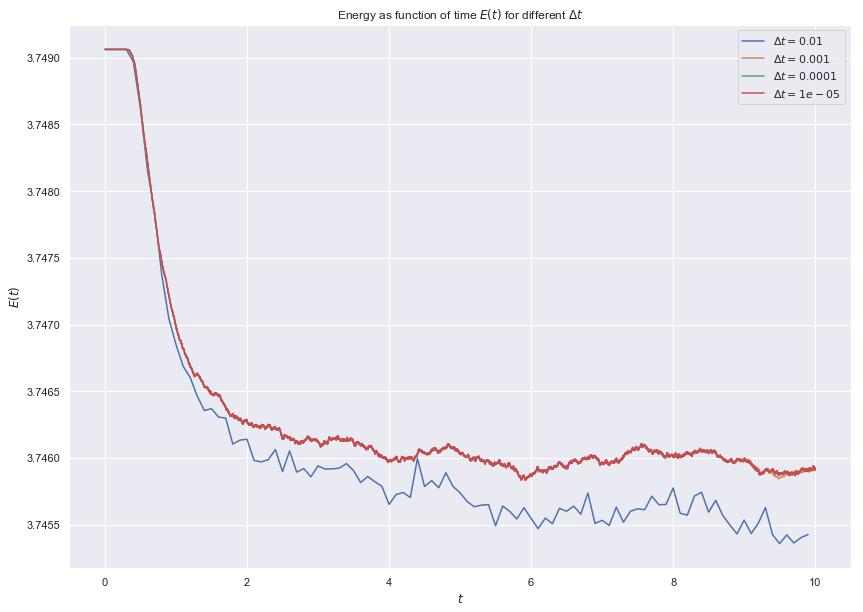

In [15]:
fig = plt.figure(figsize=(14, 10))

for i in range(2, 6):
    dt = 10 ** (-i)
    filename = os.path.join(f"thermo_{i}.log")
    log_df = pd.read_csv(filename, sep="\s+", skiprows=16, skipfooter=28, engine="python")

    plt.plot(log_df.Step * dt, log_df.TotEng, label=fr"$\Delta t = {dt}$")

plt.title(r"Energy as function of time $E(t)$ for different $\Delta t$")
plt.xlabel(r"$t$")
plt.ylabel(r"$E(t)$")
plt.legend(loc="best")
plt.show()

Here we see the expected behaviour where the energy initially drops as the system gets thermalized. We can then see for $\Delta t < 0.01$ that the energy fluctuates less than when $\Delta t = 0.01$.

## Temperature

From the equipartition principle we know that we can calulate the temperature of the system form
\begin{gather}
    \langle E_k \rangle = \frac{3}{2} N k_B T
    \implies
    T = \frac{2}{3 N k_B} \langle E_k \rangle,
\end{gather}
where the mean total kinetic energy $\langle E_k \rangle$ is calculated at every time step $i$. For a specific time step it is computed from
\begin{align}
    \langle E_k \rangle = \frac{1}{2} m \sum_{i = 1}^{N} v_i^2,
\end{align}
where $N$ is the number of particles in the system and we assume that $m_i = m$, i.e., that all the particles have the same mass. We set up a new simulation using Lammps similar to the one used for the uniform distribution, but now using a more "physical" initial start. We also store a log which we can use to fetch the temperature of the system from Lammps as a comparison.

In [16]:
%%writefile temperature.in
# 3d Lennard-Jones gas
units lj
dimension 3
# Periodic boundiaries
boundary p p p
atom_style atomic

lattice fcc 0.01
region simbox block 0 20 0 20 0 20
create_box 1 simbox
create_atoms 1 box

mass 1 1.0
velocity all create 2.5 87287

pair_style lj/cut 3.0
pair_coeff 1 1 1.0 1.0 3.0

fix 1 all nve

dump 1 all custom 10 temperature.lammpstrj id type x y z vx vy vz
log temperature_log.lammps
thermo 100
run 5000

Overwriting temperature.in


In [64]:
!mpirun -np 2 lmp -in temperature.in

LAMMPS (4 Jan 2019)
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (147.361 147.361 147.361)
  1 by 1 by 2 MPI processor grid
Created 32000 atoms
  Time spent = 0.002477 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 90 90 90
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.005
Per MPI rank memory allocation (min/avg/max) = 9.772 | 9.772 | 9.772 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0          2.5            0            0    3.7498828  0.024999219 
     100    2.5004051 -0.0010155581            0    3.7494749   0.02498311 


Reading in the dump to a `DataFrame`.

In [17]:
df, num_atoms, bounds = read_dump("temperature.lammpstrj")

Reading in the log to get the energy and temperature of the simulation.

In [18]:
filename = os.path.join(f"temperature_log.lammps")
log_df = pd.read_csv(filename, sep="\s+", skiprows=15, skipfooter=27, engine="python")

Checking that we have all the data as expected.

In [19]:
log_df.head()

,Step,Temp,E_pair,E_mol,TotEng,Press
0,0,2.500000,0.000000,0,3.749883,0.024999
1,100,2.500405,-0.001016,0,3.749475,0.024983
2,200,2.522001,-0.035163,0,3.747721,0.025451
3,300,2.528073,-0.044825,0,3.747167,0.025427
4,400,2.530245,-0.048276,0,3.746973,0.025351


In [20]:
log_df.tail()

,Step,Temp,E_pair,E_mol,TotEng,Press
46,4600,2.537438,-0.059306,0,3.746733,0.025276
47,4700,2.538350,-0.060678,0,3.746728,0.025270
48,4800,2.538018,-0.060206,0,3.746701,0.025258
49,4900,2.537572,-0.059557,0,3.746682,0.025334
50,5000,2.538403,-0.060770,0,3.746716,0.025207


In [21]:
df.head()

,id,type,x,y,z,vx,vy,vz,timestep
0,1,1,0.00000,0.00000,0.00000,1.013020,0.194801,0.138771,0
1,2,1,3.68403,3.68403,0.00000,-1.673840,0.826244,-1.131720,0
2,3,1,3.68403,0.00000,3.68403,-0.633593,-2.411290,1.367270,0
3,4,1,0.00000,3.68403,3.68403,0.220096,1.331590,-1.096720,0
4,5,1,7.36806,0.00000,0.00000,-0.146018,1.056760,0.050760,0


In [22]:
df.tail()

,id,type,x,y,z,vx,vy,vz,timestep
16031995,31996,1,111.2990,13.7543,143.40500,-2.537910,-1.203580,-2.216490,5000
16031996,31997,1,104.5280,102.2840,87.08030,1.136830,1.985340,-0.726526,5000
16031997,31998,1,135.4910,145.5000,130.36200,-0.009778,-0.851958,1.673030,5000
16031998,31999,1,54.9627,24.8221,2.11595,2.368370,0.166334,-3.136770,5000
16031999,32000,1,10.0472,120.0820,134.11500,2.305140,-0.679069,-1.494020,5000


As we run the simulation using `lj` units, this means that the mass of the particles are set to unity.

In [23]:
mass = 1.0

In [24]:
df["e_k"] = 0.5 * mass * (df["vx"] ** 2 + df["vy"] ** 2 + df["vz"] ** 2)

In [25]:
e_k_arr = np.zeros(num_timesteps)

for i in range(num_timesteps):
    t_i = slice(i * num_atoms, (i + 1) * num_atoms)
    e_k_arr[i] = np.sum(df.loc[t_i, "e_k"])

temperature_arr = 2 * e_k_arr / (3 * mass * num_atoms)

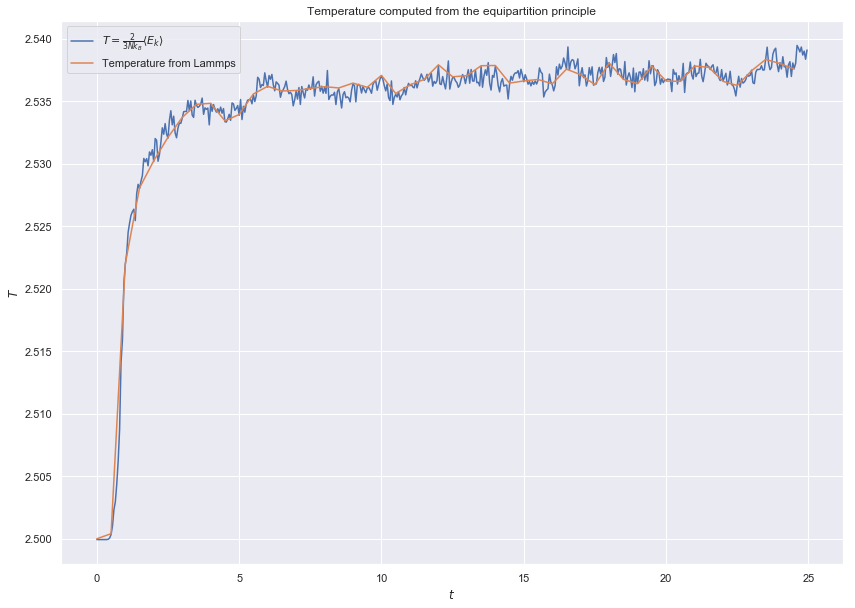

In [26]:
figure = plt.figure(figsize=(14, 10))

# Create an array of the time steps. Time step for the simulation is delta t = 0.05
time = np.arange(num_timesteps) * 0.05

plt.plot(
    time,
    temperature_arr,
    label=r"$T = \frac{2}{3 N k_B} \langle E_k \rangle$",
)
plt.plot(
    time[::10],
    log_df["Temp"][:-1],
    label=r"Temperature from Lammps"
)
plt.title(r"Temperature computed from the equipartition principle")
plt.xlabel(r"$t$")
plt.ylabel(r"$T$")
plt.legend(loc="best")
plt.show()

Here we see how the temperature initially ramp up in a short time before stabilizing at value slightly higher than the initial temperature. This is due to the system moving from the unphysical initial crystal state to the more physical one. This means that if we are to compute the temperature of the system, we should not include the temperature measurements before reaching a more stable system. From the plot above we see that this occurs approximately for $t > 8$.

In [27]:
stable_temp = temperature_arr[time > 8]

print(f"Stable temperature: {np.mean(stable_temp):.3f} +/- {np.std(stable_temp):.3f} K")
print(f"Initial temperature: {temperature_arr[0]:.3f} K")

Stable temperature: 2.537 +/- 0.001 K
Initial temperature: 2.500 K


We see that the temperature inreases as the system is allowed to thermalize. We now wish to explore how the fluctuations and the temperature behaves for varying system sizes. We will read the temperature from the log files instead of using the dumps as this saves a little time.

In [28]:
%%writefile temperature_system_size.in
# 3d Lennard-Jones gas
units lj
dimension 3
timestep 0.01
# Periodic boundiaries
boundary p p p
atom_style atomic

lattice fcc 0.01
region simbox block 0 ${simbox} 0 ${simbox} 0 ${simbox}
create_box 1 simbox
create_atoms 1 box

mass 1 1.0
velocity all create 2.5 87287

pair_style lj/cut 3.0
pair_coeff 1 1 1.0 1.0 3.0

fix 1 all nve

log ${filename}
thermo 10
run 5000

Overwriting temperature_system_size.in


In [29]:
%%writefile temperature_system_size.sh
export OMP_NUM_THREADS=4
num_mpi_threads=2

for box in $(seq 1 15); do
    mpirun -n $num_mpi_threads \
        lmp -var simbox $box \
        -var filename temperature_size_$box.log \
        < temperature_system_size.in
done

Overwriting temperature_system_size.sh


In [155]:
!bash temperature_system_size.sh

LAMMPS (4 Jan 2019)
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (7.36806 7.36806 7.36806)
  1 by 1 by 2 MPI processor grid
Created 4 atoms
  Time spent = 0.00115 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 5 5 5
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.01
Per MPI rank memory allocation (min/avg/max) = 3.058 | 3.058 | 3.058 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0          2.5            0            0       2.8125      0.01875 
      10          2.5            0            0       2.8125      0.01875 
      20  

    1380    2.5013496 -0.0038880833            0    2.8101302  0.018682665 
    1390    2.5018169 -0.0044140396            0      2.81013  0.018675739 
    1400    2.5017317 -0.0043181454            0    2.8101301  0.018677001 
    1410    2.5011394 -0.0036514664            0    2.8101303  0.018685785 
    1420    2.5003195 -0.0027288673            0    2.8101306  0.018697969 
    1430    2.4996987 -0.0033926253            0    2.8087684  0.018680005 
    1440    2.4995089 -0.001835193            0    2.8101123  0.018709681 
    1450     2.500513 -0.004336514            0    2.8087406  0.018667308 
    1460    2.5045584 -0.008882038            0    2.8087461  0.018607626 
    1470    2.5176569 -0.023604276            0    2.8087597  0.018420614 
    1480    2.5525404 -0.061486224            0    2.8101217  0.018000969 
    1490    2.5949983  -0.10932913            0     2.810044  0.017588099 
    1500    2.5846296 -0.097640653            0    2.8100677  0.017672449 
    1510    2.53874

LAMMPS (4 Jan 2019)
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (14.7361 14.7361 14.7361)
  1 by 1 by 2 MPI processor grid
Created 32 atoms
  Time spent = 0.001444 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 9 9 9
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.01
Per MPI rank memory allocation (min/avg/max) = 3.063 | 3.063 | 3.063 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0          2.5            0            0    3.6328125   0.02421875 
      10          2.5            0            0    3.6328125   0.02421875 
      20

    3260     2.531013 -0.049172789            0    3.6287055  0.025126986 
    3270    2.5565976  -0.08658349            0    3.6284725   0.02420251 
    3280    2.5521415 -0.081404713            0    3.6271759  0.024542279 
    3290    2.5536849 -0.082635498            0    3.6281879  0.024181304 
    3300    2.5480781 -0.074327247            0    3.6283488  0.025236173 
    3310    2.5365087 -0.057567961            0    3.6282962  0.024185112 
    3320    2.5214681 -0.035860868            0    3.6281474  0.023816023 
    3330    2.5116563 -0.021776588            0     3.627974    0.0239113 
    3340    2.5094283 -0.018872441            0    3.6276405   0.02393963 
    3350    2.5129874 -0.023698804            0    3.6279859  0.023890415 
    3360    2.5208968 -0.035197919            0    3.6279803  0.023788241 
    3370    2.5288147 -0.046544507            0    3.6281394  0.023681037 
    3380    2.5350437 -0.055766461            0    3.6279689   0.02355555 
    3390    2.5437343 -0.

LAMMPS (4 Jan 2019)
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (22.1042 22.1042 22.1042)
  1 by 1 by 2 MPI processor grid
Created 108 atoms
  Time spent = 0.000482 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 14 14 14
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.01
Per MPI rank memory allocation (min/avg/max) = 3.074 | 3.074 | 3.074 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0          2.5            0            0    3.7152778  0.024768519 
      10          2.5            0            0    3.7152778  0.024768519 
    

    2930    2.5340848  -0.05462071            0    3.7113109  0.024449153 
    2940    2.5286413 -0.047308568            0    3.7105334  0.025144403 
    2950    2.5328416 -0.052894106            0    3.7111899  0.024704291 
    2960    2.5195743 -0.033003777            0    3.7113636  0.025037306 
    2970    2.5145573  -0.02561702            0    3.7112945  0.024571584 
    2980    2.5111575 -0.020569415            0    3.7112897  0.024499113 
    2990    2.5136578 -0.024174056            0    3.7114008  0.024446231 
    3000    2.5119485 -0.022664337            0    3.7103703  0.025485804 
    3010    2.5263847 -0.043207532            0    3.7112808  0.024323961 
    3020    2.5280715 -0.045676698            0    3.7113184  0.024350492 
    3030      2.52498 -0.041246207            0    3.7111546  0.025355166 
    3040    2.5222405 -0.037342377            0    3.7109873  0.025702126 
    3050    2.5307899 -0.050134984            0       3.7109  0.024599784 
    3060    2.5282443 -0.

LAMMPS (4 Jan 2019)
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (29.4723 29.4723 29.4723)
  1 by 1 by 2 MPI processor grid
Created 256 atoms
  Time spent = 0.001153 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 18 18 18
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.01
Per MPI rank memory allocation (min/avg/max) = 3.087 | 3.087 | 3.087 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0          2.5            0            0    3.7353516  0.024902344 
      10          2.5            0            0    3.7353516  0.024902344 
    

    1680    2.5403492 -0.064382134            0    3.7312568   0.02508651 
    1690     2.541536 -0.066235336            0    3.7311769  0.025036062 
    1700    2.5418827 -0.066631044            0    3.7312992  0.024766965 
    1710    2.5346335 -0.055827932            0     3.731271  0.025460334 
    1720    2.5434383 -0.068998887            0    3.7312557  0.024666912 
    1730    2.5283715 -0.046675618            0     3.731067  0.026106371 
    1740    2.5443892 -0.070627554            0    3.7310478  0.025045725 
    1750    2.5412519 -0.065708498            0    3.7312792  0.025082316 
    1760    2.5005395 -0.0047386812            0     3.731419  0.027836593 
    1770    2.5323723 -0.052226396            0     3.731494  0.025130743 
    1780    2.5368372 -0.059194046            0    3.7311975  0.024674809 
    1790    2.5378159 -0.060539229            0    3.7313146  0.024646594 
    1800    2.5439459 -0.069589431            0    3.7314235  0.024587835 
    1810    2.5340917 -0

    3070    2.5411749 -0.066005625            0     3.730867  0.025231228 
    3080    2.5490431 -0.078061782            0     3.730567  0.025083822 
    3090    2.5372996 -0.060197432            0     3.730885  0.025832459 
    3100    2.5444373 -0.070822014            0    3.7309251  0.024445273 
    3110    2.5275858 -0.045442427            0    3.7311261  0.025510931 
    3120    2.5390794 -0.062569598            0    3.7311721  0.024371347 
    3130    2.5313622 -0.051025048            0    3.7311861  0.025843678 
    3140    2.5490079 -0.077938118            0    3.7306381  0.025585813 
    3150    2.5492645 -0.078582764            0    3.7303768   0.02557137 
    3160    2.5399294 -0.064278859            0    3.7307329  0.025211769 
    3170    2.5359098 -0.058368514            0    3.7306374  0.024704362 
    3180    2.5353508 -0.057373299            0    3.7307973  0.024607656 
    3190    2.5215909 -0.037346735            0    3.7302647   0.02566787 
    3200    2.5303873 -0.

    4850    2.5474918 -0.076957802            0    3.7293532  0.024821517 
    4860    2.5485588 -0.078627673            0    3.7292776  0.024677467 
    4870     2.533558 -0.055781797            0    3.7297101  0.026343139 
    4880    2.5570262 -0.090973247            0    3.7295835  0.025106085 
    4890     2.559235  -0.09452971            0    3.7293272  0.025169145 
    4900    2.5493027 -0.079951169            0    3.7290656  0.025397723 
    4910    2.5469862 -0.076270654            0    3.7292849  0.024673641 
    4920    2.5356879 -0.060038197            0    3.7286361   0.02568669 
    4930    2.5473943 -0.076826559            0    3.7293388  0.024580441 
    4940    2.5372708 -0.061518054            0    3.7295214  0.025307942 
    4950    2.5417862 -0.068256511            0    3.7295295  0.024508304 
    4960    2.5428327 -0.069835304            0    3.7295143  0.024957611 
    4970    2.5343441 -0.057373104            0    3.7292933  0.025842041 
    4980    2.5450998 -0.

    1440    2.5346939 -0.055668597            0    3.7387682  0.025022948 
    1450    2.5310379 -0.050231518            0    3.7387323  0.025118735 
    1460    2.5274688 -0.044647947            0    3.7389728  0.025124586 
    1470    2.5276298 -0.045066911            0     3.738795  0.025676996 
    1480    2.5310431 -0.050416466            0     3.738555  0.025972065 
    1490    2.5396311 -0.062900711            0    3.7389271  0.025275335 
    1500    2.5324988 -0.052268076            0    3.7388827  0.025756827 
    1510    2.5348797 -0.055826686            0    3.7388882  0.025124701 
    1520    2.5344799 -0.055831393            0     3.738285  0.025064282 
    1530    2.5319297 -0.051515255            0    3.7387834  0.025458976 
    1540    2.5345965 -0.055644008            0     3.738647   0.02551413 
    1550     2.539853 -0.063675083            0    3.7384848  0.025419855 
    1560    2.5328442 -0.052981913            0    3.7386859  0.025578077 
    1570    2.5371515 -0.

    2620    2.5304531  -0.05008707            0    3.7380013  0.025576948 
    2630    2.5368151 -0.059518744            0    3.7380935  0.025180077 
    2640    2.5315656 -0.051717394            0    3.7380364  0.025988418 
    2650    2.5372233 -0.060009107            0    3.7382141  0.025376616 
    2660    2.5390424 -0.062990733            0    3.7379557  0.024996475 
    2670    2.5346042 -0.056276932            0    3.7380256  0.024957104 
    2680    2.5316338 -0.051906035            0    3.7379498  0.025139996 
    2690    2.5314706 -0.051629876            0    3.7379816  0.025142597 
    2700     2.533397 -0.054314699            0    3.7381806   0.02497366 
    2710    2.5334226 -0.054415451            0    3.7381182  0.025135985 
    2720    2.5342551 -0.055619281            0    3.7381607  0.025121552 
    2730    2.5346425 -0.056181591            0    3.7381782  0.024890203 
    2740    2.5369216 -0.059696766            0    3.7380748   0.02472924 
    2750    2.5344236 -0.

    3820    2.5391756 -0.063183768            0    3.7379622  0.025513117 
    3830    2.5468844 -0.075006674            0    3.7376793  0.024994104 
    3840    2.5487743 -0.077936525            0    3.7375786  0.024973777 
    3850    2.5526348 -0.083721616            0    3.7375727  0.025220977 
    3860    2.5439215 -0.070660497            0      3.73759  0.026248969 
    3870    2.5499435 -0.079810367            0    3.7374551  0.025184971 
    3880    2.5432152 -0.070075264            0    3.7371179   0.02481521 
    3890    2.5355945 -0.058543996            0    3.7372409  0.024884523 
    3900    2.5365822 -0.059891439            0    3.7373721   0.02487043 
    3910    2.5369065 -0.060317989            0     3.737431  0.025012832 
    3920    2.5425884 -0.068740231            0    3.7375146  0.024490185 
    3930    2.5369582 -0.060416397            0      3.73741  0.025396261 
    3940    2.5426559 -0.068901327            0    3.7374545  0.025170271 
    3950    2.5373961 -0.

LAMMPS (4 Jan 2019)
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (44.2084 44.2084 44.2084)
  1 by 1 by 2 MPI processor grid
Created 864 atoms
  Time spent = 0.002171 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 27 27 27
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.01
Per MPI rank memory allocation (min/avg/max) = 3.134 | 3.134 | 3.134 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0          2.5            0            0    3.7456597  0.024971065 
      10          2.5            0            0    3.7456597  0.024971065 
    

    1180    2.5357224  -0.05716873            0    3.7420125  0.024939944 
    1190    2.5331942 -0.053217545            0    3.7421759  0.025366953 
    1200    2.5342761 -0.054962733            0    3.7420517  0.025735768 
    1210    2.5402389 -0.063997073            0    3.7419511  0.025397653 
    1220    2.5425662  -0.06743105            0    3.7420041  0.024949548 
    1230    2.5469927 -0.074180579            0    3.7418865  0.024684047 
    1240    2.5463549 -0.073373955            0    3.7417376  0.025141636 
    1250    2.5387252 -0.062450229            0      3.74123  0.025897325 
    1260    2.5437037 -0.069439219            0    3.7417002  0.025125749 
    1270    2.5386879 -0.062048434            0     3.741576  0.025275172 
    1280    2.5341689 -0.055340662            0    3.7415131  0.025571287 
    1290    2.5402201  -0.06432765            0    3.7415923  0.024901791 
    1300    2.5375903 -0.060407695            0    3.7415722   0.02533291 
    1310    2.5425815 -0.

    2420    2.5436712 -0.070186888            0    3.7409039  0.025069998 
    2430     2.542765 -0.068724201            0    3.7410088  0.025069288 
    2440    2.5435768 -0.070024339            0     3.740925  0.024820532 
    2450    2.5405795 -0.065562151            0    3.7408964  0.024910054 
    2460    2.5347991 -0.056733059            0    3.7410649  0.025435794 
    2470    2.5409298 -0.066063178            0    3.7409202  0.025084489 
    2480    2.5333708 -0.054439959            0     3.741218  0.025970483 
    2490    2.5343159 -0.056004994            0     3.741069  0.025721441 
    2500    2.5406836 -0.065709275            0    3.7409052  0.024909114 
    2510    2.5374315 -0.060744227            0    3.7409978  0.025446983 
    2520    2.5442036  -0.07094349            0    3.7409449  0.025186393 
    2530    2.5434519 -0.069908356            0    3.7408538  0.025261424 
    2540    2.5412451 -0.066476644            0    3.7409791  0.025926441 
    2550    2.5461121 -0.

    3810    2.5320355 -0.053401753            0    3.7402556  0.025646546 
    3820    2.5292644 -0.048793735            0    3.7407117  0.025827885 
    3830    2.5333939  -0.05525294            0    3.7404397  0.025443654 
    3840    2.5347085 -0.057250763            0    3.7404114  0.024967384 
    3850    2.5315477 -0.052345064            0    3.7405815   0.02488577 
    3860    2.5280947 -0.047268288            0    3.7404847  0.025117759 
    3870     2.523319 -0.039938931            0    3.7406588   0.02540145 
    3880     2.524067 -0.041037396            0    3.7406811  0.025389636 
    3890    2.5307536 -0.051133198            0    3.7406035  0.025003184 
    3900    2.5284567 -0.047734856            0    3.7405604  0.025137455 
    3910    2.5295413  -0.04921431            0    3.7407061  0.025040227 
    3920    2.5302797 -0.050165782            0    3.7408609  0.025375694 
    3930    2.5333339 -0.055296698            0     3.740306  0.025718133 
    3940    2.5345696  -0

LAMMPS (4 Jan 2019)
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (51.5764 51.5764 51.5764)
  1 by 1 by 2 MPI processor grid
Created 1372 atoms
  Time spent = 0.001287 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 32 32 32
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.01
Per MPI rank memory allocation (min/avg/max) = 3.177 | 3.177 | 3.177 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0          2.5            0            0    3.7472668  0.024981778 
      10          2.5            0            0    3.7472668  0.024981778 
   

    1150     2.537418 -0.060073897            0    3.7432789  0.025182387 
    1160    2.5392854 -0.062663911            0     3.743488   0.02502068 
    1170    2.5391712 -0.062453175            0    3.7435275  0.025242436 
    1180     2.539454 -0.062822622            0    3.7435821  0.025423397 
    1190     2.535798 -0.057289274            0    3.7436353   0.02557932 
    1200    2.5433696 -0.068654437            0    3.7436194  0.024773245 
    1210    2.5392379 -0.062461414            0    3.7436193  0.025102693 
    1220    2.5395417  -0.06287307            0     3.743663  0.024919714 
    1230    2.5355493  -0.05693397            0    3.7436179   0.02516274 
    1240    2.5371357 -0.059238546            0    3.7436912  0.024905875 
    1250    2.5344855 -0.055225206            0     3.743732  0.025360295 
    1260    2.5340433 -0.054768142            0    3.7435264  0.025642621 
    1270    2.5377843 -0.060262961            0     3.743639  0.025170579 
    1280    2.5381086 -0.

    2260    2.5418177 -0.067168567            0     3.742779  0.025786932 
    2270    2.5418987 -0.067109163            0    3.7429599  0.025708414 
    2280    2.5427938 -0.068300757            0    3.7431099  0.025470415 
    2290    2.5407189 -0.065179347            0    3.7431213  0.025560439 
    2300    2.5415964  -0.06671885            0    3.7428971  0.025263208 
    2310    2.5391456 -0.062922031            0    3.7430204  0.025173744 
    2320    2.5374036 -0.060369224            0    3.7429621  0.025281667 
    2330    2.5337569 -0.054986119            0     3.742879  0.025577832 
    2340    2.5405127 -0.065027299            0    3.7429642  0.025062954 
    2350    2.5399095 -0.064149776            0    3.7429376  0.025270792 
    2360    2.5401536 -0.064605336            0     3.742848  0.025154492 
    2370     2.539263 -0.063264881            0    3.7428535  0.025154594 
    2380    2.5406672 -0.065439091            0    3.7427841  0.025081488 
    2390    2.5390757 -0.

    3480    2.5376374 -0.060994618            0    3.7426871  0.025344507 
    3490    2.5384138 -0.062218583            0    3.7426269  0.025298343 
    3500    2.5337525 -0.055488507            0    3.7423702  0.025542026 
    3510     2.542086 -0.067821866            0    3.7425279  0.024742998 
    3520    2.5368928 -0.060086656            0     3.742479  0.025429677 
    3530    2.5401877 -0.065140546            0    3.7423638  0.024973103 
    3540    2.5321673  -0.05285779            0    3.7426247  0.025366769 
    3550    2.5378281  -0.06157709            0    3.7423905  0.024921413 
    3560    2.5390149 -0.063277377            0    3.7424691  0.025109895 
    3570    2.5349155 -0.057279899            0    3.7423219   0.02581244 
    3580    2.5408167 -0.066220767            0    3.7422264  0.025053955 
    3590    2.5355728 -0.057960436            0    3.7426266  0.025356571 
    3600    2.5380673 -0.061791046            0     3.742535  0.025194555 
    3610    2.5348738 -0.

    4860    2.5421266 -0.068567463            0    3.7418431  0.025210863 
    4870    2.5395414 -0.064607624            0     3.741928  0.025132207 
    4880    2.5354313 -0.058228594            0    3.7421463  0.025230558 
    4890    2.5348878 -0.057660487            0    3.7418999  0.025192112 
    4900     2.536887 -0.060736451            0    3.7418206  0.025070454 
    4910    2.5351667 -0.058093211            0    3.7418852  0.025249898 
    4920    2.5356797 -0.058894207            0    3.7418531  0.025162667 
    4930     2.529721 -0.050076163            0    3.7417397   0.02558836 
    4940    2.5318218 -0.053159381            0    3.7418053  0.025247104 
    4950    2.5336919 -0.055890067            0    3.7418777  0.025193098 
    4960    2.5343465 -0.056869542            0    3.7418795  0.025236352 
    4970    2.5373967 -0.061392017            0    3.7419289  0.024948022 
    4980    2.5258042 -0.043998732            0    3.7419461  0.025963814 
    4990    2.5337801 -0.

    1000    2.5309623 -0.049761066            0    3.7448287  0.025574797 
    1010    2.5332467 -0.053504095            0    3.7445106  0.025386082 
    1020    2.5346933 -0.055657218            0    3.7445262   0.02516772 
    1030    2.5358375 -0.057355819            0    3.7445431  0.024980979 
    1040    2.5351174 -0.056186377            0     3.744633  0.025208118 
    1050    2.5296078 -0.048068038            0     3.744491  0.025877559 
    1060    2.5350838 -0.056270084            0    3.7444989   0.02536407 
    1070    2.5341167 -0.054647561            0    3.7446714  0.025259083 
    1080    2.5377155  -0.06009917            0    3.7446154  0.025028399 
    1090    2.5360686  -0.05769151            0     3.744554  0.025429836 
    1100    2.5379737 -0.060434195            0    3.7446675  0.025197326 
    1110    2.5406392 -0.064446714            0    3.7446513  0.025099877 
    1120     2.538439 -0.061287207            0     3.744512  0.025500449 
    1130    2.5375024 -0.

    2140    2.5373426 -0.059938009            0    3.7442174  0.025034064 
    2150    2.5351964 -0.056686281            0    3.7442515  0.025180946 
    2160    2.5356595 -0.057440233            0    3.7441918  0.025287376 
    2170    2.5316354 -0.051432599            0    3.7441664  0.025652883 
    2180    2.5390868 -0.062732116            0    3.7440384  0.024882645 
    2190    2.5351801  -0.05685166            0    3.7440616  0.025331227 
    2200    2.5325359  -0.05285818            0    3.7440908  0.025643229 
    2210    2.5366865 -0.059161536            0    3.7440103  0.025477612 
    2220    2.5350481 -0.056881204            0    3.7438342  0.025599343 
    2230    2.5353936 -0.057295488            0     3.743938  0.025177558 
    2240    2.5321659 -0.052271853            0    3.7441224   0.02526839 
    2250     2.533944 -0.055110861            0    3.7439493  0.025110674 
    2260    2.5350349 -0.056894044            0    3.7438016  0.025069552 
    2270    2.5361911 -0.

    3620    2.5367294 -0.059825928            0    3.7434103  0.025332844 
    3630    2.5368662  -0.06023938            0    3.7432019  0.025415604 
    3640    2.5379647 -0.061931755            0    3.7431564  0.025305211 
    3650    2.5394374 -0.064176095            0    3.7431201  0.025253453 
    3660    2.5384397 -0.062528427            0    3.7432719  0.025477698 
    3670    2.5407828 -0.066057471            0    3.7432557   0.02517048 
    3680    2.5370211 -0.060530978            0    3.7431425  0.025265923 
    3690    2.5362996 -0.059451576            0    3.7431402  0.025156868 
    3700    2.5355972 -0.058387573            0    3.7431511  0.025314857 
    3710    2.5391984 -0.063743405            0    3.7431944  0.025121919 
    3720    2.5363934 -0.059646929            0    3.7430854  0.025327142 
    3730     2.534551 -0.056746936            0    3.7432231  0.025234726 
    3740    2.5381896 -0.062144741            0    3.7432807  0.024767014 
    3750    2.5347703 -0.

    4830     2.533539 -0.055890174            0    3.7425628  0.025365229 
    4840    2.5344903 -0.057211205            0    3.7426679  0.025546506 
    4850    2.5388146 -0.063788226            0    3.7425742  0.025121639 
    4860    2.5387757 -0.063639085            0     3.742665  0.025181685 
    4870    2.5353053 -0.058732959            0    3.7423681  0.025663743 
    4880    2.5368447 -0.060912236            0    3.7424968  0.025491315 
    4890    2.5349991   -0.0578983            0    3.7427437  0.025645039 
    4900    2.5396837 -0.065134279            0    3.7425311  0.025189777 
    4910    2.5354561 -0.058666758            0    3.7426603  0.025397569 
    4920    2.5350478 -0.057987922            0    3.7427271  0.025369522 
    4930    2.5292648 -0.049346299            0    3.7426984  0.025777727 
    4940    2.5341325 -0.056706301            0    3.7426364  0.025193736 
    4950    2.5306862  -0.05161556            0    3.7425602  0.025258346 
    4960    2.5313158 -0.

     970    2.5352225 -0.056323185            0    3.7452065  0.025476449 
     980     2.538661 -0.061469417            0    3.7452161  0.025087435 
     990    2.5372543 -0.059499489            0    3.7450768  0.025284663 
    1000    2.5377464 -0.060184579            0    3.7451296  0.025478638 
    1010    2.5401217 -0.063858536            0    3.7450174  0.025430366 
    1020    2.5397337 -0.063365165            0    3.7449289  0.025392401 
    1030    2.5382653 -0.060967544            0    3.7451247  0.025330029 
    1040    2.5318943 -0.051460459            0    3.7450785  0.025736158 
    1050    2.5371835  -0.05936149            0    3.7451086  0.025096495 
    1060    2.5340858 -0.054804255            0    3.7450208  0.025294334 
    1070    2.5378171 -0.060388335            0    3.7450318  0.024871645 
    1080    2.5358453 -0.057434923            0    3.7450285  0.025169151 
    1090    2.5376916 -0.060176535            0    3.7450554  0.025218646 
    1100    2.5360427 -0.

    2220     2.536683 -0.059059219            0    3.7446603  0.025091221 
    2230    2.5325548 -0.052927342            0    3.7446022  0.025485709 
    2240    2.5360561 -0.058230584            0     3.744549  0.025254219 
    2250    2.5312099 -0.051119527            0    3.7443933  0.025607601 
    2260    2.5356137 -0.057632017            0    3.7444842  0.025186793 
    2270    2.5328768 -0.053465218            0    3.7445471  0.025422042 
    2280    2.5341666 -0.055650629            0    3.7442957  0.025359104 
    2290    2.5361972 -0.058551424            0    3.7444397  0.025041741 
    2300    2.5363204 -0.058778086            0    3.7443978  0.025024976 
    2310    2.5318124 -0.051984012            0    3.7444322  0.025638582 
    2320    2.5377368  -0.06085916            0    3.7444405  0.025271912 
    2330    2.5352231 -0.057142629            0    3.7443879  0.025467208 
    2340    2.5388115 -0.062354633            0    3.7445566  0.025106542 
    2350     2.539572 -0.

    3490    2.5329689 -0.054166884            0    3.7439834  0.025374224 
    3500    2.5365083 -0.059622041            0    3.7438357  0.024996951 
    3510    2.5351916 -0.057529334            0     3.743954  0.025182631 
    3520    2.5332303 -0.054690017            0    3.7438523  0.025407337 
    3530    2.5330254 -0.054272083            0     3.743963    0.0254014 
    3540     2.535369 -0.057815516            0    3.7439338  0.025133366 
    3550    2.5344098 -0.056329221            0    3.7439818  0.025221706 
    3560     2.535289 -0.057759533            0    3.7438698  0.025268266 
    3570    2.5387704  -0.06293334            0    3.7439162   0.02512376 
    3580    2.5373698   -0.0607971            0    3.7439524  0.025361247 
    3590    2.5355881 -0.058194634            0    3.7438832  0.025643027 
    3600    2.5391256  -0.06360387            0    3.7437783  0.025331915 
    3610    2.5406329 -0.065912934            0    3.7437295    0.0249514 
    3620    2.5361565 -0.

    4760    2.5397531 -0.064924776            0    3.7433984   0.02509877 
    4770    2.5401126 -0.065548486            0    3.7433138  0.025168059 
    4780    2.5357431  -0.05908132            0    3.7432289  0.025640838 
    4790    2.5397891 -0.065105817            0    3.7432714  0.025211247 
    4800    2.5351765 -0.058326157            0    3.7431345  0.025493519 
    4810    2.5383774 -0.063003215            0    3.7432571  0.025193509 
    4820    2.5352316 -0.058213831            0    3.7433295    0.0253288 
    4830    2.5378047 -0.062019759            0    3.7433818  0.025067561 
    4840    2.5356972 -0.058900644            0    3.7433407  0.025338301 
    4850    2.5384838 -0.063156634            0    3.7432633   0.02510216 
    4860    2.5363373 -0.059750366            0    3.7434509  0.025383491 
    4870    2.5369308 -0.060819099            0    3.7432721  0.025258933 
    4880    2.5391553 -0.064103151            0    3.7433237  0.025020625 
    4890    2.5377904 -0.

     650    2.5359762 -0.057412877            0    3.7456004  0.025180868 
     660    2.5343459 -0.054929356            0    3.7456391  0.025223713 
     670    2.5347733 -0.055630685            0    3.7455788  0.025270296 
     680    2.5336577 -0.053798806            0    3.7457377  0.025411475 
     690    2.5348402 -0.055800644            0    3.7455091  0.025295943 
     700    2.5395267 -0.062804791            0     3.745533  0.025035927 
     710    2.5310657 -0.050154655            0    3.7454947  0.025920664 
     720    2.5369678 -0.058868781            0    3.7456316   0.02528116 
     730    2.5354825 -0.056753968            0     3.745519  0.025405228 
     740    2.5326741 -0.052460426            0     3.745601   0.02555183 
     750    2.5328179 -0.052657633            0    3.7456194  0.025226077 
     760    2.5289299 -0.046834201            0    3.7456123  0.025332233 
     770    2.5309423 -0.049750367            0     3.745714  0.025193971 
     780    2.5286969 -0.

    1820    2.5367513 -0.059188586            0    3.7449871  0.025342385 
    1830     2.537633 -0.060604362            0    3.7448935  0.025319556 
    1840    2.5388034 -0.062247668            0    3.7450053  0.025302235 
    1850    2.5390861 -0.062756313            0    3.7449207   0.02527261 
    1860    2.5395707 -0.063579596            0     3.744824  0.025176628 
    1870    2.5410896 -0.065797207            0    3.7448842  0.025042232 
    1880    2.5396259 -0.063567357            0    3.7449192  0.025313378 
    1890     2.539485 -0.063420963            0    3.7448542   0.02540843 
    1900    2.5412818 -0.066059126            0    3.7449106  0.025176103 
    1910    2.5400787 -0.064329892            0    3.7448356  0.025226435 
    1920     2.541783  -0.06691593            0    3.7448054  0.025080197 
    1930    2.5411263 -0.065853968            0    3.7448825  0.025240523 
    1940    2.5370841 -0.059791647            0    3.7448831  0.025585027 
    1950    2.5400012 -0.

    3010    2.5358856 -0.058578557            0    3.7442988  0.025124433 
    3020    2.5356017  -0.05822078            0    3.7442309  0.025239154 
    3030    2.5382023   -0.0620217            0    3.7443299  0.025140996 
    3040    2.5361644 -0.059079154            0    3.7442164  0.025532741 
    3050    2.5379261 -0.061574757            0    3.7443626  0.025339267 
    3060    2.5367289 -0.059948267            0    3.7441938  0.025483942 
    3070    2.5358672 -0.058730711            0    3.7441192  0.025527715 
    3080    2.5343507 -0.055835506            0    3.7447401  0.025402319 
    3090    2.5330753 -0.054235486            0    3.7444276  0.025524137 
    3100    2.5342815 -0.056093229            0    3.7443786  0.025461229 
    3110    2.5348399 -0.057075001            0    3.7442342  0.025281436 
    3120       2.5357 -0.058294482            0    3.7443046  0.025102765 
    3130    2.5339589 -0.055645583            0    3.7443425  0.025173313 
    3140    2.5328907 -0.

    4190    2.5365314 -0.060045116            0    3.7438007  0.025365708 
    4200    2.5361305 -0.059476096            0    3.7437686  0.025327196 
    4210    2.5364016  -0.05982296            0    3.7438284  0.025194713 
    4220    2.5366574 -0.060286309            0    3.7437486   0.02503291 
    4230    2.5367041 -0.060300931            0    3.7438039  0.025115577 
    4240    2.5333045 -0.055062457            0    3.7439443   0.02553399 
    4250    2.5355895 -0.058599487            0    3.7438339  0.025289417 
    4260    2.5373045 -0.061180333            0    3.7438249  0.025093234 
    4270    2.5350684 -0.057854287            0    3.7437977  0.025257838 
    4280    2.5393688 -0.064359556            0    3.7437414  0.025048346 
    4290    2.5344407 -0.057203825            0    3.7435068  0.025626391 
    4300    2.5385516 -0.063326304            0    3.7435491  0.025253298 
    4310    2.5385043 -0.063243833            0    3.7435607  0.025195945 
    4320    2.5389048 -0.

     270    2.5337009  -0.05374452            0     3.746093   0.02532279 
     280    2.5359186 -0.057061541            0    3.7461018    0.0251441 
     290    2.5323645 -0.051745632            0    3.7460876  0.025484954 
     300    2.5339224 -0.054115884            0    3.7460538   0.02536893 
     310    2.5328316 -0.052536224            0    3.7459976  0.025384935 
     320    2.5334498  -0.05336879            0    3.7460921  0.025224991 
     330    2.5312912  -0.05010908            0    3.7461146   0.02541605 
     340    2.5320084 -0.051196186            0     3.746103  0.025316524 
     350    2.5321148 -0.051305432            0    3.7461534  0.025312586 
     360    2.5347873 -0.055396938            0    3.7460698  0.025167445 
     370    2.5338491 -0.053988446            0    3.7460713  0.025330243 
     380    2.5347812 -0.055368978            0    3.7460886  0.025307132 
     390     2.532767 -0.052305103            0    3.7461318  0.025451706 
     400    2.5347017 -0.

    1400    2.5379761 -0.060831091            0     3.745418  0.025307504 
    1410    2.5390709 -0.062418749            0    3.7454723  0.025019268 
    1420    2.5347866 -0.056013434            0    3.7454523  0.025357586 
    1430    2.5368044 -0.059123306            0    3.7453686  0.025283855 
    1440    2.5351737 -0.056765287            0     3.745281  0.025467688 
    1450    2.5365268 -0.058702059            0    3.7453735  0.025395098 
    1460    2.5384886  -0.06162397            0    3.7453937  0.025227538 
    1470    2.5390497  -0.06245179            0    3.7454073   0.02517062 
    1480    2.5398683 -0.063673012            0    3.7454138  0.025205594 
    1490    2.5362667 -0.058281767            0    3.7454037  0.025526479 
    1500    2.5379162 -0.060803256            0     3.745356  0.025294813 
    1510    2.5394906 -0.063152635            0    3.7453677  0.025106657 
    1520    2.5363359 -0.058418234            0    3.7453709  0.025352834 
    1530    2.5356757 -0.

    2500    2.5373134 -0.060479871            0    3.7447753  0.025301619 
    2510    2.5380635 -0.061523272            0    3.7448569  0.025174185 
    2520     2.536568 -0.059416668            0    3.7447207  0.025361962 
    2530    2.5362212 -0.058668568            0    3.7449487  0.025384766 
    2540    2.5395664 -0.063873829            0    3.7447602  0.025196184 
    2550    2.5373858  -0.06055064            0    3.7448131  0.025399613 
    2560    2.5373963 -0.060599121            0    3.7447805  0.025296183 
    2570    2.5364564 -0.059103825            0    3.7448662  0.025278048 
    2580    2.5380287 -0.061450565            0    3.7448775  0.025189553 
    2590    2.5369275  -0.05985514            0    3.7448213  0.025319813 
    2600    2.5358829 -0.058303156            0    3.7448067  0.025433026 
    2610    2.5381455  -0.06164046            0    3.7448627  0.025164245 
    2620    2.5368088 -0.059609356            0    3.7448891  0.025277154 
    2630    2.5363305 -0.

    3700    2.5367517 -0.060223575            0    3.7441893  0.025230903 
    3710    2.5380485  -0.06210573            0    3.7442519  0.025114908 
    3720    2.5359038 -0.058882375            0    3.7442588  0.025382285 
    3730    2.5392758  -0.06393189            0    3.7442664  0.025108731 
    3740    2.5361652 -0.059184488            0    3.7443488  0.025429018 
    3750    2.5375384 -0.061288484            0    3.7443042  0.025386077 
    3760    2.5395991 -0.064509287            0    3.7441739  0.025220484 
    3770    2.5358353  -0.05885967            0    3.7441789  0.025437417 
    3780    2.5357975 -0.058727984            0    3.7442538  0.025322642 
    3790    2.5341007 -0.056236623            0    3.7442005  0.025458438 
    3800    2.5339854 -0.056027256            0    3.7442368  0.025329645 
    3810    2.5342662  -0.05633185            0    3.7443535  0.025211597 
    3820     2.531353 -0.052113845            0    3.7442025  0.025379279 
    3830    2.5300254 -0.

    4800    2.5356011 -0.059122783            0    3.7435645  0.025467358 
    4810    2.5356463 -0.059184127            0     3.743571  0.025342566 
    4820     2.535116 -0.058430762            0     3.743529  0.025325864 
    4830     2.536805 -0.061033648            0    3.7434591  0.025230778 
    4840    2.5378047 -0.062513627            0    3.7434784  0.025137382 
    4850    2.5361462 -0.060007192            0    3.7434975  0.025424623 
    4860    2.5402719 -0.066305291            0    3.7433868  0.025292391 
    4870    2.5383452  -0.06340892            0    3.7433937  0.025499806 
    4880    2.5386105 -0.063707537            0    3.7434931  0.025236187 
    4890    2.5363872 -0.060425389            0    3.7434408  0.025258447 
    4900     2.537615 -0.062200009            0    3.7435075  0.025068801 
    4910    2.5341632 -0.057154269            0    3.7433765  0.025399571 
    4920    2.5344533 -0.057527633            0    3.7434383  0.025403375 
    4930    2.5346883 -0.

     700    2.5365062 -0.058148752            0      3.74606  0.025392042 
     710     2.533943 -0.054274486            0    3.7460901   0.02552493 
     720    2.5377171 -0.059928451            0    3.7460965  0.025062725 
     730    2.5361524 -0.057662069            0    3.7460162  0.025258754 
     740    2.5354409 -0.056582499            0    3.7460287  0.025294074 
     750    2.5352247 -0.056298686            0    3.7459883  0.025316011 
     760    2.5369527 -0.058939675            0    3.7459389  0.025095744 
     770    2.5347438 -0.055559962            0    3.7460057  0.025190515 
     780    2.5372783 -0.059391911            0    3.7459749  0.025071591 
     790    2.5353027 -0.056449485            0    3.7459543  0.025398567 
     800    2.5387179 -0.061599413            0    3.7459265  0.025108039 
     810    2.5349202 -0.055801965            0    3.7460283  0.025369907 
     820    2.5339883 -0.054544261            0    3.7458883  0.025427296 
     830    2.5369219 -0.

    1820    2.5361619 -0.058300715            0    3.7453917  0.025221521 
    1830    2.5364934 -0.058734875            0    3.7454548  0.025185308 
    1840    2.5367026 -0.059081184            0    3.7454222  0.025210479 
    1850    2.5369643 -0.059524021            0    3.7453718  0.025096191 
    1860    2.5342402 -0.055387709            0    3.7454227  0.025289864 
    1870    2.5362132  -0.05832053            0    3.7454488  0.025276157 
    1880    2.5369139 -0.059347491            0    3.7454729  0.025243943 
    1890    2.5382063 -0.061391247            0    3.7453674  0.025180874 
    1900    2.5350085 -0.056581572            0     3.745381  0.025459355 
    1910     2.538439  -0.06169794            0    3.7454097  0.025253889 
    1920    2.5362307 -0.058338704            0    3.7454569  0.025519798 
    1930     2.535669 -0.057596272            0    3.7453569   0.02554268 
    1940    2.5369773 -0.059588074            0    3.7453273  0.025303861 
    1950    2.5368705 -0.

    2950    2.5368116 -0.059834436            0    3.7448325  0.025158591 
    2960    2.5368961 -0.059972241            0    3.7448214  0.025184157 
    2970    2.5365599  -0.05950385            0    3.7447855  0.025143791 
    2980    2.5361123 -0.058863348            0    3.7447547  0.025143894 
    2990    2.5365732 -0.059584306            0     3.744725  0.025222086 
    3000    2.5365008 -0.059438089            0    3.7447627   0.02539089 
    3010    2.5382225 -0.062011768            0    3.7447711  0.025252115 
    3020    2.5345321 -0.056388659            0    3.7448595  0.025462078 
    3030    2.5360065 -0.058707423            0     3.744752  0.025232045 
    3040    2.5353733 -0.057661172            0    3.7448486  0.025160944 
    3050    2.5338496 -0.055388951            0    3.7448356  0.025287315 
    3060    2.5349327 -0.057023023            0    3.7448259  0.025340492 
    3070    2.5343706 -0.056177109            0    3.7448288  0.025392751 
    3080    2.5359239 -0.

    4090    2.5383911  -0.06280327            0    3.7442325  0.025125708 
    4100    2.5370475 -0.060731763            0    3.7442889  0.025378815 
    4110    2.5383507  -0.06272399            0    3.7442512  0.025374685 
    4120    2.5395035 -0.064396593            0    3.7443076  0.025153737 
    4130    2.5362731 -0.059549273            0      3.74431  0.025352237 
    4140    2.5386629 -0.063276433            0     3.744167  0.025077546 
    4150    2.5363396 -0.059637995            0    3.7443209  0.025202543 
    4160    2.5350979 -0.057892944            0    3.7442038  0.025295723 
    4170    2.5315943 -0.052539289            0    3.7443027   0.02557482 
    4180    2.5369589 -0.060692581            0    3.7441952  0.025254446 
    4190    2.5359102 -0.059146529            0    3.7441684  0.025496477 
    4200     2.539825 -0.064941902            0    3.7442445  0.025183993 
    4210    2.5387633 -0.063375075            0     3.744219   0.02532225 
    4220    2.5377943 -0.

      10          2.5            0            0    3.7495733  0.024997155 
      20          2.5            0            0    3.7495733  0.024997155 
      30          2.5            0            0    3.7495733  0.024997155 
      40    2.5000175 -0.00012405323            0    3.7494754  0.024994855 
      50    2.5004047 -0.0010465003            0    3.7491337  0.024980441 
      60    2.5025328 -0.0046591365            0    3.7487129  0.024956116 
      70    2.5036461 -0.0066803532            0    3.7483614  0.025288644 
      80     2.510793  -0.01785479            0    3.7479061  0.025439379 
      90    2.5175254 -0.028249182            0    3.7476092  0.025480326 
     100     2.521604 -0.034578488            0    3.7473971  0.025430097 
     110    2.5243385 -0.038873158            0    3.7472038  0.025345088 
     120    2.5255823 -0.040903849            0    3.7470385  0.025277065 
     130    2.5253757  -0.04067524            0    3.7469573  0.025381697 
     140    2.526179

    1140    2.5369353 -0.059047958            0    3.7459219  0.025305358 
    1150    2.5376178 -0.060102889            0    3.7458906  0.025243726 
    1160    2.5377005 -0.060177494            0    3.7459401  0.025183103 
    1170    2.5381369 -0.060849781            0    3.7459223  0.025117822 
    1180    2.5356775 -0.057177185            0    3.7459063   0.02540166 
    1190    2.5364294 -0.058248251            0    3.7459629  0.025339217 
    1200    2.5361562 -0.057896109            0    3.7459053  0.025230461 
    1210    2.5360933 -0.057836398            0    3.7458707  0.025191196 
    1220    2.5354854 -0.056859647            0    3.7459357   0.02525585 
    1230    2.5357904 -0.057328921            0    3.7459239  0.025289272 
    1240    2.5367414 -0.058812505            0    3.7458667   0.02520564 
    1250    2.5363443 -0.058244979            0    3.7458386  0.025258024 
    1260    2.5363849 -0.058318768            0    3.7458257  0.025303207 
    1270    2.5384819  -0

    2260    2.5358291 -0.057884036            0    3.7454268  0.025198616 
    2270    2.5352708 -0.056973363            0    3.7455001  0.025196616 
    2280    2.5340053 -0.055110327            0    3.7454651  0.025429866 
    2290    2.5370041 -0.059736559            0    3.7453366  0.025247946 
    2300    2.5347988  -0.05634147            0     3.745424  0.025443112 
    2310    2.5375064 -0.060486617            0    3.7453399  0.025292583 
    2320    2.5373179 -0.060153173            0    3.7453907  0.025333471 
    2330    2.5382808 -0.061626637            0    3.7453613  0.025247413 
    2340    2.5349051 -0.056610334            0    3.7453146  0.025423009 
    2350    2.5351423 -0.056958134            0    3.7453226  0.025310368 
    2360    2.5345531 -0.056194542            0    3.7452025  0.025344665 
    2370     2.536297 -0.058772082            0    3.7452405  0.025251939 
    2380    2.5358989 -0.058257436            0     3.745158  0.025356874 
    2390    2.5354313 -0.

    3380    2.5381038 -0.061901561            0    3.7448209  0.025203433 
    3390    2.5371832 -0.060539359            0    3.7448023  0.025322773 
    3400    2.5370986 -0.060413555            0    3.7448014  0.025335627 
    3410    2.5368107 -0.060098378            0    3.7446846  0.025339331 
    3420    2.5363851 -0.059327199            0    3.7448176  0.025273984 
    3430     2.535913 -0.058732521            0    3.7447041  0.025317026 
    3440    2.5362342 -0.059203941            0    3.7447145  0.025267984 
    3450    2.5351914 -0.057576787            0    3.7447776  0.025334536 
    3460    2.5365661 -0.059751266            0    3.7446649  0.025301746 
    3470    2.5373728 -0.060947442            0    3.7446786  0.025298579 
    3480    2.5387748 -0.063045826            0     3.744683  0.025206855 
    3490    2.5362032 -0.059198207            0    3.7446737  0.025445225 
    3500    2.5381943 -0.062118532            0    3.7447397  0.025299313 
    3510    2.5375336 -0.

    4480    2.5370201 -0.060910684            0    3.7441864  0.025338536 
    4490    2.5359455 -0.059337913            0    3.7441475   0.02547909 
    4500    2.5370417 -0.060912809            0    3.7442168  0.025182518 
    4510    2.5370531 -0.060872177            0    3.7442744   0.02504081 
    4520    2.5334716 -0.055458865            0     3.744316  0.025393453 
    4530    2.5348248 -0.057544409            0    3.7442601  0.025235749 
    4540    2.5358331 -0.059123118            0    3.7441937  0.025014033 
    4550    2.5340049 -0.056380059            0    3.7441948  0.025250689 
    4560    2.5336141  -0.05575121            0    3.7442374  0.025321318 
    4570    2.5354306 -0.058513821            0    3.7441993  0.025168253 
    4580    2.5363631 -0.059920777            0     3.744191  0.025142016 
    4590    2.5351733 -0.058220748            0    3.7441064  0.025353501 
    4600    2.5360176 -0.059429785            0    3.7441638    0.0253469 
    4610     2.535367 -0.

     330    2.5342014 -0.054539835            0    3.7464159  0.025262307 
     340    2.5338278 -0.053978275            0    3.7464172    0.0253188 
     350    2.5337696 -0.053861628            0    3.7464466  0.025239022 
     360    2.5333366 -0.053246919            0    3.7464118  0.025255848 
     370     2.533234 -0.053096924            0    3.7464078  0.025331641 
     380    2.5344491 -0.054972619            0    3.7463547  0.025275412 
     390    2.5341694 -0.054495471            0    3.7464123  0.025282943 
     400    2.5344114 -0.054905275            0    3.7463655  0.025260852 
     410       2.5334 -0.053360766            0     3.746393  0.025372483 
     420     2.534853 -0.055601084            0     3.746332  0.025196317 
     430     2.532852 -0.052526678            0    3.7464051  0.025271951 
     440    2.5332148  -0.05312119            0    3.7463548  0.025213134 
     450    2.5320254 -0.051269022            0    3.7464231  0.025278222 
     460    2.5319818 -0.

    1470    2.5378576 -0.060528299            0    3.7459113  0.025160893 
    1480    2.5326419 -0.052849809            0     3.745767  0.025662954 
    1490    2.5365499 -0.058577974            0    3.7459002  0.025232117 
    1500    2.5329108 -0.053155479            0    3.7458646  0.025449078 
    1510    2.5362415 -0.058151852            0    3.7458637   0.02515666 
    1520    2.5353872 -0.056955846            0    3.7457785  0.025247261 
    1530    2.5346191 -0.055674095            0    3.7459082  0.025334329 
    1540    2.5349002 -0.056125119            0    3.7458787   0.02531788 
    1550    2.5356731 -0.057366272            0    3.7457968  0.025293977 
    1560    2.5361792 -0.058082589            0    3.7458396  0.025324753 
    1570    2.5348128 -0.056044505            0    3.7458283  0.025402152 
    1580    2.5356808 -0.057352658            0     3.745822  0.025187698 
    1590    2.5344265 -0.055527254            0    3.7457662  0.025237712 
    1600    2.5375084 -0.

    2590    2.5389841 -0.062825543            0    3.7453037  0.025179028 
    2600    2.5382064 -0.061639286            0    3.7453235  0.025236418 
    2610    2.5378657 -0.061190585            0    3.7452611  0.025363497 
    2620    2.5387634 -0.062521419            0    3.7452768  0.025314428 
    2630    2.5383193 -0.061837785            0    3.7452943  0.025363345 
    2640    2.5372019 -0.060213008            0     3.745243   0.02548945 
    2650    2.5380166 -0.061369685            0    3.7453084  0.025347894 
    2660     2.538023 -0.061458637            0     3.745229  0.025249692 
    2670     2.537527 -0.060748795            0     3.745195  0.025229501 
    2680    2.5356453  -0.05789474            0    3.7452266   0.02528195 
    2690    2.5358834  -0.05823976            0    3.7452388  0.025272631 
    2700    2.5365365  -0.05928961            0    3.7451685  0.025240633 
    2710    2.5357154 -0.058018427            0    3.7452082  0.025217124 
    2720    2.5363191 -0.

    3710    2.5372178 -0.060741887            0    3.7447381  0.025257819 
    3720    2.5374947 -0.061137126            0    3.7447581  0.025205576 
    3730    2.5370637 -0.060463003            0    3.7447859   0.02527847 
    3740      2.53683 -0.060168427            0    3.7447299  0.025367948 
    3750    2.5385132  -0.06266669            0    3.7447562  0.025234994 
    3760    2.5377894 -0.061543334            0    3.7447939  0.025242114 
    3770    2.5372936 -0.060803898            0    3.7447897   0.02523693 
    3780    2.5383158 -0.062393656            0    3.7447332  0.025234653 
    3790    2.5379501  -0.06183654            0    3.7447418  0.025354695 
    3800     2.535501 -0.058110616            0    3.7447944  0.025470705 
    3810    2.5381033 -0.061999507            0    3.7448085  0.025124639 
    3820    2.5363978 -0.059469915            0    3.7447802  0.025330621 
    3830    2.5345688 -0.056530328            0    3.7449765  0.025518125 
    3840    2.5374106 -0.

    4820    2.5374793 -0.061716825            0    3.7441554  0.025216741 
    4830    2.5367574  -0.06060877            0    3.7441807  0.025279642 
    4840    2.5351141 -0.058109727            0    3.7442149  0.025387785 
    4850    2.5353768  -0.05854601            0    3.7441726  0.025271939 
    4860    2.5362203 -0.059800934            0    3.7441829  0.025201184 
    4870    2.5358784 -0.059265112            0    3.7442059  0.025324423 
    4880    2.5362173 -0.059865083            0    3.7441142  0.025352311 
    4890    2.5365542 -0.060316257            0    3.7441685  0.025205822 
    4900     2.534784  -0.05764791            0    3.7441817  0.025335607 
    4910    2.5318521 -0.053240656            0    3.7441915  0.025620653 
    4920    2.5361714 -0.059710549            0    3.7441999  0.025151974 
    4930    2.5359952 -0.059483275            0    3.7441629  0.025076487 
    4940    2.5332196  -0.05521507            0    3.7442682  0.025334442 
    4950    2.5356044  -0

     660    2.5349424 -0.055848316            0    3.7462836   0.02523188 
     670     2.535122  -0.05618866            0    3.7462127  0.025233564 
     680    2.5363087 -0.057916527            0    3.7462647   0.02525182 
     690    2.5362886 -0.057812534            0    3.7463385  0.025348122 
     700    2.5365134 -0.058244013            0    3.7462443  0.025397042 
     710    2.5367477 -0.058563124            0    3.7462766  0.025292435 
     720    2.5358317 -0.057316216            0    3.7461495  0.025288369 
     730    2.5365161 -0.058250743            0    3.7462416  0.025188087 
     740    2.5340418 -0.054547518            0    3.7462336  0.025455556 
     750    2.5370899 -0.059130993            0    3.7462219  0.025225139 
     760    2.5354448 -0.056662675            0    3.7462228  0.025323814 
     770    2.5357832 -0.057163789            0    3.7462292  0.025274052 
     780    2.5357238 -0.057067853            0    3.7462361  0.025347662 
     790    2.5364106 -0.

    1770    2.5366852 -0.058955141            0    3.7457908  0.025191867 
    1780    2.5344713 -0.055557257            0    3.7458681  0.025403369 
    1790    2.5364581 -0.058630055            0    3.7457752   0.02523699 
    1800    2.5351142 -0.056688259            0    3.7457013  0.025379683 
    1810     2.535393 -0.057027559            0    3.7457802  0.025361342 
    1820    2.5366288 -0.058822756            0    3.7458386  0.025228649 
    1830    2.5366551 -0.058922287            0    3.7457785  0.025252592 
    1840    2.5367336 -0.059083339            0    3.7457352  0.025238903 
    1850    2.5360674 -0.058112707            0    3.7457065  0.025244948 
    1860    2.5338689   -0.0548089            0     3.745713   0.02538641 
    1870    2.5353993 -0.057082912            0    3.7457344  0.025259514 
    1880    2.5338255 -0.054742511            0    3.7457142  0.025302322 
    1890    2.5344704 -0.055683615            0    3.7457404  0.025242016 
    1900    2.5340572  -0

    2870    2.5367183 -0.059619005            0    3.7451766  0.025327667 
    2880    2.5351707 -0.057218579            0    3.7452558  0.025395259 
    2890    2.5357529  -0.05812702            0    3.7452206  0.025248749 
    2900    2.5345965 -0.056400716            0    3.7452124  0.025324369 
    2910    2.5364865 -0.059283689            0    3.7451642  0.025230019 
    2920     2.534852 -0.056887113            0    3.7451092   0.02539151 
    2930    2.5347395 -0.056616951            0    3.7452107   0.02535247 
    2940    2.5360314 -0.058592626            0    3.7451726  0.025247377 
    2950    2.5355964 -0.057842107            0    3.7452707  0.025382415 
    2960    2.5355181 -0.057805125            0    3.7451903  0.025459498 
    2970    2.5377261 -0.061180769            0    3.7451264  0.025208722 
    2980    2.5350379 -0.057159941            0    3.7451152   0.02538403 
    2990    2.5363586 -0.059089115            0     3.745167  0.025228952 
    3000    2.5350326 -0.

    3980    2.5362563 -0.059390362            0    3.7447123  0.025120522 
    3990    2.5339459 -0.055898029            0    3.7447393  0.025298633 
    4000    2.5345146 -0.056760626            0    3.7447297   0.02522808 
    4010    2.5332244 -0.054831504            0    3.7447236  0.025400509 
    4020    2.5361173 -0.059287144            0    3.7446071  0.025244651 
    4030    2.5354826 -0.058270033            0    3.7446722   0.02533542 
    4040    2.5367671 -0.060341491            0    3.7445273  0.025256803 
    4050    2.5352981 -0.058081901            0    3.7445836  0.025367159 
    4060    2.5345363 -0.056961726            0    3.7445612  0.025353146 
    4070    2.5350076 -0.057612094            0    3.7446177  0.025227416 
    4080    2.5345382 -0.057024112            0    3.7445016  0.025311383 
    4090    2.5360533 -0.059253269            0     3.744545  0.025247951 
    4100    2.5357539 -0.058783245            0    3.7445659  0.025246615 
    4110    2.5364699 -0.

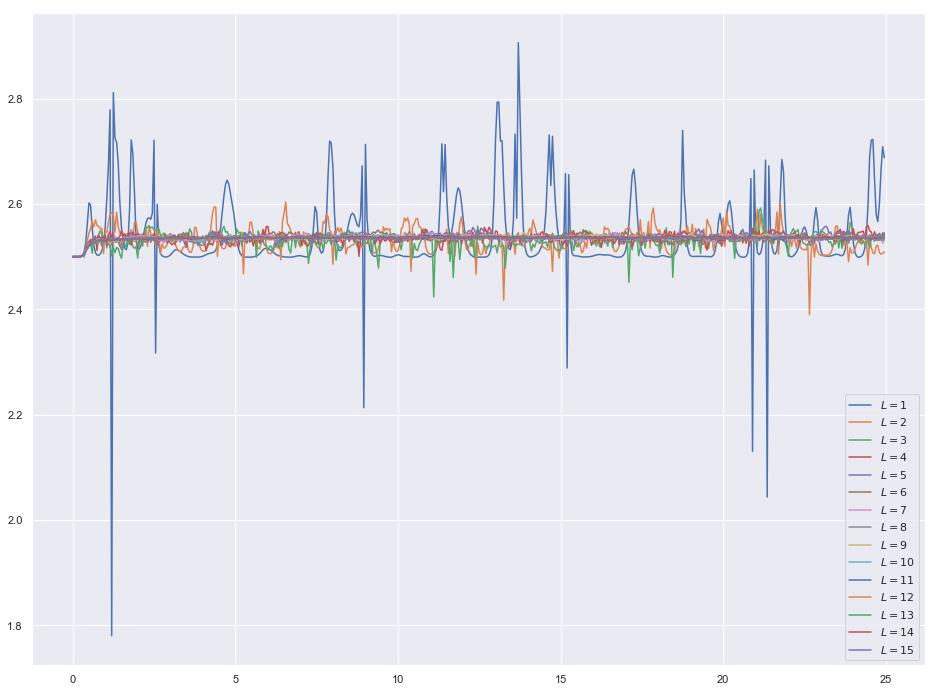

In [30]:
fig = plt.figure(figsize=(16, 12))
mean_list = []
std_list = []
system_sizes = list(range(1, 16))

for size in system_sizes:
    filename = os.path.join(f"temperature_size_{size}.log")
    log_df = pd.read_csv(filename, sep="\s+", skiprows=15, skipfooter=27, engine="python")
    mean_list.append(np.mean(log_df["Temp"].iloc[time > 5]))
    std_list.append(np.std(log_df["Temp"].iloc[time > 5]))

    plt.plot(time, log_df["Temp"][:-1], label=fr"$L = {size}$")

plt.legend(loc="best")
plt.show()

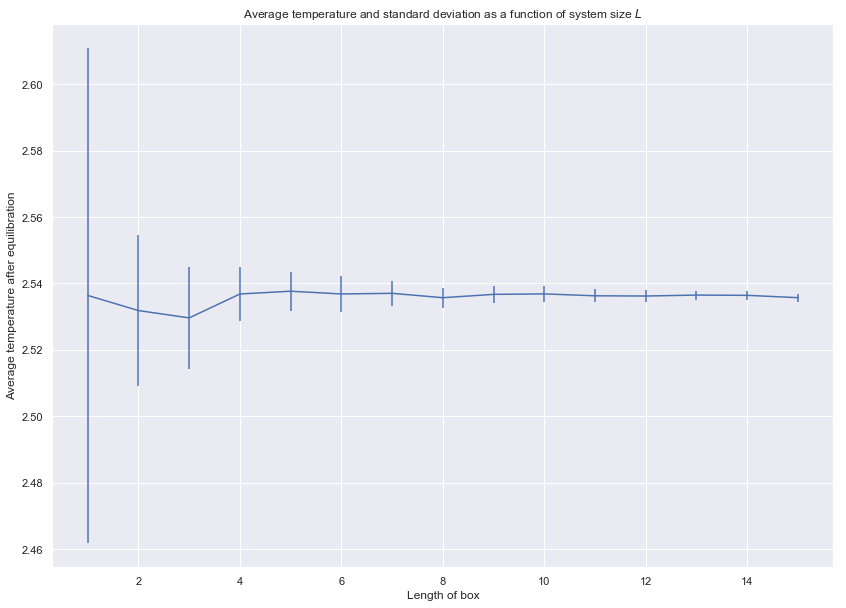

In [31]:
fig = plt.figure(figsize=(14, 10))
plt.errorbar(system_sizes, mean_list, yerr=std_list)
plt.xlabel(r"Length of box")
plt.ylabel(r"Average temperature after equilibration")
plt.title(r"Average temperature and standard deviation as a function of system size $L$")
plt.show()

In this figure we can see the average temperature after equilibration as a function of the length of one of the sides of the simulation box. We have also plotted the standard deviation in the temperature after equilibration. Not surprisingly, for a larger box we reach a more stable temperature.

## Measuring the pressure

We will now explore how the pressure of the system changes as a function of temperature. Lammps uses the virial equation to measure the average pressure. This is given by
\begin{align}
    P = \rho k_B T + \frac{1}{3V}\sum_{i < j} \mathbf{F}_{ij}\cdot \mathbf{r}_{ij},
\end{align}
where the particle density, $\rho$, in a volume $V$ is given by
\begin{align}
    \rho = \frac{N}{V}.
\end{align}
As Lammps computes the pressue in this manner, we'll read the pressue from the log-files along with the temperature.

### Pressure as a function of temperature

We'll start by looking at a fixed sized system, that is, we keep the volume and the number of particles constant. We will then measure the pressure of the system for varying temperatures. When measuring the pressure we wait until the system has equilibrated. Furthermore, as both the temperature and the pressure fluctuates, we'll compute the average pressure and the average temperature after the system is equilibrated.

In [112]:
%%writefile pressure-temperature.in
# 3d Lennard-Jones gas
units lj
dimension 3
boundary p p p
atom_style atomic

lattice fcc 0.01
region simbox block 0 15 0 15 0 15
create_box 1 simbox
create_atoms 1 box
#change_box all x final 0 20 y final 0 20 z final 0 20

mass 1 1.0
velocity all create ${temperature} 87287 dist uniform

pair_style lj/cut 3.0
pair_coeff 1 1 1.0 1.0 3.0

fix 1 all nve

log pressure_temperature_${temperature}.log
thermo 10
run 5000

Overwriting pressure-temperature.in


We'll now run the Lammps script for several different temperatures.

In [118]:
!mpirun -np 2 lmp -var temperature 2.5 -in pressure-temperature.in
!mpirun -np 2 lmp -var temperature 5.0 -in pressure-temperature.in
!mpirun -np 2 lmp -var temperature 10.0 -in pressure-temperature.in
!mpirun -np 2 lmp -var temperature 15.0 -in pressure-temperature.in
!mpirun -np 2 lmp -var temperature 20.0 -in pressure-temperature.in
!mpirun -np 2 lmp -var temperature 25.0 -in pressure-temperature.in
!mpirun -np 2 lmp -var temperature 30.0 -in pressure-temperature.in

LAMMPS (4 Jan 2019)
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (110.521 110.521 110.521)
  1 by 1 by 2 MPI processor grid
Created 13500 atoms
  Time spent = 0.001065 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 67 67 67
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.005
Per MPI rank memory allocation (min/avg/max) = 3.936 | 3.936 | 3.936 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0          2.5            0            0    3.7497222  0.024998148 
      10          2.5            0            0    3.7497222  0.024998148 
 

     990    2.5345863 -0.054995615            0    3.7466023  0.025296777 
    1000    2.5333924 -0.053184902            0    3.7466223   0.02536185 
    1010    2.5340377 -0.054143802            0    3.7466312   0.02526401 
    1020    2.5343593 -0.054626272            0     3.746631  0.025157007 
    1030    2.5348913 -0.055414927            0    3.7466403  0.025076344 
    1040    2.5333014 -0.053033523            0     3.746637  0.025219128 
    1050    2.5319872 -0.051057784            0    3.7466417  0.025357861 
    1060    2.5334101 -0.053189679            0    3.7466439  0.025256551 
    1070    2.5339037 -0.053922161            0    3.7466518  0.025201682 
    1080     2.533271 -0.052962955            0    3.7466621  0.025259496 
    1090    2.5341693 -0.054312896            0    3.7466595  0.025245965 
    1100     2.532464 -0.051762569            0    3.7466521  0.025425689 
    1110    2.5333873 -0.053142812            0    3.7466566  0.025382708 
    1120    2.5346073  -0

    2100    2.5354877 -0.056249937            0       3.7467  0.025154678 
    2110    2.5343457 -0.054506176            0    3.7467308  0.025259646 
    2120    2.5336122 -0.053394817            0     3.746742   0.02533626 
    2130    2.5343811 -0.054557241            0    3.7467328  0.025277714 
    2140    2.5357503 -0.056631625            0    3.7467121  0.025184684 
    2150    2.5338298 -0.053747004            0    3.7467162  0.025362044 
    2160    2.5330532 -0.052590049            0    3.7467084  0.025426727 
    2170    2.5347151 -0.055076156            0    3.7467148  0.025250094 
    2180    2.5343144  -0.05447116            0    3.7467188  0.025204247 
    2190    2.5349584 -0.055443176            0    3.7467128  0.025119347 
    2200     2.533473 -0.053194646            0    3.7467333  0.025207364 
    2210     2.534438 -0.054658052            0    3.7467173  0.025159274 
    2220     2.533098 -0.052668301            0    3.7466973  0.025268129 
    2230    2.5331371 -0.

    3200    2.5351328 -0.055821522            0     3.746596  0.025229412 
    3210    2.5335159 -0.053409662            0    3.7465827  0.025314313 
    3220    2.5357175 -0.056716329            0    3.7465782  0.025118093 
    3230    2.5373524 -0.059148332            0    3.7465984  0.024995046 
    3240    2.5362151  -0.05741849            0    3.7466224  0.025138336 
    3250    2.5363325 -0.057590694            0    3.7466262  0.025239414 
    3260    2.5366881 -0.058122843            0    3.7466275  0.025280859 
    3270    2.5367574 -0.058203045            0    3.7466512  0.025277234 
    3280    2.5349028 -0.055390519            0     3.746682  0.025366009 
    3290    2.5365103 -0.057821851            0    3.7466618  0.025222033 
    3300    2.5361013 -0.057197052            0    3.7466731  0.025236518 
    3310    2.5347722  -0.05521612            0    3.7466605  0.025351505 
    3320     2.533998 -0.054068317            0    3.7466471  0.025422935 
    3330     2.535227 -0.

    4330    2.5372271 -0.059033851            0    3.7465249  0.025414913 
    4340    2.5379074 -0.060051941            0    3.7465271    0.0253183 
    4350    2.5389043 -0.061576545            0    3.7464977  0.025220353 
    4360    2.5381326 -0.060427655            0    3.7464892  0.025235544 
    4370    2.5381072 -0.060381841            0    3.7464969  0.025226422 
    4380    2.5373926 -0.059309698            0    3.7464972  0.025309729 
    4390    2.5377559 -0.059843828            0    3.7465081  0.025315439 
    4400    2.5381931 -0.060499688            0     3.746508  0.025302976 
    4410    2.5393465 -0.062242899            0    3.7464947  0.025249124 
    4420    2.5381982 -0.060510535            0    3.7465047  0.025343777 
    4430    2.5386614 -0.061198043            0    3.7465119  0.025302838 
    4440    2.5375456 -0.059511305            0    3.7465252   0.02533378 
    4450      2.53784 -0.059939526            0    3.7465385  0.025270282 
    4460      2.53866  -0

     170    5.0225688 -0.036368047            0     7.496927  0.050464702 
     180    5.0224535 -0.036282055            0    7.4968402  0.050525976 
     190    5.0199597 -0.032616748            0    7.4967651  0.050788901 
     200    5.0257673 -0.041392684            0    7.4966999  0.050500366 
     210    5.0240352 -0.038852582            0     7.496642  0.050700478 
     220    5.0265262 -0.042625933            0    7.4966049  0.050597006 
     230    5.0290652 -0.046441165            0    7.4965979  0.050436297 
     240    5.0262745 -0.042284846            0    7.4965685  0.050659622 
     250    5.0275413 -0.044165204            0    7.4965881  0.050617094 
     260    5.0283369 -0.045401097            0    7.4965456  0.050582392 
     270    5.0287418 -0.046068281            0    7.4964856  0.050567498 
     280    5.0254608 -0.041193732            0    7.4964391  0.050767505 
     290    5.0248687 -0.040340401            0    7.4964043  0.050782446 
     300    5.0276901 -0.

    1270    5.0272693  -0.04404147            0    7.4963039  0.050710857 
    1280    5.0282699 -0.045530636            0    7.4963155  0.050581376 
    1290    5.0294829 -0.047369096            0    7.4962964  0.050466716 
    1300    5.0298353 -0.047898101            0     7.496296  0.050505371 
    1310    5.0268636 -0.043491955            0    7.4962449  0.050833123 
    1320    5.0270157 -0.043721485            0    7.4962434  0.050888084 
    1330    5.0285358 -0.045930543            0    7.4963144  0.050780467 
    1340    5.0278267 -0.044885212            0    7.4962962  0.050808243 
    1350    5.0303548 -0.048659534            0    7.4963137   0.05058628 
    1360     5.031022 -0.049653947            0      7.49632  0.050518843 
    1370    5.0287905 -0.046288443            0    7.4963385  0.050654056 
    1380    5.0290009 -0.046577734            0    7.4963648  0.050606073 
    1390    5.0291777 -0.046892438            0    7.4963154  0.050582535 
    1400    5.0293085  -0

    2400    5.0279283 -0.045102597            0    7.4962311  0.050656296 
    2410    5.0323722  -0.05178911            0    7.4962101  0.050373824 
    2420    5.0275035 -0.044533607            0     7.496163  0.050765896 
    2430    5.0306271 -0.049200573            0    7.4961811  0.050617762 
    2440    5.0310334 -0.049789888            0    7.4962012  0.050628893 
    2450    5.0312019 -0.050039037            0    7.4962047  0.050648499 
    2460    5.0290017 -0.046729965            0    7.4962138   0.05080385 
    2470    5.0321819 -0.051484203            0    7.4962295  0.050543187 
    2480    5.0311515 -0.049956077            0    7.4962121  0.050561552 
    2490    5.0321382 -0.051490698            0    7.4961574  0.050499422 
    2500    5.0301808  -0.04848691            0    7.4962254  0.050611728 
    2510    5.0311864 -0.050012505            0    7.4962081  0.050508762 
    2520    5.0304264  -0.04891269            0     7.496168  0.050516964 
    2530    5.0297923 -0.

    3500    5.0301156 -0.048419159            0    7.4961954    0.0505783 
    3510    5.0301744 -0.048547349            0    7.4961553  0.050638509 
    3520    5.0276046 -0.044634652            0    7.4962136  0.050787087 
    3530     5.028157 -0.045480315            0    7.4961966  0.050674946 
    3540    5.0277484  -0.04489291            0    7.4961711  0.050676366 
    3550    5.0263398 -0.042761259            0      7.49619  0.050807807 
    3560    5.0302322  -0.04864329            0    7.4961461  0.050595188 
    3570    5.0318289  -0.05098729            0     7.496197  0.050477373 
    3580    5.0283053 -0.045674299            0    7.4962249  0.050741327 
    3590    5.0289108 -0.046627153            0    7.4961802  0.050718657 
    3600    5.0306794 -0.049321236            0    7.4961389  0.050602392 
    3610    5.0281509 -0.045494413            0    7.4961733  0.050799503 
    3620    5.0305229 -0.049083648            0    7.4961417  0.050667223 
    3630    5.0301465  -0

    4600    5.0291961 -0.047070077            0    7.4961652  0.050522716 
    4610    5.0294696 -0.047517361            0    7.4961283  0.050548351 
    4620    5.0283399 -0.045736056            0    7.4962151  0.050651482 
    4630    5.0312623 -0.050197065            0    7.4961374   0.05050866 
    4640    5.0308434 -0.049584072            0    7.4961221  0.050604612 
    4650    5.0288808 -0.046583864            0    7.4961785  0.050773759 
    4660    5.0322388 -0.051645451            0    7.4961537  0.050550638 
    4670     5.030895 -0.049672941            0    7.4961105  0.050661647 
    4680     5.031113 -0.049971742            0    7.4961387  0.050620085 
    4690    5.0327172 -0.052400779            0    7.4961159  0.050491152 
    4700    5.0297747 -0.047968098            0    7.4961351  0.050726466 
    4710    5.0316018 -0.050734202            0    7.4961094  0.050596039 
    4720    5.0304802  -0.04900712            0    7.4961542  0.050662279 
    4730     5.025255 -0.

     470    10.020782 -0.034374861            0    14.995685   0.10116375 
     480    10.013916 -0.024280842            0    14.995481   0.10166406 
     490    10.018066 -0.030464135            0    14.995522   0.10138073 
     500    10.015455  -0.02657292            0    14.995497   0.10152204 
     510    10.018982 -0.031922124            0    14.995437   0.10122285 
     520    10.025746 -0.042046949            0    14.995459   0.10069442 
     530    10.024075  -0.03951105            0    14.995488   0.10077139 
     540      10.0213 -0.035456016            0    14.995381   0.10100802 
     550    10.024346 -0.040001986            0    14.995404   0.10088378 
     560    10.018842 -0.031888002            0    14.995262   0.10128772 
     570    10.020939 -0.034821284            0    14.995474   0.10111115 
     580    10.017679  -0.02989762            0    14.995508   0.10127027 
     590    10.021326 -0.035509544            0    14.995366   0.10105604 
     600    10.019364 -0.

    1630    10.018728 -0.032061355            0    14.994918   0.10121844 
    1640     10.02422 -0.040190719            0    14.995026    0.1007869 
    1650    10.018988 -0.032267725            0      14.9951   0.10112738 
    1660    10.017611 -0.030237284            0    14.995066   0.10127375 
    1670    10.016778 -0.028996034            0    14.995058   0.10139017 
    1680    10.014859 -0.026075294            0      14.9951   0.10152842 
    1690    10.020488 -0.034643374            0    14.994975   0.10119268 
    1700    10.016225 -0.028269611            0    14.994955   0.10140998 
    1710    10.018721 -0.031918751            0     14.99505   0.10117269 
    1720    10.017924 -0.030777482            0    14.994996   0.10122652 
    1730    10.022292 -0.037496367            0    14.994828   0.10097509 
    1740    10.019831  -0.03382433            0    14.994809   0.10117471 
    1750    10.015717 -0.027655568            0    14.994806   0.10144486 
    1760      10.0167 -0.

    2740    10.020135    -0.034673            0    14.994416   0.10115731 
    2750    10.012011 -0.022246713            0    14.994658   0.10168655 
    2760    10.018988 -0.032969449            0    14.994399   0.10118005 
    2770    10.015245 -0.027211598            0    14.994544    0.1014064 
    2780    10.020579 -0.035498879            0    14.994256   0.10107321 
    2790    10.018867  -0.03281991            0    14.994367   0.10114359 
    2800     10.02248 -0.038294466            0    14.994312   0.10100084 
    2810    10.020138 -0.034818384            0    14.994275   0.10123072 
    2820    10.022647 -0.038430215            0    14.994426   0.10111237 
    2830    10.020668 -0.035516484            0    14.994371   0.10118922 
    2840    10.025685  -0.04288575            0    14.994528   0.10079023 
    2850    10.017952 -0.031266889            0    14.994549   0.10136355 
    2860    10.021712 -0.037218192            0    14.994237   0.10115644 
    2870    10.021867 -0.

    3840    10.018745 -0.033131973            0    14.993872   0.10121625 
    3850    10.018831 -0.033305166            0    14.993828     0.101199 
    3860    10.017849  -0.03164468            0    14.994016   0.10123976 
    3870    10.018709 -0.033117448            0    14.993832   0.10117416 
    3880    10.017845   -0.0317679            0    14.993886   0.10122201 
    3890    10.018997 -0.033566714            0    14.993815   0.10110043 
    3900    10.020187  -0.03518227            0    14.993985   0.10099565 
    3910    10.019777 -0.034609781            0    14.993943   0.10109335 
    3920    10.022528 -0.038912221            0    14.993767   0.10101304 
    3930    10.014843 -0.027270626            0     14.99388   0.10160389 
    3940    10.017689 -0.031679282            0    14.993741   0.10144893 
    3950    10.018885 -0.033300306            0    14.993914   0.10137985 
    3960    10.016048 -0.028976896            0    14.993982   0.10157883 
    3970    10.024544 -0.

    4950    10.015517 -0.028932931            0     14.99323   0.10152124 
    4960    10.018338 -0.033182182            0    14.993212   0.10130522 
    4970    10.016004 -0.029574639            0    14.993318   0.10145907 
    4980    10.018756 -0.033679588            0    14.993341   0.10121217 
    4990    10.016024 -0.029697151            0    14.993226   0.10139846 
    5000     10.01711 -0.031293269            0    14.993259   0.10141527 
Loop time of 5.03893 on 2 procs for 5000 steps with 13500 atoms

Performance: 428662.562 tau/day, 992.274 timesteps/s
93.9% CPU use with 2 MPI tasks x no OpenMP threads

MPI task timing breakdown:
Section |  min time  |  avg time  |  max time  |%varavg| %total
---------------------------------------------------------------
Pair    | 1.6715     | 1.6813     | 1.691      |   0.8 | 33.37
Neigh   | 1.5122     | 1.5412     | 1.5701     |   2.3 | 30.58
Comm    | 0.89225    | 0.9405     | 0.98874    |   5.0 | 18.66
Output  | 0.040982   | 0.05047    | 

     780    15.009007 -0.018017541            0    22.493825   0.15177982 
     790    15.013817 -0.025079647            0    22.493978   0.15138597 
     800    15.012974  -0.02371445            0    22.494079   0.15159721 
     810    15.008093 -0.016627993            0    22.493845   0.15202586 
     820    15.011885 -0.022319095            0    22.493841   0.15174979 
     830      15.0047 -0.011375046            0    22.494008   0.15219424 
     840    15.013092 -0.024253986            0    22.493716   0.15163125 
     850    15.004225 -0.010797909            0    22.493873   0.15223059 
     860    15.005474  -0.01264432            0    22.493899   0.15219082 
     870    15.008114 -0.016620765            0    22.493883    0.1519563 
     880    15.007211 -0.015513441            0    22.493636   0.15205262 
     890    15.013438 -0.024841153            0    22.493647   0.15171504 
     900    15.008029 -0.016554775            0    22.493821   0.15206237 
     910    15.016264 -0.

    1880     15.00515 -0.013721098            0    22.492336    0.1520804 
    1890    15.009797 -0.020726841            0      22.4923   0.15174722 
    1900    15.011566 -0.023565019            0    22.492116   0.15164273 
    1910    15.011919 -0.024238017            0    22.491972   0.15157041 
    1920    15.012513 -0.024931814            0     22.49217   0.15151439 
    1930    15.006712 -0.016582904            0    22.491818   0.15188897 
    1940    15.006947 -0.016740277            0    22.492013   0.15194968 
    1950    15.005436 -0.014192276            0    22.492294   0.15202128 
    1960    15.007896 -0.017588446            0    22.492589   0.15177682 
    1970     15.01337 -0.026000203            0    22.492387    0.1514993 
    1980    15.016819 -0.031288782            0    22.492272   0.15130326 
    1990     15.01001  -0.02075428            0    22.492593   0.15171808 
    2000    15.019961 -0.035719238            0    22.492554   0.15108901 
    2010    14.999322 -0.

    3010    15.001927 -0.010309837            0    22.490914   0.15212446 
    3020     15.00901 -0.021222953            0    22.490625   0.15163113 
    3030    15.003448 -0.013343336            0    22.490162   0.15202546 
    3040    15.010246   -0.0233653            0    22.490335   0.15163403 
    3050    15.005362 -0.016066179            0    22.490309   0.15194319 
    3060    15.014649 -0.029925622            0     22.49038   0.15128097 
    3070    15.008465  -0.02030615            0    22.490724   0.15161229 
    3080    15.007006 -0.018368458            0    22.490473   0.15176298 
    3090    15.004465 -0.014867197            0    22.490163   0.15214098 
    3100    15.013657 -0.028222442            0    22.490594   0.15141461 
    3110    15.010597 -0.023826809            0    22.490401   0.15149308 
    3120    15.011305 -0.025088517            0    22.490201   0.15130923 
    3130    15.004511 -0.014799027            0      22.4903   0.15174815 
    3140    15.010681  -0

    4140    15.008261 -0.020723386            0        22.49    0.1517472 
    4150    15.008414 -0.021058527            0    22.489895   0.15178854 
    4160    15.002912 -0.013016997            0    22.489684   0.15214319 
    4170    15.010621 -0.024411561            0    22.489853   0.15157452 
    4180    15.011387 -0.025610166            0    22.489802   0.15141581 
    4190    15.005041 -0.016015806            0    22.489878   0.15183062 
    4200    15.012573 -0.027545077            0    22.489646     0.151382 
    4210    15.007301 -0.019378656            0    22.489906   0.15178737 
    4220    15.006923 -0.019073897            0    22.489643   0.15184715 
    4230    15.013415  -0.02889399            0    22.489561   0.15140216 
    4240    15.015095 -0.031656322            0    22.489318    0.1511883 
    4250    15.014038 -0.029830416            0    22.489559   0.15125118 
    4260    15.004048 -0.014848958            0    22.489556   0.15196066 
    4270    15.009056 -0.

      70    19.981165  0.025210588            0    29.994739   0.20313386 
      80    20.002942 -0.0075061161            0    29.994684   0.20181718 
      90    20.002441 -0.0066540872            0    29.994785   0.20187386 
     100    20.006552 -0.013777229            0    29.993828   0.20177115 
     110    19.997757 1.2182892e-05            0    29.994426   0.20248771 
     120    20.000812 -0.0045980705            0    29.994397   0.20230138 
     130    20.009967 -0.018813567            0    29.993914   0.20178779 
     140    19.994556 0.0048611635            0    29.994473   0.20273841 
     150    19.993014 0.0068531164            0    29.994152   0.20283739 
     160    19.995428 0.0034234772            0    29.994343   0.20272329 
     170    20.000476 -0.0049396582            0    29.993552    0.2023415 
     180    20.000817 -0.0053083007            0    29.993694   0.20235115 
     190    20.001278 -0.0059575165            0    29.993736   0.20235856 
     200    20.001

    1170    19.999048 -0.004410408            0    29.991939    0.2025007 
    1180    20.004165 -0.011590361            0    29.992434   0.20215323 
    1190    20.001983 -0.0085465408            0    29.992205   0.20229645 
    1200    20.006238 -0.015173196            0    29.991962   0.20206764 
    1210    20.002424 -0.010110142            0    29.991303   0.20218387 
    1220    20.000504 -0.006770797            0    29.991763   0.20235045 
    1230    20.003238 -0.011068838            0    29.991566   0.20209735 
    1240    19.993836 0.0032924915            0    29.991826   0.20260694 
    1250     19.99238 0.0050149027            0    29.991364   0.20275151 
    1260     20.00171 -0.008692406            0    29.991649   0.20210993 
    1270    19.993498 0.0037028721            0    29.991729   0.20268572 
    1280    19.998974 -0.0049091858            0    29.991329   0.20240312 
    1290    20.008133 -0.018466354            0     29.99151   0.20178985 
    1300    20.002171 -

    2300    19.999527 -0.0092438557            0    29.987825   0.20218113 
    2310    19.992941 6.5342935e-05            0    29.987256   0.20264022 
    2320    19.994967 -0.0030816368            0    29.987147    0.2025732 
    2330    20.003357 -0.015663703            0    29.987149   0.20178061 
    2340    19.997982 -0.0070248124            0    29.987726   0.20227072 
    2350    19.995651 -0.0054782104            0    29.985777    0.2025304 
    2360     20.00523 -0.017629948            0    29.987992   0.20199177 
    2370    19.996736 -0.0048488304            0    29.988034   0.20255791 
    2380    19.993013  0.001915759            0    29.989214   0.20274845 
    2390    20.001028 -0.010224997            0    29.989094   0.20226517 
    2400    19.997033 -0.0041376257            0     29.98919   0.20250383 
    2410    20.005803 -0.017515835            0    29.988966   0.20191415 
    2420    20.006122 -0.018470739            0    29.988489   0.20200847 
    2430    20.002

    3400    20.008947 -0.016492259            0    29.994704   0.20200895 
    3410    20.000514 -0.0039534025            0    29.994595   0.20248449 
    3420    20.001407 -0.0055275989            0     29.99436   0.20230258 
    3430    20.005921 -0.012105607            0    29.994554   0.20203972 
    3440    20.007025 -0.013825002            0     29.99449   0.20202374 
    3450    20.001737 -0.0058267583            0    29.994557   0.20246894 
    3460    20.005297 -0.011602186            0    29.994121   0.20226705 
    3470    20.001935 -0.0064295621            0     29.99425   0.20246546 
    3480    20.010465 -0.018979382            0    29.994495   0.20189164 
    3490    20.003165 -0.0080505404            0    29.994474   0.20232185 
    3500    20.006191 -0.012602828            0    29.994461   0.20211718 
    3510    20.003164 -0.008182495            0    29.994341   0.20232156 
    3520    20.005399 -0.010957602            0    29.994919   0.20212834 
    3530    20.00209

    4490       19.997 -0.00083697944            0    29.992441   0.20259123 
    4500    19.998556 -0.004221044            0     29.99139   0.20250018 
    4510    20.003234 -0.011315289            0    29.991314   0.20220794 
    4520    19.991114  0.008164995            0    29.992615   0.20291009 
    4530    20.008368 -0.019103206            0    29.991225   0.20183306 
    4540    20.007152 -0.017284747            0    29.991221   0.20194277 
    4550    19.995532 -7.1956343e-05            0    29.991004     0.202594 
    4560    20.003241 -0.011552177            0    29.991086   0.20207204 
    4570    19.999449 -0.0061010636            0    29.990851   0.20241483 
    4580    20.006441  -0.01773166            0    29.989707   0.20197131 
    4590    20.008315 -0.019333178            0    29.990916   0.20192669 
    4600    20.001651 -0.0096021643            0    29.990652   0.20242302 
    4610    20.012301 -0.025271778            0    29.990956   0.20180814 
    4620    20.0000

     340    24.994561 0.0032177151            0    37.492283    0.2526043 
     350     24.98762  0.013580557            0    37.492234   0.25298354 
     360    24.999065 -0.0044668472            0    37.491353   0.25230456 
     370    24.999288 -0.0049256843            0    37.491228   0.25240874 
     380    24.984745  0.016707844            0    37.491049   0.25335955 
     390    25.002593  -0.00974467            0    37.491368   0.25220851 
     400    25.010344 -0.021398352            0    37.491339   0.25173128 
     410    24.988446  0.012311039            0    37.492203   0.25313314 
     420    25.003223 -0.0099454831            0     37.49211   0.25210243 
     430    24.991357 0.0077553334            0    37.492014   0.25295476 
     440    24.988039   0.01199219            0    37.491275   0.25320794 
     450    24.997213 -0.0021263468            0    37.490915   0.25256082 
     460    24.991964 0.0056406731            0     37.49081   0.25291238 
     470    24.997292

    1430    24.994893  0.010578706            0    37.500141   0.25321613 
    1440    24.986497  0.029256185            0    37.506225   0.25401563 
    1450    25.002852 0.0040478209            0    37.505547     0.252981 
    1460     25.00569 -0.00058120375            0    37.505175   0.25279002 
    1470    25.003392 0.0036905622            0    37.506001    0.2529627 
    1480    25.008242 -0.0044955046            0    37.505089   0.25258158 
    1490    25.004217 0.0013043615            0    37.504852   0.25281019 
    1500    24.994217  0.016674819            0    37.505223   0.25344351 
    1510    25.004383 0.0015094953            0    37.505306   0.25280504 
    1520     25.00272  0.004017246            0    37.505319   0.25292015 
    1530    25.003234 0.0033959141            0    37.505469   0.25284825 
    1540    25.006948 -0.0018040257            0    37.505839   0.25257004 
    1550    24.989622  0.022861342            0    37.504518    0.2536573 
    1560    25.002031

    2550    25.016161  0.018973813            0    37.540435   0.25369229 
    2560    25.023897 0.0068750896            0    37.539941   0.25333224 
    2570    25.019913  0.014221139            0    37.541311   0.25353813 
    2580    25.021158   0.01037498            0    37.539332   0.25339003 
    2590    25.019767  0.013465761            0    37.540336   0.25353167 
    2600    25.031363 -0.0030723264            0    37.541191   0.25287599 
    2610    25.020855  0.011468624            0    37.539971   0.25354951 
    2620    25.018187  0.015525902            0    37.540026   0.25365386 
    2630    25.019918  0.012636231            0    37.539734   0.25349034 
    2640    25.004906  0.036795425            0    37.541377      0.25449 
    2650    25.017111  0.017696078            0    37.540583   0.25368098 
    2660    25.026101 0.0035100206            0     37.53988   0.25304987 
    2670    25.032003 -0.0054134897            0    37.539809   0.25275112 
    2680    25.038769 -

    3650    25.018401  0.018331514            0    37.543153   0.25385142 
    3660    25.023681  0.010053832            0    37.542795   0.25352649 
    3670    25.040226 -0.014321441            0    37.543235   0.25245802 
    3680    25.015218  0.027347271            0    37.547395   0.25399277 
    3690    25.034999 -0.0015582394            0    37.548159   0.25281079 
    3700    25.037382 -0.0066606759            0     37.54663   0.25262377 
    3710    25.036949 -0.0057145036            0    37.546927    0.2527242 
    3720    25.037669 -0.0067985263            0    37.546922    0.2528216 
    3730    25.028658 0.0060982618            0    37.546304   0.25339805 
    3740    25.037003 -0.0068247261            0    37.545898   0.25282228 
    3750    25.022723  0.015371308            0    37.546675   0.25374947 
    3760    25.029412 0.0080777275            0    37.549415   0.25340825 
    3770    25.024038  0.013762479            0     37.54704    0.2536181 
    3780    25.03641

    4780    25.035219  0.010489052            0    37.560535   0.25354219 
    4790    25.044201 -0.00073965392            0     37.56278    0.2531069 
    4800    25.035805  0.012806219            0    37.563731   0.25374826 
    4810    25.042135 0.0030968307            0    37.563517   0.25335385 
    4820    25.034082  0.021613184            0    37.569955   0.25402759 
    4830     25.04792 0.0039080829            0    37.573004   0.25340877 
    4840    25.041869  0.011968863            0     37.57199   0.25385103 
    4850    25.055134 -0.0077683391            0    37.572149   0.25304656 
    4860    25.052999 -0.0039981218            0    37.572717   0.25308657 
    4870    25.047934 0.0041310141            0    37.573249   0.25330167 
    4880    25.041533  0.012819595            0    37.572337   0.25368465 
    4890    25.047299 0.0053895066            0    37.573556   0.25333931 
    4900    25.055322 -0.0074743146            0    37.572725    0.2528165 
    4910    25.04946

     650    29.976015  0.032909721            0    44.993602   0.30392786 
     660    29.997192 0.00082659714            0    44.993281   0.30254551 
     670    29.992433 0.0075707602            0    44.992887   0.30279611 
     680    29.996094 0.0025800951            0    44.993388   0.30277288 
     690    29.980488  0.023696551            0    44.991098   0.30368889 
     700    29.974324  0.034050854            0    44.992207   0.30404844 
     710    29.990498 0.0086096664            0    44.991024   0.30303241 
     720    29.986272  0.015844827            0    44.991921    0.3033749 
     730    29.986683   0.01592202            0    44.992615   0.30334012 
     740    29.988783  0.013214587            0    44.993057   0.30311136 
     750    29.988553  0.013588326            0    44.993086    0.3031289 
     760    29.987385  0.014608437            0    44.992354    0.3030798 
     770    29.986304  0.018294963            0    44.994419   0.30316868 
     780    29.993832 0.

    1750    30.051258  0.001545118            0    45.075093   0.30331829 
    1760    30.038406     0.020848            0     45.07512   0.30421485 
    1770    30.038353  0.020781345            0    45.074973    0.3041696 
    1780    30.056936 -0.0045084871            0    45.077556    0.3032556 
    1790    30.039858  0.021642414            0    45.078091   0.30414991 
    1800     30.04495  0.013736152            0    45.077823   0.30382045 
    1810    30.039045  0.024150019            0     45.07938    0.3042296 
    1820    30.041078   0.02209247            0    45.080372   0.30433543 
    1830    30.045878  0.012001431            0    45.077479   0.30374297 
    1840    30.038093  0.022666891            0    45.076469   0.30411239 
    1850    30.058124 -0.0075094108            0    45.076337   0.30281283 
    1860    30.043012   0.01382653            0    45.075007   0.30377692 
    1870    30.053575 -0.0019942471            0     45.07503   0.30321825 
    1880    30.044639 

    2870    30.067177  0.023318075            0    45.120743   0.30433373 
    2880    30.085854 -0.0038091525            0    45.121629   0.30337612 
    2890    30.082372 0.0012626427            0    45.121478   0.30357849 
    2900    30.058497  0.037943901            0    45.122349   0.30501343 
    2910    30.083853 -0.0009209703            0    45.121516   0.30339001 
    2920    30.076814  0.011805271            0    45.123685   0.30389947 
    2930    30.071391  0.018861906            0    45.122607   0.30430361 
    2940    30.070879  0.021132865            0     45.12411    0.3043506 
    2950    30.062128  0.034392131            0    45.124244   0.30494661 
    2960    30.095993 -0.016656148            0    45.123989   0.30285502 
    2970     30.08256 0.0010217251            0    45.121519   0.30374631 
    2980    30.047838  0.052667516            0    45.121085   0.30593412 
    2990    30.079221 0.0064851683            0    45.121975   0.30379745 
    3000    30.074161  

    4000    30.157964 -0.0003477701            0    45.233248   0.30419249 
    4010    30.142925  0.022243094            0    45.233281   0.30507283 
    4020    30.148267  0.014278317            0    45.233329   0.30481432 
    4030    30.157334 0.0043353115            0    45.236986   0.30441141 
    4040    30.156542 0.0053393874            0    45.236802   0.30460726 
    4050    30.153149  0.010570497            0    45.236944   0.30472987 
    4060    30.155166 0.0064791735            0    45.235877   0.30453425 
    4070    30.147965  0.021106025            0    45.239704   0.30508502 
    4080    30.144829  0.027297343            0    45.241191   0.30526616 
    4090    30.159071 0.0069174589            0    45.242173   0.30459644 
    4100    30.142291   0.03086237            0     45.24095   0.30567576 
    4110    30.166014 0.0017452546            0    45.247415   0.30452612 
    4120    30.153879  0.018900671            0    45.246368   0.30505808 
    4130    30.167003 -0

In [141]:
file_list = list(filter(lambda x: x.startswith("pressure_temperature"), os.listdir()))
temperature_list = [
    float(
        re.search(r"pressure_temperature_(.+).log", filename)
        .group(1)
    ) for filename in file_list
]

In [99]:
length = 15
volume = length ** 3
filename = os.path.join(f"temperature_size_{length}.log")

with open(filename, "r") as f:
    file_split = f.read().split("\n")
    num_atoms = int(file_split[16 + 5000 // 10 + 1].split()[-2])

print(f"Number of atoms: {num_atoms}")

particle_density = num_atoms / volume

print(f"Particle density: {particle_density}")

Number of atoms: 13500
Particle density: 4.0


In [100]:
log_df = pd.read_csv(filename, sep="\s+", skiprows=15, skipfooter=27, engine="python")

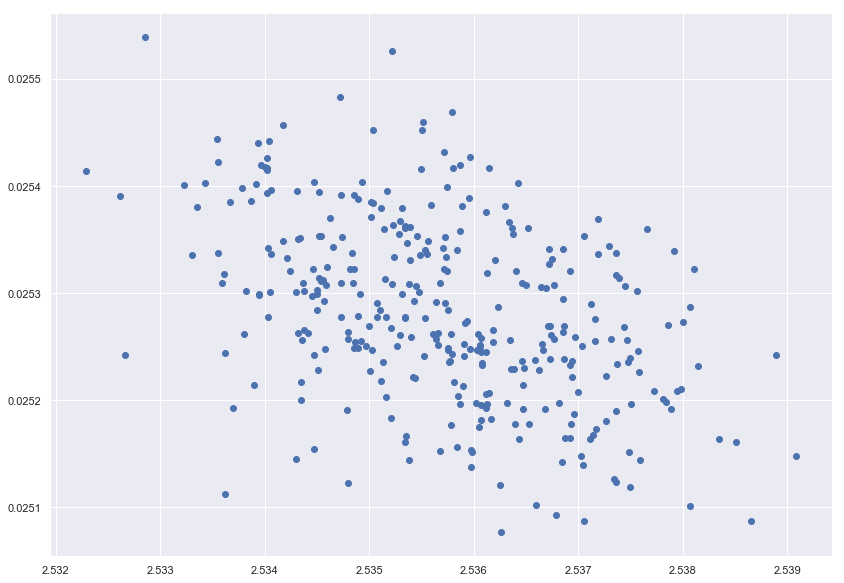

In [105]:
fig = plt.figure(figsize=(14, 10))

plt.plot(log_df["Temp"].iloc[time > 8], log_df["Press"].iloc[time > 8], "o")
plt.show()